https://www.kaggle.com/shivamb/homecreditrisk-extensive-eda-baseline-0-772

In [1]:
from plotly.offline import init_notebook_mode, iplot
from wordcloud import WordCloud
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import plotly.plotly as py
from plotly import tools
from datetime import date
import pandas as pd
import numpy as np 
import seaborn as sns
import random 
from sklearn.metrics import log_loss, roc_auc_score, roc_curve, auc
from sklearn.model_selection import StratifiedKFold, ParameterGrid
from  tqdm import tqdm
import gc
import warnings
warnings.filterwarnings("ignore")
init_notebook_mode(connected=True)

path = "../input/"

pd.set_option("display.max_columns", 2000)

In [2]:
app_train = pd.read_csv(path + "application_train.csv")
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [3]:
bureau = pd.read_csv(path + "bureau.csv")
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [4]:
bureau_balance = pd.read_csv(path + "bureau_balance.csv")
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [5]:
credit_card_balance = pd.read_csv(path + "credit_card_balance.csv")
credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [6]:
pcb = pd.read_csv(path + "POS_CASH_balance.csv")
pcb.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [7]:
previous_application = pd.read_csv(path + "previous_application.csv")
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
installments_payments = pd.read_csv(path + "installments_payments.csv")
installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


## 学習データ準備

In [9]:
from sklearn.model_selection import train_test_split 
import lightgbm as lgb

# read the test files 
app_test = pd.read_csv('../input/application_test.csv')


# Remove some rows with values not present in test set
#app_train.drop(app_train[app_train['CODE_GENDER'] == 'XNA'].index, inplace = True)
#app_train.drop(app_train[app_train['NAME_INCOME_TYPE'] == 'Maternity leave'].index, inplace = True)
#app_train.drop(app_train[app_train['NAME_FAMILY_STATUS'] == 'Unknown'].index, inplace = True)
app_train['bur NAN num'] = app_train.isnull().sum(axis = 1).values
app_test['bur NAN num'] = app_test.isnull().sum(axis = 1).values


app_test['is_test'] = 1 
app_test['is_train'] = 0
app_train['is_test'] = 0
app_train['is_train'] = 1

# target variable
Y = app_train['TARGET']
train_X = app_train.drop(['TARGET'], axis = 1)

# test ID
test_id = app_test['SK_ID_CURR']
test_X = app_test

# merge train and test datasets for preprocessing
data = pd.concat([train_X, test_X], axis=0)

### <a id="0.1">0.1 Prepare - Data Cleaning</a>

In [10]:
    
# Remove some empty features
data.drop(['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 
            'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 
            'FLAG_DOCUMENT_21'], axis = 1, inplace = True)
    
# Replace some outliers
data['DAYS_EMPLOYED'].replace(365243, np.nan, inplace = True)
data.loc[data['OWN_CAR_AGE'] > 80, 'OWN_CAR_AGE'] = np.nan
data.loc[data['REGION_RATING_CLIENT_W_CITY'] < 0, 'REGION_RATING_CLIENT_W_CITY'] = np.nan
data.loc[data['AMT_INCOME_TOTAL'] > 1e8, 'AMT_INCOME_TOTAL'] = np.nan
data.loc[data['AMT_REQ_CREDIT_BUREAU_QRT'] > 10, 'AMT_REQ_CREDIT_BUREAU_QRT'] = np.nan
data.loc[data['OBS_30_CNT_SOCIAL_CIRCLE'] > 40, 'OBS_30_CNT_SOCIAL_CIRCLE'] = np.nan

In [11]:
# 割合別
data['app self cate OCCUPATION_TYPE'] = data['OCCUPATION_TYPE'].replace({'High skill tech staff':'High_Skill',
                                    'Managers':0,
                                    'Accountants':0,
                                    'HR staff':0,
                                    'Core staff':0,
                                   'Cooking staff':1,
                                    'Realty agents':0,
                                    'Sales staff':1,
                                    'IT staff':0,
                                    'Medicine staff':0,
                                    'Secretaries':0,
                                    'Security staff':1,
                                    'Cleaning staff':1,
                                      'Laborers':1,
                                      'Low-skill Laborers':1,
                                      'Cleaning staff':1,
                                    'Waiters/barmen staff':1,
                                    'Private service staff':0,
                                    'Drivers':1,
                                    'High skill tech staff':0                                                                       
                                   },inplace=False)

data['app self cate NAME_INCOME_TYPE'] = data['NAME_INCOME_TYPE'].replace(
                        {'Businessman':0,
                         'Student':0,
                         'Unemployed':1,
                         'Working':1,
                         'Commercial associate':0,                        
                         'State servant':0,
                         'Pensioner':0,                         
                         'Maternity leave':1}
                        ,inplace=False)

data['app self cate NAME_HOUSING_TYPE'] = data['NAME_HOUSING_TYPE'].replace(
                        {'Rented apartment':1,
                         'With parents':1,
                         'Municipal apartment':0,
                         'Co-op apartment':0,
                         'House / apartment':0,                        
                         'Office apartment':0}
                        ,inplace=False)

data['app self cate ORGANIZATION_TYPE'] = data['ORGANIZATION_TYPE'].replace(
{'Transport':1, 
'Industry: type 13':1, 
'Industry: type 8':1, 
'Restaurant':1, 
'Construction':1,
'Cleaning':1,
'Industry: type 1':1,
'Industry: type 3':1,
'Realtor':1,
'Agriculture':1,
'Trade: type 3':1,
'Self-employed':1,
'Industry: type 4':1,
'Security':0,
'Trade: type 7':0,
'Business Entity Type 3':0,
'Transport: type 4':0,
'Mobile':0,
'Trade: type 1':0,
'Industry: type 11':0,
'Business Entity Type 2':0,
'Postal':0,
'Advertising':0,
'Business Entity Type 1':0,
'Industry: type 7':0,
'Housing':0,
'Legal Services':0,
'Transport: type 2':0,
'Other':0,
'Telecom':0,
'Industry: type 2':0,
'Industry: type 6':0,
'Emergency':0,
'Kindergarten':0,
'Trade: type 2':0,
'Government':0,
'Industry: type 5':0,
'Industry: type 9':0,
'Electricity':0,
'Services':0,
'Medicine':0,
'Industry: type 10':0,
'Hotel':0,
'Trade: type 5':0,
'School':0,
'Religion':0,
'Insurance':0,
'Culture':0,
'XNA':0,
'Bank':0,
'Military':0,
'Police':0,
'University':0,
'Security Ministries':0,
'Trade: type 6':0,
'Transport: type 1':0,
'Industry: type 12':0,
'Trade: type 4':0}
                        ,inplace=False)

### <a id="0.2">0.2 Prepare - Categorical Data Processing</a>

In [12]:
# function to obtain Categorical Features
def _get_categorical_features(df):
    feats = [col for col in list(df.columns) if df[col].dtype == 'object']
    return feats

# function to factorize categorical features
def _factorize_categoricals(df, cats):
    for col in cats:
        df[col], _ = pd.factorize(df[col])
    return df 

# function to create dummy variables of categorical features
def _get_dummies(df, cats):
    for col in cats:
        df = pd.concat([df, pd.get_dummies(df[col], prefix=col)], axis=1)
    return df 

# get categorical features
data_cats = _get_categorical_features(data)
prev_app_cats = _get_categorical_features(previous_application)
bureau_cats = _get_categorical_features(bureau)
pcb_cats = _get_categorical_features(pcb)
ccbal_cats = _get_categorical_features(credit_card_balance)

# create additional dummy features - 
previous_application = _get_dummies(previous_application, prev_app_cats)
bureau = _get_dummies(bureau, bureau_cats)
pcb = _get_dummies(pcb, pcb_cats)
credit_card_balance = _get_dummies(credit_card_balance, ccbal_cats)

# factorize the categorical features from train and test data
data = _factorize_categoricals(data, data_cats)

## feature engineering

### <a id="1.1">1.1 Feature Engineering - Previous Applications</a>

In [13]:

## count the number of previous applications for a given ID
prev_apps_count = previous_application[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
previous_application['pre SK_ID_PREV_CNT'] = previous_application['SK_ID_CURR'].map(prev_apps_count['SK_ID_PREV'])
previous_application.drop(['SK_ID_PREV'], axis = 1, inplace = True)


# Days 365.243 values -> nan
previous_application['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

# nan num
previous_application['pre NAN num'] = previous_application.isnull().sum(axis = 1).values

# Add feature: value ask / value received percentage
previous_application['pre AMT_APPLICATION / AMT_CREDIT'] = previous_application['AMT_APPLICATION'] / previous_application['AMT_CREDIT']
previous_application['pre loan AMT_APPLICATION / AMT_CREDIT'] = previous_application['NAME_CONTRACT_TYPE_Cash loans'] * previous_application['AMT_APPLICATION'] / previous_application['AMT_CREDIT']
previous_application['pre revo AMT_APPLICATION / AMT_CREDIT'] = previous_application['NAME_CONTRACT_TYPE_Revolving loans'] * previous_application['AMT_APPLICATION'] / previous_application['AMT_CREDIT']

previous_application['pre loan AMT_CREDIT / AMT_ANNUITY'] = previous_application['NAME_CONTRACT_TYPE_Cash loans'] * previous_application['AMT_CREDIT'] / previous_application['AMT_ANNUITY']
previous_application['pre con loan AMT_CREDIT / AMT_ANNUITY'] = previous_application['NAME_CONTRACT_TYPE_Consumer loans'] * previous_application['AMT_CREDIT'] / previous_application['AMT_ANNUITY']
previous_application['pre revo AMT_CREDIT / AMT_ANNUITY'] = previous_application['NAME_CONTRACT_TYPE_Revolving loans'] * previous_application['AMT_CREDIT'] / previous_application['AMT_ANNUITY']

## Average values for all other features in previous applications
prev_apps_avg = previous_application.groupby('SK_ID_CURR').mean()
prev_apps_avg.columns = ['pre_' + col + '_MEAN' for col in prev_apps_avg.columns]
data = data.merge(right=prev_apps_avg.reset_index(), how='left', on='SK_ID_CURR')
del prev_apps_avg
gc.collect()

# Previous applications numeric features
num_aggregations = {
        'AMT_ANNUITY': ['max'],
        'AMT_APPLICATION': ['max'],
        'AMT_CREDIT': ['max', 'sum'],
        'pre AMT_APPLICATION / AMT_CREDIT': ['max'],
        'AMT_DOWN_PAYMENT': ['max'],
        'AMT_GOODS_PRICE': ['max'],
        'HOUR_APPR_PROCESS_START': ['max'],
        'RATE_DOWN_PAYMENT': ['max'],
        'DAYS_DECISION': ['max'],
        'CNT_PAYMENT': ['sum'],
}

cat_aggregations = {}

prev_agg = previous_application.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
prev_agg.columns = pd.Index(['pre_' + e[0] for e in prev_agg.columns.tolist()])

# Previous Applications: Approved Applications - only numerical features
approved = previous_application[previous_application['NAME_CONTRACT_STATUS_Approved'] == 1]
approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
approved_agg.columns = pd.Index(['pre_APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')

# Previous Applications: Refused Applications - only numerical features
refused = previous_application[previous_application['NAME_CONTRACT_STATUS_Refused'] == 1]
refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
refused_agg.columns = pd.Index(['pre_REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
prev_done = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
del refused, refused_agg, approved, approved_agg
gc.collect()

data = data.merge(right=prev_done.reset_index(), how='left', on='SK_ID_CURR')

### <a id="1.2">1.2 Feature Engineering - Bureau Data</a>

In [14]:
bureau['bur NAN num'] = bureau.isnull().sum(axis = 1).values
bureau_balance['bur_bal NAN num'] = bureau_balance.isnull().sum(axis = 1).values

# Average Values for all bureau features 
bureau_avg = bureau.groupby('SK_ID_CURR').mean()
bureau_avg['bur CNT'] = bureau[['SK_ID_BUREAU','SK_ID_CURR']].groupby('SK_ID_CURR').count()['SK_ID_BUREAU']
bureau_avg.columns = ['bur_' + f_ + 'MEAN' for f_ in bureau_avg.columns]
data = data.merge(right=bureau_avg.reset_index(), how='left', on='SK_ID_CURR')
del bureau_avg
gc.collect()

# Bureau balance: Perform aggregations and merge with bureau.csv
bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
bb_agg = bureau_balance.groupby('SK_ID_BUREAU').agg(bb_aggregations)
bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
del bureau_balance, bb_agg
gc.collect()

# Bureau and bureau_balance numeric features
num_aggregations = {
    'DAYS_CREDIT': [ 'max', 'var'],
    'DAYS_CREDIT_ENDDATE': [ 'max'],
    'DAYS_CREDIT_UPDATE': ['max'],
    'CREDIT_DAY_OVERDUE': ['max'],
    'AMT_CREDIT_MAX_OVERDUE': ['max'],
    'AMT_CREDIT_SUM': [ 'max', 'sum'],
    'AMT_CREDIT_SUM_DEBT': [ 'max', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max'],
    'AMT_CREDIT_SUM_LIMIT': ['max', 'sum'],
    'AMT_ANNUITY': ['max'],
    'CNT_CREDIT_PROLONG': ['sum'],
    'MONTHS_BALANCE_MIN': ['min'],
    'MONTHS_BALANCE_MAX': ['max'],
    'MONTHS_BALANCE_SIZE': ['max', 'sum']
}

# Bureau and bureau_balance categorical features
cat_aggregations = {}
 
bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
bureau_agg.columns = pd.Index(['bur_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
# Bureau: Active credits - using only numerical aggregations
active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
active_agg.columns = pd.Index(['bur_ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
del active, active_agg
gc.collect()

# Bureau: Closed credits - using only numerical aggregations
closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
closed_agg.columns = pd.Index(['bur_CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
del closed, closed_agg, bureau
gc.collect()

data = data.merge(right=bureau_agg.reset_index(), how='left', on='SK_ID_CURR')


### <a id="1.3">1.3 Feature Engineering - Previous Installments</a>

In [15]:
installments_payments['ins NAN num'] = installments_payments.isnull().sum(axis = 1).values

## Average values for all other variables in installments payments
avg_inst = installments_payments.groupby('SK_ID_CURR').mean()
avg_inst.columns = ['ins_' + f_ + 'MEAN' for f_ in avg_inst.columns]
data = data.merge(right=avg_inst.reset_index(), how='left', on='SK_ID_CURR')
del avg_inst
gc.collect()

## count the number of previous installments
cnt_inst = installments_payments[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
installments_payments['ins_SK_ID_PREV_CNT'] = installments_payments['SK_ID_CURR'].map(cnt_inst['SK_ID_PREV'])
installments_payments.drop(['SK_ID_PREV'], axis = 1, inplace = True)


# Percentage and difference paid in each installment (amount paid and installment value)
installments_payments['ins AMT_PAYMENT / AMT_INSTALMENT'] = installments_payments['AMT_PAYMENT'] / installments_payments['AMT_INSTALMENT']
installments_payments['ins AMT_INSTALMENT / AMT_PAYMENT'] = installments_payments['AMT_INSTALMENT'] - installments_payments['AMT_PAYMENT']

# Days past due and days before due (no negative values)
installments_payments['ins DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT'] = installments_payments['DAYS_ENTRY_PAYMENT'] - installments_payments['DAYS_INSTALMENT']
installments_payments['ins DAYS_INSTALMENT - DAYS_ENTRY_PAYMENT'] = installments_payments['DAYS_INSTALMENT'] - installments_payments['DAYS_ENTRY_PAYMENT']
installments_payments['ins DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT'] = installments_payments['ins DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT'].apply(lambda x: x if x > 0 else 0)
installments_payments['ins DAYS_INSTALMENT - DAYS_ENTRY_PAYMENT'] = installments_payments['ins DAYS_INSTALMENT - DAYS_ENTRY_PAYMENT'].apply(lambda x: x if x > 0 else 0)

# Features: Perform aggregations
aggregations = {
     'NUM_INSTALMENT_VERSION': ['nunique'],
     'ins DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT': ['max', 'sum','min','std' ],
     'ins DAYS_INSTALMENT - DAYS_ENTRY_PAYMENT': ['max', 'sum','min','std'],
     'ins AMT_PAYMENT / AMT_INSTALMENT': [ 'max', 'var','min','std'],
     'ins AMT_INSTALMENT / AMT_PAYMENT': [ 'max', 'var','min','std'],
     'AMT_INSTALMENT': ['max', 'sum','min','std'],
     'AMT_PAYMENT': ['min', 'max', 'sum','std'],
     'DAYS_ENTRY_PAYMENT': ['max', 'sum','std']
}
ins_agg = installments_payments.groupby('SK_ID_CURR').agg(aggregations)
ins_agg.columns = pd.Index(['ins_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])

# Count installments accounts
ins_agg['INSTAL_COUNT'] = installments_payments.groupby('SK_ID_CURR').size()
del installments_payments
gc.collect()

data = data.merge(right=ins_agg.reset_index(), how='left', on='SK_ID_CURR')



### <a id="1.4">1.4 Feature Engineering - Pos Cash Balance</a>

In [16]:
pcb['pcb NAN num'] = pcb.isnull().sum(axis = 1).values

## Average Values for all other variables in pos cash
pcb_avg = pcb.groupby('SK_ID_CURR').mean()
data = data.merge(right=pcb_avg.reset_index(), how='left', on='SK_ID_CURR')
del pcb_avg
gc.collect()

### count the number of pos cash for a given ID
pcb_count = pcb[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
pcb['pcb_SK_ID_PREV_CNT'] = pcb['SK_ID_CURR'].map(pcb_count['SK_ID_PREV'])
pcb.drop(['SK_ID_PREV'], axis = 1, inplace = True)

# Features
aggregations = {
     'MONTHS_BALANCE': ['max', 'size'],
     'CNT_INSTALMENT' : ['mean', 'max'],
     'CNT_INSTALMENT_FUTURE' : ['mean', 'max'],
     'SK_DPD': ['mean', 'max'],
     'SK_DPD_DEF': ['mean','max']
}
   
pos_agg = pcb.groupby('SK_ID_CURR').agg(aggregations)
pos_agg.columns = pd.Index(['pcb_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])

# Count pos cash accounts
pos_agg['POS_COUNT'] = pcb.groupby('SK_ID_CURR').size()
del pcb
gc.collect()

data = data.merge(right=pos_agg.reset_index(), how='left', on='SK_ID_CURR')



### <a id="1.5">1.5 Feature Engineering - Credit Card Balance </a>

In [17]:
credit_card_balance['cre NAN num'] = credit_card_balance.isnull().sum(axis = 1).values

### average of all other columns 
avg_cc_bal = credit_card_balance.groupby('SK_ID_CURR').mean()
avg_cc_bal.columns = ['cc_bal_' + f_ + 'MEAN' for f_ in avg_cc_bal.columns]
data = data.merge(right=avg_cc_bal.reset_index(), how='left', on='SK_ID_CURR')
del avg_cc_bal
gc.collect()

### count the number of previous applications for a given ID
nb_prevs = credit_card_balance[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
credit_card_balance['cre_SK_ID_PREV_CNT'] = credit_card_balance['SK_ID_CURR'].map(nb_prevs['SK_ID_PREV'])
credit_card_balance.drop(['SK_ID_PREV'], axis=1, inplace=True)

# General aggregations
cc_agg = credit_card_balance.groupby('SK_ID_CURR').agg([ 'max', 'sum', 'var'])
cc_agg.columns = pd.Index(['cre_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
# Count credit card lines
cc_agg['CC_COUNT'] = credit_card_balance.groupby('SK_ID_CURR').size()
data = data.merge(right=cc_agg.reset_index(), how='left', on='SK_ID_CURR')
del cc_agg
gc.collect()



77

### <a id="1.6">1.6 Feature Engineering - app </a>

In [18]:
data['app AMT_CREDIT / AMT_INCOME_TOTAL'] = data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app AMT_CREDIT / AMT_ANNUITY'] = data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app DAYS_EMPLOYED / DAYS_BIRTH'] = data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']

# loan 別
data['app rebo AMT_CREDIT / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app loan AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app AMT_CREDIT / AMT_INCOME_TOTAL'] - data['app rebo AMT_CREDIT / AMT_INCOME_TOTAL']
data['app rebo AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app loan AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app AMT_ANNUITY / AMT_INCOME_TOTAL'] - data['app rebo AMT_ANNUITY / AMT_INCOME_TOTAL']
data['app rebo AMT_CREDIT / AMT_ANNUITY'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app loan AMT_CREDIT / AMT_ANNUITY'] = data['app AMT_CREDIT / AMT_ANNUITY'] - data['app rebo AMT_CREDIT / AMT_ANNUITY']
data['app rebo DAYS_EMPLOYED / DAYS_BIRTH'] = data['NAME_CONTRACT_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']
data['app loan DAYS_EMPLOYED / DAYS_BIRTH'] = data['app DAYS_EMPLOYED / DAYS_BIRTH'] - data['app rebo DAYS_EMPLOYED / DAYS_BIRTH']

# 世帯持ち 別
data['app rebo AMT_CREDIT / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app loan AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app AMT_CREDIT / AMT_INCOME_TOTAL'] - data['app rebo AMT_CREDIT / AMT_INCOME_TOTAL']
data['app rebo AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app loan AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app AMT_ANNUITY / AMT_INCOME_TOTAL'] - data['app rebo AMT_ANNUITY / AMT_INCOME_TOTAL']
data['app rebo AMT_CREDIT / AMT_ANNUITY'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app loan AMT_CREDIT / AMT_ANNUITY'] = data['app AMT_CREDIT / AMT_ANNUITY'] - data['app rebo AMT_CREDIT / AMT_ANNUITY']
data['app rebo DAYS_EMPLOYED / DAYS_BIRTH'] = data['NAME_CONTRACT_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']
data['app loan DAYS_EMPLOYED / DAYS_BIRTH'] = data['app DAYS_EMPLOYED / DAYS_BIRTH'] - data['app rebo DAYS_EMPLOYED / DAYS_BIRTH']

# NAME_INCOME_TYPE  Maternity leave
data['app  AMT_CREDIT / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app rebo AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['NAME_CONTRACT_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app rebo AMT_CREDIT / AMT_ANNUITY'] = data['NAME_CONTRACT_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']

data['app missing'] = data.isnull().sum(axis = 1).values
    
data['app EXT_SOURCE mean'] = data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis = 1)
data['app EXT_SOURCE std'] = data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis = 1)
data['app EXT_SOURCE prod'] = data['EXT_SOURCE_1'] * data['EXT_SOURCE_2'] * data['EXT_SOURCE_3']
data['app EXT_SOURCE_1 * DAYS_EMPLOYED'] = data['EXT_SOURCE_1'] * data['DAYS_EMPLOYED']
data['app EXT_SOURCE_2 * DAYS_EMPLOYED'] = data['EXT_SOURCE_2'] * data['DAYS_EMPLOYED']
data['app EXT_SOURCE_3 * DAYS_EMPLOYED'] = data['EXT_SOURCE_3'] * data['DAYS_EMPLOYED']
data['app EXT_SOURCE_1 / DAYS_BIRTH'] = data['EXT_SOURCE_1'] / data['DAYS_BIRTH']
data['app EXT_SOURCE_2 / DAYS_BIRTH'] = data['EXT_SOURCE_2'] / data['DAYS_BIRTH']
data['app EXT_SOURCE_3 / DAYS_BIRTH'] = data['EXT_SOURCE_3'] / data['DAYS_BIRTH']
  
data['app AMT_CREDIT - AMT_GOODS_PRICE'] = data['AMT_CREDIT'] - data['AMT_GOODS_PRICE']
data['app AMT_CREDIT / AMT_GOODS_PRICE'] = data['AMT_CREDIT'] / data['AMT_GOODS_PRICE']
data['app AMT_CREDIT / AMT_ANNUITY'] = data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app AMT_CREDIT / AMT_INCOME_TOTAL'] = data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
  
data['app AMT_INCOME_TOTAL / 12 - AMT_ANNUITY'] = data['AMT_INCOME_TOTAL'] / 12. - data['AMT_ANNUITY']
data['app AMT_INCOME_TOTAL / AMT_ANNUITY'] = data['AMT_INCOME_TOTAL'] / data['AMT_ANNUITY']
data['app AMT_INCOME_TOTAL - AMT_GOODS_PRICE'] = data['AMT_INCOME_TOTAL'] - data['AMT_GOODS_PRICE']
data['app AMT_INCOME_TOTAL / CNT_FAM_MEMBERS'] = data['AMT_INCOME_TOTAL'] / data['CNT_FAM_MEMBERS']
data['app AMT_INCOME_TOTAL / CNT_CHILDREN'] = data['AMT_INCOME_TOTAL'] / (1 + data['CNT_CHILDREN'])
    
data['app most popular AMT_GOODS_PRICE'] = data['AMT_GOODS_PRICE'] \
                        .isin([225000, 450000, 675000, 900000]).map({True: 1, False: 0})
data['app popular AMT_GOODS_PRICE'] = data['AMT_GOODS_PRICE'] \
                        .isin([1125000, 1350000, 1575000, 1800000, 2250000]).map({True: 1, False: 0})
    
data['app OWN_CAR_AGE / DAYS_BIRTH'] = data['OWN_CAR_AGE'] / data['DAYS_BIRTH']
data['app OWN_CAR_AGE / DAYS_EMPLOYED'] = data['OWN_CAR_AGE'] / data['DAYS_EMPLOYED']
    
data['app DAYS_LAST_PHONE_CHANGE / DAYS_BIRTH'] = data['DAYS_LAST_PHONE_CHANGE'] / data['DAYS_BIRTH']
data['app DAYS_LAST_PHONE_CHANGE / DAYS_EMPLOYED'] = data['DAYS_LAST_PHONE_CHANGE'] / data['DAYS_EMPLOYED']
data['app DAYS_EMPLOYED - DAYS_BIRTH'] = data['DAYS_EMPLOYED'] - data['DAYS_BIRTH']
data['app DAYS_EMPLOYED / DAYS_BIRTH'] = data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']
    
data['app CNT_CHILDREN / CNT_FAM_MEMBERS'] = data['CNT_CHILDREN'] / data['CNT_FAM_MEMBERS']

data['app OBS_30_CNT_SOCIAL_CIRCLE - DEF_30_CNT_SOCIAL_CIRCLE'] = data['OBS_30_CNT_SOCIAL_CIRCLE'] - data['DEF_30_CNT_SOCIAL_CIRCLE']
data['app OBS_60_CNT_SOCIAL_CIRCLE - DEF_60_CNT_SOCIAL_CIRCLE'] = data['OBS_60_CNT_SOCIAL_CIRCLE'] - data['DEF_60_CNT_SOCIAL_CIRCLE']
data['app DAYS_EMPLOYED - DAYS_REGISTRATION'] = data['DAYS_EMPLOYED'] - data['DAYS_REGISTRATION']
data['app DAYS_EMPLOYED - DAYS_ID_PUBLISH'] = data['DAYS_EMPLOYED'] - data['DAYS_ID_PUBLISH']
data['app DAYS_ID_PUBLISH - DAYS_ID_PUBLISH'] = data['DAYS_ID_PUBLISH'] - data['DAYS_ID_PUBLISH']

data['app AMT_INCOME_TOTAL / CNT_FAM_MEMBERS'] = data['AMT_INCOME_TOTAL'] / data['CNT_FAM_MEMBERS']
data['app CNT_CHILDREN / CNT_CHILDREN'] = data['CNT_CHILDREN'] / data['CNT_FAM_MEMBERS']
    


In [19]:
# app self cate OCCUPATION_TYPE
data['app self cate occ AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app self cate OCCUPATION_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app self cate occ AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app self cate OCCUPATION_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app self cate occ AMT_CREDIT / AMT_ANNUITY'] = data['app self cate OCCUPATION_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app self cate occ DAYS_EMPLOYED / DAYS_BIRTH'] = data['app self cate OCCUPATION_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']

# app self cate NAME_INCOME_TYPE
data['app self cate income AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app self cate NAME_INCOME_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app self cate income AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app self cate NAME_INCOME_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app self cate income AMT_CREDIT / AMT_ANNUITY'] = data['app self cate NAME_INCOME_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app self cate income DAYS_EMPLOYED / DAYS_BIRTH'] = data['app self cate NAME_INCOME_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']

# app self cate NAME_HOUSING_TYPE
data['app self cate housing AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app self cate NAME_HOUSING_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app self cate housing AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app self cate NAME_HOUSING_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app self cate housing AMT_CREDIT / AMT_ANNUITY'] = data['app self cate NAME_HOUSING_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app self cate housing DAYS_EMPLOYED / DAYS_BIRTH'] = data['app self cate NAME_HOUSING_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']

# app self cate ORGANIZATION_TYPE
data['app self cate org AMT_CREDIT / AMT_INCOME_TOTAL'] = data['app self cate ORGANIZATION_TYPE'] * data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL']
data['app self cate org AMT_ANNUITY / AMT_INCOME_TOTAL'] = data['app self cate ORGANIZATION_TYPE'] * data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']
data['app self cate org AMT_CREDIT / AMT_ANNUITY'] = data['app self cate ORGANIZATION_TYPE'] * data['AMT_CREDIT'] / data['AMT_ANNUITY']
data['app self cate org DAYS_EMPLOYED / DAYS_BIRTH'] = data['app self cate ORGANIZATION_TYPE'] * data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']


### <a id="1.7">1.7 Feature Engineering - PolyFeature </a>

In [20]:
# Make a new dataframe for polynomial features
poly_features = data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# imputer for handling missing values
from sklearn.preprocessing import Imputer
imputer = Imputer(strategy = 'median')

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)

# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
print('Polynomial Features shape: ', poly_features.shape)

# Create a dataframe of the features 
pd_poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names(['POLY_EXT_SOURCE_1', 'POLY_EXT_SOURCE_2', 'POLY_EXT_SOURCE_3', 'POLY_DAYS_BIRTH']))
pd_poly_features = pd_poly_features.drop(columns =['1', 'POLY_EXT_SOURCE_1', 'POLY_EXT_SOURCE_2', 'POLY_EXT_SOURCE_3', 'POLY_DAYS_BIRTH'])
data_reset = data.reset_index()
pd_poly_features['SK_ID_CURR'] = data_reset['SK_ID_CURR'] 
data = data.merge(pd_poly_features, on = 'SK_ID_CURR', how = 'left')

Polynomial Features shape:  (356255, 35)


### <a id="2.0">2.0 Prepare Final Train and Test data</a>

In [21]:
data=data.replace([np.inf, -np.inf], np.nan).fillna(0)


ignore_features = ['SK_ID_CURR', 'is_train', 'is_test']
relevant_features = [col for col in data.columns if col not in ignore_features]
trainX = data[data['is_train'] == 1][relevant_features]
testX = data[data['is_test'] == 1][relevant_features]

In [22]:

############ 0.65とか低い結果
#import functools
#from keras import backend as K
#import tensorflow as tf
#def as_keras_metric(method): 
#    @functools.wraps(method)
#    def wrapper(self, args, **kwargs):
#        """ Wrapper for turning tensorflow metrics into keras metrics """
#        value, update_op = method(self, args, **kwargs)
#        K.get_session().run(tf.local_variables_initializer())
#        with tf.control_dependencies([update_op]):
#            value = tf.identity(value)
#        return value
#    return wrapper

#auc_roc = as_keras_metric(tf.metrics.auc)

#@as_keras_metric
#def auc_roc(y_true, y_pred):
#    return tf.contrib.metrics.streaming_auc(y_pred, y_true)


import tensorflow as tf
from keras import backend as K

def auc(y_true, y_pred):
    auc = tf.metrics.auc(y_true, y_pred)[1]
    K.get_session().run(tf.local_variables_initializer())
    return auc


Using TensorFlow backend.


In [23]:
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import ModelCheckpoint

from sklearn.metrics import mean_squared_error
from math import sqrt

## テストセットと訓練セットに分離
trn_x, val_x, trn_y, val_y = train_test_split(trainX, Y, test_size=0.33, random_state=0)

list_auc_score = []
list_preds = []

   
# normalize
scaler = StandardScaler().fit(trainX)

X_train_scld = scaler.transform(trn_x)
X_val_scld = scaler.transform(val_x)

X_test_scld = scaler.transform(testX)


# model definition
features=X_train_scld.shape[1]

model=Sequential()
model.add(Dense(units=features*2, input_dim=features, kernel_initializer='normal',activation='relu'))
model.add(Dense(40, activation='relu'))
model.add(Dense(1, kernel_initializer='normal',activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer='adam',metrics=[auc])
print('dimensions %d ' % features)    
    
# fit model

filepath="../output/model_best_auc.hd5"
checkpoint=ModelCheckpoint(filepath,monitor='val_auc',save_best_only=True)
callbacks_list=[checkpoint]
history =  model.fit(np.array(X_train_scld),np.array(trn_y), epochs=100, \
                     batch_size=15, validation_data=(np.array(X_val_scld),np.array(val_y)),\
                     verbose=1, shuffle=False,callbacks=callbacks_list)
scores=model.evaluate(np.array(X_train_scld),np.array(trn_y))
print("\n%s %.2f% %" % (model.metrics_names[1],scores[1]*100))

    
   

dimensions 685 
Train on 206032 samples, validate on 101479 samples
Epoch 1/100


 13155/206032 [>.............................] - ETA: 1:23:33 - loss: 0.8135 - auc: 0.78 - ETA: 16:19 - loss: 0.4763 - auc: 0.5531 - ETA: 10:07 - loss: 0.5043 - auc: 0.52 - ETA: 7:46 - loss: 0.4611 - auc: 0.5081 - ETA: 6:51 - loss: 0.4082 - auc: 0.511 - ETA: 6:14 - loss: 0.3766 - auc: 0.514 - ETA: 5:50 - loss: 0.3553 - auc: 0.522 - ETA: 5:30 - loss: 0.3781 - auc: 0.528 - ETA: 5:15 - loss: 0.3665 - auc: 0.533 - ETA: 5:02 - loss: 0.3699 - auc: 0.538 - ETA: 4:46 - loss: 0.3669 - auc: 0.544 - ETA: 4:33 - loss: 0.3585 - auc: 0.551 - ETA: 4:26 - loss: 0.3447 - auc: 0.555 - ETA: 4:17 - loss: 0.3411 - auc: 0.561 - ETA: 4:17 - loss: 0.3363 - auc: 0.564 - ETA: 4:10 - loss: 0.3274 - auc: 0.568 - ETA: 4:04 - loss: 0.3234 - auc: 0.572 - ETA: 3:58 - loss: 0.3331 - auc: 0.576 - ETA: 3:54 - loss: 0.3288 - auc: 0.579 - ETA: 3:52 - loss: 0.3258 - auc: 0.581 - ETA: 3:49 - loss: 0.3166 - auc: 0.583 - ETA: 3:48 - loss: 0.3113 - auc: 0.585 - ETA: 3:46 - loss: 0.3156 - auc: 0.586 - ETA: 3:42 - loss: 0.3188 -

 26265/206032 [==>...........................] - ETA: 2:52 - loss: 0.2734 - auc: 0.660 - ETA: 2:52 - loss: 0.2727 - auc: 0.660 - ETA: 2:52 - loss: 0.2723 - auc: 0.660 - ETA: 2:52 - loss: 0.2731 - auc: 0.661 - ETA: 2:52 - loss: 0.2729 - auc: 0.661 - ETA: 2:52 - loss: 0.2727 - auc: 0.661 - ETA: 2:52 - loss: 0.2724 - auc: 0.661 - ETA: 2:52 - loss: 0.2720 - auc: 0.662 - ETA: 2:51 - loss: 0.2714 - auc: 0.662 - ETA: 2:51 - loss: 0.2708 - auc: 0.662 - ETA: 2:51 - loss: 0.2705 - auc: 0.662 - ETA: 2:51 - loss: 0.2705 - auc: 0.662 - ETA: 2:51 - loss: 0.2700 - auc: 0.663 - ETA: 2:51 - loss: 0.2703 - auc: 0.663 - ETA: 2:51 - loss: 0.2703 - auc: 0.663 - ETA: 2:51 - loss: 0.2701 - auc: 0.663 - ETA: 2:51 - loss: 0.2693 - auc: 0.664 - ETA: 2:51 - loss: 0.2694 - auc: 0.664 - ETA: 2:51 - loss: 0.2696 - auc: 0.664 - ETA: 2:50 - loss: 0.2694 - auc: 0.664 - ETA: 2:51 - loss: 0.2698 - auc: 0.665 - ETA: 2:51 - loss: 0.2694 - auc: 0.665 - ETA: 2:51 - loss: 0.2695 - auc: 0.665 - ETA: 2:52 - loss: 0.2695 - auc:

 39390/206032 [====>.........................] - ETA: 2:41 - loss: 0.2644 - auc: 0.688 - ETA: 2:41 - loss: 0.2643 - auc: 0.688 - ETA: 2:40 - loss: 0.2641 - auc: 0.688 - ETA: 2:41 - loss: 0.2639 - auc: 0.688 - ETA: 2:41 - loss: 0.2641 - auc: 0.688 - ETA: 2:41 - loss: 0.2644 - auc: 0.688 - ETA: 2:41 - loss: 0.2646 - auc: 0.688 - ETA: 2:41 - loss: 0.2648 - auc: 0.688 - ETA: 2:41 - loss: 0.2647 - auc: 0.688 - ETA: 2:41 - loss: 0.2648 - auc: 0.689 - ETA: 2:41 - loss: 0.2646 - auc: 0.689 - ETA: 2:41 - loss: 0.2646 - auc: 0.689 - ETA: 2:41 - loss: 0.2646 - auc: 0.689 - ETA: 2:41 - loss: 0.2647 - auc: 0.689 - ETA: 2:41 - loss: 0.2645 - auc: 0.689 - ETA: 2:41 - loss: 0.2645 - auc: 0.689 - ETA: 2:41 - loss: 0.2646 - auc: 0.689 - ETA: 2:41 - loss: 0.2645 - auc: 0.689 - ETA: 2:40 - loss: 0.2654 - auc: 0.689 - ETA: 2:40 - loss: 0.2653 - auc: 0.689 - ETA: 2:40 - loss: 0.2655 - auc: 0.690 - ETA: 2:40 - loss: 0.2655 - auc: 0.690 - ETA: 2:40 - loss: 0.2658 - auc: 0.690 - ETA: 2:40 - loss: 0.2657 - auc:

 52680/206032 [======>.......................] - ETA: 2:29 - loss: 0.2627 - auc: 0.700 - ETA: 2:29 - loss: 0.2626 - auc: 0.700 - ETA: 2:29 - loss: 0.2626 - auc: 0.700 - ETA: 2:29 - loss: 0.2625 - auc: 0.701 - ETA: 2:29 - loss: 0.2624 - auc: 0.701 - ETA: 2:28 - loss: 0.2624 - auc: 0.701 - ETA: 2:28 - loss: 0.2626 - auc: 0.701 - ETA: 2:28 - loss: 0.2625 - auc: 0.701 - ETA: 2:28 - loss: 0.2625 - auc: 0.701 - ETA: 2:28 - loss: 0.2623 - auc: 0.701 - ETA: 2:28 - loss: 0.2625 - auc: 0.701 - ETA: 2:28 - loss: 0.2624 - auc: 0.701 - ETA: 2:28 - loss: 0.2622 - auc: 0.701 - ETA: 2:28 - loss: 0.2622 - auc: 0.701 - ETA: 2:28 - loss: 0.2620 - auc: 0.701 - ETA: 2:28 - loss: 0.2619 - auc: 0.701 - ETA: 2:28 - loss: 0.2620 - auc: 0.701 - ETA: 2:28 - loss: 0.2620 - auc: 0.701 - ETA: 2:28 - loss: 0.2621 - auc: 0.701 - ETA: 2:28 - loss: 0.2620 - auc: 0.701 - ETA: 2:28 - loss: 0.2620 - auc: 0.701 - ETA: 2:27 - loss: 0.2619 - auc: 0.701 - ETA: 2:27 - loss: 0.2619 - auc: 0.701 - ETA: 2:27 - loss: 0.2620 - auc:

 65640/206032 [========>.....................] - ETA: 2:16 - loss: 0.2609 - auc: 0.708 - ETA: 2:16 - loss: 0.2608 - auc: 0.708 - ETA: 2:16 - loss: 0.2608 - auc: 0.708 - ETA: 2:16 - loss: 0.2606 - auc: 0.708 - ETA: 2:16 - loss: 0.2606 - auc: 0.708 - ETA: 2:16 - loss: 0.2604 - auc: 0.708 - ETA: 2:15 - loss: 0.2605 - auc: 0.708 - ETA: 2:15 - loss: 0.2605 - auc: 0.708 - ETA: 2:15 - loss: 0.2606 - auc: 0.708 - ETA: 2:15 - loss: 0.2606 - auc: 0.709 - ETA: 2:15 - loss: 0.2606 - auc: 0.709 - ETA: 2:15 - loss: 0.2605 - auc: 0.709 - ETA: 2:15 - loss: 0.2604 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2603 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2603 - auc: 0.709 - ETA: 2:15 - loss: 0.2602 - auc: 0.709 - ETA: 2:15 - loss: 0.2601 - auc:

 79065/206032 [==========>...................] - ETA: 2:04 - loss: 0.2590 - auc: 0.713 - ETA: 2:04 - loss: 0.2589 - auc: 0.713 - ETA: 2:04 - loss: 0.2589 - auc: 0.713 - ETA: 2:04 - loss: 0.2588 - auc: 0.713 - ETA: 2:04 - loss: 0.2588 - auc: 0.713 - ETA: 2:04 - loss: 0.2589 - auc: 0.713 - ETA: 2:04 - loss: 0.2589 - auc: 0.713 - ETA: 2:04 - loss: 0.2588 - auc: 0.713 - ETA: 2:04 - loss: 0.2588 - auc: 0.714 - ETA: 2:03 - loss: 0.2588 - auc: 0.714 - ETA: 2:03 - loss: 0.2588 - auc: 0.714 - ETA: 2:03 - loss: 0.2587 - auc: 0.714 - ETA: 2:03 - loss: 0.2587 - auc: 0.714 - ETA: 2:03 - loss: 0.2587 - auc: 0.714 - ETA: 2:03 - loss: 0.2586 - auc: 0.714 - ETA: 2:03 - loss: 0.2585 - auc: 0.714 - ETA: 2:03 - loss: 0.2585 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc: 0.714 - ETA: 2:03 - loss: 0.2582 - auc: 0.714 - ETA: 2:03 - loss: 0.2583 - auc:

 93375/206032 [============>.................] - ETA: 1:51 - loss: 0.2558 - auc: 0.717 - ETA: 1:51 - loss: 0.2558 - auc: 0.717 - ETA: 1:51 - loss: 0.2560 - auc: 0.717 - ETA: 1:51 - loss: 0.2559 - auc: 0.717 - ETA: 1:51 - loss: 0.2559 - auc: 0.717 - ETA: 1:51 - loss: 0.2559 - auc: 0.717 - ETA: 1:51 - loss: 0.2558 - auc: 0.717 - ETA: 1:51 - loss: 0.2558 - auc: 0.717 - ETA: 1:51 - loss: 0.2557 - auc: 0.717 - ETA: 1:51 - loss: 0.2557 - auc: 0.717 - ETA: 1:51 - loss: 0.2557 - auc: 0.717 - ETA: 1:51 - loss: 0.2555 - auc: 0.717 - ETA: 1:51 - loss: 0.2554 - auc: 0.717 - ETA: 1:51 - loss: 0.2555 - auc: 0.717 - ETA: 1:51 - loss: 0.2554 - auc: 0.717 - ETA: 1:51 - loss: 0.2553 - auc: 0.717 - ETA: 1:50 - loss: 0.2554 - auc: 0.717 - ETA: 1:50 - loss: 0.2554 - auc: 0.717 - ETA: 1:50 - loss: 0.2555 - auc: 0.717 - ETA: 1:50 - loss: 0.2556 - auc: 0.717 - ETA: 1:50 - loss: 0.2556 - auc: 0.717 - ETA: 1:50 - loss: 0.2556 - auc: 0.717 - ETA: 1:50 - loss: 0.2557 - auc: 0.717 - ETA: 1:50 - loss: 0.2557 - auc:

108360/206032 [==============>...............] - ETA: 1:38 - loss: 0.2563 - auc: 0.720 - ETA: 1:38 - loss: 0.2564 - auc: 0.720 - ETA: 1:38 - loss: 0.2564 - auc: 0.720 - ETA: 1:38 - loss: 0.2564 - auc: 0.720 - ETA: 1:38 - loss: 0.2564 - auc: 0.720 - ETA: 1:38 - loss: 0.2564 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2564 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2565 - auc: 0.720 - ETA: 1:37 - loss: 0.2564 - auc: 0.720 - ETA: 1:37 - loss: 0.2564 - auc: 0.720 - ETA: 1:37 - loss: 0.2564 - auc: 0.720 - ETA: 1:36 - loss: 0.2564 - auc: 0.720 - ETA: 1:36 - loss: 0.2564 - auc: 0.720 - ETA: 1:36 - loss: 0.2563 - auc: 0.720 - ETA: 1:36 - loss: 0.2563 - auc: 0.720 - ETA: 1:36 - loss: 0.2562 - auc:

123315/206032 [================>.............] - ETA: 1:24 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2559 - auc: 0.723 - ETA: 1:23 - loss: 0.2559 - auc: 0.723 - ETA: 1:23 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2561 - auc: 0.723 - ETA: 1:23 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2560 - auc: 0.723 - ETA: 1:23 - loss: 0.2559 - auc: 0.723 - ETA: 1:22 - loss: 0.2559 - auc: 0.723 - ETA: 1:22 - loss: 0.2559 - auc: 0.723 - ETA: 1:22 - loss: 0.2561 - auc: 0.723 - ETA: 1:22 - loss: 0.2560 - auc: 0.723 - ETA: 1:22 - loss: 0.2560 - auc: 0.723 - ETA: 1:22 - loss: 0.2561 - auc: 0.723 - ETA: 1:22 - loss: 0.2560 - auc: 0.723 - ETA: 1:22 - loss: 0.2561 - auc: 0.723 - ETA: 1:22 - loss: 0.2561 - auc:

138540/206032 [===================>..........] - ETA: 1:10 - loss: 0.2558 - auc: 0.724 - ETA: 1:10 - loss: 0.2558 - auc: 0.724 - ETA: 1:10 - loss: 0.2558 - auc: 0.724 - ETA: 1:10 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2559 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2559 - auc: 0.724 - ETA: 1:09 - loss: 0.2559 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.724 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:09 - loss: 0.2557 - auc: 0.725 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:09 - loss: 0.2558 - auc: 0.725 - ETA: 1:08 - loss: 0.2558 - auc: 0.725 - ETA: 1:08 - loss: 0.2558 - auc: 0.725 - ETA: 1:08 - loss: 0.2558 - auc: 0.725 - ETA: 1:08 - loss: 0.2557 - auc: 0.725 - ETA: 1:08 - loss: 0.2557 - auc:

153360/206032 [=====================>........] - ETA: 56s - loss: 0.2552 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2552 - auc: 0.72 - ETA: 56s - loss: 0.2552 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2553 - auc: 0.72 - ETA: 56s - loss: 0.2552 - auc: 0.72 - ETA: 55s - loss: 0.2552 - auc: 0.72 - ETA: 55s - loss: 0.2552 - auc: 0.72 - ETA: 55s - loss: 0.2551 - auc: 0.72 - ETA: 55s - loss: 0.2551 - auc: 0.72 - ETA: 55s - loss: 0.2551 - auc: 0.72 - ETA: 55s - loss: 0.2551 - auc: 0.72 - ETA: 55s - loss: 0.2550 - auc: 0.72 - ETA: 55s - loss: 0.2550 - auc: 0.72 - ETA: 55s - loss: 0.2550 - auc: 0.72 - ETA: 55s - loss: 0.2550 - auc: 0.72 - ETA: 55s - loss: 0.2550 - auc: 0.72 - ETA: 55s - loss: 0.2549 - auc: 0.72 - ETA: 55s - loss: 0.2549 - auc: 0.72 - E

169005/206032 [=======================>......] - ETA: 44s - loss: 0.2539 - auc: 0.72 - ETA: 44s - loss: 0.2539 - auc: 0.72 - ETA: 44s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 43s - loss: 0.2539 - auc: 0.72 - ETA: 42s - loss: 0.2539 - auc: 0.72 - ETA: 42s - loss: 0.2538 - auc: 0.72 - ETA: 42s - loss: 0.2538 - auc: 0.72 - ETA: 42s - loss: 0.2539 - auc: 0.72 - ETA: 42s - loss: 0.2539 - auc: 0.72 - ETA: 42s - loss: 0.2539 - auc: 0.72 - ETA: 42s - loss: 0.2538 - auc: 0.72 - E

184680/206032 [=========================>....] - ETA: 30s - loss: 0.2540 - auc: 0.72 - ETA: 30s - loss: 0.2540 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2540 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 30s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - ETA: 29s - loss: 0.2538 - auc: 0.72 - ETA: 29s - loss: 0.2539 - auc: 0.72 - E

200130/206032 [============================>.] - ETA: 17s - loss: 0.2538 - auc: 0.73 - ETA: 17s - loss: 0.2538 - auc: 0.73 - ETA: 17s - loss: 0.2538 - auc: 0.73 - ETA: 17s - loss: 0.2538 - auc: 0.73 - ETA: 17s - loss: 0.2537 - auc: 0.73 - ETA: 17s - loss: 0.2536 - auc: 0.73 - ETA: 17s - loss: 0.2537 - auc: 0.73 - ETA: 17s - loss: 0.2537 - auc: 0.73 - ETA: 17s - loss: 0.2537 - auc: 0.73 - ETA: 17s - loss: 0.2538 - auc: 0.73 - ETA: 17s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2537 - auc: 0.73 - ETA: 16s - loss: 0.2536 - auc: 0.73 - ETA: 16s - loss: 0.2536 - auc: 0.73 - ETA: 16s - loss: 0.2536 - auc: 0.73 - ETA: 16s - loss: 0.2536 - auc: 0.73 - ETA: 16s - loss: 0.2535 - auc: 0.73 - ETA: 16s - loss: 0.2535 - auc: 0.73 - ETA: 16s - loss: 0.2535 - auc: 0.73 - ETA: 16s - loss: 0.2535 - auc: 0.73 - E

206032/206032 [==============================] - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2532 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 4s - loss: 0.2531 - auc: 0.732 - ETA: 3s - loss: 0.2531 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2531 - auc: 0.732 - ETA: 3s - loss: 0.2531 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - ETA: 3s - loss: 0.2530 - auc: 0.732 - E

 12870/206032 [>.............................] - ETA: 3:52 - loss: 0.2797 - auc: 0.753 - ETA: 3:06 - loss: 0.3149 - auc: 0.753 - ETA: 3:19 - loss: 0.2741 - auc: 0.753 - ETA: 3:04 - loss: 0.3024 - auc: 0.753 - ETA: 3:00 - loss: 0.2815 - auc: 0.753 - ETA: 2:56 - loss: 0.2697 - auc: 0.753 - ETA: 2:58 - loss: 0.2786 - auc: 0.753 - ETA: 3:00 - loss: 0.2868 - auc: 0.753 - ETA: 2:59 - loss: 0.2860 - auc: 0.753 - ETA: 2:58 - loss: 0.2831 - auc: 0.753 - ETA: 2:57 - loss: 0.2932 - auc: 0.753 - ETA: 2:59 - loss: 0.2868 - auc: 0.753 - ETA: 2:58 - loss: 0.2805 - auc: 0.753 - ETA: 2:57 - loss: 0.2782 - auc: 0.753 - ETA: 3:01 - loss: 0.2782 - auc: 0.753 - ETA: 3:01 - loss: 0.2711 - auc: 0.753 - ETA: 3:02 - loss: 0.2674 - auc: 0.753 - ETA: 3:04 - loss: 0.2732 - auc: 0.753 - ETA: 3:03 - loss: 0.2735 - auc: 0.753 - ETA: 3:02 - loss: 0.2757 - auc: 0.753 - ETA: 3:02 - loss: 0.2663 - auc: 0.753 - ETA: 3:03 - loss: 0.2644 - auc: 0.753 - ETA: 3:04 - loss: 0.2628 - auc: 0.753 - ETA: 3:02 - loss: 0.2648 - auc:

 26025/206032 [==>...........................] - ETA: 2:52 - loss: 0.2485 - auc: 0.753 - ETA: 2:52 - loss: 0.2486 - auc: 0.753 - ETA: 2:52 - loss: 0.2489 - auc: 0.753 - ETA: 2:52 - loss: 0.2486 - auc: 0.753 - ETA: 2:52 - loss: 0.2483 - auc: 0.753 - ETA: 2:52 - loss: 0.2478 - auc: 0.753 - ETA: 2:52 - loss: 0.2474 - auc: 0.753 - ETA: 2:52 - loss: 0.2470 - auc: 0.753 - ETA: 2:51 - loss: 0.2477 - auc: 0.753 - ETA: 2:52 - loss: 0.2476 - auc: 0.753 - ETA: 2:51 - loss: 0.2475 - auc: 0.753 - ETA: 2:51 - loss: 0.2473 - auc: 0.753 - ETA: 2:51 - loss: 0.2468 - auc: 0.753 - ETA: 2:51 - loss: 0.2461 - auc: 0.753 - ETA: 2:51 - loss: 0.2456 - auc: 0.753 - ETA: 2:51 - loss: 0.2450 - auc: 0.753 - ETA: 2:51 - loss: 0.2452 - auc: 0.753 - ETA: 2:51 - loss: 0.2449 - auc: 0.753 - ETA: 2:51 - loss: 0.2455 - auc: 0.753 - ETA: 2:51 - loss: 0.2453 - auc: 0.753 - ETA: 2:51 - loss: 0.2445 - auc: 0.753 - ETA: 2:51 - loss: 0.2447 - auc: 0.753 - ETA: 2:50 - loss: 0.2448 - auc: 0.753 - ETA: 2:51 - loss: 0.2449 - auc:

 39660/206032 [====>.........................] - ETA: 2:38 - loss: 0.2447 - auc: 0.753 - ETA: 2:38 - loss: 0.2448 - auc: 0.753 - ETA: 2:38 - loss: 0.2446 - auc: 0.753 - ETA: 2:38 - loss: 0.2447 - auc: 0.753 - ETA: 2:38 - loss: 0.2448 - auc: 0.753 - ETA: 2:38 - loss: 0.2448 - auc: 0.753 - ETA: 2:38 - loss: 0.2446 - auc: 0.753 - ETA: 2:38 - loss: 0.2447 - auc: 0.753 - ETA: 2:38 - loss: 0.2450 - auc: 0.753 - ETA: 2:38 - loss: 0.2455 - auc: 0.753 - ETA: 2:38 - loss: 0.2453 - auc: 0.753 - ETA: 2:38 - loss: 0.2454 - auc: 0.753 - ETA: 2:38 - loss: 0.2452 - auc: 0.754 - ETA: 2:38 - loss: 0.2453 - auc: 0.754 - ETA: 2:38 - loss: 0.2452 - auc: 0.754 - ETA: 2:37 - loss: 0.2452 - auc: 0.754 - ETA: 2:37 - loss: 0.2453 - auc: 0.754 - ETA: 2:37 - loss: 0.2452 - auc: 0.754 - ETA: 2:37 - loss: 0.2453 - auc: 0.754 - ETA: 2:37 - loss: 0.2451 - auc: 0.754 - ETA: 2:37 - loss: 0.2452 - auc: 0.754 - ETA: 2:37 - loss: 0.2461 - auc: 0.754 - ETA: 2:37 - loss: 0.2460 - auc: 0.754 - ETA: 2:37 - loss: 0.2462 - auc:

 53115/206032 [======>.......................] - ETA: 2:25 - loss: 0.2465 - auc: 0.754 - ETA: 2:25 - loss: 0.2465 - auc: 0.754 - ETA: 2:25 - loss: 0.2467 - auc: 0.754 - ETA: 2:25 - loss: 0.2467 - auc: 0.754 - ETA: 2:25 - loss: 0.2466 - auc: 0.754 - ETA: 2:25 - loss: 0.2466 - auc: 0.754 - ETA: 2:25 - loss: 0.2467 - auc: 0.754 - ETA: 2:25 - loss: 0.2465 - auc: 0.754 - ETA: 2:24 - loss: 0.2465 - auc: 0.754 - ETA: 2:24 - loss: 0.2464 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2462 - auc: 0.754 - ETA: 2:24 - loss: 0.2464 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2464 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2462 - auc: 0.754 - ETA: 2:24 - loss: 0.2462 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2463 - auc: 0.754 - ETA: 2:24 - loss: 0.2461 - auc: 0.754 - ETA: 2:24 - loss: 0.2460 - auc: 0.754 - ETA: 2:24 - loss: 0.2462 - auc:

 66825/206032 [========>.....................] - ETA: 2:12 - loss: 0.2464 - auc: 0.754 - ETA: 2:12 - loss: 0.2466 - auc: 0.754 - ETA: 2:12 - loss: 0.2465 - auc: 0.754 - ETA: 2:12 - loss: 0.2464 - auc: 0.754 - ETA: 2:12 - loss: 0.2463 - auc: 0.754 - ETA: 2:12 - loss: 0.2461 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:12 - loss: 0.2463 - auc: 0.754 - ETA: 2:12 - loss: 0.2462 - auc: 0.754 - ETA: 2:11 - loss: 0.2461 - auc: 0.754 - ETA: 2:11 - loss: 0.2460 - auc: 0.754 - ETA: 2:11 - loss: 0.2460 - auc: 0.754 - ETA: 2:11 - loss: 0.2461 - auc: 0.754 - ETA: 2:11 - loss: 0.2460 - auc: 0.754 - ETA: 2:11 - loss: 0.2462 - auc: 0.754 - ETA: 2:11 - loss: 0.2463 - auc: 0.754 - ETA: 2:11 - loss: 0.2464 - auc: 0.754 - ETA: 2:11 - loss: 0.2464 - auc: 0.754 - ETA: 2:11 - loss: 0.2463 - auc:

 80610/206032 [==========>...................] - ETA: 2:00 - loss: 0.2456 - auc: 0.754 - ETA: 2:00 - loss: 0.2456 - auc: 0.754 - ETA: 2:00 - loss: 0.2456 - auc: 0.754 - ETA: 2:00 - loss: 0.2456 - auc: 0.754 - ETA: 2:00 - loss: 0.2456 - auc: 0.754 - ETA: 2:00 - loss: 0.2455 - auc: 0.754 - ETA: 2:00 - loss: 0.2455 - auc: 0.754 - ETA: 1:59 - loss: 0.2454 - auc: 0.754 - ETA: 1:59 - loss: 0.2455 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2457 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2455 - auc: 0.754 - ETA: 1:59 - loss: 0.2455 - auc: 0.754 - ETA: 1:59 - loss: 0.2457 - auc: 0.754 - ETA: 1:59 - loss: 0.2457 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2456 - auc: 0.754 - ETA: 1:59 - loss: 0.2455 - auc: 0.754 - ETA: 1:59 - loss: 0.2457 - auc:

 93825/206032 [============>.................] - ETA: 1:48 - loss: 0.2441 - auc: 0.755 - ETA: 1:48 - loss: 0.2441 - auc: 0.755 - ETA: 1:48 - loss: 0.2441 - auc: 0.755 - ETA: 1:48 - loss: 0.2441 - auc: 0.755 - ETA: 1:48 - loss: 0.2441 - auc: 0.755 - ETA: 1:47 - loss: 0.2441 - auc: 0.755 - ETA: 1:47 - loss: 0.2441 - auc: 0.755 - ETA: 1:47 - loss: 0.2442 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2442 - auc: 0.755 - ETA: 1:47 - loss: 0.2442 - auc: 0.755 - ETA: 1:47 - loss: 0.2442 - auc: 0.755 - ETA: 1:47 - loss: 0.2442 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:47 - loss: 0.2443 - auc: 0.755 - ETA: 1:46 - loss: 0.2443 - auc: 0.755 - ETA: 1:46 - loss: 0.2445 - auc: 0.755 - ETA: 1:46 - loss: 0.2445 - auc: 0.755 - ETA: 1:46 - loss: 0.2446 - auc:

107415/206032 [==============>...............] - ETA: 1:37 - loss: 0.2455 - auc: 0.755 - ETA: 1:37 - loss: 0.2455 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:37 - loss: 0.2455 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:37 - loss: 0.2456 - auc: 0.755 - ETA: 1:36 - loss: 0.2456 - auc: 0.755 - ETA: 1:36 - loss: 0.2455 - auc: 0.755 - ETA: 1:36 - loss: 0.2455 - auc: 0.755 - ETA: 1:36 - loss: 0.2456 - auc: 0.755 - ETA: 1:36 - loss: 0.2456 - auc: 0.755 - ETA: 1:36 - loss: 0.2455 - auc: 0.755 - ETA: 1:36 - loss: 0.2455 - auc: 0.755 - ETA: 1:36 - loss: 0.2455 - auc: 0.755 - ETA: 1:36 - loss: 0.2454 - auc: 0.755 - ETA: 1:36 - loss: 0.2454 - auc: 0.755 - ETA: 1:36 - loss: 0.2454 - auc: 0.755 - ETA: 1:36 - loss: 0.2454 - auc: 0.755 - ETA: 1:36 - loss: 0.2453 - auc: 0.755 - ETA: 1:36 - loss: 0.2453 - auc: 0.755 - ETA: 1:36 - loss: 0.2454 - auc:

121005/206032 [================>.............] - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2454 - auc: 0.755 - ETA: 1:25 - loss: 0.2454 - auc: 0.755 - ETA: 1:25 - loss: 0.2456 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:25 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2455 - auc: 0.755 - ETA: 1:24 - loss: 0.2457 - auc: 0.755 - ETA: 1:24 - loss: 0.2457 - auc: 0.755 - ETA: 1:24 - loss: 0.2457 - auc:

134445/206032 [==================>...........] - ETA: 1:14 - loss: 0.2459 - auc: 0.755 - ETA: 1:14 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2458 - auc: 0.755 - ETA: 1:13 - loss: 0.2459 - auc: 0.755 - ETA: 1:13 - loss: 0.2459 - auc: 0.755 - ETA: 1:13 - loss: 0.2460 - auc: 0.755 - ETA: 1:13 - loss: 0.2460 - auc: 0.755 - ETA: 1:13 - loss: 0.2460 - auc: 0.755 - ETA: 1:12 - loss: 0.2461 - auc: 0.755 - ETA: 1:12 - loss: 0.2461 - auc: 0.755 - ETA: 1:12 - loss: 0.2461 - auc: 0.755 - ETA: 1:12 - loss: 0.2460 - auc: 0.755 - ETA: 1:12 - loss: 0.2460 - auc: 0.755 - ETA: 1:12 - loss: 0.2461 - auc:

149190/206032 [====================>.........] - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2460 - auc: 0.755 - ETA: 1:02 - loss: 0.2460 - auc: 0.755 - ETA: 1:02 - loss: 0.2461 - auc: 0.755 - ETA: 1:02 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2459 - auc: 0.755 - ETA: 1:01 - loss: 0.2459 - auc: 0.755 - ETA: 1:01 - loss: 0.2459 - auc: 0.755 - ETA: 1:01 - loss: 0.2459 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2460 - auc: 0.755 - ETA: 1:01 - loss: 0.2459 - auc:

164190/206032 [======================>.......] - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 49s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2451 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2453 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - ETA: 48s - loss: 0.2452 - auc: 0.75 - E

178245/206032 [========================>.....] - ETA: 36s - loss: 0.2450 - auc: 0.75 - ETA: 36s - loss: 0.2450 - auc: 0.75 - ETA: 36s - loss: 0.2450 - auc: 0.75 - ETA: 36s - loss: 0.2450 - auc: 0.75 - ETA: 36s - loss: 0.2450 - auc: 0.75 - ETA: 35s - loss: 0.2450 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2449 - auc: 0.75 - ETA: 35s - loss: 0.2448 - auc: 0.75 - ETA: 35s - loss: 0.2448 - auc: 0.75 - ETA: 34s - loss: 0.2448 - auc: 0.75 - ETA: 34s - loss: 0.2448 - auc: 0.75 - ETA: 34s - loss: 0.2448 - auc: 0.75 - ETA: 34s - loss: 0.2449 - auc: 0.75 - E

192285/206032 [==========================>...] - ETA: 24s - loss: 0.2456 - auc: 0.75 - ETA: 24s - loss: 0.2455 - auc: 0.75 - ETA: 24s - loss: 0.2455 - auc: 0.75 - ETA: 23s - loss: 0.2455 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2455 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2455 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 23s - loss: 0.2454 - auc: 0.75 - ETA: 22s - loss: 0.2454 - auc: 0.75 - ETA: 22s - loss: 0.2454 - auc: 0.75 - ETA: 22s - loss: 0.2454 - auc: 0.75 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2444 - auc: 0.75 - ETA: 11s - loss: 0.2444 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 11s - loss: 0.2444 - auc: 0.75 - ETA: 11s - loss: 0.2445 - auc: 0.75 - ETA: 10s - loss: 0.2444 - auc: 0.75 - ETA: 10s - loss: 0.2444 - auc: 0.75 - ETA: 10s - loss: 0.2445 - auc: 0.75 - ETA: 10s - loss: 0.2445 - auc: 0.75 - ETA: 10s - loss: 0.2445 - auc: 0.75 - ETA: 10s - loss: 0.2446 - auc: 0.75 - ETA: 10s - loss: 0.2446 - auc: 0.75 - ETA: 10s - loss: 0.2446 - auc: 0.75 - ETA: 10s - loss: 0.2446 - auc: 0.75 - ETA: 10s - loss: 0.2446 - auc: 0.75 - E

 14460/206032 [=>............................] - ETA: 3:52 - loss: 0.2756 - auc: 0.761 - ETA: 2:44 - loss: 0.2871 - auc: 0.760 - ETA: 2:40 - loss: 0.2876 - auc: 0.761 - ETA: 2:39 - loss: 0.2957 - auc: 0.761 - ETA: 2:39 - loss: 0.2724 - auc: 0.761 - ETA: 2:39 - loss: 0.2673 - auc: 0.761 - ETA: 2:39 - loss: 0.2927 - auc: 0.761 - ETA: 2:38 - loss: 0.2809 - auc: 0.761 - ETA: 2:38 - loss: 0.2818 - auc: 0.761 - ETA: 2:38 - loss: 0.2869 - auc: 0.761 - ETA: 2:41 - loss: 0.2839 - auc: 0.761 - ETA: 2:44 - loss: 0.2737 - auc: 0.761 - ETA: 2:44 - loss: 0.2744 - auc: 0.761 - ETA: 2:43 - loss: 0.2727 - auc: 0.761 - ETA: 2:44 - loss: 0.2667 - auc: 0.761 - ETA: 2:44 - loss: 0.2624 - auc: 0.761 - ETA: 2:43 - loss: 0.2703 - auc: 0.761 - ETA: 2:43 - loss: 0.2687 - auc: 0.761 - ETA: 2:42 - loss: 0.2651 - auc: 0.761 - ETA: 2:42 - loss: 0.2599 - auc: 0.761 - ETA: 2:42 - loss: 0.2584 - auc: 0.761 - ETA: 2:41 - loss: 0.2625 - auc: 0.761 - ETA: 2:41 - loss: 0.2605 - auc: 0.761 - ETA: 2:42 - loss: 0.2648 - auc:

 29265/206032 [===>..........................] - ETA: 2:36 - loss: 0.2401 - auc: 0.761 - ETA: 2:36 - loss: 0.2402 - auc: 0.761 - ETA: 2:36 - loss: 0.2404 - auc: 0.761 - ETA: 2:36 - loss: 0.2409 - auc: 0.761 - ETA: 2:36 - loss: 0.2409 - auc: 0.761 - ETA: 2:36 - loss: 0.2412 - auc: 0.761 - ETA: 2:36 - loss: 0.2414 - auc: 0.761 - ETA: 2:36 - loss: 0.2409 - auc: 0.761 - ETA: 2:36 - loss: 0.2413 - auc: 0.761 - ETA: 2:36 - loss: 0.2413 - auc: 0.761 - ETA: 2:35 - loss: 0.2411 - auc: 0.761 - ETA: 2:35 - loss: 0.2406 - auc: 0.761 - ETA: 2:35 - loss: 0.2411 - auc: 0.761 - ETA: 2:35 - loss: 0.2406 - auc: 0.761 - ETA: 2:35 - loss: 0.2405 - auc: 0.761 - ETA: 2:35 - loss: 0.2408 - auc: 0.761 - ETA: 2:35 - loss: 0.2407 - auc: 0.761 - ETA: 2:35 - loss: 0.2409 - auc: 0.761 - ETA: 2:35 - loss: 0.2405 - auc: 0.761 - ETA: 2:35 - loss: 0.2402 - auc: 0.761 - ETA: 2:35 - loss: 0.2398 - auc: 0.761 - ETA: 2:35 - loss: 0.2404 - auc: 0.761 - ETA: 2:34 - loss: 0.2405 - auc: 0.761 - ETA: 2:34 - loss: 0.2408 - auc:

 43950/206032 [=====>........................] - ETA: 2:23 - loss: 0.2427 - auc: 0.761 - ETA: 2:23 - loss: 0.2425 - auc: 0.761 - ETA: 2:23 - loss: 0.2428 - auc: 0.761 - ETA: 2:23 - loss: 0.2429 - auc: 0.761 - ETA: 2:23 - loss: 0.2428 - auc: 0.761 - ETA: 2:23 - loss: 0.2428 - auc: 0.761 - ETA: 2:23 - loss: 0.2428 - auc: 0.761 - ETA: 2:23 - loss: 0.2427 - auc: 0.761 - ETA: 2:23 - loss: 0.2427 - auc: 0.761 - ETA: 2:23 - loss: 0.2425 - auc: 0.761 - ETA: 2:23 - loss: 0.2424 - auc: 0.761 - ETA: 2:23 - loss: 0.2422 - auc: 0.761 - ETA: 2:23 - loss: 0.2421 - auc: 0.761 - ETA: 2:23 - loss: 0.2419 - auc: 0.761 - ETA: 2:23 - loss: 0.2421 - auc: 0.761 - ETA: 2:22 - loss: 0.2423 - auc: 0.761 - ETA: 2:22 - loss: 0.2420 - auc: 0.761 - ETA: 2:22 - loss: 0.2422 - auc: 0.761 - ETA: 2:22 - loss: 0.2424 - auc: 0.761 - ETA: 2:22 - loss: 0.2421 - auc: 0.761 - ETA: 2:22 - loss: 0.2421 - auc: 0.761 - ETA: 2:22 - loss: 0.2421 - auc: 0.761 - ETA: 2:22 - loss: 0.2421 - auc: 0.761 - ETA: 2:22 - loss: 0.2419 - auc:

 58395/206032 [=======>......................] - ETA: 2:11 - loss: 0.2424 - auc: 0.761 - ETA: 2:11 - loss: 0.2423 - auc: 0.761 - ETA: 2:11 - loss: 0.2422 - auc: 0.761 - ETA: 2:11 - loss: 0.2423 - auc: 0.761 - ETA: 2:11 - loss: 0.2424 - auc: 0.761 - ETA: 2:11 - loss: 0.2424 - auc: 0.761 - ETA: 2:11 - loss: 0.2424 - auc: 0.761 - ETA: 2:11 - loss: 0.2424 - auc: 0.761 - ETA: 2:11 - loss: 0.2425 - auc: 0.761 - ETA: 2:11 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2426 - auc: 0.761 - ETA: 2:10 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2427 - auc: 0.761 - ETA: 2:10 - loss: 0.2426 - auc: 0.761 - ETA: 2:10 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2425 - auc: 0.761 - ETA: 2:10 - loss: 0.2424 - auc: 0.761 - ETA: 2:10 - loss: 0.2424 - auc: 0.761 - ETA: 2:10 - loss: 0.2422 - auc: 0.761 - ETA: 2:10 - loss: 0.2422 - auc: 0.761 - ETA: 2:10 - loss: 0.2423 - auc: 0.761 - ETA: 2:10 - loss: 0.2421 - auc:

 72660/206032 [=========>....................] - ETA: 2:00 - loss: 0.2418 - auc: 0.761 - ETA: 2:00 - loss: 0.2418 - auc: 0.761 - ETA: 2:00 - loss: 0.2418 - auc: 0.761 - ETA: 2:00 - loss: 0.2418 - auc: 0.761 - ETA: 2:00 - loss: 0.2419 - auc: 0.761 - ETA: 2:00 - loss: 0.2418 - auc: 0.761 - ETA: 1:59 - loss: 0.2417 - auc: 0.761 - ETA: 1:59 - loss: 0.2418 - auc: 0.761 - ETA: 1:59 - loss: 0.2418 - auc: 0.761 - ETA: 1:59 - loss: 0.2419 - auc: 0.761 - ETA: 1:59 - loss: 0.2420 - auc: 0.761 - ETA: 1:59 - loss: 0.2418 - auc: 0.761 - ETA: 1:59 - loss: 0.2418 - auc: 0.761 - ETA: 1:59 - loss: 0.2420 - auc: 0.761 - ETA: 1:59 - loss: 0.2419 - auc: 0.761 - ETA: 1:59 - loss: 0.2419 - auc: 0.761 - ETA: 1:59 - loss: 0.2420 - auc: 0.761 - ETA: 1:59 - loss: 0.2419 - auc: 0.761 - ETA: 1:59 - loss: 0.2420 - auc: 0.761 - ETA: 1:59 - loss: 0.2419 - auc: 0.761 - ETA: 1:59 - loss: 0.2417 - auc: 0.761 - ETA: 1:59 - loss: 0.2416 - auc: 0.761 - ETA: 1:59 - loss: 0.2415 - auc: 0.761 - ETA: 1:59 - loss: 0.2415 - auc:

 86760/206032 [===========>..................] - ETA: 1:49 - loss: 0.2402 - auc: 0.762 - ETA: 1:49 - loss: 0.2402 - auc: 0.762 - ETA: 1:49 - loss: 0.2402 - auc: 0.762 - ETA: 1:48 - loss: 0.2402 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2401 - auc: 0.762 - ETA: 1:48 - loss: 0.2401 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2402 - auc: 0.762 - ETA: 1:48 - loss: 0.2402 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2403 - auc: 0.762 - ETA: 1:48 - loss: 0.2405 - auc: 0.762 - ETA: 1:48 - loss: 0.2404 - auc: 0.762 - ETA: 1:48 - loss: 0.2405 - auc: 0.762 - ETA: 1:48 - loss: 0.2405 - auc: 0.762 - ETA: 1:48 - loss: 0.2405 - auc: 0.762 - ETA: 1:48 - loss: 0.2404 - auc: 0.762 - ETA: 1:47 - loss: 0.2404 - auc: 0.762 - ETA: 1:47 - loss: 0.2403 - auc: 0.762 - ETA: 1:47 - loss: 0.2403 - auc: 0.762 - ETA: 1:47 - loss: 0.2403 - auc:

100005/206032 [=============>................] - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2400 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2399 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc: 0.762 - ETA: 1:37 - loss: 0.2397 - auc: 0.762 - ETA: 1:37 - loss: 0.2398 - auc:

113505/206032 [===============>..............] - ETA: 1:28 - loss: 0.2418 - auc: 0.762 - ETA: 1:28 - loss: 0.2418 - auc: 0.762 - ETA: 1:28 - loss: 0.2418 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2418 - auc: 0.762 - ETA: 1:27 - loss: 0.2418 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2418 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2417 - auc: 0.762 - ETA: 1:27 - loss: 0.2416 - auc: 0.762 - ETA: 1:27 - loss: 0.2416 - auc: 0.762 - ETA: 1:27 - loss: 0.2416 - auc: 0.762 - ETA: 1:26 - loss: 0.2416 - auc:

128205/206032 [=================>............] - ETA: 1:17 - loss: 0.2414 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2415 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:17 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2415 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2416 - auc: 0.762 - ETA: 1:16 - loss: 0.2415 - auc: 0.762 - ETA: 1:16 - loss: 0.2415 - auc: 0.762 - ETA: 1:16 - loss: 0.2415 - auc: 0.762 - ETA: 1:16 - loss: 0.2414 - auc: 0.762 - ETA: 1:16 - loss: 0.2414 - auc: 0.762 - ETA: 1:16 - loss: 0.2415 - auc:

142965/206032 [===================>..........] - ETA: 1:04 - loss: 0.2418 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2420 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2420 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2420 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2419 - auc: 0.762 - ETA: 1:04 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2421 - auc: 0.762 - ETA: 1:03 - loss: 0.2421 - auc: 0.762 - ETA: 1:03 - loss: 0.2421 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc: 0.762 - ETA: 1:03 - loss: 0.2420 - auc:

158610/206032 [======================>.......] - ETA: 52s - loss: 0.2412 - auc: 0.76 - ETA: 52s - loss: 0.2412 - auc: 0.76 - ETA: 52s - loss: 0.2412 - auc: 0.76 - ETA: 52s - loss: 0.2411 - auc: 0.76 - ETA: 52s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2411 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2410 - auc: 0.76 - ETA: 51s - loss: 0.2409 - auc: 0.76 - ETA: 51s - loss: 0.2409 - auc: 0.76 - ETA: 51s - loss: 0.2409 - auc: 0.76 - ETA: 51s - loss: 0.2409 - auc: 0.76 - ETA: 50s - loss: 0.2409 - auc: 0.76 - ETA: 50s - loss: 0.2409 - auc: 0.76 - ETA: 50s - loss: 0.2409 - auc: 0.76 - ETA: 50s - loss: 0.2409 - auc: 0.76 - E

174165/206032 [========================>.....] - ETA: 39s - loss: 0.2410 - auc: 0.76 - ETA: 39s - loss: 0.2409 - auc: 0.76 - ETA: 39s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2410 - auc: 0.76 - ETA: 38s - loss: 0.2410 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2408 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 38s - loss: 0.2409 - auc: 0.76 - ETA: 37s - loss: 0.2409 - auc: 0.76 - ETA: 37s - loss: 0.2409 - auc: 0.76 - ETA: 37s - loss: 0.2408 - auc: 0.76 - ETA: 37s - loss: 0.2408 - auc: 0.76 - ETA: 37s - loss: 0.2408 - auc: 0.76 - ETA: 37s - loss: 0.2408 - auc: 0.76 - E

189375/206032 [==========================>...] - ETA: 26s - loss: 0.2411 - auc: 0.76 - ETA: 26s - loss: 0.2411 - auc: 0.76 - ETA: 26s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2411 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 25s - loss: 0.2412 - auc: 0.76 - ETA: 24s - loss: 0.2411 - auc: 0.76 - ETA: 24s - loss: 0.2412 - auc: 0.76 - ETA: 24s - loss: 0.2412 - auc: 0.76 - ETA: 24s - loss: 0.2412 - auc: 0.76 - ETA: 24s - loss: 0.2412 - auc: 0.76 - E

204045/206032 [============================>.] - ETA: 13s - loss: 0.2407 - auc: 0.76 - ETA: 13s - loss: 0.2407 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2406 - auc: 0.76 - ETA: 13s - loss: 0.2405 - auc: 0.76 - ETA: 13s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2406 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - ETA: 12s - loss: 0.2405 - auc: 0.76 - E

206032/206032 [==============================] - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 1s - loss: 0.2407 - auc: 0.763 - ETA: 1s - loss: 0.2407 - auc: 0.763 - ETA: 1s - loss: 0.2407 - auc: 0.763 - ETA: 1s - loss: 0.2407 - auc: 0.763 - ETA: 1s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2408 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - ETA: 0s - loss: 0.2407 - auc: 0.763 - E

 12870/206032 [>.............................] - ETA: 3:39 - loss: 0.2816 - auc: 0.765 - ETA: 4:57 - loss: 0.3648 - auc: 0.765 - ETA: 5:30 - loss: 0.2871 - auc: 0.765 - ETA: 5:22 - loss: 0.2754 - auc: 0.765 - ETA: 5:18 - loss: 0.2970 - auc: 0.765 - ETA: 5:16 - loss: 0.2972 - auc: 0.765 - ETA: 5:14 - loss: 0.2771 - auc: 0.765 - ETA: 4:50 - loss: 0.2761 - auc: 0.765 - ETA: 4:27 - loss: 0.2778 - auc: 0.765 - ETA: 4:18 - loss: 0.2896 - auc: 0.765 - ETA: 4:10 - loss: 0.2781 - auc: 0.765 - ETA: 4:06 - loss: 0.2762 - auc: 0.765 - ETA: 4:00 - loss: 0.2814 - auc: 0.765 - ETA: 3:55 - loss: 0.2849 - auc: 0.765 - ETA: 3:49 - loss: 0.2759 - auc: 0.765 - ETA: 3:49 - loss: 0.2692 - auc: 0.765 - ETA: 3:44 - loss: 0.2693 - auc: 0.765 - ETA: 3:39 - loss: 0.2674 - auc: 0.765 - ETA: 3:37 - loss: 0.2619 - auc: 0.765 - ETA: 3:34 - loss: 0.2636 - auc: 0.765 - ETA: 3:31 - loss: 0.2643 - auc: 0.765 - ETA: 3:29 - loss: 0.2646 - auc: 0.765 - ETA: 3:28 - loss: 0.2617 - auc: 0.765 - ETA: 3:28 - loss: 0.2570 - auc:

 26205/206032 [==>...........................] - ETA: 2:56 - loss: 0.2396 - auc: 0.765 - ETA: 2:57 - loss: 0.2403 - auc: 0.765 - ETA: 2:57 - loss: 0.2400 - auc: 0.765 - ETA: 2:57 - loss: 0.2402 - auc: 0.765 - ETA: 2:57 - loss: 0.2401 - auc: 0.765 - ETA: 2:58 - loss: 0.2399 - auc: 0.765 - ETA: 2:58 - loss: 0.2396 - auc: 0.765 - ETA: 2:57 - loss: 0.2388 - auc: 0.765 - ETA: 2:57 - loss: 0.2384 - auc: 0.765 - ETA: 2:57 - loss: 0.2391 - auc: 0.765 - ETA: 2:57 - loss: 0.2391 - auc: 0.765 - ETA: 2:57 - loss: 0.2390 - auc: 0.765 - ETA: 2:57 - loss: 0.2386 - auc: 0.765 - ETA: 2:57 - loss: 0.2381 - auc: 0.765 - ETA: 2:57 - loss: 0.2378 - auc: 0.765 - ETA: 2:56 - loss: 0.2371 - auc: 0.765 - ETA: 2:56 - loss: 0.2367 - auc: 0.765 - ETA: 2:56 - loss: 0.2365 - auc: 0.765 - ETA: 2:56 - loss: 0.2366 - auc: 0.765 - ETA: 2:56 - loss: 0.2365 - auc: 0.765 - ETA: 2:56 - loss: 0.2371 - auc: 0.765 - ETA: 2:56 - loss: 0.2370 - auc: 0.765 - ETA: 2:56 - loss: 0.2364 - auc: 0.765 - ETA: 2:56 - loss: 0.2363 - auc:

 39555/206032 [====>.........................] - ETA: 2:40 - loss: 0.2366 - auc: 0.766 - ETA: 2:40 - loss: 0.2367 - auc: 0.766 - ETA: 2:40 - loss: 0.2365 - auc: 0.766 - ETA: 2:40 - loss: 0.2362 - auc: 0.766 - ETA: 2:40 - loss: 0.2366 - auc: 0.766 - ETA: 2:40 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2370 - auc: 0.766 - ETA: 2:39 - loss: 0.2371 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2370 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2370 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2368 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2369 - auc: 0.766 - ETA: 2:39 - loss: 0.2377 - auc: 0.766 - ETA: 2:39 - loss: 0.2378 - auc: 0.766 - ETA: 2:39 - loss: 0.2380 - auc: 0.766 - ETA: 2:39 - loss: 0.2380 - auc: 0.766 - ETA: 2:38 - loss: 0.2383 - auc: 0.766 - ETA: 2:38 - loss: 0.2383 - auc: 0.766 - ETA: 2:38 - loss: 0.2384 - auc:

 53445/206032 [======>.......................] - ETA: 2:27 - loss: 0.2389 - auc: 0.766 - ETA: 2:27 - loss: 0.2387 - auc: 0.766 - ETA: 2:27 - loss: 0.2386 - auc: 0.766 - ETA: 2:26 - loss: 0.2388 - auc: 0.766 - ETA: 2:26 - loss: 0.2387 - auc: 0.766 - ETA: 2:26 - loss: 0.2388 - auc: 0.766 - ETA: 2:26 - loss: 0.2387 - auc: 0.766 - ETA: 2:26 - loss: 0.2388 - auc: 0.766 - ETA: 2:26 - loss: 0.2387 - auc: 0.766 - ETA: 2:26 - loss: 0.2387 - auc: 0.766 - ETA: 2:26 - loss: 0.2387 - auc: 0.766 - ETA: 2:26 - loss: 0.2385 - auc: 0.766 - ETA: 2:26 - loss: 0.2384 - auc: 0.766 - ETA: 2:26 - loss: 0.2383 - auc: 0.766 - ETA: 2:26 - loss: 0.2384 - auc: 0.766 - ETA: 2:26 - loss: 0.2384 - auc: 0.766 - ETA: 2:26 - loss: 0.2384 - auc: 0.766 - ETA: 2:26 - loss: 0.2384 - auc: 0.766 - ETA: 2:25 - loss: 0.2383 - auc: 0.766 - ETA: 2:25 - loss: 0.2382 - auc: 0.766 - ETA: 2:25 - loss: 0.2384 - auc: 0.766 - ETA: 2:25 - loss: 0.2381 - auc: 0.766 - ETA: 2:25 - loss: 0.2381 - auc: 0.766 - ETA: 2:25 - loss: 0.2381 - auc:

 66795/206032 [========>.....................] - ETA: 2:13 - loss: 0.2380 - auc: 0.766 - ETA: 2:13 - loss: 0.2379 - auc: 0.766 - ETA: 2:13 - loss: 0.2380 - auc: 0.766 - ETA: 2:13 - loss: 0.2379 - auc: 0.766 - ETA: 2:13 - loss: 0.2379 - auc: 0.766 - ETA: 2:13 - loss: 0.2380 - auc: 0.766 - ETA: 2:13 - loss: 0.2380 - auc: 0.766 - ETA: 2:13 - loss: 0.2381 - auc: 0.766 - ETA: 2:13 - loss: 0.2380 - auc: 0.766 - ETA: 2:13 - loss: 0.2379 - auc: 0.766 - ETA: 2:13 - loss: 0.2378 - auc: 0.766 - ETA: 2:13 - loss: 0.2377 - auc: 0.766 - ETA: 2:12 - loss: 0.2378 - auc: 0.766 - ETA: 2:12 - loss: 0.2378 - auc: 0.766 - ETA: 2:12 - loss: 0.2378 - auc: 0.766 - ETA: 2:12 - loss: 0.2380 - auc: 0.766 - ETA: 2:12 - loss: 0.2381 - auc: 0.766 - ETA: 2:12 - loss: 0.2381 - auc: 0.766 - ETA: 2:12 - loss: 0.2381 - auc: 0.766 - ETA: 2:12 - loss: 0.2381 - auc: 0.766 - ETA: 2:12 - loss: 0.2382 - auc: 0.766 - ETA: 2:12 - loss: 0.2383 - auc: 0.766 - ETA: 2:12 - loss: 0.2382 - auc: 0.766 - ETA: 2:12 - loss: 0.2382 - auc:

 80085/206032 [==========>...................] - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2374 - auc: 0.766 - ETA: 2:01 - loss: 0.2374 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2374 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:01 - loss: 0.2372 - auc: 0.766 - ETA: 2:01 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2374 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2373 - auc: 0.766 - ETA: 2:00 - loss: 0.2374 - auc:

 93615/206032 [============>.................] - ETA: 1:49 - loss: 0.2356 - auc: 0.766 - ETA: 1:49 - loss: 0.2356 - auc: 0.766 - ETA: 1:49 - loss: 0.2357 - auc: 0.766 - ETA: 1:49 - loss: 0.2358 - auc: 0.766 - ETA: 1:49 - loss: 0.2358 - auc: 0.766 - ETA: 1:49 - loss: 0.2358 - auc: 0.766 - ETA: 1:49 - loss: 0.2357 - auc: 0.766 - ETA: 1:49 - loss: 0.2358 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2359 - auc: 0.766 - ETA: 1:49 - loss: 0.2360 - auc: 0.767 - ETA: 1:49 - loss: 0.2360 - auc: 0.767 - ETA: 1:48 - loss: 0.2361 - auc: 0.767 - ETA: 1:48 - loss: 0.2360 - auc: 0.767 - ETA: 1:48 - loss: 0.2360 - auc: 0.767 - ETA: 1:48 - loss: 0.2360 - auc: 0.767 - ETA: 1:48 - loss: 0.2361 - auc: 0.767 - ETA: 1:48 - loss: 0.2362 - auc: 0.767 - ETA: 1:48 - loss: 0.2361 - auc:

107385/206032 [==============>...............] - ETA: 1:37 - loss: 0.2371 - auc: 0.767 - ETA: 1:37 - loss: 0.2370 - auc: 0.767 - ETA: 1:37 - loss: 0.2371 - auc: 0.767 - ETA: 1:37 - loss: 0.2371 - auc: 0.767 - ETA: 1:37 - loss: 0.2371 - auc: 0.767 - ETA: 1:37 - loss: 0.2371 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:37 - loss: 0.2373 - auc: 0.767 - ETA: 1:37 - loss: 0.2373 - auc: 0.767 - ETA: 1:37 - loss: 0.2373 - auc: 0.767 - ETA: 1:37 - loss: 0.2373 - auc: 0.767 - ETA: 1:37 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2371 - auc: 0.767 - ETA: 1:36 - loss: 0.2372 - auc: 0.767 - ETA: 1:36 - loss: 0.2371 - auc: 0.767 - ETA: 1:36 - loss: 0.2371 - auc:

120555/206032 [================>.............] - ETA: 1:25 - loss: 0.2370 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:25 - loss: 0.2370 - auc: 0.767 - ETA: 1:25 - loss: 0.2370 - auc: 0.767 - ETA: 1:25 - loss: 0.2370 - auc: 0.767 - ETA: 1:25 - loss: 0.2371 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2371 - auc: 0.767 - ETA: 1:24 - loss: 0.2371 - auc: 0.767 - ETA: 1:24 - loss: 0.2371 - auc: 0.767 - ETA: 1:24 - loss: 0.2371 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2370 - auc: 0.767 - ETA: 1:24 - loss: 0.2371 - auc:

133665/206032 [==================>...........] - ETA: 1:14 - loss: 0.2376 - auc: 0.767 - ETA: 1:14 - loss: 0.2376 - auc: 0.767 - ETA: 1:14 - loss: 0.2375 - auc: 0.767 - ETA: 1:14 - loss: 0.2374 - auc: 0.767 - ETA: 1:14 - loss: 0.2375 - auc: 0.767 - ETA: 1:13 - loss: 0.2375 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2373 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:13 - loss: 0.2374 - auc: 0.767 - ETA: 1:12 - loss: 0.2375 - auc: 0.767 - ETA: 1:12 - loss: 0.2375 - auc: 0.767 - ETA: 1:12 - loss: 0.2376 - auc:

148080/206032 [====================>.........] - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2377 - auc: 0.767 - ETA: 1:02 - loss: 0.2378 - auc: 0.767 - ETA: 1:02 - loss: 0.2378 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:02 - loss: 0.2379 - auc: 0.767 - ETA: 1:01 - loss: 0.2378 - auc: 0.767 - ETA: 1:01 - loss: 0.2378 - auc: 0.767 - ETA: 1:01 - loss: 0.2377 - auc: 0.767 - ETA: 1:01 - loss: 0.2378 - auc: 0.767 - ETA: 1:01 - loss: 0.2378 - auc: 0.767 - ETA: 1:01 - loss: 0.2378 - auc: 0.767 - ETA: 1:01 - loss: 0.2377 - auc:

163260/206032 [======================>.......] - ETA: 50s - loss: 0.2367 - auc: 0.76 - ETA: 50s - loss: 0.2367 - auc: 0.76 - ETA: 50s - loss: 0.2366 - auc: 0.76 - ETA: 50s - loss: 0.2366 - auc: 0.76 - ETA: 50s - loss: 0.2366 - auc: 0.76 - ETA: 50s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2366 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 49s - loss: 0.2367 - auc: 0.76 - ETA: 48s - loss: 0.2367 - auc: 0.76 - E

178440/206032 [========================>.....] - ETA: 36s - loss: 0.2363 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2364 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 36s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2366 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - ETA: 35s - loss: 0.2365 - auc: 0.76 - E

193620/206032 [===========================>..] - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2372 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 23s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2371 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - ETA: 22s - loss: 0.2370 - auc: 0.76 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2361 - auc: 0.76 - ETA: 10s - loss: 0.2361 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 10s - loss: 0.2361 - auc: 0.76 - ETA: 10s - loss: 0.2360 - auc: 0.76 - ETA: 9s - loss: 0.2360 - auc: 0.7683 - ETA: 9s - loss: 0.2360 - auc: 0.768 - ETA: 9s - loss: 0.2360 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2361 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - ETA: 9s - loss: 0.2362 - auc: 0.768 - 

 14550/206032 [=>............................] - ETA: 3:39 - loss: 0.2655 - auc: 0.769 - ETA: 2:46 - loss: 0.2866 - auc: 0.769 - ETA: 2:41 - loss: 0.2863 - auc: 0.769 - ETA: 2:39 - loss: 0.2950 - auc: 0.769 - ETA: 2:39 - loss: 0.2656 - auc: 0.769 - ETA: 2:40 - loss: 0.2586 - auc: 0.769 - ETA: 2:44 - loss: 0.2771 - auc: 0.769 - ETA: 2:41 - loss: 0.2701 - auc: 0.769 - ETA: 2:40 - loss: 0.2727 - auc: 0.769 - ETA: 2:40 - loss: 0.2750 - auc: 0.769 - ETA: 2:41 - loss: 0.2734 - auc: 0.769 - ETA: 2:41 - loss: 0.2615 - auc: 0.769 - ETA: 2:42 - loss: 0.2638 - auc: 0.769 - ETA: 2:42 - loss: 0.2604 - auc: 0.769 - ETA: 2:43 - loss: 0.2555 - auc: 0.769 - ETA: 2:44 - loss: 0.2545 - auc: 0.769 - ETA: 2:43 - loss: 0.2589 - auc: 0.769 - ETA: 2:43 - loss: 0.2588 - auc: 0.769 - ETA: 2:43 - loss: 0.2582 - auc: 0.769 - ETA: 2:43 - loss: 0.2520 - auc: 0.769 - ETA: 2:43 - loss: 0.2509 - auc: 0.769 - ETA: 2:43 - loss: 0.2522 - auc: 0.769 - ETA: 2:43 - loss: 0.2546 - auc: 0.769 - ETA: 2:43 - loss: 0.2518 - auc:

 31035/206032 [===>..........................] - ETA: 2:34 - loss: 0.2325 - auc: 0.770 - ETA: 2:34 - loss: 0.2327 - auc: 0.770 - ETA: 2:34 - loss: 0.2331 - auc: 0.770 - ETA: 2:34 - loss: 0.2331 - auc: 0.770 - ETA: 2:34 - loss: 0.2335 - auc: 0.770 - ETA: 2:34 - loss: 0.2334 - auc: 0.770 - ETA: 2:34 - loss: 0.2332 - auc: 0.770 - ETA: 2:34 - loss: 0.2336 - auc: 0.770 - ETA: 2:34 - loss: 0.2335 - auc: 0.770 - ETA: 2:34 - loss: 0.2333 - auc: 0.770 - ETA: 2:34 - loss: 0.2329 - auc: 0.770 - ETA: 2:34 - loss: 0.2334 - auc: 0.770 - ETA: 2:34 - loss: 0.2330 - auc: 0.770 - ETA: 2:34 - loss: 0.2329 - auc: 0.770 - ETA: 2:34 - loss: 0.2329 - auc: 0.770 - ETA: 2:34 - loss: 0.2334 - auc: 0.770 - ETA: 2:34 - loss: 0.2330 - auc: 0.770 - ETA: 2:34 - loss: 0.2332 - auc: 0.770 - ETA: 2:34 - loss: 0.2328 - auc: 0.770 - ETA: 2:34 - loss: 0.2326 - auc: 0.770 - ETA: 2:34 - loss: 0.2327 - auc: 0.770 - ETA: 2:33 - loss: 0.2324 - auc: 0.770 - ETA: 2:33 - loss: 0.2332 - auc: 0.770 - ETA: 2:33 - loss: 0.2333 - auc:

 47445/206032 [=====>........................] - ETA: 2:17 - loss: 0.2351 - auc: 0.770 - ETA: 2:17 - loss: 0.2355 - auc: 0.770 - ETA: 2:17 - loss: 0.2356 - auc: 0.770 - ETA: 2:17 - loss: 0.2357 - auc: 0.770 - ETA: 2:17 - loss: 0.2356 - auc: 0.770 - ETA: 2:17 - loss: 0.2355 - auc: 0.770 - ETA: 2:17 - loss: 0.2357 - auc: 0.770 - ETA: 2:17 - loss: 0.2359 - auc: 0.770 - ETA: 2:17 - loss: 0.2358 - auc: 0.770 - ETA: 2:17 - loss: 0.2359 - auc: 0.770 - ETA: 2:17 - loss: 0.2356 - auc: 0.770 - ETA: 2:16 - loss: 0.2355 - auc: 0.770 - ETA: 2:16 - loss: 0.2354 - auc: 0.770 - ETA: 2:16 - loss: 0.2352 - auc: 0.770 - ETA: 2:16 - loss: 0.2352 - auc: 0.770 - ETA: 2:16 - loss: 0.2349 - auc: 0.770 - ETA: 2:16 - loss: 0.2351 - auc: 0.770 - ETA: 2:16 - loss: 0.2348 - auc: 0.770 - ETA: 2:16 - loss: 0.2350 - auc: 0.770 - ETA: 2:16 - loss: 0.2349 - auc: 0.770 - ETA: 2:16 - loss: 0.2349 - auc: 0.770 - ETA: 2:16 - loss: 0.2350 - auc: 0.770 - ETA: 2:16 - loss: 0.2348 - auc: 0.770 - ETA: 2:16 - loss: 0.2349 - auc:

 64425/206032 [========>.....................] - ETA: 2:04 - loss: 0.2341 - auc: 0.770 - ETA: 2:04 - loss: 0.2341 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2339 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2340 - auc: 0.770 - ETA: 2:04 - loss: 0.2341 - auc: 0.770 - ETA: 2:04 - loss: 0.2339 - auc: 0.770 - ETA: 2:04 - loss: 0.2341 - auc: 0.770 - ETA: 2:03 - loss: 0.2342 - auc: 0.770 - ETA: 2:03 - loss: 0.2343 - auc: 0.770 - ETA: 2:03 - loss: 0.2343 - auc: 0.770 - ETA: 2:03 - loss: 0.2344 - auc: 0.770 - ETA: 2:03 - loss: 0.2344 - auc: 0.770 - ETA: 2:03 - loss: 0.2342 - auc: 0.770 - ETA: 2:03 - loss: 0.2341 - auc: 0.770 - ETA: 2:03 - loss: 0.2341 - auc: 0.770 - ETA: 2:03 - loss: 0.2340 - auc: 0.770 - ETA: 2:03 - loss: 0.2340 - auc: 0.770 - ETA: 2:03 - loss: 0.2340 - auc:

 81615/206032 [==========>...................] - ETA: 1:50 - loss: 0.2337 - auc: 0.770 - ETA: 1:50 - loss: 0.2339 - auc: 0.770 - ETA: 1:50 - loss: 0.2339 - auc: 0.770 - ETA: 1:50 - loss: 0.2340 - auc: 0.770 - ETA: 1:50 - loss: 0.2340 - auc: 0.770 - ETA: 1:50 - loss: 0.2339 - auc: 0.770 - ETA: 1:49 - loss: 0.2340 - auc: 0.770 - ETA: 1:49 - loss: 0.2341 - auc: 0.770 - ETA: 1:49 - loss: 0.2340 - auc: 0.770 - ETA: 1:49 - loss: 0.2339 - auc: 0.770 - ETA: 1:49 - loss: 0.2339 - auc: 0.770 - ETA: 1:49 - loss: 0.2340 - auc: 0.770 - ETA: 1:49 - loss: 0.2338 - auc: 0.770 - ETA: 1:49 - loss: 0.2338 - auc: 0.770 - ETA: 1:49 - loss: 0.2339 - auc: 0.770 - ETA: 1:49 - loss: 0.2338 - auc: 0.770 - ETA: 1:49 - loss: 0.2337 - auc: 0.770 - ETA: 1:49 - loss: 0.2337 - auc: 0.770 - ETA: 1:49 - loss: 0.2337 - auc: 0.770 - ETA: 1:49 - loss: 0.2336 - auc: 0.770 - ETA: 1:48 - loss: 0.2337 - auc: 0.770 - ETA: 1:48 - loss: 0.2337 - auc: 0.770 - ETA: 1:48 - loss: 0.2337 - auc: 0.770 - ETA: 1:48 - loss: 0.2337 - auc:

 98730/206032 [=============>................] - ETA: 1:36 - loss: 0.2320 - auc: 0.770 - ETA: 1:36 - loss: 0.2319 - auc: 0.770 - ETA: 1:36 - loss: 0.2319 - auc: 0.770 - ETA: 1:36 - loss: 0.2320 - auc: 0.770 - ETA: 1:36 - loss: 0.2319 - auc: 0.770 - ETA: 1:35 - loss: 0.2319 - auc: 0.770 - ETA: 1:35 - loss: 0.2321 - auc: 0.770 - ETA: 1:35 - loss: 0.2321 - auc: 0.770 - ETA: 1:35 - loss: 0.2322 - auc: 0.770 - ETA: 1:35 - loss: 0.2322 - auc: 0.770 - ETA: 1:35 - loss: 0.2322 - auc: 0.770 - ETA: 1:35 - loss: 0.2323 - auc: 0.770 - ETA: 1:35 - loss: 0.2323 - auc: 0.770 - ETA: 1:35 - loss: 0.2323 - auc: 0.770 - ETA: 1:35 - loss: 0.2323 - auc: 0.770 - ETA: 1:35 - loss: 0.2323 - auc: 0.770 - ETA: 1:35 - loss: 0.2322 - auc: 0.770 - ETA: 1:35 - loss: 0.2322 - auc: 0.770 - ETA: 1:35 - loss: 0.2321 - auc: 0.770 - ETA: 1:34 - loss: 0.2322 - auc: 0.770 - ETA: 1:34 - loss: 0.2322 - auc: 0.770 - ETA: 1:34 - loss: 0.2321 - auc: 0.770 - ETA: 1:34 - loss: 0.2320 - auc: 0.770 - ETA: 1:34 - loss: 0.2320 - auc:

115770/206032 [===============>..............] - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2335 - auc: 0.771 - ETA: 1:22 - loss: 0.2334 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2336 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2335 - auc: 0.771 - ETA: 1:21 - loss: 0.2333 - auc: 0.771 - ETA: 1:21 - loss: 0.2334 - auc: 0.771 - ETA: 1:21 - loss: 0.2334 - auc: 0.771 - ETA: 1:21 - loss: 0.2334 - auc: 0.771 - ETA: 1:21 - loss: 0.2334 - auc: 0.771 - ETA: 1:21 - loss: 0.2334 - auc:

132960/206032 [==================>...........] - ETA: 1:09 - loss: 0.2330 - auc: 0.771 - ETA: 1:09 - loss: 0.2331 - auc: 0.771 - ETA: 1:09 - loss: 0.2331 - auc: 0.771 - ETA: 1:09 - loss: 0.2331 - auc: 0.771 - ETA: 1:09 - loss: 0.2331 - auc: 0.771 - ETA: 1:08 - loss: 0.2332 - auc: 0.771 - ETA: 1:08 - loss: 0.2332 - auc: 0.771 - ETA: 1:08 - loss: 0.2332 - auc: 0.771 - ETA: 1:08 - loss: 0.2332 - auc: 0.771 - ETA: 1:08 - loss: 0.2332 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:08 - loss: 0.2334 - auc: 0.771 - ETA: 1:08 - loss: 0.2334 - auc: 0.771 - ETA: 1:08 - loss: 0.2334 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:08 - loss: 0.2334 - auc: 0.771 - ETA: 1:08 - loss: 0.2334 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:08 - loss: 0.2333 - auc: 0.771 - ETA: 1:07 - loss: 0.2333 - auc: 0.771 - ETA: 1:07 - loss: 0.2333 - auc: 0.771 - ETA: 1:07 - loss: 0.2334 - auc:

150585/206032 [====================>.........] - ETA: 56s - loss: 0.2335 - auc: 0.77 - ETA: 55s - loss: 0.2335 - auc: 0.77 - ETA: 55s - loss: 0.2335 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2335 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 55s - loss: 0.2336 - auc: 0.77 - ETA: 54s - loss: 0.2337 - auc: 0.77 - ETA: 54s - loss: 0.2338 - auc: 0.77 - ETA: 54s - loss: 0.2338 - auc: 0.77 - ETA: 54s - loss: 0.2338 - auc: 0.77 - ETA: 54s - loss: 0.2338 - auc: 0.77 - ETA: 54s - loss: 0.2338 - auc: 0.77 - ETA: 54s - loss: 0.2337 - auc: 0.77 - ETA: 54s - loss: 0.2337 - auc: 0.77 - E

168465/206032 [=======================>......] - ETA: 42s - loss: 0.2327 - auc: 0.77 - ETA: 42s - loss: 0.2327 - auc: 0.77 - ETA: 42s - loss: 0.2327 - auc: 0.77 - ETA: 42s - loss: 0.2326 - auc: 0.77 - ETA: 42s - loss: 0.2326 - auc: 0.77 - ETA: 42s - loss: 0.2325 - auc: 0.77 - ETA: 42s - loss: 0.2326 - auc: 0.77 - ETA: 42s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2326 - auc: 0.77 - ETA: 41s - loss: 0.2326 - auc: 0.77 - ETA: 41s - loss: 0.2326 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2325 - auc: 0.77 - ETA: 41s - loss: 0.2324 - auc: 0.77 - ETA: 41s - loss: 0.2324 - auc: 0.77 - ETA: 41s - loss: 0.2324 - auc: 0.77 - ETA: 41s - loss: 0.2324 - auc: 0.77 - ETA: 41s - loss: 0.2324 - auc: 0.77 - ETA: 41s - loss: 0.2323 - auc: 0.77 - ETA: 40s - loss: 0.2323 - auc: 0.77 - E

185985/206032 [==========================>...] - ETA: 28s - loss: 0.2323 - auc: 0.77 - ETA: 28s - loss: 0.2323 - auc: 0.77 - ETA: 28s - loss: 0.2324 - auc: 0.77 - ETA: 28s - loss: 0.2324 - auc: 0.77 - ETA: 28s - loss: 0.2324 - auc: 0.77 - ETA: 28s - loss: 0.2324 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 28s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2324 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2324 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - ETA: 27s - loss: 0.2324 - auc: 0.77 - ETA: 27s - loss: 0.2324 - auc: 0.77 - ETA: 27s - loss: 0.2324 - auc: 0.77 - ETA: 27s - loss: 0.2325 - auc: 0.77 - E

203730/206032 [============================>.] - ETA: 15s - loss: 0.2323 - auc: 0.77 - ETA: 15s - loss: 0.2323 - auc: 0.77 - ETA: 15s - loss: 0.2322 - auc: 0.77 - ETA: 15s - loss: 0.2322 - auc: 0.77 - ETA: 15s - loss: 0.2322 - auc: 0.77 - ETA: 14s - loss: 0.2322 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2322 - auc: 0.77 - ETA: 14s - loss: 0.2322 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 14s - loss: 0.2321 - auc: 0.77 - ETA: 13s - loss: 0.2321 - auc: 0.77 - ETA: 13s - loss: 0.2321 - auc: 0.77 - ETA: 13s - loss: 0.2321 - auc: 0.77 - ETA: 13s - loss: 0.2321 - auc: 0.77 - E

206032/206032 [==============================] - ETA: 1s - loss: 0.2319 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 1s - loss: 0.2319 - auc: 0.772 - ETA: 1s - loss: 0.2319 - auc: 0.772 - ETA: 1s - loss: 0.2320 - auc: 0.772 - ETA: 0s - loss: 0.2320 - auc: 0.772 - ETA: 0s - loss: 0.2320 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - ETA: 0s - loss: 0.2320 - auc: 0.772 - ETA: 0s - loss: 0.2320 - auc: 0.772 - ETA: 0s - loss: 0.2319 - auc: 0.772 - E

 16200/206032 [=>............................] - ETA: 3:34 - loss: 0.2673 - auc: 0.773 - ETA: 2:58 - loss: 0.2847 - auc: 0.773 - ETA: 2:55 - loss: 0.2872 - auc: 0.773 - ETA: 2:43 - loss: 0.2832 - auc: 0.773 - ETA: 2:38 - loss: 0.2673 - auc: 0.773 - ETA: 2:40 - loss: 0.2636 - auc: 0.773 - ETA: 2:37 - loss: 0.2677 - auc: 0.773 - ETA: 2:35 - loss: 0.2655 - auc: 0.773 - ETA: 2:40 - loss: 0.2719 - auc: 0.773 - ETA: 2:44 - loss: 0.2735 - auc: 0.773 - ETA: 2:42 - loss: 0.2551 - auc: 0.773 - ETA: 2:40 - loss: 0.2549 - auc: 0.773 - ETA: 2:40 - loss: 0.2547 - auc: 0.773 - ETA: 2:39 - loss: 0.2484 - auc: 0.773 - ETA: 2:37 - loss: 0.2558 - auc: 0.773 - ETA: 2:38 - loss: 0.2533 - auc: 0.773 - ETA: 2:37 - loss: 0.2492 - auc: 0.773 - ETA: 2:36 - loss: 0.2419 - auc: 0.773 - ETA: 2:37 - loss: 0.2455 - auc: 0.773 - ETA: 2:36 - loss: 0.2486 - auc: 0.773 - ETA: 2:36 - loss: 0.2463 - auc: 0.773 - ETA: 2:35 - loss: 0.2520 - auc: 0.773 - ETA: 2:35 - loss: 0.2524 - auc: 0.773 - ETA: 2:35 - loss: 0.2527 - auc:

 32520/206032 [===>..........................] - ETA: 2:30 - loss: 0.2296 - auc: 0.773 - ETA: 2:30 - loss: 0.2293 - auc: 0.773 - ETA: 2:30 - loss: 0.2297 - auc: 0.773 - ETA: 2:30 - loss: 0.2296 - auc: 0.773 - ETA: 2:30 - loss: 0.2295 - auc: 0.773 - ETA: 2:29 - loss: 0.2299 - auc: 0.773 - ETA: 2:29 - loss: 0.2299 - auc: 0.773 - ETA: 2:29 - loss: 0.2299 - auc: 0.773 - ETA: 2:30 - loss: 0.2298 - auc: 0.773 - ETA: 2:30 - loss: 0.2294 - auc: 0.773 - ETA: 2:29 - loss: 0.2293 - auc: 0.773 - ETA: 2:29 - loss: 0.2292 - auc: 0.773 - ETA: 2:29 - loss: 0.2290 - auc: 0.773 - ETA: 2:29 - loss: 0.2294 - auc: 0.773 - ETA: 2:29 - loss: 0.2290 - auc: 0.773 - ETA: 2:29 - loss: 0.2293 - auc: 0.773 - ETA: 2:29 - loss: 0.2288 - auc: 0.773 - ETA: 2:29 - loss: 0.2295 - auc: 0.773 - ETA: 2:29 - loss: 0.2290 - auc: 0.773 - ETA: 2:29 - loss: 0.2293 - auc: 0.773 - ETA: 2:29 - loss: 0.2295 - auc: 0.773 - ETA: 2:29 - loss: 0.2297 - auc: 0.773 - ETA: 2:28 - loss: 0.2296 - auc: 0.773 - ETA: 2:28 - loss: 0.2291 - auc:

 48495/206032 [======>.......................] - ETA: 2:17 - loss: 0.2308 - auc: 0.774 - ETA: 2:17 - loss: 0.2307 - auc: 0.774 - ETA: 2:17 - loss: 0.2306 - auc: 0.774 - ETA: 2:17 - loss: 0.2307 - auc: 0.774 - ETA: 2:17 - loss: 0.2306 - auc: 0.774 - ETA: 2:16 - loss: 0.2307 - auc: 0.774 - ETA: 2:16 - loss: 0.2308 - auc: 0.774 - ETA: 2:16 - loss: 0.2308 - auc: 0.774 - ETA: 2:16 - loss: 0.2309 - auc: 0.774 - ETA: 2:16 - loss: 0.2308 - auc: 0.774 - ETA: 2:16 - loss: 0.2309 - auc: 0.774 - ETA: 2:16 - loss: 0.2310 - auc: 0.774 - ETA: 2:16 - loss: 0.2310 - auc: 0.774 - ETA: 2:16 - loss: 0.2313 - auc: 0.774 - ETA: 2:16 - loss: 0.2314 - auc: 0.774 - ETA: 2:16 - loss: 0.2316 - auc: 0.774 - ETA: 2:16 - loss: 0.2315 - auc: 0.774 - ETA: 2:16 - loss: 0.2317 - auc: 0.774 - ETA: 2:16 - loss: 0.2317 - auc: 0.774 - ETA: 2:16 - loss: 0.2316 - auc: 0.774 - ETA: 2:16 - loss: 0.2315 - auc: 0.774 - ETA: 2:15 - loss: 0.2314 - auc: 0.774 - ETA: 2:15 - loss: 0.2316 - auc: 0.774 - ETA: 2:15 - loss: 0.2318 - auc:

 64710/206032 [========>.....................] - ETA: 2:05 - loss: 0.2299 - auc: 0.774 - ETA: 2:05 - loss: 0.2299 - auc: 0.774 - ETA: 2:05 - loss: 0.2299 - auc: 0.774 - ETA: 2:05 - loss: 0.2301 - auc: 0.774 - ETA: 2:05 - loss: 0.2301 - auc: 0.774 - ETA: 2:04 - loss: 0.2299 - auc: 0.774 - ETA: 2:04 - loss: 0.2298 - auc: 0.774 - ETA: 2:04 - loss: 0.2298 - auc: 0.774 - ETA: 2:04 - loss: 0.2297 - auc: 0.774 - ETA: 2:04 - loss: 0.2296 - auc: 0.774 - ETA: 2:04 - loss: 0.2296 - auc: 0.774 - ETA: 2:04 - loss: 0.2297 - auc: 0.774 - ETA: 2:04 - loss: 0.2296 - auc: 0.774 - ETA: 2:04 - loss: 0.2297 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc: 0.774 - ETA: 2:04 - loss: 0.2301 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc: 0.774 - ETA: 2:04 - loss: 0.2301 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc: 0.774 - ETA: 2:04 - loss: 0.2299 - auc: 0.774 - ETA: 2:04 - loss: 0.2299 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc: 0.774 - ETA: 2:04 - loss: 0.2300 - auc:

 81225/206032 [==========>...................] - ETA: 1:52 - loss: 0.2296 - auc: 0.774 - ETA: 1:52 - loss: 0.2296 - auc: 0.774 - ETA: 1:52 - loss: 0.2295 - auc: 0.774 - ETA: 1:52 - loss: 0.2295 - auc: 0.774 - ETA: 1:52 - loss: 0.2296 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2294 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2294 - auc: 0.774 - ETA: 1:51 - loss: 0.2294 - auc: 0.774 - ETA: 1:51 - loss: 0.2294 - auc: 0.774 - ETA: 1:51 - loss: 0.2293 - auc: 0.774 - ETA: 1:51 - loss: 0.2293 - auc: 0.774 - ETA: 1:51 - loss: 0.2293 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:51 - loss: 0.2295 - auc: 0.774 - ETA: 1:50 - loss: 0.2295 - auc: 0.774 - ETA: 1:50 - loss: 0.2295 - auc: 0.774 - ETA: 1:50 - loss: 0.2295 - auc: 0.774 - ETA: 1:50 - loss: 0.2295 - auc: 0.774 - ETA: 1:50 - loss: 0.2294 - auc:

 97620/206032 [=============>................] - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2280 - auc: 0.774 - ETA: 1:38 - loss: 0.2279 - auc: 0.774 - ETA: 1:38 - loss: 0.2279 - auc: 0.774 - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2279 - auc: 0.774 - ETA: 1:38 - loss: 0.2279 - auc: 0.774 - ETA: 1:38 - loss: 0.2278 - auc: 0.774 - ETA: 1:38 - loss: 0.2280 - auc: 0.774 - ETA: 1:37 - loss: 0.2280 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2282 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2282 - auc: 0.774 - ETA: 1:37 - loss: 0.2282 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc: 0.774 - ETA: 1:37 - loss: 0.2281 - auc:

113850/206032 [===============>..............] - ETA: 1:25 - loss: 0.2288 - auc: 0.774 - ETA: 1:25 - loss: 0.2289 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:25 - loss: 0.2290 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2292 - auc: 0.774 - ETA: 1:24 - loss: 0.2292 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc: 0.774 - ETA: 1:24 - loss: 0.2291 - auc:

130215/206032 [=================>............] - ETA: 1:12 - loss: 0.2285 - auc: 0.774 - ETA: 1:12 - loss: 0.2285 - auc: 0.774 - ETA: 1:12 - loss: 0.2285 - auc: 0.774 - ETA: 1:12 - loss: 0.2286 - auc: 0.774 - ETA: 1:12 - loss: 0.2286 - auc: 0.774 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2287 - auc: 0.775 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2287 - auc: 0.775 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2286 - auc: 0.775 - ETA: 1:12 - loss: 0.2285 - auc: 0.775 - ETA: 1:12 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2285 - auc: 0.775 - ETA: 1:11 - loss: 0.2286 - auc: 0.775 - ETA: 1:11 - loss: 0.2286 - auc: 0.775 - ETA: 1:11 - loss: 0.2286 - auc: 0.775 - ETA: 1:11 - loss: 0.2286 - auc:

147030/206032 [====================>.........] - ETA: 59s - loss: 0.2290 - auc: 0.77 - ETA: 59s - loss: 0.2290 - auc: 0.77 - ETA: 59s - loss: 0.2290 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2292 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2292 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2291 - auc: 0.77 - ETA: 59s - loss: 0.2292 - auc: 0.77 - ETA: 59s - loss: 0.2292 - auc: 0.77 - ETA: 59s - loss: 0.2293 - auc: 0.77 - ETA: 59s - loss: 0.2293 - auc: 0.77 - ETA: 59s - loss: 0.2292 - auc: 0.77 - ETA: 58s - loss: 0.2292 - auc: 0.77 - ETA: 58s - loss: 0.2291 - auc: 0.77 - ETA: 58s - loss: 0.2291 - auc: 0.77 - ETA: 58s - loss: 0.2291 - auc: 0.77 - ETA: 58s - loss: 0.2290 - auc: 0.77 - ETA: 58s - loss: 0.2290 - auc: 0.77 - ETA: 58s - loss: 0.2289 - auc: 0.77 - ETA: 58s - loss: 0.2289 - auc: 0.77 - ETA: 58s - loss: 0.2289 - auc: 0.77 - E

163980/206032 [======================>.......] - ETA: 46s - loss: 0.2280 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2281 - auc: 0.77 - ETA: 46s - loss: 0.2280 - auc: 0.77 - ETA: 46s - loss: 0.2280 - auc: 0.77 - ETA: 46s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - ETA: 45s - loss: 0.2281 - auc: 0.77 - ETA: 45s - loss: 0.2281 - auc: 0.77 - ETA: 45s - loss: 0.2281 - auc: 0.77 - ETA: 45s - loss: 0.2280 - auc: 0.77 - E

180990/206032 [=========================>....] - ETA: 33s - loss: 0.2276 - auc: 0.77 - ETA: 33s - loss: 0.2277 - auc: 0.77 - ETA: 33s - loss: 0.2277 - auc: 0.77 - ETA: 33s - loss: 0.2277 - auc: 0.77 - ETA: 33s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2276 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2276 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2277 - auc: 0.77 - ETA: 32s - loss: 0.2276 - auc: 0.77 - ETA: 32s - loss: 0.2276 - auc: 0.77 - ETA: 31s - loss: 0.2275 - auc: 0.77 - ETA: 31s - loss: 0.2276 - auc: 0.77 - ETA: 31s - loss: 0.2275 - auc: 0.77 - ETA: 31s - loss: 0.2276 - auc: 0.77 - E

198495/206032 [===========================>..] - ETA: 19s - loss: 0.2281 - auc: 0.77 - ETA: 19s - loss: 0.2281 - auc: 0.77 - ETA: 19s - loss: 0.2280 - auc: 0.77 - ETA: 19s - loss: 0.2280 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2279 - auc: 0.77 - ETA: 19s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2279 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - ETA: 18s - loss: 0.2278 - auc: 0.77 - E

206032/206032 [==============================] - ETA: 5s - loss: 0.2274 - auc: 0.775 - ETA: 5s - loss: 0.2274 - auc: 0.775 - ETA: 5s - loss: 0.2274 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2272 - auc: 0.775 - ETA: 5s - loss: 0.2272 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 5s - loss: 0.2272 - auc: 0.775 - ETA: 5s - loss: 0.2272 - auc: 0.775 - ETA: 5s - loss: 0.2272 - auc: 0.775 - ETA: 5s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2272 - auc: 0.775 - ETA: 4s - loss: 0.2273 - auc: 0.775 - ETA: 4s - loss: 0.2274 - auc: 0.775 - E

 16845/206032 [=>............................] - ETA: 0s - loss: 0.2455 - auc: 0.776 - ETA: 2:22 - loss: 0.3003 - auc: 0.776 - ETA: 2:25 - loss: 0.3018 - auc: 0.776 - ETA: 2:24 - loss: 0.2818 - auc: 0.776 - ETA: 2:24 - loss: 0.2640 - auc: 0.776 - ETA: 2:23 - loss: 0.2742 - auc: 0.776 - ETA: 2:27 - loss: 0.2661 - auc: 0.776 - ETA: 2:26 - loss: 0.2592 - auc: 0.776 - ETA: 2:26 - loss: 0.2660 - auc: 0.776 - ETA: 2:28 - loss: 0.2548 - auc: 0.776 - ETA: 2:27 - loss: 0.2501 - auc: 0.776 - ETA: 2:27 - loss: 0.2493 - auc: 0.776 - ETA: 2:26 - loss: 0.2416 - auc: 0.776 - ETA: 2:26 - loss: 0.2486 - auc: 0.776 - ETA: 2:26 - loss: 0.2500 - auc: 0.776 - ETA: 2:25 - loss: 0.2452 - auc: 0.776 - ETA: 2:28 - loss: 0.2400 - auc: 0.776 - ETA: 2:29 - loss: 0.2382 - auc: 0.776 - ETA: 2:29 - loss: 0.2429 - auc: 0.776 - ETA: 2:28 - loss: 0.2428 - auc: 0.776 - ETA: 2:30 - loss: 0.2497 - auc: 0.776 - ETA: 2:31 - loss: 0.2492 - auc: 0.776 - ETA: 2:30 - loss: 0.2489 - auc: 0.776 - ETA: 2:30 - loss: 0.2487 - auc: 0

 33375/206032 [===>..........................] - ETA: 2:24 - loss: 0.2263 - auc: 0.776 - ETA: 2:24 - loss: 0.2261 - auc: 0.776 - ETA: 2:24 - loss: 0.2261 - auc: 0.776 - ETA: 2:24 - loss: 0.2259 - auc: 0.776 - ETA: 2:24 - loss: 0.2259 - auc: 0.776 - ETA: 2:24 - loss: 0.2258 - auc: 0.776 - ETA: 2:24 - loss: 0.2259 - auc: 0.776 - ETA: 2:24 - loss: 0.2258 - auc: 0.776 - ETA: 2:24 - loss: 0.2260 - auc: 0.776 - ETA: 2:24 - loss: 0.2259 - auc: 0.776 - ETA: 2:24 - loss: 0.2259 - auc: 0.776 - ETA: 2:23 - loss: 0.2262 - auc: 0.776 - ETA: 2:24 - loss: 0.2264 - auc: 0.776 - ETA: 2:24 - loss: 0.2266 - auc: 0.776 - ETA: 2:23 - loss: 0.2262 - auc: 0.776 - ETA: 2:23 - loss: 0.2261 - auc: 0.776 - ETA: 2:23 - loss: 0.2256 - auc: 0.776 - ETA: 2:23 - loss: 0.2257 - auc: 0.776 - ETA: 2:23 - loss: 0.2255 - auc: 0.776 - ETA: 2:23 - loss: 0.2253 - auc: 0.776 - ETA: 2:23 - loss: 0.2254 - auc: 0.776 - ETA: 2:23 - loss: 0.2258 - auc: 0.776 - ETA: 2:23 - loss: 0.2254 - auc: 0.776 - ETA: 2:23 - loss: 0.2252 - auc:

 50055/206032 [======>.......................] - ETA: 2:12 - loss: 0.2275 - auc: 0.777 - ETA: 2:12 - loss: 0.2276 - auc: 0.777 - ETA: 2:12 - loss: 0.2278 - auc: 0.777 - ETA: 2:12 - loss: 0.2280 - auc: 0.777 - ETA: 2:12 - loss: 0.2281 - auc: 0.777 - ETA: 2:12 - loss: 0.2282 - auc: 0.777 - ETA: 2:12 - loss: 0.2282 - auc: 0.777 - ETA: 2:12 - loss: 0.2283 - auc: 0.777 - ETA: 2:12 - loss: 0.2283 - auc: 0.777 - ETA: 2:12 - loss: 0.2281 - auc: 0.777 - ETA: 2:12 - loss: 0.2281 - auc: 0.777 - ETA: 2:12 - loss: 0.2282 - auc: 0.777 - ETA: 2:12 - loss: 0.2282 - auc: 0.777 - ETA: 2:12 - loss: 0.2285 - auc: 0.777 - ETA: 2:12 - loss: 0.2287 - auc: 0.777 - ETA: 2:11 - loss: 0.2287 - auc: 0.777 - ETA: 2:11 - loss: 0.2288 - auc: 0.777 - ETA: 2:11 - loss: 0.2291 - auc: 0.777 - ETA: 2:11 - loss: 0.2290 - auc: 0.777 - ETA: 2:11 - loss: 0.2289 - auc: 0.777 - ETA: 2:11 - loss: 0.2292 - auc: 0.777 - ETA: 2:11 - loss: 0.2290 - auc: 0.777 - ETA: 2:11 - loss: 0.2290 - auc: 0.777 - ETA: 2:11 - loss: 0.2291 - auc:

 66735/206032 [========>.....................] - ETA: 1:59 - loss: 0.2263 - auc: 0.777 - ETA: 1:59 - loss: 0.2262 - auc: 0.777 - ETA: 1:59 - loss: 0.2263 - auc: 0.777 - ETA: 1:59 - loss: 0.2262 - auc: 0.777 - ETA: 1:59 - loss: 0.2261 - auc: 0.777 - ETA: 1:59 - loss: 0.2263 - auc: 0.777 - ETA: 1:59 - loss: 0.2263 - auc: 0.777 - ETA: 1:59 - loss: 0.2263 - auc: 0.777 - ETA: 1:59 - loss: 0.2264 - auc: 0.777 - ETA: 1:59 - loss: 0.2265 - auc: 0.777 - ETA: 1:59 - loss: 0.2264 - auc: 0.777 - ETA: 1:59 - loss: 0.2266 - auc: 0.777 - ETA: 1:59 - loss: 0.2268 - auc: 0.777 - ETA: 1:59 - loss: 0.2268 - auc: 0.777 - ETA: 1:59 - loss: 0.2268 - auc: 0.777 - ETA: 1:59 - loss: 0.2269 - auc: 0.777 - ETA: 1:58 - loss: 0.2268 - auc: 0.777 - ETA: 1:58 - loss: 0.2268 - auc: 0.777 - ETA: 1:58 - loss: 0.2268 - auc: 0.777 - ETA: 1:58 - loss: 0.2268 - auc: 0.777 - ETA: 1:58 - loss: 0.2267 - auc: 0.777 - ETA: 1:58 - loss: 0.2267 - auc: 0.777 - ETA: 1:58 - loss: 0.2267 - auc: 0.777 - ETA: 1:58 - loss: 0.2268 - auc:

 83385/206032 [===========>..................] - ETA: 1:47 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2247 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2249 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:46 - loss: 0.2248 - auc: 0.777 - ETA: 1:45 - loss: 0.2248 - auc: 0.777 - ETA: 1:45 - loss: 0.2248 - auc: 0.777 - ETA: 1:45 - loss: 0.2249 - auc: 0.777 - ETA: 1:45 - loss: 0.2250 - auc: 0.777 - ETA: 1:45 - loss: 0.2249 - auc: 0.777 - ETA: 1:45 - loss: 0.2248 - auc: 0.777 - ETA: 1:45 - loss: 0.2248 - auc: 0.777 - ETA: 1:45 - loss: 0.2248 - auc:

 99660/206032 [=============>................] - ETA: 1:34 - loss: 0.2237 - auc: 0.777 - ETA: 1:34 - loss: 0.2237 - auc: 0.777 - ETA: 1:34 - loss: 0.2236 - auc: 0.777 - ETA: 1:34 - loss: 0.2236 - auc: 0.777 - ETA: 1:34 - loss: 0.2235 - auc: 0.777 - ETA: 1:34 - loss: 0.2234 - auc: 0.777 - ETA: 1:34 - loss: 0.2233 - auc: 0.777 - ETA: 1:33 - loss: 0.2232 - auc: 0.777 - ETA: 1:33 - loss: 0.2232 - auc: 0.777 - ETA: 1:33 - loss: 0.2231 - auc: 0.777 - ETA: 1:33 - loss: 0.2231 - auc: 0.777 - ETA: 1:33 - loss: 0.2231 - auc: 0.777 - ETA: 1:33 - loss: 0.2231 - auc: 0.777 - ETA: 1:33 - loss: 0.2231 - auc: 0.777 - ETA: 1:33 - loss: 0.2230 - auc: 0.777 - ETA: 1:33 - loss: 0.2230 - auc: 0.777 - ETA: 1:33 - loss: 0.2230 - auc: 0.777 - ETA: 1:33 - loss: 0.2228 - auc: 0.777 - ETA: 1:33 - loss: 0.2227 - auc: 0.777 - ETA: 1:33 - loss: 0.2227 - auc: 0.777 - ETA: 1:33 - loss: 0.2227 - auc: 0.777 - ETA: 1:33 - loss: 0.2227 - auc: 0.777 - ETA: 1:32 - loss: 0.2229 - auc: 0.777 - ETA: 1:32 - loss: 0.2230 - auc:

115995/206032 [===============>..............] - ETA: 1:22 - loss: 0.2250 - auc: 0.777 - ETA: 1:22 - loss: 0.2250 - auc: 0.777 - ETA: 1:22 - loss: 0.2250 - auc: 0.777 - ETA: 1:22 - loss: 0.2250 - auc: 0.777 - ETA: 1:21 - loss: 0.2249 - auc: 0.777 - ETA: 1:21 - loss: 0.2249 - auc: 0.777 - ETA: 1:21 - loss: 0.2249 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2247 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2247 - auc: 0.777 - ETA: 1:21 - loss: 0.2248 - auc: 0.777 - ETA: 1:21 - loss: 0.2247 - auc: 0.777 - ETA: 1:20 - loss: 0.2247 - auc: 0.777 - ETA: 1:20 - loss: 0.2246 - auc: 0.777 - ETA: 1:20 - loss: 0.2246 - auc: 0.777 - ETA: 1:20 - loss: 0.2246 - auc:

132480/206032 [==================>...........] - ETA: 1:09 - loss: 0.2244 - auc: 0.778 - ETA: 1:09 - loss: 0.2244 - auc: 0.778 - ETA: 1:09 - loss: 0.2244 - auc: 0.778 - ETA: 1:09 - loss: 0.2245 - auc: 0.778 - ETA: 1:09 - loss: 0.2245 - auc: 0.778 - ETA: 1:09 - loss: 0.2244 - auc: 0.778 - ETA: 1:09 - loss: 0.2245 - auc: 0.778 - ETA: 1:09 - loss: 0.2245 - auc: 0.778 - ETA: 1:09 - loss: 0.2246 - auc: 0.778 - ETA: 1:09 - loss: 0.2247 - auc: 0.778 - ETA: 1:09 - loss: 0.2247 - auc: 0.778 - ETA: 1:09 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2247 - auc: 0.778 - ETA: 1:08 - loss: 0.2246 - auc:

149670/206032 [====================>.........] - ETA: 57s - loss: 0.2250 - auc: 0.77 - ETA: 57s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2249 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 56s - loss: 0.2250 - auc: 0.77 - ETA: 55s - loss: 0.2250 - auc: 0.77 - ETA: 55s - loss: 0.2250 - auc: 0.77 - ETA: 55s - loss: 0.2250 - auc: 0.77 - ETA: 55s - loss: 0.2251 - auc: 0.77 - ETA: 55s - loss: 0.2251 - auc: 0.77 - ETA: 55s - loss: 0.2252 - auc: 0.77 - E

166995/206032 [=======================>......] - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2238 - auc: 0.77 - ETA: 43s - loss: 0.2238 - auc: 0.77 - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2239 - auc: 0.77 - ETA: 43s - loss: 0.2240 - auc: 0.77 - ETA: 43s - loss: 0.2240 - auc: 0.77 - ETA: 43s - loss: 0.2240 - auc: 0.77 - ETA: 43s - loss: 0.2240 - auc: 0.77 - ETA: 43s - loss: 0.2240 - auc: 0.77 - ETA: 42s - loss: 0.2240 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2238 - auc: 0.77 - ETA: 42s - loss: 0.2238 - auc: 0.77 - ETA: 42s - loss: 0.2238 - auc: 0.77 - ETA: 42s - loss: 0.2238 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - ETA: 42s - loss: 0.2239 - auc: 0.77 - E

184050/206032 [=========================>....] - ETA: 30s - loss: 0.2235 - auc: 0.77 - ETA: 30s - loss: 0.2235 - auc: 0.77 - ETA: 30s - loss: 0.2236 - auc: 0.77 - ETA: 30s - loss: 0.2235 - auc: 0.77 - ETA: 30s - loss: 0.2235 - auc: 0.77 - ETA: 30s - loss: 0.2235 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 29s - loss: 0.2236 - auc: 0.77 - ETA: 28s - loss: 0.2236 - auc: 0.77 - ETA: 28s - loss: 0.2237 - auc: 0.77 - ETA: 28s - loss: 0.2237 - auc: 0.77 - E

200910/206032 [============================>.] - ETA: 17s - loss: 0.2238 - auc: 0.77 - ETA: 17s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2237 - auc: 0.77 - ETA: 16s - loss: 0.2237 - auc: 0.77 - ETA: 16s - loss: 0.2237 - auc: 0.77 - ETA: 16s - loss: 0.2237 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 16s - loss: 0.2238 - auc: 0.77 - ETA: 15s - loss: 0.2238 - auc: 0.77 - ETA: 15s - loss: 0.2238 - auc: 0.77 - ETA: 15s - loss: 0.2237 - auc: 0.77 - ETA: 15s - loss: 0.2238 - auc: 0.77 - ETA: 15s - loss: 0.2237 - auc: 0.77 - ETA: 15s - loss: 0.2237 - auc: 0.77 - E

206032/206032 [==============================] - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2232 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 3s - loss: 0.2231 - auc: 0.779 - ETA: 2s - loss: 0.2231 - auc: 0.779 - ETA: 2s - loss: 0.2231 - auc: 0.779 - ETA: 2s - loss: 0.2231 - auc: 0.779 - ETA: 2s - loss: 0.2231 - auc: 0.779 - ETA: 2s - loss: 0.2232 - auc: 0.779 - ETA: 2s - loss: 0.2232 - auc: 0.779 - ETA: 2s - loss: 0.2232 - auc: 0.779 - E

 15915/206032 [=>............................] - ETA: 3:34 - loss: 0.2279 - auc: 0.779 - ETA: 2:58 - loss: 0.2940 - auc: 0.779 - ETA: 3:14 - loss: 0.2924 - auc: 0.779 - ETA: 3:09 - loss: 0.2871 - auc: 0.779 - ETA: 2:56 - loss: 0.2712 - auc: 0.779 - ETA: 2:55 - loss: 0.2628 - auc: 0.779 - ETA: 2:49 - loss: 0.2672 - auc: 0.779 - ETA: 2:50 - loss: 0.2618 - auc: 0.779 - ETA: 2:46 - loss: 0.2619 - auc: 0.779 - ETA: 2:46 - loss: 0.2563 - auc: 0.779 - ETA: 2:44 - loss: 0.2496 - auc: 0.779 - ETA: 2:44 - loss: 0.2432 - auc: 0.779 - ETA: 2:42 - loss: 0.2382 - auc: 0.779 - ETA: 2:40 - loss: 0.2349 - auc: 0.779 - ETA: 2:41 - loss: 0.2448 - auc: 0.779 - ETA: 2:39 - loss: 0.2425 - auc: 0.779 - ETA: 2:44 - loss: 0.2400 - auc: 0.779 - ETA: 2:46 - loss: 0.2343 - auc: 0.779 - ETA: 2:48 - loss: 0.2332 - auc: 0.779 - ETA: 2:46 - loss: 0.2361 - auc: 0.779 - ETA: 2:45 - loss: 0.2359 - auc: 0.779 - ETA: 2:45 - loss: 0.2425 - auc: 0.779 - ETA: 2:45 - loss: 0.2443 - auc: 0.779 - ETA: 2:46 - loss: 0.2436 - auc:

 30420/206032 [===>..........................] - ETA: 2:34 - loss: 0.2210 - auc: 0.779 - ETA: 2:34 - loss: 0.2212 - auc: 0.779 - ETA: 2:34 - loss: 0.2216 - auc: 0.779 - ETA: 2:34 - loss: 0.2216 - auc: 0.779 - ETA: 2:33 - loss: 0.2215 - auc: 0.779 - ETA: 2:33 - loss: 0.2213 - auc: 0.779 - ETA: 2:33 - loss: 0.2217 - auc: 0.779 - ETA: 2:33 - loss: 0.2217 - auc: 0.779 - ETA: 2:33 - loss: 0.2217 - auc: 0.779 - ETA: 2:33 - loss: 0.2220 - auc: 0.779 - ETA: 2:33 - loss: 0.2220 - auc: 0.779 - ETA: 2:33 - loss: 0.2220 - auc: 0.779 - ETA: 2:33 - loss: 0.2218 - auc: 0.779 - ETA: 2:33 - loss: 0.2216 - auc: 0.779 - ETA: 2:33 - loss: 0.2215 - auc: 0.779 - ETA: 2:33 - loss: 0.2214 - auc: 0.779 - ETA: 2:33 - loss: 0.2212 - auc: 0.779 - ETA: 2:33 - loss: 0.2213 - auc: 0.779 - ETA: 2:33 - loss: 0.2215 - auc: 0.779 - ETA: 2:33 - loss: 0.2213 - auc: 0.779 - ETA: 2:33 - loss: 0.2213 - auc: 0.779 - ETA: 2:33 - loss: 0.2214 - auc: 0.779 - ETA: 2:33 - loss: 0.2215 - auc: 0.779 - ETA: 2:33 - loss: 0.2215 - auc:

 46605/206032 [=====>........................] - ETA: 2:28 - loss: 0.2235 - auc: 0.780 - ETA: 2:28 - loss: 0.2237 - auc: 0.780 - ETA: 2:28 - loss: 0.2236 - auc: 0.780 - ETA: 2:28 - loss: 0.2232 - auc: 0.780 - ETA: 2:27 - loss: 0.2234 - auc: 0.780 - ETA: 2:27 - loss: 0.2234 - auc: 0.780 - ETA: 2:27 - loss: 0.2232 - auc: 0.780 - ETA: 2:27 - loss: 0.2234 - auc: 0.780 - ETA: 2:27 - loss: 0.2235 - auc: 0.780 - ETA: 2:27 - loss: 0.2237 - auc: 0.780 - ETA: 2:27 - loss: 0.2241 - auc: 0.780 - ETA: 2:27 - loss: 0.2242 - auc: 0.780 - ETA: 2:27 - loss: 0.2245 - auc: 0.780 - ETA: 2:27 - loss: 0.2245 - auc: 0.780 - ETA: 2:27 - loss: 0.2245 - auc: 0.780 - ETA: 2:27 - loss: 0.2246 - auc: 0.780 - ETA: 2:27 - loss: 0.2247 - auc: 0.780 - ETA: 2:27 - loss: 0.2246 - auc: 0.780 - ETA: 2:27 - loss: 0.2247 - auc: 0.780 - ETA: 2:27 - loss: 0.2248 - auc: 0.780 - ETA: 2:27 - loss: 0.2246 - auc: 0.780 - ETA: 2:27 - loss: 0.2245 - auc: 0.780 - ETA: 2:26 - loss: 0.2244 - auc: 0.780 - ETA: 2:26 - loss: 0.2242 - auc:

 62205/206032 [========>.....................] - ETA: 2:11 - loss: 0.2219 - auc: 0.780 - ETA: 2:11 - loss: 0.2220 - auc: 0.780 - ETA: 2:11 - loss: 0.2221 - auc: 0.780 - ETA: 2:11 - loss: 0.2222 - auc: 0.780 - ETA: 2:11 - loss: 0.2222 - auc: 0.780 - ETA: 2:11 - loss: 0.2221 - auc: 0.780 - ETA: 2:11 - loss: 0.2221 - auc: 0.780 - ETA: 2:11 - loss: 0.2220 - auc: 0.780 - ETA: 2:11 - loss: 0.2221 - auc: 0.780 - ETA: 2:11 - loss: 0.2224 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2222 - auc: 0.780 - ETA: 2:10 - loss: 0.2222 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:10 - loss: 0.2222 - auc: 0.780 - ETA: 2:10 - loss: 0.2224 - auc: 0.780 - ETA: 2:10 - loss: 0.2223 - auc: 0.780 - ETA: 2:09 - loss: 0.2223 - auc: 0.780 - ETA: 2:09 - loss: 0.2225 - auc: 0.780 - ETA: 2:09 - loss: 0.2226 - auc:

 78375/206032 [==========>...................] - ETA: 1:58 - loss: 0.2214 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2214 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2214 - auc: 0.780 - ETA: 1:58 - loss: 0.2214 - auc: 0.780 - ETA: 1:58 - loss: 0.2213 - auc: 0.780 - ETA: 1:58 - loss: 0.2213 - auc: 0.780 - ETA: 1:58 - loss: 0.2213 - auc: 0.780 - ETA: 1:58 - loss: 0.2212 - auc: 0.780 - ETA: 1:58 - loss: 0.2212 - auc: 0.780 - ETA: 1:58 - loss: 0.2211 - auc: 0.780 - ETA: 1:58 - loss: 0.2212 - auc: 0.780 - ETA: 1:58 - loss: 0.2216 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2216 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc: 0.780 - ETA: 1:58 - loss: 0.2216 - auc: 0.780 - ETA: 1:58 - loss: 0.2215 - auc:

 94755/206032 [============>.................] - ETA: 1:44 - loss: 0.2200 - auc: 0.780 - ETA: 1:44 - loss: 0.2199 - auc: 0.780 - ETA: 1:44 - loss: 0.2199 - auc: 0.780 - ETA: 1:44 - loss: 0.2199 - auc: 0.780 - ETA: 1:44 - loss: 0.2200 - auc: 0.780 - ETA: 1:44 - loss: 0.2200 - auc: 0.780 - ETA: 1:44 - loss: 0.2200 - auc: 0.780 - ETA: 1:44 - loss: 0.2199 - auc: 0.780 - ETA: 1:44 - loss: 0.2199 - auc: 0.780 - ETA: 1:44 - loss: 0.2198 - auc: 0.780 - ETA: 1:43 - loss: 0.2199 - auc: 0.780 - ETA: 1:43 - loss: 0.2199 - auc: 0.780 - ETA: 1:43 - loss: 0.2199 - auc: 0.780 - ETA: 1:43 - loss: 0.2198 - auc: 0.780 - ETA: 1:43 - loss: 0.2198 - auc: 0.780 - ETA: 1:43 - loss: 0.2198 - auc: 0.780 - ETA: 1:43 - loss: 0.2198 - auc: 0.780 - ETA: 1:43 - loss: 0.2197 - auc: 0.780 - ETA: 1:43 - loss: 0.2197 - auc: 0.780 - ETA: 1:43 - loss: 0.2196 - auc: 0.780 - ETA: 1:43 - loss: 0.2197 - auc: 0.780 - ETA: 1:43 - loss: 0.2197 - auc: 0.780 - ETA: 1:43 - loss: 0.2196 - auc: 0.780 - ETA: 1:43 - loss: 0.2196 - auc:

111915/206032 [===============>..............] - ETA: 1:30 - loss: 0.2210 - auc: 0.780 - ETA: 1:30 - loss: 0.2209 - auc: 0.780 - ETA: 1:30 - loss: 0.2209 - auc: 0.780 - ETA: 1:30 - loss: 0.2209 - auc: 0.780 - ETA: 1:30 - loss: 0.2209 - auc: 0.780 - ETA: 1:30 - loss: 0.2209 - auc: 0.780 - ETA: 1:30 - loss: 0.2208 - auc: 0.780 - ETA: 1:29 - loss: 0.2208 - auc: 0.780 - ETA: 1:29 - loss: 0.2208 - auc: 0.780 - ETA: 1:29 - loss: 0.2208 - auc: 0.780 - ETA: 1:29 - loss: 0.2210 - auc: 0.780 - ETA: 1:29 - loss: 0.2210 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:29 - loss: 0.2212 - auc: 0.780 - ETA: 1:29 - loss: 0.2212 - auc: 0.780 - ETA: 1:29 - loss: 0.2211 - auc: 0.780 - ETA: 1:28 - loss: 0.2211 - auc: 0.780 - ETA: 1:28 - loss: 0.2212 - auc: 0.780 - ETA: 1:28 - loss: 0.2211 - auc:

128415/206032 [=================>............] - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:15 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2205 - auc: 0.780 - ETA: 1:14 - loss: 0.2204 - auc: 0.780 - ETA: 1:14 - loss: 0.2205 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc: 0.780 - ETA: 1:14 - loss: 0.2206 - auc:

144675/206032 [====================>.........] - ETA: 1:02 - loss: 0.2210 - auc: 0.781 - ETA: 1:02 - loss: 0.2210 - auc: 0.781 - ETA: 1:02 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2212 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2211 - auc: 0.781 - ETA: 1:01 - loss: 0.2210 - auc: 0.781 - ETA: 1:00 - loss: 0.2211 - auc: 0.781 - ETA: 1:00 - loss: 0.2210 - auc: 0.781 - ETA: 1:00 - loss: 0.2211 - auc: 0.781 - ETA: 1:00 - loss: 0.2211 - auc: 0.781 - ETA: 1:00 - loss: 0.2210 - auc:

159105/206032 [======================>.......] - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 49s - loss: 0.2201 - auc: 0.78 - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 49s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2201 - auc: 0.78 - ETA: 48s - loss: 0.2201 - auc: 0.78 - ETA: 48s - loss: 0.2202 - auc: 0.78 - ETA: 48s - loss: 0.2202 - auc: 0.78 - ETA: 48s - loss: 0.2201 - auc: 0.78 - ETA: 48s - loss: 0.2201 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - ETA: 48s - loss: 0.2199 - auc: 0.78 - ETA: 48s - loss: 0.2200 - auc: 0.78 - E

173820/206032 [========================>.....] - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2196 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2196 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2197 - auc: 0.78 - ETA: 37s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - ETA: 36s - loss: 0.2196 - auc: 0.78 - E

188925/206032 [==========================>...] - ETA: 26s - loss: 0.2200 - auc: 0.78 - ETA: 26s - loss: 0.2199 - auc: 0.78 - ETA: 25s - loss: 0.2199 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2200 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 25s - loss: 0.2201 - auc: 0.78 - ETA: 24s - loss: 0.2201 - auc: 0.78 - ETA: 24s - loss: 0.2202 - auc: 0.78 - ETA: 24s - loss: 0.2201 - auc: 0.78 - ETA: 24s - loss: 0.2201 - auc: 0.78 - ETA: 24s - loss: 0.2201 - auc: 0.78 - E

203670/206032 [============================>.] - ETA: 13s - loss: 0.2195 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2194 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 13s - loss: 0.2193 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2193 - auc: 0.78 - ETA: 12s - loss: 0.2193 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2193 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - ETA: 12s - loss: 0.2192 - auc: 0.78 - E

206032/206032 [==============================] - ETA: 1s - loss: 0.2192 - auc: 0.781 - ETA: 1s - loss: 0.2192 - auc: 0.781 - ETA: 1s - loss: 0.2193 - auc: 0.781 - ETA: 1s - loss: 0.2193 - auc: 0.781 - ETA: 1s - loss: 0.2193 - auc: 0.781 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2192 - auc: 0.782 - ETA: 1s - loss: 0.2192 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 1s - loss: 0.2193 - auc: 0.782 - ETA: 0s - loss: 0.2193 - auc: 0.782 - ETA: 0s - loss: 0.2193 - auc: 0.782 - ETA: 0s - loss: 0.2193 - auc: 0.782 - ETA: 0s - loss: 0.2192 - auc: 0.782 - ETA: 0s - loss: 0.2192 - auc: 0.782 - ETA: 0s - loss: 0.2192 - auc: 0.782 - ETA: 0s - loss: 0.2192 - auc: 0.782 - ETA: 0s - loss: 0.2193 - auc: 0.782 - ETA: 0s - loss: 0.2193 - auc: 0.782 - E

 17055/206032 [=>............................] - ETA: 3:34 - loss: 0.2481 - auc: 0.782 - ETA: 2:58 - loss: 0.2971 - auc: 0.782 - ETA: 2:40 - loss: 0.2948 - auc: 0.782 - ETA: 2:34 - loss: 0.2781 - auc: 0.782 - ETA: 2:38 - loss: 0.2656 - auc: 0.782 - ETA: 2:40 - loss: 0.2561 - auc: 0.782 - ETA: 2:37 - loss: 0.2620 - auc: 0.782 - ETA: 2:35 - loss: 0.2559 - auc: 0.782 - ETA: 2:33 - loss: 0.2596 - auc: 0.782 - ETA: 2:35 - loss: 0.2498 - auc: 0.782 - ETA: 2:33 - loss: 0.2451 - auc: 0.782 - ETA: 2:32 - loss: 0.2377 - auc: 0.782 - ETA: 2:31 - loss: 0.2329 - auc: 0.782 - ETA: 2:32 - loss: 0.2341 - auc: 0.782 - ETA: 2:31 - loss: 0.2399 - auc: 0.782 - ETA: 2:33 - loss: 0.2401 - auc: 0.782 - ETA: 2:33 - loss: 0.2310 - auc: 0.782 - ETA: 2:32 - loss: 0.2294 - auc: 0.782 - ETA: 2:31 - loss: 0.2376 - auc: 0.782 - ETA: 2:32 - loss: 0.2345 - auc: 0.782 - ETA: 2:35 - loss: 0.2422 - auc: 0.782 - ETA: 2:34 - loss: 0.2427 - auc: 0.782 - ETA: 2:33 - loss: 0.2424 - auc: 0.782 - ETA: 2:33 - loss: 0.2422 - auc:

 33735/206032 [===>..........................] - ETA: 2:23 - loss: 0.2194 - auc: 0.782 - ETA: 2:23 - loss: 0.2192 - auc: 0.782 - ETA: 2:23 - loss: 0.2194 - auc: 0.782 - ETA: 2:22 - loss: 0.2195 - auc: 0.782 - ETA: 2:22 - loss: 0.2193 - auc: 0.782 - ETA: 2:22 - loss: 0.2193 - auc: 0.782 - ETA: 2:22 - loss: 0.2193 - auc: 0.782 - ETA: 2:22 - loss: 0.2192 - auc: 0.782 - ETA: 2:22 - loss: 0.2195 - auc: 0.782 - ETA: 2:22 - loss: 0.2198 - auc: 0.782 - ETA: 2:22 - loss: 0.2199 - auc: 0.782 - ETA: 2:22 - loss: 0.2194 - auc: 0.782 - ETA: 2:22 - loss: 0.2191 - auc: 0.782 - ETA: 2:21 - loss: 0.2190 - auc: 0.782 - ETA: 2:21 - loss: 0.2190 - auc: 0.782 - ETA: 2:21 - loss: 0.2187 - auc: 0.782 - ETA: 2:21 - loss: 0.2184 - auc: 0.782 - ETA: 2:21 - loss: 0.2190 - auc: 0.782 - ETA: 2:21 - loss: 0.2190 - auc: 0.782 - ETA: 2:21 - loss: 0.2188 - auc: 0.782 - ETA: 2:21 - loss: 0.2193 - auc: 0.782 - ETA: 2:21 - loss: 0.2194 - auc: 0.782 - ETA: 2:21 - loss: 0.2197 - auc: 0.782 - ETA: 2:21 - loss: 0.2194 - auc:

 50730/206032 [======>.......................] - ETA: 2:11 - loss: 0.2221 - auc: 0.782 - ETA: 2:11 - loss: 0.2221 - auc: 0.782 - ETA: 2:11 - loss: 0.2223 - auc: 0.782 - ETA: 2:11 - loss: 0.2222 - auc: 0.782 - ETA: 2:11 - loss: 0.2221 - auc: 0.782 - ETA: 2:11 - loss: 0.2221 - auc: 0.782 - ETA: 2:11 - loss: 0.2220 - auc: 0.782 - ETA: 2:11 - loss: 0.2222 - auc: 0.782 - ETA: 2:11 - loss: 0.2225 - auc: 0.782 - ETA: 2:11 - loss: 0.2226 - auc: 0.782 - ETA: 2:11 - loss: 0.2227 - auc: 0.782 - ETA: 2:10 - loss: 0.2227 - auc: 0.782 - ETA: 2:10 - loss: 0.2230 - auc: 0.782 - ETA: 2:10 - loss: 0.2230 - auc: 0.782 - ETA: 2:10 - loss: 0.2229 - auc: 0.782 - ETA: 2:10 - loss: 0.2232 - auc: 0.782 - ETA: 2:10 - loss: 0.2231 - auc: 0.782 - ETA: 2:10 - loss: 0.2229 - auc: 0.782 - ETA: 2:10 - loss: 0.2230 - auc: 0.782 - ETA: 2:10 - loss: 0.2231 - auc: 0.782 - ETA: 2:10 - loss: 0.2232 - auc: 0.782 - ETA: 2:10 - loss: 0.2233 - auc: 0.782 - ETA: 2:10 - loss: 0.2233 - auc: 0.782 - ETA: 2:10 - loss: 0.2230 - auc:

 67695/206032 [========>.....................] - ETA: 1:58 - loss: 0.2197 - auc: 0.782 - ETA: 1:58 - loss: 0.2198 - auc: 0.782 - ETA: 1:57 - loss: 0.2199 - auc: 0.782 - ETA: 1:57 - loss: 0.2200 - auc: 0.782 - ETA: 1:57 - loss: 0.2201 - auc: 0.782 - ETA: 1:57 - loss: 0.2201 - auc: 0.782 - ETA: 1:57 - loss: 0.2202 - auc: 0.782 - ETA: 1:57 - loss: 0.2201 - auc: 0.782 - ETA: 1:57 - loss: 0.2201 - auc: 0.782 - ETA: 1:57 - loss: 0.2201 - auc: 0.782 - ETA: 1:57 - loss: 0.2200 - auc: 0.782 - ETA: 1:57 - loss: 0.2198 - auc: 0.782 - ETA: 1:57 - loss: 0.2198 - auc: 0.782 - ETA: 1:57 - loss: 0.2199 - auc: 0.782 - ETA: 1:57 - loss: 0.2199 - auc: 0.782 - ETA: 1:56 - loss: 0.2197 - auc: 0.782 - ETA: 1:56 - loss: 0.2195 - auc: 0.782 - ETA: 1:56 - loss: 0.2197 - auc: 0.782 - ETA: 1:56 - loss: 0.2195 - auc: 0.782 - ETA: 1:56 - loss: 0.2197 - auc: 0.782 - ETA: 1:56 - loss: 0.2199 - auc: 0.782 - ETA: 1:56 - loss: 0.2199 - auc: 0.782 - ETA: 1:56 - loss: 0.2199 - auc: 0.782 - ETA: 1:56 - loss: 0.2199 - auc:

 84945/206032 [===========>..................] - ETA: 1:45 - loss: 0.2177 - auc: 0.783 - ETA: 1:44 - loss: 0.2179 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2179 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2179 - auc: 0.783 - ETA: 1:44 - loss: 0.2179 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2178 - auc: 0.783 - ETA: 1:44 - loss: 0.2177 - auc: 0.783 - ETA: 1:44 - loss: 0.2177 - auc: 0.783 - ETA: 1:44 - loss: 0.2176 - auc: 0.783 - ETA: 1:44 - loss: 0.2177 - auc: 0.783 - ETA: 1:43 - loss: 0.2177 - auc: 0.783 - ETA: 1:43 - loss: 0.2176 - auc: 0.783 - ETA: 1:43 - loss: 0.2174 - auc: 0.783 - ETA: 1:43 - loss: 0.2174 - auc: 0.783 - ETA: 1:43 - loss: 0.2173 - auc: 0.783 - ETA: 1:43 - loss: 0.2173 - auc: 0.783 - ETA: 1:43 - loss: 0.2172 - auc: 0.783 - ETA: 1:43 - loss: 0.2172 - auc: 0.783 - ETA: 1:43 - loss: 0.2172 - auc:

101880/206032 [=============>................] - ETA: 1:31 - loss: 0.2153 - auc: 0.783 - ETA: 1:31 - loss: 0.2153 - auc: 0.783 - ETA: 1:31 - loss: 0.2154 - auc: 0.783 - ETA: 1:31 - loss: 0.2154 - auc: 0.783 - ETA: 1:31 - loss: 0.2155 - auc: 0.783 - ETA: 1:31 - loss: 0.2154 - auc: 0.783 - ETA: 1:31 - loss: 0.2154 - auc: 0.783 - ETA: 1:31 - loss: 0.2153 - auc: 0.783 - ETA: 1:31 - loss: 0.2153 - auc: 0.783 - ETA: 1:31 - loss: 0.2153 - auc: 0.783 - ETA: 1:30 - loss: 0.2156 - auc: 0.783 - ETA: 1:30 - loss: 0.2157 - auc: 0.783 - ETA: 1:30 - loss: 0.2157 - auc: 0.783 - ETA: 1:30 - loss: 0.2156 - auc: 0.783 - ETA: 1:30 - loss: 0.2156 - auc: 0.783 - ETA: 1:30 - loss: 0.2156 - auc: 0.783 - ETA: 1:30 - loss: 0.2156 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc: 0.783 - ETA: 1:30 - loss: 0.2157 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc: 0.783 - ETA: 1:30 - loss: 0.2158 - auc:

119070/206032 [================>.............] - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2170 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2171 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:18 - loss: 0.2172 - auc: 0.783 - ETA: 1:17 - loss: 0.2171 - auc: 0.783 - ETA: 1:17 - loss: 0.2171 - auc: 0.783 - ETA: 1:17 - loss: 0.2172 - auc: 0.783 - ETA: 1:17 - loss: 0.2171 - auc: 0.783 - ETA: 1:17 - loss: 0.2172 - auc: 0.783 - ETA: 1:17 - loss: 0.2173 - auc: 0.783 - ETA: 1:17 - loss: 0.2173 - auc: 0.783 - ETA: 1:17 - loss: 0.2172 - auc: 0.783 - ETA: 1:17 - loss: 0.2173 - auc: 0.783 - ETA: 1:17 - loss: 0.2173 - auc:

136890/206032 [==================>...........] - ETA: 1:05 - loss: 0.2168 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2169 - auc: 0.783 - ETA: 1:05 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2169 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2168 - auc: 0.783 - ETA: 1:04 - loss: 0.2167 - auc: 0.783 - ETA: 1:04 - loss: 0.2167 - auc: 0.783 - ETA: 1:04 - loss: 0.2167 - auc: 0.783 - ETA: 1:04 - loss: 0.2166 - auc: 0.783 - ETA: 1:04 - loss: 0.2167 - auc: 0.783 - ETA: 1:04 - loss: 0.2166 - auc:

154860/206032 [=====================>........] - ETA: 52s - loss: 0.2169 - auc: 0.78 - ETA: 52s - loss: 0.2169 - auc: 0.78 - ETA: 52s - loss: 0.2169 - auc: 0.78 - ETA: 51s - loss: 0.2169 - auc: 0.78 - ETA: 51s - loss: 0.2169 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2169 - auc: 0.78 - ETA: 51s - loss: 0.2169 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2168 - auc: 0.78 - ETA: 51s - loss: 0.2167 - auc: 0.78 - ETA: 50s - loss: 0.2168 - auc: 0.78 - ETA: 50s - loss: 0.2168 - auc: 0.78 - ETA: 50s - loss: 0.2168 - auc: 0.78 - ETA: 50s - loss: 0.2167 - auc: 0.78 - ETA: 50s - loss: 0.2167 - auc: 0.78 - ETA: 50s - loss: 0.2168 - auc: 0.78 - ETA: 50s - loss: 0.2168 - auc: 0.78 - E

173115/206032 [========================>.....] - ETA: 38s - loss: 0.2154 - auc: 0.78 - ETA: 38s - loss: 0.2154 - auc: 0.78 - ETA: 38s - loss: 0.2154 - auc: 0.78 - ETA: 38s - loss: 0.2154 - auc: 0.78 - ETA: 38s - loss: 0.2154 - auc: 0.78 - ETA: 38s - loss: 0.2155 - auc: 0.78 - ETA: 38s - loss: 0.2155 - auc: 0.78 - ETA: 38s - loss: 0.2155 - auc: 0.78 - ETA: 38s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2155 - auc: 0.78 - ETA: 37s - loss: 0.2155 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2155 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2156 - auc: 0.78 - ETA: 37s - loss: 0.2157 - auc: 0.78 - ETA: 37s - loss: 0.2157 - auc: 0.78 - ETA: 37s - loss: 0.2157 - auc: 0.78 - E

191295/206032 [==========================>...] - ETA: 24s - loss: 0.2159 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 24s - loss: 0.2158 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2158 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2159 - auc: 0.78 - ETA: 23s - loss: 0.2160 - auc: 0.78 - ETA: 23s - loss: 0.2160 - auc: 0.78 - ETA: 23s - loss: 0.2160 - auc: 0.78 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2150 - auc: 0.78 - ETA: 10s - loss: 0.2149 - auc: 0.78 - ETA: 10s - loss: 0.2149 - auc: 0.78 - ETA: 10s - loss: 0.2148 - auc: 0.78 - ETA: 10s - loss: 0.2149 - auc: 0.78 - ETA: 10s - loss: 0.2149 - auc: 0.78 - ETA: 10s - loss: 0.2148 - auc: 0.78 - ETA: 10s - loss: 0.2148 - auc: 0.78 - ETA: 10s - loss: 0.2148 - auc: 0.78 - ETA: 10s - loss: 0.2147 - auc: 0.78 - ETA: 10s - loss: 0.2147 - auc: 0.78 - ETA: 9s - loss: 0.2147 - auc: 0.7845 - ETA: 9s - loss: 0.2148 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - ETA: 9s - loss: 0.2148 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - ETA: 9s - loss: 0.2147 - auc: 0.784 - 

 17295/206032 [=>............................] - ETA: 3:34 - loss: 0.2470 - auc: 0.785 - ETA: 2:33 - loss: 0.2906 - auc: 0.785 - ETA: 2:40 - loss: 0.2970 - auc: 0.785 - ETA: 2:34 - loss: 0.2803 - auc: 0.785 - ETA: 2:38 - loss: 0.2646 - auc: 0.785 - ETA: 2:35 - loss: 0.2580 - auc: 0.785 - ETA: 2:42 - loss: 0.2671 - auc: 0.785 - ETA: 2:43 - loss: 0.2581 - auc: 0.785 - ETA: 2:40 - loss: 0.2582 - auc: 0.785 - ETA: 2:41 - loss: 0.2509 - auc: 0.785 - ETA: 2:39 - loss: 0.2379 - auc: 0.785 - ETA: 2:37 - loss: 0.2342 - auc: 0.785 - ETA: 2:38 - loss: 0.2319 - auc: 0.785 - ETA: 2:37 - loss: 0.2279 - auc: 0.785 - ETA: 2:40 - loss: 0.2321 - auc: 0.785 - ETA: 2:38 - loss: 0.2344 - auc: 0.785 - ETA: 2:37 - loss: 0.2368 - auc: 0.785 - ETA: 2:36 - loss: 0.2293 - auc: 0.785 - ETA: 2:37 - loss: 0.2291 - auc: 0.785 - ETA: 2:36 - loss: 0.2373 - auc: 0.785 - ETA: 2:35 - loss: 0.2334 - auc: 0.785 - ETA: 2:34 - loss: 0.2410 - auc: 0.785 - ETA: 2:35 - loss: 0.2410 - auc: 0.785 - ETA: 2:36 - loss: 0.2450 - auc:

 34590/206032 [====>.........................] - ETA: 2:19 - loss: 0.2153 - auc: 0.785 - ETA: 2:20 - loss: 0.2153 - auc: 0.785 - ETA: 2:19 - loss: 0.2153 - auc: 0.785 - ETA: 2:19 - loss: 0.2154 - auc: 0.785 - ETA: 2:19 - loss: 0.2155 - auc: 0.785 - ETA: 2:19 - loss: 0.2158 - auc: 0.785 - ETA: 2:19 - loss: 0.2161 - auc: 0.785 - ETA: 2:19 - loss: 0.2159 - auc: 0.785 - ETA: 2:19 - loss: 0.2156 - auc: 0.785 - ETA: 2:19 - loss: 0.2155 - auc: 0.785 - ETA: 2:19 - loss: 0.2154 - auc: 0.785 - ETA: 2:19 - loss: 0.2154 - auc: 0.785 - ETA: 2:19 - loss: 0.2152 - auc: 0.785 - ETA: 2:19 - loss: 0.2147 - auc: 0.785 - ETA: 2:19 - loss: 0.2154 - auc: 0.785 - ETA: 2:19 - loss: 0.2154 - auc: 0.785 - ETA: 2:19 - loss: 0.2152 - auc: 0.785 - ETA: 2:19 - loss: 0.2157 - auc: 0.785 - ETA: 2:19 - loss: 0.2159 - auc: 0.785 - ETA: 2:19 - loss: 0.2159 - auc: 0.785 - ETA: 2:18 - loss: 0.2157 - auc: 0.785 - ETA: 2:18 - loss: 0.2160 - auc: 0.785 - ETA: 2:18 - loss: 0.2159 - auc: 0.785 - ETA: 2:18 - loss: 0.2158 - auc:

 51945/206032 [======>.......................] - ETA: 2:07 - loss: 0.2187 - auc: 0.785 - ETA: 2:07 - loss: 0.2190 - auc: 0.785 - ETA: 2:07 - loss: 0.2191 - auc: 0.785 - ETA: 2:07 - loss: 0.2190 - auc: 0.785 - ETA: 2:07 - loss: 0.2192 - auc: 0.785 - ETA: 2:07 - loss: 0.2192 - auc: 0.785 - ETA: 2:07 - loss: 0.2190 - auc: 0.785 - ETA: 2:07 - loss: 0.2191 - auc: 0.785 - ETA: 2:07 - loss: 0.2191 - auc: 0.785 - ETA: 2:07 - loss: 0.2192 - auc: 0.785 - ETA: 2:07 - loss: 0.2193 - auc: 0.785 - ETA: 2:07 - loss: 0.2192 - auc: 0.785 - ETA: 2:07 - loss: 0.2192 - auc: 0.785 - ETA: 2:07 - loss: 0.2191 - auc: 0.785 - ETA: 2:06 - loss: 0.2190 - auc: 0.785 - ETA: 2:07 - loss: 0.2190 - auc: 0.785 - ETA: 2:06 - loss: 0.2188 - auc: 0.785 - ETA: 2:06 - loss: 0.2189 - auc: 0.785 - ETA: 2:06 - loss: 0.2193 - auc: 0.785 - ETA: 2:06 - loss: 0.2193 - auc: 0.785 - ETA: 2:06 - loss: 0.2192 - auc: 0.785 - ETA: 2:06 - loss: 0.2190 - auc: 0.785 - ETA: 2:06 - loss: 0.2190 - auc: 0.785 - ETA: 2:06 - loss: 0.2189 - auc:

 69240/206032 [=========>....................] - ETA: 1:54 - loss: 0.2160 - auc: 0.785 - ETA: 1:54 - loss: 0.2158 - auc: 0.785 - ETA: 1:54 - loss: 0.2156 - auc: 0.785 - ETA: 1:54 - loss: 0.2157 - auc: 0.785 - ETA: 1:54 - loss: 0.2156 - auc: 0.785 - ETA: 1:54 - loss: 0.2157 - auc: 0.785 - ETA: 1:54 - loss: 0.2160 - auc: 0.785 - ETA: 1:54 - loss: 0.2160 - auc: 0.785 - ETA: 1:54 - loss: 0.2159 - auc: 0.785 - ETA: 1:54 - loss: 0.2159 - auc: 0.785 - ETA: 1:54 - loss: 0.2159 - auc: 0.785 - ETA: 1:54 - loss: 0.2157 - auc: 0.785 - ETA: 1:54 - loss: 0.2156 - auc: 0.785 - ETA: 1:54 - loss: 0.2157 - auc: 0.785 - ETA: 1:53 - loss: 0.2156 - auc: 0.785 - ETA: 1:53 - loss: 0.2157 - auc: 0.785 - ETA: 1:53 - loss: 0.2156 - auc: 0.785 - ETA: 1:53 - loss: 0.2155 - auc: 0.785 - ETA: 1:53 - loss: 0.2153 - auc: 0.785 - ETA: 1:53 - loss: 0.2152 - auc: 0.785 - ETA: 1:53 - loss: 0.2152 - auc: 0.785 - ETA: 1:53 - loss: 0.2152 - auc: 0.785 - ETA: 1:53 - loss: 0.2153 - auc: 0.785 - ETA: 1:53 - loss: 0.2153 - auc:

 86400/206032 [===========>..................] - ETA: 1:41 - loss: 0.2131 - auc: 0.785 - ETA: 1:41 - loss: 0.2131 - auc: 0.785 - ETA: 1:41 - loss: 0.2131 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2129 - auc: 0.785 - ETA: 1:41 - loss: 0.2129 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2131 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2131 - auc: 0.785 - ETA: 1:41 - loss: 0.2130 - auc: 0.785 - ETA: 1:41 - loss: 0.2129 - auc: 0.785 - ETA: 1:41 - loss: 0.2129 - auc: 0.785 - ETA: 1:40 - loss: 0.2129 - auc: 0.785 - ETA: 1:40 - loss: 0.2128 - auc: 0.785 - ETA: 1:40 - loss: 0.2129 - auc: 0.785 - ETA: 1:40 - loss: 0.2128 - auc: 0.785 - ETA: 1:40 - loss: 0.2128 - auc: 0.785 - ETA: 1:40 - loss: 0.2129 - auc: 0.785 - ETA: 1:40 - loss: 0.2128 - auc: 0.785 - ETA: 1:40 - loss: 0.2130 - auc: 0.785 - ETA: 1:40 - loss: 0.2130 - auc:

103650/206032 [==============>...............] - ETA: 1:29 - loss: 0.2113 - auc: 0.785 - ETA: 1:29 - loss: 0.2114 - auc: 0.785 - ETA: 1:29 - loss: 0.2113 - auc: 0.785 - ETA: 1:29 - loss: 0.2114 - auc: 0.785 - ETA: 1:29 - loss: 0.2114 - auc: 0.785 - ETA: 1:28 - loss: 0.2114 - auc: 0.785 - ETA: 1:28 - loss: 0.2114 - auc: 0.785 - ETA: 1:28 - loss: 0.2113 - auc: 0.785 - ETA: 1:28 - loss: 0.2114 - auc: 0.785 - ETA: 1:28 - loss: 0.2114 - auc: 0.785 - ETA: 1:28 - loss: 0.2113 - auc: 0.785 - ETA: 1:28 - loss: 0.2112 - auc: 0.785 - ETA: 1:28 - loss: 0.2112 - auc: 0.785 - ETA: 1:28 - loss: 0.2112 - auc: 0.785 - ETA: 1:28 - loss: 0.2111 - auc: 0.785 - ETA: 1:28 - loss: 0.2110 - auc: 0.785 - ETA: 1:28 - loss: 0.2110 - auc: 0.785 - ETA: 1:28 - loss: 0.2112 - auc: 0.785 - ETA: 1:28 - loss: 0.2111 - auc: 0.785 - ETA: 1:28 - loss: 0.2111 - auc: 0.785 - ETA: 1:28 - loss: 0.2111 - auc: 0.785 - ETA: 1:27 - loss: 0.2111 - auc: 0.785 - ETA: 1:27 - loss: 0.2112 - auc: 0.786 - ETA: 1:27 - loss: 0.2111 - auc:

120990/206032 [================>.............] - ETA: 1:16 - loss: 0.2128 - auc: 0.786 - ETA: 1:16 - loss: 0.2129 - auc: 0.786 - ETA: 1:16 - loss: 0.2128 - auc: 0.786 - ETA: 1:16 - loss: 0.2129 - auc: 0.786 - ETA: 1:16 - loss: 0.2129 - auc: 0.786 - ETA: 1:16 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2130 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2129 - auc: 0.786 - ETA: 1:15 - loss: 0.2128 - auc: 0.786 - ETA: 1:15 - loss: 0.2128 - auc: 0.786 - ETA: 1:15 - loss: 0.2127 - auc: 0.786 - ETA: 1:15 - loss: 0.2127 - auc: 0.786 - ETA: 1:15 - loss: 0.2126 - auc: 0.786 - ETA: 1:15 - loss: 0.2126 - auc: 0.786 - ETA: 1:14 - loss: 0.2126 - auc: 0.786 - ETA: 1:14 - loss: 0.2125 - auc:

138945/206032 [===================>..........] - ETA: 1:03 - loss: 0.2124 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:03 - loss: 0.2123 - auc: 0.786 - ETA: 1:02 - loss: 0.2123 - auc: 0.786 - ETA: 1:02 - loss: 0.2123 - auc: 0.786 - ETA: 1:02 - loss: 0.2123 - auc: 0.786 - ETA: 1:02 - loss: 0.2123 - auc: 0.786 - ETA: 1:02 - loss: 0.2124 - auc: 0.786 - ETA: 1:02 - loss: 0.2125 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2126 - auc: 0.786 - ETA: 1:02 - loss: 0.2125 - auc: 0.786 - ETA: 1:02 - loss: 0.2125 - auc: 0.786 - ETA: 1:02 - loss: 0.2125 - auc:

157110/206032 [=====================>........] - ETA: 50s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2125 - auc: 0.78 - ETA: 49s - loss: 0.2125 - auc: 0.78 - ETA: 49s - loss: 0.2125 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2124 - auc: 0.78 - ETA: 49s - loss: 0.2123 - auc: 0.78 - ETA: 49s - loss: 0.2123 - auc: 0.78 - ETA: 49s - loss: 0.2123 - auc: 0.78 - ETA: 49s - loss: 0.2122 - auc: 0.78 - ETA: 49s - loss: 0.2122 - auc: 0.78 - ETA: 49s - loss: 0.2122 - auc: 0.78 - ETA: 49s - loss: 0.2121 - auc: 0.78 - ETA: 48s - loss: 0.2121 - auc: 0.78 - ETA: 48s - loss: 0.2120 - auc: 0.78 - ETA: 48s - loss: 0.2121 - auc: 0.78 - ETA: 48s - loss: 0.2121 - auc: 0.78 - ETA: 48s - loss: 0.2120 - auc: 0.78 - ETA: 48s - loss: 0.2120 - auc: 0.78 - ETA: 48s - loss: 0.2121 - auc: 0.78 - ETA: 48s - loss: 0.2120 - auc: 0.78 - E

175380/206032 [========================>.....] - ETA: 36s - loss: 0.2114 - auc: 0.78 - ETA: 36s - loss: 0.2114 - auc: 0.78 - ETA: 36s - loss: 0.2114 - auc: 0.78 - ETA: 36s - loss: 0.2113 - auc: 0.78 - ETA: 36s - loss: 0.2113 - auc: 0.78 - ETA: 36s - loss: 0.2113 - auc: 0.78 - ETA: 36s - loss: 0.2113 - auc: 0.78 - ETA: 36s - loss: 0.2113 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2111 - auc: 0.78 - ETA: 35s - loss: 0.2111 - auc: 0.78 - ETA: 35s - loss: 0.2111 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2111 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 35s - loss: 0.2112 - auc: 0.78 - ETA: 34s - loss: 0.2111 - auc: 0.78 - ETA: 34s - loss: 0.2111 - auc: 0.78 - E

193680/206032 [===========================>..] - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2114 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 22s - loss: 0.2116 - auc: 0.78 - ETA: 22s - loss: 0.2116 - auc: 0.78 - ETA: 22s - loss: 0.2116 - auc: 0.78 - ETA: 22s - loss: 0.2115 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2117 - auc: 0.78 - ETA: 21s - loss: 0.2117 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2117 - auc: 0.78 - ETA: 21s - loss: 0.2116 - auc: 0.78 - ETA: 21s - loss: 0.2117 - auc: 0.78 - ETA: 21s - loss: 0.2117 - auc: 0.78 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.2102 - auc: 0.787 - ETA: 9s - loss: 0.2102 - auc: 0.787 - ETA: 9s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2102 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2102 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2103 - auc: 0.787 - ETA: 8s - loss: 0.2104 - auc: 0.787 - ETA: 8s - loss: 0.2104 - auc: 0.787 - ETA: 7s - loss: 0.2104 - auc: 0.787 - ETA: 7s - loss: 0.2104 - auc: 0.787 - ETA: 7s - loss: 0.2104 - auc: 0.787 - ETA: 7s - loss: 0.2105 - auc: 0.787 - ETA: 7s - loss: 0.2105 - auc: 0.787 - ETA: 7s - loss: 0.2104 - auc: 0.787 - ETA: 7s - loss: 0.2104 - auc: 0.787 - E

 17565/206032 [=>............................] - ETA: 3:34 - loss: 0.2460 - auc: 0.787 - ETA: 2:33 - loss: 0.2909 - auc: 0.787 - ETA: 2:28 - loss: 0.3066 - auc: 0.787 - ETA: 2:26 - loss: 0.2755 - auc: 0.787 - ETA: 2:25 - loss: 0.2526 - auc: 0.787 - ETA: 2:25 - loss: 0.2674 - auc: 0.787 - ETA: 2:24 - loss: 0.2571 - auc: 0.787 - ETA: 2:27 - loss: 0.2441 - auc: 0.787 - ETA: 2:26 - loss: 0.2484 - auc: 0.787 - ETA: 2:26 - loss: 0.2311 - auc: 0.787 - ETA: 2:32 - loss: 0.2338 - auc: 0.787 - ETA: 2:31 - loss: 0.2299 - auc: 0.787 - ETA: 2:30 - loss: 0.2224 - auc: 0.787 - ETA: 2:29 - loss: 0.2314 - auc: 0.787 - ETA: 2:29 - loss: 0.2272 - auc: 0.787 - ETA: 2:28 - loss: 0.2222 - auc: 0.787 - ETA: 2:29 - loss: 0.2171 - auc: 0.787 - ETA: 2:29 - loss: 0.2209 - auc: 0.787 - ETA: 2:30 - loss: 0.2239 - auc: 0.787 - ETA: 2:31 - loss: 0.2243 - auc: 0.787 - ETA: 2:30 - loss: 0.2329 - auc: 0.787 - ETA: 2:30 - loss: 0.2333 - auc: 0.787 - ETA: 2:29 - loss: 0.2342 - auc: 0.787 - ETA: 2:29 - loss: 0.2339 - auc:

 34995/206032 [====>.........................] - ETA: 2:18 - loss: 0.2082 - auc: 0.787 - ETA: 2:17 - loss: 0.2080 - auc: 0.787 - ETA: 2:18 - loss: 0.2082 - auc: 0.787 - ETA: 2:17 - loss: 0.2087 - auc: 0.787 - ETA: 2:17 - loss: 0.2087 - auc: 0.787 - ETA: 2:17 - loss: 0.2083 - auc: 0.787 - ETA: 2:17 - loss: 0.2082 - auc: 0.787 - ETA: 2:17 - loss: 0.2080 - auc: 0.787 - ETA: 2:17 - loss: 0.2081 - auc: 0.787 - ETA: 2:17 - loss: 0.2078 - auc: 0.787 - ETA: 2:17 - loss: 0.2076 - auc: 0.787 - ETA: 2:17 - loss: 0.2080 - auc: 0.787 - ETA: 2:17 - loss: 0.2083 - auc: 0.787 - ETA: 2:17 - loss: 0.2080 - auc: 0.787 - ETA: 2:17 - loss: 0.2078 - auc: 0.787 - ETA: 2:17 - loss: 0.2085 - auc: 0.787 - ETA: 2:17 - loss: 0.2087 - auc: 0.787 - ETA: 2:17 - loss: 0.2088 - auc: 0.787 - ETA: 2:17 - loss: 0.2085 - auc: 0.787 - ETA: 2:17 - loss: 0.2088 - auc: 0.787 - ETA: 2:17 - loss: 0.2087 - auc: 0.787 - ETA: 2:17 - loss: 0.2086 - auc: 0.787 - ETA: 2:17 - loss: 0.2085 - auc: 0.787 - ETA: 2:17 - loss: 0.2087 - auc:

 52230/206032 [======>.......................] - ETA: 2:06 - loss: 0.2134 - auc: 0.788 - ETA: 2:06 - loss: 0.2132 - auc: 0.788 - ETA: 2:06 - loss: 0.2132 - auc: 0.788 - ETA: 2:06 - loss: 0.2132 - auc: 0.788 - ETA: 2:05 - loss: 0.2133 - auc: 0.788 - ETA: 2:05 - loss: 0.2135 - auc: 0.788 - ETA: 2:05 - loss: 0.2135 - auc: 0.788 - ETA: 2:05 - loss: 0.2134 - auc: 0.788 - ETA: 2:05 - loss: 0.2133 - auc: 0.788 - ETA: 2:05 - loss: 0.2133 - auc: 0.788 - ETA: 2:05 - loss: 0.2132 - auc: 0.788 - ETA: 2:05 - loss: 0.2132 - auc: 0.788 - ETA: 2:05 - loss: 0.2130 - auc: 0.788 - ETA: 2:05 - loss: 0.2130 - auc: 0.788 - ETA: 2:05 - loss: 0.2135 - auc: 0.788 - ETA: 2:05 - loss: 0.2134 - auc: 0.788 - ETA: 2:05 - loss: 0.2134 - auc: 0.788 - ETA: 2:05 - loss: 0.2132 - auc: 0.788 - ETA: 2:04 - loss: 0.2131 - auc: 0.788 - ETA: 2:04 - loss: 0.2130 - auc: 0.788 - ETA: 2:04 - loss: 0.2129 - auc: 0.788 - ETA: 2:04 - loss: 0.2130 - auc: 0.788 - ETA: 2:04 - loss: 0.2128 - auc: 0.788 - ETA: 2:04 - loss: 0.2127 - auc:

 69570/206032 [=========>....................] - ETA: 1:54 - loss: 0.2106 - auc: 0.788 - ETA: 1:53 - loss: 0.2105 - auc: 0.788 - ETA: 1:53 - loss: 0.2107 - auc: 0.788 - ETA: 1:53 - loss: 0.2109 - auc: 0.788 - ETA: 1:53 - loss: 0.2108 - auc: 0.788 - ETA: 1:53 - loss: 0.2108 - auc: 0.788 - ETA: 1:53 - loss: 0.2108 - auc: 0.788 - ETA: 1:53 - loss: 0.2107 - auc: 0.788 - ETA: 1:53 - loss: 0.2106 - auc: 0.788 - ETA: 1:53 - loss: 0.2105 - auc: 0.788 - ETA: 1:53 - loss: 0.2105 - auc: 0.788 - ETA: 1:53 - loss: 0.2106 - auc: 0.788 - ETA: 1:53 - loss: 0.2106 - auc: 0.788 - ETA: 1:53 - loss: 0.2104 - auc: 0.788 - ETA: 1:53 - loss: 0.2102 - auc: 0.788 - ETA: 1:52 - loss: 0.2101 - auc: 0.788 - ETA: 1:52 - loss: 0.2101 - auc: 0.788 - ETA: 1:52 - loss: 0.2102 - auc: 0.788 - ETA: 1:52 - loss: 0.2102 - auc: 0.788 - ETA: 1:52 - loss: 0.2102 - auc: 0.788 - ETA: 1:52 - loss: 0.2103 - auc: 0.788 - ETA: 1:52 - loss: 0.2102 - auc: 0.788 - ETA: 1:52 - loss: 0.2101 - auc: 0.788 - ETA: 1:52 - loss: 0.2101 - auc:

 86355/206032 [===========>..................] - ETA: 1:41 - loss: 0.2078 - auc: 0.788 - ETA: 1:41 - loss: 0.2077 - auc: 0.788 - ETA: 1:41 - loss: 0.2077 - auc: 0.788 - ETA: 1:41 - loss: 0.2079 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2079 - auc: 0.788 - ETA: 1:40 - loss: 0.2079 - auc: 0.788 - ETA: 1:40 - loss: 0.2079 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2077 - auc: 0.788 - ETA: 1:40 - loss: 0.2076 - auc: 0.788 - ETA: 1:40 - loss: 0.2077 - auc: 0.788 - ETA: 1:40 - loss: 0.2077 - auc: 0.788 - ETA: 1:40 - loss: 0.2077 - auc: 0.788 - ETA: 1:40 - loss: 0.2077 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2078 - auc: 0.788 - ETA: 1:40 - loss: 0.2079 - auc: 0.788 - ETA: 1:39 - loss: 0.2078 - auc: 0.788 - ETA: 1:39 - loss: 0.2078 - auc: 0.788 - ETA: 1:39 - loss: 0.2077 - auc: 0.788 - ETA: 1:39 - loss: 0.2076 - auc:

103650/206032 [==============>...............] - ETA: 1:29 - loss: 0.2062 - auc: 0.788 - ETA: 1:29 - loss: 0.2063 - auc: 0.788 - ETA: 1:29 - loss: 0.2063 - auc: 0.788 - ETA: 1:29 - loss: 0.2062 - auc: 0.788 - ETA: 1:29 - loss: 0.2063 - auc: 0.788 - ETA: 1:29 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2063 - auc: 0.788 - ETA: 1:28 - loss: 0.2062 - auc: 0.788 - ETA: 1:28 - loss: 0.2062 - auc: 0.788 - ETA: 1:28 - loss: 0.2062 - auc: 0.788 - ETA: 1:28 - loss: 0.2061 - auc: 0.788 - ETA: 1:28 - loss: 0.2061 - auc: 0.788 - ETA: 1:28 - loss: 0.2060 - auc: 0.788 - ETA: 1:28 - loss: 0.2061 - auc: 0.788 - ETA: 1:28 - loss: 0.2061 - auc: 0.788 - ETA: 1:28 - loss: 0.2062 - auc: 0.788 - ETA: 1:28 - loss: 0.2060 - auc: 0.788 - ETA: 1:28 - loss: 0.2061 - auc: 0.788 - ETA: 1:27 - loss: 0.2061 - auc: 0.788 - ETA: 1:27 - loss: 0.2062 - auc:

120780/206032 [================>.............] - ETA: 1:16 - loss: 0.2078 - auc: 0.788 - ETA: 1:16 - loss: 0.2078 - auc: 0.788 - ETA: 1:16 - loss: 0.2078 - auc: 0.788 - ETA: 1:16 - loss: 0.2079 - auc: 0.788 - ETA: 1:16 - loss: 0.2079 - auc: 0.788 - ETA: 1:16 - loss: 0.2079 - auc: 0.788 - ETA: 1:16 - loss: 0.2078 - auc: 0.788 - ETA: 1:15 - loss: 0.2079 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2079 - auc: 0.788 - ETA: 1:15 - loss: 0.2079 - auc: 0.788 - ETA: 1:15 - loss: 0.2080 - auc: 0.788 - ETA: 1:15 - loss: 0.2079 - auc: 0.788 - ETA: 1:15 - loss: 0.2079 - auc: 0.788 - ETA: 1:15 - loss: 0.2078 - auc: 0.788 - ETA: 1:15 - loss: 0.2078 - auc: 0.788 - ETA: 1:15 - loss: 0.2077 - auc: 0.788 - ETA: 1:15 - loss: 0.2077 - auc: 0.788 - ETA: 1:15 - loss: 0.2076 - auc: 0.788 - ETA: 1:14 - loss: 0.2076 - auc:

138585/206032 [===================>..........] - ETA: 1:03 - loss: 0.2074 - auc: 0.789 - ETA: 1:03 - loss: 0.2074 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:03 - loss: 0.2072 - auc: 0.789 - ETA: 1:03 - loss: 0.2073 - auc: 0.789 - ETA: 1:02 - loss: 0.2073 - auc: 0.789 - ETA: 1:02 - loss: 0.2073 - auc: 0.789 - ETA: 1:02 - loss: 0.2075 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc: 0.789 - ETA: 1:02 - loss: 0.2077 - auc: 0.789 - ETA: 1:02 - loss: 0.2077 - auc: 0.789 - ETA: 1:02 - loss: 0.2077 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc: 0.789 - ETA: 1:02 - loss: 0.2076 - auc:

156915/206032 [=====================>........] - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 50s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2074 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2073 - auc: 0.78 - ETA: 49s - loss: 0.2072 - auc: 0.78 - ETA: 49s - loss: 0.2072 - auc: 0.78 - ETA: 49s - loss: 0.2072 - auc: 0.78 - ETA: 49s - loss: 0.2071 - auc: 0.78 - ETA: 49s - loss: 0.2071 - auc: 0.78 - ETA: 49s - loss: 0.2072 - auc: 0.78 - ETA: 49s - loss: 0.2071 - auc: 0.78 - ETA: 49s - loss: 0.2071 - auc: 0.78 - ETA: 49s - loss: 0.2070 - auc: 0.78 - ETA: 48s - loss: 0.2070 - auc: 0.78 - ETA: 48s - loss: 0.2070 - auc: 0.78 - ETA: 48s - loss: 0.2070 - auc: 0.78 - E

175170/206032 [========================>.....] - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2062 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2061 - auc: 0.78 - ETA: 36s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2059 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - ETA: 35s - loss: 0.2060 - auc: 0.78 - E

193290/206032 [===========================>..] - ETA: 23s - loss: 0.2065 - auc: 0.78 - ETA: 22s - loss: 0.2065 - auc: 0.78 - ETA: 22s - loss: 0.2065 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2064 - auc: 0.78 - ETA: 22s - loss: 0.2065 - auc: 0.78 - ETA: 22s - loss: 0.2065 - auc: 0.78 - ETA: 22s - loss: 0.2066 - auc: 0.78 - ETA: 22s - loss: 0.2066 - auc: 0.78 - ETA: 22s - loss: 0.2066 - auc: 0.78 - ETA: 21s - loss: 0.2066 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - ETA: 21s - loss: 0.2067 - auc: 0.78 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.2051 - auc: 0.789 - ETA: 9s - loss: 0.2050 - auc: 0.789 - ETA: 9s - loss: 0.2051 - auc: 0.789 - ETA: 9s - loss: 0.2051 - auc: 0.789 - ETA: 9s - loss: 0.2052 - auc: 0.789 - ETA: 9s - loss: 0.2052 - auc: 0.789 - ETA: 9s - loss: 0.2052 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2052 - auc: 0.789 - ETA: 8s - loss: 0.2052 - auc: 0.789 - ETA: 8s - loss: 0.2052 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 8s - loss: 0.2054 - auc: 0.789 - ETA: 8s - loss: 0.2053 - auc: 0.789 - ETA: 7s - loss: 0.2054 - auc: 0.789 - ETA: 7s - loss: 0.2054 - auc: 0.789 - E

 17115/206032 [=>............................] - ETA: 3:34 - loss: 0.2192 - auc: 0.790 - ETA: 2:33 - loss: 0.2840 - auc: 0.790 - ETA: 2:28 - loss: 0.2982 - auc: 0.790 - ETA: 2:26 - loss: 0.2704 - auc: 0.790 - ETA: 2:25 - loss: 0.2520 - auc: 0.790 - ETA: 2:35 - loss: 0.2514 - auc: 0.790 - ETA: 2:32 - loss: 0.2545 - auc: 0.790 - ETA: 2:31 - loss: 0.2465 - auc: 0.790 - ETA: 2:30 - loss: 0.2485 - auc: 0.790 - ETA: 2:29 - loss: 0.2341 - auc: 0.790 - ETA: 2:31 - loss: 0.2367 - auc: 0.790 - ETA: 2:30 - loss: 0.2322 - auc: 0.790 - ETA: 2:33 - loss: 0.2282 - auc: 0.790 - ETA: 2:32 - loss: 0.2269 - auc: 0.790 - ETA: 2:33 - loss: 0.2305 - auc: 0.790 - ETA: 2:35 - loss: 0.2300 - auc: 0.790 - ETA: 2:36 - loss: 0.2212 - auc: 0.790 - ETA: 2:37 - loss: 0.2210 - auc: 0.790 - ETA: 2:36 - loss: 0.2214 - auc: 0.790 - ETA: 2:35 - loss: 0.2220 - auc: 0.790 - ETA: 2:34 - loss: 0.2306 - auc: 0.790 - ETA: 2:33 - loss: 0.2319 - auc: 0.790 - ETA: 2:33 - loss: 0.2326 - auc: 0.790 - ETA: 2:32 - loss: 0.2324 - auc:

 34545/206032 [====>.........................] - ETA: 2:21 - loss: 0.2055 - auc: 0.790 - ETA: 2:21 - loss: 0.2058 - auc: 0.790 - ETA: 2:21 - loss: 0.2055 - auc: 0.790 - ETA: 2:21 - loss: 0.2056 - auc: 0.790 - ETA: 2:21 - loss: 0.2057 - auc: 0.790 - ETA: 2:21 - loss: 0.2058 - auc: 0.790 - ETA: 2:21 - loss: 0.2056 - auc: 0.790 - ETA: 2:21 - loss: 0.2058 - auc: 0.790 - ETA: 2:21 - loss: 0.2062 - auc: 0.790 - ETA: 2:21 - loss: 0.2063 - auc: 0.790 - ETA: 2:21 - loss: 0.2060 - auc: 0.790 - ETA: 2:21 - loss: 0.2058 - auc: 0.790 - ETA: 2:21 - loss: 0.2055 - auc: 0.790 - ETA: 2:21 - loss: 0.2055 - auc: 0.790 - ETA: 2:21 - loss: 0.2053 - auc: 0.790 - ETA: 2:21 - loss: 0.2048 - auc: 0.790 - ETA: 2:20 - loss: 0.2054 - auc: 0.790 - ETA: 2:20 - loss: 0.2055 - auc: 0.790 - ETA: 2:20 - loss: 0.2051 - auc: 0.790 - ETA: 2:20 - loss: 0.2058 - auc: 0.790 - ETA: 2:20 - loss: 0.2061 - auc: 0.790 - ETA: 2:20 - loss: 0.2061 - auc: 0.790 - ETA: 2:20 - loss: 0.2060 - auc: 0.790 - ETA: 2:20 - loss: 0.2063 - auc:

 51765/206032 [======>.......................] - ETA: 2:07 - loss: 0.2096 - auc: 0.790 - ETA: 2:07 - loss: 0.2097 - auc: 0.790 - ETA: 2:07 - loss: 0.2098 - auc: 0.790 - ETA: 2:07 - loss: 0.2100 - auc: 0.790 - ETA: 2:07 - loss: 0.2099 - auc: 0.790 - ETA: 2:07 - loss: 0.2101 - auc: 0.790 - ETA: 2:07 - loss: 0.2100 - auc: 0.790 - ETA: 2:07 - loss: 0.2099 - auc: 0.790 - ETA: 2:07 - loss: 0.2100 - auc: 0.790 - ETA: 2:07 - loss: 0.2099 - auc: 0.790 - ETA: 2:07 - loss: 0.2100 - auc: 0.790 - ETA: 2:07 - loss: 0.2101 - auc: 0.790 - ETA: 2:07 - loss: 0.2101 - auc: 0.790 - ETA: 2:07 - loss: 0.2100 - auc: 0.790 - ETA: 2:06 - loss: 0.2098 - auc: 0.790 - ETA: 2:06 - loss: 0.2098 - auc: 0.790 - ETA: 2:06 - loss: 0.2098 - auc: 0.790 - ETA: 2:06 - loss: 0.2097 - auc: 0.790 - ETA: 2:06 - loss: 0.2096 - auc: 0.790 - ETA: 2:06 - loss: 0.2098 - auc: 0.790 - ETA: 2:06 - loss: 0.2102 - auc: 0.790 - ETA: 2:06 - loss: 0.2100 - auc: 0.790 - ETA: 2:06 - loss: 0.2100 - auc: 0.790 - ETA: 2:06 - loss: 0.2098 - auc:

 68790/206032 [=========>....................] - ETA: 1:54 - loss: 0.2070 - auc: 0.791 - ETA: 1:54 - loss: 0.2071 - auc: 0.791 - ETA: 1:54 - loss: 0.2070 - auc: 0.791 - ETA: 1:54 - loss: 0.2068 - auc: 0.791 - ETA: 1:54 - loss: 0.2066 - auc: 0.791 - ETA: 1:54 - loss: 0.2069 - auc: 0.791 - ETA: 1:54 - loss: 0.2067 - auc: 0.791 - ETA: 1:54 - loss: 0.2069 - auc: 0.791 - ETA: 1:54 - loss: 0.2071 - auc: 0.791 - ETA: 1:54 - loss: 0.2071 - auc: 0.791 - ETA: 1:54 - loss: 0.2070 - auc: 0.791 - ETA: 1:54 - loss: 0.2070 - auc: 0.791 - ETA: 1:53 - loss: 0.2070 - auc: 0.791 - ETA: 1:53 - loss: 0.2069 - auc: 0.791 - ETA: 1:53 - loss: 0.2068 - auc: 0.791 - ETA: 1:53 - loss: 0.2067 - auc: 0.791 - ETA: 1:53 - loss: 0.2068 - auc: 0.791 - ETA: 1:53 - loss: 0.2068 - auc: 0.791 - ETA: 1:53 - loss: 0.2068 - auc: 0.791 - ETA: 1:53 - loss: 0.2067 - auc: 0.791 - ETA: 1:53 - loss: 0.2065 - auc: 0.791 - ETA: 1:53 - loss: 0.2064 - auc: 0.791 - ETA: 1:53 - loss: 0.2063 - auc: 0.791 - ETA: 1:53 - loss: 0.2063 - auc:

 85995/206032 [===========>..................] - ETA: 1:42 - loss: 0.2041 - auc: 0.791 - ETA: 1:42 - loss: 0.2042 - auc: 0.791 - ETA: 1:42 - loss: 0.2042 - auc: 0.791 - ETA: 1:42 - loss: 0.2041 - auc: 0.791 - ETA: 1:41 - loss: 0.2040 - auc: 0.791 - ETA: 1:41 - loss: 0.2039 - auc: 0.791 - ETA: 1:41 - loss: 0.2039 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2038 - auc: 0.791 - ETA: 1:41 - loss: 0.2037 - auc: 0.791 - ETA: 1:40 - loss: 0.2037 - auc: 0.791 - ETA: 1:40 - loss: 0.2037 - auc: 0.791 - ETA: 1:40 - loss: 0.2036 - auc: 0.791 - ETA: 1:40 - loss: 0.2036 - auc: 0.791 - ETA: 1:40 - loss: 0.2035 - auc:

102615/206032 [=============>................] - ETA: 1:29 - loss: 0.2020 - auc: 0.791 - ETA: 1:29 - loss: 0.2019 - auc: 0.791 - ETA: 1:29 - loss: 0.2019 - auc: 0.791 - ETA: 1:29 - loss: 0.2019 - auc: 0.791 - ETA: 1:29 - loss: 0.2019 - auc: 0.791 - ETA: 1:29 - loss: 0.2020 - auc: 0.791 - ETA: 1:29 - loss: 0.2022 - auc: 0.791 - ETA: 1:29 - loss: 0.2021 - auc: 0.791 - ETA: 1:29 - loss: 0.2020 - auc: 0.791 - ETA: 1:28 - loss: 0.2021 - auc: 0.791 - ETA: 1:28 - loss: 0.2021 - auc: 0.791 - ETA: 1:28 - loss: 0.2021 - auc: 0.791 - ETA: 1:28 - loss: 0.2021 - auc: 0.791 - ETA: 1:28 - loss: 0.2021 - auc: 0.791 - ETA: 1:28 - loss: 0.2020 - auc: 0.791 - ETA: 1:28 - loss: 0.2020 - auc: 0.791 - ETA: 1:28 - loss: 0.2020 - auc: 0.791 - ETA: 1:28 - loss: 0.2019 - auc: 0.791 - ETA: 1:28 - loss: 0.2019 - auc: 0.791 - ETA: 1:28 - loss: 0.2019 - auc: 0.791 - ETA: 1:28 - loss: 0.2017 - auc: 0.791 - ETA: 1:28 - loss: 0.2018 - auc: 0.791 - ETA: 1:28 - loss: 0.2019 - auc: 0.791 - ETA: 1:28 - loss: 0.2019 - auc:

119850/206032 [================>.............] - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2035 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:17 - loss: 0.2034 - auc: 0.791 - ETA: 1:16 - loss: 0.2034 - auc: 0.791 - ETA: 1:16 - loss: 0.2034 - auc: 0.791 - ETA: 1:16 - loss: 0.2034 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2036 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2035 - auc: 0.791 - ETA: 1:16 - loss: 0.2036 - auc: 0.791 - ETA: 1:16 - loss: 0.2036 - auc: 0.791 - ETA: 1:16 - loss: 0.2036 - auc: 0.791 - ETA: 1:16 - loss: 0.2036 - auc:

137595/206032 [===================>..........] - ETA: 1:04 - loss: 0.2030 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2029 - auc: 0.791 - ETA: 1:04 - loss: 0.2030 - auc: 0.791 - ETA: 1:03 - loss: 0.2030 - auc: 0.791 - ETA: 1:03 - loss: 0.2029 - auc: 0.791 - ETA: 1:03 - loss: 0.2029 - auc: 0.791 - ETA: 1:03 - loss: 0.2029 - auc: 0.791 - ETA: 1:03 - loss: 0.2028 - auc: 0.791 - ETA: 1:03 - loss: 0.2028 - auc: 0.791 - ETA: 1:03 - loss: 0.2028 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc: 0.791 - ETA: 1:03 - loss: 0.2027 - auc:

155715/206032 [=====================>........] - ETA: 51s - loss: 0.2025 - auc: 0.79 - ETA: 51s - loss: 0.2025 - auc: 0.79 - ETA: 51s - loss: 0.2025 - auc: 0.79 - ETA: 51s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2026 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2025 - auc: 0.79 - ETA: 50s - loss: 0.2026 - auc: 0.79 - ETA: 50s - loss: 0.2026 - auc: 0.79 - ETA: 49s - loss: 0.2026 - auc: 0.79 - ETA: 49s - loss: 0.2025 - auc: 0.79 - ETA: 49s - loss: 0.2026 - auc: 0.79 - ETA: 49s - loss: 0.2025 - auc: 0.79 - E

173895/206032 [========================>.....] - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2014 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2012 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 37s - loss: 0.2012 - auc: 0.79 - ETA: 37s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2012 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2014 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2013 - auc: 0.79 - ETA: 36s - loss: 0.2012 - auc: 0.79 - E

192375/206032 [===========================>..] - ETA: 23s - loss: 0.2014 - auc: 0.79 - ETA: 23s - loss: 0.2014 - auc: 0.79 - ETA: 23s - loss: 0.2014 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 23s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - ETA: 22s - loss: 0.2015 - auc: 0.79 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.2001 - auc: 0.79 - ETA: 10s - loss: 0.2001 - auc: 0.79 - ETA: 10s - loss: 0.2001 - auc: 0.79 - ETA: 9s - loss: 0.2001 - auc: 0.7927 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2001 - auc: 0.792 - ETA: 9s - loss: 0.2001 - auc: 0.792 - ETA: 9s - loss: 0.2001 - auc: 0.792 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2001 - auc: 0.792 - ETA: 9s - loss: 0.2001 - auc: 0.792 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2002 - auc: 0.792 - ETA: 9s - loss: 0.2003 - auc: 0.792 - ETA: 9s - loss: 0.2003 - auc: 0.792 - ETA: 9s - loss: 0.2003 - auc: 0.792 - ETA: 8s - loss: 0.2003 - auc: 0.792 - ETA: 8s - loss: 0.2003 - auc: 0.792 - ETA: 8s - loss: 0.2003 - auc: 0.792 - ETA: 8s - loss: 0.2004 - auc: 0.792 - ETA: 8s - loss: 0.2003 - auc: 0.792 - ETA: 8s - loss: 0.2004 - auc: 0.792 - ETA: 8s - loss: 0.2003 - auc: 0.792 - 

 17745/206032 [=>............................] - ETA: 3:34 - loss: 0.2424 - auc: 0.793 - ETA: 2:14 - loss: 0.2882 - auc: 0.793 - ETA: 2:17 - loss: 0.2893 - auc: 0.793 - ETA: 2:19 - loss: 0.2610 - auc: 0.793 - ETA: 2:20 - loss: 0.2375 - auc: 0.793 - ETA: 2:20 - loss: 0.2603 - auc: 0.793 - ETA: 2:20 - loss: 0.2463 - auc: 0.793 - ETA: 2:32 - loss: 0.2392 - auc: 0.793 - ETA: 2:31 - loss: 0.2420 - auc: 0.793 - ETA: 2:30 - loss: 0.2269 - auc: 0.793 - ETA: 2:33 - loss: 0.2283 - auc: 0.793 - ETA: 2:32 - loss: 0.2223 - auc: 0.793 - ETA: 2:31 - loss: 0.2178 - auc: 0.793 - ETA: 2:28 - loss: 0.2229 - auc: 0.793 - ETA: 2:28 - loss: 0.2227 - auc: 0.793 - ETA: 2:29 - loss: 0.2164 - auc: 0.793 - ETA: 2:32 - loss: 0.2154 - auc: 0.793 - ETA: 2:30 - loss: 0.2141 - auc: 0.793 - ETA: 2:32 - loss: 0.2168 - auc: 0.793 - ETA: 2:32 - loss: 0.2248 - auc: 0.793 - ETA: 2:31 - loss: 0.2268 - auc: 0.793 - ETA: 2:29 - loss: 0.2285 - auc: 0.793 - ETA: 2:29 - loss: 0.2347 - auc: 0.793 - ETA: 2:28 - loss: 0.2350 - auc:

 35295/206032 [====>.........................] - ETA: 2:17 - loss: 0.2026 - auc: 0.793 - ETA: 2:17 - loss: 0.2027 - auc: 0.793 - ETA: 2:17 - loss: 0.2027 - auc: 0.793 - ETA: 2:17 - loss: 0.2023 - auc: 0.793 - ETA: 2:17 - loss: 0.2022 - auc: 0.793 - ETA: 2:17 - loss: 0.2020 - auc: 0.793 - ETA: 2:17 - loss: 0.2019 - auc: 0.793 - ETA: 2:17 - loss: 0.2017 - auc: 0.793 - ETA: 2:17 - loss: 0.2014 - auc: 0.793 - ETA: 2:16 - loss: 0.2022 - auc: 0.793 - ETA: 2:16 - loss: 0.2019 - auc: 0.793 - ETA: 2:16 - loss: 0.2018 - auc: 0.793 - ETA: 2:16 - loss: 0.2025 - auc: 0.793 - ETA: 2:16 - loss: 0.2027 - auc: 0.793 - ETA: 2:16 - loss: 0.2028 - auc: 0.793 - ETA: 2:16 - loss: 0.2026 - auc: 0.793 - ETA: 2:16 - loss: 0.2027 - auc: 0.793 - ETA: 2:16 - loss: 0.2027 - auc: 0.793 - ETA: 2:16 - loss: 0.2025 - auc: 0.793 - ETA: 2:16 - loss: 0.2029 - auc: 0.793 - ETA: 2:16 - loss: 0.2027 - auc: 0.793 - ETA: 2:16 - loss: 0.2022 - auc: 0.793 - ETA: 2:16 - loss: 0.2024 - auc: 0.793 - ETA: 2:16 - loss: 0.2021 - auc:

 52680/206032 [======>.......................] - ETA: 2:05 - loss: 0.2056 - auc: 0.793 - ETA: 2:05 - loss: 0.2058 - auc: 0.793 - ETA: 2:05 - loss: 0.2059 - auc: 0.793 - ETA: 2:05 - loss: 0.2058 - auc: 0.793 - ETA: 2:05 - loss: 0.2058 - auc: 0.793 - ETA: 2:05 - loss: 0.2056 - auc: 0.793 - ETA: 2:05 - loss: 0.2056 - auc: 0.793 - ETA: 2:05 - loss: 0.2056 - auc: 0.793 - ETA: 2:05 - loss: 0.2055 - auc: 0.793 - ETA: 2:05 - loss: 0.2054 - auc: 0.793 - ETA: 2:04 - loss: 0.2055 - auc: 0.793 - ETA: 2:04 - loss: 0.2059 - auc: 0.793 - ETA: 2:04 - loss: 0.2057 - auc: 0.793 - ETA: 2:04 - loss: 0.2058 - auc: 0.793 - ETA: 2:04 - loss: 0.2056 - auc: 0.793 - ETA: 2:04 - loss: 0.2056 - auc: 0.793 - ETA: 2:04 - loss: 0.2053 - auc: 0.793 - ETA: 2:04 - loss: 0.2053 - auc: 0.793 - ETA: 2:04 - loss: 0.2053 - auc: 0.793 - ETA: 2:04 - loss: 0.2053 - auc: 0.793 - ETA: 2:04 - loss: 0.2052 - auc: 0.793 - ETA: 2:04 - loss: 0.2052 - auc: 0.793 - ETA: 2:04 - loss: 0.2050 - auc: 0.793 - ETA: 2:04 - loss: 0.2051 - auc:

 69870/206032 [=========>....................] - ETA: 1:53 - loss: 0.2021 - auc: 0.793 - ETA: 1:53 - loss: 0.2020 - auc: 0.793 - ETA: 1:53 - loss: 0.2020 - auc: 0.793 - ETA: 1:53 - loss: 0.2019 - auc: 0.793 - ETA: 1:53 - loss: 0.2018 - auc: 0.793 - ETA: 1:53 - loss: 0.2019 - auc: 0.793 - ETA: 1:53 - loss: 0.2018 - auc: 0.793 - ETA: 1:53 - loss: 0.2019 - auc: 0.793 - ETA: 1:53 - loss: 0.2017 - auc: 0.793 - ETA: 1:53 - loss: 0.2016 - auc: 0.793 - ETA: 1:52 - loss: 0.2014 - auc: 0.793 - ETA: 1:52 - loss: 0.2013 - auc: 0.793 - ETA: 1:52 - loss: 0.2013 - auc: 0.793 - ETA: 1:52 - loss: 0.2015 - auc: 0.793 - ETA: 1:52 - loss: 0.2015 - auc: 0.793 - ETA: 1:52 - loss: 0.2017 - auc: 0.793 - ETA: 1:52 - loss: 0.2015 - auc: 0.793 - ETA: 1:52 - loss: 0.2014 - auc: 0.793 - ETA: 1:52 - loss: 0.2014 - auc: 0.793 - ETA: 1:52 - loss: 0.2014 - auc: 0.793 - ETA: 1:52 - loss: 0.2015 - auc: 0.793 - ETA: 1:52 - loss: 0.2016 - auc: 0.793 - ETA: 1:52 - loss: 0.2017 - auc: 0.793 - ETA: 1:52 - loss: 0.2016 - auc:

 87405/206032 [===========>..................] - ETA: 1:41 - loss: 0.1990 - auc: 0.793 - ETA: 1:41 - loss: 0.1989 - auc: 0.793 - ETA: 1:41 - loss: 0.1990 - auc: 0.793 - ETA: 1:41 - loss: 0.1990 - auc: 0.793 - ETA: 1:40 - loss: 0.1990 - auc: 0.793 - ETA: 1:40 - loss: 0.1990 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1988 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:40 - loss: 0.1988 - auc: 0.793 - ETA: 1:40 - loss: 0.1988 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:40 - loss: 0.1988 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1989 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:40 - loss: 0.1987 - auc: 0.793 - ETA: 1:39 - loss: 0.1986 - auc: 0.793 - ETA: 1:39 - loss: 0.1984 - auc:

104850/206032 [==============>...............] - ETA: 1:28 - loss: 0.1972 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1970 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1970 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1971 - auc: 0.794 - ETA: 1:27 - loss: 0.1973 - auc: 0.794 - ETA: 1:27 - loss: 0.1973 - auc: 0.794 - ETA: 1:27 - loss: 0.1974 - auc: 0.794 - ETA: 1:26 - loss: 0.1974 - auc: 0.794 - ETA: 1:26 - loss: 0.1974 - auc: 0.794 - ETA: 1:26 - loss: 0.1974 - auc: 0.794 - ETA: 1:26 - loss: 0.1975 - auc: 0.794 - ETA: 1:26 - loss: 0.1974 - auc: 0.794 - ETA: 1:26 - loss: 0.1975 - auc: 0.794 - ETA: 1:26 - loss: 0.1975 - auc:

122190/206032 [================>.............] - ETA: 1:15 - loss: 0.1988 - auc: 0.794 - ETA: 1:15 - loss: 0.1987 - auc: 0.794 - ETA: 1:14 - loss: 0.1987 - auc: 0.794 - ETA: 1:14 - loss: 0.1986 - auc: 0.794 - ETA: 1:14 - loss: 0.1986 - auc: 0.794 - ETA: 1:14 - loss: 0.1985 - auc: 0.794 - ETA: 1:14 - loss: 0.1985 - auc: 0.794 - ETA: 1:14 - loss: 0.1985 - auc: 0.794 - ETA: 1:14 - loss: 0.1984 - auc: 0.794 - ETA: 1:14 - loss: 0.1984 - auc: 0.794 - ETA: 1:14 - loss: 0.1983 - auc: 0.794 - ETA: 1:14 - loss: 0.1983 - auc: 0.794 - ETA: 1:14 - loss: 0.1982 - auc: 0.794 - ETA: 1:14 - loss: 0.1982 - auc: 0.794 - ETA: 1:14 - loss: 0.1982 - auc: 0.794 - ETA: 1:14 - loss: 0.1981 - auc: 0.794 - ETA: 1:14 - loss: 0.1982 - auc: 0.794 - ETA: 1:14 - loss: 0.1982 - auc: 0.794 - ETA: 1:14 - loss: 0.1981 - auc: 0.794 - ETA: 1:13 - loss: 0.1981 - auc: 0.794 - ETA: 1:13 - loss: 0.1982 - auc: 0.794 - ETA: 1:13 - loss: 0.1981 - auc: 0.794 - ETA: 1:13 - loss: 0.1981 - auc: 0.794 - ETA: 1:13 - loss: 0.1980 - auc:

140190/206032 [===================>..........] - ETA: 1:02 - loss: 0.1982 - auc: 0.794 - ETA: 1:02 - loss: 0.1983 - auc: 0.794 - ETA: 1:02 - loss: 0.1984 - auc: 0.794 - ETA: 1:02 - loss: 0.1983 - auc: 0.794 - ETA: 1:02 - loss: 0.1983 - auc: 0.794 - ETA: 1:02 - loss: 0.1984 - auc: 0.794 - ETA: 1:01 - loss: 0.1983 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1981 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1981 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:01 - loss: 0.1982 - auc: 0.794 - ETA: 1:00 - loss: 0.1982 - auc: 0.794 - ETA: 1:00 - loss: 0.1982 - auc:

158550/206032 [======================>.......] - ETA: 49s - loss: 0.1978 - auc: 0.79 - ETA: 48s - loss: 0.1977 - auc: 0.79 - ETA: 48s - loss: 0.1977 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1977 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1975 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1976 - auc: 0.79 - ETA: 48s - loss: 0.1975 - auc: 0.79 - ETA: 47s - loss: 0.1975 - auc: 0.79 - ETA: 47s - loss: 0.1976 - auc: 0.79 - ETA: 47s - loss: 0.1976 - auc: 0.79 - ETA: 47s - loss: 0.1975 - auc: 0.79 - ETA: 47s - loss: 0.1976 - auc: 0.79 - ETA: 47s - loss: 0.1976 - auc: 0.79 - ETA: 47s - loss: 0.1976 - auc: 0.79 - ETA: 47s - loss: 0.1975 - auc: 0.79 - E

176775/206032 [========================>.....] - ETA: 35s - loss: 0.1967 - auc: 0.79 - ETA: 35s - loss: 0.1967 - auc: 0.79 - ETA: 35s - loss: 0.1966 - auc: 0.79 - ETA: 35s - loss: 0.1966 - auc: 0.79 - ETA: 35s - loss: 0.1967 - auc: 0.79 - ETA: 35s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1967 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 34s - loss: 0.1966 - auc: 0.79 - ETA: 33s - loss: 0.1966 - auc: 0.79 - ETA: 33s - loss: 0.1966 - auc: 0.79 - ETA: 33s - loss: 0.1966 - auc: 0.79 - E

195060/206032 [===========================>..] - ETA: 21s - loss: 0.1973 - auc: 0.79 - ETA: 21s - loss: 0.1973 - auc: 0.79 - ETA: 21s - loss: 0.1973 - auc: 0.79 - ETA: 21s - loss: 0.1973 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1973 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 21s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1975 - auc: 0.79 - ETA: 20s - loss: 0.1975 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - ETA: 20s - loss: 0.1974 - auc: 0.79 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1961 - auc: 0.795 - ETA: 8s - loss: 0.1961 - auc: 0.795 - ETA: 8s - loss: 0.1961 - auc: 0.795 - ETA: 7s - loss: 0.1961 - auc: 0.795 - ETA: 7s - loss: 0.1961 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 7s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - ETA: 6s - loss: 0.1962 - auc: 0.795 - E

 17280/206032 [=>............................] - ETA: 3:34 - loss: 0.1834 - auc: 0.795 - ETA: 2:33 - loss: 0.2850 - auc: 0.795 - ETA: 2:28 - loss: 0.2892 - auc: 0.795 - ETA: 2:26 - loss: 0.2651 - auc: 0.795 - ETA: 2:25 - loss: 0.2406 - auc: 0.795 - ETA: 2:29 - loss: 0.2490 - auc: 0.795 - ETA: 2:32 - loss: 0.2444 - auc: 0.795 - ETA: 2:39 - loss: 0.2392 - auc: 0.795 - ETA: 2:41 - loss: 0.2385 - auc: 0.795 - ETA: 2:39 - loss: 0.2282 - auc: 0.795 - ETA: 2:40 - loss: 0.2255 - auc: 0.795 - ETA: 2:43 - loss: 0.2240 - auc: 0.795 - ETA: 2:41 - loss: 0.2168 - auc: 0.795 - ETA: 2:40 - loss: 0.2115 - auc: 0.795 - ETA: 2:38 - loss: 0.2191 - auc: 0.795 - ETA: 2:37 - loss: 0.2173 - auc: 0.795 - ETA: 2:39 - loss: 0.2147 - auc: 0.795 - ETA: 2:38 - loss: 0.2089 - auc: 0.795 - ETA: 2:39 - loss: 0.2130 - auc: 0.795 - ETA: 2:38 - loss: 0.2154 - auc: 0.795 - ETA: 2:37 - loss: 0.2129 - auc: 0.795 - ETA: 2:36 - loss: 0.2248 - auc: 0.795 - ETA: 2:35 - loss: 0.2251 - auc: 0.795 - ETA: 2:34 - loss: 0.2265 - auc:

 34425/206032 [====>.........................] - ETA: 2:20 - loss: 0.1971 - auc: 0.796 - ETA: 2:20 - loss: 0.1972 - auc: 0.796 - ETA: 2:19 - loss: 0.1970 - auc: 0.796 - ETA: 2:19 - loss: 0.1973 - auc: 0.796 - ETA: 2:19 - loss: 0.1971 - auc: 0.796 - ETA: 2:19 - loss: 0.1975 - auc: 0.796 - ETA: 2:19 - loss: 0.1979 - auc: 0.796 - ETA: 2:19 - loss: 0.1979 - auc: 0.796 - ETA: 2:19 - loss: 0.1976 - auc: 0.796 - ETA: 2:19 - loss: 0.1977 - auc: 0.796 - ETA: 2:19 - loss: 0.1972 - auc: 0.796 - ETA: 2:19 - loss: 0.1972 - auc: 0.796 - ETA: 2:19 - loss: 0.1973 - auc: 0.796 - ETA: 2:19 - loss: 0.1970 - auc: 0.796 - ETA: 2:19 - loss: 0.1967 - auc: 0.796 - ETA: 2:19 - loss: 0.1973 - auc: 0.796 - ETA: 2:19 - loss: 0.1972 - auc: 0.796 - ETA: 2:19 - loss: 0.1971 - auc: 0.796 - ETA: 2:19 - loss: 0.1970 - auc: 0.796 - ETA: 2:19 - loss: 0.1976 - auc: 0.796 - ETA: 2:19 - loss: 0.1979 - auc: 0.796 - ETA: 2:19 - loss: 0.1977 - auc: 0.796 - ETA: 2:19 - loss: 0.1974 - auc: 0.796 - ETA: 2:19 - loss: 0.1977 - auc:

 51750/206032 [======>.......................] - ETA: 2:08 - loss: 0.2011 - auc: 0.796 - ETA: 2:08 - loss: 0.2012 - auc: 0.796 - ETA: 2:07 - loss: 0.2013 - auc: 0.796 - ETA: 2:07 - loss: 0.2013 - auc: 0.796 - ETA: 2:08 - loss: 0.2014 - auc: 0.796 - ETA: 2:07 - loss: 0.2017 - auc: 0.796 - ETA: 2:07 - loss: 0.2016 - auc: 0.796 - ETA: 2:07 - loss: 0.2018 - auc: 0.796 - ETA: 2:07 - loss: 0.2016 - auc: 0.796 - ETA: 2:07 - loss: 0.2015 - auc: 0.796 - ETA: 2:07 - loss: 0.2016 - auc: 0.796 - ETA: 2:07 - loss: 0.2017 - auc: 0.796 - ETA: 2:07 - loss: 0.2018 - auc: 0.796 - ETA: 2:07 - loss: 0.2017 - auc: 0.796 - ETA: 2:07 - loss: 0.2016 - auc: 0.796 - ETA: 2:07 - loss: 0.2015 - auc: 0.796 - ETA: 2:07 - loss: 0.2014 - auc: 0.796 - ETA: 2:06 - loss: 0.2015 - auc: 0.796 - ETA: 2:06 - loss: 0.2013 - auc: 0.796 - ETA: 2:06 - loss: 0.2012 - auc: 0.796 - ETA: 2:06 - loss: 0.2012 - auc: 0.796 - ETA: 2:06 - loss: 0.2018 - auc: 0.796 - ETA: 2:06 - loss: 0.2016 - auc: 0.796 - ETA: 2:06 - loss: 0.2017 - auc:

 69180/206032 [=========>....................] - ETA: 1:54 - loss: 0.1984 - auc: 0.796 - ETA: 1:54 - loss: 0.1985 - auc: 0.796 - ETA: 1:54 - loss: 0.1983 - auc: 0.796 - ETA: 1:54 - loss: 0.1982 - auc: 0.796 - ETA: 1:54 - loss: 0.1980 - auc: 0.796 - ETA: 1:54 - loss: 0.1981 - auc: 0.796 - ETA: 1:54 - loss: 0.1980 - auc: 0.796 - ETA: 1:54 - loss: 0.1981 - auc: 0.796 - ETA: 1:54 - loss: 0.1983 - auc: 0.796 - ETA: 1:54 - loss: 0.1983 - auc: 0.796 - ETA: 1:54 - loss: 0.1982 - auc: 0.796 - ETA: 1:54 - loss: 0.1982 - auc: 0.796 - ETA: 1:54 - loss: 0.1982 - auc: 0.796 - ETA: 1:54 - loss: 0.1981 - auc: 0.796 - ETA: 1:54 - loss: 0.1980 - auc: 0.796 - ETA: 1:54 - loss: 0.1979 - auc: 0.796 - ETA: 1:54 - loss: 0.1980 - auc: 0.796 - ETA: 1:53 - loss: 0.1980 - auc: 0.796 - ETA: 1:53 - loss: 0.1979 - auc: 0.796 - ETA: 1:53 - loss: 0.1978 - auc: 0.796 - ETA: 1:53 - loss: 0.1976 - auc: 0.796 - ETA: 1:53 - loss: 0.1975 - auc: 0.796 - ETA: 1:53 - loss: 0.1975 - auc: 0.796 - ETA: 1:53 - loss: 0.1975 - auc:

 86355/206032 [===========>..................] - ETA: 1:41 - loss: 0.1948 - auc: 0.796 - ETA: 1:41 - loss: 0.1947 - auc: 0.796 - ETA: 1:41 - loss: 0.1947 - auc: 0.796 - ETA: 1:41 - loss: 0.1947 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1945 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:41 - loss: 0.1945 - auc: 0.796 - ETA: 1:41 - loss: 0.1946 - auc: 0.796 - ETA: 1:40 - loss: 0.1945 - auc: 0.796 - ETA: 1:40 - loss: 0.1945 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1944 - auc: 0.796 - ETA: 1:40 - loss: 0.1945 - auc:

103890/206032 [==============>...............] - ETA: 1:29 - loss: 0.1926 - auc: 0.796 - ETA: 1:29 - loss: 0.1927 - auc: 0.796 - ETA: 1:29 - loss: 0.1928 - auc: 0.796 - ETA: 1:29 - loss: 0.1927 - auc: 0.796 - ETA: 1:29 - loss: 0.1928 - auc: 0.796 - ETA: 1:29 - loss: 0.1928 - auc: 0.796 - ETA: 1:28 - loss: 0.1928 - auc: 0.796 - ETA: 1:28 - loss: 0.1928 - auc: 0.796 - ETA: 1:28 - loss: 0.1929 - auc: 0.796 - ETA: 1:28 - loss: 0.1928 - auc: 0.796 - ETA: 1:28 - loss: 0.1928 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1926 - auc: 0.796 - ETA: 1:28 - loss: 0.1925 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1927 - auc: 0.796 - ETA: 1:28 - loss: 0.1926 - auc: 0.796 - ETA: 1:28 - loss: 0.1926 - auc: 0.796 - ETA: 1:28 - loss: 0.1926 - auc: 0.796 - ETA: 1:27 - loss: 0.1926 - auc: 0.796 - ETA: 1:27 - loss: 0.1926 - auc:

121365/206032 [================>.............] - ETA: 1:16 - loss: 0.1942 - auc: 0.797 - ETA: 1:16 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1943 - auc: 0.797 - ETA: 1:15 - loss: 0.1943 - auc: 0.797 - ETA: 1:15 - loss: 0.1943 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1942 - auc: 0.797 - ETA: 1:15 - loss: 0.1941 - auc: 0.797 - ETA: 1:15 - loss: 0.1941 - auc: 0.797 - ETA: 1:15 - loss: 0.1941 - auc: 0.797 - ETA: 1:15 - loss: 0.1940 - auc: 0.797 - ETA: 1:15 - loss: 0.1939 - auc: 0.797 - ETA: 1:15 - loss: 0.1939 - auc: 0.797 - ETA: 1:15 - loss: 0.1938 - auc: 0.797 - ETA: 1:14 - loss: 0.1938 - auc: 0.797 - ETA: 1:14 - loss: 0.1938 - auc: 0.797 - ETA: 1:14 - loss: 0.1937 - auc: 0.797 - ETA: 1:14 - loss: 0.1937 - auc:

139200/206032 [===================>..........] - ETA: 1:03 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1934 - auc: 0.797 - ETA: 1:02 - loss: 0.1935 - auc: 0.797 - ETA: 1:02 - loss: 0.1936 - auc: 0.797 - ETA: 1:02 - loss: 0.1936 - auc: 0.797 - ETA: 1:02 - loss: 0.1936 - auc: 0.797 - ETA: 1:02 - loss: 0.1937 - auc: 0.797 - ETA: 1:02 - loss: 0.1937 - auc: 0.797 - ETA: 1:02 - loss: 0.1937 - auc: 0.797 - ETA: 1:02 - loss: 0.1937 - auc: 0.797 - ETA: 1:02 - loss: 0.1936 - auc: 0.797 - ETA: 1:02 - loss: 0.1937 - auc: 0.797 - ETA: 1:02 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1936 - auc: 0.797 - ETA: 1:01 - loss: 0.1935 - auc:

157380/206032 [=====================>........] - ETA: 49s - loss: 0.1933 - auc: 0.79 - ETA: 49s - loss: 0.1932 - auc: 0.79 - ETA: 49s - loss: 0.1932 - auc: 0.79 - ETA: 49s - loss: 0.1932 - auc: 0.79 - ETA: 49s - loss: 0.1932 - auc: 0.79 - ETA: 49s - loss: 0.1932 - auc: 0.79 - ETA: 49s - loss: 0.1931 - auc: 0.79 - ETA: 49s - loss: 0.1931 - auc: 0.79 - ETA: 49s - loss: 0.1931 - auc: 0.79 - ETA: 49s - loss: 0.1931 - auc: 0.79 - ETA: 49s - loss: 0.1930 - auc: 0.79 - ETA: 49s - loss: 0.1930 - auc: 0.79 - ETA: 49s - loss: 0.1930 - auc: 0.79 - ETA: 49s - loss: 0.1930 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - ETA: 48s - loss: 0.1928 - auc: 0.79 - ETA: 48s - loss: 0.1928 - auc: 0.79 - ETA: 48s - loss: 0.1928 - auc: 0.79 - ETA: 48s - loss: 0.1929 - auc: 0.79 - E

175575/206032 [========================>.....] - ETA: 36s - loss: 0.1920 - auc: 0.79 - ETA: 36s - loss: 0.1920 - auc: 0.79 - ETA: 36s - loss: 0.1920 - auc: 0.79 - ETA: 36s - loss: 0.1920 - auc: 0.79 - ETA: 36s - loss: 0.1919 - auc: 0.79 - ETA: 36s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1920 - auc: 0.79 - ETA: 35s - loss: 0.1919 - auc: 0.79 - ETA: 34s - loss: 0.1919 - auc: 0.79 - ETA: 34s - loss: 0.1919 - auc: 0.79 - ETA: 34s - loss: 0.1919 - auc: 0.79 - E

193875/206032 [===========================>..] - ETA: 22s - loss: 0.1922 - auc: 0.79 - ETA: 22s - loss: 0.1923 - auc: 0.79 - ETA: 22s - loss: 0.1923 - auc: 0.79 - ETA: 22s - loss: 0.1922 - auc: 0.79 - ETA: 22s - loss: 0.1922 - auc: 0.79 - ETA: 22s - loss: 0.1922 - auc: 0.79 - ETA: 22s - loss: 0.1923 - auc: 0.79 - ETA: 22s - loss: 0.1924 - auc: 0.79 - ETA: 22s - loss: 0.1924 - auc: 0.79 - ETA: 22s - loss: 0.1925 - auc: 0.79 - ETA: 22s - loss: 0.1924 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1926 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1925 - auc: 0.79 - ETA: 21s - loss: 0.1926 - auc: 0.79 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1910 - auc: 0.798 - ETA: 8s - loss: 0.1911 - auc: 0.798 - ETA: 8s - loss: 0.1911 - auc: 0.798 - ETA: 8s - loss: 0.1911 - auc: 0.798 - ETA: 8s - loss: 0.1911 - auc: 0.798 - ETA: 7s - loss: 0.1911 - auc: 0.798 - ETA: 7s - loss: 0.1911 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - ETA: 7s - loss: 0.1912 - auc: 0.798 - E

 17145/206032 [=>............................] - ETA: 7:09 - loss: 0.1792 - auc: 0.798 - ETA: 3:03 - loss: 0.2967 - auc: 0.798 - ETA: 2:58 - loss: 0.2792 - auc: 0.798 - ETA: 2:56 - loss: 0.2713 - auc: 0.798 - ETA: 2:47 - loss: 0.2424 - auc: 0.798 - ETA: 2:42 - loss: 0.2354 - auc: 0.798 - ETA: 2:45 - loss: 0.2415 - auc: 0.798 - ETA: 2:41 - loss: 0.2308 - auc: 0.798 - ETA: 2:39 - loss: 0.2283 - auc: 0.798 - ETA: 2:41 - loss: 0.2171 - auc: 0.798 - ETA: 2:39 - loss: 0.2197 - auc: 0.798 - ETA: 2:37 - loss: 0.2128 - auc: 0.798 - ETA: 2:40 - loss: 0.2066 - auc: 0.798 - ETA: 2:39 - loss: 0.2044 - auc: 0.798 - ETA: 2:38 - loss: 0.2076 - auc: 0.798 - ETA: 2:40 - loss: 0.2092 - auc: 0.798 - ETA: 2:39 - loss: 0.2018 - auc: 0.798 - ETA: 2:38 - loss: 0.1991 - auc: 0.798 - ETA: 2:37 - loss: 0.2028 - auc: 0.798 - ETA: 2:36 - loss: 0.2035 - auc: 0.798 - ETA: 2:35 - loss: 0.2138 - auc: 0.798 - ETA: 2:35 - loss: 0.2144 - auc: 0.798 - ETA: 2:36 - loss: 0.2167 - auc: 0.798 - ETA: 2:35 - loss: 0.2177 - auc:

 34470/206032 [====>.........................] - ETA: 2:22 - loss: 0.1920 - auc: 0.798 - ETA: 2:22 - loss: 0.1922 - auc: 0.798 - ETA: 2:22 - loss: 0.1924 - auc: 0.798 - ETA: 2:22 - loss: 0.1921 - auc: 0.798 - ETA: 2:22 - loss: 0.1922 - auc: 0.798 - ETA: 2:22 - loss: 0.1924 - auc: 0.798 - ETA: 2:22 - loss: 0.1922 - auc: 0.798 - ETA: 2:22 - loss: 0.1922 - auc: 0.798 - ETA: 2:22 - loss: 0.1927 - auc: 0.798 - ETA: 2:22 - loss: 0.1930 - auc: 0.798 - ETA: 2:22 - loss: 0.1927 - auc: 0.798 - ETA: 2:21 - loss: 0.1927 - auc: 0.798 - ETA: 2:21 - loss: 0.1924 - auc: 0.798 - ETA: 2:21 - loss: 0.1924 - auc: 0.798 - ETA: 2:21 - loss: 0.1921 - auc: 0.798 - ETA: 2:21 - loss: 0.1917 - auc: 0.798 - ETA: 2:21 - loss: 0.1923 - auc: 0.798 - ETA: 2:21 - loss: 0.1923 - auc: 0.798 - ETA: 2:21 - loss: 0.1919 - auc: 0.798 - ETA: 2:21 - loss: 0.1927 - auc: 0.798 - ETA: 2:21 - loss: 0.1930 - auc: 0.798 - ETA: 2:20 - loss: 0.1930 - auc: 0.798 - ETA: 2:20 - loss: 0.1928 - auc: 0.798 - ETA: 2:20 - loss: 0.1931 - auc:

 51645/206032 [======>.......................] - ETA: 2:08 - loss: 0.1958 - auc: 0.798 - ETA: 2:08 - loss: 0.1959 - auc: 0.798 - ETA: 2:08 - loss: 0.1960 - auc: 0.798 - ETA: 2:08 - loss: 0.1961 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1963 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1963 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1966 - auc: 0.798 - ETA: 2:08 - loss: 0.1966 - auc: 0.798 - ETA: 2:08 - loss: 0.1966 - auc: 0.798 - ETA: 2:08 - loss: 0.1964 - auc: 0.798 - ETA: 2:08 - loss: 0.1963 - auc: 0.798 - ETA: 2:08 - loss: 0.1963 - auc: 0.798 - ETA: 2:07 - loss: 0.1964 - auc: 0.798 - ETA: 2:07 - loss: 0.1962 - auc: 0.798 - ETA: 2:07 - loss: 0.1962 - auc: 0.798 - ETA: 2:07 - loss: 0.1962 - auc: 0.798 - ETA: 2:07 - loss: 0.1966 - auc: 0.798 - ETA: 2:07 - loss: 0.1966 - auc: 0.798 - ETA: 2:07 - loss: 0.1966 - auc:

 68940/206032 [=========>....................] - ETA: 1:56 - loss: 0.1929 - auc: 0.799 - ETA: 1:56 - loss: 0.1929 - auc: 0.799 - ETA: 1:56 - loss: 0.1929 - auc: 0.799 - ETA: 1:56 - loss: 0.1929 - auc: 0.799 - ETA: 1:56 - loss: 0.1928 - auc: 0.799 - ETA: 1:56 - loss: 0.1926 - auc: 0.799 - ETA: 1:55 - loss: 0.1926 - auc: 0.799 - ETA: 1:55 - loss: 0.1925 - auc: 0.799 - ETA: 1:55 - loss: 0.1923 - auc: 0.799 - ETA: 1:55 - loss: 0.1928 - auc: 0.799 - ETA: 1:55 - loss: 0.1928 - auc: 0.799 - ETA: 1:55 - loss: 0.1928 - auc: 0.799 - ETA: 1:55 - loss: 0.1928 - auc: 0.799 - ETA: 1:55 - loss: 0.1927 - auc: 0.799 - ETA: 1:55 - loss: 0.1928 - auc: 0.799 - ETA: 1:55 - loss: 0.1926 - auc: 0.799 - ETA: 1:55 - loss: 0.1925 - auc: 0.799 - ETA: 1:55 - loss: 0.1926 - auc: 0.799 - ETA: 1:55 - loss: 0.1925 - auc: 0.799 - ETA: 1:55 - loss: 0.1925 - auc: 0.799 - ETA: 1:55 - loss: 0.1924 - auc: 0.799 - ETA: 1:55 - loss: 0.1923 - auc: 0.799 - ETA: 1:54 - loss: 0.1921 - auc: 0.799 - ETA: 1:54 - loss: 0.1920 - auc:

 86310/206032 [===========>..................] - ETA: 1:43 - loss: 0.1899 - auc: 0.799 - ETA: 1:43 - loss: 0.1899 - auc: 0.799 - ETA: 1:43 - loss: 0.1898 - auc: 0.799 - ETA: 1:43 - loss: 0.1897 - auc: 0.799 - ETA: 1:42 - loss: 0.1897 - auc: 0.799 - ETA: 1:42 - loss: 0.1896 - auc: 0.799 - ETA: 1:42 - loss: 0.1895 - auc: 0.799 - ETA: 1:42 - loss: 0.1896 - auc: 0.799 - ETA: 1:42 - loss: 0.1895 - auc: 0.799 - ETA: 1:42 - loss: 0.1894 - auc: 0.799 - ETA: 1:42 - loss: 0.1895 - auc: 0.799 - ETA: 1:42 - loss: 0.1894 - auc: 0.799 - ETA: 1:42 - loss: 0.1895 - auc: 0.799 - ETA: 1:42 - loss: 0.1894 - auc: 0.799 - ETA: 1:42 - loss: 0.1894 - auc: 0.799 - ETA: 1:42 - loss: 0.1894 - auc: 0.799 - ETA: 1:42 - loss: 0.1893 - auc: 0.799 - ETA: 1:42 - loss: 0.1893 - auc: 0.799 - ETA: 1:42 - loss: 0.1893 - auc: 0.799 - ETA: 1:42 - loss: 0.1892 - auc: 0.799 - ETA: 1:41 - loss: 0.1892 - auc: 0.799 - ETA: 1:41 - loss: 0.1892 - auc: 0.799 - ETA: 1:41 - loss: 0.1892 - auc: 0.799 - ETA: 1:41 - loss: 0.1892 - auc:

103860/206032 [==============>...............] - ETA: 1:30 - loss: 0.1873 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1874 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1875 - auc: 0.799 - ETA: 1:29 - loss: 0.1874 - auc: 0.799 - ETA: 1:29 - loss: 0.1874 - auc: 0.799 - ETA: 1:29 - loss: 0.1874 - auc: 0.799 - ETA: 1:29 - loss: 0.1874 - auc: 0.799 - ETA: 1:29 - loss: 0.1872 - auc: 0.799 - ETA: 1:28 - loss: 0.1872 - auc: 0.799 - ETA: 1:28 - loss: 0.1874 - auc: 0.799 - ETA: 1:28 - loss: 0.1874 - auc: 0.799 - ETA: 1:28 - loss: 0.1873 - auc: 0.799 - ETA: 1:28 - loss: 0.1873 - auc: 0.799 - ETA: 1:28 - loss: 0.1873 - auc: 0.799 - ETA: 1:28 - loss: 0.1874 - auc: 0.799 - ETA: 1:28 - loss: 0.1874 - auc:

121410/206032 [================>.............] - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1893 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1894 - auc: 0.799 - ETA: 1:16 - loss: 0.1893 - auc: 0.799 - ETA: 1:16 - loss: 0.1893 - auc: 0.799 - ETA: 1:16 - loss: 0.1893 - auc: 0.799 - ETA: 1:15 - loss: 0.1893 - auc: 0.799 - ETA: 1:15 - loss: 0.1893 - auc: 0.799 - ETA: 1:15 - loss: 0.1892 - auc: 0.799 - ETA: 1:15 - loss: 0.1892 - auc: 0.799 - ETA: 1:15 - loss: 0.1892 - auc: 0.799 - ETA: 1:15 - loss: 0.1891 - auc: 0.799 - ETA: 1:15 - loss: 0.1890 - auc: 0.799 - ETA: 1:15 - loss: 0.1890 - auc: 0.799 - ETA: 1:15 - loss: 0.1890 - auc: 0.799 - ETA: 1:15 - loss: 0.1889 - auc: 0.799 - ETA: 1:15 - loss: 0.1889 - auc: 0.799 - ETA: 1:15 - loss: 0.1888 - auc:

139455/206032 [===================>..........] - ETA: 1:03 - loss: 0.1888 - auc: 0.799 - ETA: 1:03 - loss: 0.1887 - auc: 0.799 - ETA: 1:03 - loss: 0.1887 - auc: 0.799 - ETA: 1:03 - loss: 0.1887 - auc: 0.799 - ETA: 1:03 - loss: 0.1887 - auc: 0.799 - ETA: 1:03 - loss: 0.1887 - auc: 0.799 - ETA: 1:03 - loss: 0.1888 - auc: 0.799 - ETA: 1:02 - loss: 0.1888 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1890 - auc: 0.799 - ETA: 1:02 - loss: 0.1891 - auc: 0.799 - ETA: 1:02 - loss: 0.1891 - auc: 0.799 - ETA: 1:02 - loss: 0.1891 - auc: 0.799 - ETA: 1:02 - loss: 0.1891 - auc: 0.799 - ETA: 1:02 - loss: 0.1890 - auc: 0.799 - ETA: 1:02 - loss: 0.1890 - auc: 0.799 - ETA: 1:02 - loss: 0.1890 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1889 - auc: 0.799 - ETA: 1:02 - loss: 0.1888 - auc:

157725/206032 [=====================>........] - ETA: 49s - loss: 0.1885 - auc: 0.80 - ETA: 49s - loss: 0.1884 - auc: 0.80 - ETA: 49s - loss: 0.1884 - auc: 0.80 - ETA: 49s - loss: 0.1884 - auc: 0.80 - ETA: 49s - loss: 0.1884 - auc: 0.80 - ETA: 49s - loss: 0.1883 - auc: 0.80 - ETA: 49s - loss: 0.1883 - auc: 0.80 - ETA: 49s - loss: 0.1883 - auc: 0.80 - ETA: 49s - loss: 0.1882 - auc: 0.80 - ETA: 49s - loss: 0.1882 - auc: 0.80 - ETA: 49s - loss: 0.1881 - auc: 0.80 - ETA: 49s - loss: 0.1881 - auc: 0.80 - ETA: 49s - loss: 0.1881 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1881 - auc: 0.80 - ETA: 48s - loss: 0.1881 - auc: 0.80 - ETA: 48s - loss: 0.1881 - auc: 0.80 - ETA: 48s - loss: 0.1880 - auc: 0.80 - ETA: 48s - loss: 0.1881 - auc: 0.80 - E

175920/206032 [========================>.....] - ETA: 36s - loss: 0.1871 - auc: 0.80 - ETA: 36s - loss: 0.1871 - auc: 0.80 - ETA: 36s - loss: 0.1871 - auc: 0.80 - ETA: 36s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1871 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 35s - loss: 0.1870 - auc: 0.80 - ETA: 34s - loss: 0.1870 - auc: 0.80 - ETA: 34s - loss: 0.1870 - auc: 0.80 - ETA: 34s - loss: 0.1870 - auc: 0.80 - ETA: 34s - loss: 0.1870 - auc: 0.80 - ETA: 34s - loss: 0.1870 - auc: 0.80 - E

194115/206032 [===========================>..] - ETA: 22s - loss: 0.1874 - auc: 0.80 - ETA: 22s - loss: 0.1874 - auc: 0.80 - ETA: 22s - loss: 0.1875 - auc: 0.80 - ETA: 22s - loss: 0.1875 - auc: 0.80 - ETA: 22s - loss: 0.1875 - auc: 0.80 - ETA: 22s - loss: 0.1876 - auc: 0.80 - ETA: 22s - loss: 0.1876 - auc: 0.80 - ETA: 22s - loss: 0.1876 - auc: 0.80 - ETA: 22s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1877 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1877 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - ETA: 21s - loss: 0.1876 - auc: 0.80 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1860 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1860 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1861 - auc: 0.800 - ETA: 8s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1863 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - ETA: 7s - loss: 0.1862 - auc: 0.800 - E

 17130/206032 [=>............................] - ETA: 0s - loss: 0.1674 - auc: 0.801 - ETA: 2:22 - loss: 0.3091 - auc: 0.801 - ETA: 2:22 - loss: 0.2713 - auc: 0.801 - ETA: 2:22 - loss: 0.2668 - auc: 0.801 - ETA: 2:22 - loss: 0.2402 - auc: 0.801 - ETA: 2:27 - loss: 0.2370 - auc: 0.801 - ETA: 2:26 - loss: 0.2373 - auc: 0.801 - ETA: 2:26 - loss: 0.2283 - auc: 0.801 - ETA: 2:25 - loss: 0.2270 - auc: 0.801 - ETA: 2:25 - loss: 0.2126 - auc: 0.801 - ETA: 2:28 - loss: 0.2135 - auc: 0.801 - ETA: 2:32 - loss: 0.2060 - auc: 0.801 - ETA: 2:31 - loss: 0.2009 - auc: 0.801 - ETA: 2:30 - loss: 0.1979 - auc: 0.801 - ETA: 2:31 - loss: 0.2024 - auc: 0.801 - ETA: 2:31 - loss: 0.2019 - auc: 0.801 - ETA: 2:30 - loss: 0.1964 - auc: 0.801 - ETA: 2:31 - loss: 0.1945 - auc: 0.801 - ETA: 2:31 - loss: 0.1980 - auc: 0.801 - ETA: 2:30 - loss: 0.1985 - auc: 0.801 - ETA: 2:29 - loss: 0.2085 - auc: 0.801 - ETA: 2:29 - loss: 0.2074 - auc: 0.801 - ETA: 2:29 - loss: 0.2093 - auc: 0.801 - ETA: 2:28 - loss: 0.2099 - auc: 0

 34410/206032 [====>.........................] - ETA: 2:21 - loss: 0.1876 - auc: 0.801 - ETA: 2:21 - loss: 0.1879 - auc: 0.801 - ETA: 2:21 - loss: 0.1882 - auc: 0.801 - ETA: 2:21 - loss: 0.1878 - auc: 0.801 - ETA: 2:21 - loss: 0.1877 - auc: 0.801 - ETA: 2:21 - loss: 0.1879 - auc: 0.801 - ETA: 2:21 - loss: 0.1880 - auc: 0.801 - ETA: 2:21 - loss: 0.1884 - auc: 0.801 - ETA: 2:20 - loss: 0.1885 - auc: 0.801 - ETA: 2:20 - loss: 0.1884 - auc: 0.801 - ETA: 2:20 - loss: 0.1881 - auc: 0.801 - ETA: 2:20 - loss: 0.1881 - auc: 0.801 - ETA: 2:20 - loss: 0.1880 - auc: 0.801 - ETA: 2:20 - loss: 0.1879 - auc: 0.801 - ETA: 2:20 - loss: 0.1876 - auc: 0.801 - ETA: 2:20 - loss: 0.1874 - auc: 0.801 - ETA: 2:20 - loss: 0.1880 - auc: 0.801 - ETA: 2:20 - loss: 0.1878 - auc: 0.801 - ETA: 2:20 - loss: 0.1875 - auc: 0.801 - ETA: 2:20 - loss: 0.1881 - auc: 0.801 - ETA: 2:20 - loss: 0.1882 - auc: 0.801 - ETA: 2:20 - loss: 0.1885 - auc: 0.801 - ETA: 2:20 - loss: 0.1882 - auc: 0.801 - ETA: 2:20 - loss: 0.1884 - auc:

 51720/206032 [======>.......................] - ETA: 2:08 - loss: 0.1911 - auc: 0.801 - ETA: 2:08 - loss: 0.1912 - auc: 0.801 - ETA: 2:08 - loss: 0.1913 - auc: 0.801 - ETA: 2:08 - loss: 0.1913 - auc: 0.801 - ETA: 2:08 - loss: 0.1917 - auc: 0.801 - ETA: 2:08 - loss: 0.1917 - auc: 0.801 - ETA: 2:08 - loss: 0.1917 - auc: 0.801 - ETA: 2:08 - loss: 0.1918 - auc: 0.801 - ETA: 2:08 - loss: 0.1916 - auc: 0.801 - ETA: 2:08 - loss: 0.1916 - auc: 0.801 - ETA: 2:08 - loss: 0.1917 - auc: 0.801 - ETA: 2:07 - loss: 0.1918 - auc: 0.801 - ETA: 2:07 - loss: 0.1919 - auc: 0.801 - ETA: 2:07 - loss: 0.1920 - auc: 0.801 - ETA: 2:07 - loss: 0.1918 - auc: 0.801 - ETA: 2:07 - loss: 0.1917 - auc: 0.801 - ETA: 2:07 - loss: 0.1918 - auc: 0.801 - ETA: 2:07 - loss: 0.1917 - auc: 0.801 - ETA: 2:07 - loss: 0.1917 - auc: 0.801 - ETA: 2:07 - loss: 0.1915 - auc: 0.801 - ETA: 2:07 - loss: 0.1915 - auc: 0.801 - ETA: 2:07 - loss: 0.1920 - auc: 0.801 - ETA: 2:07 - loss: 0.1919 - auc: 0.801 - ETA: 2:07 - loss: 0.1919 - auc:

 69075/206032 [=========>....................] - ETA: 1:55 - loss: 0.1878 - auc: 0.801 - ETA: 1:55 - loss: 0.1879 - auc: 0.801 - ETA: 1:55 - loss: 0.1878 - auc: 0.801 - ETA: 1:55 - loss: 0.1877 - auc: 0.801 - ETA: 1:55 - loss: 0.1875 - auc: 0.801 - ETA: 1:55 - loss: 0.1875 - auc: 0.801 - ETA: 1:55 - loss: 0.1874 - auc: 0.801 - ETA: 1:55 - loss: 0.1873 - auc: 0.801 - ETA: 1:55 - loss: 0.1876 - auc: 0.801 - ETA: 1:54 - loss: 0.1878 - auc: 0.801 - ETA: 1:54 - loss: 0.1877 - auc: 0.801 - ETA: 1:54 - loss: 0.1877 - auc: 0.801 - ETA: 1:54 - loss: 0.1876 - auc: 0.801 - ETA: 1:54 - loss: 0.1876 - auc: 0.801 - ETA: 1:54 - loss: 0.1875 - auc: 0.801 - ETA: 1:54 - loss: 0.1874 - auc: 0.801 - ETA: 1:54 - loss: 0.1875 - auc: 0.801 - ETA: 1:54 - loss: 0.1874 - auc: 0.801 - ETA: 1:54 - loss: 0.1874 - auc: 0.801 - ETA: 1:54 - loss: 0.1873 - auc: 0.801 - ETA: 1:54 - loss: 0.1871 - auc: 0.801 - ETA: 1:54 - loss: 0.1870 - auc: 0.801 - ETA: 1:54 - loss: 0.1870 - auc: 0.801 - ETA: 1:54 - loss: 0.1870 - auc:

 86430/206032 [===========>..................] - ETA: 1:42 - loss: 0.1847 - auc: 0.801 - ETA: 1:42 - loss: 0.1847 - auc: 0.801 - ETA: 1:42 - loss: 0.1846 - auc: 0.801 - ETA: 1:42 - loss: 0.1845 - auc: 0.801 - ETA: 1:42 - loss: 0.1845 - auc: 0.801 - ETA: 1:42 - loss: 0.1844 - auc: 0.801 - ETA: 1:42 - loss: 0.1844 - auc: 0.801 - ETA: 1:42 - loss: 0.1843 - auc: 0.801 - ETA: 1:42 - loss: 0.1843 - auc: 0.801 - ETA: 1:41 - loss: 0.1843 - auc: 0.801 - ETA: 1:41 - loss: 0.1844 - auc: 0.801 - ETA: 1:41 - loss: 0.1844 - auc: 0.801 - ETA: 1:41 - loss: 0.1843 - auc: 0.801 - ETA: 1:41 - loss: 0.1843 - auc: 0.801 - ETA: 1:41 - loss: 0.1843 - auc: 0.801 - ETA: 1:41 - loss: 0.1842 - auc: 0.801 - ETA: 1:41 - loss: 0.1842 - auc: 0.801 - ETA: 1:41 - loss: 0.1842 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc: 0.801 - ETA: 1:41 - loss: 0.1841 - auc:

103770/206032 [==============>...............] - ETA: 1:29 - loss: 0.1825 - auc: 0.802 - ETA: 1:29 - loss: 0.1825 - auc: 0.802 - ETA: 1:29 - loss: 0.1824 - auc: 0.802 - ETA: 1:29 - loss: 0.1825 - auc: 0.802 - ETA: 1:28 - loss: 0.1826 - auc: 0.802 - ETA: 1:28 - loss: 0.1825 - auc: 0.802 - ETA: 1:28 - loss: 0.1825 - auc: 0.802 - ETA: 1:28 - loss: 0.1825 - auc: 0.802 - ETA: 1:28 - loss: 0.1825 - auc: 0.802 - ETA: 1:28 - loss: 0.1824 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1822 - auc: 0.802 - ETA: 1:28 - loss: 0.1821 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:28 - loss: 0.1823 - auc: 0.802 - ETA: 1:27 - loss: 0.1823 - auc: 0.802 - ETA: 1:27 - loss: 0.1822 - auc: 0.802 - ETA: 1:27 - loss: 0.1823 - auc: 0.802 - ETA: 1:27 - loss: 0.1823 - auc: 0.802 - ETA: 1:27 - loss: 0.1824 - auc:

121020/206032 [================>.............] - ETA: 1:16 - loss: 0.1841 - auc: 0.802 - ETA: 1:16 - loss: 0.1841 - auc: 0.802 - ETA: 1:16 - loss: 0.1841 - auc: 0.802 - ETA: 1:16 - loss: 0.1841 - auc: 0.802 - ETA: 1:16 - loss: 0.1840 - auc: 0.802 - ETA: 1:15 - loss: 0.1841 - auc: 0.802 - ETA: 1:15 - loss: 0.1841 - auc: 0.802 - ETA: 1:15 - loss: 0.1841 - auc: 0.802 - ETA: 1:15 - loss: 0.1841 - auc: 0.802 - ETA: 1:15 - loss: 0.1841 - auc: 0.802 - ETA: 1:15 - loss: 0.1840 - auc: 0.802 - ETA: 1:15 - loss: 0.1840 - auc: 0.802 - ETA: 1:15 - loss: 0.1840 - auc: 0.802 - ETA: 1:15 - loss: 0.1840 - auc: 0.802 - ETA: 1:15 - loss: 0.1839 - auc: 0.802 - ETA: 1:15 - loss: 0.1839 - auc: 0.802 - ETA: 1:15 - loss: 0.1839 - auc: 0.802 - ETA: 1:15 - loss: 0.1839 - auc: 0.802 - ETA: 1:15 - loss: 0.1838 - auc: 0.802 - ETA: 1:15 - loss: 0.1838 - auc: 0.802 - ETA: 1:15 - loss: 0.1837 - auc: 0.802 - ETA: 1:15 - loss: 0.1837 - auc: 0.802 - ETA: 1:14 - loss: 0.1837 - auc: 0.802 - ETA: 1:14 - loss: 0.1836 - auc:

138945/206032 [===================>..........] - ETA: 1:03 - loss: 0.1835 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:03 - loss: 0.1834 - auc: 0.802 - ETA: 1:02 - loss: 0.1834 - auc: 0.802 - ETA: 1:02 - loss: 0.1834 - auc: 0.802 - ETA: 1:02 - loss: 0.1834 - auc: 0.802 - ETA: 1:02 - loss: 0.1835 - auc: 0.802 - ETA: 1:02 - loss: 0.1836 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:02 - loss: 0.1838 - auc: 0.802 - ETA: 1:02 - loss: 0.1838 - auc: 0.802 - ETA: 1:02 - loss: 0.1838 - auc: 0.802 - ETA: 1:02 - loss: 0.1838 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:02 - loss: 0.1837 - auc: 0.802 - ETA: 1:01 - loss: 0.1836 - auc: 0.802 - ETA: 1:01 - loss: 0.1836 - auc:

157095/206032 [=====================>........] - ETA: 50s - loss: 0.1834 - auc: 0.80 - ETA: 50s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1834 - auc: 0.80 - ETA: 49s - loss: 0.1833 - auc: 0.80 - ETA: 49s - loss: 0.1833 - auc: 0.80 - ETA: 49s - loss: 0.1833 - auc: 0.80 - ETA: 49s - loss: 0.1832 - auc: 0.80 - ETA: 49s - loss: 0.1832 - auc: 0.80 - ETA: 49s - loss: 0.1832 - auc: 0.80 - ETA: 49s - loss: 0.1831 - auc: 0.80 - ETA: 49s - loss: 0.1831 - auc: 0.80 - ETA: 49s - loss: 0.1831 - auc: 0.80 - ETA: 48s - loss: 0.1830 - auc: 0.80 - ETA: 48s - loss: 0.1830 - auc: 0.80 - ETA: 48s - loss: 0.1830 - auc: 0.80 - ETA: 48s - loss: 0.1830 - auc: 0.80 - ETA: 48s - loss: 0.1829 - auc: 0.80 - ETA: 48s - loss: 0.1829 - auc: 0.80 - ETA: 48s - loss: 0.1829 - auc: 0.80 - E

175545/206032 [========================>.....] - ETA: 36s - loss: 0.1823 - auc: 0.80 - ETA: 36s - loss: 0.1823 - auc: 0.80 - ETA: 36s - loss: 0.1823 - auc: 0.80 - ETA: 36s - loss: 0.1822 - auc: 0.80 - ETA: 36s - loss: 0.1822 - auc: 0.80 - ETA: 36s - loss: 0.1822 - auc: 0.80 - ETA: 36s - loss: 0.1822 - auc: 0.80 - ETA: 36s - loss: 0.1822 - auc: 0.80 - ETA: 36s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1820 - auc: 0.80 - ETA: 35s - loss: 0.1820 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - ETA: 35s - loss: 0.1821 - auc: 0.80 - E

193845/206032 [===========================>..] - ETA: 22s - loss: 0.1823 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1823 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1824 - auc: 0.80 - ETA: 22s - loss: 0.1825 - auc: 0.80 - ETA: 22s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1825 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - ETA: 21s - loss: 0.1826 - auc: 0.80 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1811 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1811 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 8s - loss: 0.1812 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1814 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - ETA: 7s - loss: 0.1813 - auc: 0.803 - E

 17430/206032 [=>............................] - ETA: 0s - loss: 0.1691 - auc: 0.803 - ETA: 2:22 - loss: 0.3119 - auc: 0.803 - ETA: 2:51 - loss: 0.2814 - auc: 0.803 - ETA: 2:41 - loss: 0.2796 - auc: 0.803 - ETA: 2:36 - loss: 0.2440 - auc: 0.803 - ETA: 2:39 - loss: 0.2382 - auc: 0.803 - ETA: 2:36 - loss: 0.2434 - auc: 0.803 - ETA: 2:33 - loss: 0.2323 - auc: 0.803 - ETA: 2:32 - loss: 0.2326 - auc: 0.803 - ETA: 2:34 - loss: 0.2216 - auc: 0.803 - ETA: 2:36 - loss: 0.2151 - auc: 0.803 - ETA: 2:35 - loss: 0.2068 - auc: 0.803 - ETA: 2:34 - loss: 0.2023 - auc: 0.803 - ETA: 2:33 - loss: 0.1993 - auc: 0.803 - ETA: 2:32 - loss: 0.2001 - auc: 0.803 - ETA: 2:33 - loss: 0.2021 - auc: 0.803 - ETA: 2:32 - loss: 0.1944 - auc: 0.803 - ETA: 2:31 - loss: 0.1932 - auc: 0.803 - ETA: 2:31 - loss: 0.1968 - auc: 0.803 - ETA: 2:31 - loss: 0.1966 - auc: 0.803 - ETA: 2:31 - loss: 0.2054 - auc: 0.803 - ETA: 2:32 - loss: 0.2068 - auc: 0.803 - ETA: 2:31 - loss: 0.2077 - auc: 0.803 - ETA: 2:32 - loss: 0.2091 - auc: 0

 34875/206032 [====>.........................] - ETA: 2:18 - loss: 0.1827 - auc: 0.803 - ETA: 2:18 - loss: 0.1832 - auc: 0.803 - ETA: 2:18 - loss: 0.1828 - auc: 0.803 - ETA: 2:18 - loss: 0.1832 - auc: 0.803 - ETA: 2:18 - loss: 0.1834 - auc: 0.803 - ETA: 2:18 - loss: 0.1837 - auc: 0.803 - ETA: 2:18 - loss: 0.1835 - auc: 0.803 - ETA: 2:18 - loss: 0.1835 - auc: 0.803 - ETA: 2:17 - loss: 0.1832 - auc: 0.803 - ETA: 2:17 - loss: 0.1832 - auc: 0.803 - ETA: 2:17 - loss: 0.1829 - auc: 0.803 - ETA: 2:17 - loss: 0.1825 - auc: 0.803 - ETA: 2:17 - loss: 0.1829 - auc: 0.803 - ETA: 2:17 - loss: 0.1828 - auc: 0.803 - ETA: 2:17 - loss: 0.1828 - auc: 0.803 - ETA: 2:17 - loss: 0.1835 - auc: 0.803 - ETA: 2:17 - loss: 0.1836 - auc: 0.803 - ETA: 2:17 - loss: 0.1837 - auc: 0.803 - ETA: 2:17 - loss: 0.1835 - auc: 0.803 - ETA: 2:16 - loss: 0.1836 - auc: 0.803 - ETA: 2:16 - loss: 0.1837 - auc: 0.803 - ETA: 2:16 - loss: 0.1834 - auc: 0.803 - ETA: 2:16 - loss: 0.1836 - auc: 0.803 - ETA: 2:16 - loss: 0.1833 - auc:

 52305/206032 [======>.......................] - ETA: 2:06 - loss: 0.1861 - auc: 0.804 - ETA: 2:06 - loss: 0.1865 - auc: 0.804 - ETA: 2:05 - loss: 0.1864 - auc: 0.804 - ETA: 2:05 - loss: 0.1862 - auc: 0.804 - ETA: 2:05 - loss: 0.1864 - auc: 0.804 - ETA: 2:05 - loss: 0.1864 - auc: 0.804 - ETA: 2:05 - loss: 0.1865 - auc: 0.804 - ETA: 2:05 - loss: 0.1864 - auc: 0.804 - ETA: 2:05 - loss: 0.1863 - auc: 0.804 - ETA: 2:05 - loss: 0.1860 - auc: 0.804 - ETA: 2:05 - loss: 0.1861 - auc: 0.804 - ETA: 2:05 - loss: 0.1861 - auc: 0.804 - ETA: 2:05 - loss: 0.1860 - auc: 0.804 - ETA: 2:05 - loss: 0.1859 - auc: 0.804 - ETA: 2:05 - loss: 0.1863 - auc: 0.804 - ETA: 2:04 - loss: 0.1863 - auc: 0.804 - ETA: 2:04 - loss: 0.1861 - auc: 0.804 - ETA: 2:04 - loss: 0.1862 - auc: 0.804 - ETA: 2:04 - loss: 0.1862 - auc: 0.804 - ETA: 2:04 - loss: 0.1860 - auc: 0.804 - ETA: 2:04 - loss: 0.1859 - auc: 0.804 - ETA: 2:04 - loss: 0.1860 - auc: 0.804 - ETA: 2:04 - loss: 0.1860 - auc: 0.804 - ETA: 2:04 - loss: 0.1859 - auc:

 69690/206032 [=========>....................] - ETA: 1:53 - loss: 0.1818 - auc: 0.804 - ETA: 1:53 - loss: 0.1821 - auc: 0.804 - ETA: 1:53 - loss: 0.1822 - auc: 0.804 - ETA: 1:53 - loss: 0.1822 - auc: 0.804 - ETA: 1:53 - loss: 0.1822 - auc: 0.804 - ETA: 1:53 - loss: 0.1822 - auc: 0.804 - ETA: 1:53 - loss: 0.1822 - auc: 0.804 - ETA: 1:52 - loss: 0.1821 - auc: 0.804 - ETA: 1:52 - loss: 0.1820 - auc: 0.804 - ETA: 1:52 - loss: 0.1820 - auc: 0.804 - ETA: 1:52 - loss: 0.1821 - auc: 0.804 - ETA: 1:52 - loss: 0.1820 - auc: 0.804 - ETA: 1:52 - loss: 0.1819 - auc: 0.804 - ETA: 1:52 - loss: 0.1817 - auc: 0.804 - ETA: 1:52 - loss: 0.1816 - auc: 0.804 - ETA: 1:52 - loss: 0.1815 - auc: 0.804 - ETA: 1:52 - loss: 0.1815 - auc: 0.804 - ETA: 1:52 - loss: 0.1816 - auc: 0.804 - ETA: 1:52 - loss: 0.1817 - auc: 0.804 - ETA: 1:52 - loss: 0.1818 - auc: 0.804 - ETA: 1:52 - loss: 0.1817 - auc: 0.804 - ETA: 1:52 - loss: 0.1817 - auc: 0.804 - ETA: 1:52 - loss: 0.1817 - auc: 0.804 - ETA: 1:51 - loss: 0.1818 - auc:

 87255/206032 [===========>..................] - ETA: 1:40 - loss: 0.1792 - auc: 0.804 - ETA: 1:40 - loss: 0.1792 - auc: 0.804 - ETA: 1:40 - loss: 0.1792 - auc: 0.804 - ETA: 1:40 - loss: 0.1792 - auc: 0.804 - ETA: 1:40 - loss: 0.1792 - auc: 0.804 - ETA: 1:40 - loss: 0.1791 - auc: 0.804 - ETA: 1:40 - loss: 0.1791 - auc: 0.804 - ETA: 1:40 - loss: 0.1791 - auc: 0.804 - ETA: 1:40 - loss: 0.1791 - auc: 0.804 - ETA: 1:40 - loss: 0.1790 - auc: 0.804 - ETA: 1:40 - loss: 0.1789 - auc: 0.804 - ETA: 1:40 - loss: 0.1789 - auc: 0.804 - ETA: 1:40 - loss: 0.1789 - auc: 0.804 - ETA: 1:39 - loss: 0.1788 - auc: 0.804 - ETA: 1:39 - loss: 0.1789 - auc: 0.804 - ETA: 1:39 - loss: 0.1788 - auc: 0.804 - ETA: 1:39 - loss: 0.1790 - auc: 0.804 - ETA: 1:39 - loss: 0.1790 - auc: 0.804 - ETA: 1:39 - loss: 0.1790 - auc: 0.804 - ETA: 1:39 - loss: 0.1789 - auc: 0.804 - ETA: 1:39 - loss: 0.1788 - auc: 0.804 - ETA: 1:39 - loss: 0.1788 - auc: 0.804 - ETA: 1:39 - loss: 0.1787 - auc: 0.804 - ETA: 1:39 - loss: 0.1786 - auc:

104655/206032 [==============>...............] - ETA: 1:27 - loss: 0.1774 - auc: 0.804 - ETA: 1:27 - loss: 0.1774 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1772 - auc: 0.804 - ETA: 1:27 - loss: 0.1771 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1772 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1773 - auc: 0.804 - ETA: 1:27 - loss: 0.1774 - auc: 0.804 - ETA: 1:27 - loss: 0.1774 - auc: 0.804 - ETA: 1:26 - loss: 0.1774 - auc: 0.804 - ETA: 1:26 - loss: 0.1775 - auc: 0.804 - ETA: 1:26 - loss: 0.1776 - auc: 0.804 - ETA: 1:26 - loss: 0.1776 - auc: 0.804 - ETA: 1:26 - loss: 0.1777 - auc: 0.804 - ETA: 1:26 - loss: 0.1777 - auc: 0.804 - ETA: 1:26 - loss: 0.1777 - auc: 0.804 - ETA: 1:26 - loss: 0.1777 - auc: 0.804 - ETA: 1:26 - loss: 0.1778 - auc: 0.804 - ETA: 1:26 - loss: 0.1777 - auc:

121920/206032 [================>.............] - ETA: 1:15 - loss: 0.1792 - auc: 0.804 - ETA: 1:15 - loss: 0.1792 - auc: 0.804 - ETA: 1:14 - loss: 0.1791 - auc: 0.804 - ETA: 1:14 - loss: 0.1791 - auc: 0.804 - ETA: 1:14 - loss: 0.1791 - auc: 0.804 - ETA: 1:14 - loss: 0.1791 - auc: 0.804 - ETA: 1:14 - loss: 0.1790 - auc: 0.804 - ETA: 1:14 - loss: 0.1790 - auc: 0.804 - ETA: 1:14 - loss: 0.1789 - auc: 0.804 - ETA: 1:14 - loss: 0.1789 - auc: 0.804 - ETA: 1:14 - loss: 0.1789 - auc: 0.804 - ETA: 1:14 - loss: 0.1788 - auc: 0.804 - ETA: 1:14 - loss: 0.1788 - auc: 0.804 - ETA: 1:14 - loss: 0.1787 - auc: 0.804 - ETA: 1:14 - loss: 0.1786 - auc: 0.804 - ETA: 1:14 - loss: 0.1787 - auc: 0.804 - ETA: 1:14 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1787 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc: 0.804 - ETA: 1:13 - loss: 0.1786 - auc:

139905/206032 [===================>..........] - ETA: 1:02 - loss: 0.1786 - auc: 0.805 - ETA: 1:02 - loss: 0.1787 - auc: 0.805 - ETA: 1:02 - loss: 0.1787 - auc: 0.805 - ETA: 1:02 - loss: 0.1787 - auc: 0.805 - ETA: 1:02 - loss: 0.1788 - auc: 0.805 - ETA: 1:02 - loss: 0.1789 - auc: 0.805 - ETA: 1:01 - loss: 0.1788 - auc: 0.805 - ETA: 1:01 - loss: 0.1788 - auc: 0.805 - ETA: 1:01 - loss: 0.1788 - auc: 0.805 - ETA: 1:01 - loss: 0.1788 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1786 - auc: 0.805 - ETA: 1:01 - loss: 0.1786 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:01 - loss: 0.1788 - auc: 0.805 - ETA: 1:01 - loss: 0.1787 - auc: 0.805 - ETA: 1:00 - loss: 0.1788 - auc: 0.805 - ETA: 1:00 - loss: 0.1787 - auc:

158085/206032 [======================>.......] - ETA: 49s - loss: 0.1786 - auc: 0.80 - ETA: 49s - loss: 0.1785 - auc: 0.80 - ETA: 48s - loss: 0.1785 - auc: 0.80 - ETA: 48s - loss: 0.1785 - auc: 0.80 - ETA: 48s - loss: 0.1784 - auc: 0.80 - ETA: 48s - loss: 0.1784 - auc: 0.80 - ETA: 48s - loss: 0.1784 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 48s - loss: 0.1783 - auc: 0.80 - ETA: 47s - loss: 0.1784 - auc: 0.80 - ETA: 47s - loss: 0.1783 - auc: 0.80 - ETA: 47s - loss: 0.1783 - auc: 0.80 - ETA: 47s - loss: 0.1783 - auc: 0.80 - ETA: 47s - loss: 0.1783 - auc: 0.80 - ETA: 47s - loss: 0.1784 - auc: 0.80 - ETA: 47s - loss: 0.1784 - auc: 0.80 - E

176295/206032 [========================>.....] - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 35s - loss: 0.1774 - auc: 0.80 - ETA: 35s - loss: 0.1774 - auc: 0.80 - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 35s - loss: 0.1774 - auc: 0.80 - ETA: 35s - loss: 0.1774 - auc: 0.80 - ETA: 35s - loss: 0.1775 - auc: 0.80 - ETA: 34s - loss: 0.1775 - auc: 0.80 - ETA: 34s - loss: 0.1775 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1775 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - ETA: 34s - loss: 0.1774 - auc: 0.80 - E

194820/206032 [===========================>..] - ETA: 22s - loss: 0.1779 - auc: 0.80 - ETA: 22s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1779 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 21s - loss: 0.1780 - auc: 0.80 - ETA: 20s - loss: 0.1780 - auc: 0.80 - ETA: 20s - loss: 0.1779 - auc: 0.80 - ETA: 20s - loss: 0.1779 - auc: 0.80 - ETA: 20s - loss: 0.1779 - auc: 0.80 - ETA: 20s - loss: 0.1780 - auc: 0.80 - ETA: 20s - loss: 0.1780 - auc: 0.80 - ETA: 20s - loss: 0.1780 - auc: 0.80 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1764 - auc: 0.806 - ETA: 8s - loss: 0.1764 - auc: 0.806 - ETA: 8s - loss: 0.1764 - auc: 0.806 - ETA: 8s - loss: 0.1764 - auc: 0.806 - ETA: 8s - loss: 0.1764 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1765 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 7s - loss: 0.1766 - auc: 0.806 - ETA: 6s - loss: 0.1765 - auc: 0.806 - ETA: 6s - loss: 0.1766 - auc: 0.806 - ETA: 6s - loss: 0.1766 - auc: 0.806 - ETA: 6s - loss: 0.1766 - auc: 0.806 - E

 17430/206032 [=>............................] - ETA: 3:34 - loss: 0.2481 - auc: 0.806 - ETA: 2:58 - loss: 0.3551 - auc: 0.806 - ETA: 2:40 - loss: 0.2851 - auc: 0.806 - ETA: 2:34 - loss: 0.2697 - auc: 0.806 - ETA: 2:31 - loss: 0.2382 - auc: 0.806 - ETA: 2:29 - loss: 0.2433 - auc: 0.806 - ETA: 2:28 - loss: 0.2356 - auc: 0.806 - ETA: 2:31 - loss: 0.2270 - auc: 0.806 - ETA: 2:30 - loss: 0.2265 - auc: 0.806 - ETA: 2:29 - loss: 0.2119 - auc: 0.806 - ETA: 2:28 - loss: 0.2148 - auc: 0.806 - ETA: 2:32 - loss: 0.2074 - auc: 0.806 - ETA: 2:31 - loss: 0.2002 - auc: 0.806 - ETA: 2:30 - loss: 0.1976 - auc: 0.806 - ETA: 2:30 - loss: 0.2015 - auc: 0.806 - ETA: 2:31 - loss: 0.1987 - auc: 0.806 - ETA: 2:32 - loss: 0.1942 - auc: 0.806 - ETA: 2:35 - loss: 0.1926 - auc: 0.806 - ETA: 2:34 - loss: 0.1933 - auc: 0.806 - ETA: 2:33 - loss: 0.1940 - auc: 0.806 - ETA: 2:34 - loss: 0.2061 - auc: 0.806 - ETA: 2:35 - loss: 0.2073 - auc: 0.806 - ETA: 2:34 - loss: 0.2096 - auc: 0.806 - ETA: 2:34 - loss: 0.2109 - auc:

 34725/206032 [====>.........................] - ETA: 2:19 - loss: 0.1798 - auc: 0.806 - ETA: 2:20 - loss: 0.1799 - auc: 0.806 - ETA: 2:20 - loss: 0.1800 - auc: 0.806 - ETA: 2:20 - loss: 0.1800 - auc: 0.806 - ETA: 2:19 - loss: 0.1803 - auc: 0.806 - ETA: 2:20 - loss: 0.1808 - auc: 0.806 - ETA: 2:19 - loss: 0.1807 - auc: 0.806 - ETA: 2:20 - loss: 0.1805 - auc: 0.806 - ETA: 2:20 - loss: 0.1806 - auc: 0.806 - ETA: 2:20 - loss: 0.1804 - auc: 0.806 - ETA: 2:20 - loss: 0.1804 - auc: 0.806 - ETA: 2:19 - loss: 0.1801 - auc: 0.806 - ETA: 2:20 - loss: 0.1799 - auc: 0.806 - ETA: 2:20 - loss: 0.1797 - auc: 0.806 - ETA: 2:19 - loss: 0.1800 - auc: 0.806 - ETA: 2:19 - loss: 0.1798 - auc: 0.806 - ETA: 2:19 - loss: 0.1802 - auc: 0.806 - ETA: 2:19 - loss: 0.1806 - auc: 0.806 - ETA: 2:19 - loss: 0.1810 - auc: 0.806 - ETA: 2:19 - loss: 0.1808 - auc: 0.806 - ETA: 2:19 - loss: 0.1807 - auc: 0.806 - ETA: 2:19 - loss: 0.1809 - auc: 0.806 - ETA: 2:19 - loss: 0.1809 - auc: 0.806 - ETA: 2:19 - loss: 0.1810 - auc:

 52260/206032 [======>.......................] - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1828 - auc: 0.806 - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1828 - auc: 0.806 - ETA: 2:07 - loss: 0.1829 - auc: 0.806 - ETA: 2:07 - loss: 0.1829 - auc: 0.806 - ETA: 2:07 - loss: 0.1829 - auc: 0.806 - ETA: 2:07 - loss: 0.1827 - auc: 0.806 - ETA: 2:07 - loss: 0.1826 - auc: 0.806 - ETA: 2:07 - loss: 0.1826 - auc: 0.806 - ETA: 2:07 - loss: 0.1826 - auc: 0.806 - ETA: 2:07 - loss: 0.1826 - auc: 0.806 - ETA: 2:06 - loss: 0.1824 - auc: 0.806 - ETA: 2:06 - loss: 0.1823 - auc: 0.806 - ETA: 2:06 - loss: 0.1828 - auc: 0.806 - ETA: 2:06 - loss: 0.1827 - auc: 0.806 - ETA: 2:06 - loss: 0.1826 - auc: 0.806 - ETA: 2:06 - loss: 0.1825 - auc: 0.806 - ETA: 2:06 - loss: 0.1824 - auc: 0.806 - ETA: 2:06 - loss: 0.1823 - auc: 0.806 - ETA: 2:06 - loss: 0.1823 - auc:

 69570/206032 [=========>....................] - ETA: 1:54 - loss: 0.1781 - auc: 0.806 - ETA: 1:54 - loss: 0.1781 - auc: 0.806 - ETA: 1:54 - loss: 0.1783 - auc: 0.806 - ETA: 1:54 - loss: 0.1785 - auc: 0.806 - ETA: 1:54 - loss: 0.1784 - auc: 0.806 - ETA: 1:54 - loss: 0.1784 - auc: 0.806 - ETA: 1:54 - loss: 0.1783 - auc: 0.806 - ETA: 1:54 - loss: 0.1784 - auc: 0.806 - ETA: 1:54 - loss: 0.1783 - auc: 0.806 - ETA: 1:54 - loss: 0.1782 - auc: 0.806 - ETA: 1:54 - loss: 0.1783 - auc: 0.806 - ETA: 1:53 - loss: 0.1782 - auc: 0.806 - ETA: 1:53 - loss: 0.1782 - auc: 0.806 - ETA: 1:53 - loss: 0.1780 - auc: 0.806 - ETA: 1:53 - loss: 0.1779 - auc: 0.806 - ETA: 1:53 - loss: 0.1778 - auc: 0.806 - ETA: 1:53 - loss: 0.1777 - auc: 0.806 - ETA: 1:53 - loss: 0.1777 - auc: 0.806 - ETA: 1:53 - loss: 0.1777 - auc: 0.806 - ETA: 1:53 - loss: 0.1778 - auc: 0.806 - ETA: 1:53 - loss: 0.1780 - auc: 0.806 - ETA: 1:53 - loss: 0.1779 - auc: 0.806 - ETA: 1:53 - loss: 0.1778 - auc: 0.806 - ETA: 1:53 - loss: 0.1779 - auc:

 86775/206032 [===========>..................] - ETA: 1:41 - loss: 0.1751 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1749 - auc: 0.806 - ETA: 1:41 - loss: 0.1750 - auc: 0.806 - ETA: 1:41 - loss: 0.1749 - auc: 0.806 - ETA: 1:41 - loss: 0.1749 - auc: 0.806 - ETA: 1:41 - loss: 0.1748 - auc: 0.806 - ETA: 1:41 - loss: 0.1748 - auc: 0.806 - ETA: 1:41 - loss: 0.1747 - auc: 0.806 - ETA: 1:41 - loss: 0.1748 - auc: 0.806 - ETA: 1:40 - loss: 0.1747 - auc: 0.806 - ETA: 1:40 - loss: 0.1747 - auc: 0.806 - ETA: 1:40 - loss: 0.1747 - auc: 0.806 - ETA: 1:40 - loss: 0.1747 - auc: 0.807 - ETA: 1:40 - loss: 0.1748 - auc: 0.807 - ETA: 1:40 - loss: 0.1748 - auc: 0.807 - ETA: 1:40 - loss: 0.1748 - auc: 0.807 - ETA: 1:40 - loss: 0.1748 - auc: 0.807 - ETA: 1:40 - loss: 0.1746 - auc: 0.807 - ETA: 1:40 - loss: 0.1746 - auc:

104175/206032 [==============>...............] - ETA: 1:29 - loss: 0.1731 - auc: 0.807 - ETA: 1:29 - loss: 0.1730 - auc: 0.807 - ETA: 1:29 - loss: 0.1730 - auc: 0.807 - ETA: 1:28 - loss: 0.1731 - auc: 0.807 - ETA: 1:28 - loss: 0.1730 - auc: 0.807 - ETA: 1:28 - loss: 0.1730 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1728 - auc: 0.807 - ETA: 1:28 - loss: 0.1728 - auc: 0.807 - ETA: 1:28 - loss: 0.1730 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1728 - auc: 0.807 - ETA: 1:28 - loss: 0.1728 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:28 - loss: 0.1729 - auc: 0.807 - ETA: 1:27 - loss: 0.1729 - auc: 0.807 - ETA: 1:27 - loss: 0.1729 - auc: 0.807 - ETA: 1:27 - loss: 0.1731 - auc: 0.807 - ETA: 1:27 - loss: 0.1732 - auc: 0.807 - ETA: 1:27 - loss: 0.1732 - auc: 0.807 - ETA: 1:27 - loss: 0.1733 - auc:

121680/206032 [================>.............] - ETA: 1:16 - loss: 0.1745 - auc: 0.807 - ETA: 1:16 - loss: 0.1745 - auc: 0.807 - ETA: 1:15 - loss: 0.1745 - auc: 0.807 - ETA: 1:15 - loss: 0.1745 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1745 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1744 - auc: 0.807 - ETA: 1:15 - loss: 0.1743 - auc: 0.807 - ETA: 1:15 - loss: 0.1742 - auc: 0.807 - ETA: 1:15 - loss: 0.1742 - auc: 0.807 - ETA: 1:15 - loss: 0.1741 - auc: 0.807 - ETA: 1:15 - loss: 0.1741 - auc: 0.807 - ETA: 1:15 - loss: 0.1741 - auc: 0.807 - ETA: 1:15 - loss: 0.1741 - auc: 0.807 - ETA: 1:14 - loss: 0.1740 - auc: 0.807 - ETA: 1:14 - loss: 0.1740 - auc: 0.807 - ETA: 1:14 - loss: 0.1739 - auc: 0.807 - ETA: 1:14 - loss: 0.1739 - auc: 0.807 - ETA: 1:14 - loss: 0.1739 - auc: 0.807 - ETA: 1:14 - loss: 0.1738 - auc:

139785/206032 [===================>..........] - ETA: 1:02 - loss: 0.1738 - auc: 0.807 - ETA: 1:02 - loss: 0.1738 - auc: 0.807 - ETA: 1:02 - loss: 0.1739 - auc: 0.807 - ETA: 1:02 - loss: 0.1740 - auc: 0.807 - ETA: 1:02 - loss: 0.1740 - auc: 0.807 - ETA: 1:02 - loss: 0.1741 - auc: 0.807 - ETA: 1:02 - loss: 0.1741 - auc: 0.807 - ETA: 1:02 - loss: 0.1742 - auc: 0.807 - ETA: 1:02 - loss: 0.1742 - auc: 0.807 - ETA: 1:02 - loss: 0.1742 - auc: 0.807 - ETA: 1:02 - loss: 0.1742 - auc: 0.807 - ETA: 1:02 - loss: 0.1742 - auc: 0.807 - ETA: 1:02 - loss: 0.1741 - auc: 0.807 - ETA: 1:02 - loss: 0.1741 - auc: 0.807 - ETA: 1:01 - loss: 0.1741 - auc: 0.807 - ETA: 1:01 - loss: 0.1741 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1739 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1740 - auc: 0.807 - ETA: 1:01 - loss: 0.1741 - auc:

158025/206032 [======================>.......] - ETA: 49s - loss: 0.1737 - auc: 0.80 - ETA: 49s - loss: 0.1737 - auc: 0.80 - ETA: 49s - loss: 0.1736 - auc: 0.80 - ETA: 49s - loss: 0.1736 - auc: 0.80 - ETA: 49s - loss: 0.1736 - auc: 0.80 - ETA: 49s - loss: 0.1735 - auc: 0.80 - ETA: 49s - loss: 0.1735 - auc: 0.80 - ETA: 48s - loss: 0.1734 - auc: 0.80 - ETA: 48s - loss: 0.1734 - auc: 0.80 - ETA: 48s - loss: 0.1734 - auc: 0.80 - ETA: 48s - loss: 0.1734 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 48s - loss: 0.1733 - auc: 0.80 - ETA: 47s - loss: 0.1733 - auc: 0.80 - ETA: 47s - loss: 0.1733 - auc: 0.80 - E

176475/206032 [========================>.....] - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1724 - auc: 0.80 - ETA: 35s - loss: 0.1724 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1724 - auc: 0.80 - ETA: 35s - loss: 0.1724 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1725 - auc: 0.80 - ETA: 35s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1725 - auc: 0.80 - ETA: 34s - loss: 0.1725 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1725 - auc: 0.80 - ETA: 34s - loss: 0.1725 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1725 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - ETA: 34s - loss: 0.1724 - auc: 0.80 - E

194745/206032 [===========================>..] - ETA: 22s - loss: 0.1729 - auc: 0.80 - ETA: 21s - loss: 0.1729 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1730 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 21s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1730 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - ETA: 20s - loss: 0.1731 - auc: 0.80 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1715 - auc: 0.808 - ETA: 8s - loss: 0.1715 - auc: 0.808 - ETA: 8s - loss: 0.1715 - auc: 0.808 - ETA: 8s - loss: 0.1716 - auc: 0.808 - ETA: 8s - loss: 0.1716 - auc: 0.808 - ETA: 8s - loss: 0.1716 - auc: 0.808 - ETA: 7s - loss: 0.1716 - auc: 0.808 - ETA: 7s - loss: 0.1716 - auc: 0.808 - ETA: 7s - loss: 0.1716 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 7s - loss: 0.1717 - auc: 0.808 - ETA: 6s - loss: 0.1717 - auc: 0.808 - ETA: 6s - loss: 0.1717 - auc: 0.808 - ETA: 6s - loss: 0.1717 - auc: 0.808 - E

 17340/206032 [=>............................] - ETA: 3:34 - loss: 0.1107 - auc: 0.808 - ETA: 2:58 - loss: 0.3087 - auc: 0.808 - ETA: 2:40 - loss: 0.2550 - auc: 0.808 - ETA: 2:34 - loss: 0.2558 - auc: 0.808 - ETA: 2:31 - loss: 0.2287 - auc: 0.808 - ETA: 2:29 - loss: 0.2349 - auc: 0.808 - ETA: 2:37 - loss: 0.2309 - auc: 0.808 - ETA: 2:35 - loss: 0.2244 - auc: 0.808 - ETA: 2:33 - loss: 0.2222 - auc: 0.808 - ETA: 2:32 - loss: 0.2126 - auc: 0.808 - ETA: 2:31 - loss: 0.2117 - auc: 0.808 - ETA: 2:30 - loss: 0.2019 - auc: 0.808 - ETA: 2:29 - loss: 0.1937 - auc: 0.808 - ETA: 2:32 - loss: 0.1923 - auc: 0.808 - ETA: 2:31 - loss: 0.1918 - auc: 0.808 - ETA: 2:31 - loss: 0.1903 - auc: 0.808 - ETA: 2:30 - loss: 0.1832 - auc: 0.808 - ETA: 2:29 - loss: 0.1880 - auc: 0.808 - ETA: 2:29 - loss: 0.1950 - auc: 0.808 - ETA: 2:28 - loss: 0.1915 - auc: 0.808 - ETA: 2:28 - loss: 0.2013 - auc: 0.808 - ETA: 2:28 - loss: 0.2043 - auc: 0.808 - ETA: 2:28 - loss: 0.2061 - auc: 0.808 - ETA: 2:30 - loss: 0.2071 - auc:

 34530/206032 [====>.........................] - ETA: 2:19 - loss: 0.1746 - auc: 0.808 - ETA: 2:19 - loss: 0.1744 - auc: 0.808 - ETA: 2:19 - loss: 0.1743 - auc: 0.808 - ETA: 2:19 - loss: 0.1744 - auc: 0.808 - ETA: 2:19 - loss: 0.1743 - auc: 0.808 - ETA: 2:19 - loss: 0.1747 - auc: 0.808 - ETA: 2:19 - loss: 0.1751 - auc: 0.808 - ETA: 2:19 - loss: 0.1750 - auc: 0.808 - ETA: 2:19 - loss: 0.1748 - auc: 0.808 - ETA: 2:19 - loss: 0.1746 - auc: 0.808 - ETA: 2:19 - loss: 0.1744 - auc: 0.808 - ETA: 2:19 - loss: 0.1744 - auc: 0.808 - ETA: 2:19 - loss: 0.1742 - auc: 0.808 - ETA: 2:19 - loss: 0.1738 - auc: 0.808 - ETA: 2:19 - loss: 0.1744 - auc: 0.808 - ETA: 2:18 - loss: 0.1742 - auc: 0.808 - ETA: 2:19 - loss: 0.1742 - auc: 0.808 - ETA: 2:19 - loss: 0.1747 - auc: 0.808 - ETA: 2:19 - loss: 0.1749 - auc: 0.808 - ETA: 2:18 - loss: 0.1750 - auc: 0.808 - ETA: 2:18 - loss: 0.1747 - auc: 0.808 - ETA: 2:18 - loss: 0.1750 - auc: 0.808 - ETA: 2:18 - loss: 0.1750 - auc: 0.808 - ETA: 2:18 - loss: 0.1749 - auc:

 51840/206032 [======>.......................] - ETA: 2:08 - loss: 0.1772 - auc: 0.808 - ETA: 2:08 - loss: 0.1772 - auc: 0.808 - ETA: 2:07 - loss: 0.1773 - auc: 0.808 - ETA: 2:07 - loss: 0.1776 - auc: 0.808 - ETA: 2:07 - loss: 0.1774 - auc: 0.808 - ETA: 2:07 - loss: 0.1777 - auc: 0.808 - ETA: 2:07 - loss: 0.1776 - auc: 0.808 - ETA: 2:07 - loss: 0.1775 - auc: 0.808 - ETA: 2:07 - loss: 0.1776 - auc: 0.808 - ETA: 2:07 - loss: 0.1776 - auc: 0.808 - ETA: 2:07 - loss: 0.1777 - auc: 0.808 - ETA: 2:07 - loss: 0.1777 - auc: 0.808 - ETA: 2:07 - loss: 0.1776 - auc: 0.808 - ETA: 2:07 - loss: 0.1775 - auc: 0.808 - ETA: 2:07 - loss: 0.1775 - auc: 0.808 - ETA: 2:07 - loss: 0.1774 - auc: 0.808 - ETA: 2:07 - loss: 0.1774 - auc: 0.808 - ETA: 2:07 - loss: 0.1772 - auc: 0.808 - ETA: 2:07 - loss: 0.1772 - auc: 0.808 - ETA: 2:07 - loss: 0.1772 - auc: 0.808 - ETA: 2:06 - loss: 0.1776 - auc: 0.808 - ETA: 2:06 - loss: 0.1774 - auc: 0.808 - ETA: 2:06 - loss: 0.1775 - auc: 0.808 - ETA: 2:06 - loss: 0.1774 - auc:

 68940/206032 [=========>....................] - ETA: 1:55 - loss: 0.1743 - auc: 0.809 - ETA: 1:55 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1739 - auc: 0.809 - ETA: 1:54 - loss: 0.1739 - auc: 0.809 - ETA: 1:54 - loss: 0.1738 - auc: 0.809 - ETA: 1:54 - loss: 0.1738 - auc: 0.809 - ETA: 1:54 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1740 - auc: 0.809 - ETA: 1:54 - loss: 0.1741 - auc: 0.809 - ETA: 1:54 - loss: 0.1740 - auc: 0.809 - ETA: 1:54 - loss: 0.1738 - auc: 0.809 - ETA: 1:54 - loss: 0.1739 - auc: 0.809 - ETA: 1:54 - loss: 0.1738 - auc: 0.809 - ETA: 1:54 - loss: 0.1738 - auc: 0.809 - ETA: 1:53 - loss: 0.1737 - auc: 0.809 - ETA: 1:53 - loss: 0.1735 - auc: 0.809 - ETA: 1:53 - loss: 0.1734 - auc: 0.809 - ETA: 1:53 - loss: 0.1733 - auc: 0.809 - ETA: 1:53 - loss: 0.1733 - auc: 0.809 - ETA: 1:53 - loss: 0.1732 - auc: 0.809 - ETA: 1:53 - loss: 0.1733 - auc:

 86235/206032 [===========>..................] - ETA: 1:42 - loss: 0.1711 - auc: 0.809 - ETA: 1:42 - loss: 0.1711 - auc: 0.809 - ETA: 1:42 - loss: 0.1711 - auc: 0.809 - ETA: 1:42 - loss: 0.1710 - auc: 0.809 - ETA: 1:42 - loss: 0.1710 - auc: 0.809 - ETA: 1:42 - loss: 0.1709 - auc: 0.809 - ETA: 1:42 - loss: 0.1709 - auc: 0.809 - ETA: 1:42 - loss: 0.1709 - auc: 0.809 - ETA: 1:42 - loss: 0.1708 - auc: 0.809 - ETA: 1:41 - loss: 0.1708 - auc: 0.809 - ETA: 1:41 - loss: 0.1707 - auc: 0.809 - ETA: 1:41 - loss: 0.1707 - auc: 0.809 - ETA: 1:41 - loss: 0.1708 - auc: 0.809 - ETA: 1:41 - loss: 0.1707 - auc: 0.809 - ETA: 1:41 - loss: 0.1707 - auc: 0.809 - ETA: 1:41 - loss: 0.1707 - auc: 0.809 - ETA: 1:41 - loss: 0.1706 - auc: 0.809 - ETA: 1:41 - loss: 0.1706 - auc: 0.809 - ETA: 1:41 - loss: 0.1706 - auc: 0.809 - ETA: 1:41 - loss: 0.1705 - auc: 0.809 - ETA: 1:41 - loss: 0.1705 - auc: 0.809 - ETA: 1:41 - loss: 0.1705 - auc: 0.809 - ETA: 1:41 - loss: 0.1705 - auc: 0.809 - ETA: 1:41 - loss: 0.1705 - auc:

103800/206032 [==============>...............] - ETA: 1:29 - loss: 0.1686 - auc: 0.809 - ETA: 1:29 - loss: 0.1686 - auc: 0.809 - ETA: 1:29 - loss: 0.1688 - auc: 0.809 - ETA: 1:29 - loss: 0.1688 - auc: 0.809 - ETA: 1:29 - loss: 0.1687 - auc: 0.809 - ETA: 1:29 - loss: 0.1688 - auc: 0.809 - ETA: 1:29 - loss: 0.1689 - auc: 0.809 - ETA: 1:29 - loss: 0.1689 - auc: 0.809 - ETA: 1:29 - loss: 0.1688 - auc: 0.809 - ETA: 1:28 - loss: 0.1688 - auc: 0.809 - ETA: 1:28 - loss: 0.1688 - auc: 0.809 - ETA: 1:28 - loss: 0.1688 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1686 - auc: 0.809 - ETA: 1:28 - loss: 0.1685 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc: 0.809 - ETA: 1:28 - loss: 0.1686 - auc: 0.809 - ETA: 1:28 - loss: 0.1686 - auc: 0.809 - ETA: 1:28 - loss: 0.1687 - auc:

121140/206032 [================>.............] - ETA: 1:16 - loss: 0.1702 - auc: 0.809 - ETA: 1:16 - loss: 0.1702 - auc: 0.809 - ETA: 1:16 - loss: 0.1702 - auc: 0.809 - ETA: 1:16 - loss: 0.1702 - auc: 0.809 - ETA: 1:16 - loss: 0.1701 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1702 - auc: 0.809 - ETA: 1:15 - loss: 0.1701 - auc: 0.809 - ETA: 1:15 - loss: 0.1701 - auc: 0.809 - ETA: 1:15 - loss: 0.1701 - auc: 0.809 - ETA: 1:15 - loss: 0.1701 - auc: 0.809 - ETA: 1:15 - loss: 0.1700 - auc: 0.809 - ETA: 1:15 - loss: 0.1700 - auc: 0.809 - ETA: 1:15 - loss: 0.1699 - auc: 0.809 - ETA: 1:15 - loss: 0.1699 - auc: 0.809 - ETA: 1:15 - loss: 0.1698 - auc: 0.809 - ETA: 1:14 - loss: 0.1698 - auc: 0.809 - ETA: 1:14 - loss: 0.1698 - auc: 0.809 - ETA: 1:14 - loss: 0.1697 - auc: 0.809 - ETA: 1:14 - loss: 0.1697 - auc:

139125/206032 [===================>..........] - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:03 - loss: 0.1697 - auc: 0.809 - ETA: 1:02 - loss: 0.1697 - auc: 0.809 - ETA: 1:02 - loss: 0.1697 - auc: 0.809 - ETA: 1:02 - loss: 0.1698 - auc: 0.809 - ETA: 1:02 - loss: 0.1699 - auc: 0.809 - ETA: 1:02 - loss: 0.1699 - auc: 0.809 - ETA: 1:02 - loss: 0.1699 - auc: 0.809 - ETA: 1:02 - loss: 0.1700 - auc: 0.809 - ETA: 1:02 - loss: 0.1701 - auc: 0.809 - ETA: 1:02 - loss: 0.1701 - auc: 0.809 - ETA: 1:02 - loss: 0.1701 - auc: 0.809 - ETA: 1:02 - loss: 0.1700 - auc: 0.809 - ETA: 1:02 - loss: 0.1700 - auc: 0.809 - ETA: 1:02 - loss: 0.1700 - auc: 0.809 - ETA: 1:02 - loss: 0.1700 - auc: 0.809 - ETA: 1:02 - loss: 0.1699 - auc: 0.809 - ETA: 1:02 - loss: 0.1699 - auc: 0.809 - ETA: 1:01 - loss: 0.1699 - auc:

157500/206032 [=====================>........] - ETA: 49s - loss: 0.1697 - auc: 0.81 - ETA: 49s - loss: 0.1697 - auc: 0.81 - ETA: 49s - loss: 0.1697 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1696 - auc: 0.81 - ETA: 49s - loss: 0.1695 - auc: 0.81 - ETA: 49s - loss: 0.1695 - auc: 0.81 - ETA: 49s - loss: 0.1694 - auc: 0.81 - ETA: 49s - loss: 0.1695 - auc: 0.81 - ETA: 49s - loss: 0.1694 - auc: 0.81 - ETA: 49s - loss: 0.1694 - auc: 0.81 - ETA: 49s - loss: 0.1693 - auc: 0.81 - ETA: 49s - loss: 0.1693 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - ETA: 48s - loss: 0.1692 - auc: 0.81 - E

175875/206032 [========================>.....] - ETA: 36s - loss: 0.1684 - auc: 0.81 - ETA: 36s - loss: 0.1684 - auc: 0.81 - ETA: 36s - loss: 0.1683 - auc: 0.81 - ETA: 36s - loss: 0.1683 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1681 - auc: 0.81 - ETA: 35s - loss: 0.1681 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1682 - auc: 0.81 - ETA: 35s - loss: 0.1681 - auc: 0.81 - ETA: 35s - loss: 0.1681 - auc: 0.81 - ETA: 34s - loss: 0.1681 - auc: 0.81 - ETA: 34s - loss: 0.1681 - auc: 0.81 - ETA: 34s - loss: 0.1681 - auc: 0.81 - ETA: 34s - loss: 0.1681 - auc: 0.81 - ETA: 34s - loss: 0.1681 - auc: 0.81 - E

194430/206032 [===========================>..] - ETA: 22s - loss: 0.1682 - auc: 0.81 - ETA: 22s - loss: 0.1682 - auc: 0.81 - ETA: 22s - loss: 0.1682 - auc: 0.81 - ETA: 22s - loss: 0.1682 - auc: 0.81 - ETA: 22s - loss: 0.1684 - auc: 0.81 - ETA: 22s - loss: 0.1683 - auc: 0.81 - ETA: 22s - loss: 0.1683 - auc: 0.81 - ETA: 22s - loss: 0.1683 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 21s - loss: 0.1684 - auc: 0.81 - ETA: 20s - loss: 0.1684 - auc: 0.81 - ETA: 20s - loss: 0.1683 - auc: 0.81 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1667 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 8s - loss: 0.1668 - auc: 0.810 - ETA: 7s - loss: 0.1669 - auc: 0.810 - ETA: 7s - loss: 0.1669 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1669 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1669 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - ETA: 7s - loss: 0.1670 - auc: 0.810 - E

 17505/206032 [=>............................] - ETA: 7:09 - loss: 0.2330 - auc: 0.810 - ETA: 3:03 - loss: 0.2724 - auc: 0.810 - ETA: 2:44 - loss: 0.2671 - auc: 0.810 - ETA: 2:37 - loss: 0.2470 - auc: 0.810 - ETA: 2:34 - loss: 0.2249 - auc: 0.810 - ETA: 2:31 - loss: 0.2366 - auc: 0.810 - ETA: 2:34 - loss: 0.2255 - auc: 0.810 - ETA: 2:32 - loss: 0.2173 - auc: 0.810 - ETA: 2:31 - loss: 0.2158 - auc: 0.810 - ETA: 2:36 - loss: 0.2050 - auc: 0.810 - ETA: 2:34 - loss: 0.2030 - auc: 0.810 - ETA: 2:33 - loss: 0.1923 - auc: 0.810 - ETA: 2:32 - loss: 0.1870 - auc: 0.810 - ETA: 2:31 - loss: 0.1878 - auc: 0.810 - ETA: 2:30 - loss: 0.1877 - auc: 0.810 - ETA: 2:30 - loss: 0.1838 - auc: 0.810 - ETA: 2:31 - loss: 0.1803 - auc: 0.810 - ETA: 2:30 - loss: 0.1836 - auc: 0.810 - ETA: 2:30 - loss: 0.1835 - auc: 0.810 - ETA: 2:29 - loss: 0.1822 - auc: 0.810 - ETA: 2:29 - loss: 0.1965 - auc: 0.810 - ETA: 2:31 - loss: 0.1954 - auc: 0.810 - ETA: 2:31 - loss: 0.1997 - auc: 0.810 - ETA: 2:31 - loss: 0.2017 - auc:

 34815/206032 [====>.........................] - ETA: 2:19 - loss: 0.1711 - auc: 0.811 - ETA: 2:19 - loss: 0.1713 - auc: 0.811 - ETA: 2:19 - loss: 0.1714 - auc: 0.811 - ETA: 2:19 - loss: 0.1718 - auc: 0.811 - ETA: 2:19 - loss: 0.1720 - auc: 0.811 - ETA: 2:19 - loss: 0.1721 - auc: 0.811 - ETA: 2:19 - loss: 0.1719 - auc: 0.811 - ETA: 2:18 - loss: 0.1719 - auc: 0.811 - ETA: 2:19 - loss: 0.1718 - auc: 0.811 - ETA: 2:18 - loss: 0.1717 - auc: 0.811 - ETA: 2:18 - loss: 0.1716 - auc: 0.811 - ETA: 2:18 - loss: 0.1713 - auc: 0.811 - ETA: 2:18 - loss: 0.1717 - auc: 0.811 - ETA: 2:18 - loss: 0.1713 - auc: 0.811 - ETA: 2:18 - loss: 0.1714 - auc: 0.811 - ETA: 2:18 - loss: 0.1721 - auc: 0.811 - ETA: 2:18 - loss: 0.1723 - auc: 0.811 - ETA: 2:18 - loss: 0.1723 - auc: 0.811 - ETA: 2:18 - loss: 0.1719 - auc: 0.811 - ETA: 2:18 - loss: 0.1721 - auc: 0.811 - ETA: 2:18 - loss: 0.1722 - auc: 0.811 - ETA: 2:18 - loss: 0.1719 - auc: 0.811 - ETA: 2:18 - loss: 0.1719 - auc: 0.811 - ETA: 2:18 - loss: 0.1718 - auc:

 52485/206032 [======>.......................] - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1742 - auc: 0.811 - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1743 - auc: 0.811 - ETA: 2:06 - loss: 0.1744 - auc: 0.811 - ETA: 2:06 - loss: 0.1742 - auc: 0.811 - ETA: 2:05 - loss: 0.1741 - auc: 0.811 - ETA: 2:05 - loss: 0.1740 - auc: 0.811 - ETA: 2:05 - loss: 0.1739 - auc: 0.811 - ETA: 2:05 - loss: 0.1739 - auc: 0.811 - ETA: 2:05 - loss: 0.1737 - auc: 0.811 - ETA: 2:05 - loss: 0.1737 - auc: 0.811 - ETA: 2:05 - loss: 0.1741 - auc: 0.811 - ETA: 2:05 - loss: 0.1740 - auc: 0.811 - ETA: 2:05 - loss: 0.1740 - auc: 0.811 - ETA: 2:05 - loss: 0.1740 - auc: 0.811 - ETA: 2:05 - loss: 0.1739 - auc: 0.811 - ETA: 2:05 - loss: 0.1738 - auc: 0.811 - ETA: 2:05 - loss: 0.1738 - auc: 0.811 - ETA: 2:04 - loss: 0.1737 - auc: 0.811 - ETA: 2:04 - loss: 0.1737 - auc:

 70080/206032 [=========>....................] - ETA: 1:53 - loss: 0.1698 - auc: 0.811 - ETA: 1:53 - loss: 0.1698 - auc: 0.811 - ETA: 1:53 - loss: 0.1698 - auc: 0.811 - ETA: 1:53 - loss: 0.1698 - auc: 0.811 - ETA: 1:52 - loss: 0.1698 - auc: 0.811 - ETA: 1:52 - loss: 0.1697 - auc: 0.811 - ETA: 1:52 - loss: 0.1696 - auc: 0.811 - ETA: 1:52 - loss: 0.1696 - auc: 0.811 - ETA: 1:52 - loss: 0.1696 - auc: 0.811 - ETA: 1:52 - loss: 0.1695 - auc: 0.811 - ETA: 1:52 - loss: 0.1694 - auc: 0.811 - ETA: 1:52 - loss: 0.1692 - auc: 0.811 - ETA: 1:52 - loss: 0.1692 - auc: 0.811 - ETA: 1:52 - loss: 0.1691 - auc: 0.811 - ETA: 1:52 - loss: 0.1691 - auc: 0.811 - ETA: 1:52 - loss: 0.1691 - auc: 0.811 - ETA: 1:52 - loss: 0.1692 - auc: 0.811 - ETA: 1:52 - loss: 0.1694 - auc: 0.811 - ETA: 1:52 - loss: 0.1693 - auc: 0.811 - ETA: 1:52 - loss: 0.1692 - auc: 0.811 - ETA: 1:52 - loss: 0.1692 - auc: 0.811 - ETA: 1:52 - loss: 0.1693 - auc: 0.811 - ETA: 1:51 - loss: 0.1694 - auc: 0.811 - ETA: 1:51 - loss: 0.1695 - auc:

 87540/206032 [===========>..................] - ETA: 1:40 - loss: 0.1666 - auc: 0.811 - ETA: 1:40 - loss: 0.1666 - auc: 0.811 - ETA: 1:40 - loss: 0.1666 - auc: 0.811 - ETA: 1:40 - loss: 0.1666 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1663 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1665 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1664 - auc: 0.811 - ETA: 1:39 - loss: 0.1663 - auc: 0.811 - ETA: 1:39 - loss: 0.1662 - auc: 0.811 - ETA: 1:39 - loss: 0.1661 - auc: 0.811 - ETA: 1:38 - loss: 0.1660 - auc: 0.811 - ETA: 1:38 - loss: 0.1659 - auc: 0.811 - ETA: 1:38 - loss: 0.1659 - auc:

104865/206032 [==============>...............] - ETA: 1:27 - loss: 0.1645 - auc: 0.811 - ETA: 1:27 - loss: 0.1645 - auc: 0.811 - ETA: 1:27 - loss: 0.1644 - auc: 0.811 - ETA: 1:27 - loss: 0.1646 - auc: 0.811 - ETA: 1:27 - loss: 0.1646 - auc: 0.811 - ETA: 1:27 - loss: 0.1646 - auc: 0.811 - ETA: 1:27 - loss: 0.1646 - auc: 0.811 - ETA: 1:26 - loss: 0.1646 - auc: 0.811 - ETA: 1:26 - loss: 0.1646 - auc: 0.811 - ETA: 1:26 - loss: 0.1646 - auc: 0.811 - ETA: 1:26 - loss: 0.1647 - auc: 0.811 - ETA: 1:26 - loss: 0.1647 - auc: 0.811 - ETA: 1:26 - loss: 0.1648 - auc: 0.811 - ETA: 1:26 - loss: 0.1649 - auc: 0.811 - ETA: 1:26 - loss: 0.1649 - auc: 0.811 - ETA: 1:26 - loss: 0.1650 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc: 0.811 - ETA: 1:26 - loss: 0.1651 - auc:

122265/206032 [================>.............] - ETA: 1:14 - loss: 0.1658 - auc: 0.812 - ETA: 1:14 - loss: 0.1657 - auc: 0.812 - ETA: 1:14 - loss: 0.1657 - auc: 0.812 - ETA: 1:14 - loss: 0.1657 - auc: 0.812 - ETA: 1:14 - loss: 0.1656 - auc: 0.812 - ETA: 1:14 - loss: 0.1656 - auc: 0.812 - ETA: 1:14 - loss: 0.1655 - auc: 0.812 - ETA: 1:14 - loss: 0.1656 - auc: 0.812 - ETA: 1:14 - loss: 0.1655 - auc: 0.812 - ETA: 1:14 - loss: 0.1654 - auc: 0.812 - ETA: 1:14 - loss: 0.1654 - auc: 0.812 - ETA: 1:14 - loss: 0.1653 - auc: 0.812 - ETA: 1:14 - loss: 0.1653 - auc: 0.812 - ETA: 1:13 - loss: 0.1653 - auc: 0.812 - ETA: 1:13 - loss: 0.1652 - auc: 0.812 - ETA: 1:13 - loss: 0.1652 - auc: 0.812 - ETA: 1:13 - loss: 0.1652 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc: 0.812 - ETA: 1:13 - loss: 0.1652 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc: 0.812 - ETA: 1:13 - loss: 0.1651 - auc:

140340/206032 [===================>..........] - ETA: 1:02 - loss: 0.1655 - auc: 0.812 - ETA: 1:01 - loss: 0.1655 - auc: 0.812 - ETA: 1:01 - loss: 0.1655 - auc: 0.812 - ETA: 1:01 - loss: 0.1655 - auc: 0.812 - ETA: 1:01 - loss: 0.1655 - auc: 0.812 - ETA: 1:01 - loss: 0.1654 - auc: 0.812 - ETA: 1:01 - loss: 0.1654 - auc: 0.812 - ETA: 1:01 - loss: 0.1654 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1652 - auc: 0.812 - ETA: 1:01 - loss: 0.1652 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1653 - auc: 0.812 - ETA: 1:01 - loss: 0.1654 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc: 0.812 - ETA: 1:00 - loss: 0.1654 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc: 0.812 - ETA: 1:00 - loss: 0.1653 - auc:

158655/206032 [======================>.......] - ETA: 48s - loss: 0.1648 - auc: 0.81 - ETA: 48s - loss: 0.1648 - auc: 0.81 - ETA: 48s - loss: 0.1648 - auc: 0.81 - ETA: 48s - loss: 0.1648 - auc: 0.81 - ETA: 48s - loss: 0.1648 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 48s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1647 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - ETA: 47s - loss: 0.1648 - auc: 0.81 - E

177015/206032 [========================>.....] - ETA: 35s - loss: 0.1640 - auc: 0.81 - ETA: 35s - loss: 0.1640 - auc: 0.81 - ETA: 35s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1640 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 34s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - ETA: 33s - loss: 0.1639 - auc: 0.81 - E

195465/206032 [===========================>..] - ETA: 21s - loss: 0.1643 - auc: 0.81 - ETA: 21s - loss: 0.1643 - auc: 0.81 - ETA: 21s - loss: 0.1643 - auc: 0.81 - ETA: 21s - loss: 0.1643 - auc: 0.81 - ETA: 21s - loss: 0.1644 - auc: 0.81 - ETA: 21s - loss: 0.1644 - auc: 0.81 - ETA: 21s - loss: 0.1644 - auc: 0.81 - ETA: 21s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1643 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1645 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1644 - auc: 0.81 - ETA: 20s - loss: 0.1643 - auc: 0.81 - ETA: 20s - loss: 0.1643 - auc: 0.81 - ETA: 20s - loss: 0.1643 - auc: 0.81 - ETA: 19s - loss: 0.1643 - auc: 0.81 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1631 - auc: 0.813 - ETA: 7s - loss: 0.1632 - auc: 0.813 - ETA: 7s - loss: 0.1632 - auc: 0.813 - ETA: 7s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1631 - auc: 0.813 - ETA: 6s - loss: 0.1631 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1631 - auc: 0.813 - ETA: 6s - loss: 0.1631 - auc: 0.813 - ETA: 6s - loss: 0.1631 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - ETA: 6s - loss: 0.1632 - auc: 0.813 - E

 16890/206032 [=>............................] - ETA: 3:34 - loss: 0.1120 - auc: 0.812 - ETA: 2:58 - loss: 0.3262 - auc: 0.812 - ETA: 2:40 - loss: 0.2706 - auc: 0.812 - ETA: 2:34 - loss: 0.2702 - auc: 0.812 - ETA: 2:31 - loss: 0.2431 - auc: 0.812 - ETA: 2:40 - loss: 0.2388 - auc: 0.812 - ETA: 2:37 - loss: 0.2310 - auc: 0.812 - ETA: 2:40 - loss: 0.2242 - auc: 0.812 - ETA: 2:38 - loss: 0.2179 - auc: 0.812 - ETA: 2:39 - loss: 0.2058 - auc: 0.812 - ETA: 2:37 - loss: 0.2048 - auc: 0.812 - ETA: 2:38 - loss: 0.1953 - auc: 0.812 - ETA: 2:37 - loss: 0.1872 - auc: 0.812 - ETA: 2:35 - loss: 0.1839 - auc: 0.812 - ETA: 2:36 - loss: 0.1824 - auc: 0.812 - ETA: 2:35 - loss: 0.1825 - auc: 0.812 - ETA: 2:34 - loss: 0.1748 - auc: 0.812 - ETA: 2:33 - loss: 0.1733 - auc: 0.812 - ETA: 2:34 - loss: 0.1747 - auc: 0.812 - ETA: 2:33 - loss: 0.1797 - auc: 0.812 - ETA: 2:34 - loss: 0.1863 - auc: 0.812 - ETA: 2:33 - loss: 0.1873 - auc: 0.812 - ETA: 2:34 - loss: 0.1870 - auc: 0.812 - ETA: 2:33 - loss: 0.1912 - auc:

 34335/206032 [===>..........................] - ETA: 2:23 - loss: 0.1654 - auc: 0.813 - ETA: 2:23 - loss: 0.1654 - auc: 0.813 - ETA: 2:23 - loss: 0.1652 - auc: 0.813 - ETA: 2:23 - loss: 0.1651 - auc: 0.813 - ETA: 2:22 - loss: 0.1651 - auc: 0.813 - ETA: 2:22 - loss: 0.1652 - auc: 0.813 - ETA: 2:22 - loss: 0.1649 - auc: 0.813 - ETA: 2:22 - loss: 0.1649 - auc: 0.813 - ETA: 2:22 - loss: 0.1651 - auc: 0.813 - ETA: 2:22 - loss: 0.1650 - auc: 0.813 - ETA: 2:22 - loss: 0.1653 - auc: 0.813 - ETA: 2:22 - loss: 0.1655 - auc: 0.813 - ETA: 2:22 - loss: 0.1658 - auc: 0.813 - ETA: 2:22 - loss: 0.1655 - auc: 0.813 - ETA: 2:22 - loss: 0.1653 - auc: 0.813 - ETA: 2:22 - loss: 0.1651 - auc: 0.813 - ETA: 2:22 - loss: 0.1652 - auc: 0.813 - ETA: 2:22 - loss: 0.1650 - auc: 0.813 - ETA: 2:21 - loss: 0.1647 - auc: 0.813 - ETA: 2:21 - loss: 0.1650 - auc: 0.813 - ETA: 2:21 - loss: 0.1647 - auc: 0.813 - ETA: 2:21 - loss: 0.1653 - auc: 0.813 - ETA: 2:21 - loss: 0.1657 - auc: 0.813 - ETA: 2:21 - loss: 0.1659 - auc:

 51780/206032 [======>.......................] - ETA: 2:08 - loss: 0.1670 - auc: 0.813 - ETA: 2:08 - loss: 0.1672 - auc: 0.813 - ETA: 2:08 - loss: 0.1673 - auc: 0.813 - ETA: 2:08 - loss: 0.1673 - auc: 0.813 - ETA: 2:08 - loss: 0.1673 - auc: 0.813 - ETA: 2:08 - loss: 0.1676 - auc: 0.813 - ETA: 2:08 - loss: 0.1676 - auc: 0.813 - ETA: 2:08 - loss: 0.1677 - auc: 0.813 - ETA: 2:08 - loss: 0.1678 - auc: 0.813 - ETA: 2:07 - loss: 0.1676 - auc: 0.813 - ETA: 2:07 - loss: 0.1678 - auc: 0.813 - ETA: 2:07 - loss: 0.1678 - auc: 0.813 - ETA: 2:07 - loss: 0.1679 - auc: 0.813 - ETA: 2:07 - loss: 0.1679 - auc: 0.813 - ETA: 2:07 - loss: 0.1678 - auc: 0.813 - ETA: 2:07 - loss: 0.1678 - auc: 0.813 - ETA: 2:07 - loss: 0.1677 - auc: 0.813 - ETA: 2:07 - loss: 0.1676 - auc: 0.813 - ETA: 2:07 - loss: 0.1676 - auc: 0.813 - ETA: 2:07 - loss: 0.1674 - auc: 0.813 - ETA: 2:07 - loss: 0.1673 - auc: 0.813 - ETA: 2:07 - loss: 0.1676 - auc: 0.813 - ETA: 2:07 - loss: 0.1675 - auc: 0.813 - ETA: 2:06 - loss: 0.1675 - auc:

 69285/206032 [=========>....................] - ETA: 1:55 - loss: 0.1640 - auc: 0.813 - ETA: 1:55 - loss: 0.1641 - auc: 0.813 - ETA: 1:55 - loss: 0.1640 - auc: 0.813 - ETA: 1:55 - loss: 0.1639 - auc: 0.813 - ETA: 1:55 - loss: 0.1637 - auc: 0.813 - ETA: 1:54 - loss: 0.1638 - auc: 0.813 - ETA: 1:54 - loss: 0.1637 - auc: 0.813 - ETA: 1:54 - loss: 0.1638 - auc: 0.813 - ETA: 1:54 - loss: 0.1640 - auc: 0.813 - ETA: 1:54 - loss: 0.1640 - auc: 0.813 - ETA: 1:54 - loss: 0.1639 - auc: 0.813 - ETA: 1:54 - loss: 0.1639 - auc: 0.813 - ETA: 1:54 - loss: 0.1639 - auc: 0.813 - ETA: 1:54 - loss: 0.1638 - auc: 0.813 - ETA: 1:54 - loss: 0.1636 - auc: 0.813 - ETA: 1:54 - loss: 0.1638 - auc: 0.813 - ETA: 1:54 - loss: 0.1637 - auc: 0.813 - ETA: 1:54 - loss: 0.1637 - auc: 0.813 - ETA: 1:54 - loss: 0.1636 - auc: 0.813 - ETA: 1:54 - loss: 0.1634 - auc: 0.813 - ETA: 1:54 - loss: 0.1633 - auc: 0.813 - ETA: 1:53 - loss: 0.1633 - auc: 0.813 - ETA: 1:53 - loss: 0.1632 - auc: 0.813 - ETA: 1:53 - loss: 0.1633 - auc:

 86805/206032 [===========>..................] - ETA: 1:42 - loss: 0.1611 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1611 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1610 - auc: 0.813 - ETA: 1:41 - loss: 0.1609 - auc: 0.813 - ETA: 1:41 - loss: 0.1609 - auc: 0.813 - ETA: 1:41 - loss: 0.1609 - auc: 0.813 - ETA: 1:41 - loss: 0.1608 - auc: 0.813 - ETA: 1:41 - loss: 0.1608 - auc: 0.813 - ETA: 1:41 - loss: 0.1607 - auc: 0.813 - ETA: 1:41 - loss: 0.1607 - auc: 0.813 - ETA: 1:41 - loss: 0.1606 - auc: 0.813 - ETA: 1:41 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1605 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc: 0.813 - ETA: 1:40 - loss: 0.1606 - auc:

104415/206032 [==============>...............] - ETA: 1:28 - loss: 0.1588 - auc: 0.813 - ETA: 1:28 - loss: 0.1588 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1588 - auc: 0.813 - ETA: 1:28 - loss: 0.1588 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1587 - auc: 0.813 - ETA: 1:28 - loss: 0.1586 - auc: 0.813 - ETA: 1:28 - loss: 0.1586 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1587 - auc: 0.813 - ETA: 1:27 - loss: 0.1587 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1588 - auc: 0.813 - ETA: 1:27 - loss: 0.1589 - auc: 0.813 - ETA: 1:27 - loss: 0.1591 - auc: 0.813 - ETA: 1:27 - loss: 0.1591 - auc: 0.813 - ETA: 1:27 - loss: 0.1592 - auc:

121860/206032 [================>.............] - ETA: 1:15 - loss: 0.1609 - auc: 0.814 - ETA: 1:15 - loss: 0.1609 - auc: 0.814 - ETA: 1:15 - loss: 0.1609 - auc: 0.814 - ETA: 1:15 - loss: 0.1608 - auc: 0.814 - ETA: 1:15 - loss: 0.1609 - auc: 0.814 - ETA: 1:15 - loss: 0.1609 - auc: 0.814 - ETA: 1:14 - loss: 0.1608 - auc: 0.814 - ETA: 1:14 - loss: 0.1608 - auc: 0.814 - ETA: 1:14 - loss: 0.1608 - auc: 0.814 - ETA: 1:14 - loss: 0.1608 - auc: 0.814 - ETA: 1:14 - loss: 0.1607 - auc: 0.814 - ETA: 1:14 - loss: 0.1607 - auc: 0.814 - ETA: 1:14 - loss: 0.1607 - auc: 0.814 - ETA: 1:14 - loss: 0.1606 - auc: 0.814 - ETA: 1:14 - loss: 0.1606 - auc: 0.814 - ETA: 1:14 - loss: 0.1605 - auc: 0.814 - ETA: 1:14 - loss: 0.1604 - auc: 0.814 - ETA: 1:14 - loss: 0.1604 - auc: 0.814 - ETA: 1:14 - loss: 0.1604 - auc: 0.814 - ETA: 1:14 - loss: 0.1603 - auc: 0.814 - ETA: 1:14 - loss: 0.1602 - auc: 0.814 - ETA: 1:14 - loss: 0.1603 - auc: 0.814 - ETA: 1:13 - loss: 0.1602 - auc: 0.814 - ETA: 1:13 - loss: 0.1602 - auc:

140295/206032 [===================>..........] - ETA: 1:02 - loss: 0.1605 - auc: 0.814 - ETA: 1:02 - loss: 0.1606 - auc: 0.814 - ETA: 1:02 - loss: 0.1607 - auc: 0.814 - ETA: 1:02 - loss: 0.1607 - auc: 0.814 - ETA: 1:02 - loss: 0.1607 - auc: 0.814 - ETA: 1:02 - loss: 0.1608 - auc: 0.814 - ETA: 1:02 - loss: 0.1608 - auc: 0.814 - ETA: 1:01 - loss: 0.1608 - auc: 0.814 - ETA: 1:01 - loss: 0.1608 - auc: 0.814 - ETA: 1:01 - loss: 0.1608 - auc: 0.814 - ETA: 1:01 - loss: 0.1608 - auc: 0.814 - ETA: 1:01 - loss: 0.1607 - auc: 0.814 - ETA: 1:01 - loss: 0.1607 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1605 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1606 - auc: 0.814 - ETA: 1:01 - loss: 0.1607 - auc: 0.814 - ETA: 1:00 - loss: 0.1607 - auc: 0.814 - ETA: 1:00 - loss: 0.1607 - auc:

158520/206032 [======================>.......] - ETA: 48s - loss: 0.1601 - auc: 0.81 - ETA: 48s - loss: 0.1601 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1601 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 48s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - ETA: 47s - loss: 0.1600 - auc: 0.81 - E

176745/206032 [========================>.....] - ETA: 35s - loss: 0.1592 - auc: 0.81 - ETA: 35s - loss: 0.1592 - auc: 0.81 - ETA: 35s - loss: 0.1591 - auc: 0.81 - ETA: 35s - loss: 0.1591 - auc: 0.81 - ETA: 35s - loss: 0.1592 - auc: 0.81 - ETA: 34s - loss: 0.1592 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1592 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 34s - loss: 0.1591 - auc: 0.81 - ETA: 33s - loss: 0.1591 - auc: 0.81 - ETA: 33s - loss: 0.1591 - auc: 0.81 - ETA: 33s - loss: 0.1591 - auc: 0.81 - E

195075/206032 [===========================>..] - ETA: 21s - loss: 0.1591 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1591 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 21s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1591 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1591 - auc: 0.81 - ETA: 20s - loss: 0.1591 - auc: 0.81 - ETA: 20s - loss: 0.1591 - auc: 0.81 - ETA: 20s - loss: 0.1592 - auc: 0.81 - ETA: 20s - loss: 0.1591 - auc: 0.81 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1580 - auc: 0.815 - ETA: 8s - loss: 0.1580 - auc: 0.815 - ETA: 7s - loss: 0.1581 - auc: 0.815 - ETA: 7s - loss: 0.1581 - auc: 0.815 - ETA: 7s - loss: 0.1581 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1582 - auc: 0.815 - ETA: 7s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1582 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - ETA: 6s - loss: 0.1583 - auc: 0.815 - E

 17460/206032 [=>............................] - ETA: 3:34 - loss: 0.1063 - auc: 0.814 - ETA: 2:33 - loss: 0.2768 - auc: 0.814 - ETA: 2:28 - loss: 0.2642 - auc: 0.814 - ETA: 2:26 - loss: 0.2482 - auc: 0.814 - ETA: 2:25 - loss: 0.2204 - auc: 0.814 - ETA: 2:25 - loss: 0.2348 - auc: 0.814 - ETA: 2:28 - loss: 0.2225 - auc: 0.814 - ETA: 2:27 - loss: 0.2142 - auc: 0.814 - ETA: 2:26 - loss: 0.2134 - auc: 0.814 - ETA: 2:26 - loss: 0.2029 - auc: 0.814 - ETA: 2:25 - loss: 0.1996 - auc: 0.814 - ETA: 2:27 - loss: 0.1908 - auc: 0.814 - ETA: 2:31 - loss: 0.1835 - auc: 0.814 - ETA: 2:30 - loss: 0.1793 - auc: 0.814 - ETA: 2:30 - loss: 0.1775 - auc: 0.814 - ETA: 2:29 - loss: 0.1744 - auc: 0.814 - ETA: 2:28 - loss: 0.1677 - auc: 0.814 - ETA: 2:28 - loss: 0.1723 - auc: 0.814 - ETA: 2:29 - loss: 0.1732 - auc: 0.814 - ETA: 2:28 - loss: 0.1712 - auc: 0.814 - ETA: 2:28 - loss: 0.1823 - auc: 0.814 - ETA: 2:27 - loss: 0.1824 - auc: 0.814 - ETA: 2:30 - loss: 0.1857 - auc: 0.814 - ETA: 2:30 - loss: 0.1874 - auc:

 34755/206032 [====>.........................] - ETA: 2:19 - loss: 0.1621 - auc: 0.815 - ETA: 2:18 - loss: 0.1620 - auc: 0.815 - ETA: 2:18 - loss: 0.1618 - auc: 0.815 - ETA: 2:18 - loss: 0.1621 - auc: 0.815 - ETA: 2:18 - loss: 0.1622 - auc: 0.815 - ETA: 2:18 - loss: 0.1625 - auc: 0.815 - ETA: 2:18 - loss: 0.1624 - auc: 0.815 - ETA: 2:18 - loss: 0.1626 - auc: 0.815 - ETA: 2:18 - loss: 0.1623 - auc: 0.815 - ETA: 2:18 - loss: 0.1620 - auc: 0.815 - ETA: 2:18 - loss: 0.1619 - auc: 0.815 - ETA: 2:18 - loss: 0.1618 - auc: 0.815 - ETA: 2:18 - loss: 0.1615 - auc: 0.815 - ETA: 2:18 - loss: 0.1618 - auc: 0.815 - ETA: 2:18 - loss: 0.1615 - auc: 0.815 - ETA: 2:18 - loss: 0.1614 - auc: 0.815 - ETA: 2:18 - loss: 0.1623 - auc: 0.815 - ETA: 2:18 - loss: 0.1624 - auc: 0.815 - ETA: 2:18 - loss: 0.1625 - auc: 0.815 - ETA: 2:18 - loss: 0.1622 - auc: 0.815 - ETA: 2:18 - loss: 0.1623 - auc: 0.815 - ETA: 2:18 - loss: 0.1624 - auc: 0.815 - ETA: 2:18 - loss: 0.1623 - auc: 0.815 - ETA: 2:17 - loss: 0.1625 - auc:

 52020/206032 [======>.......................] - ETA: 2:06 - loss: 0.1641 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1641 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1639 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1641 - auc: 0.815 - ETA: 2:06 - loss: 0.1642 - auc: 0.815 - ETA: 2:06 - loss: 0.1641 - auc: 0.815 - ETA: 2:06 - loss: 0.1639 - auc: 0.815 - ETA: 2:06 - loss: 0.1639 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1640 - auc: 0.815 - ETA: 2:06 - loss: 0.1639 - auc: 0.815 - ETA: 2:06 - loss: 0.1638 - auc: 0.815 - ETA: 2:05 - loss: 0.1642 - auc: 0.815 - ETA: 2:05 - loss: 0.1640 - auc: 0.815 - ETA: 2:05 - loss: 0.1640 - auc: 0.815 - ETA: 2:05 - loss: 0.1639 - auc: 0.815 - ETA: 2:05 - loss: 0.1639 - auc: 0.815 - ETA: 2:05 - loss: 0.1638 - auc: 0.815 - ETA: 2:05 - loss: 0.1637 - auc:

 69150/206032 [=========>....................] - ETA: 1:54 - loss: 0.1609 - auc: 0.815 - ETA: 1:54 - loss: 0.1608 - auc: 0.815 - ETA: 1:54 - loss: 0.1608 - auc: 0.815 - ETA: 1:54 - loss: 0.1607 - auc: 0.815 - ETA: 1:54 - loss: 0.1607 - auc: 0.815 - ETA: 1:54 - loss: 0.1609 - auc: 0.815 - ETA: 1:54 - loss: 0.1610 - auc: 0.815 - ETA: 1:54 - loss: 0.1609 - auc: 0.815 - ETA: 1:54 - loss: 0.1609 - auc: 0.815 - ETA: 1:53 - loss: 0.1609 - auc: 0.815 - ETA: 1:53 - loss: 0.1608 - auc: 0.815 - ETA: 1:53 - loss: 0.1606 - auc: 0.815 - ETA: 1:53 - loss: 0.1606 - auc: 0.815 - ETA: 1:53 - loss: 0.1607 - auc: 0.815 - ETA: 1:53 - loss: 0.1607 - auc: 0.815 - ETA: 1:53 - loss: 0.1606 - auc: 0.815 - ETA: 1:53 - loss: 0.1605 - auc: 0.815 - ETA: 1:53 - loss: 0.1603 - auc: 0.815 - ETA: 1:53 - loss: 0.1602 - auc: 0.815 - ETA: 1:53 - loss: 0.1602 - auc: 0.815 - ETA: 1:53 - loss: 0.1602 - auc: 0.815 - ETA: 1:53 - loss: 0.1602 - auc: 0.815 - ETA: 1:53 - loss: 0.1602 - auc: 0.815 - ETA: 1:53 - loss: 0.1604 - auc:

 86550/206032 [===========>..................] - ETA: 1:42 - loss: 0.1573 - auc: 0.815 - ETA: 1:42 - loss: 0.1573 - auc: 0.815 - ETA: 1:42 - loss: 0.1573 - auc: 0.815 - ETA: 1:41 - loss: 0.1573 - auc: 0.815 - ETA: 1:41 - loss: 0.1572 - auc: 0.815 - ETA: 1:41 - loss: 0.1572 - auc: 0.815 - ETA: 1:41 - loss: 0.1571 - auc: 0.815 - ETA: 1:41 - loss: 0.1571 - auc: 0.815 - ETA: 1:41 - loss: 0.1572 - auc: 0.815 - ETA: 1:41 - loss: 0.1571 - auc: 0.815 - ETA: 1:41 - loss: 0.1571 - auc: 0.815 - ETA: 1:41 - loss: 0.1570 - auc: 0.815 - ETA: 1:41 - loss: 0.1570 - auc: 0.815 - ETA: 1:41 - loss: 0.1571 - auc: 0.815 - ETA: 1:41 - loss: 0.1570 - auc: 0.815 - ETA: 1:41 - loss: 0.1570 - auc: 0.815 - ETA: 1:41 - loss: 0.1570 - auc: 0.815 - ETA: 1:41 - loss: 0.1569 - auc: 0.815 - ETA: 1:40 - loss: 0.1570 - auc: 0.815 - ETA: 1:40 - loss: 0.1569 - auc: 0.815 - ETA: 1:40 - loss: 0.1569 - auc: 0.815 - ETA: 1:40 - loss: 0.1569 - auc: 0.815 - ETA: 1:40 - loss: 0.1569 - auc: 0.815 - ETA: 1:40 - loss: 0.1569 - auc:

103995/206032 [==============>...............] - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1550 - auc: 0.815 - ETA: 1:28 - loss: 0.1549 - auc: 0.815 - ETA: 1:28 - loss: 0.1549 - auc: 0.815 - ETA: 1:28 - loss: 0.1548 - auc: 0.815 - ETA: 1:28 - loss: 0.1548 - auc: 0.815 - ETA: 1:28 - loss: 0.1547 - auc: 0.815 - ETA: 1:28 - loss: 0.1547 - auc: 0.815 - ETA: 1:28 - loss: 0.1548 - auc: 0.815 - ETA: 1:27 - loss: 0.1548 - auc: 0.815 - ETA: 1:27 - loss: 0.1547 - auc: 0.815 - ETA: 1:27 - loss: 0.1547 - auc: 0.815 - ETA: 1:27 - loss: 0.1548 - auc: 0.815 - ETA: 1:27 - loss: 0.1549 - auc: 0.815 - ETA: 1:27 - loss: 0.1549 - auc: 0.815 - ETA: 1:27 - loss: 0.1549 - auc: 0.815 - ETA: 1:27 - loss: 0.1549 - auc:

121425/206032 [================>.............] - ETA: 1:16 - loss: 0.1566 - auc: 0.816 - ETA: 1:16 - loss: 0.1566 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1566 - auc: 0.816 - ETA: 1:15 - loss: 0.1566 - auc: 0.816 - ETA: 1:15 - loss: 0.1566 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1565 - auc: 0.816 - ETA: 1:15 - loss: 0.1564 - auc: 0.816 - ETA: 1:15 - loss: 0.1564 - auc: 0.816 - ETA: 1:15 - loss: 0.1564 - auc: 0.816 - ETA: 1:15 - loss: 0.1563 - auc: 0.816 - ETA: 1:14 - loss: 0.1562 - auc: 0.816 - ETA: 1:14 - loss: 0.1562 - auc: 0.816 - ETA: 1:14 - loss: 0.1562 - auc: 0.816 - ETA: 1:14 - loss: 0.1562 - auc: 0.816 - ETA: 1:14 - loss: 0.1561 - auc: 0.816 - ETA: 1:14 - loss: 0.1560 - auc: 0.816 - ETA: 1:14 - loss: 0.1560 - auc:

139425/206032 [===================>..........] - ETA: 1:03 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1561 - auc: 0.816 - ETA: 1:02 - loss: 0.1562 - auc: 0.816 - ETA: 1:02 - loss: 0.1562 - auc: 0.816 - ETA: 1:02 - loss: 0.1563 - auc: 0.816 - ETA: 1:02 - loss: 0.1563 - auc: 0.816 - ETA: 1:02 - loss: 0.1563 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1564 - auc: 0.816 - ETA: 1:02 - loss: 0.1563 - auc: 0.816 - ETA: 1:01 - loss: 0.1563 - auc: 0.816 - ETA: 1:01 - loss: 0.1563 - auc: 0.816 - ETA: 1:01 - loss: 0.1563 - auc: 0.816 - ETA: 1:01 - loss: 0.1563 - auc: 0.816 - ETA: 1:01 - loss: 0.1562 - auc: 0.816 - ETA: 1:01 - loss: 0.1562 - auc:

157560/206032 [=====================>........] - ETA: 49s - loss: 0.1559 - auc: 0.81 - ETA: 49s - loss: 0.1559 - auc: 0.81 - ETA: 49s - loss: 0.1560 - auc: 0.81 - ETA: 49s - loss: 0.1560 - auc: 0.81 - ETA: 49s - loss: 0.1560 - auc: 0.81 - ETA: 49s - loss: 0.1560 - auc: 0.81 - ETA: 49s - loss: 0.1559 - auc: 0.81 - ETA: 49s - loss: 0.1559 - auc: 0.81 - ETA: 49s - loss: 0.1559 - auc: 0.81 - ETA: 49s - loss: 0.1558 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - ETA: 48s - loss: 0.1556 - auc: 0.81 - ETA: 48s - loss: 0.1557 - auc: 0.81 - E

176025/206032 [========================>.....] - ETA: 36s - loss: 0.1552 - auc: 0.81 - ETA: 36s - loss: 0.1551 - auc: 0.81 - ETA: 35s - loss: 0.1551 - auc: 0.81 - ETA: 35s - loss: 0.1551 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1551 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1550 - auc: 0.81 - ETA: 35s - loss: 0.1551 - auc: 0.81 - ETA: 35s - loss: 0.1551 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - ETA: 34s - loss: 0.1550 - auc: 0.81 - E

194310/206032 [===========================>..] - ETA: 22s - loss: 0.1551 - auc: 0.81 - ETA: 22s - loss: 0.1551 - auc: 0.81 - ETA: 22s - loss: 0.1551 - auc: 0.81 - ETA: 22s - loss: 0.1552 - auc: 0.81 - ETA: 22s - loss: 0.1552 - auc: 0.81 - ETA: 22s - loss: 0.1552 - auc: 0.81 - ETA: 21s - loss: 0.1552 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1552 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1552 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 21s - loss: 0.1553 - auc: 0.81 - ETA: 20s - loss: 0.1554 - auc: 0.81 - ETA: 20s - loss: 0.1554 - auc: 0.81 - ETA: 20s - loss: 0.1554 - auc: 0.81 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1542 - auc: 0.817 - ETA: 8s - loss: 0.1543 - auc: 0.817 - ETA: 8s - loss: 0.1543 - auc: 0.817 - ETA: 7s - loss: 0.1543 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - ETA: 7s - loss: 0.1544 - auc: 0.817 - E

 17460/206032 [=>............................] - ETA: 3:34 - loss: 0.1011 - auc: 0.816 - ETA: 2:33 - loss: 0.2775 - auc: 0.816 - ETA: 2:28 - loss: 0.2535 - auc: 0.816 - ETA: 2:26 - loss: 0.2330 - auc: 0.816 - ETA: 2:25 - loss: 0.2100 - auc: 0.816 - ETA: 2:25 - loss: 0.2257 - auc: 0.816 - ETA: 2:24 - loss: 0.2184 - auc: 0.816 - ETA: 2:24 - loss: 0.2139 - auc: 0.816 - ETA: 2:23 - loss: 0.2051 - auc: 0.816 - ETA: 2:23 - loss: 0.1928 - auc: 0.816 - ETA: 2:23 - loss: 0.1877 - auc: 0.816 - ETA: 2:23 - loss: 0.1800 - auc: 0.817 - ETA: 2:23 - loss: 0.1749 - auc: 0.817 - ETA: 2:23 - loss: 0.1758 - auc: 0.817 - ETA: 2:22 - loss: 0.1748 - auc: 0.817 - ETA: 2:22 - loss: 0.1683 - auc: 0.817 - ETA: 2:22 - loss: 0.1662 - auc: 0.817 - ETA: 2:22 - loss: 0.1700 - auc: 0.817 - ETA: 2:22 - loss: 0.1704 - auc: 0.817 - ETA: 2:22 - loss: 0.1809 - auc: 0.817 - ETA: 2:23 - loss: 0.1811 - auc: 0.817 - ETA: 2:23 - loss: 0.1865 - auc: 0.817 - ETA: 2:25 - loss: 0.1878 - auc: 0.817 - ETA: 2:25 - loss: 0.1888 - auc:

 34830/206032 [====>.........................] - ETA: 2:19 - loss: 0.1583 - auc: 0.817 - ETA: 2:19 - loss: 0.1586 - auc: 0.817 - ETA: 2:19 - loss: 0.1583 - auc: 0.817 - ETA: 2:19 - loss: 0.1584 - auc: 0.817 - ETA: 2:18 - loss: 0.1589 - auc: 0.817 - ETA: 2:19 - loss: 0.1590 - auc: 0.817 - ETA: 2:18 - loss: 0.1591 - auc: 0.817 - ETA: 2:18 - loss: 0.1592 - auc: 0.817 - ETA: 2:18 - loss: 0.1588 - auc: 0.817 - ETA: 2:18 - loss: 0.1588 - auc: 0.817 - ETA: 2:18 - loss: 0.1585 - auc: 0.817 - ETA: 2:18 - loss: 0.1582 - auc: 0.817 - ETA: 2:18 - loss: 0.1582 - auc: 0.817 - ETA: 2:18 - loss: 0.1584 - auc: 0.817 - ETA: 2:18 - loss: 0.1584 - auc: 0.817 - ETA: 2:18 - loss: 0.1582 - auc: 0.817 - ETA: 2:18 - loss: 0.1588 - auc: 0.817 - ETA: 2:18 - loss: 0.1590 - auc: 0.817 - ETA: 2:18 - loss: 0.1590 - auc: 0.817 - ETA: 2:18 - loss: 0.1587 - auc: 0.817 - ETA: 2:18 - loss: 0.1589 - auc: 0.817 - ETA: 2:18 - loss: 0.1588 - auc: 0.817 - ETA: 2:18 - loss: 0.1588 - auc: 0.817 - ETA: 2:18 - loss: 0.1587 - auc:

 52155/206032 [======>.......................] - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1616 - auc: 0.817 - ETA: 2:06 - loss: 0.1615 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1616 - auc: 0.817 - ETA: 2:06 - loss: 0.1616 - auc: 0.817 - ETA: 2:06 - loss: 0.1615 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1613 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:06 - loss: 0.1614 - auc: 0.817 - ETA: 2:05 - loss: 0.1613 - auc: 0.817 - ETA: 2:05 - loss: 0.1612 - auc: 0.817 - ETA: 2:05 - loss: 0.1612 - auc: 0.817 - ETA: 2:05 - loss: 0.1614 - auc: 0.817 - ETA: 2:05 - loss: 0.1613 - auc: 0.817 - ETA: 2:05 - loss: 0.1614 - auc: 0.817 - ETA: 2:05 - loss: 0.1613 - auc: 0.817 - ETA: 2:05 - loss: 0.1612 - auc: 0.817 - ETA: 2:05 - loss: 0.1610 - auc: 0.817 - ETA: 2:05 - loss: 0.1610 - auc: 0.817 - ETA: 2:05 - loss: 0.1609 - auc:

 69405/206032 [=========>....................] - ETA: 1:54 - loss: 0.1572 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1570 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1573 - auc: 0.817 - ETA: 1:53 - loss: 0.1573 - auc: 0.817 - ETA: 1:53 - loss: 0.1573 - auc: 0.817 - ETA: 1:53 - loss: 0.1573 - auc: 0.817 - ETA: 1:53 - loss: 0.1573 - auc: 0.817 - ETA: 1:53 - loss: 0.1572 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1571 - auc: 0.817 - ETA: 1:53 - loss: 0.1570 - auc: 0.817 - ETA: 1:53 - loss: 0.1568 - auc: 0.817 - ETA: 1:53 - loss: 0.1567 - auc: 0.817 - ETA: 1:52 - loss: 0.1566 - auc: 0.817 - ETA: 1:52 - loss: 0.1565 - auc: 0.817 - ETA: 1:52 - loss: 0.1565 - auc: 0.817 - ETA: 1:52 - loss: 0.1565 - auc: 0.817 - ETA: 1:52 - loss: 0.1568 - auc: 0.817 - ETA: 1:52 - loss: 0.1567 - auc: 0.817 - ETA: 1:52 - loss: 0.1566 - auc:

 86835/206032 [===========>..................] - ETA: 1:41 - loss: 0.1537 - auc: 0.817 - ETA: 1:41 - loss: 0.1537 - auc: 0.817 - ETA: 1:41 - loss: 0.1537 - auc: 0.817 - ETA: 1:41 - loss: 0.1536 - auc: 0.817 - ETA: 1:41 - loss: 0.1536 - auc: 0.817 - ETA: 1:41 - loss: 0.1536 - auc: 0.817 - ETA: 1:40 - loss: 0.1535 - auc: 0.817 - ETA: 1:40 - loss: 0.1535 - auc: 0.817 - ETA: 1:40 - loss: 0.1535 - auc: 0.817 - ETA: 1:40 - loss: 0.1535 - auc: 0.817 - ETA: 1:40 - loss: 0.1535 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:40 - loss: 0.1533 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:40 - loss: 0.1533 - auc: 0.817 - ETA: 1:40 - loss: 0.1533 - auc: 0.817 - ETA: 1:40 - loss: 0.1532 - auc: 0.817 - ETA: 1:40 - loss: 0.1534 - auc: 0.817 - ETA: 1:39 - loss: 0.1534 - auc: 0.817 - ETA: 1:39 - loss: 0.1534 - auc: 0.817 - ETA: 1:39 - loss: 0.1533 - auc:

104355/206032 [==============>...............] - ETA: 1:28 - loss: 0.1515 - auc: 0.817 - ETA: 1:28 - loss: 0.1515 - auc: 0.817 - ETA: 1:28 - loss: 0.1514 - auc: 0.817 - ETA: 1:28 - loss: 0.1515 - auc: 0.817 - ETA: 1:28 - loss: 0.1514 - auc: 0.817 - ETA: 1:28 - loss: 0.1514 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1512 - auc: 0.817 - ETA: 1:27 - loss: 0.1512 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1512 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1514 - auc: 0.817 - ETA: 1:27 - loss: 0.1513 - auc: 0.817 - ETA: 1:27 - loss: 0.1516 - auc: 0.817 - ETA: 1:26 - loss: 0.1516 - auc: 0.817 - ETA: 1:26 - loss: 0.1517 - auc: 0.817 - ETA: 1:26 - loss: 0.1518 - auc:

121800/206032 [================>.............] - ETA: 1:15 - loss: 0.1528 - auc: 0.818 - ETA: 1:15 - loss: 0.1527 - auc: 0.818 - ETA: 1:15 - loss: 0.1527 - auc: 0.818 - ETA: 1:15 - loss: 0.1527 - auc: 0.818 - ETA: 1:15 - loss: 0.1526 - auc: 0.818 - ETA: 1:14 - loss: 0.1527 - auc: 0.818 - ETA: 1:14 - loss: 0.1527 - auc: 0.818 - ETA: 1:14 - loss: 0.1527 - auc: 0.818 - ETA: 1:14 - loss: 0.1526 - auc: 0.818 - ETA: 1:14 - loss: 0.1526 - auc: 0.818 - ETA: 1:14 - loss: 0.1526 - auc: 0.818 - ETA: 1:14 - loss: 0.1525 - auc: 0.818 - ETA: 1:14 - loss: 0.1525 - auc: 0.818 - ETA: 1:14 - loss: 0.1525 - auc: 0.818 - ETA: 1:14 - loss: 0.1524 - auc: 0.818 - ETA: 1:14 - loss: 0.1524 - auc: 0.818 - ETA: 1:14 - loss: 0.1524 - auc: 0.818 - ETA: 1:14 - loss: 0.1523 - auc: 0.818 - ETA: 1:14 - loss: 0.1523 - auc: 0.818 - ETA: 1:14 - loss: 0.1523 - auc: 0.818 - ETA: 1:14 - loss: 0.1522 - auc: 0.818 - ETA: 1:14 - loss: 0.1521 - auc: 0.818 - ETA: 1:13 - loss: 0.1521 - auc: 0.818 - ETA: 1:13 - loss: 0.1521 - auc:

140040/206032 [===================>..........] - ETA: 1:02 - loss: 0.1522 - auc: 0.818 - ETA: 1:02 - loss: 0.1522 - auc: 0.818 - ETA: 1:02 - loss: 0.1523 - auc: 0.818 - ETA: 1:02 - loss: 0.1524 - auc: 0.818 - ETA: 1:02 - loss: 0.1524 - auc: 0.818 - ETA: 1:02 - loss: 0.1524 - auc: 0.818 - ETA: 1:02 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1526 - auc: 0.818 - ETA: 1:01 - loss: 0.1526 - auc: 0.818 - ETA: 1:01 - loss: 0.1526 - auc: 0.818 - ETA: 1:01 - loss: 0.1526 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1524 - auc: 0.818 - ETA: 1:01 - loss: 0.1524 - auc: 0.818 - ETA: 1:01 - loss: 0.1523 - auc: 0.818 - ETA: 1:01 - loss: 0.1524 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:01 - loss: 0.1525 - auc: 0.818 - ETA: 1:00 - loss: 0.1525 - auc:

158175/206032 [======================>.......] - ETA: 48s - loss: 0.1520 - auc: 0.81 - ETA: 48s - loss: 0.1519 - auc: 0.81 - ETA: 48s - loss: 0.1519 - auc: 0.81 - ETA: 48s - loss: 0.1519 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 48s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1518 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - ETA: 47s - loss: 0.1519 - auc: 0.81 - E

176265/206032 [========================>.....] - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 35s - loss: 0.1514 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1514 - auc: 0.81 - ETA: 34s - loss: 0.1514 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1513 - auc: 0.81 - ETA: 34s - loss: 0.1512 - auc: 0.81 - ETA: 34s - loss: 0.1512 - auc: 0.81 - ETA: 33s - loss: 0.1512 - auc: 0.81 - E

194640/206032 [===========================>..] - ETA: 22s - loss: 0.1516 - auc: 0.81 - ETA: 21s - loss: 0.1516 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1516 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1517 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 21s - loss: 0.1518 - auc: 0.81 - ETA: 20s - loss: 0.1518 - auc: 0.81 - ETA: 20s - loss: 0.1518 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - ETA: 20s - loss: 0.1519 - auc: 0.81 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1504 - auc: 0.819 - ETA: 8s - loss: 0.1504 - auc: 0.819 - ETA: 8s - loss: 0.1504 - auc: 0.819 - ETA: 8s - loss: 0.1504 - auc: 0.819 - ETA: 8s - loss: 0.1504 - auc: 0.819 - ETA: 8s - loss: 0.1505 - auc: 0.819 - ETA: 7s - loss: 0.1505 - auc: 0.819 - ETA: 7s - loss: 0.1505 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 7s - loss: 0.1506 - auc: 0.819 - ETA: 6s - loss: 0.1506 - auc: 0.819 - ETA: 6s - loss: 0.1506 - auc: 0.819 - ETA: 6s - loss: 0.1506 - auc: 0.819 - E

 17130/206032 [=>............................] - ETA: 3:34 - loss: 0.1426 - auc: 0.818 - ETA: 2:33 - loss: 0.2455 - auc: 0.818 - ETA: 2:28 - loss: 0.2563 - auc: 0.818 - ETA: 2:34 - loss: 0.2549 - auc: 0.818 - ETA: 2:31 - loss: 0.2255 - auc: 0.818 - ETA: 2:29 - loss: 0.2334 - auc: 0.818 - ETA: 2:28 - loss: 0.2306 - auc: 0.818 - ETA: 2:27 - loss: 0.2249 - auc: 0.818 - ETA: 2:26 - loss: 0.2227 - auc: 0.818 - ETA: 2:26 - loss: 0.2075 - auc: 0.818 - ETA: 2:28 - loss: 0.2031 - auc: 0.818 - ETA: 2:27 - loss: 0.2036 - auc: 0.818 - ETA: 2:27 - loss: 0.1937 - auc: 0.818 - ETA: 2:26 - loss: 0.1937 - auc: 0.818 - ETA: 2:28 - loss: 0.1893 - auc: 0.818 - ETA: 2:31 - loss: 0.1861 - auc: 0.818 - ETA: 2:32 - loss: 0.1795 - auc: 0.818 - ETA: 2:34 - loss: 0.1804 - auc: 0.818 - ETA: 2:33 - loss: 0.1809 - auc: 0.818 - ETA: 2:33 - loss: 0.1797 - auc: 0.818 - ETA: 2:32 - loss: 0.1876 - auc: 0.818 - ETA: 2:31 - loss: 0.1916 - auc: 0.818 - ETA: 2:32 - loss: 0.1897 - auc: 0.818 - ETA: 2:32 - loss: 0.1958 - auc:

 34680/206032 [====>.........................] - ETA: 2:22 - loss: 0.1569 - auc: 0.818 - ETA: 2:22 - loss: 0.1573 - auc: 0.818 - ETA: 2:22 - loss: 0.1570 - auc: 0.818 - ETA: 2:22 - loss: 0.1570 - auc: 0.818 - ETA: 2:21 - loss: 0.1570 - auc: 0.818 - ETA: 2:21 - loss: 0.1569 - auc: 0.818 - ETA: 2:21 - loss: 0.1569 - auc: 0.818 - ETA: 2:21 - loss: 0.1571 - auc: 0.818 - ETA: 2:21 - loss: 0.1571 - auc: 0.818 - ETA: 2:21 - loss: 0.1571 - auc: 0.818 - ETA: 2:21 - loss: 0.1570 - auc: 0.818 - ETA: 2:21 - loss: 0.1570 - auc: 0.818 - ETA: 2:21 - loss: 0.1569 - auc: 0.818 - ETA: 2:21 - loss: 0.1568 - auc: 0.818 - ETA: 2:21 - loss: 0.1566 - auc: 0.818 - ETA: 2:21 - loss: 0.1564 - auc: 0.818 - ETA: 2:21 - loss: 0.1566 - auc: 0.818 - ETA: 2:20 - loss: 0.1563 - auc: 0.818 - ETA: 2:20 - loss: 0.1566 - auc: 0.818 - ETA: 2:20 - loss: 0.1569 - auc: 0.818 - ETA: 2:20 - loss: 0.1570 - auc: 0.818 - ETA: 2:20 - loss: 0.1568 - auc: 0.818 - ETA: 2:20 - loss: 0.1566 - auc: 0.818 - ETA: 2:20 - loss: 0.1568 - auc:

 52230/206032 [======>.......................] - ETA: 2:07 - loss: 0.1568 - auc: 0.818 - ETA: 2:07 - loss: 0.1571 - auc: 0.818 - ETA: 2:07 - loss: 0.1569 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1569 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1572 - auc: 0.818 - ETA: 2:07 - loss: 0.1572 - auc: 0.818 - ETA: 2:07 - loss: 0.1571 - auc: 0.818 - ETA: 2:07 - loss: 0.1571 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1570 - auc: 0.818 - ETA: 2:07 - loss: 0.1569 - auc: 0.818 - ETA: 2:06 - loss: 0.1569 - auc: 0.818 - ETA: 2:06 - loss: 0.1568 - auc: 0.818 - ETA: 2:06 - loss: 0.1568 - auc: 0.818 - ETA: 2:06 - loss: 0.1570 - auc: 0.818 - ETA: 2:06 - loss: 0.1568 - auc: 0.818 - ETA: 2:06 - loss: 0.1568 - auc: 0.818 - ETA: 2:06 - loss: 0.1566 - auc: 0.818 - ETA: 2:06 - loss: 0.1565 - auc: 0.818 - ETA: 2:06 - loss: 0.1566 - auc:

 69555/206032 [=========>....................] - ETA: 1:54 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1533 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1534 - auc: 0.819 - ETA: 1:53 - loss: 0.1533 - auc: 0.819 - ETA: 1:53 - loss: 0.1533 - auc: 0.819 - ETA: 1:53 - loss: 0.1533 - auc: 0.819 - ETA: 1:53 - loss: 0.1533 - auc: 0.819 - ETA: 1:53 - loss: 0.1532 - auc: 0.819 - ETA: 1:53 - loss: 0.1531 - auc: 0.819 - ETA: 1:53 - loss: 0.1530 - auc: 0.819 - ETA: 1:53 - loss: 0.1529 - auc: 0.819 - ETA: 1:53 - loss: 0.1528 - auc: 0.819 - ETA: 1:53 - loss: 0.1528 - auc: 0.819 - ETA: 1:53 - loss: 0.1528 - auc: 0.819 - ETA: 1:53 - loss: 0.1528 - auc: 0.819 - ETA: 1:52 - loss: 0.1528 - auc: 0.819 - ETA: 1:52 - loss: 0.1529 - auc: 0.819 - ETA: 1:52 - loss: 0.1529 - auc: 0.819 - ETA: 1:52 - loss: 0.1529 - auc:

 87135/206032 [===========>..................] - ETA: 1:41 - loss: 0.1504 - auc: 0.819 - ETA: 1:41 - loss: 0.1503 - auc: 0.819 - ETA: 1:41 - loss: 0.1503 - auc: 0.819 - ETA: 1:41 - loss: 0.1503 - auc: 0.819 - ETA: 1:41 - loss: 0.1503 - auc: 0.819 - ETA: 1:41 - loss: 0.1503 - auc: 0.819 - ETA: 1:40 - loss: 0.1502 - auc: 0.819 - ETA: 1:40 - loss: 0.1502 - auc: 0.819 - ETA: 1:40 - loss: 0.1501 - auc: 0.819 - ETA: 1:40 - loss: 0.1501 - auc: 0.819 - ETA: 1:40 - loss: 0.1501 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1499 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:40 - loss: 0.1500 - auc: 0.819 - ETA: 1:39 - loss: 0.1499 - auc: 0.819 - ETA: 1:39 - loss: 0.1499 - auc: 0.819 - ETA: 1:39 - loss: 0.1498 - auc: 0.819 - ETA: 1:39 - loss: 0.1498 - auc:

104625/206032 [==============>...............] - ETA: 1:28 - loss: 0.1478 - auc: 0.819 - ETA: 1:28 - loss: 0.1478 - auc: 0.819 - ETA: 1:28 - loss: 0.1478 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1476 - auc: 0.819 - ETA: 1:27 - loss: 0.1475 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1476 - auc: 0.819 - ETA: 1:27 - loss: 0.1476 - auc: 0.819 - ETA: 1:27 - loss: 0.1476 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1477 - auc: 0.819 - ETA: 1:27 - loss: 0.1478 - auc: 0.819 - ETA: 1:27 - loss: 0.1478 - auc: 0.819 - ETA: 1:27 - loss: 0.1479 - auc: 0.819 - ETA: 1:26 - loss: 0.1479 - auc: 0.819 - ETA: 1:26 - loss: 0.1480 - auc: 0.819 - ETA: 1:26 - loss: 0.1481 - auc: 0.819 - ETA: 1:26 - loss: 0.1481 - auc: 0.819 - ETA: 1:26 - loss: 0.1481 - auc: 0.819 - ETA: 1:26 - loss: 0.1482 - auc: 0.819 - ETA: 1:26 - loss: 0.1481 - auc:

122145/206032 [================>.............] - ETA: 1:15 - loss: 0.1496 - auc: 0.819 - ETA: 1:15 - loss: 0.1495 - auc: 0.819 - ETA: 1:15 - loss: 0.1495 - auc: 0.819 - ETA: 1:15 - loss: 0.1495 - auc: 0.819 - ETA: 1:14 - loss: 0.1495 - auc: 0.819 - ETA: 1:14 - loss: 0.1495 - auc: 0.819 - ETA: 1:14 - loss: 0.1494 - auc: 0.819 - ETA: 1:14 - loss: 0.1494 - auc: 0.819 - ETA: 1:14 - loss: 0.1493 - auc: 0.819 - ETA: 1:14 - loss: 0.1493 - auc: 0.819 - ETA: 1:14 - loss: 0.1493 - auc: 0.819 - ETA: 1:14 - loss: 0.1492 - auc: 0.819 - ETA: 1:14 - loss: 0.1492 - auc: 0.819 - ETA: 1:14 - loss: 0.1491 - auc: 0.819 - ETA: 1:14 - loss: 0.1490 - auc: 0.819 - ETA: 1:14 - loss: 0.1490 - auc: 0.819 - ETA: 1:14 - loss: 0.1490 - auc: 0.819 - ETA: 1:14 - loss: 0.1489 - auc: 0.819 - ETA: 1:14 - loss: 0.1489 - auc: 0.819 - ETA: 1:13 - loss: 0.1489 - auc: 0.819 - ETA: 1:13 - loss: 0.1488 - auc: 0.819 - ETA: 1:13 - loss: 0.1488 - auc: 0.819 - ETA: 1:13 - loss: 0.1488 - auc: 0.819 - ETA: 1:13 - loss: 0.1487 - auc:

140385/206032 [===================>..........] - ETA: 1:02 - loss: 0.1491 - auc: 0.819 - ETA: 1:02 - loss: 0.1491 - auc: 0.819 - ETA: 1:02 - loss: 0.1491 - auc: 0.819 - ETA: 1:02 - loss: 0.1492 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1492 - auc: 0.819 - ETA: 1:01 - loss: 0.1492 - auc: 0.819 - ETA: 1:01 - loss: 0.1492 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1490 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1490 - auc: 0.819 - ETA: 1:01 - loss: 0.1490 - auc: 0.819 - ETA: 1:01 - loss: 0.1490 - auc: 0.819 - ETA: 1:01 - loss: 0.1490 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:01 - loss: 0.1491 - auc: 0.819 - ETA: 1:00 - loss: 0.1491 - auc: 0.819 - ETA: 1:00 - loss: 0.1491 - auc: 0.819 - ETA: 1:00 - loss: 0.1491 - auc: 0.819 - ETA: 1:00 - loss: 0.1491 - auc:

159000/206032 [======================>.......] - ETA: 48s - loss: 0.1487 - auc: 0.82 - ETA: 48s - loss: 0.1487 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 48s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - ETA: 47s - loss: 0.1487 - auc: 0.82 - ETA: 47s - loss: 0.1486 - auc: 0.82 - E

177345/206032 [========================>.....] - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 34s - loss: 0.1477 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 34s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1476 - auc: 0.82 - ETA: 33s - loss: 0.1475 - auc: 0.82 - ETA: 33s - loss: 0.1475 - auc: 0.82 - E

195735/206032 [===========================>..] - ETA: 21s - loss: 0.1481 - auc: 0.82 - ETA: 21s - loss: 0.1481 - auc: 0.82 - ETA: 21s - loss: 0.1481 - auc: 0.82 - ETA: 21s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1482 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 20s - loss: 0.1481 - auc: 0.82 - ETA: 19s - loss: 0.1481 - auc: 0.82 - ETA: 19s - loss: 0.1481 - auc: 0.82 - ETA: 19s - loss: 0.1481 - auc: 0.82 - ETA: 19s - loss: 0.1481 - auc: 0.82 - ETA: 19s - loss: 0.1481 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 7s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1471 - auc: 0.820 - ETA: 6s - loss: 0.1471 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1471 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - ETA: 6s - loss: 0.1472 - auc: 0.820 - E

 17115/206032 [=>............................] - ETA: 3:34 - loss: 0.3871 - auc: 0.820 - ETA: 2:58 - loss: 0.2489 - auc: 0.820 - ETA: 2:40 - loss: 0.2175 - auc: 0.820 - ETA: 2:34 - loss: 0.2224 - auc: 0.820 - ETA: 2:31 - loss: 0.1977 - auc: 0.820 - ETA: 2:29 - loss: 0.2027 - auc: 0.820 - ETA: 2:28 - loss: 0.2016 - auc: 0.820 - ETA: 2:27 - loss: 0.1977 - auc: 0.820 - ETA: 2:30 - loss: 0.1975 - auc: 0.820 - ETA: 2:32 - loss: 0.1876 - auc: 0.820 - ETA: 2:31 - loss: 0.1917 - auc: 0.820 - ETA: 2:30 - loss: 0.1817 - auc: 0.820 - ETA: 2:31 - loss: 0.1769 - auc: 0.820 - ETA: 2:37 - loss: 0.1760 - auc: 0.820 - ETA: 2:37 - loss: 0.1786 - auc: 0.820 - ETA: 2:36 - loss: 0.1758 - auc: 0.820 - ETA: 2:35 - loss: 0.1703 - auc: 0.820 - ETA: 2:34 - loss: 0.1691 - auc: 0.820 - ETA: 2:36 - loss: 0.1693 - auc: 0.820 - ETA: 2:35 - loss: 0.1695 - auc: 0.820 - ETA: 2:34 - loss: 0.1779 - auc: 0.820 - ETA: 2:36 - loss: 0.1796 - auc: 0.820 - ETA: 2:35 - loss: 0.1818 - auc: 0.820 - ETA: 2:34 - loss: 0.1848 - auc:

 34485/206032 [====>.........................] - ETA: 2:22 - loss: 0.1541 - auc: 0.820 - ETA: 2:21 - loss: 0.1543 - auc: 0.820 - ETA: 2:21 - loss: 0.1540 - auc: 0.820 - ETA: 2:21 - loss: 0.1538 - auc: 0.820 - ETA: 2:21 - loss: 0.1536 - auc: 0.820 - ETA: 2:21 - loss: 0.1536 - auc: 0.820 - ETA: 2:21 - loss: 0.1535 - auc: 0.820 - ETA: 2:21 - loss: 0.1539 - auc: 0.820 - ETA: 2:21 - loss: 0.1541 - auc: 0.820 - ETA: 2:21 - loss: 0.1543 - auc: 0.820 - ETA: 2:21 - loss: 0.1541 - auc: 0.820 - ETA: 2:21 - loss: 0.1540 - auc: 0.820 - ETA: 2:21 - loss: 0.1538 - auc: 0.820 - ETA: 2:20 - loss: 0.1537 - auc: 0.820 - ETA: 2:20 - loss: 0.1535 - auc: 0.820 - ETA: 2:20 - loss: 0.1533 - auc: 0.820 - ETA: 2:20 - loss: 0.1536 - auc: 0.820 - ETA: 2:20 - loss: 0.1533 - auc: 0.820 - ETA: 2:20 - loss: 0.1535 - auc: 0.820 - ETA: 2:20 - loss: 0.1543 - auc: 0.820 - ETA: 2:20 - loss: 0.1543 - auc: 0.820 - ETA: 2:20 - loss: 0.1544 - auc: 0.820 - ETA: 2:20 - loss: 0.1540 - auc: 0.820 - ETA: 2:19 - loss: 0.1541 - auc:

 51885/206032 [======>.......................] - ETA: 2:08 - loss: 0.1531 - auc: 0.820 - ETA: 2:08 - loss: 0.1532 - auc: 0.820 - ETA: 2:08 - loss: 0.1533 - auc: 0.820 - ETA: 2:08 - loss: 0.1535 - auc: 0.820 - ETA: 2:08 - loss: 0.1535 - auc: 0.820 - ETA: 2:07 - loss: 0.1534 - auc: 0.820 - ETA: 2:07 - loss: 0.1536 - auc: 0.820 - ETA: 2:07 - loss: 0.1535 - auc: 0.820 - ETA: 2:07 - loss: 0.1535 - auc: 0.820 - ETA: 2:07 - loss: 0.1535 - auc: 0.820 - ETA: 2:07 - loss: 0.1535 - auc: 0.820 - ETA: 2:07 - loss: 0.1536 - auc: 0.820 - ETA: 2:07 - loss: 0.1534 - auc: 0.820 - ETA: 2:07 - loss: 0.1533 - auc: 0.820 - ETA: 2:07 - loss: 0.1532 - auc: 0.820 - ETA: 2:07 - loss: 0.1533 - auc: 0.820 - ETA: 2:07 - loss: 0.1533 - auc: 0.820 - ETA: 2:07 - loss: 0.1533 - auc: 0.820 - ETA: 2:06 - loss: 0.1532 - auc: 0.820 - ETA: 2:06 - loss: 0.1532 - auc: 0.820 - ETA: 2:06 - loss: 0.1533 - auc: 0.820 - ETA: 2:06 - loss: 0.1532 - auc: 0.820 - ETA: 2:06 - loss: 0.1531 - auc: 0.820 - ETA: 2:06 - loss: 0.1530 - auc:

 69315/206032 [=========>....................] - ETA: 1:55 - loss: 0.1498 - auc: 0.820 - ETA: 1:55 - loss: 0.1498 - auc: 0.820 - ETA: 1:54 - loss: 0.1496 - auc: 0.820 - ETA: 1:54 - loss: 0.1496 - auc: 0.820 - ETA: 1:54 - loss: 0.1495 - auc: 0.820 - ETA: 1:54 - loss: 0.1494 - auc: 0.820 - ETA: 1:54 - loss: 0.1495 - auc: 0.820 - ETA: 1:54 - loss: 0.1498 - auc: 0.820 - ETA: 1:54 - loss: 0.1497 - auc: 0.820 - ETA: 1:54 - loss: 0.1497 - auc: 0.820 - ETA: 1:54 - loss: 0.1497 - auc: 0.820 - ETA: 1:54 - loss: 0.1497 - auc: 0.820 - ETA: 1:54 - loss: 0.1496 - auc: 0.820 - ETA: 1:54 - loss: 0.1495 - auc: 0.820 - ETA: 1:54 - loss: 0.1496 - auc: 0.820 - ETA: 1:54 - loss: 0.1496 - auc: 0.820 - ETA: 1:54 - loss: 0.1495 - auc: 0.820 - ETA: 1:53 - loss: 0.1494 - auc: 0.820 - ETA: 1:53 - loss: 0.1492 - auc: 0.820 - ETA: 1:53 - loss: 0.1491 - auc: 0.820 - ETA: 1:53 - loss: 0.1490 - auc: 0.820 - ETA: 1:53 - loss: 0.1490 - auc: 0.820 - ETA: 1:53 - loss: 0.1490 - auc: 0.820 - ETA: 1:53 - loss: 0.1490 - auc:

 86715/206032 [===========>..................] - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1469 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:41 - loss: 0.1470 - auc: 0.820 - ETA: 1:40 - loss: 0.1470 - auc: 0.820 - ETA: 1:40 - loss: 0.1469 - auc: 0.820 - ETA: 1:40 - loss: 0.1469 - auc: 0.820 - ETA: 1:40 - loss: 0.1469 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1467 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc: 0.820 - ETA: 1:40 - loss: 0.1468 - auc:

104025/206032 [==============>...............] - ETA: 1:28 - loss: 0.1454 - auc: 0.821 - ETA: 1:28 - loss: 0.1454 - auc: 0.821 - ETA: 1:28 - loss: 0.1454 - auc: 0.821 - ETA: 1:28 - loss: 0.1454 - auc: 0.821 - ETA: 1:28 - loss: 0.1455 - auc: 0.821 - ETA: 1:28 - loss: 0.1454 - auc: 0.821 - ETA: 1:28 - loss: 0.1453 - auc: 0.821 - ETA: 1:28 - loss: 0.1453 - auc: 0.821 - ETA: 1:28 - loss: 0.1453 - auc: 0.821 - ETA: 1:28 - loss: 0.1453 - auc: 0.821 - ETA: 1:28 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1451 - auc: 0.821 - ETA: 1:27 - loss: 0.1451 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1451 - auc: 0.821 - ETA: 1:27 - loss: 0.1451 - auc: 0.821 - ETA: 1:27 - loss: 0.1451 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1452 - auc: 0.821 - ETA: 1:27 - loss: 0.1453 - auc: 0.821 - ETA: 1:27 - loss: 0.1454 - auc:

121410/206032 [================>.............] - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1468 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1467 - auc: 0.821 - ETA: 1:15 - loss: 0.1466 - auc: 0.821 - ETA: 1:15 - loss: 0.1466 - auc: 0.821 - ETA: 1:14 - loss: 0.1466 - auc: 0.821 - ETA: 1:14 - loss: 0.1465 - auc: 0.821 - ETA: 1:14 - loss: 0.1465 - auc: 0.821 - ETA: 1:14 - loss: 0.1464 - auc: 0.821 - ETA: 1:14 - loss: 0.1464 - auc: 0.821 - ETA: 1:14 - loss: 0.1463 - auc: 0.821 - ETA: 1:14 - loss: 0.1464 - auc: 0.821 - ETA: 1:14 - loss: 0.1463 - auc: 0.821 - ETA: 1:14 - loss: 0.1463 - auc: 0.821 - ETA: 1:14 - loss: 0.1462 - auc:

139605/206032 [===================>..........] - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1464 - auc: 0.821 - ETA: 1:02 - loss: 0.1465 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1466 - auc: 0.821 - ETA: 1:02 - loss: 0.1467 - auc: 0.821 - ETA: 1:01 - loss: 0.1467 - auc: 0.821 - ETA: 1:01 - loss: 0.1466 - auc: 0.821 - ETA: 1:01 - loss: 0.1466 - auc: 0.821 - ETA: 1:01 - loss: 0.1465 - auc: 0.821 - ETA: 1:01 - loss: 0.1466 - auc: 0.821 - ETA: 1:01 - loss: 0.1465 - auc: 0.821 - ETA: 1:01 - loss: 0.1465 - auc: 0.821 - ETA: 1:01 - loss: 0.1464 - auc: 0.821 - ETA: 1:01 - loss: 0.1464 - auc: 0.821 - ETA: 1:01 - loss: 0.1465 - auc:

158190/206032 [======================>.......] - ETA: 49s - loss: 0.1463 - auc: 0.82 - ETA: 49s - loss: 0.1463 - auc: 0.82 - ETA: 49s - loss: 0.1463 - auc: 0.82 - ETA: 49s - loss: 0.1463 - auc: 0.82 - ETA: 49s - loss: 0.1462 - auc: 0.82 - ETA: 48s - loss: 0.1462 - auc: 0.82 - ETA: 48s - loss: 0.1462 - auc: 0.82 - ETA: 48s - loss: 0.1461 - auc: 0.82 - ETA: 48s - loss: 0.1461 - auc: 0.82 - ETA: 48s - loss: 0.1461 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1459 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 48s - loss: 0.1460 - auc: 0.82 - ETA: 47s - loss: 0.1460 - auc: 0.82 - ETA: 47s - loss: 0.1459 - auc: 0.82 - ETA: 47s - loss: 0.1460 - auc: 0.82 - ETA: 47s - loss: 0.1460 - auc: 0.82 - ETA: 47s - loss: 0.1460 - auc: 0.82 - E

176805/206032 [========================>.....] - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 35s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1454 - auc: 0.82 - ETA: 34s - loss: 0.1454 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1454 - auc: 0.82 - ETA: 34s - loss: 0.1454 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1455 - auc: 0.82 - ETA: 34s - loss: 0.1454 - auc: 0.82 - ETA: 33s - loss: 0.1454 - auc: 0.82 - ETA: 33s - loss: 0.1454 - auc: 0.82 - ETA: 33s - loss: 0.1454 - auc: 0.82 - E

195450/206032 [===========================>..] - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 21s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1456 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1456 - auc: 0.82 - ETA: 20s - loss: 0.1456 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - ETA: 20s - loss: 0.1455 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1444 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1444 - auc: 0.822 - ETA: 7s - loss: 0.1444 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1444 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 7s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1444 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - ETA: 6s - loss: 0.1445 - auc: 0.822 - E

 17145/206032 [=>............................] - ETA: 3:34 - loss: 0.1334 - auc: 0.821 - ETA: 2:33 - loss: 0.2410 - auc: 0.821 - ETA: 2:40 - loss: 0.2271 - auc: 0.821 - ETA: 2:43 - loss: 0.2252 - auc: 0.821 - ETA: 2:38 - loss: 0.1997 - auc: 0.821 - ETA: 2:40 - loss: 0.2053 - auc: 0.821 - ETA: 2:37 - loss: 0.2105 - auc: 0.821 - ETA: 2:35 - loss: 0.2062 - auc: 0.821 - ETA: 2:33 - loss: 0.2046 - auc: 0.821 - ETA: 2:32 - loss: 0.1968 - auc: 0.821 - ETA: 2:31 - loss: 0.1932 - auc: 0.821 - ETA: 2:35 - loss: 0.1841 - auc: 0.821 - ETA: 2:34 - loss: 0.1795 - auc: 0.821 - ETA: 2:33 - loss: 0.1782 - auc: 0.821 - ETA: 2:32 - loss: 0.1740 - auc: 0.821 - ETA: 2:33 - loss: 0.1731 - auc: 0.821 - ETA: 2:33 - loss: 0.1657 - auc: 0.821 - ETA: 2:35 - loss: 0.1650 - auc: 0.821 - ETA: 2:34 - loss: 0.1682 - auc: 0.821 - ETA: 2:33 - loss: 0.1698 - auc: 0.821 - ETA: 2:35 - loss: 0.1797 - auc: 0.821 - ETA: 2:36 - loss: 0.1790 - auc: 0.821 - ETA: 2:37 - loss: 0.1787 - auc: 0.821 - ETA: 2:37 - loss: 0.1809 - auc:

 34605/206032 [====>.........................] - ETA: 2:21 - loss: 0.1479 - auc: 0.822 - ETA: 2:21 - loss: 0.1478 - auc: 0.822 - ETA: 2:21 - loss: 0.1477 - auc: 0.822 - ETA: 2:21 - loss: 0.1473 - auc: 0.822 - ETA: 2:21 - loss: 0.1472 - auc: 0.822 - ETA: 2:21 - loss: 0.1473 - auc: 0.822 - ETA: 2:21 - loss: 0.1473 - auc: 0.822 - ETA: 2:21 - loss: 0.1474 - auc: 0.822 - ETA: 2:21 - loss: 0.1475 - auc: 0.822 - ETA: 2:20 - loss: 0.1476 - auc: 0.822 - ETA: 2:21 - loss: 0.1475 - auc: 0.822 - ETA: 2:20 - loss: 0.1474 - auc: 0.822 - ETA: 2:20 - loss: 0.1472 - auc: 0.822 - ETA: 2:20 - loss: 0.1472 - auc: 0.822 - ETA: 2:20 - loss: 0.1471 - auc: 0.822 - ETA: 2:20 - loss: 0.1469 - auc: 0.822 - ETA: 2:20 - loss: 0.1469 - auc: 0.822 - ETA: 2:20 - loss: 0.1467 - auc: 0.822 - ETA: 2:20 - loss: 0.1470 - auc: 0.822 - ETA: 2:20 - loss: 0.1474 - auc: 0.822 - ETA: 2:19 - loss: 0.1476 - auc: 0.822 - ETA: 2:19 - loss: 0.1474 - auc: 0.822 - ETA: 2:19 - loss: 0.1473 - auc: 0.822 - ETA: 2:19 - loss: 0.1474 - auc:

 51855/206032 [======>.......................] - ETA: 2:07 - loss: 0.1495 - auc: 0.822 - ETA: 2:07 - loss: 0.1495 - auc: 0.822 - ETA: 2:07 - loss: 0.1498 - auc: 0.822 - ETA: 2:07 - loss: 0.1498 - auc: 0.822 - ETA: 2:07 - loss: 0.1497 - auc: 0.822 - ETA: 2:07 - loss: 0.1499 - auc: 0.822 - ETA: 2:07 - loss: 0.1499 - auc: 0.822 - ETA: 2:07 - loss: 0.1497 - auc: 0.822 - ETA: 2:07 - loss: 0.1498 - auc: 0.822 - ETA: 2:07 - loss: 0.1499 - auc: 0.822 - ETA: 2:07 - loss: 0.1499 - auc: 0.822 - ETA: 2:07 - loss: 0.1497 - auc: 0.822 - ETA: 2:07 - loss: 0.1496 - auc: 0.822 - ETA: 2:07 - loss: 0.1494 - auc: 0.822 - ETA: 2:07 - loss: 0.1495 - auc: 0.822 - ETA: 2:07 - loss: 0.1495 - auc: 0.822 - ETA: 2:07 - loss: 0.1494 - auc: 0.822 - ETA: 2:06 - loss: 0.1495 - auc: 0.822 - ETA: 2:06 - loss: 0.1497 - auc: 0.822 - ETA: 2:06 - loss: 0.1497 - auc: 0.822 - ETA: 2:06 - loss: 0.1496 - auc: 0.822 - ETA: 2:06 - loss: 0.1496 - auc: 0.822 - ETA: 2:06 - loss: 0.1494 - auc: 0.822 - ETA: 2:06 - loss: 0.1493 - auc:

 69150/206032 [=========>....................] - ETA: 1:55 - loss: 0.1461 - auc: 0.822 - ETA: 1:55 - loss: 0.1459 - auc: 0.822 - ETA: 1:54 - loss: 0.1459 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1459 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1458 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1457 - auc: 0.822 - ETA: 1:54 - loss: 0.1456 - auc: 0.822 - ETA: 1:53 - loss: 0.1455 - auc: 0.822 - ETA: 1:53 - loss: 0.1453 - auc: 0.822 - ETA: 1:53 - loss: 0.1452 - auc: 0.822 - ETA: 1:53 - loss: 0.1452 - auc: 0.822 - ETA: 1:53 - loss: 0.1451 - auc: 0.822 - ETA: 1:53 - loss: 0.1452 - auc:

 86415/206032 [===========>..................] - ETA: 1:42 - loss: 0.1433 - auc: 0.822 - ETA: 1:42 - loss: 0.1432 - auc: 0.822 - ETA: 1:42 - loss: 0.1433 - auc: 0.822 - ETA: 1:42 - loss: 0.1432 - auc: 0.822 - ETA: 1:42 - loss: 0.1431 - auc: 0.822 - ETA: 1:42 - loss: 0.1431 - auc: 0.822 - ETA: 1:42 - loss: 0.1431 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1431 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1429 - auc: 0.822 - ETA: 1:41 - loss: 0.1429 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1429 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:41 - loss: 0.1429 - auc: 0.822 - ETA: 1:41 - loss: 0.1429 - auc: 0.822 - ETA: 1:41 - loss: 0.1430 - auc: 0.822 - ETA: 1:40 - loss: 0.1429 - auc: 0.822 - ETA: 1:40 - loss: 0.1430 - auc:

103800/206032 [==============>...............] - ETA: 1:29 - loss: 0.1410 - auc: 0.822 - ETA: 1:29 - loss: 0.1410 - auc: 0.822 - ETA: 1:29 - loss: 0.1410 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:29 - loss: 0.1411 - auc: 0.822 - ETA: 1:28 - loss: 0.1411 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1408 - auc: 0.822 - ETA: 1:28 - loss: 0.1408 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1409 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc: 0.822 - ETA: 1:28 - loss: 0.1410 - auc:

121335/206032 [================>.............] - ETA: 1:16 - loss: 0.1423 - auc: 0.822 - ETA: 1:16 - loss: 0.1423 - auc: 0.822 - ETA: 1:16 - loss: 0.1423 - auc: 0.822 - ETA: 1:16 - loss: 0.1423 - auc: 0.822 - ETA: 1:16 - loss: 0.1422 - auc: 0.822 - ETA: 1:16 - loss: 0.1422 - auc: 0.822 - ETA: 1:16 - loss: 0.1422 - auc: 0.822 - ETA: 1:15 - loss: 0.1422 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1421 - auc: 0.822 - ETA: 1:15 - loss: 0.1420 - auc: 0.822 - ETA: 1:15 - loss: 0.1420 - auc: 0.822 - ETA: 1:15 - loss: 0.1419 - auc: 0.822 - ETA: 1:15 - loss: 0.1419 - auc: 0.822 - ETA: 1:15 - loss: 0.1420 - auc: 0.822 - ETA: 1:15 - loss: 0.1420 - auc: 0.822 - ETA: 1:14 - loss: 0.1419 - auc: 0.822 - ETA: 1:14 - loss: 0.1419 - auc:

139335/206032 [===================>..........] - ETA: 1:03 - loss: 0.1420 - auc: 0.823 - ETA: 1:03 - loss: 0.1420 - auc: 0.823 - ETA: 1:03 - loss: 0.1419 - auc: 0.823 - ETA: 1:03 - loss: 0.1419 - auc: 0.823 - ETA: 1:02 - loss: 0.1419 - auc: 0.823 - ETA: 1:02 - loss: 0.1419 - auc: 0.823 - ETA: 1:02 - loss: 0.1420 - auc: 0.823 - ETA: 1:02 - loss: 0.1420 - auc: 0.823 - ETA: 1:02 - loss: 0.1421 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1423 - auc: 0.823 - ETA: 1:02 - loss: 0.1423 - auc: 0.823 - ETA: 1:02 - loss: 0.1423 - auc: 0.823 - ETA: 1:02 - loss: 0.1423 - auc: 0.823 - ETA: 1:02 - loss: 0.1423 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:02 - loss: 0.1422 - auc: 0.823 - ETA: 1:01 - loss: 0.1421 - auc: 0.823 - ETA: 1:01 - loss: 0.1421 - auc:

157770/206032 [=====================>........] - ETA: 49s - loss: 0.1420 - auc: 0.82 - ETA: 49s - loss: 0.1420 - auc: 0.82 - ETA: 49s - loss: 0.1419 - auc: 0.82 - ETA: 49s - loss: 0.1419 - auc: 0.82 - ETA: 49s - loss: 0.1419 - auc: 0.82 - ETA: 49s - loss: 0.1419 - auc: 0.82 - ETA: 49s - loss: 0.1419 - auc: 0.82 - ETA: 49s - loss: 0.1418 - auc: 0.82 - ETA: 49s - loss: 0.1418 - auc: 0.82 - ETA: 49s - loss: 0.1417 - auc: 0.82 - ETA: 49s - loss: 0.1417 - auc: 0.82 - ETA: 49s - loss: 0.1417 - auc: 0.82 - ETA: 49s - loss: 0.1417 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1415 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - ETA: 48s - loss: 0.1416 - auc: 0.82 - E

176160/206032 [========================>.....] - ETA: 36s - loss: 0.1412 - auc: 0.82 - ETA: 35s - loss: 0.1412 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 35s - loss: 0.1411 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1411 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - ETA: 34s - loss: 0.1410 - auc: 0.82 - E

194550/206032 [===========================>..] - ETA: 22s - loss: 0.1413 - auc: 0.82 - ETA: 22s - loss: 0.1413 - auc: 0.82 - ETA: 22s - loss: 0.1413 - auc: 0.82 - ETA: 22s - loss: 0.1413 - auc: 0.82 - ETA: 21s - loss: 0.1413 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 21s - loss: 0.1414 - auc: 0.82 - ETA: 20s - loss: 0.1414 - auc: 0.82 - ETA: 20s - loss: 0.1414 - auc: 0.82 - ETA: 20s - loss: 0.1414 - auc: 0.82 - ETA: 20s - loss: 0.1414 - auc: 0.82 - ETA: 20s - loss: 0.1414 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1402 - auc: 0.823 - ETA: 8s - loss: 0.1402 - auc: 0.823 - ETA: 8s - loss: 0.1403 - auc: 0.823 - ETA: 8s - loss: 0.1402 - auc: 0.823 - ETA: 8s - loss: 0.1403 - auc: 0.823 - ETA: 8s - loss: 0.1403 - auc: 0.823 - ETA: 8s - loss: 0.1403 - auc: 0.823 - ETA: 8s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1404 - auc: 0.823 - ETA: 7s - loss: 0.1403 - auc: 0.823 - ETA: 6s - loss: 0.1403 - auc: 0.823 - E

 17445/206032 [=>............................] - ETA: 7:09 - loss: 0.1159 - auc: 0.823 - ETA: 2:40 - loss: 0.1882 - auc: 0.823 - ETA: 2:44 - loss: 0.2066 - auc: 0.823 - ETA: 2:37 - loss: 0.2081 - auc: 0.823 - ETA: 2:34 - loss: 0.2039 - auc: 0.823 - ETA: 2:31 - loss: 0.2053 - auc: 0.823 - ETA: 2:30 - loss: 0.2026 - auc: 0.823 - ETA: 2:29 - loss: 0.1971 - auc: 0.823 - ETA: 2:31 - loss: 0.1937 - auc: 0.823 - ETA: 2:30 - loss: 0.1832 - auc: 0.823 - ETA: 2:29 - loss: 0.1820 - auc: 0.823 - ETA: 2:33 - loss: 0.1776 - auc: 0.823 - ETA: 2:32 - loss: 0.1718 - auc: 0.823 - ETA: 2:31 - loss: 0.1690 - auc: 0.823 - ETA: 2:30 - loss: 0.1653 - auc: 0.823 - ETA: 2:30 - loss: 0.1614 - auc: 0.823 - ETA: 2:29 - loss: 0.1575 - auc: 0.823 - ETA: 2:29 - loss: 0.1605 - auc: 0.823 - ETA: 2:28 - loss: 0.1601 - auc: 0.823 - ETA: 2:29 - loss: 0.1574 - auc: 0.823 - ETA: 2:30 - loss: 0.1697 - auc: 0.823 - ETA: 2:30 - loss: 0.1699 - auc: 0.823 - ETA: 2:29 - loss: 0.1782 - auc: 0.823 - ETA: 2:29 - loss: 0.1766 - auc:

 34905/206032 [====>.........................] - ETA: 2:19 - loss: 0.1478 - auc: 0.823 - ETA: 2:19 - loss: 0.1478 - auc: 0.823 - ETA: 2:19 - loss: 0.1478 - auc: 0.823 - ETA: 2:19 - loss: 0.1481 - auc: 0.823 - ETA: 2:19 - loss: 0.1480 - auc: 0.823 - ETA: 2:19 - loss: 0.1482 - auc: 0.823 - ETA: 2:19 - loss: 0.1482 - auc: 0.823 - ETA: 2:19 - loss: 0.1481 - auc: 0.823 - ETA: 2:19 - loss: 0.1479 - auc: 0.823 - ETA: 2:19 - loss: 0.1477 - auc: 0.823 - ETA: 2:19 - loss: 0.1475 - auc: 0.823 - ETA: 2:19 - loss: 0.1474 - auc: 0.823 - ETA: 2:19 - loss: 0.1474 - auc: 0.823 - ETA: 2:18 - loss: 0.1473 - auc: 0.823 - ETA: 2:18 - loss: 0.1471 - auc: 0.823 - ETA: 2:18 - loss: 0.1475 - auc: 0.823 - ETA: 2:18 - loss: 0.1475 - auc: 0.823 - ETA: 2:18 - loss: 0.1478 - auc: 0.823 - ETA: 2:18 - loss: 0.1477 - auc: 0.823 - ETA: 2:18 - loss: 0.1475 - auc: 0.823 - ETA: 2:18 - loss: 0.1476 - auc: 0.823 - ETA: 2:18 - loss: 0.1476 - auc: 0.823 - ETA: 2:18 - loss: 0.1474 - auc: 0.823 - ETA: 2:18 - loss: 0.1476 - auc:

 52455/206032 [======>.......................] - ETA: 2:07 - loss: 0.1475 - auc: 0.823 - ETA: 2:07 - loss: 0.1476 - auc: 0.823 - ETA: 2:07 - loss: 0.1475 - auc: 0.823 - ETA: 2:07 - loss: 0.1475 - auc: 0.823 - ETA: 2:07 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1475 - auc: 0.823 - ETA: 2:06 - loss: 0.1475 - auc: 0.823 - ETA: 2:06 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1472 - auc: 0.823 - ETA: 2:06 - loss: 0.1477 - auc: 0.823 - ETA: 2:06 - loss: 0.1477 - auc: 0.823 - ETA: 2:06 - loss: 0.1476 - auc: 0.823 - ETA: 2:06 - loss: 0.1475 - auc: 0.823 - ETA: 2:06 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1475 - auc: 0.823 - ETA: 2:06 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1474 - auc: 0.823 - ETA: 2:06 - loss: 0.1473 - auc: 0.823 - ETA: 2:06 - loss: 0.1473 - auc: 0.823 - ETA: 2:06 - loss: 0.1473 - auc: 0.823 - ETA: 2:06 - loss: 0.1471 - auc: 0.823 - ETA: 2:05 - loss: 0.1471 - auc: 0.823 - ETA: 2:05 - loss: 0.1471 - auc:

 70020/206032 [=========>....................] - ETA: 1:53 - loss: 0.1436 - auc: 0.823 - ETA: 1:53 - loss: 0.1436 - auc: 0.823 - ETA: 1:53 - loss: 0.1435 - auc: 0.823 - ETA: 1:53 - loss: 0.1435 - auc: 0.823 - ETA: 1:53 - loss: 0.1435 - auc: 0.823 - ETA: 1:53 - loss: 0.1434 - auc: 0.823 - ETA: 1:53 - loss: 0.1433 - auc: 0.823 - ETA: 1:53 - loss: 0.1434 - auc: 0.823 - ETA: 1:53 - loss: 0.1433 - auc: 0.823 - ETA: 1:53 - loss: 0.1434 - auc: 0.823 - ETA: 1:53 - loss: 0.1433 - auc: 0.823 - ETA: 1:53 - loss: 0.1432 - auc: 0.823 - ETA: 1:53 - loss: 0.1431 - auc: 0.823 - ETA: 1:52 - loss: 0.1430 - auc: 0.823 - ETA: 1:52 - loss: 0.1430 - auc: 0.823 - ETA: 1:52 - loss: 0.1429 - auc: 0.823 - ETA: 1:52 - loss: 0.1430 - auc: 0.823 - ETA: 1:52 - loss: 0.1430 - auc: 0.823 - ETA: 1:52 - loss: 0.1432 - auc: 0.823 - ETA: 1:52 - loss: 0.1432 - auc: 0.823 - ETA: 1:52 - loss: 0.1432 - auc: 0.823 - ETA: 1:52 - loss: 0.1432 - auc: 0.823 - ETA: 1:52 - loss: 0.1432 - auc: 0.823 - ETA: 1:52 - loss: 0.1434 - auc:

 87660/206032 [===========>..................] - ETA: 1:40 - loss: 0.1410 - auc: 0.824 - ETA: 1:40 - loss: 0.1410 - auc: 0.824 - ETA: 1:40 - loss: 0.1409 - auc: 0.824 - ETA: 1:40 - loss: 0.1410 - auc: 0.824 - ETA: 1:40 - loss: 0.1409 - auc: 0.824 - ETA: 1:40 - loss: 0.1409 - auc: 0.824 - ETA: 1:40 - loss: 0.1408 - auc: 0.824 - ETA: 1:40 - loss: 0.1408 - auc: 0.824 - ETA: 1:40 - loss: 0.1408 - auc: 0.824 - ETA: 1:40 - loss: 0.1408 - auc: 0.824 - ETA: 1:40 - loss: 0.1408 - auc: 0.824 - ETA: 1:39 - loss: 0.1407 - auc: 0.824 - ETA: 1:39 - loss: 0.1408 - auc: 0.824 - ETA: 1:39 - loss: 0.1408 - auc: 0.824 - ETA: 1:39 - loss: 0.1408 - auc: 0.824 - ETA: 1:39 - loss: 0.1408 - auc: 0.824 - ETA: 1:39 - loss: 0.1407 - auc: 0.824 - ETA: 1:39 - loss: 0.1407 - auc: 0.824 - ETA: 1:39 - loss: 0.1406 - auc: 0.824 - ETA: 1:39 - loss: 0.1405 - auc: 0.824 - ETA: 1:39 - loss: 0.1404 - auc: 0.824 - ETA: 1:39 - loss: 0.1403 - auc: 0.824 - ETA: 1:39 - loss: 0.1403 - auc: 0.824 - ETA: 1:39 - loss: 0.1402 - auc:

104985/206032 [==============>...............] - ETA: 1:27 - loss: 0.1389 - auc: 0.824 - ETA: 1:27 - loss: 0.1388 - auc: 0.824 - ETA: 1:27 - loss: 0.1389 - auc: 0.824 - ETA: 1:27 - loss: 0.1389 - auc: 0.824 - ETA: 1:27 - loss: 0.1388 - auc: 0.824 - ETA: 1:27 - loss: 0.1388 - auc: 0.824 - ETA: 1:27 - loss: 0.1389 - auc: 0.824 - ETA: 1:27 - loss: 0.1390 - auc: 0.824 - ETA: 1:27 - loss: 0.1390 - auc: 0.824 - ETA: 1:27 - loss: 0.1390 - auc: 0.824 - ETA: 1:26 - loss: 0.1390 - auc: 0.824 - ETA: 1:26 - loss: 0.1391 - auc: 0.824 - ETA: 1:26 - loss: 0.1392 - auc: 0.824 - ETA: 1:26 - loss: 0.1393 - auc: 0.824 - ETA: 1:26 - loss: 0.1394 - auc: 0.824 - ETA: 1:26 - loss: 0.1394 - auc: 0.824 - ETA: 1:26 - loss: 0.1394 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc: 0.824 - ETA: 1:26 - loss: 0.1394 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc: 0.824 - ETA: 1:26 - loss: 0.1395 - auc:

122625/206032 [================>.............] - ETA: 1:14 - loss: 0.1403 - auc: 0.824 - ETA: 1:14 - loss: 0.1403 - auc: 0.824 - ETA: 1:14 - loss: 0.1403 - auc: 0.824 - ETA: 1:14 - loss: 0.1403 - auc: 0.824 - ETA: 1:14 - loss: 0.1402 - auc: 0.824 - ETA: 1:14 - loss: 0.1402 - auc: 0.824 - ETA: 1:14 - loss: 0.1402 - auc: 0.824 - ETA: 1:14 - loss: 0.1402 - auc: 0.824 - ETA: 1:14 - loss: 0.1402 - auc: 0.824 - ETA: 1:14 - loss: 0.1401 - auc: 0.824 - ETA: 1:14 - loss: 0.1401 - auc: 0.824 - ETA: 1:13 - loss: 0.1401 - auc: 0.824 - ETA: 1:13 - loss: 0.1400 - auc: 0.824 - ETA: 1:13 - loss: 0.1400 - auc: 0.824 - ETA: 1:13 - loss: 0.1399 - auc: 0.824 - ETA: 1:13 - loss: 0.1399 - auc: 0.824 - ETA: 1:13 - loss: 0.1399 - auc: 0.824 - ETA: 1:13 - loss: 0.1399 - auc: 0.824 - ETA: 1:13 - loss: 0.1398 - auc: 0.824 - ETA: 1:13 - loss: 0.1398 - auc: 0.824 - ETA: 1:13 - loss: 0.1399 - auc: 0.824 - ETA: 1:13 - loss: 0.1398 - auc: 0.824 - ETA: 1:13 - loss: 0.1398 - auc: 0.824 - ETA: 1:13 - loss: 0.1397 - auc:

140625/206032 [===================>..........] - ETA: 1:01 - loss: 0.1397 - auc: 0.824 - ETA: 1:01 - loss: 0.1397 - auc: 0.824 - ETA: 1:01 - loss: 0.1397 - auc: 0.824 - ETA: 1:01 - loss: 0.1397 - auc: 0.824 - ETA: 1:01 - loss: 0.1396 - auc: 0.824 - ETA: 1:01 - loss: 0.1396 - auc: 0.824 - ETA: 1:01 - loss: 0.1396 - auc: 0.824 - ETA: 1:01 - loss: 0.1395 - auc: 0.824 - ETA: 1:01 - loss: 0.1395 - auc: 0.824 - ETA: 1:01 - loss: 0.1395 - auc: 0.824 - ETA: 1:01 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc: 0.824 - ETA: 1:00 - loss: 0.1396 - auc:

158955/206032 [======================>.......] - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 48s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1393 - auc: 0.82 - ETA: 47s - loss: 0.1393 - auc: 0.82 - ETA: 47s - loss: 0.1393 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1393 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 47s - loss: 0.1392 - auc: 0.82 - ETA: 46s - loss: 0.1392 - auc: 0.82 - ETA: 46s - loss: 0.1393 - auc: 0.82 - E

176985/206032 [========================>.....] - ETA: 34s - loss: 0.1391 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1389 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1389 - auc: 0.82 - ETA: 34s - loss: 0.1390 - auc: 0.82 - ETA: 34s - loss: 0.1389 - auc: 0.82 - ETA: 34s - loss: 0.1389 - auc: 0.82 - ETA: 34s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1389 - auc: 0.82 - ETA: 33s - loss: 0.1388 - auc: 0.82 - ETA: 33s - loss: 0.1388 - auc: 0.82 - ETA: 33s - loss: 0.1388 - auc: 0.82 - E

195060/206032 [===========================>..] - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 21s - loss: 0.1392 - auc: 0.82 - ETA: 21s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1394 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 20s - loss: 0.1393 - auc: 0.82 - ETA: 19s - loss: 0.1393 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1381 - auc: 0.825 - ETA: 8s - loss: 0.1381 - auc: 0.825 - ETA: 7s - loss: 0.1381 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1382 - auc: 0.825 - ETA: 7s - loss: 0.1381 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - ETA: 6s - loss: 0.1382 - auc: 0.825 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.2943 - auc: 0.825 - ETA: 2:33 - loss: 0.1751 - auc: 0.825 - ETA: 2:28 - loss: 0.1762 - auc: 0.825 - ETA: 2:26 - loss: 0.1734 - auc: 0.825 - ETA: 2:31 - loss: 0.1574 - auc: 0.825 - ETA: 2:29 - loss: 0.1851 - auc: 0.825 - ETA: 2:28 - loss: 0.1853 - auc: 0.825 - ETA: 2:27 - loss: 0.1836 - auc: 0.825 - ETA: 2:26 - loss: 0.1868 - auc: 0.825 - ETA: 2:26 - loss: 0.1759 - auc: 0.825 - ETA: 2:25 - loss: 0.1780 - auc: 0.825 - ETA: 2:30 - loss: 0.1717 - auc: 0.825 - ETA: 2:29 - loss: 0.1669 - auc: 0.825 - ETA: 2:28 - loss: 0.1671 - auc: 0.825 - ETA: 2:28 - loss: 0.1654 - auc: 0.825 - ETA: 2:27 - loss: 0.1614 - auc: 0.825 - ETA: 2:27 - loss: 0.1564 - auc: 0.825 - ETA: 2:26 - loss: 0.1580 - auc: 0.825 - ETA: 2:26 - loss: 0.1571 - auc: 0.825 - ETA: 2:28 - loss: 0.1655 - auc: 0.825 - ETA: 2:27 - loss: 0.1662 - auc: 0.825 - ETA: 2:27 - loss: 0.1699 - auc: 0.825 - ETA: 2:27 - loss: 0.1725 - auc: 0.825 - ETA: 2:26 - loss: 0.1728 - auc:

 34515/206032 [====>.........................] - ETA: 2:20 - loss: 0.1414 - auc: 0.825 - ETA: 2:19 - loss: 0.1412 - auc: 0.825 - ETA: 2:20 - loss: 0.1410 - auc: 0.825 - ETA: 2:19 - loss: 0.1408 - auc: 0.825 - ETA: 2:19 - loss: 0.1411 - auc: 0.825 - ETA: 2:19 - loss: 0.1408 - auc: 0.825 - ETA: 2:19 - loss: 0.1408 - auc: 0.825 - ETA: 2:19 - loss: 0.1410 - auc: 0.825 - ETA: 2:19 - loss: 0.1411 - auc: 0.825 - ETA: 2:19 - loss: 0.1411 - auc: 0.825 - ETA: 2:19 - loss: 0.1411 - auc: 0.825 - ETA: 2:19 - loss: 0.1407 - auc: 0.825 - ETA: 2:19 - loss: 0.1407 - auc: 0.825 - ETA: 2:19 - loss: 0.1405 - auc: 0.825 - ETA: 2:19 - loss: 0.1403 - auc: 0.825 - ETA: 2:18 - loss: 0.1404 - auc: 0.825 - ETA: 2:18 - loss: 0.1402 - auc: 0.825 - ETA: 2:18 - loss: 0.1400 - auc: 0.825 - ETA: 2:18 - loss: 0.1407 - auc: 0.825 - ETA: 2:18 - loss: 0.1407 - auc: 0.825 - ETA: 2:18 - loss: 0.1409 - auc: 0.825 - ETA: 2:18 - loss: 0.1407 - auc: 0.825 - ETA: 2:18 - loss: 0.1408 - auc: 0.825 - ETA: 2:18 - loss: 0.1408 - auc:

 51900/206032 [======>.......................] - ETA: 2:07 - loss: 0.1420 - auc: 0.825 - ETA: 2:07 - loss: 0.1420 - auc: 0.825 - ETA: 2:07 - loss: 0.1421 - auc: 0.825 - ETA: 2:06 - loss: 0.1424 - auc: 0.825 - ETA: 2:06 - loss: 0.1424 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1421 - auc: 0.825 - ETA: 2:06 - loss: 0.1422 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1424 - auc: 0.825 - ETA: 2:06 - loss: 0.1424 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1422 - auc: 0.825 - ETA: 2:06 - loss: 0.1421 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1423 - auc: 0.825 - ETA: 2:06 - loss: 0.1421 - auc: 0.825 - ETA: 2:06 - loss: 0.1421 - auc: 0.825 - ETA: 2:05 - loss: 0.1421 - auc: 0.825 - ETA: 2:05 - loss: 0.1421 - auc: 0.825 - ETA: 2:05 - loss: 0.1419 - auc: 0.825 - ETA: 2:05 - loss: 0.1421 - auc: 0.825 - ETA: 2:05 - loss: 0.1419 - auc:

 69375/206032 [=========>....................] - ETA: 1:54 - loss: 0.1393 - auc: 0.825 - ETA: 1:54 - loss: 0.1392 - auc: 0.825 - ETA: 1:54 - loss: 0.1391 - auc: 0.825 - ETA: 1:54 - loss: 0.1392 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1393 - auc: 0.825 - ETA: 1:53 - loss: 0.1394 - auc: 0.825 - ETA: 1:53 - loss: 0.1393 - auc: 0.825 - ETA: 1:53 - loss: 0.1392 - auc: 0.825 - ETA: 1:53 - loss: 0.1392 - auc: 0.825 - ETA: 1:53 - loss: 0.1392 - auc: 0.825 - ETA: 1:53 - loss: 0.1392 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1391 - auc: 0.825 - ETA: 1:53 - loss: 0.1390 - auc: 0.825 - ETA: 1:53 - loss: 0.1388 - auc: 0.825 - ETA: 1:53 - loss: 0.1387 - auc: 0.825 - ETA: 1:52 - loss: 0.1386 - auc: 0.825 - ETA: 1:52 - loss: 0.1386 - auc: 0.825 - ETA: 1:52 - loss: 0.1386 - auc: 0.825 - ETA: 1:52 - loss: 0.1387 - auc:

 86790/206032 [===========>..................] - ETA: 1:41 - loss: 0.1364 - auc: 0.825 - ETA: 1:41 - loss: 0.1363 - auc: 0.825 - ETA: 1:41 - loss: 0.1363 - auc: 0.825 - ETA: 1:41 - loss: 0.1363 - auc: 0.825 - ETA: 1:41 - loss: 0.1363 - auc: 0.825 - ETA: 1:40 - loss: 0.1362 - auc: 0.825 - ETA: 1:40 - loss: 0.1363 - auc: 0.825 - ETA: 1:40 - loss: 0.1362 - auc: 0.825 - ETA: 1:40 - loss: 0.1362 - auc: 0.825 - ETA: 1:40 - loss: 0.1362 - auc: 0.825 - ETA: 1:40 - loss: 0.1362 - auc: 0.825 - ETA: 1:40 - loss: 0.1361 - auc: 0.825 - ETA: 1:40 - loss: 0.1361 - auc: 0.825 - ETA: 1:40 - loss: 0.1361 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:40 - loss: 0.1361 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:40 - loss: 0.1359 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:40 - loss: 0.1360 - auc: 0.825 - ETA: 1:39 - loss: 0.1360 - auc: 0.825 - ETA: 1:39 - loss: 0.1360 - auc:

104340/206032 [==============>...............] - ETA: 1:28 - loss: 0.1345 - auc: 0.825 - ETA: 1:28 - loss: 0.1345 - auc: 0.825 - ETA: 1:28 - loss: 0.1345 - auc: 0.825 - ETA: 1:28 - loss: 0.1345 - auc: 0.825 - ETA: 1:28 - loss: 0.1345 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1343 - auc: 0.825 - ETA: 1:27 - loss: 0.1343 - auc: 0.825 - ETA: 1:27 - loss: 0.1343 - auc: 0.825 - ETA: 1:27 - loss: 0.1342 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1343 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1344 - auc: 0.825 - ETA: 1:27 - loss: 0.1345 - auc: 0.825 - ETA: 1:27 - loss: 0.1346 - auc: 0.825 - ETA: 1:26 - loss: 0.1346 - auc: 0.825 - ETA: 1:26 - loss: 0.1347 - auc: 0.825 - ETA: 1:26 - loss: 0.1347 - auc: 0.825 - ETA: 1:26 - loss: 0.1348 - auc:

121800/206032 [================>.............] - ETA: 1:15 - loss: 0.1359 - auc: 0.826 - ETA: 1:15 - loss: 0.1359 - auc: 0.826 - ETA: 1:15 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1359 - auc: 0.826 - ETA: 1:14 - loss: 0.1358 - auc: 0.826 - ETA: 1:14 - loss: 0.1357 - auc: 0.826 - ETA: 1:14 - loss: 0.1357 - auc: 0.826 - ETA: 1:14 - loss: 0.1357 - auc: 0.826 - ETA: 1:14 - loss: 0.1356 - auc: 0.826 - ETA: 1:14 - loss: 0.1356 - auc: 0.826 - ETA: 1:14 - loss: 0.1355 - auc: 0.826 - ETA: 1:14 - loss: 0.1355 - auc: 0.826 - ETA: 1:13 - loss: 0.1355 - auc: 0.826 - ETA: 1:13 - loss: 0.1354 - auc: 0.826 - ETA: 1:13 - loss: 0.1355 - auc: 0.826 - ETA: 1:13 - loss: 0.1354 - auc: 0.826 - ETA: 1:13 - loss: 0.1354 - auc:

140310/206032 [===================>..........] - ETA: 1:02 - loss: 0.1358 - auc: 0.826 - ETA: 1:02 - loss: 0.1358 - auc: 0.826 - ETA: 1:02 - loss: 0.1359 - auc: 0.826 - ETA: 1:02 - loss: 0.1359 - auc: 0.826 - ETA: 1:02 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1360 - auc: 0.826 - ETA: 1:01 - loss: 0.1360 - auc: 0.826 - ETA: 1:01 - loss: 0.1360 - auc: 0.826 - ETA: 1:01 - loss: 0.1360 - auc: 0.826 - ETA: 1:01 - loss: 0.1360 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:01 - loss: 0.1358 - auc: 0.826 - ETA: 1:01 - loss: 0.1358 - auc: 0.826 - ETA: 1:01 - loss: 0.1359 - auc: 0.826 - ETA: 1:00 - loss: 0.1359 - auc: 0.826 - ETA: 1:00 - loss: 0.1359 - auc: 0.826 - ETA: 1:00 - loss: 0.1359 - auc: 0.826 - ETA: 1:00 - loss: 0.1359 - auc:

158910/206032 [======================>.......] - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1359 - auc: 0.82 - ETA: 48s - loss: 0.1358 - auc: 0.82 - ETA: 48s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1358 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - ETA: 47s - loss: 0.1359 - auc: 0.82 - E

177225/206032 [========================>.....] - ETA: 34s - loss: 0.1352 - auc: 0.82 - ETA: 34s - loss: 0.1352 - auc: 0.82 - ETA: 34s - loss: 0.1352 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 34s - loss: 0.1351 - auc: 0.82 - ETA: 33s - loss: 0.1351 - auc: 0.82 - ETA: 33s - loss: 0.1351 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1351 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1350 - auc: 0.82 - ETA: 33s - loss: 0.1349 - auc: 0.82 - ETA: 33s - loss: 0.1349 - auc: 0.82 - E

195540/206032 [===========================>..] - ETA: 21s - loss: 0.1352 - auc: 0.82 - ETA: 21s - loss: 0.1352 - auc: 0.82 - ETA: 21s - loss: 0.1352 - auc: 0.82 - ETA: 21s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1353 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1352 - auc: 0.82 - ETA: 20s - loss: 0.1351 - auc: 0.82 - ETA: 20s - loss: 0.1351 - auc: 0.82 - ETA: 19s - loss: 0.1351 - auc: 0.82 - ETA: 19s - loss: 0.1351 - auc: 0.82 - ETA: 19s - loss: 0.1351 - auc: 0.82 - ETA: 19s - loss: 0.1351 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1342 - auc: 0.827 - ETA: 7s - loss: 0.1342 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 7s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1343 - auc: 0.827 - ETA: 6s - loss: 0.1344 - auc: 0.827 - ETA: 6s - loss: 0.1344 - auc: 0.827 - ETA: 6s - loss: 0.1344 - auc: 0.827 - ETA: 6s - loss: 0.1344 - auc: 0.827 - ETA: 6s - loss: 0.1344 - auc: 0.827 - E

 17265/206032 [=>............................] - ETA: 3:34 - loss: 0.1053 - auc: 0.826 - ETA: 2:33 - loss: 0.1924 - auc: 0.826 - ETA: 2:28 - loss: 0.2002 - auc: 0.826 - ETA: 2:43 - loss: 0.2135 - auc: 0.826 - ETA: 2:45 - loss: 0.1943 - auc: 0.826 - ETA: 2:40 - loss: 0.1832 - auc: 0.826 - ETA: 2:37 - loss: 0.1787 - auc: 0.826 - ETA: 2:35 - loss: 0.1780 - auc: 0.826 - ETA: 2:33 - loss: 0.1818 - auc: 0.826 - ETA: 2:32 - loss: 0.1738 - auc: 0.826 - ETA: 2:31 - loss: 0.1734 - auc: 0.826 - ETA: 2:30 - loss: 0.1629 - auc: 0.826 - ETA: 2:31 - loss: 0.1575 - auc: 0.826 - ETA: 2:32 - loss: 0.1563 - auc: 0.826 - ETA: 2:33 - loss: 0.1530 - auc: 0.826 - ETA: 2:33 - loss: 0.1561 - auc: 0.826 - ETA: 2:32 - loss: 0.1504 - auc: 0.826 - ETA: 2:33 - loss: 0.1488 - auc: 0.826 - ETA: 2:32 - loss: 0.1476 - auc: 0.826 - ETA: 2:31 - loss: 0.1507 - auc: 0.826 - ETA: 2:31 - loss: 0.1593 - auc: 0.826 - ETA: 2:30 - loss: 0.1596 - auc: 0.826 - ETA: 2:30 - loss: 0.1608 - auc: 0.826 - ETA: 2:29 - loss: 0.1609 - auc:

 34500/206032 [====>.........................] - ETA: 2:20 - loss: 0.1394 - auc: 0.826 - ETA: 2:20 - loss: 0.1392 - auc: 0.826 - ETA: 2:20 - loss: 0.1389 - auc: 0.826 - ETA: 2:20 - loss: 0.1390 - auc: 0.826 - ETA: 2:20 - loss: 0.1387 - auc: 0.826 - ETA: 2:19 - loss: 0.1389 - auc: 0.826 - ETA: 2:19 - loss: 0.1389 - auc: 0.826 - ETA: 2:19 - loss: 0.1392 - auc: 0.826 - ETA: 2:19 - loss: 0.1391 - auc: 0.826 - ETA: 2:19 - loss: 0.1390 - auc: 0.826 - ETA: 2:19 - loss: 0.1388 - auc: 0.826 - ETA: 2:19 - loss: 0.1387 - auc: 0.826 - ETA: 2:19 - loss: 0.1388 - auc: 0.826 - ETA: 2:19 - loss: 0.1387 - auc: 0.826 - ETA: 2:19 - loss: 0.1388 - auc: 0.826 - ETA: 2:19 - loss: 0.1387 - auc: 0.826 - ETA: 2:18 - loss: 0.1384 - auc: 0.826 - ETA: 2:18 - loss: 0.1392 - auc: 0.826 - ETA: 2:18 - loss: 0.1392 - auc: 0.826 - ETA: 2:18 - loss: 0.1393 - auc: 0.826 - ETA: 2:18 - loss: 0.1391 - auc: 0.826 - ETA: 2:18 - loss: 0.1391 - auc: 0.826 - ETA: 2:18 - loss: 0.1391 - auc: 0.826 - ETA: 2:18 - loss: 0.1390 - auc:

 52005/206032 [======>.......................] - ETA: 2:08 - loss: 0.1394 - auc: 0.826 - ETA: 2:07 - loss: 0.1394 - auc: 0.826 - ETA: 2:07 - loss: 0.1396 - auc: 0.826 - ETA: 2:07 - loss: 0.1397 - auc: 0.826 - ETA: 2:07 - loss: 0.1397 - auc: 0.826 - ETA: 2:07 - loss: 0.1396 - auc: 0.826 - ETA: 2:07 - loss: 0.1397 - auc: 0.826 - ETA: 2:07 - loss: 0.1398 - auc: 0.826 - ETA: 2:07 - loss: 0.1398 - auc: 0.826 - ETA: 2:07 - loss: 0.1398 - auc: 0.826 - ETA: 2:07 - loss: 0.1399 - auc: 0.826 - ETA: 2:07 - loss: 0.1399 - auc: 0.826 - ETA: 2:07 - loss: 0.1398 - auc: 0.826 - ETA: 2:07 - loss: 0.1398 - auc: 0.826 - ETA: 2:07 - loss: 0.1396 - auc: 0.826 - ETA: 2:07 - loss: 0.1397 - auc: 0.826 - ETA: 2:07 - loss: 0.1396 - auc: 0.826 - ETA: 2:06 - loss: 0.1395 - auc: 0.826 - ETA: 2:07 - loss: 0.1395 - auc: 0.826 - ETA: 2:06 - loss: 0.1396 - auc: 0.826 - ETA: 2:06 - loss: 0.1398 - auc: 0.826 - ETA: 2:06 - loss: 0.1397 - auc: 0.826 - ETA: 2:06 - loss: 0.1396 - auc: 0.826 - ETA: 2:06 - loss: 0.1394 - auc:

 69375/206032 [=========>....................] - ETA: 1:54 - loss: 0.1368 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1367 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:54 - loss: 0.1366 - auc: 0.826 - ETA: 1:53 - loss: 0.1366 - auc: 0.826 - ETA: 1:53 - loss: 0.1365 - auc: 0.826 - ETA: 1:53 - loss: 0.1364 - auc: 0.826 - ETA: 1:53 - loss: 0.1365 - auc: 0.826 - ETA: 1:53 - loss: 0.1364 - auc: 0.826 - ETA: 1:53 - loss: 0.1364 - auc: 0.826 - ETA: 1:53 - loss: 0.1363 - auc: 0.826 - ETA: 1:53 - loss: 0.1362 - auc: 0.826 - ETA: 1:53 - loss: 0.1361 - auc: 0.826 - ETA: 1:53 - loss: 0.1361 - auc: 0.826 - ETA: 1:53 - loss: 0.1361 - auc: 0.826 - ETA: 1:53 - loss: 0.1360 - auc: 0.826 - ETA: 1:53 - loss: 0.1361 - auc: 0.826 - ETA: 1:53 - loss: 0.1361 - auc: 0.826 - ETA: 1:53 - loss: 0.1362 - auc:

 86625/206032 [===========>..................] - ETA: 1:41 - loss: 0.1339 - auc: 0.826 - ETA: 1:41 - loss: 0.1339 - auc: 0.826 - ETA: 1:41 - loss: 0.1339 - auc: 0.826 - ETA: 1:41 - loss: 0.1338 - auc: 0.826 - ETA: 1:41 - loss: 0.1338 - auc: 0.826 - ETA: 1:41 - loss: 0.1338 - auc: 0.826 - ETA: 1:41 - loss: 0.1338 - auc: 0.826 - ETA: 1:41 - loss: 0.1338 - auc: 0.826 - ETA: 1:41 - loss: 0.1337 - auc: 0.826 - ETA: 1:41 - loss: 0.1337 - auc: 0.826 - ETA: 1:41 - loss: 0.1337 - auc: 0.826 - ETA: 1:41 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1338 - auc: 0.826 - ETA: 1:40 - loss: 0.1338 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1337 - auc: 0.826 - ETA: 1:40 - loss: 0.1338 - auc: 0.826 - ETA: 1:40 - loss: 0.1338 - auc:

104085/206032 [==============>...............] - ETA: 1:29 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1322 - auc: 0.827 - ETA: 1:28 - loss: 0.1321 - auc: 0.827 - ETA: 1:28 - loss: 0.1321 - auc: 0.827 - ETA: 1:28 - loss: 0.1321 - auc: 0.827 - ETA: 1:28 - loss: 0.1321 - auc: 0.827 - ETA: 1:28 - loss: 0.1320 - auc: 0.827 - ETA: 1:28 - loss: 0.1320 - auc: 0.827 - ETA: 1:28 - loss: 0.1320 - auc: 0.827 - ETA: 1:28 - loss: 0.1320 - auc: 0.827 - ETA: 1:28 - loss: 0.1320 - auc: 0.827 - ETA: 1:27 - loss: 0.1320 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1321 - auc: 0.827 - ETA: 1:27 - loss: 0.1322 - auc:

121500/206032 [================>.............] - ETA: 1:15 - loss: 0.1332 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1330 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1331 - auc: 0.827 - ETA: 1:15 - loss: 0.1330 - auc: 0.827 - ETA: 1:15 - loss: 0.1330 - auc: 0.827 - ETA: 1:15 - loss: 0.1330 - auc: 0.827 - ETA: 1:15 - loss: 0.1330 - auc: 0.827 - ETA: 1:14 - loss: 0.1329 - auc: 0.827 - ETA: 1:14 - loss: 0.1329 - auc: 0.827 - ETA: 1:14 - loss: 0.1329 - auc: 0.827 - ETA: 1:14 - loss: 0.1329 - auc: 0.827 - ETA: 1:14 - loss: 0.1328 - auc: 0.827 - ETA: 1:14 - loss: 0.1328 - auc: 0.827 - ETA: 1:14 - loss: 0.1328 - auc: 0.827 - ETA: 1:14 - loss: 0.1327 - auc: 0.827 - ETA: 1:14 - loss: 0.1327 - auc: 0.827 - ETA: 1:14 - loss: 0.1326 - auc:

139605/206032 [===================>..........] - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1325 - auc: 0.827 - ETA: 1:02 - loss: 0.1326 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:02 - loss: 0.1326 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:02 - loss: 0.1327 - auc: 0.827 - ETA: 1:01 - loss: 0.1327 - auc: 0.827 - ETA: 1:01 - loss: 0.1327 - auc: 0.827 - ETA: 1:01 - loss: 0.1327 - auc: 0.827 - ETA: 1:01 - loss: 0.1327 - auc: 0.827 - ETA: 1:01 - loss: 0.1326 - auc: 0.827 - ETA: 1:01 - loss: 0.1326 - auc: 0.827 - ETA: 1:01 - loss: 0.1326 - auc: 0.827 - ETA: 1:01 - loss: 0.1326 - auc: 0.827 - ETA: 1:01 - loss: 0.1326 - auc: 0.827 - ETA: 1:01 - loss: 0.1327 - auc:

158040/206032 [======================>.......] - ETA: 49s - loss: 0.1325 - auc: 0.82 - ETA: 49s - loss: 0.1325 - auc: 0.82 - ETA: 49s - loss: 0.1325 - auc: 0.82 - ETA: 49s - loss: 0.1325 - auc: 0.82 - ETA: 49s - loss: 0.1324 - auc: 0.82 - ETA: 49s - loss: 0.1324 - auc: 0.82 - ETA: 49s - loss: 0.1324 - auc: 0.82 - ETA: 48s - loss: 0.1324 - auc: 0.82 - ETA: 48s - loss: 0.1324 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1322 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1323 - auc: 0.82 - ETA: 48s - loss: 0.1322 - auc: 0.82 - ETA: 47s - loss: 0.1323 - auc: 0.82 - ETA: 47s - loss: 0.1324 - auc: 0.82 - ETA: 47s - loss: 0.1323 - auc: 0.82 - E

176775/206032 [========================>.....] - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 35s - loss: 0.1319 - auc: 0.82 - ETA: 34s - loss: 0.1319 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - ETA: 34s - loss: 0.1318 - auc: 0.82 - E

195090/206032 [===========================>..] - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 21s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1321 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - ETA: 20s - loss: 0.1322 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1313 - auc: 0.828 - ETA: 8s - loss: 0.1313 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1315 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 7s - loss: 0.1314 - auc: 0.828 - ETA: 6s - loss: 0.1314 - auc: 0.828 - ETA: 6s - loss: 0.1314 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - ETA: 6s - loss: 0.1315 - auc: 0.828 - E

 17460/206032 [=>............................] - ETA: 0s - loss: 0.1546 - auc: 0.827 - ETA: 2:22 - loss: 0.1641 - auc: 0.827 - ETA: 2:22 - loss: 0.1614 - auc: 0.827 - ETA: 2:22 - loss: 0.1730 - auc: 0.827 - ETA: 2:22 - loss: 0.1559 - auc: 0.827 - ETA: 2:22 - loss: 0.1694 - auc: 0.827 - ETA: 2:22 - loss: 0.1686 - auc: 0.827 - ETA: 2:22 - loss: 0.1668 - auc: 0.827 - ETA: 2:22 - loss: 0.1652 - auc: 0.827 - ETA: 2:22 - loss: 0.1569 - auc: 0.827 - ETA: 2:24 - loss: 0.1591 - auc: 0.827 - ETA: 2:30 - loss: 0.1535 - auc: 0.827 - ETA: 2:29 - loss: 0.1579 - auc: 0.827 - ETA: 2:30 - loss: 0.1565 - auc: 0.827 - ETA: 2:30 - loss: 0.1570 - auc: 0.827 - ETA: 2:31 - loss: 0.1562 - auc: 0.827 - ETA: 2:30 - loss: 0.1517 - auc: 0.827 - ETA: 2:29 - loss: 0.1476 - auc: 0.827 - ETA: 2:32 - loss: 0.1504 - auc: 0.827 - ETA: 2:31 - loss: 0.1500 - auc: 0.827 - ETA: 2:31 - loss: 0.1635 - auc: 0.827 - ETA: 2:33 - loss: 0.1632 - auc: 0.827 - ETA: 2:32 - loss: 0.1615 - auc: 0.827 - ETA: 2:32 - loss: 0.1643 - auc: 0

 35220/206032 [====>.........................] - ETA: 2:20 - loss: 0.1359 - auc: 0.827 - ETA: 2:19 - loss: 0.1357 - auc: 0.827 - ETA: 2:19 - loss: 0.1357 - auc: 0.827 - ETA: 2:19 - loss: 0.1357 - auc: 0.827 - ETA: 2:19 - loss: 0.1361 - auc: 0.827 - ETA: 2:19 - loss: 0.1359 - auc: 0.827 - ETA: 2:19 - loss: 0.1357 - auc: 0.827 - ETA: 2:19 - loss: 0.1356 - auc: 0.827 - ETA: 2:19 - loss: 0.1356 - auc: 0.827 - ETA: 2:19 - loss: 0.1355 - auc: 0.827 - ETA: 2:19 - loss: 0.1353 - auc: 0.827 - ETA: 2:18 - loss: 0.1352 - auc: 0.827 - ETA: 2:19 - loss: 0.1353 - auc: 0.827 - ETA: 2:18 - loss: 0.1350 - auc: 0.827 - ETA: 2:18 - loss: 0.1355 - auc: 0.827 - ETA: 2:18 - loss: 0.1357 - auc: 0.827 - ETA: 2:18 - loss: 0.1357 - auc: 0.827 - ETA: 2:18 - loss: 0.1357 - auc: 0.827 - ETA: 2:18 - loss: 0.1355 - auc: 0.827 - ETA: 2:18 - loss: 0.1356 - auc: 0.827 - ETA: 2:18 - loss: 0.1354 - auc: 0.827 - ETA: 2:18 - loss: 0.1353 - auc: 0.827 - ETA: 2:18 - loss: 0.1353 - auc: 0.827 - ETA: 2:18 - loss: 0.1352 - auc:

 52620/206032 [======>.......................] - ETA: 2:05 - loss: 0.1361 - auc: 0.828 - ETA: 2:05 - loss: 0.1361 - auc: 0.828 - ETA: 2:05 - loss: 0.1362 - auc: 0.828 - ETA: 2:05 - loss: 0.1361 - auc: 0.828 - ETA: 2:05 - loss: 0.1361 - auc: 0.828 - ETA: 2:05 - loss: 0.1360 - auc: 0.828 - ETA: 2:05 - loss: 0.1360 - auc: 0.828 - ETA: 2:05 - loss: 0.1360 - auc: 0.828 - ETA: 2:04 - loss: 0.1360 - auc: 0.828 - ETA: 2:04 - loss: 0.1360 - auc: 0.828 - ETA: 2:04 - loss: 0.1359 - auc: 0.828 - ETA: 2:04 - loss: 0.1360 - auc: 0.828 - ETA: 2:04 - loss: 0.1359 - auc: 0.828 - ETA: 2:04 - loss: 0.1359 - auc: 0.828 - ETA: 2:04 - loss: 0.1358 - auc: 0.828 - ETA: 2:04 - loss: 0.1357 - auc: 0.828 - ETA: 2:04 - loss: 0.1356 - auc: 0.828 - ETA: 2:04 - loss: 0.1354 - auc: 0.828 - ETA: 2:04 - loss: 0.1353 - auc: 0.828 - ETA: 2:04 - loss: 0.1352 - auc: 0.828 - ETA: 2:04 - loss: 0.1352 - auc: 0.828 - ETA: 2:04 - loss: 0.1350 - auc: 0.828 - ETA: 2:04 - loss: 0.1349 - auc: 0.828 - ETA: 2:04 - loss: 0.1349 - auc:

 69855/206032 [=========>....................] - ETA: 1:53 - loss: 0.1329 - auc: 0.828 - ETA: 1:53 - loss: 0.1329 - auc: 0.828 - ETA: 1:53 - loss: 0.1329 - auc: 0.828 - ETA: 1:53 - loss: 0.1328 - auc: 0.828 - ETA: 1:53 - loss: 0.1327 - auc: 0.828 - ETA: 1:53 - loss: 0.1327 - auc: 0.828 - ETA: 1:52 - loss: 0.1327 - auc: 0.828 - ETA: 1:52 - loss: 0.1327 - auc: 0.828 - ETA: 1:52 - loss: 0.1326 - auc: 0.828 - ETA: 1:52 - loss: 0.1324 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1322 - auc: 0.828 - ETA: 1:52 - loss: 0.1322 - auc: 0.828 - ETA: 1:52 - loss: 0.1322 - auc: 0.828 - ETA: 1:52 - loss: 0.1321 - auc: 0.828 - ETA: 1:52 - loss: 0.1322 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1323 - auc: 0.828 - ETA: 1:52 - loss: 0.1324 - auc: 0.828 - ETA: 1:51 - loss: 0.1326 - auc: 0.828 - ETA: 1:51 - loss: 0.1326 - auc:

 87285/206032 [===========>..................] - ETA: 1:40 - loss: 0.1309 - auc: 0.828 - ETA: 1:40 - loss: 0.1309 - auc: 0.828 - ETA: 1:40 - loss: 0.1309 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1308 - auc: 0.828 - ETA: 1:40 - loss: 0.1307 - auc: 0.828 - ETA: 1:40 - loss: 0.1307 - auc: 0.828 - ETA: 1:40 - loss: 0.1307 - auc: 0.828 - ETA: 1:40 - loss: 0.1307 - auc: 0.828 - ETA: 1:40 - loss: 0.1307 - auc: 0.828 - ETA: 1:39 - loss: 0.1307 - auc: 0.828 - ETA: 1:39 - loss: 0.1306 - auc: 0.828 - ETA: 1:39 - loss: 0.1306 - auc: 0.828 - ETA: 1:39 - loss: 0.1305 - auc: 0.828 - ETA: 1:39 - loss: 0.1305 - auc: 0.828 - ETA: 1:39 - loss: 0.1304 - auc: 0.828 - ETA: 1:39 - loss: 0.1304 - auc: 0.828 - ETA: 1:39 - loss: 0.1303 - auc:

104820/206032 [==============>...............] - ETA: 1:28 - loss: 0.1295 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1293 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1293 - auc: 0.828 - ETA: 1:27 - loss: 0.1293 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1295 - auc: 0.828 - ETA: 1:27 - loss: 0.1295 - auc: 0.828 - ETA: 1:27 - loss: 0.1295 - auc: 0.828 - ETA: 1:27 - loss: 0.1294 - auc: 0.828 - ETA: 1:27 - loss: 0.1295 - auc: 0.828 - ETA: 1:27 - loss: 0.1296 - auc: 0.828 - ETA: 1:27 - loss: 0.1296 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc: 0.828 - ETA: 1:26 - loss: 0.1297 - auc:

122190/206032 [================>.............] - ETA: 1:15 - loss: 0.1309 - auc: 0.828 - ETA: 1:14 - loss: 0.1309 - auc: 0.828 - ETA: 1:14 - loss: 0.1309 - auc: 0.828 - ETA: 1:14 - loss: 0.1309 - auc: 0.828 - ETA: 1:14 - loss: 0.1309 - auc: 0.828 - ETA: 1:14 - loss: 0.1308 - auc: 0.828 - ETA: 1:14 - loss: 0.1308 - auc: 0.828 - ETA: 1:14 - loss: 0.1307 - auc: 0.828 - ETA: 1:14 - loss: 0.1307 - auc: 0.828 - ETA: 1:14 - loss: 0.1307 - auc: 0.828 - ETA: 1:14 - loss: 0.1306 - auc: 0.828 - ETA: 1:14 - loss: 0.1306 - auc: 0.828 - ETA: 1:14 - loss: 0.1306 - auc: 0.828 - ETA: 1:14 - loss: 0.1305 - auc: 0.828 - ETA: 1:14 - loss: 0.1305 - auc: 0.828 - ETA: 1:14 - loss: 0.1305 - auc: 0.828 - ETA: 1:14 - loss: 0.1306 - auc: 0.828 - ETA: 1:13 - loss: 0.1306 - auc: 0.828 - ETA: 1:13 - loss: 0.1305 - auc: 0.828 - ETA: 1:13 - loss: 0.1305 - auc: 0.828 - ETA: 1:13 - loss: 0.1305 - auc: 0.828 - ETA: 1:13 - loss: 0.1304 - auc: 0.828 - ETA: 1:13 - loss: 0.1304 - auc: 0.828 - ETA: 1:13 - loss: 0.1304 - auc:

140130/206032 [===================>..........] - ETA: 1:02 - loss: 0.1309 - auc: 0.828 - ETA: 1:02 - loss: 0.1309 - auc: 0.828 - ETA: 1:02 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1309 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:01 - loss: 0.1310 - auc: 0.828 - ETA: 1:00 - loss: 0.1310 - auc: 0.828 - ETA: 1:00 - loss: 0.1311 - auc: 0.828 - ETA: 1:00 - loss: 0.1310 - auc: 0.828 - ETA: 1:00 - loss: 0.1310 - auc:

158250/206032 [======================>.......] - ETA: 49s - loss: 0.1308 - auc: 0.82 - ETA: 48s - loss: 0.1307 - auc: 0.82 - ETA: 48s - loss: 0.1307 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1305 - auc: 0.82 - ETA: 48s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1306 - auc: 0.82 - ETA: 47s - loss: 0.1307 - auc: 0.82 - ETA: 47s - loss: 0.1307 - auc: 0.82 - ETA: 47s - loss: 0.1307 - auc: 0.82 - E

176385/206032 [========================>.....] - ETA: 35s - loss: 0.1302 - auc: 0.82 - ETA: 35s - loss: 0.1302 - auc: 0.82 - ETA: 35s - loss: 0.1302 - auc: 0.82 - ETA: 35s - loss: 0.1302 - auc: 0.82 - ETA: 35s - loss: 0.1303 - auc: 0.82 - ETA: 35s - loss: 0.1303 - auc: 0.82 - ETA: 35s - loss: 0.1302 - auc: 0.82 - ETA: 35s - loss: 0.1303 - auc: 0.82 - ETA: 35s - loss: 0.1303 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1302 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - ETA: 34s - loss: 0.1301 - auc: 0.82 - E

194670/206032 [===========================>..] - ETA: 22s - loss: 0.1306 - auc: 0.82 - ETA: 21s - loss: 0.1306 - auc: 0.82 - ETA: 21s - loss: 0.1306 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1307 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 21s - loss: 0.1308 - auc: 0.82 - ETA: 20s - loss: 0.1308 - auc: 0.82 - ETA: 20s - loss: 0.1308 - auc: 0.82 - ETA: 20s - loss: 0.1308 - auc: 0.82 - ETA: 20s - loss: 0.1309 - auc: 0.82 - ETA: 20s - loss: 0.1309 - auc: 0.82 - ETA: 20s - loss: 0.1308 - auc: 0.82 - ETA: 20s - loss: 0.1308 - auc: 0.82 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 8s - loss: 0.1296 - auc: 0.829 - ETA: 7s - loss: 0.1297 - auc: 0.829 - ETA: 7s - loss: 0.1297 - auc: 0.829 - ETA: 7s - loss: 0.1297 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 7s - loss: 0.1298 - auc: 0.829 - ETA: 6s - loss: 0.1298 - auc: 0.829 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.1240 - auc: 0.829 - ETA: 3:34 - loss: 0.1532 - auc: 0.829 - ETA: 2:55 - loss: 0.1525 - auc: 0.829 - ETA: 3:05 - loss: 0.1967 - auc: 0.829 - ETA: 2:53 - loss: 0.1697 - auc: 0.829 - ETA: 2:46 - loss: 0.1728 - auc: 0.829 - ETA: 2:47 - loss: 0.1779 - auc: 0.829 - ETA: 2:43 - loss: 0.1720 - auc: 0.829 - ETA: 2:40 - loss: 0.1746 - auc: 0.829 - ETA: 2:44 - loss: 0.1784 - auc: 0.829 - ETA: 2:42 - loss: 0.1677 - auc: 0.829 - ETA: 2:40 - loss: 0.1633 - auc: 0.829 - ETA: 2:38 - loss: 0.1541 - auc: 0.829 - ETA: 2:37 - loss: 0.1494 - auc: 0.829 - ETA: 2:35 - loss: 0.1466 - auc: 0.829 - ETA: 2:34 - loss: 0.1442 - auc: 0.829 - ETA: 2:35 - loss: 0.1395 - auc: 0.829 - ETA: 2:34 - loss: 0.1404 - auc: 0.829 - ETA: 2:35 - loss: 0.1397 - auc: 0.829 - ETA: 2:34 - loss: 0.1400 - auc: 0.829 - ETA: 2:33 - loss: 0.1486 - auc: 0.829 - ETA: 2:33 - loss: 0.1479 - auc: 0.829 - ETA: 2:32 - loss: 0.1478 - auc: 0.829 - ETA: 2:32 - loss: 0.1485 - auc:

 34725/206032 [====>.........................] - ETA: 2:21 - loss: 0.1330 - auc: 0.829 - ETA: 2:21 - loss: 0.1327 - auc: 0.829 - ETA: 2:21 - loss: 0.1327 - auc: 0.829 - ETA: 2:21 - loss: 0.1325 - auc: 0.829 - ETA: 2:21 - loss: 0.1324 - auc: 0.829 - ETA: 2:21 - loss: 0.1323 - auc: 0.829 - ETA: 2:21 - loss: 0.1325 - auc: 0.829 - ETA: 2:21 - loss: 0.1326 - auc: 0.829 - ETA: 2:21 - loss: 0.1326 - auc: 0.829 - ETA: 2:20 - loss: 0.1325 - auc: 0.829 - ETA: 2:21 - loss: 0.1323 - auc: 0.829 - ETA: 2:20 - loss: 0.1323 - auc: 0.829 - ETA: 2:20 - loss: 0.1321 - auc: 0.829 - ETA: 2:20 - loss: 0.1320 - auc: 0.829 - ETA: 2:20 - loss: 0.1319 - auc: 0.829 - ETA: 2:20 - loss: 0.1319 - auc: 0.829 - ETA: 2:20 - loss: 0.1318 - auc: 0.829 - ETA: 2:20 - loss: 0.1316 - auc: 0.829 - ETA: 2:20 - loss: 0.1326 - auc: 0.829 - ETA: 2:20 - loss: 0.1327 - auc: 0.829 - ETA: 2:20 - loss: 0.1328 - auc: 0.829 - ETA: 2:20 - loss: 0.1327 - auc: 0.829 - ETA: 2:20 - loss: 0.1324 - auc: 0.829 - ETA: 2:20 - loss: 0.1326 - auc:

 52410/206032 [======>.......................] - ETA: 2:07 - loss: 0.1347 - auc: 0.829 - ETA: 2:07 - loss: 0.1347 - auc: 0.829 - ETA: 2:06 - loss: 0.1346 - auc: 0.829 - ETA: 2:06 - loss: 0.1346 - auc: 0.829 - ETA: 2:06 - loss: 0.1344 - auc: 0.829 - ETA: 2:06 - loss: 0.1344 - auc: 0.829 - ETA: 2:06 - loss: 0.1344 - auc: 0.829 - ETA: 2:06 - loss: 0.1345 - auc: 0.829 - ETA: 2:06 - loss: 0.1345 - auc: 0.829 - ETA: 2:06 - loss: 0.1344 - auc: 0.829 - ETA: 2:06 - loss: 0.1343 - auc: 0.829 - ETA: 2:06 - loss: 0.1346 - auc: 0.829 - ETA: 2:06 - loss: 0.1347 - auc: 0.829 - ETA: 2:06 - loss: 0.1347 - auc: 0.829 - ETA: 2:06 - loss: 0.1346 - auc: 0.829 - ETA: 2:06 - loss: 0.1346 - auc: 0.829 - ETA: 2:05 - loss: 0.1346 - auc: 0.829 - ETA: 2:05 - loss: 0.1346 - auc: 0.829 - ETA: 2:05 - loss: 0.1344 - auc: 0.829 - ETA: 2:05 - loss: 0.1345 - auc: 0.829 - ETA: 2:05 - loss: 0.1344 - auc: 0.829 - ETA: 2:05 - loss: 0.1342 - auc: 0.829 - ETA: 2:05 - loss: 0.1340 - auc: 0.829 - ETA: 2:05 - loss: 0.1340 - auc:

 69840/206032 [=========>....................] - ETA: 1:53 - loss: 0.1315 - auc: 0.829 - ETA: 1:53 - loss: 0.1315 - auc: 0.829 - ETA: 1:53 - loss: 0.1315 - auc: 0.829 - ETA: 1:53 - loss: 0.1314 - auc: 0.829 - ETA: 1:53 - loss: 0.1314 - auc: 0.829 - ETA: 1:53 - loss: 0.1313 - auc: 0.829 - ETA: 1:53 - loss: 0.1312 - auc: 0.829 - ETA: 1:53 - loss: 0.1312 - auc: 0.829 - ETA: 1:53 - loss: 0.1313 - auc: 0.829 - ETA: 1:53 - loss: 0.1313 - auc: 0.829 - ETA: 1:52 - loss: 0.1313 - auc: 0.829 - ETA: 1:52 - loss: 0.1312 - auc: 0.829 - ETA: 1:52 - loss: 0.1311 - auc: 0.829 - ETA: 1:52 - loss: 0.1310 - auc: 0.829 - ETA: 1:52 - loss: 0.1309 - auc: 0.829 - ETA: 1:52 - loss: 0.1308 - auc: 0.829 - ETA: 1:52 - loss: 0.1309 - auc: 0.829 - ETA: 1:52 - loss: 0.1309 - auc: 0.829 - ETA: 1:52 - loss: 0.1311 - auc: 0.829 - ETA: 1:52 - loss: 0.1311 - auc: 0.829 - ETA: 1:52 - loss: 0.1310 - auc: 0.829 - ETA: 1:52 - loss: 0.1310 - auc: 0.829 - ETA: 1:52 - loss: 0.1310 - auc: 0.829 - ETA: 1:52 - loss: 0.1311 - auc:

 87270/206032 [===========>..................] - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1289 - auc: 0.829 - ETA: 1:40 - loss: 0.1288 - auc: 0.829 - ETA: 1:40 - loss: 0.1288 - auc: 0.829 - ETA: 1:40 - loss: 0.1287 - auc: 0.829 - ETA: 1:40 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1288 - auc: 0.829 - ETA: 1:39 - loss: 0.1287 - auc: 0.829 - ETA: 1:39 - loss: 0.1287 - auc: 0.829 - ETA: 1:39 - loss: 0.1286 - auc: 0.829 - ETA: 1:39 - loss: 0.1285 - auc: 0.829 - ETA: 1:39 - loss: 0.1284 - auc:

104880/206032 [==============>...............] - ETA: 1:27 - loss: 0.1268 - auc: 0.829 - ETA: 1:27 - loss: 0.1268 - auc: 0.829 - ETA: 1:27 - loss: 0.1268 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1266 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1266 - auc: 0.829 - ETA: 1:27 - loss: 0.1266 - auc: 0.829 - ETA: 1:27 - loss: 0.1266 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:27 - loss: 0.1267 - auc: 0.829 - ETA: 1:26 - loss: 0.1267 - auc: 0.829 - ETA: 1:26 - loss: 0.1267 - auc: 0.829 - ETA: 1:26 - loss: 0.1269 - auc: 0.829 - ETA: 1:26 - loss: 0.1269 - auc: 0.829 - ETA: 1:26 - loss: 0.1269 - auc: 0.829 - ETA: 1:26 - loss: 0.1270 - auc: 0.829 - ETA: 1:26 - loss: 0.1270 - auc: 0.829 - ETA: 1:26 - loss: 0.1270 - auc: 0.829 - ETA: 1:26 - loss: 0.1271 - auc: 0.829 - ETA: 1:26 - loss: 0.1270 - auc:

122490/206032 [================>.............] - ETA: 1:14 - loss: 0.1278 - auc: 0.830 - ETA: 1:14 - loss: 0.1278 - auc: 0.830 - ETA: 1:14 - loss: 0.1278 - auc: 0.830 - ETA: 1:14 - loss: 0.1278 - auc: 0.830 - ETA: 1:14 - loss: 0.1277 - auc: 0.830 - ETA: 1:14 - loss: 0.1277 - auc: 0.830 - ETA: 1:14 - loss: 0.1276 - auc: 0.830 - ETA: 1:14 - loss: 0.1276 - auc: 0.830 - ETA: 1:14 - loss: 0.1276 - auc: 0.830 - ETA: 1:14 - loss: 0.1275 - auc: 0.830 - ETA: 1:14 - loss: 0.1275 - auc: 0.830 - ETA: 1:13 - loss: 0.1275 - auc: 0.830 - ETA: 1:13 - loss: 0.1275 - auc: 0.830 - ETA: 1:13 - loss: 0.1275 - auc: 0.830 - ETA: 1:13 - loss: 0.1274 - auc: 0.830 - ETA: 1:13 - loss: 0.1273 - auc: 0.830 - ETA: 1:13 - loss: 0.1273 - auc: 0.830 - ETA: 1:13 - loss: 0.1273 - auc: 0.830 - ETA: 1:13 - loss: 0.1273 - auc: 0.830 - ETA: 1:13 - loss: 0.1273 - auc: 0.830 - ETA: 1:13 - loss: 0.1272 - auc: 0.830 - ETA: 1:13 - loss: 0.1272 - auc: 0.830 - ETA: 1:13 - loss: 0.1272 - auc: 0.830 - ETA: 1:13 - loss: 0.1272 - auc:

140820/206032 [===================>..........] - ETA: 1:01 - loss: 0.1278 - auc: 0.830 - ETA: 1:01 - loss: 0.1278 - auc: 0.830 - ETA: 1:01 - loss: 0.1278 - auc: 0.830 - ETA: 1:01 - loss: 0.1278 - auc: 0.830 - ETA: 1:01 - loss: 0.1278 - auc: 0.830 - ETA: 1:01 - loss: 0.1277 - auc: 0.830 - ETA: 1:01 - loss: 0.1277 - auc: 0.830 - ETA: 1:01 - loss: 0.1277 - auc: 0.830 - ETA: 1:01 - loss: 0.1277 - auc: 0.830 - ETA: 1:00 - loss: 0.1277 - auc: 0.830 - ETA: 1:00 - loss: 0.1277 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1278 - auc: 0.830 - ETA: 1:00 - loss: 0.1277 - auc: 0.830 - ETA: 59s - loss: 0.1278 - auc: 

159165/206032 [======================>.......] - ETA: 48s - loss: 0.1276 - auc: 0.83 - ETA: 48s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1276 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 47s - loss: 0.1275 - auc: 0.83 - ETA: 46s - loss: 0.1275 - auc: 0.83 - ETA: 46s - loss: 0.1275 - auc: 0.83 - ETA: 46s - loss: 0.1275 - auc: 0.83 - ETA: 46s - loss: 0.1276 - auc: 0.83 - ETA: 46s - loss: 0.1276 - auc: 0.83 - ETA: 46s - loss: 0.1275 - auc: 0.83 - E

177495/206032 [========================>.....] - ETA: 34s - loss: 0.1271 - auc: 0.83 - ETA: 34s - loss: 0.1271 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1271 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 34s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1270 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1269 - auc: 0.83 - ETA: 33s - loss: 0.1268 - auc: 0.83 - E

195750/206032 [===========================>..] - ETA: 21s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1277 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 20s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - ETA: 19s - loss: 0.1275 - auc: 0.83 - ETA: 19s - loss: 0.1276 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 7s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1268 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1270 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - ETA: 6s - loss: 0.1269 - auc: 0.830 - E

 17220/206032 [=>............................] - ETA: 3:34 - loss: 0.1378 - auc: 0.830 - ETA: 2:58 - loss: 0.1216 - auc: 0.830 - ETA: 3:12 - loss: 0.1445 - auc: 0.830 - ETA: 3:05 - loss: 0.1790 - auc: 0.830 - ETA: 2:53 - loss: 0.1588 - auc: 0.830 - ETA: 2:46 - loss: 0.1522 - auc: 0.830 - ETA: 2:52 - loss: 0.1672 - auc: 0.830 - ETA: 2:47 - loss: 0.1683 - auc: 0.830 - ETA: 2:44 - loss: 0.1742 - auc: 0.830 - ETA: 2:41 - loss: 0.1661 - auc: 0.830 - ETA: 2:39 - loss: 0.1589 - auc: 0.830 - ETA: 2:37 - loss: 0.1565 - auc: 0.830 - ETA: 2:38 - loss: 0.1502 - auc: 0.830 - ETA: 2:37 - loss: 0.1464 - auc: 0.830 - ETA: 2:35 - loss: 0.1457 - auc: 0.830 - ETA: 2:34 - loss: 0.1451 - auc: 0.830 - ETA: 2:35 - loss: 0.1408 - auc: 0.830 - ETA: 2:36 - loss: 0.1376 - auc: 0.830 - ETA: 2:35 - loss: 0.1391 - auc: 0.830 - ETA: 2:34 - loss: 0.1397 - auc: 0.830 - ETA: 2:33 - loss: 0.1486 - auc: 0.830 - ETA: 2:33 - loss: 0.1478 - auc: 0.830 - ETA: 2:32 - loss: 0.1473 - auc: 0.830 - ETA: 2:32 - loss: 0.1481 - auc:

 34560/206032 [====>.........................] - ETA: 2:20 - loss: 0.1282 - auc: 0.830 - ETA: 2:20 - loss: 0.1281 - auc: 0.830 - ETA: 2:20 - loss: 0.1279 - auc: 0.830 - ETA: 2:20 - loss: 0.1279 - auc: 0.830 - ETA: 2:20 - loss: 0.1279 - auc: 0.830 - ETA: 2:20 - loss: 0.1277 - auc: 0.830 - ETA: 2:20 - loss: 0.1277 - auc: 0.830 - ETA: 2:20 - loss: 0.1277 - auc: 0.830 - ETA: 2:20 - loss: 0.1280 - auc: 0.830 - ETA: 2:20 - loss: 0.1279 - auc: 0.830 - ETA: 2:20 - loss: 0.1277 - auc: 0.830 - ETA: 2:20 - loss: 0.1277 - auc: 0.830 - ETA: 2:19 - loss: 0.1275 - auc: 0.830 - ETA: 2:20 - loss: 0.1275 - auc: 0.830 - ETA: 2:19 - loss: 0.1278 - auc: 0.830 - ETA: 2:19 - loss: 0.1280 - auc: 0.830 - ETA: 2:19 - loss: 0.1278 - auc: 0.830 - ETA: 2:19 - loss: 0.1274 - auc: 0.830 - ETA: 2:19 - loss: 0.1284 - auc: 0.830 - ETA: 2:19 - loss: 0.1284 - auc: 0.830 - ETA: 2:19 - loss: 0.1286 - auc: 0.830 - ETA: 2:19 - loss: 0.1285 - auc: 0.830 - ETA: 2:19 - loss: 0.1286 - auc: 0.830 - ETA: 2:19 - loss: 0.1285 - auc:

 51960/206032 [======>.......................] - ETA: 2:07 - loss: 0.1290 - auc: 0.830 - ETA: 2:07 - loss: 0.1289 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1290 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1290 - auc: 0.830 - ETA: 2:07 - loss: 0.1290 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1291 - auc: 0.830 - ETA: 2:07 - loss: 0.1290 - auc: 0.830 - ETA: 2:07 - loss: 0.1289 - auc: 0.830 - ETA: 2:07 - loss: 0.1292 - auc: 0.830 - ETA: 2:07 - loss: 0.1293 - auc: 0.830 - ETA: 2:07 - loss: 0.1293 - auc: 0.830 - ETA: 2:06 - loss: 0.1292 - auc: 0.830 - ETA: 2:06 - loss: 0.1292 - auc: 0.830 - ETA: 2:06 - loss: 0.1293 - auc: 0.830 - ETA: 2:06 - loss: 0.1293 - auc: 0.830 - ETA: 2:06 - loss: 0.1293 - auc: 0.830 - ETA: 2:06 - loss: 0.1295 - auc: 0.830 - ETA: 2:06 - loss: 0.1294 - auc:

 69390/206032 [=========>....................] - ETA: 1:54 - loss: 0.1275 - auc: 0.831 - ETA: 1:54 - loss: 0.1273 - auc: 0.831 - ETA: 1:54 - loss: 0.1273 - auc: 0.831 - ETA: 1:54 - loss: 0.1272 - auc: 0.831 - ETA: 1:54 - loss: 0.1271 - auc: 0.831 - ETA: 1:54 - loss: 0.1274 - auc: 0.831 - ETA: 1:54 - loss: 0.1275 - auc: 0.831 - ETA: 1:54 - loss: 0.1274 - auc: 0.831 - ETA: 1:54 - loss: 0.1273 - auc: 0.831 - ETA: 1:54 - loss: 0.1272 - auc: 0.831 - ETA: 1:54 - loss: 0.1272 - auc: 0.831 - ETA: 1:54 - loss: 0.1271 - auc: 0.831 - ETA: 1:53 - loss: 0.1271 - auc: 0.831 - ETA: 1:53 - loss: 0.1271 - auc: 0.831 - ETA: 1:53 - loss: 0.1270 - auc: 0.831 - ETA: 1:53 - loss: 0.1270 - auc: 0.831 - ETA: 1:53 - loss: 0.1269 - auc: 0.831 - ETA: 1:53 - loss: 0.1268 - auc: 0.831 - ETA: 1:53 - loss: 0.1266 - auc: 0.831 - ETA: 1:53 - loss: 0.1266 - auc: 0.831 - ETA: 1:53 - loss: 0.1266 - auc: 0.831 - ETA: 1:53 - loss: 0.1266 - auc: 0.831 - ETA: 1:53 - loss: 0.1266 - auc: 0.831 - ETA: 1:53 - loss: 0.1267 - auc:

 86670/206032 [===========>..................] - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1259 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1258 - auc: 0.831 - ETA: 1:41 - loss: 0.1257 - auc: 0.831 - ETA: 1:41 - loss: 0.1257 - auc: 0.831 - ETA: 1:41 - loss: 0.1257 - auc: 0.831 - ETA: 1:41 - loss: 0.1256 - auc: 0.831 - ETA: 1:41 - loss: 0.1256 - auc: 0.831 - ETA: 1:41 - loss: 0.1257 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1255 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc: 0.831 - ETA: 1:40 - loss: 0.1256 - auc:

104040/206032 [==============>...............] - ETA: 1:28 - loss: 0.1236 - auc: 0.831 - ETA: 1:28 - loss: 0.1236 - auc: 0.831 - ETA: 1:28 - loss: 0.1236 - auc: 0.831 - ETA: 1:28 - loss: 0.1236 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:28 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1237 - auc: 0.831 - ETA: 1:27 - loss: 0.1239 - auc: 0.831 - ETA: 1:27 - loss: 0.1239 - auc:

121650/206032 [================>.............] - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1254 - auc: 0.831 - ETA: 1:15 - loss: 0.1254 - auc: 0.831 - ETA: 1:15 - loss: 0.1256 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1256 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1256 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:15 - loss: 0.1255 - auc: 0.831 - ETA: 1:14 - loss: 0.1255 - auc: 0.831 - ETA: 1:14 - loss: 0.1255 - auc: 0.831 - ETA: 1:14 - loss: 0.1255 - auc: 0.831 - ETA: 1:14 - loss: 0.1255 - auc: 0.831 - ETA: 1:14 - loss: 0.1254 - auc: 0.831 - ETA: 1:14 - loss: 0.1254 - auc: 0.831 - ETA: 1:14 - loss: 0.1253 - auc: 0.831 - ETA: 1:14 - loss: 0.1253 - auc: 0.831 - ETA: 1:14 - loss: 0.1253 - auc:

140040/206032 [===================>..........] - ETA: 1:02 - loss: 0.1255 - auc: 0.831 - ETA: 1:02 - loss: 0.1255 - auc: 0.831 - ETA: 1:02 - loss: 0.1256 - auc: 0.831 - ETA: 1:02 - loss: 0.1257 - auc: 0.831 - ETA: 1:02 - loss: 0.1257 - auc: 0.831 - ETA: 1:02 - loss: 0.1257 - auc: 0.831 - ETA: 1:02 - loss: 0.1258 - auc: 0.831 - ETA: 1:02 - loss: 0.1258 - auc: 0.831 - ETA: 1:02 - loss: 0.1259 - auc: 0.831 - ETA: 1:02 - loss: 0.1259 - auc: 0.831 - ETA: 1:02 - loss: 0.1259 - auc: 0.831 - ETA: 1:02 - loss: 0.1259 - auc: 0.831 - ETA: 1:01 - loss: 0.1259 - auc: 0.831 - ETA: 1:01 - loss: 0.1259 - auc: 0.831 - ETA: 1:01 - loss: 0.1259 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1257 - auc: 0.831 - ETA: 1:01 - loss: 0.1257 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc: 0.831 - ETA: 1:01 - loss: 0.1258 - auc:

158580/206032 [======================>.......] - ETA: 48s - loss: 0.1255 - auc: 0.83 - ETA: 48s - loss: 0.1255 - auc: 0.83 - ETA: 48s - loss: 0.1255 - auc: 0.83 - ETA: 48s - loss: 0.1255 - auc: 0.83 - ETA: 48s - loss: 0.1254 - auc: 0.83 - ETA: 48s - loss: 0.1254 - auc: 0.83 - ETA: 48s - loss: 0.1254 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 48s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1254 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1253 - auc: 0.83 - ETA: 47s - loss: 0.1254 - auc: 0.83 - ETA: 47s - loss: 0.1254 - auc: 0.83 - ETA: 47s - loss: 0.1254 - auc: 0.83 - E

177105/206032 [========================>.....] - ETA: 35s - loss: 0.1247 - auc: 0.83 - ETA: 35s - loss: 0.1247 - auc: 0.83 - ETA: 34s - loss: 0.1247 - auc: 0.83 - ETA: 34s - loss: 0.1247 - auc: 0.83 - ETA: 34s - loss: 0.1247 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 33s - loss: 0.1245 - auc: 0.83 - ETA: 33s - loss: 0.1245 - auc: 0.83 - ETA: 33s - loss: 0.1245 - auc: 0.83 - ETA: 33s - loss: 0.1245 - auc: 0.83 - ETA: 33s - loss: 0.1245 - auc: 0.83 - ETA: 33s - loss: 0.1246 - auc: 0.83 - ETA: 33s - loss: 0.1246 - auc: 0.83 - E

195690/206032 [===========================>..] - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1253 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 19s - loss: 0.1252 - auc: 0.83 - ETA: 19s - loss: 0.1252 - auc: 0.83 - ETA: 19s - loss: 0.1252 - auc: 0.83 - ETA: 19s - loss: 0.1252 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1246 - auc: 0.832 - ETA: 7s - loss: 0.1246 - auc: 0.832 - ETA: 7s - loss: 0.1246 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 7s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - ETA: 6s - loss: 0.1247 - auc: 0.832 - E

 17280/206032 [=>............................] - ETA: 0s - loss: 0.0970 - auc: 0.831 - ETA: 2:22 - loss: 0.1283 - auc: 0.831 - ETA: 2:22 - loss: 0.1489 - auc: 0.831 - ETA: 2:40 - loss: 0.1696 - auc: 0.831 - ETA: 2:29 - loss: 0.1430 - auc: 0.831 - ETA: 2:27 - loss: 0.1490 - auc: 0.831 - ETA: 2:42 - loss: 0.1571 - auc: 0.831 - ETA: 2:39 - loss: 0.1507 - auc: 0.831 - ETA: 2:36 - loss: 0.1551 - auc: 0.831 - ETA: 2:38 - loss: 0.1513 - auc: 0.831 - ETA: 2:42 - loss: 0.1460 - auc: 0.831 - ETA: 2:48 - loss: 0.1489 - auc: 0.831 - ETA: 2:46 - loss: 0.1427 - auc: 0.831 - ETA: 2:44 - loss: 0.1478 - auc: 0.831 - ETA: 2:42 - loss: 0.1456 - auc: 0.831 - ETA: 2:40 - loss: 0.1437 - auc: 0.831 - ETA: 2:39 - loss: 0.1422 - auc: 0.831 - ETA: 2:38 - loss: 0.1377 - auc: 0.831 - ETA: 2:38 - loss: 0.1353 - auc: 0.831 - ETA: 2:39 - loss: 0.1370 - auc: 0.831 - ETA: 2:38 - loss: 0.1366 - auc: 0.831 - ETA: 2:38 - loss: 0.1478 - auc: 0.831 - ETA: 2:38 - loss: 0.1464 - auc: 0.831 - ETA: 2:38 - loss: 0.1479 - auc: 0

 34575/206032 [====>.........................] - ETA: 2:20 - loss: 0.1297 - auc: 0.832 - ETA: 2:20 - loss: 0.1298 - auc: 0.832 - ETA: 2:20 - loss: 0.1296 - auc: 0.832 - ETA: 2:20 - loss: 0.1296 - auc: 0.832 - ETA: 2:19 - loss: 0.1295 - auc: 0.832 - ETA: 2:19 - loss: 0.1296 - auc: 0.832 - ETA: 2:19 - loss: 0.1300 - auc: 0.832 - ETA: 2:19 - loss: 0.1301 - auc: 0.832 - ETA: 2:19 - loss: 0.1299 - auc: 0.832 - ETA: 2:19 - loss: 0.1299 - auc: 0.832 - ETA: 2:19 - loss: 0.1296 - auc: 0.832 - ETA: 2:19 - loss: 0.1294 - auc: 0.832 - ETA: 2:19 - loss: 0.1293 - auc: 0.832 - ETA: 2:19 - loss: 0.1291 - auc: 0.832 - ETA: 2:19 - loss: 0.1291 - auc: 0.832 - ETA: 2:19 - loss: 0.1290 - auc: 0.832 - ETA: 2:19 - loss: 0.1288 - auc: 0.832 - ETA: 2:19 - loss: 0.1294 - auc: 0.832 - ETA: 2:19 - loss: 0.1295 - auc: 0.832 - ETA: 2:19 - loss: 0.1295 - auc: 0.832 - ETA: 2:18 - loss: 0.1293 - auc: 0.832 - ETA: 2:18 - loss: 0.1293 - auc: 0.832 - ETA: 2:18 - loss: 0.1292 - auc: 0.832 - ETA: 2:18 - loss: 0.1294 - auc:

 52005/206032 [======>.......................] - ETA: 2:07 - loss: 0.1290 - auc: 0.832 - ETA: 2:07 - loss: 0.1291 - auc: 0.832 - ETA: 2:07 - loss: 0.1293 - auc: 0.832 - ETA: 2:07 - loss: 0.1292 - auc: 0.832 - ETA: 2:07 - loss: 0.1293 - auc: 0.832 - ETA: 2:07 - loss: 0.1294 - auc: 0.832 - ETA: 2:07 - loss: 0.1293 - auc: 0.832 - ETA: 2:07 - loss: 0.1292 - auc: 0.832 - ETA: 2:07 - loss: 0.1292 - auc: 0.832 - ETA: 2:06 - loss: 0.1293 - auc: 0.832 - ETA: 2:06 - loss: 0.1293 - auc: 0.832 - ETA: 2:06 - loss: 0.1292 - auc: 0.832 - ETA: 2:06 - loss: 0.1292 - auc: 0.832 - ETA: 2:06 - loss: 0.1293 - auc: 0.832 - ETA: 2:06 - loss: 0.1294 - auc: 0.832 - ETA: 2:06 - loss: 0.1295 - auc: 0.832 - ETA: 2:06 - loss: 0.1296 - auc: 0.832 - ETA: 2:06 - loss: 0.1295 - auc: 0.832 - ETA: 2:06 - loss: 0.1294 - auc: 0.832 - ETA: 2:06 - loss: 0.1297 - auc: 0.832 - ETA: 2:06 - loss: 0.1296 - auc: 0.832 - ETA: 2:06 - loss: 0.1295 - auc: 0.832 - ETA: 2:06 - loss: 0.1294 - auc: 0.832 - ETA: 2:06 - loss: 0.1294 - auc:

 69510/206032 [=========>....................] - ETA: 1:54 - loss: 0.1277 - auc: 0.832 - ETA: 1:54 - loss: 0.1276 - auc: 0.832 - ETA: 1:54 - loss: 0.1276 - auc: 0.832 - ETA: 1:54 - loss: 0.1276 - auc: 0.832 - ETA: 1:54 - loss: 0.1276 - auc: 0.832 - ETA: 1:54 - loss: 0.1277 - auc: 0.832 - ETA: 1:54 - loss: 0.1277 - auc: 0.832 - ETA: 1:54 - loss: 0.1277 - auc: 0.832 - ETA: 1:54 - loss: 0.1277 - auc: 0.832 - ETA: 1:54 - loss: 0.1276 - auc: 0.832 - ETA: 1:53 - loss: 0.1276 - auc: 0.832 - ETA: 1:53 - loss: 0.1275 - auc: 0.832 - ETA: 1:53 - loss: 0.1274 - auc: 0.832 - ETA: 1:53 - loss: 0.1275 - auc: 0.832 - ETA: 1:53 - loss: 0.1275 - auc: 0.832 - ETA: 1:53 - loss: 0.1274 - auc: 0.832 - ETA: 1:53 - loss: 0.1274 - auc: 0.832 - ETA: 1:53 - loss: 0.1272 - auc: 0.832 - ETA: 1:53 - loss: 0.1271 - auc: 0.832 - ETA: 1:53 - loss: 0.1271 - auc: 0.832 - ETA: 1:53 - loss: 0.1271 - auc: 0.832 - ETA: 1:53 - loss: 0.1270 - auc: 0.832 - ETA: 1:53 - loss: 0.1270 - auc: 0.832 - ETA: 1:53 - loss: 0.1271 - auc:

 86940/206032 [===========>..................] - ETA: 1:41 - loss: 0.1242 - auc: 0.832 - ETA: 1:41 - loss: 0.1242 - auc: 0.832 - ETA: 1:41 - loss: 0.1243 - auc: 0.832 - ETA: 1:41 - loss: 0.1242 - auc: 0.832 - ETA: 1:41 - loss: 0.1242 - auc: 0.832 - ETA: 1:41 - loss: 0.1242 - auc: 0.832 - ETA: 1:40 - loss: 0.1242 - auc: 0.832 - ETA: 1:40 - loss: 0.1242 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1240 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1240 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:40 - loss: 0.1241 - auc: 0.832 - ETA: 1:39 - loss: 0.1241 - auc: 0.832 - ETA: 1:39 - loss: 0.1241 - auc: 0.832 - ETA: 1:39 - loss: 0.1240 - auc: 0.832 - ETA: 1:39 - loss: 0.1240 - auc:

104145/206032 [==============>...............] - ETA: 1:28 - loss: 0.1262 - auc: 0.832 - ETA: 1:28 - loss: 0.1262 - auc: 0.832 - ETA: 1:28 - loss: 0.1262 - auc: 0.832 - ETA: 1:28 - loss: 0.1261 - auc: 0.832 - ETA: 1:28 - loss: 0.1261 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1259 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:27 - loss: 0.1260 - auc: 0.832 - ETA: 1:26 - loss: 0.1260 - auc: 0.832 - ETA: 1:26 - loss: 0.1261 - auc: 0.832 - ETA: 1:26 - loss: 0.1261 - auc: 0.832 - ETA: 1:26 - loss: 0.1261 - auc:

121470/206032 [================>.............] - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1265 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1266 - auc: 0.832 - ETA: 1:15 - loss: 0.1265 - auc: 0.832 - ETA: 1:14 - loss: 0.1265 - auc: 0.832 - ETA: 1:14 - loss: 0.1264 - auc: 0.832 - ETA: 1:14 - loss: 0.1264 - auc: 0.832 - ETA: 1:14 - loss: 0.1264 - auc: 0.832 - ETA: 1:14 - loss: 0.1263 - auc: 0.832 - ETA: 1:14 - loss: 0.1263 - auc: 0.832 - ETA: 1:14 - loss: 0.1263 - auc: 0.832 - ETA: 1:14 - loss: 0.1262 - auc: 0.832 - ETA: 1:14 - loss: 0.1262 - auc: 0.832 - ETA: 1:14 - loss: 0.1261 - auc: 0.832 - ETA: 1:14 - loss: 0.1262 - auc:

139440/206032 [===================>..........] - ETA: 1:02 - loss: 0.1257 - auc: 0.832 - ETA: 1:02 - loss: 0.1257 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1257 - auc: 0.832 - ETA: 1:02 - loss: 0.1257 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:02 - loss: 0.1258 - auc: 0.832 - ETA: 1:01 - loss: 0.1258 - auc: 0.832 - ETA: 1:01 - loss: 0.1258 - auc: 0.832 - ETA: 1:01 - loss: 0.1257 - auc: 0.832 - ETA: 1:01 - loss: 0.1257 - auc: 0.832 - ETA: 1:01 - loss: 0.1257 - auc: 0.832 - ETA: 1:01 - loss: 0.1257 - auc: 0.832 - ETA: 1:01 - loss: 0.1256 - auc: 0.832 - ETA: 1:01 - loss: 0.1257 - auc: 0.832 - ETA: 1:01 - loss: 0.1256 - auc:

157830/206032 [=====================>........] - ETA: 49s - loss: 0.1258 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1258 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1259 - auc: 0.83 - ETA: 49s - loss: 0.1258 - auc: 0.83 - ETA: 49s - loss: 0.1258 - auc: 0.83 - ETA: 48s - loss: 0.1258 - auc: 0.83 - ETA: 48s - loss: 0.1258 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1258 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1256 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1257 - auc: 0.83 - ETA: 48s - loss: 0.1258 - auc: 0.83 - E

176115/206032 [========================>.....] - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 35s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1246 - auc: 0.83 - ETA: 34s - loss: 0.1245 - auc: 0.83 - ETA: 34s - loss: 0.1245 - auc: 0.83 - ETA: 34s - loss: 0.1245 - auc: 0.83 - ETA: 34s - loss: 0.1245 - auc: 0.83 - ETA: 34s - loss: 0.1244 - auc: 0.83 - ETA: 34s - loss: 0.1245 - auc: 0.83 - ETA: 34s - loss: 0.1244 - auc: 0.83 - ETA: 34s - loss: 0.1244 - auc: 0.83 - ETA: 34s - loss: 0.1244 - auc: 0.83 - E

194415/206032 [===========================>..] - ETA: 22s - loss: 0.1249 - auc: 0.83 - ETA: 22s - loss: 0.1250 - auc: 0.83 - ETA: 22s - loss: 0.1250 - auc: 0.83 - ETA: 22s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1250 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 21s - loss: 0.1251 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1251 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - ETA: 20s - loss: 0.1252 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1238 - auc: 0.833 - ETA: 8s - loss: 0.1239 - auc: 0.833 - ETA: 8s - loss: 0.1239 - auc: 0.833 - ETA: 7s - loss: 0.1239 - auc: 0.833 - ETA: 7s - loss: 0.1239 - auc: 0.833 - ETA: 7s - loss: 0.1239 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1239 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - ETA: 7s - loss: 0.1240 - auc: 0.833 - E

 17415/206032 [=>............................] - ETA: 3:34 - loss: 0.2999 - auc: 0.833 - ETA: 2:33 - loss: 0.1910 - auc: 0.833 - ETA: 2:28 - loss: 0.1877 - auc: 0.833 - ETA: 2:34 - loss: 0.1719 - auc: 0.833 - ETA: 2:31 - loss: 0.1568 - auc: 0.833 - ETA: 2:29 - loss: 0.1607 - auc: 0.833 - ETA: 2:32 - loss: 0.1665 - auc: 0.833 - ETA: 2:31 - loss: 0.1642 - auc: 0.833 - ETA: 2:33 - loss: 0.1680 - auc: 0.833 - ETA: 2:32 - loss: 0.1581 - auc: 0.833 - ETA: 2:33 - loss: 0.1557 - auc: 0.833 - ETA: 2:32 - loss: 0.1581 - auc: 0.833 - ETA: 2:31 - loss: 0.1515 - auc: 0.833 - ETA: 2:30 - loss: 0.1488 - auc: 0.833 - ETA: 2:30 - loss: 0.1450 - auc: 0.833 - ETA: 2:31 - loss: 0.1447 - auc: 0.833 - ETA: 2:32 - loss: 0.1403 - auc: 0.833 - ETA: 2:31 - loss: 0.1384 - auc: 0.833 - ETA: 2:32 - loss: 0.1365 - auc: 0.833 - ETA: 2:31 - loss: 0.1379 - auc: 0.833 - ETA: 2:31 - loss: 0.1481 - auc: 0.833 - ETA: 2:30 - loss: 0.1487 - auc: 0.833 - ETA: 2:33 - loss: 0.1479 - auc: 0.833 - ETA: 2:32 - loss: 0.1462 - auc:

 34815/206032 [====>.........................] - ETA: 2:19 - loss: 0.1242 - auc: 0.833 - ETA: 2:19 - loss: 0.1241 - auc: 0.833 - ETA: 2:19 - loss: 0.1241 - auc: 0.833 - ETA: 2:19 - loss: 0.1242 - auc: 0.833 - ETA: 2:18 - loss: 0.1243 - auc: 0.833 - ETA: 2:18 - loss: 0.1243 - auc: 0.833 - ETA: 2:18 - loss: 0.1242 - auc: 0.833 - ETA: 2:18 - loss: 0.1240 - auc: 0.833 - ETA: 2:18 - loss: 0.1239 - auc: 0.833 - ETA: 2:19 - loss: 0.1239 - auc: 0.833 - ETA: 2:19 - loss: 0.1237 - auc: 0.833 - ETA: 2:18 - loss: 0.1236 - auc: 0.833 - ETA: 2:18 - loss: 0.1234 - auc: 0.833 - ETA: 2:18 - loss: 0.1236 - auc: 0.833 - ETA: 2:18 - loss: 0.1234 - auc: 0.833 - ETA: 2:18 - loss: 0.1239 - auc: 0.833 - ETA: 2:18 - loss: 0.1245 - auc: 0.833 - ETA: 2:18 - loss: 0.1245 - auc: 0.833 - ETA: 2:18 - loss: 0.1244 - auc: 0.833 - ETA: 2:18 - loss: 0.1245 - auc: 0.833 - ETA: 2:18 - loss: 0.1245 - auc: 0.833 - ETA: 2:18 - loss: 0.1246 - auc: 0.833 - ETA: 2:17 - loss: 0.1245 - auc: 0.833 - ETA: 2:17 - loss: 0.1245 - auc:

 52155/206032 [======>.......................] - ETA: 2:06 - loss: 0.1260 - auc: 0.833 - ETA: 2:06 - loss: 0.1258 - auc: 0.833 - ETA: 2:06 - loss: 0.1259 - auc: 0.833 - ETA: 2:06 - loss: 0.1258 - auc: 0.833 - ETA: 2:06 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1259 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1257 - auc: 0.833 - ETA: 2:05 - loss: 0.1260 - auc: 0.833 - ETA: 2:05 - loss: 0.1260 - auc: 0.833 - ETA: 2:05 - loss: 0.1261 - auc: 0.833 - ETA: 2:05 - loss: 0.1260 - auc: 0.833 - ETA: 2:05 - loss: 0.1259 - auc: 0.833 - ETA: 2:05 - loss: 0.1260 - auc: 0.833 - ETA: 2:05 - loss: 0.1259 - auc: 0.833 - ETA: 2:05 - loss: 0.1260 - auc: 0.833 - ETA: 2:05 - loss: 0.1259 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1258 - auc: 0.833 - ETA: 2:05 - loss: 0.1257 - auc: 0.833 - ETA: 2:04 - loss: 0.1256 - auc:

 69525/206032 [=========>....................] - ETA: 1:54 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1232 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1235 - auc: 0.833 - ETA: 1:53 - loss: 0.1235 - auc: 0.833 - ETA: 1:53 - loss: 0.1235 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1233 - auc: 0.833 - ETA: 1:53 - loss: 0.1233 - auc: 0.833 - ETA: 1:53 - loss: 0.1235 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1234 - auc: 0.833 - ETA: 1:53 - loss: 0.1233 - auc: 0.833 - ETA: 1:53 - loss: 0.1232 - auc: 0.833 - ETA: 1:53 - loss: 0.1231 - auc: 0.833 - ETA: 1:53 - loss: 0.1230 - auc: 0.833 - ETA: 1:53 - loss: 0.1230 - auc: 0.833 - ETA: 1:53 - loss: 0.1230 - auc: 0.833 - ETA: 1:52 - loss: 0.1230 - auc: 0.833 - ETA: 1:52 - loss: 0.1231 - auc: 0.833 - ETA: 1:52 - loss: 0.1230 - auc:

 86895/206032 [===========>..................] - ETA: 1:41 - loss: 0.1214 - auc: 0.833 - ETA: 1:41 - loss: 0.1213 - auc: 0.833 - ETA: 1:41 - loss: 0.1213 - auc: 0.833 - ETA: 1:41 - loss: 0.1213 - auc: 0.833 - ETA: 1:40 - loss: 0.1212 - auc: 0.833 - ETA: 1:40 - loss: 0.1212 - auc: 0.833 - ETA: 1:40 - loss: 0.1212 - auc: 0.833 - ETA: 1:40 - loss: 0.1212 - auc: 0.833 - ETA: 1:40 - loss: 0.1211 - auc: 0.833 - ETA: 1:40 - loss: 0.1211 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1211 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1209 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:40 - loss: 0.1209 - auc: 0.833 - ETA: 1:40 - loss: 0.1211 - auc: 0.833 - ETA: 1:40 - loss: 0.1210 - auc: 0.833 - ETA: 1:39 - loss: 0.1210 - auc: 0.833 - ETA: 1:39 - loss: 0.1210 - auc: 0.833 - ETA: 1:39 - loss: 0.1209 - auc:

104370/206032 [==============>...............] - ETA: 1:28 - loss: 0.1199 - auc: 0.833 - ETA: 1:28 - loss: 0.1199 - auc: 0.833 - ETA: 1:28 - loss: 0.1199 - auc: 0.833 - ETA: 1:28 - loss: 0.1199 - auc: 0.833 - ETA: 1:28 - loss: 0.1198 - auc: 0.833 - ETA: 1:28 - loss: 0.1198 - auc: 0.833 - ETA: 1:27 - loss: 0.1198 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1198 - auc: 0.833 - ETA: 1:27 - loss: 0.1197 - auc: 0.833 - ETA: 1:27 - loss: 0.1198 - auc: 0.833 - ETA: 1:27 - loss: 0.1199 - auc: 0.833 - ETA: 1:27 - loss: 0.1199 - auc: 0.833 - ETA: 1:27 - loss: 0.1199 - auc: 0.833 - ETA: 1:27 - loss: 0.1199 - auc: 0.833 - ETA: 1:27 - loss: 0.1200 - auc: 0.833 - ETA: 1:27 - loss: 0.1200 - auc: 0.833 - ETA: 1:26 - loss: 0.1200 - auc: 0.833 - ETA: 1:26 - loss: 0.1201 - auc: 0.833 - ETA: 1:26 - loss: 0.1201 - auc:

121965/206032 [================>.............] - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:15 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1202 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1203 - auc: 0.833 - ETA: 1:14 - loss: 0.1202 - auc: 0.833 - ETA: 1:14 - loss: 0.1202 - auc: 0.833 - ETA: 1:14 - loss: 0.1202 - auc: 0.833 - ETA: 1:14 - loss: 0.1201 - auc: 0.833 - ETA: 1:14 - loss: 0.1201 - auc: 0.833 - ETA: 1:14 - loss: 0.1200 - auc: 0.833 - ETA: 1:14 - loss: 0.1200 - auc: 0.833 - ETA: 1:14 - loss: 0.1201 - auc: 0.833 - ETA: 1:14 - loss: 0.1201 - auc: 0.833 - ETA: 1:13 - loss: 0.1201 - auc:

139875/206032 [===================>..........] - ETA: 1:02 - loss: 0.1203 - auc: 0.834 - ETA: 1:02 - loss: 0.1203 - auc: 0.834 - ETA: 1:02 - loss: 0.1203 - auc: 0.834 - ETA: 1:02 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1205 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1203 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1204 - auc: 0.834 - ETA: 1:01 - loss: 0.1205 - auc: 0.834 - ETA: 1:00 - loss: 0.1205 - auc: 0.834 - ETA: 1:00 - loss: 0.1205 - auc: 0.834 - ETA: 1:00 - loss: 0.1205 - auc: 0.834 - ETA: 1:00 - loss: 0.1205 - auc: 0.834 - ETA: 1:00 - loss: 0.1205 - auc:

158265/206032 [======================>.......] - ETA: 49s - loss: 0.1203 - auc: 0.83 - ETA: 48s - loss: 0.1203 - auc: 0.83 - ETA: 48s - loss: 0.1203 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1202 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 48s - loss: 0.1200 - auc: 0.83 - ETA: 48s - loss: 0.1200 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 48s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - ETA: 47s - loss: 0.1201 - auc: 0.83 - E

176685/206032 [========================>.....] - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 35s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1198 - auc: 0.83 - ETA: 34s - loss: 0.1198 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 34s - loss: 0.1197 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 34s - loss: 0.1196 - auc: 0.83 - ETA: 33s - loss: 0.1196 - auc: 0.83 - ETA: 33s - loss: 0.1196 - auc: 0.83 - ETA: 33s - loss: 0.1196 - auc: 0.83 - E

195165/206032 [===========================>..] - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1201 - auc: 0.83 - ETA: 21s - loss: 0.1202 - auc: 0.83 - ETA: 21s - loss: 0.1202 - auc: 0.83 - ETA: 21s - loss: 0.1202 - auc: 0.83 - ETA: 21s - loss: 0.1202 - auc: 0.83 - ETA: 21s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1203 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - ETA: 20s - loss: 0.1202 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1194 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 7s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1194 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - ETA: 6s - loss: 0.1193 - auc: 0.834 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.3883 - auc: 0.834 - ETA: 2:33 - loss: 0.1512 - auc: 0.834 - ETA: 2:28 - loss: 0.1737 - auc: 0.834 - ETA: 2:34 - loss: 0.1621 - auc: 0.834 - ETA: 2:38 - loss: 0.1480 - auc: 0.834 - ETA: 2:41 - loss: 0.1463 - auc: 0.834 - ETA: 2:44 - loss: 0.1458 - auc: 0.834 - ETA: 2:49 - loss: 0.1465 - auc: 0.834 - ETA: 2:45 - loss: 0.1490 - auc: 0.834 - ETA: 2:42 - loss: 0.1450 - auc: 0.834 - ETA: 2:46 - loss: 0.1424 - auc: 0.834 - ETA: 2:43 - loss: 0.1565 - auc: 0.834 - ETA: 2:41 - loss: 0.1494 - auc: 0.834 - ETA: 2:40 - loss: 0.1506 - auc: 0.834 - ETA: 2:38 - loss: 0.1470 - auc: 0.834 - ETA: 2:40 - loss: 0.1457 - auc: 0.834 - ETA: 2:38 - loss: 0.1411 - auc: 0.834 - ETA: 2:41 - loss: 0.1394 - auc: 0.834 - ETA: 2:39 - loss: 0.1373 - auc: 0.834 - ETA: 2:38 - loss: 0.1364 - auc: 0.834 - ETA: 2:37 - loss: 0.1444 - auc: 0.834 - ETA: 2:36 - loss: 0.1469 - auc: 0.834 - ETA: 2:37 - loss: 0.1565 - auc: 0.834 - ETA: 2:36 - loss: 0.1561 - auc:

 34515/206032 [====>.........................] - ETA: 2:20 - loss: 0.1234 - auc: 0.834 - ETA: 2:21 - loss: 0.1233 - auc: 0.834 - ETA: 2:20 - loss: 0.1231 - auc: 0.834 - ETA: 2:20 - loss: 0.1229 - auc: 0.834 - ETA: 2:20 - loss: 0.1229 - auc: 0.834 - ETA: 2:20 - loss: 0.1227 - auc: 0.834 - ETA: 2:20 - loss: 0.1231 - auc: 0.834 - ETA: 2:20 - loss: 0.1232 - auc: 0.834 - ETA: 2:20 - loss: 0.1236 - auc: 0.834 - ETA: 2:20 - loss: 0.1235 - auc: 0.834 - ETA: 2:20 - loss: 0.1236 - auc: 0.834 - ETA: 2:20 - loss: 0.1234 - auc: 0.834 - ETA: 2:20 - loss: 0.1234 - auc: 0.834 - ETA: 2:20 - loss: 0.1233 - auc: 0.834 - ETA: 2:20 - loss: 0.1230 - auc: 0.834 - ETA: 2:19 - loss: 0.1233 - auc: 0.834 - ETA: 2:20 - loss: 0.1233 - auc: 0.834 - ETA: 2:20 - loss: 0.1230 - auc: 0.834 - ETA: 2:19 - loss: 0.1233 - auc: 0.834 - ETA: 2:19 - loss: 0.1234 - auc: 0.834 - ETA: 2:19 - loss: 0.1238 - auc: 0.834 - ETA: 2:19 - loss: 0.1235 - auc: 0.834 - ETA: 2:19 - loss: 0.1236 - auc: 0.834 - ETA: 2:19 - loss: 0.1237 - auc:

 52035/206032 [======>.......................] - ETA: 2:08 - loss: 0.1237 - auc: 0.834 - ETA: 2:08 - loss: 0.1238 - auc: 0.834 - ETA: 2:08 - loss: 0.1238 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:08 - loss: 0.1238 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:08 - loss: 0.1238 - auc: 0.834 - ETA: 2:08 - loss: 0.1238 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:08 - loss: 0.1239 - auc: 0.834 - ETA: 2:07 - loss: 0.1238 - auc: 0.834 - ETA: 2:07 - loss: 0.1237 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1235 - auc: 0.834 - ETA: 2:07 - loss: 0.1235 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1236 - auc: 0.834 - ETA: 2:07 - loss: 0.1234 - auc:

 69315/206032 [=========>....................] - ETA: 1:54 - loss: 0.1218 - auc: 0.834 - ETA: 1:54 - loss: 0.1218 - auc: 0.834 - ETA: 1:54 - loss: 0.1217 - auc: 0.834 - ETA: 1:54 - loss: 0.1216 - auc: 0.834 - ETA: 1:54 - loss: 0.1217 - auc: 0.834 - ETA: 1:54 - loss: 0.1216 - auc: 0.834 - ETA: 1:54 - loss: 0.1216 - auc: 0.834 - ETA: 1:54 - loss: 0.1215 - auc: 0.834 - ETA: 1:54 - loss: 0.1215 - auc: 0.834 - ETA: 1:54 - loss: 0.1215 - auc: 0.834 - ETA: 1:54 - loss: 0.1214 - auc: 0.834 - ETA: 1:54 - loss: 0.1213 - auc: 0.834 - ETA: 1:54 - loss: 0.1213 - auc: 0.834 - ETA: 1:54 - loss: 0.1213 - auc: 0.834 - ETA: 1:53 - loss: 0.1213 - auc: 0.834 - ETA: 1:53 - loss: 0.1212 - auc: 0.834 - ETA: 1:53 - loss: 0.1211 - auc: 0.834 - ETA: 1:53 - loss: 0.1209 - auc: 0.834 - ETA: 1:53 - loss: 0.1209 - auc: 0.834 - ETA: 1:53 - loss: 0.1208 - auc: 0.834 - ETA: 1:53 - loss: 0.1208 - auc: 0.834 - ETA: 1:53 - loss: 0.1208 - auc: 0.834 - ETA: 1:53 - loss: 0.1208 - auc: 0.834 - ETA: 1:53 - loss: 0.1210 - auc:

 86625/206032 [===========>..................] - ETA: 1:42 - loss: 0.1194 - auc: 0.834 - ETA: 1:41 - loss: 0.1195 - auc: 0.834 - ETA: 1:41 - loss: 0.1194 - auc: 0.834 - ETA: 1:41 - loss: 0.1194 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1193 - auc: 0.834 - ETA: 1:41 - loss: 0.1192 - auc: 0.834 - ETA: 1:41 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1191 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1191 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc: 0.834 - ETA: 1:40 - loss: 0.1192 - auc:

103920/206032 [==============>...............] - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1175 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:28 - loss: 0.1174 - auc: 0.834 - ETA: 1:27 - loss: 0.1174 - auc: 0.834 - ETA: 1:27 - loss: 0.1174 - auc: 0.834 - ETA: 1:27 - loss: 0.1176 - auc: 0.834 - ETA: 1:27 - loss: 0.1176 - auc: 0.834 - ETA: 1:27 - loss: 0.1176 - auc: 0.834 - ETA: 1:27 - loss: 0.1177 - auc:

121245/206032 [================>.............] - ETA: 1:16 - loss: 0.1189 - auc: 0.835 - ETA: 1:16 - loss: 0.1188 - auc: 0.835 - ETA: 1:16 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:15 - loss: 0.1188 - auc: 0.835 - ETA: 1:15 - loss: 0.1189 - auc: 0.835 - ETA: 1:14 - loss: 0.1189 - auc: 0.835 - ETA: 1:14 - loss: 0.1189 - auc: 0.835 - ETA: 1:14 - loss: 0.1188 - auc: 0.835 - ETA: 1:14 - loss: 0.1188 - auc: 0.835 - ETA: 1:14 - loss: 0.1188 - auc: 0.835 - ETA: 1:14 - loss: 0.1187 - auc:

139275/206032 [===================>..........] - ETA: 1:03 - loss: 0.1192 - auc: 0.835 - ETA: 1:03 - loss: 0.1192 - auc: 0.835 - ETA: 1:03 - loss: 0.1192 - auc: 0.835 - ETA: 1:03 - loss: 0.1192 - auc: 0.835 - ETA: 1:02 - loss: 0.1192 - auc: 0.835 - ETA: 1:02 - loss: 0.1192 - auc: 0.835 - ETA: 1:02 - loss: 0.1192 - auc: 0.835 - ETA: 1:02 - loss: 0.1192 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1194 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1194 - auc: 0.835 - ETA: 1:02 - loss: 0.1194 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:02 - loss: 0.1193 - auc: 0.835 - ETA: 1:01 - loss: 0.1193 - auc: 0.835 - ETA: 1:01 - loss: 0.1192 - auc: 0.835 - ETA: 1:01 - loss: 0.1192 - auc: 0.835 - ETA: 1:01 - loss: 0.1192 - auc:

157605/206032 [=====================>........] - ETA: 49s - loss: 0.1191 - auc: 0.83 - ETA: 49s - loss: 0.1191 - auc: 0.83 - ETA: 49s - loss: 0.1191 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1190 - auc: 0.83 - ETA: 49s - loss: 0.1189 - auc: 0.83 - ETA: 49s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1188 - auc: 0.83 - ETA: 48s - loss: 0.1188 - auc: 0.83 - ETA: 48s - loss: 0.1188 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1188 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - ETA: 48s - loss: 0.1189 - auc: 0.83 - E

175860/206032 [========================>.....] - ETA: 36s - loss: 0.1181 - auc: 0.83 - ETA: 35s - loss: 0.1181 - auc: 0.83 - ETA: 35s - loss: 0.1181 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 35s - loss: 0.1181 - auc: 0.83 - ETA: 35s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1180 - auc: 0.83 - ETA: 34s - loss: 0.1179 - auc: 0.83 - ETA: 34s - loss: 0.1179 - auc: 0.83 - E

194010/206032 [===========================>..] - ETA: 22s - loss: 0.1182 - auc: 0.83 - ETA: 22s - loss: 0.1182 - auc: 0.83 - ETA: 22s - loss: 0.1184 - auc: 0.83 - ETA: 22s - loss: 0.1184 - auc: 0.83 - ETA: 22s - loss: 0.1184 - auc: 0.83 - ETA: 22s - loss: 0.1184 - auc: 0.83 - ETA: 22s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1184 - auc: 0.83 - ETA: 21s - loss: 0.1185 - auc: 0.83 - ETA: 21s - loss: 0.1185 - auc: 0.83 - ETA: 21s - loss: 0.1185 - auc: 0.83 - ETA: 20s - loss: 0.1186 - auc: 0.83 - ETA: 20s - loss: 0.1186 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 8s - loss: 0.1176 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1178 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - ETA: 7s - loss: 0.1177 - auc: 0.835 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.1133 - auc: 0.835 - ETA: 2:33 - loss: 0.1003 - auc: 0.835 - ETA: 2:28 - loss: 0.1316 - auc: 0.835 - ETA: 2:26 - loss: 0.1384 - auc: 0.835 - ETA: 2:25 - loss: 0.1372 - auc: 0.835 - ETA: 2:25 - loss: 0.1435 - auc: 0.835 - ETA: 2:32 - loss: 0.1375 - auc: 0.835 - ETA: 2:31 - loss: 0.1383 - auc: 0.835 - ETA: 2:30 - loss: 0.1396 - auc: 0.835 - ETA: 2:29 - loss: 0.1323 - auc: 0.835 - ETA: 2:36 - loss: 0.1341 - auc: 0.835 - ETA: 2:40 - loss: 0.1339 - auc: 0.835 - ETA: 2:38 - loss: 0.1273 - auc: 0.835 - ETA: 2:37 - loss: 0.1273 - auc: 0.835 - ETA: 2:35 - loss: 0.1243 - auc: 0.835 - ETA: 2:34 - loss: 0.1220 - auc: 0.835 - ETA: 2:33 - loss: 0.1177 - auc: 0.835 - ETA: 2:34 - loss: 0.1206 - auc: 0.835 - ETA: 2:33 - loss: 0.1213 - auc: 0.835 - ETA: 2:33 - loss: 0.1234 - auc: 0.835 - ETA: 2:35 - loss: 0.1250 - auc: 0.835 - ETA: 2:34 - loss: 0.1347 - auc: 0.835 - ETA: 2:33 - loss: 0.1332 - auc: 0.835 - ETA: 2:33 - loss: 0.1346 - auc:

 34680/206032 [====>.........................] - ETA: 2:19 - loss: 0.1216 - auc: 0.835 - ETA: 2:19 - loss: 0.1215 - auc: 0.835 - ETA: 2:19 - loss: 0.1214 - auc: 0.835 - ETA: 2:19 - loss: 0.1214 - auc: 0.835 - ETA: 2:19 - loss: 0.1211 - auc: 0.835 - ETA: 2:19 - loss: 0.1209 - auc: 0.835 - ETA: 2:18 - loss: 0.1210 - auc: 0.835 - ETA: 2:18 - loss: 0.1210 - auc: 0.835 - ETA: 2:18 - loss: 0.1212 - auc: 0.835 - ETA: 2:18 - loss: 0.1210 - auc: 0.835 - ETA: 2:18 - loss: 0.1211 - auc: 0.835 - ETA: 2:18 - loss: 0.1211 - auc: 0.835 - ETA: 2:18 - loss: 0.1210 - auc: 0.835 - ETA: 2:18 - loss: 0.1210 - auc: 0.835 - ETA: 2:18 - loss: 0.1208 - auc: 0.835 - ETA: 2:18 - loss: 0.1211 - auc: 0.835 - ETA: 2:18 - loss: 0.1209 - auc: 0.835 - ETA: 2:18 - loss: 0.1207 - auc: 0.835 - ETA: 2:18 - loss: 0.1213 - auc: 0.835 - ETA: 2:18 - loss: 0.1213 - auc: 0.835 - ETA: 2:17 - loss: 0.1211 - auc: 0.835 - ETA: 2:18 - loss: 0.1208 - auc: 0.835 - ETA: 2:18 - loss: 0.1207 - auc: 0.835 - ETA: 2:18 - loss: 0.1206 - auc:

 51870/206032 [======>.......................] - ETA: 2:06 - loss: 0.1195 - auc: 0.835 - ETA: 2:06 - loss: 0.1196 - auc: 0.835 - ETA: 2:06 - loss: 0.1194 - auc: 0.835 - ETA: 2:06 - loss: 0.1194 - auc: 0.835 - ETA: 2:06 - loss: 0.1193 - auc: 0.835 - ETA: 2:06 - loss: 0.1192 - auc: 0.835 - ETA: 2:06 - loss: 0.1192 - auc: 0.835 - ETA: 2:06 - loss: 0.1193 - auc: 0.835 - ETA: 2:06 - loss: 0.1193 - auc: 0.835 - ETA: 2:06 - loss: 0.1192 - auc: 0.835 - ETA: 2:06 - loss: 0.1191 - auc: 0.835 - ETA: 2:06 - loss: 0.1191 - auc: 0.835 - ETA: 2:06 - loss: 0.1191 - auc: 0.835 - ETA: 2:05 - loss: 0.1191 - auc: 0.835 - ETA: 2:05 - loss: 0.1191 - auc: 0.835 - ETA: 2:05 - loss: 0.1190 - auc: 0.835 - ETA: 2:05 - loss: 0.1192 - auc: 0.835 - ETA: 2:05 - loss: 0.1192 - auc: 0.835 - ETA: 2:05 - loss: 0.1191 - auc: 0.835 - ETA: 2:05 - loss: 0.1191 - auc: 0.835 - ETA: 2:05 - loss: 0.1190 - auc: 0.835 - ETA: 2:05 - loss: 0.1190 - auc: 0.835 - ETA: 2:05 - loss: 0.1189 - auc: 0.835 - ETA: 2:05 - loss: 0.1188 - auc:

 69165/206032 [=========>....................] - ETA: 1:54 - loss: 0.1184 - auc: 0.835 - ETA: 1:54 - loss: 0.1183 - auc: 0.835 - ETA: 1:54 - loss: 0.1182 - auc: 0.835 - ETA: 1:54 - loss: 0.1181 - auc: 0.835 - ETA: 1:54 - loss: 0.1181 - auc: 0.835 - ETA: 1:54 - loss: 0.1180 - auc: 0.835 - ETA: 1:54 - loss: 0.1182 - auc: 0.835 - ETA: 1:53 - loss: 0.1182 - auc: 0.835 - ETA: 1:53 - loss: 0.1181 - auc: 0.835 - ETA: 1:53 - loss: 0.1181 - auc: 0.835 - ETA: 1:53 - loss: 0.1180 - auc: 0.835 - ETA: 1:53 - loss: 0.1180 - auc: 0.835 - ETA: 1:53 - loss: 0.1179 - auc: 0.835 - ETA: 1:53 - loss: 0.1179 - auc: 0.835 - ETA: 1:53 - loss: 0.1179 - auc: 0.835 - ETA: 1:53 - loss: 0.1178 - auc: 0.835 - ETA: 1:53 - loss: 0.1178 - auc: 0.835 - ETA: 1:53 - loss: 0.1177 - auc: 0.835 - ETA: 1:53 - loss: 0.1176 - auc: 0.835 - ETA: 1:53 - loss: 0.1176 - auc: 0.835 - ETA: 1:53 - loss: 0.1175 - auc: 0.835 - ETA: 1:53 - loss: 0.1175 - auc: 0.835 - ETA: 1:53 - loss: 0.1174 - auc: 0.835 - ETA: 1:52 - loss: 0.1174 - auc:

 86280/206032 [===========>..................] - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1172 - auc: 0.835 - ETA: 1:41 - loss: 0.1171 - auc: 0.835 - ETA: 1:41 - loss: 0.1171 - auc: 0.835 - ETA: 1:41 - loss: 0.1171 - auc: 0.835 - ETA: 1:41 - loss: 0.1171 - auc: 0.835 - ETA: 1:41 - loss: 0.1171 - auc: 0.835 - ETA: 1:40 - loss: 0.1170 - auc: 0.835 - ETA: 1:40 - loss: 0.1170 - auc: 0.835 - ETA: 1:40 - loss: 0.1170 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1170 - auc: 0.835 - ETA: 1:40 - loss: 0.1169 - auc: 0.835 - ETA: 1:40 - loss: 0.1171 - auc: 0.835 - ETA: 1:40 - loss: 0.1170 - auc:

103455/206032 [==============>...............] - ETA: 1:29 - loss: 0.1158 - auc: 0.836 - ETA: 1:29 - loss: 0.1158 - auc: 0.836 - ETA: 1:29 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1157 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1159 - auc: 0.836 - ETA: 1:28 - loss: 0.1160 - auc: 0.836 - ETA: 1:28 - loss: 0.1159 - auc: 0.836 - ETA: 1:28 - loss: 0.1160 - auc: 0.836 - ETA: 1:28 - loss: 0.1160 - auc: 0.836 - ETA: 1:28 - loss: 0.1160 - auc: 0.836 - ETA: 1:28 - loss: 0.1159 - auc: 0.836 - ETA: 1:28 - loss: 0.1159 - auc: 0.836 - ETA: 1:28 - loss: 0.1159 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:28 - loss: 0.1158 - auc: 0.836 - ETA: 1:27 - loss: 0.1158 - auc: 0.836 - ETA: 1:27 - loss: 0.1158 - auc: 0.836 - ETA: 1:27 - loss: 0.1157 - auc: 0.836 - ETA: 1:27 - loss: 0.1158 - auc: 0.836 - ETA: 1:27 - loss: 0.1158 - auc:

120840/206032 [================>.............] - ETA: 1:16 - loss: 0.1168 - auc: 0.836 - ETA: 1:16 - loss: 0.1168 - auc: 0.836 - ETA: 1:16 - loss: 0.1168 - auc: 0.836 - ETA: 1:16 - loss: 0.1168 - auc: 0.836 - ETA: 1:16 - loss: 0.1168 - auc: 0.836 - ETA: 1:16 - loss: 0.1169 - auc: 0.836 - ETA: 1:15 - loss: 0.1169 - auc: 0.836 - ETA: 1:15 - loss: 0.1169 - auc: 0.836 - ETA: 1:15 - loss: 0.1168 - auc: 0.836 - ETA: 1:15 - loss: 0.1168 - auc: 0.836 - ETA: 1:15 - loss: 0.1168 - auc: 0.836 - ETA: 1:15 - loss: 0.1168 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1167 - auc: 0.836 - ETA: 1:15 - loss: 0.1166 - auc: 0.836 - ETA: 1:15 - loss: 0.1166 - auc: 0.836 - ETA: 1:14 - loss: 0.1165 - auc: 0.836 - ETA: 1:14 - loss: 0.1165 - auc:

138720/206032 [===================>..........] - ETA: 1:03 - loss: 0.1168 - auc: 0.836 - ETA: 1:03 - loss: 0.1167 - auc: 0.836 - ETA: 1:03 - loss: 0.1167 - auc: 0.836 - ETA: 1:03 - loss: 0.1167 - auc: 0.836 - ETA: 1:03 - loss: 0.1167 - auc: 0.836 - ETA: 1:03 - loss: 0.1167 - auc: 0.836 - ETA: 1:02 - loss: 0.1167 - auc: 0.836 - ETA: 1:02 - loss: 0.1167 - auc: 0.836 - ETA: 1:02 - loss: 0.1166 - auc: 0.836 - ETA: 1:02 - loss: 0.1166 - auc: 0.836 - ETA: 1:02 - loss: 0.1166 - auc: 0.836 - ETA: 1:02 - loss: 0.1167 - auc: 0.836 - ETA: 1:02 - loss: 0.1167 - auc: 0.836 - ETA: 1:02 - loss: 0.1168 - auc: 0.836 - ETA: 1:02 - loss: 0.1168 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:02 - loss: 0.1168 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:02 - loss: 0.1169 - auc: 0.836 - ETA: 1:01 - loss: 0.1169 - auc: 0.836 - ETA: 1:01 - loss: 0.1169 - auc:

157005/206032 [=====================>........] - ETA: 50s - loss: 0.1173 - auc: 0.83 - ETA: 50s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1174 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1173 - auc: 0.83 - ETA: 49s - loss: 0.1172 - auc: 0.83 - ETA: 49s - loss: 0.1172 - auc: 0.83 - ETA: 49s - loss: 0.1172 - auc: 0.83 - ETA: 49s - loss: 0.1171 - auc: 0.83 - ETA: 49s - loss: 0.1171 - auc: 0.83 - ETA: 48s - loss: 0.1171 - auc: 0.83 - ETA: 48s - loss: 0.1171 - auc: 0.83 - ETA: 48s - loss: 0.1170 - auc: 0.83 - ETA: 48s - loss: 0.1170 - auc: 0.83 - ETA: 48s - loss: 0.1171 - auc: 0.83 - ETA: 48s - loss: 0.1170 - auc: 0.83 - ETA: 48s - loss: 0.1170 - auc: 0.83 - E

175380/206032 [========================>.....] - ETA: 36s - loss: 0.1164 - auc: 0.83 - ETA: 36s - loss: 0.1164 - auc: 0.83 - ETA: 36s - loss: 0.1164 - auc: 0.83 - ETA: 36s - loss: 0.1163 - auc: 0.83 - ETA: 36s - loss: 0.1163 - auc: 0.83 - ETA: 36s - loss: 0.1163 - auc: 0.83 - ETA: 36s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1163 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 35s - loss: 0.1162 - auc: 0.83 - ETA: 34s - loss: 0.1162 - auc: 0.83 - ETA: 34s - loss: 0.1162 - auc: 0.83 - E

193620/206032 [===========================>..] - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1169 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1170 - auc: 0.83 - ETA: 22s - loss: 0.1171 - auc: 0.83 - ETA: 22s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1170 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - ETA: 21s - loss: 0.1171 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.1160 - auc: 0.836 - ETA: 9s - loss: 0.1161 - auc: 0.836 - ETA: 9s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1161 - auc: 0.836 - ETA: 8s - loss: 0.1162 - auc: 0.836 - ETA: 8s - loss: 0.1162 - auc: 0.836 - ETA: 7s - loss: 0.1162 - auc: 0.836 - ETA: 7s - loss: 0.1163 - auc: 0.836 - ETA: 7s - loss: 0.1163 - auc: 0.836 - ETA: 7s - loss: 0.1163 - auc: 0.836 - ETA: 7s - loss: 0.1163 - auc: 0.836 - ETA: 7s - loss: 0.1163 - auc: 0.836 - E

 17325/206032 [=>............................] - ETA: 3:34 - loss: 0.0967 - auc: 0.836 - ETA: 3:34 - loss: 0.1322 - auc: 0.836 - ETA: 2:55 - loss: 0.1316 - auc: 0.836 - ETA: 2:43 - loss: 0.1376 - auc: 0.836 - ETA: 2:38 - loss: 0.1300 - auc: 0.836 - ETA: 2:35 - loss: 0.1343 - auc: 0.836 - ETA: 2:32 - loss: 0.1408 - auc: 0.836 - ETA: 2:31 - loss: 0.1427 - auc: 0.836 - ETA: 2:30 - loss: 0.1436 - auc: 0.836 - ETA: 2:29 - loss: 0.1333 - auc: 0.836 - ETA: 2:28 - loss: 0.1343 - auc: 0.836 - ETA: 2:27 - loss: 0.1274 - auc: 0.836 - ETA: 2:27 - loss: 0.1306 - auc: 0.836 - ETA: 2:26 - loss: 0.1286 - auc: 0.836 - ETA: 2:26 - loss: 0.1277 - auc: 0.836 - ETA: 2:29 - loss: 0.1275 - auc: 0.836 - ETA: 2:28 - loss: 0.1237 - auc: 0.836 - ETA: 2:30 - loss: 0.1208 - auc: 0.836 - ETA: 2:29 - loss: 0.1275 - auc: 0.836 - ETA: 2:30 - loss: 0.1258 - auc: 0.836 - ETA: 2:30 - loss: 0.1385 - auc: 0.836 - ETA: 2:29 - loss: 0.1366 - auc: 0.836 - ETA: 2:29 - loss: 0.1406 - auc: 0.836 - ETA: 2:29 - loss: 0.1415 - auc:

 34755/206032 [====>.........................] - ETA: 2:20 - loss: 0.1186 - auc: 0.836 - ETA: 2:20 - loss: 0.1185 - auc: 0.836 - ETA: 2:20 - loss: 0.1183 - auc: 0.836 - ETA: 2:20 - loss: 0.1183 - auc: 0.836 - ETA: 2:20 - loss: 0.1183 - auc: 0.836 - ETA: 2:20 - loss: 0.1183 - auc: 0.836 - ETA: 2:20 - loss: 0.1184 - auc: 0.836 - ETA: 2:20 - loss: 0.1184 - auc: 0.836 - ETA: 2:20 - loss: 0.1183 - auc: 0.836 - ETA: 2:20 - loss: 0.1181 - auc: 0.836 - ETA: 2:20 - loss: 0.1181 - auc: 0.836 - ETA: 2:19 - loss: 0.1178 - auc: 0.836 - ETA: 2:19 - loss: 0.1178 - auc: 0.836 - ETA: 2:19 - loss: 0.1178 - auc: 0.836 - ETA: 2:19 - loss: 0.1181 - auc: 0.836 - ETA: 2:19 - loss: 0.1178 - auc: 0.836 - ETA: 2:19 - loss: 0.1183 - auc: 0.836 - ETA: 2:19 - loss: 0.1190 - auc: 0.836 - ETA: 2:19 - loss: 0.1190 - auc: 0.836 - ETA: 2:19 - loss: 0.1189 - auc: 0.836 - ETA: 2:19 - loss: 0.1188 - auc: 0.836 - ETA: 2:19 - loss: 0.1189 - auc: 0.836 - ETA: 2:19 - loss: 0.1189 - auc: 0.836 - ETA: 2:19 - loss: 0.1189 - auc:

 52245/206032 [======>.......................] - ETA: 2:07 - loss: 0.1181 - auc: 0.836 - ETA: 2:07 - loss: 0.1181 - auc: 0.836 - ETA: 2:07 - loss: 0.1180 - auc: 0.836 - ETA: 2:06 - loss: 0.1180 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1178 - auc: 0.836 - ETA: 2:06 - loss: 0.1177 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1180 - auc: 0.836 - ETA: 2:06 - loss: 0.1180 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1179 - auc: 0.836 - ETA: 2:06 - loss: 0.1178 - auc: 0.836 - ETA: 2:05 - loss: 0.1178 - auc: 0.836 - ETA: 2:05 - loss: 0.1176 - auc: 0.836 - ETA: 2:05 - loss: 0.1176 - auc: 0.836 - ETA: 2:05 - loss: 0.1175 - auc: 0.836 - ETA: 2:05 - loss: 0.1175 - auc:

 69480/206032 [=========>....................] - ETA: 1:53 - loss: 0.1161 - auc: 0.837 - ETA: 1:53 - loss: 0.1160 - auc: 0.837 - ETA: 1:53 - loss: 0.1160 - auc: 0.837 - ETA: 1:53 - loss: 0.1159 - auc: 0.837 - ETA: 1:53 - loss: 0.1159 - auc: 0.837 - ETA: 1:53 - loss: 0.1158 - auc: 0.837 - ETA: 1:53 - loss: 0.1158 - auc: 0.837 - ETA: 1:53 - loss: 0.1158 - auc: 0.837 - ETA: 1:53 - loss: 0.1157 - auc: 0.837 - ETA: 1:53 - loss: 0.1157 - auc: 0.837 - ETA: 1:53 - loss: 0.1158 - auc: 0.837 - ETA: 1:53 - loss: 0.1157 - auc: 0.837 - ETA: 1:53 - loss: 0.1157 - auc: 0.837 - ETA: 1:52 - loss: 0.1157 - auc: 0.837 - ETA: 1:52 - loss: 0.1157 - auc: 0.837 - ETA: 1:52 - loss: 0.1156 - auc: 0.837 - ETA: 1:52 - loss: 0.1155 - auc: 0.837 - ETA: 1:52 - loss: 0.1154 - auc: 0.837 - ETA: 1:52 - loss: 0.1154 - auc: 0.837 - ETA: 1:52 - loss: 0.1155 - auc: 0.837 - ETA: 1:52 - loss: 0.1155 - auc: 0.837 - ETA: 1:52 - loss: 0.1156 - auc: 0.837 - ETA: 1:52 - loss: 0.1155 - auc: 0.837 - ETA: 1:52 - loss: 0.1154 - auc:

 86655/206032 [===========>..................] - ETA: 1:41 - loss: 0.1142 - auc: 0.837 - ETA: 1:41 - loss: 0.1142 - auc: 0.837 - ETA: 1:41 - loss: 0.1142 - auc: 0.837 - ETA: 1:41 - loss: 0.1141 - auc: 0.837 - ETA: 1:40 - loss: 0.1141 - auc: 0.837 - ETA: 1:40 - loss: 0.1141 - auc: 0.837 - ETA: 1:40 - loss: 0.1141 - auc: 0.837 - ETA: 1:40 - loss: 0.1141 - auc: 0.837 - ETA: 1:40 - loss: 0.1140 - auc: 0.837 - ETA: 1:40 - loss: 0.1140 - auc: 0.837 - ETA: 1:40 - loss: 0.1139 - auc: 0.837 - ETA: 1:40 - loss: 0.1140 - auc: 0.837 - ETA: 1:40 - loss: 0.1139 - auc: 0.837 - ETA: 1:40 - loss: 0.1139 - auc: 0.837 - ETA: 1:40 - loss: 0.1139 - auc: 0.837 - ETA: 1:40 - loss: 0.1138 - auc: 0.837 - ETA: 1:40 - loss: 0.1138 - auc: 0.837 - ETA: 1:40 - loss: 0.1138 - auc: 0.837 - ETA: 1:40 - loss: 0.1138 - auc: 0.837 - ETA: 1:40 - loss: 0.1138 - auc: 0.837 - ETA: 1:39 - loss: 0.1138 - auc: 0.837 - ETA: 1:39 - loss: 0.1138 - auc: 0.837 - ETA: 1:39 - loss: 0.1137 - auc: 0.837 - ETA: 1:39 - loss: 0.1137 - auc:

104310/206032 [==============>...............] - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1126 - auc: 0.837 - ETA: 1:28 - loss: 0.1126 - auc: 0.837 - ETA: 1:28 - loss: 0.1126 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:28 - loss: 0.1125 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1125 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1124 - auc: 0.837 - ETA: 1:27 - loss: 0.1125 - auc: 0.837 - ETA: 1:27 - loss: 0.1125 - auc: 0.837 - ETA: 1:27 - loss: 0.1125 - auc:

121605/206032 [================>.............] - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:15 - loss: 0.1130 - auc: 0.837 - ETA: 1:15 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1128 - auc: 0.837 - ETA: 1:14 - loss: 0.1129 - auc: 0.837 - ETA: 1:14 - loss: 0.1128 - auc: 0.837 - ETA: 1:14 - loss: 0.1128 - auc: 0.837 - ETA: 1:14 - loss: 0.1128 - auc: 0.837 - ETA: 1:14 - loss: 0.1127 - auc: 0.837 - ETA: 1:14 - loss: 0.1127 - auc: 0.837 - ETA: 1:14 - loss: 0.1126 - auc: 0.837 - ETA: 1:14 - loss: 0.1126 - auc: 0.837 - ETA: 1:14 - loss: 0.1128 - auc: 0.837 - ETA: 1:13 - loss: 0.1127 - auc:

139815/206032 [===================>..........] - ETA: 1:02 - loss: 0.1126 - auc: 0.837 - ETA: 1:02 - loss: 0.1127 - auc: 0.837 - ETA: 1:02 - loss: 0.1126 - auc: 0.837 - ETA: 1:02 - loss: 0.1128 - auc: 0.837 - ETA: 1:02 - loss: 0.1128 - auc: 0.837 - ETA: 1:02 - loss: 0.1129 - auc: 0.837 - ETA: 1:02 - loss: 0.1130 - auc: 0.837 - ETA: 1:02 - loss: 0.1129 - auc: 0.837 - ETA: 1:02 - loss: 0.1130 - auc: 0.837 - ETA: 1:02 - loss: 0.1130 - auc: 0.837 - ETA: 1:02 - loss: 0.1130 - auc: 0.837 - ETA: 1:01 - loss: 0.1130 - auc: 0.837 - ETA: 1:01 - loss: 0.1130 - auc: 0.837 - ETA: 1:01 - loss: 0.1130 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1128 - auc: 0.837 - ETA: 1:01 - loss: 0.1128 - auc: 0.837 - ETA: 1:01 - loss: 0.1128 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc: 0.837 - ETA: 1:01 - loss: 0.1129 - auc:

158295/206032 [======================>.......] - ETA: 49s - loss: 0.1127 - auc: 0.83 - ETA: 49s - loss: 0.1127 - auc: 0.83 - ETA: 49s - loss: 0.1127 - auc: 0.83 - ETA: 48s - loss: 0.1127 - auc: 0.83 - ETA: 48s - loss: 0.1126 - auc: 0.83 - ETA: 48s - loss: 0.1126 - auc: 0.83 - ETA: 48s - loss: 0.1126 - auc: 0.83 - ETA: 48s - loss: 0.1126 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1124 - auc: 0.83 - ETA: 48s - loss: 0.1124 - auc: 0.83 - ETA: 48s - loss: 0.1124 - auc: 0.83 - ETA: 48s - loss: 0.1124 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 48s - loss: 0.1125 - auc: 0.83 - ETA: 47s - loss: 0.1125 - auc: 0.83 - ETA: 47s - loss: 0.1124 - auc: 0.83 - ETA: 47s - loss: 0.1125 - auc: 0.83 - ETA: 47s - loss: 0.1124 - auc: 0.83 - ETA: 47s - loss: 0.1124 - auc: 0.83 - ETA: 47s - loss: 0.1124 - auc: 0.83 - E

176685/206032 [========================>.....] - ETA: 35s - loss: 0.1120 - auc: 0.83 - ETA: 35s - loss: 0.1120 - auc: 0.83 - ETA: 35s - loss: 0.1119 - auc: 0.83 - ETA: 35s - loss: 0.1119 - auc: 0.83 - ETA: 35s - loss: 0.1120 - auc: 0.83 - ETA: 35s - loss: 0.1120 - auc: 0.83 - ETA: 35s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1120 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1119 - auc: 0.83 - ETA: 34s - loss: 0.1118 - auc: 0.83 - ETA: 34s - loss: 0.1118 - auc: 0.83 - ETA: 34s - loss: 0.1118 - auc: 0.83 - ETA: 34s - loss: 0.1118 - auc: 0.83 - ETA: 34s - loss: 0.1118 - auc: 0.83 - ETA: 33s - loss: 0.1118 - auc: 0.83 - ETA: 33s - loss: 0.1118 - auc: 0.83 - E

194850/206032 [===========================>..] - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1128 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1127 - auc: 0.83 - ETA: 21s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1129 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - ETA: 20s - loss: 0.1128 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1120 - auc: 0.838 - ETA: 8s - loss: 0.1120 - auc: 0.838 - ETA: 8s - loss: 0.1120 - auc: 0.838 - ETA: 8s - loss: 0.1120 - auc: 0.838 - ETA: 7s - loss: 0.1120 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 7s - loss: 0.1121 - auc: 0.838 - ETA: 6s - loss: 0.1121 - auc: 0.838 - ETA: 6s - loss: 0.1121 - auc: 0.838 - ETA: 6s - loss: 0.1121 - auc: 0.838 - ETA: 6s - loss: 0.1121 - auc: 0.838 - ETA: 6s - loss: 0.1121 - auc: 0.838 - E

 17265/206032 [=>............................] - ETA: 7:09 - loss: 0.1220 - auc: 0.837 - ETA: 3:03 - loss: 0.1237 - auc: 0.837 - ETA: 2:45 - loss: 0.1576 - auc: 0.837 - ETA: 2:38 - loss: 0.1375 - auc: 0.837 - ETA: 2:34 - loss: 0.1302 - auc: 0.837 - ETA: 2:32 - loss: 0.1344 - auc: 0.837 - ETA: 2:30 - loss: 0.1338 - auc: 0.837 - ETA: 2:33 - loss: 0.1360 - auc: 0.837 - ETA: 2:31 - loss: 0.1362 - auc: 0.837 - ETA: 2:30 - loss: 0.1275 - auc: 0.837 - ETA: 2:29 - loss: 0.1271 - auc: 0.837 - ETA: 2:33 - loss: 0.1256 - auc: 0.837 - ETA: 2:32 - loss: 0.1257 - auc: 0.837 - ETA: 2:31 - loss: 0.1238 - auc: 0.837 - ETA: 2:31 - loss: 0.1223 - auc: 0.837 - ETA: 2:30 - loss: 0.1211 - auc: 0.837 - ETA: 2:33 - loss: 0.1197 - auc: 0.837 - ETA: 2:32 - loss: 0.1175 - auc: 0.837 - ETA: 2:31 - loss: 0.1213 - auc: 0.837 - ETA: 2:31 - loss: 0.1214 - auc: 0.837 - ETA: 2:30 - loss: 0.1317 - auc: 0.837 - ETA: 2:30 - loss: 0.1294 - auc: 0.837 - ETA: 2:29 - loss: 0.1345 - auc: 0.837 - ETA: 2:30 - loss: 0.1317 - auc:

 34680/206032 [====>.........................] - ETA: 2:21 - loss: 0.1146 - auc: 0.837 - ETA: 2:21 - loss: 0.1148 - auc: 0.837 - ETA: 2:21 - loss: 0.1147 - auc: 0.837 - ETA: 2:21 - loss: 0.1146 - auc: 0.837 - ETA: 2:21 - loss: 0.1145 - auc: 0.837 - ETA: 2:20 - loss: 0.1143 - auc: 0.837 - ETA: 2:21 - loss: 0.1142 - auc: 0.837 - ETA: 2:20 - loss: 0.1145 - auc: 0.837 - ETA: 2:20 - loss: 0.1145 - auc: 0.837 - ETA: 2:21 - loss: 0.1144 - auc: 0.837 - ETA: 2:21 - loss: 0.1145 - auc: 0.837 - ETA: 2:20 - loss: 0.1144 - auc: 0.837 - ETA: 2:20 - loss: 0.1144 - auc: 0.837 - ETA: 2:20 - loss: 0.1144 - auc: 0.837 - ETA: 2:20 - loss: 0.1143 - auc: 0.837 - ETA: 2:20 - loss: 0.1143 - auc: 0.837 - ETA: 2:20 - loss: 0.1140 - auc: 0.837 - ETA: 2:20 - loss: 0.1143 - auc: 0.837 - ETA: 2:20 - loss: 0.1145 - auc: 0.837 - ETA: 2:20 - loss: 0.1146 - auc: 0.837 - ETA: 2:20 - loss: 0.1143 - auc: 0.837 - ETA: 2:19 - loss: 0.1140 - auc: 0.837 - ETA: 2:19 - loss: 0.1140 - auc: 0.837 - ETA: 2:19 - loss: 0.1140 - auc:

 52155/206032 [======>.......................] - ETA: 2:07 - loss: 0.1137 - auc: 0.838 - ETA: 2:07 - loss: 0.1137 - auc: 0.838 - ETA: 2:07 - loss: 0.1136 - auc: 0.838 - ETA: 2:07 - loss: 0.1135 - auc: 0.838 - ETA: 2:07 - loss: 0.1135 - auc: 0.838 - ETA: 2:07 - loss: 0.1133 - auc: 0.838 - ETA: 2:07 - loss: 0.1134 - auc: 0.838 - ETA: 2:07 - loss: 0.1135 - auc: 0.838 - ETA: 2:07 - loss: 0.1135 - auc: 0.838 - ETA: 2:07 - loss: 0.1134 - auc: 0.838 - ETA: 2:07 - loss: 0.1133 - auc: 0.838 - ETA: 2:07 - loss: 0.1132 - auc: 0.838 - ETA: 2:07 - loss: 0.1131 - auc: 0.838 - ETA: 2:07 - loss: 0.1132 - auc: 0.838 - ETA: 2:06 - loss: 0.1132 - auc: 0.838 - ETA: 2:06 - loss: 0.1131 - auc: 0.838 - ETA: 2:06 - loss: 0.1130 - auc: 0.838 - ETA: 2:06 - loss: 0.1131 - auc: 0.838 - ETA: 2:06 - loss: 0.1130 - auc: 0.838 - ETA: 2:06 - loss: 0.1129 - auc: 0.838 - ETA: 2:06 - loss: 0.1128 - auc: 0.838 - ETA: 2:06 - loss: 0.1126 - auc: 0.838 - ETA: 2:06 - loss: 0.1125 - auc: 0.838 - ETA: 2:06 - loss: 0.1125 - auc:

 69615/206032 [=========>....................] - ETA: 1:54 - loss: 0.1121 - auc: 0.838 - ETA: 1:54 - loss: 0.1120 - auc: 0.838 - ETA: 1:54 - loss: 0.1121 - auc: 0.838 - ETA: 1:54 - loss: 0.1120 - auc: 0.838 - ETA: 1:54 - loss: 0.1120 - auc: 0.838 - ETA: 1:54 - loss: 0.1119 - auc: 0.838 - ETA: 1:54 - loss: 0.1118 - auc: 0.838 - ETA: 1:54 - loss: 0.1119 - auc: 0.838 - ETA: 1:54 - loss: 0.1118 - auc: 0.838 - ETA: 1:54 - loss: 0.1117 - auc: 0.838 - ETA: 1:54 - loss: 0.1116 - auc: 0.838 - ETA: 1:54 - loss: 0.1117 - auc: 0.838 - ETA: 1:54 - loss: 0.1116 - auc: 0.838 - ETA: 1:54 - loss: 0.1117 - auc: 0.838 - ETA: 1:54 - loss: 0.1117 - auc: 0.838 - ETA: 1:54 - loss: 0.1116 - auc: 0.838 - ETA: 1:54 - loss: 0.1115 - auc: 0.838 - ETA: 1:54 - loss: 0.1114 - auc: 0.838 - ETA: 1:53 - loss: 0.1115 - auc: 0.838 - ETA: 1:53 - loss: 0.1114 - auc: 0.838 - ETA: 1:53 - loss: 0.1114 - auc: 0.838 - ETA: 1:53 - loss: 0.1114 - auc: 0.838 - ETA: 1:53 - loss: 0.1115 - auc: 0.838 - ETA: 1:53 - loss: 0.1115 - auc:

 87240/206032 [===========>..................] - ETA: 1:41 - loss: 0.1109 - auc: 0.838 - ETA: 1:41 - loss: 0.1109 - auc: 0.838 - ETA: 1:41 - loss: 0.1108 - auc: 0.838 - ETA: 1:41 - loss: 0.1109 - auc: 0.838 - ETA: 1:41 - loss: 0.1110 - auc: 0.838 - ETA: 1:41 - loss: 0.1109 - auc: 0.838 - ETA: 1:41 - loss: 0.1109 - auc: 0.838 - ETA: 1:41 - loss: 0.1108 - auc: 0.838 - ETA: 1:41 - loss: 0.1108 - auc: 0.838 - ETA: 1:41 - loss: 0.1108 - auc: 0.838 - ETA: 1:40 - loss: 0.1107 - auc: 0.838 - ETA: 1:40 - loss: 0.1107 - auc: 0.838 - ETA: 1:40 - loss: 0.1107 - auc: 0.838 - ETA: 1:40 - loss: 0.1107 - auc: 0.838 - ETA: 1:40 - loss: 0.1106 - auc: 0.838 - ETA: 1:40 - loss: 0.1106 - auc: 0.838 - ETA: 1:40 - loss: 0.1106 - auc: 0.838 - ETA: 1:40 - loss: 0.1105 - auc: 0.838 - ETA: 1:40 - loss: 0.1105 - auc: 0.838 - ETA: 1:40 - loss: 0.1105 - auc: 0.838 - ETA: 1:40 - loss: 0.1104 - auc: 0.838 - ETA: 1:40 - loss: 0.1104 - auc: 0.838 - ETA: 1:40 - loss: 0.1104 - auc: 0.838 - ETA: 1:40 - loss: 0.1103 - auc:

104610/206032 [==============>...............] - ETA: 1:28 - loss: 0.1095 - auc: 0.838 - ETA: 1:28 - loss: 0.1095 - auc: 0.838 - ETA: 1:28 - loss: 0.1095 - auc: 0.838 - ETA: 1:28 - loss: 0.1095 - auc: 0.838 - ETA: 1:28 - loss: 0.1094 - auc: 0.838 - ETA: 1:28 - loss: 0.1094 - auc: 0.838 - ETA: 1:27 - loss: 0.1095 - auc: 0.838 - ETA: 1:27 - loss: 0.1095 - auc: 0.838 - ETA: 1:27 - loss: 0.1095 - auc: 0.838 - ETA: 1:27 - loss: 0.1095 - auc: 0.838 - ETA: 1:27 - loss: 0.1095 - auc: 0.838 - ETA: 1:27 - loss: 0.1096 - auc: 0.838 - ETA: 1:27 - loss: 0.1096 - auc: 0.838 - ETA: 1:27 - loss: 0.1096 - auc: 0.838 - ETA: 1:27 - loss: 0.1096 - auc: 0.838 - ETA: 1:27 - loss: 0.1097 - auc: 0.838 - ETA: 1:27 - loss: 0.1097 - auc: 0.838 - ETA: 1:27 - loss: 0.1097 - auc: 0.838 - ETA: 1:27 - loss: 0.1097 - auc: 0.838 - ETA: 1:27 - loss: 0.1098 - auc: 0.838 - ETA: 1:27 - loss: 0.1098 - auc: 0.838 - ETA: 1:26 - loss: 0.1098 - auc: 0.838 - ETA: 1:26 - loss: 0.1097 - auc: 0.838 - ETA: 1:26 - loss: 0.1098 - auc:

122130/206032 [================>.............] - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1108 - auc: 0.838 - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1109 - auc: 0.838 - ETA: 1:15 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1108 - auc: 0.838 - ETA: 1:14 - loss: 0.1107 - auc: 0.838 - ETA: 1:14 - loss: 0.1107 - auc: 0.838 - ETA: 1:14 - loss: 0.1107 - auc: 0.838 - ETA: 1:14 - loss: 0.1106 - auc: 0.838 - ETA: 1:14 - loss: 0.1107 - auc: 0.838 - ETA: 1:14 - loss: 0.1107 - auc: 0.838 - ETA: 1:14 - loss: 0.1106 - auc: 0.838 - ETA: 1:14 - loss: 0.1106 - auc: 0.838 - ETA: 1:14 - loss: 0.1106 - auc: 0.838 - ETA: 1:13 - loss: 0.1106 - auc:

140205/206032 [===================>..........] - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:02 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1110 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:01 - loss: 0.1109 - auc: 0.838 - ETA: 1:00 - loss: 0.1109 - auc: 0.838 - ETA: 1:00 - loss: 0.1109 - auc:

158685/206032 [======================>.......] - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1109 - auc: 0.83 - ETA: 47s - loss: 0.1109 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - ETA: 47s - loss: 0.1108 - auc: 0.83 - E

177060/206032 [========================>.....] - ETA: 35s - loss: 0.1103 - auc: 0.83 - ETA: 35s - loss: 0.1103 - auc: 0.83 - ETA: 35s - loss: 0.1103 - auc: 0.83 - ETA: 35s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1103 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1102 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 33s - loss: 0.1101 - auc: 0.83 - ETA: 33s - loss: 0.1101 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - E

195630/206032 [===========================>..] - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 21s - loss: 0.1105 - auc: 0.83 - ETA: 21s - loss: 0.1105 - auc: 0.83 - ETA: 21s - loss: 0.1105 - auc: 0.83 - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 21s - loss: 0.1106 - auc: 0.83 - ETA: 20s - loss: 0.1106 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1106 - auc: 0.83 - ETA: 20s - loss: 0.1106 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - ETA: 20s - loss: 0.1105 - auc: 0.83 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1102 - auc: 0.839 - ETA: 7s - loss: 0.1102 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 7s - loss: 0.1102 - auc: 0.839 - ETA: 7s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1102 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1101 - auc: 0.839 - ETA: 6s - loss: 0.1102 - auc: 0.839 - E

 17190/206032 [=>............................] - ETA: 3:34 - loss: 0.1284 - auc: 0.838 - ETA: 2:33 - loss: 0.1390 - auc: 0.838 - ETA: 2:28 - loss: 0.1551 - auc: 0.838 - ETA: 2:43 - loss: 0.1549 - auc: 0.838 - ETA: 2:38 - loss: 0.1467 - auc: 0.838 - ETA: 2:35 - loss: 0.1486 - auc: 0.838 - ETA: 2:37 - loss: 0.1469 - auc: 0.838 - ETA: 2:35 - loss: 0.1425 - auc: 0.838 - ETA: 2:36 - loss: 0.1457 - auc: 0.838 - ETA: 2:35 - loss: 0.1376 - auc: 0.838 - ETA: 2:36 - loss: 0.1323 - auc: 0.838 - ETA: 2:35 - loss: 0.1287 - auc: 0.838 - ETA: 2:36 - loss: 0.1262 - auc: 0.838 - ETA: 2:35 - loss: 0.1349 - auc: 0.838 - ETA: 2:35 - loss: 0.1325 - auc: 0.838 - ETA: 2:34 - loss: 0.1323 - auc: 0.838 - ETA: 2:33 - loss: 0.1278 - auc: 0.838 - ETA: 2:34 - loss: 0.1280 - auc: 0.838 - ETA: 2:33 - loss: 0.1246 - auc: 0.838 - ETA: 2:33 - loss: 0.1230 - auc: 0.838 - ETA: 2:33 - loss: 0.1339 - auc: 0.838 - ETA: 2:33 - loss: 0.1347 - auc: 0.838 - ETA: 2:33 - loss: 0.1337 - auc: 0.838 - ETA: 2:33 - loss: 0.1335 - auc:

 34560/206032 [====>.........................] - ETA: 2:21 - loss: 0.1160 - auc: 0.838 - ETA: 2:21 - loss: 0.1157 - auc: 0.838 - ETA: 2:21 - loss: 0.1155 - auc: 0.838 - ETA: 2:21 - loss: 0.1154 - auc: 0.838 - ETA: 2:21 - loss: 0.1155 - auc: 0.838 - ETA: 2:21 - loss: 0.1153 - auc: 0.838 - ETA: 2:20 - loss: 0.1157 - auc: 0.838 - ETA: 2:20 - loss: 0.1160 - auc: 0.838 - ETA: 2:20 - loss: 0.1158 - auc: 0.838 - ETA: 2:20 - loss: 0.1159 - auc: 0.838 - ETA: 2:20 - loss: 0.1165 - auc: 0.838 - ETA: 2:20 - loss: 0.1160 - auc: 0.838 - ETA: 2:20 - loss: 0.1161 - auc: 0.838 - ETA: 2:20 - loss: 0.1160 - auc: 0.838 - ETA: 2:20 - loss: 0.1158 - auc: 0.838 - ETA: 2:20 - loss: 0.1159 - auc: 0.838 - ETA: 2:20 - loss: 0.1158 - auc: 0.838 - ETA: 2:20 - loss: 0.1155 - auc: 0.838 - ETA: 2:20 - loss: 0.1160 - auc: 0.838 - ETA: 2:20 - loss: 0.1161 - auc: 0.838 - ETA: 2:19 - loss: 0.1160 - auc: 0.838 - ETA: 2:19 - loss: 0.1157 - auc: 0.838 - ETA: 2:19 - loss: 0.1158 - auc: 0.838 - ETA: 2:19 - loss: 0.1156 - auc:

 52065/206032 [======>.......................] - ETA: 2:08 - loss: 0.1146 - auc: 0.839 - ETA: 2:08 - loss: 0.1146 - auc: 0.839 - ETA: 2:08 - loss: 0.1147 - auc: 0.839 - ETA: 2:08 - loss: 0.1148 - auc: 0.839 - ETA: 2:08 - loss: 0.1148 - auc: 0.839 - ETA: 2:08 - loss: 0.1150 - auc: 0.839 - ETA: 2:07 - loss: 0.1150 - auc: 0.839 - ETA: 2:07 - loss: 0.1149 - auc: 0.839 - ETA: 2:07 - loss: 0.1149 - auc: 0.839 - ETA: 2:07 - loss: 0.1151 - auc: 0.839 - ETA: 2:07 - loss: 0.1153 - auc: 0.839 - ETA: 2:07 - loss: 0.1152 - auc: 0.839 - ETA: 2:07 - loss: 0.1152 - auc: 0.839 - ETA: 2:07 - loss: 0.1154 - auc: 0.839 - ETA: 2:07 - loss: 0.1156 - auc: 0.839 - ETA: 2:07 - loss: 0.1157 - auc: 0.839 - ETA: 2:07 - loss: 0.1158 - auc: 0.839 - ETA: 2:07 - loss: 0.1158 - auc: 0.839 - ETA: 2:07 - loss: 0.1157 - auc: 0.839 - ETA: 2:07 - loss: 0.1159 - auc: 0.839 - ETA: 2:07 - loss: 0.1158 - auc: 0.839 - ETA: 2:07 - loss: 0.1158 - auc: 0.839 - ETA: 2:07 - loss: 0.1158 - auc: 0.839 - ETA: 2:06 - loss: 0.1157 - auc:

 69480/206032 [=========>....................] - ETA: 1:54 - loss: 0.1142 - auc: 0.839 - ETA: 1:54 - loss: 0.1142 - auc: 0.839 - ETA: 1:54 - loss: 0.1141 - auc: 0.839 - ETA: 1:54 - loss: 0.1140 - auc: 0.839 - ETA: 1:54 - loss: 0.1141 - auc: 0.839 - ETA: 1:54 - loss: 0.1141 - auc: 0.839 - ETA: 1:54 - loss: 0.1140 - auc: 0.839 - ETA: 1:54 - loss: 0.1140 - auc: 0.839 - ETA: 1:54 - loss: 0.1139 - auc: 0.839 - ETA: 1:54 - loss: 0.1139 - auc: 0.839 - ETA: 1:53 - loss: 0.1138 - auc: 0.839 - ETA: 1:53 - loss: 0.1138 - auc: 0.839 - ETA: 1:53 - loss: 0.1138 - auc: 0.839 - ETA: 1:53 - loss: 0.1138 - auc: 0.839 - ETA: 1:53 - loss: 0.1137 - auc: 0.839 - ETA: 1:53 - loss: 0.1136 - auc: 0.839 - ETA: 1:53 - loss: 0.1134 - auc: 0.839 - ETA: 1:53 - loss: 0.1134 - auc: 0.839 - ETA: 1:53 - loss: 0.1134 - auc: 0.839 - ETA: 1:53 - loss: 0.1133 - auc: 0.839 - ETA: 1:53 - loss: 0.1133 - auc: 0.839 - ETA: 1:53 - loss: 0.1133 - auc: 0.839 - ETA: 1:53 - loss: 0.1133 - auc: 0.839 - ETA: 1:53 - loss: 0.1132 - auc:

 87000/206032 [===========>..................] - ETA: 1:41 - loss: 0.1118 - auc: 0.839 - ETA: 1:41 - loss: 0.1118 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1116 - auc: 0.839 - ETA: 1:41 - loss: 0.1116 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:41 - loss: 0.1117 - auc: 0.839 - ETA: 1:40 - loss: 0.1117 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1116 - auc: 0.839 - ETA: 1:40 - loss: 0.1115 - auc:

104490/206032 [==============>...............] - ETA: 1:28 - loss: 0.1103 - auc: 0.839 - ETA: 1:28 - loss: 0.1103 - auc: 0.839 - ETA: 1:28 - loss: 0.1103 - auc: 0.839 - ETA: 1:28 - loss: 0.1102 - auc: 0.839 - ETA: 1:28 - loss: 0.1102 - auc: 0.839 - ETA: 1:28 - loss: 0.1102 - auc: 0.839 - ETA: 1:28 - loss: 0.1102 - auc: 0.839 - ETA: 1:28 - loss: 0.1102 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc: 0.839 - ETA: 1:27 - loss: 0.1102 - auc: 0.839 - ETA: 1:27 - loss: 0.1101 - auc:

121875/206032 [================>.............] - ETA: 1:15 - loss: 0.1110 - auc: 0.839 - ETA: 1:15 - loss: 0.1110 - auc: 0.839 - ETA: 1:15 - loss: 0.1110 - auc: 0.839 - ETA: 1:15 - loss: 0.1110 - auc: 0.839 - ETA: 1:14 - loss: 0.1110 - auc: 0.839 - ETA: 1:14 - loss: 0.1110 - auc: 0.839 - ETA: 1:14 - loss: 0.1110 - auc: 0.839 - ETA: 1:14 - loss: 0.1110 - auc: 0.839 - ETA: 1:14 - loss: 0.1109 - auc: 0.839 - ETA: 1:14 - loss: 0.1109 - auc: 0.839 - ETA: 1:14 - loss: 0.1108 - auc: 0.839 - ETA: 1:14 - loss: 0.1108 - auc: 0.839 - ETA: 1:14 - loss: 0.1108 - auc: 0.839 - ETA: 1:14 - loss: 0.1108 - auc: 0.839 - ETA: 1:14 - loss: 0.1107 - auc: 0.839 - ETA: 1:14 - loss: 0.1107 - auc: 0.839 - ETA: 1:14 - loss: 0.1107 - auc: 0.839 - ETA: 1:14 - loss: 0.1107 - auc: 0.839 - ETA: 1:14 - loss: 0.1106 - auc: 0.839 - ETA: 1:14 - loss: 0.1107 - auc: 0.839 - ETA: 1:13 - loss: 0.1107 - auc: 0.839 - ETA: 1:13 - loss: 0.1107 - auc: 0.839 - ETA: 1:13 - loss: 0.1106 - auc: 0.839 - ETA: 1:13 - loss: 0.1106 - auc:

140115/206032 [===================>..........] - ETA: 1:02 - loss: 0.1104 - auc: 0.839 - ETA: 1:02 - loss: 0.1104 - auc: 0.839 - ETA: 1:02 - loss: 0.1105 - auc: 0.839 - ETA: 1:02 - loss: 0.1105 - auc: 0.839 - ETA: 1:02 - loss: 0.1105 - auc: 0.839 - ETA: 1:02 - loss: 0.1105 - auc: 0.839 - ETA: 1:02 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1106 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1104 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:01 - loss: 0.1105 - auc: 0.839 - ETA: 1:00 - loss: 0.1105 - auc: 0.839 - ETA: 1:00 - loss: 0.1105 - auc:

158685/206032 [======================>.......] - ETA: 48s - loss: 0.1109 - auc: 0.83 - ETA: 48s - loss: 0.1109 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1108 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 48s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1107 - auc: 0.83 - ETA: 47s - loss: 0.1106 - auc: 0.83 - E

177165/206032 [========================>.....] - ETA: 35s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1101 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 34s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1099 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1100 - auc: 0.83 - ETA: 33s - loss: 0.1099 - auc: 0.83 - ETA: 33s - loss: 0.1099 - auc: 0.83 - E

195900/206032 [===========================>..] - ETA: 21s - loss: 0.1108 - auc: 0.84 - ETA: 21s - loss: 0.1108 - auc: 0.84 - ETA: 21s - loss: 0.1108 - auc: 0.84 - ETA: 21s - loss: 0.1108 - auc: 0.84 - ETA: 21s - loss: 0.1107 - auc: 0.84 - ETA: 21s - loss: 0.1107 - auc: 0.84 - ETA: 20s - loss: 0.1107 - auc: 0.84 - ETA: 20s - loss: 0.1107 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 20s - loss: 0.1108 - auc: 0.84 - ETA: 19s - loss: 0.1107 - auc: 0.84 - ETA: 19s - loss: 0.1107 - auc: 0.84 - ETA: 19s - loss: 0.1107 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 7s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1100 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1101 - auc: 0.840 - ETA: 6s - loss: 0.1102 - auc: 0.840 - ETA: 6s - loss: 0.1102 - auc: 0.840 - ETA: 5s - loss: 0.1102 - auc: 0.840 - ETA: 5s - loss: 0.1102 - auc: 0.840 - E

 17685/206032 [=>............................] - ETA: 3:34 - loss: 0.0631 - auc: 0.839 - ETA: 2:58 - loss: 0.1434 - auc: 0.839 - ETA: 2:40 - loss: 0.1629 - auc: 0.839 - ETA: 2:54 - loss: 0.1646 - auc: 0.839 - ETA: 2:45 - loss: 0.1411 - auc: 0.839 - ETA: 2:40 - loss: 0.1328 - auc: 0.839 - ETA: 2:37 - loss: 0.1362 - auc: 0.839 - ETA: 2:35 - loss: 0.1345 - auc: 0.839 - ETA: 2:33 - loss: 0.1385 - auc: 0.839 - ETA: 2:32 - loss: 0.1302 - auc: 0.839 - ETA: 2:34 - loss: 0.1311 - auc: 0.839 - ETA: 2:33 - loss: 0.1277 - auc: 0.839 - ETA: 2:32 - loss: 0.1299 - auc: 0.839 - ETA: 2:31 - loss: 0.1273 - auc: 0.839 - ETA: 2:30 - loss: 0.1286 - auc: 0.839 - ETA: 2:30 - loss: 0.1257 - auc: 0.839 - ETA: 2:29 - loss: 0.1219 - auc: 0.839 - ETA: 2:32 - loss: 0.1214 - auc: 0.839 - ETA: 2:31 - loss: 0.1237 - auc: 0.839 - ETA: 2:30 - loss: 0.1265 - auc: 0.839 - ETA: 2:30 - loss: 0.1356 - auc: 0.839 - ETA: 2:29 - loss: 0.1349 - auc: 0.839 - ETA: 2:29 - loss: 0.1369 - auc: 0.839 - ETA: 2:29 - loss: 0.1363 - auc:

 35010/206032 [====>.........................] - ETA: 2:17 - loss: 0.1171 - auc: 0.839 - ETA: 2:17 - loss: 0.1170 - auc: 0.839 - ETA: 2:17 - loss: 0.1169 - auc: 0.839 - ETA: 2:17 - loss: 0.1168 - auc: 0.839 - ETA: 2:17 - loss: 0.1176 - auc: 0.839 - ETA: 2:16 - loss: 0.1175 - auc: 0.839 - ETA: 2:17 - loss: 0.1174 - auc: 0.839 - ETA: 2:17 - loss: 0.1172 - auc: 0.839 - ETA: 2:17 - loss: 0.1172 - auc: 0.839 - ETA: 2:17 - loss: 0.1172 - auc: 0.839 - ETA: 2:17 - loss: 0.1173 - auc: 0.839 - ETA: 2:16 - loss: 0.1170 - auc: 0.839 - ETA: 2:16 - loss: 0.1170 - auc: 0.839 - ETA: 2:16 - loss: 0.1176 - auc: 0.839 - ETA: 2:16 - loss: 0.1176 - auc: 0.839 - ETA: 2:16 - loss: 0.1176 - auc: 0.839 - ETA: 2:16 - loss: 0.1174 - auc: 0.839 - ETA: 2:16 - loss: 0.1174 - auc: 0.839 - ETA: 2:16 - loss: 0.1174 - auc: 0.839 - ETA: 2:16 - loss: 0.1173 - auc: 0.839 - ETA: 2:16 - loss: 0.1172 - auc: 0.839 - ETA: 2:16 - loss: 0.1172 - auc: 0.839 - ETA: 2:16 - loss: 0.1171 - auc: 0.839 - ETA: 2:16 - loss: 0.1170 - auc:

 52365/206032 [======>.......................] - ETA: 2:05 - loss: 0.1143 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1144 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1142 - auc: 0.840 - ETA: 2:05 - loss: 0.1141 - auc: 0.840 - ETA: 2:05 - loss: 0.1140 - auc: 0.840 - ETA: 2:05 - loss: 0.1140 - auc: 0.840 - ETA: 2:05 - loss: 0.1139 - auc: 0.840 - ETA: 2:05 - loss: 0.1140 - auc: 0.840 - ETA: 2:05 - loss: 0.1140 - auc: 0.840 - ETA: 2:05 - loss: 0.1143 - auc: 0.840 - ETA: 2:04 - loss: 0.1142 - auc: 0.840 - ETA: 2:04 - loss: 0.1142 - auc: 0.840 - ETA: 2:04 - loss: 0.1141 - auc: 0.840 - ETA: 2:04 - loss: 0.1140 - auc: 0.840 - ETA: 2:04 - loss: 0.1139 - auc: 0.840 - ETA: 2:04 - loss: 0.1138 - auc: 0.840 - ETA: 2:04 - loss: 0.1138 - auc: 0.840 - ETA: 2:04 - loss: 0.1137 - auc: 0.840 - ETA: 2:04 - loss: 0.1136 - auc:

 69750/206032 [=========>....................] - ETA: 1:53 - loss: 0.1114 - auc: 0.840 - ETA: 1:53 - loss: 0.1113 - auc: 0.840 - ETA: 1:53 - loss: 0.1113 - auc: 0.840 - ETA: 1:53 - loss: 0.1112 - auc: 0.840 - ETA: 1:53 - loss: 0.1115 - auc: 0.840 - ETA: 1:53 - loss: 0.1114 - auc: 0.840 - ETA: 1:53 - loss: 0.1113 - auc: 0.840 - ETA: 1:53 - loss: 0.1112 - auc: 0.840 - ETA: 1:53 - loss: 0.1112 - auc: 0.840 - ETA: 1:53 - loss: 0.1111 - auc: 0.840 - ETA: 1:52 - loss: 0.1112 - auc: 0.840 - ETA: 1:52 - loss: 0.1111 - auc: 0.840 - ETA: 1:52 - loss: 0.1110 - auc: 0.840 - ETA: 1:52 - loss: 0.1109 - auc: 0.840 - ETA: 1:52 - loss: 0.1108 - auc: 0.840 - ETA: 1:52 - loss: 0.1107 - auc: 0.840 - ETA: 1:52 - loss: 0.1107 - auc: 0.840 - ETA: 1:52 - loss: 0.1107 - auc: 0.840 - ETA: 1:52 - loss: 0.1107 - auc: 0.840 - ETA: 1:52 - loss: 0.1108 - auc: 0.840 - ETA: 1:52 - loss: 0.1107 - auc: 0.840 - ETA: 1:52 - loss: 0.1106 - auc: 0.840 - ETA: 1:52 - loss: 0.1105 - auc: 0.840 - ETA: 1:52 - loss: 0.1106 - auc:

 87105/206032 [===========>..................] - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:40 - loss: 0.1097 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:40 - loss: 0.1097 - auc: 0.840 - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1096 - auc: 0.840 - ETA: 1:40 - loss: 0.1095 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:40 - loss: 0.1098 - auc: 0.840 - ETA: 1:39 - loss: 0.1098 - auc: 0.840 - ETA: 1:39 - loss: 0.1098 - auc: 0.840 - ETA: 1:39 - loss: 0.1097 - auc: 0.840 - ETA: 1:39 - loss: 0.1097 - auc: 0.840 - ETA: 1:39 - loss: 0.1097 - auc: 0.840 - ETA: 1:39 - loss: 0.1096 - auc: 0.840 - ETA: 1:39 - loss: 0.1096 - auc: 0.840 - ETA: 1:39 - loss: 0.1095 - auc: 0.840 - ETA: 1:39 - loss: 0.1095 - auc:

104565/206032 [==============>...............] - ETA: 1:28 - loss: 0.1088 - auc: 0.840 - ETA: 1:28 - loss: 0.1088 - auc: 0.840 - ETA: 1:28 - loss: 0.1087 - auc: 0.840 - ETA: 1:28 - loss: 0.1087 - auc: 0.840 - ETA: 1:28 - loss: 0.1086 - auc: 0.840 - ETA: 1:28 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1086 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1087 - auc: 0.840 - ETA: 1:27 - loss: 0.1088 - auc: 0.840 - ETA: 1:27 - loss: 0.1088 - auc: 0.840 - ETA: 1:26 - loss: 0.1088 - auc: 0.840 - ETA: 1:26 - loss: 0.1088 - auc: 0.840 - ETA: 1:26 - loss: 0.1088 - auc:

121800/206032 [================>.............] - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:15 - loss: 0.1095 - auc: 0.840 - ETA: 1:14 - loss: 0.1095 - auc: 0.840 - ETA: 1:14 - loss: 0.1095 - auc: 0.840 - ETA: 1:14 - loss: 0.1094 - auc: 0.840 - ETA: 1:14 - loss: 0.1094 - auc: 0.840 - ETA: 1:14 - loss: 0.1094 - auc: 0.840 - ETA: 1:14 - loss: 0.1094 - auc: 0.840 - ETA: 1:14 - loss: 0.1094 - auc: 0.840 - ETA: 1:14 - loss: 0.1093 - auc: 0.840 - ETA: 1:14 - loss: 0.1093 - auc: 0.840 - ETA: 1:14 - loss: 0.1093 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc: 0.840 - ETA: 1:14 - loss: 0.1091 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc: 0.840 - ETA: 1:14 - loss: 0.1093 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc: 0.840 - ETA: 1:14 - loss: 0.1092 - auc:

139965/206032 [===================>..........] - ETA: 1:02 - loss: 0.1087 - auc: 0.840 - ETA: 1:02 - loss: 0.1087 - auc: 0.840 - ETA: 1:02 - loss: 0.1087 - auc: 0.840 - ETA: 1:02 - loss: 0.1087 - auc: 0.840 - ETA: 1:02 - loss: 0.1088 - auc: 0.840 - ETA: 1:02 - loss: 0.1088 - auc: 0.840 - ETA: 1:02 - loss: 0.1088 - auc: 0.840 - ETA: 1:02 - loss: 0.1088 - auc: 0.840 - ETA: 1:02 - loss: 0.1088 - auc: 0.840 - ETA: 1:02 - loss: 0.1089 - auc: 0.840 - ETA: 1:02 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1088 - auc: 0.840 - ETA: 1:01 - loss: 0.1088 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1088 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc: 0.840 - ETA: 1:01 - loss: 0.1089 - auc:

158280/206032 [======================>.......] - ETA: 49s - loss: 0.1084 - auc: 0.84 - ETA: 49s - loss: 0.1083 - auc: 0.84 - ETA: 48s - loss: 0.1083 - auc: 0.84 - ETA: 48s - loss: 0.1083 - auc: 0.84 - ETA: 48s - loss: 0.1083 - auc: 0.84 - ETA: 48s - loss: 0.1082 - auc: 0.84 - ETA: 48s - loss: 0.1082 - auc: 0.84 - ETA: 48s - loss: 0.1082 - auc: 0.84 - ETA: 48s - loss: 0.1082 - auc: 0.84 - ETA: 48s - loss: 0.1082 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 48s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1082 - auc: 0.84 - ETA: 47s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1081 - auc: 0.84 - ETA: 47s - loss: 0.1082 - auc: 0.84 - E

176670/206032 [========================>.....] - ETA: 35s - loss: 0.1075 - auc: 0.84 - ETA: 35s - loss: 0.1075 - auc: 0.84 - ETA: 35s - loss: 0.1075 - auc: 0.84 - ETA: 35s - loss: 0.1074 - auc: 0.84 - ETA: 35s - loss: 0.1074 - auc: 0.84 - ETA: 35s - loss: 0.1074 - auc: 0.84 - ETA: 35s - loss: 0.1074 - auc: 0.84 - ETA: 35s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1075 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1074 - auc: 0.84 - ETA: 34s - loss: 0.1073 - auc: 0.84 - ETA: 34s - loss: 0.1073 - auc: 0.84 - ETA: 34s - loss: 0.1073 - auc: 0.84 - ETA: 34s - loss: 0.1073 - auc: 0.84 - ETA: 34s - loss: 0.1073 - auc: 0.84 - ETA: 33s - loss: 0.1073 - auc: 0.84 - ETA: 33s - loss: 0.1073 - auc: 0.84 - E

194955/206032 [===========================>..] - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1080 - auc: 0.84 - ETA: 21s - loss: 0.1081 - auc: 0.84 - ETA: 21s - loss: 0.1081 - auc: 0.84 - ETA: 21s - loss: 0.1081 - auc: 0.84 - ETA: 21s - loss: 0.1081 - auc: 0.84 - ETA: 21s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - ETA: 20s - loss: 0.1081 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1073 - auc: 0.841 - ETA: 8s - loss: 0.1073 - auc: 0.841 - ETA: 8s - loss: 0.1073 - auc: 0.841 - ETA: 7s - loss: 0.1073 - auc: 0.841 - ETA: 7s - loss: 0.1073 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 7s - loss: 0.1074 - auc: 0.841 - ETA: 6s - loss: 0.1073 - auc: 0.841 - ETA: 6s - loss: 0.1074 - auc: 0.841 - ETA: 6s - loss: 0.1074 - auc: 0.841 - ETA: 6s - loss: 0.1074 - auc: 0.841 - ETA: 6s - loss: 0.1074 - auc: 0.841 - ETA: 6s - loss: 0.1074 - auc: 0.841 - E

 17475/206032 [=>............................] - ETA: 3:34 - loss: 0.1314 - auc: 0.840 - ETA: 2:58 - loss: 0.1331 - auc: 0.840 - ETA: 2:40 - loss: 0.1433 - auc: 0.840 - ETA: 2:34 - loss: 0.1444 - auc: 0.840 - ETA: 2:31 - loss: 0.1322 - auc: 0.840 - ETA: 2:29 - loss: 0.1400 - auc: 0.840 - ETA: 2:37 - loss: 0.1441 - auc: 0.840 - ETA: 2:39 - loss: 0.1401 - auc: 0.840 - ETA: 2:40 - loss: 0.1468 - auc: 0.840 - ETA: 2:44 - loss: 0.1436 - auc: 0.840 - ETA: 2:42 - loss: 0.1319 - auc: 0.840 - ETA: 2:40 - loss: 0.1326 - auc: 0.840 - ETA: 2:38 - loss: 0.1304 - auc: 0.840 - ETA: 2:37 - loss: 0.1324 - auc: 0.840 - ETA: 2:35 - loss: 0.1318 - auc: 0.840 - ETA: 2:37 - loss: 0.1297 - auc: 0.840 - ETA: 2:36 - loss: 0.1262 - auc: 0.840 - ETA: 2:37 - loss: 0.1248 - auc: 0.840 - ETA: 2:38 - loss: 0.1274 - auc: 0.840 - ETA: 2:38 - loss: 0.1272 - auc: 0.840 - ETA: 2:37 - loss: 0.1365 - auc: 0.840 - ETA: 2:36 - loss: 0.1359 - auc: 0.840 - ETA: 2:36 - loss: 0.1347 - auc: 0.840 - ETA: 2:35 - loss: 0.1352 - auc:

 34845/206032 [====>.........................] - ETA: 2:19 - loss: 0.1133 - auc: 0.840 - ETA: 2:19 - loss: 0.1131 - auc: 0.840 - ETA: 2:19 - loss: 0.1130 - auc: 0.840 - ETA: 2:19 - loss: 0.1128 - auc: 0.840 - ETA: 2:19 - loss: 0.1129 - auc: 0.840 - ETA: 2:19 - loss: 0.1129 - auc: 0.840 - ETA: 2:19 - loss: 0.1128 - auc: 0.840 - ETA: 2:19 - loss: 0.1127 - auc: 0.840 - ETA: 2:18 - loss: 0.1125 - auc: 0.840 - ETA: 2:18 - loss: 0.1123 - auc: 0.840 - ETA: 2:18 - loss: 0.1121 - auc: 0.840 - ETA: 2:18 - loss: 0.1123 - auc: 0.840 - ETA: 2:18 - loss: 0.1125 - auc: 0.840 - ETA: 2:18 - loss: 0.1124 - auc: 0.840 - ETA: 2:18 - loss: 0.1119 - auc: 0.840 - ETA: 2:18 - loss: 0.1138 - auc: 0.840 - ETA: 2:18 - loss: 0.1139 - auc: 0.840 - ETA: 2:18 - loss: 0.1138 - auc: 0.840 - ETA: 2:18 - loss: 0.1136 - auc: 0.840 - ETA: 2:18 - loss: 0.1135 - auc: 0.840 - ETA: 2:18 - loss: 0.1136 - auc: 0.840 - ETA: 2:17 - loss: 0.1134 - auc: 0.840 - ETA: 2:17 - loss: 0.1134 - auc: 0.840 - ETA: 2:17 - loss: 0.1133 - auc:

 52170/206032 [======>.......................] - ETA: 2:06 - loss: 0.1122 - auc: 0.840 - ETA: 2:06 - loss: 0.1121 - auc: 0.840 - ETA: 2:06 - loss: 0.1121 - auc: 0.840 - ETA: 2:06 - loss: 0.1120 - auc: 0.840 - ETA: 2:06 - loss: 0.1120 - auc: 0.840 - ETA: 2:06 - loss: 0.1120 - auc: 0.840 - ETA: 2:06 - loss: 0.1120 - auc: 0.840 - ETA: 2:06 - loss: 0.1120 - auc: 0.840 - ETA: 2:06 - loss: 0.1119 - auc: 0.840 - ETA: 2:06 - loss: 0.1117 - auc: 0.840 - ETA: 2:06 - loss: 0.1116 - auc: 0.840 - ETA: 2:06 - loss: 0.1118 - auc: 0.840 - ETA: 2:06 - loss: 0.1117 - auc: 0.840 - ETA: 2:06 - loss: 0.1118 - auc: 0.840 - ETA: 2:05 - loss: 0.1117 - auc: 0.840 - ETA: 2:05 - loss: 0.1116 - auc: 0.840 - ETA: 2:05 - loss: 0.1116 - auc: 0.840 - ETA: 2:05 - loss: 0.1116 - auc: 0.840 - ETA: 2:05 - loss: 0.1116 - auc: 0.840 - ETA: 2:05 - loss: 0.1114 - auc: 0.840 - ETA: 2:05 - loss: 0.1113 - auc: 0.840 - ETA: 2:05 - loss: 0.1115 - auc: 0.840 - ETA: 2:05 - loss: 0.1114 - auc: 0.840 - ETA: 2:05 - loss: 0.1113 - auc:

 69630/206032 [=========>....................] - ETA: 1:54 - loss: 0.1096 - auc: 0.841 - ETA: 1:54 - loss: 0.1095 - auc: 0.841 - ETA: 1:54 - loss: 0.1096 - auc: 0.841 - ETA: 1:53 - loss: 0.1097 - auc: 0.841 - ETA: 1:53 - loss: 0.1097 - auc: 0.841 - ETA: 1:53 - loss: 0.1097 - auc: 0.841 - ETA: 1:53 - loss: 0.1096 - auc: 0.841 - ETA: 1:53 - loss: 0.1095 - auc: 0.841 - ETA: 1:53 - loss: 0.1094 - auc: 0.841 - ETA: 1:53 - loss: 0.1093 - auc: 0.841 - ETA: 1:53 - loss: 0.1093 - auc: 0.841 - ETA: 1:53 - loss: 0.1092 - auc: 0.841 - ETA: 1:53 - loss: 0.1092 - auc: 0.841 - ETA: 1:53 - loss: 0.1091 - auc: 0.841 - ETA: 1:53 - loss: 0.1090 - auc: 0.841 - ETA: 1:53 - loss: 0.1089 - auc: 0.841 - ETA: 1:53 - loss: 0.1088 - auc: 0.841 - ETA: 1:53 - loss: 0.1090 - auc: 0.841 - ETA: 1:52 - loss: 0.1089 - auc: 0.841 - ETA: 1:52 - loss: 0.1088 - auc: 0.841 - ETA: 1:52 - loss: 0.1089 - auc: 0.841 - ETA: 1:52 - loss: 0.1089 - auc: 0.841 - ETA: 1:52 - loss: 0.1089 - auc: 0.841 - ETA: 1:52 - loss: 0.1088 - auc:

 87060/206032 [===========>..................] - ETA: 1:40 - loss: 0.1073 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1071 - auc: 0.841 - ETA: 1:40 - loss: 0.1071 - auc: 0.841 - ETA: 1:40 - loss: 0.1071 - auc: 0.841 - ETA: 1:40 - loss: 0.1070 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:40 - loss: 0.1071 - auc: 0.841 - ETA: 1:40 - loss: 0.1072 - auc: 0.841 - ETA: 1:39 - loss: 0.1071 - auc: 0.841 - ETA: 1:39 - loss: 0.1071 - auc: 0.841 - ETA: 1:39 - loss: 0.1071 - auc: 0.841 - ETA: 1:39 - loss: 0.1071 - auc: 0.841 - ETA: 1:39 - loss: 0.1071 - auc: 0.841 - ETA: 1:39 - loss: 0.1070 - auc: 0.841 - ETA: 1:39 - loss: 0.1070 - auc: 0.841 - ETA: 1:39 - loss: 0.1070 - auc: 0.841 - ETA: 1:39 - loss: 0.1070 - auc:

104610/206032 [==============>...............] - ETA: 1:28 - loss: 0.1056 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1055 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1053 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1053 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:27 - loss: 0.1054 - auc: 0.841 - ETA: 1:26 - loss: 0.1055 - auc: 0.841 - ETA: 1:26 - loss: 0.1055 - auc: 0.841 - ETA: 1:26 - loss: 0.1055 - auc: 0.841 - ETA: 1:26 - loss: 0.1056 - auc: 0.841 - ETA: 1:26 - loss: 0.1056 - auc: 0.841 - ETA: 1:26 - loss: 0.1056 - auc:

122100/206032 [================>.............] - ETA: 1:14 - loss: 0.1064 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1064 - auc: 0.841 - ETA: 1:14 - loss: 0.1064 - auc: 0.841 - ETA: 1:14 - loss: 0.1064 - auc: 0.841 - ETA: 1:14 - loss: 0.1064 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1063 - auc: 0.841 - ETA: 1:14 - loss: 0.1062 - auc: 0.841 - ETA: 1:14 - loss: 0.1062 - auc: 0.841 - ETA: 1:14 - loss: 0.1062 - auc: 0.841 - ETA: 1:14 - loss: 0.1062 - auc: 0.841 - ETA: 1:13 - loss: 0.1061 - auc: 0.841 - ETA: 1:13 - loss: 0.1061 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc: 0.841 - ETA: 1:13 - loss: 0.1061 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc: 0.841 - ETA: 1:13 - loss: 0.1060 - auc:

140220/206032 [===================>..........] - ETA: 1:02 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1061 - auc: 0.841 - ETA: 1:01 - loss: 0.1061 - auc: 0.841 - ETA: 1:01 - loss: 0.1061 - auc: 0.841 - ETA: 1:01 - loss: 0.1061 - auc: 0.841 - ETA: 1:01 - loss: 0.1061 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1060 - auc: 0.841 - ETA: 1:01 - loss: 0.1059 - auc: 0.841 - ETA: 1:01 - loss: 0.1059 - auc: 0.841 - ETA: 1:01 - loss: 0.1059 - auc: 0.841 - ETA: 1:01 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1059 - auc: 0.841 - ETA: 1:00 - loss: 0.1058 - auc:

158190/206032 [======================>.......] - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1062 - auc: 0.84 - ETA: 48s - loss: 0.1061 - auc: 0.84 - ETA: 48s - loss: 0.1061 - auc: 0.84 - ETA: 48s - loss: 0.1061 - auc: 0.84 - ETA: 48s - loss: 0.1061 - auc: 0.84 - ETA: 48s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - ETA: 47s - loss: 0.1061 - auc: 0.84 - E

176250/206032 [========================>.....] - ETA: 35s - loss: 0.1055 - auc: 0.84 - ETA: 35s - loss: 0.1055 - auc: 0.84 - ETA: 35s - loss: 0.1055 - auc: 0.84 - ETA: 35s - loss: 0.1056 - auc: 0.84 - ETA: 35s - loss: 0.1056 - auc: 0.84 - ETA: 35s - loss: 0.1056 - auc: 0.84 - ETA: 35s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1058 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 34s - loss: 0.1057 - auc: 0.84 - ETA: 33s - loss: 0.1057 - auc: 0.84 - E

194415/206032 [===========================>..] - ETA: 22s - loss: 0.1063 - auc: 0.84 - ETA: 22s - loss: 0.1063 - auc: 0.84 - ETA: 21s - loss: 0.1063 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 21s - loss: 0.1063 - auc: 0.84 - ETA: 21s - loss: 0.1064 - auc: 0.84 - ETA: 20s - loss: 0.1064 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - ETA: 20s - loss: 0.1065 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1058 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1059 - auc: 0.842 - ETA: 8s - loss: 0.1060 - auc: 0.842 - ETA: 8s - loss: 0.1060 - auc: 0.842 - ETA: 7s - loss: 0.1060 - auc: 0.842 - ETA: 7s - loss: 0.1060 - auc: 0.842 - ETA: 7s - loss: 0.1060 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1060 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - ETA: 7s - loss: 0.1061 - auc: 0.842 - E

 17115/206032 [=>............................] - ETA: 3:34 - loss: 0.1185 - auc: 0.841 - ETA: 3:36 - loss: 0.1547 - auc: 0.841 - ETA: 2:56 - loss: 0.1545 - auc: 0.841 - ETA: 2:44 - loss: 0.1457 - auc: 0.841 - ETA: 2:38 - loss: 0.1268 - auc: 0.841 - ETA: 2:35 - loss: 0.1235 - auc: 0.841 - ETA: 2:33 - loss: 0.1389 - auc: 0.841 - ETA: 2:31 - loss: 0.1366 - auc: 0.841 - ETA: 2:30 - loss: 0.1373 - auc: 0.841 - ETA: 2:32 - loss: 0.1283 - auc: 0.841 - ETA: 2:31 - loss: 0.1269 - auc: 0.841 - ETA: 2:30 - loss: 0.1205 - auc: 0.841 - ETA: 2:29 - loss: 0.1235 - auc: 0.841 - ETA: 2:28 - loss: 0.1226 - auc: 0.841 - ETA: 2:28 - loss: 0.1218 - auc: 0.841 - ETA: 2:33 - loss: 0.1214 - auc: 0.841 - ETA: 2:34 - loss: 0.1185 - auc: 0.841 - ETA: 2:33 - loss: 0.1165 - auc: 0.841 - ETA: 2:33 - loss: 0.1159 - auc: 0.841 - ETA: 2:33 - loss: 0.1228 - auc: 0.841 - ETA: 2:34 - loss: 0.1313 - auc: 0.841 - ETA: 2:36 - loss: 0.1312 - auc: 0.841 - ETA: 2:35 - loss: 0.1305 - auc: 0.841 - ETA: 2:35 - loss: 0.1311 - auc:

 34380/206032 [====>.........................] - ETA: 2:21 - loss: 0.1094 - auc: 0.841 - ETA: 2:21 - loss: 0.1094 - auc: 0.841 - ETA: 2:21 - loss: 0.1091 - auc: 0.841 - ETA: 2:21 - loss: 0.1091 - auc: 0.841 - ETA: 2:21 - loss: 0.1091 - auc: 0.841 - ETA: 2:21 - loss: 0.1088 - auc: 0.841 - ETA: 2:21 - loss: 0.1087 - auc: 0.841 - ETA: 2:21 - loss: 0.1087 - auc: 0.841 - ETA: 2:21 - loss: 0.1085 - auc: 0.841 - ETA: 2:21 - loss: 0.1086 - auc: 0.841 - ETA: 2:21 - loss: 0.1094 - auc: 0.841 - ETA: 2:20 - loss: 0.1092 - auc: 0.841 - ETA: 2:20 - loss: 0.1090 - auc: 0.841 - ETA: 2:20 - loss: 0.1087 - auc: 0.841 - ETA: 2:20 - loss: 0.1087 - auc: 0.841 - ETA: 2:20 - loss: 0.1086 - auc: 0.841 - ETA: 2:20 - loss: 0.1086 - auc: 0.841 - ETA: 2:20 - loss: 0.1085 - auc: 0.841 - ETA: 2:20 - loss: 0.1082 - auc: 0.841 - ETA: 2:20 - loss: 0.1084 - auc: 0.841 - ETA: 2:20 - loss: 0.1085 - auc: 0.841 - ETA: 2:20 - loss: 0.1086 - auc: 0.841 - ETA: 2:20 - loss: 0.1085 - auc: 0.841 - ETA: 2:20 - loss: 0.1084 - auc:

 51690/206032 [======>.......................] - ETA: 2:08 - loss: 0.1087 - auc: 0.841 - ETA: 2:08 - loss: 0.1087 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1088 - auc: 0.841 - ETA: 2:08 - loss: 0.1087 - auc: 0.841 - ETA: 2:08 - loss: 0.1087 - auc: 0.841 - ETA: 2:08 - loss: 0.1087 - auc: 0.841 - ETA: 2:07 - loss: 0.1087 - auc: 0.841 - ETA: 2:07 - loss: 0.1085 - auc: 0.841 - ETA: 2:07 - loss: 0.1087 - auc: 0.841 - ETA: 2:07 - loss: 0.1086 - auc: 0.841 - ETA: 2:07 - loss: 0.1086 - auc: 0.841 - ETA: 2:07 - loss: 0.1087 - auc: 0.841 - ETA: 2:07 - loss: 0.1087 - auc: 0.841 - ETA: 2:07 - loss: 0.1086 - auc: 0.841 - ETA: 2:07 - loss: 0.1086 - auc: 0.841 - ETA: 2:07 - loss: 0.1086 - auc: 0.841 - ETA: 2:07 - loss: 0.1084 - auc: 0.841 - ETA: 2:07 - loss: 0.1085 - auc:

 69315/206032 [=========>....................] - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1068 - auc: 0.841 - ETA: 1:55 - loss: 0.1070 - auc: 0.841 - ETA: 1:55 - loss: 0.1069 - auc: 0.841 - ETA: 1:55 - loss: 0.1069 - auc: 0.841 - ETA: 1:55 - loss: 0.1069 - auc: 0.841 - ETA: 1:55 - loss: 0.1068 - auc: 0.841 - ETA: 1:55 - loss: 0.1068 - auc: 0.841 - ETA: 1:54 - loss: 0.1068 - auc: 0.841 - ETA: 1:54 - loss: 0.1067 - auc: 0.841 - ETA: 1:54 - loss: 0.1066 - auc: 0.841 - ETA: 1:54 - loss: 0.1065 - auc: 0.841 - ETA: 1:54 - loss: 0.1065 - auc: 0.841 - ETA: 1:54 - loss: 0.1064 - auc: 0.841 - ETA: 1:54 - loss: 0.1066 - auc: 0.841 - ETA: 1:54 - loss: 0.1065 - auc: 0.841 - ETA: 1:54 - loss: 0.1064 - auc: 0.841 - ETA: 1:54 - loss: 0.1063 - auc: 0.841 - ETA: 1:54 - loss: 0.1062 - auc: 0.841 - ETA: 1:54 - loss: 0.1062 - auc:

 86865/206032 [===========>..................] - ETA: 1:41 - loss: 0.1059 - auc: 0.842 - ETA: 1:41 - loss: 0.1059 - auc: 0.842 - ETA: 1:41 - loss: 0.1059 - auc: 0.842 - ETA: 1:41 - loss: 0.1060 - auc: 0.842 - ETA: 1:41 - loss: 0.1059 - auc: 0.842 - ETA: 1:41 - loss: 0.1061 - auc: 0.842 - ETA: 1:41 - loss: 0.1062 - auc: 0.842 - ETA: 1:41 - loss: 0.1061 - auc: 0.842 - ETA: 1:41 - loss: 0.1061 - auc: 0.842 - ETA: 1:41 - loss: 0.1061 - auc: 0.842 - ETA: 1:41 - loss: 0.1061 - auc: 0.842 - ETA: 1:41 - loss: 0.1060 - auc: 0.842 - ETA: 1:41 - loss: 0.1060 - auc: 0.842 - ETA: 1:41 - loss: 0.1059 - auc: 0.842 - ETA: 1:40 - loss: 0.1061 - auc: 0.842 - ETA: 1:40 - loss: 0.1061 - auc: 0.842 - ETA: 1:40 - loss: 0.1061 - auc: 0.842 - ETA: 1:40 - loss: 0.1061 - auc: 0.842 - ETA: 1:40 - loss: 0.1063 - auc: 0.842 - ETA: 1:40 - loss: 0.1062 - auc: 0.842 - ETA: 1:40 - loss: 0.1062 - auc: 0.842 - ETA: 1:40 - loss: 0.1062 - auc: 0.842 - ETA: 1:40 - loss: 0.1062 - auc: 0.842 - ETA: 1:40 - loss: 0.1062 - auc:

103920/206032 [==============>...............] - ETA: 1:28 - loss: 0.1051 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1051 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1050 - auc: 0.842 - ETA: 1:28 - loss: 0.1049 - auc: 0.842 - ETA: 1:28 - loss: 0.1049 - auc: 0.842 - ETA: 1:28 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1049 - auc: 0.842 - ETA: 1:27 - loss: 0.1051 - auc:

121230/206032 [================>.............] - ETA: 1:16 - loss: 0.1054 - auc: 0.842 - ETA: 1:16 - loss: 0.1054 - auc: 0.842 - ETA: 1:16 - loss: 0.1054 - auc: 0.842 - ETA: 1:16 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1053 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1053 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:15 - loss: 0.1053 - auc: 0.842 - ETA: 1:15 - loss: 0.1053 - auc: 0.842 - ETA: 1:15 - loss: 0.1053 - auc: 0.842 - ETA: 1:15 - loss: 0.1054 - auc: 0.842 - ETA: 1:14 - loss: 0.1054 - auc: 0.842 - ETA: 1:14 - loss: 0.1053 - auc: 0.842 - ETA: 1:14 - loss: 0.1053 - auc: 0.842 - ETA: 1:14 - loss: 0.1053 - auc:

139320/206032 [===================>..........] - ETA: 1:03 - loss: 0.1051 - auc: 0.842 - ETA: 1:03 - loss: 0.1051 - auc: 0.842 - ETA: 1:03 - loss: 0.1051 - auc: 0.842 - ETA: 1:03 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1051 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:02 - loss: 0.1050 - auc: 0.842 - ETA: 1:01 - loss: 0.1050 - auc: 0.842 - ETA: 1:01 - loss: 0.1050 - auc: 0.842 - ETA: 1:01 - loss: 0.1050 - auc:

157695/206032 [=====================>........] - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1048 - auc: 0.84 - ETA: 49s - loss: 0.1049 - auc: 0.84 - ETA: 49s - loss: 0.1048 - auc: 0.84 - ETA: 49s - loss: 0.1048 - auc: 0.84 - ETA: 49s - loss: 0.1048 - auc: 0.84 - ETA: 49s - loss: 0.1048 - auc: 0.84 - ETA: 49s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1046 - auc: 0.84 - ETA: 48s - loss: 0.1046 - auc: 0.84 - ETA: 48s - loss: 0.1046 - auc: 0.84 - ETA: 48s - loss: 0.1046 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1047 - auc: 0.84 - ETA: 48s - loss: 0.1046 - auc: 0.84 - E

176025/206032 [========================>.....] - ETA: 36s - loss: 0.1043 - auc: 0.84 - ETA: 35s - loss: 0.1043 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 35s - loss: 0.1042 - auc: 0.84 - ETA: 34s - loss: 0.1042 - auc: 0.84 - ETA: 34s - loss: 0.1042 - auc: 0.84 - ETA: 34s - loss: 0.1042 - auc: 0.84 - ETA: 34s - loss: 0.1041 - auc: 0.84 - ETA: 34s - loss: 0.1041 - auc: 0.84 - ETA: 34s - loss: 0.1041 - auc: 0.84 - ETA: 34s - loss: 0.1041 - auc: 0.84 - E

194175/206032 [===========================>..] - ETA: 22s - loss: 0.1046 - auc: 0.84 - ETA: 22s - loss: 0.1047 - auc: 0.84 - ETA: 22s - loss: 0.1047 - auc: 0.84 - ETA: 22s - loss: 0.1047 - auc: 0.84 - ETA: 22s - loss: 0.1047 - auc: 0.84 - ETA: 22s - loss: 0.1047 - auc: 0.84 - ETA: 21s - loss: 0.1047 - auc: 0.84 - ETA: 21s - loss: 0.1047 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 21s - loss: 0.1048 - auc: 0.84 - ETA: 20s - loss: 0.1048 - auc: 0.84 - ETA: 20s - loss: 0.1048 - auc: 0.84 - ETA: 20s - loss: 0.1047 - auc: 0.84 - ETA: 20s - loss: 0.1047 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1041 - auc: 0.842 - ETA: 8s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - ETA: 7s - loss: 0.1042 - auc: 0.842 - E

 17175/206032 [=>............................] - ETA: 3:34 - loss: 0.2008 - auc: 0.842 - ETA: 2:33 - loss: 0.1771 - auc: 0.842 - ETA: 2:55 - loss: 0.1718 - auc: 0.842 - ETA: 2:43 - loss: 0.1521 - auc: 0.842 - ETA: 2:38 - loss: 0.1442 - auc: 0.842 - ETA: 2:35 - loss: 0.1333 - auc: 0.842 - ETA: 2:38 - loss: 0.1317 - auc: 0.842 - ETA: 2:36 - loss: 0.1353 - auc: 0.842 - ETA: 2:34 - loss: 0.1378 - auc: 0.842 - ETA: 2:36 - loss: 0.1282 - auc: 0.842 - ETA: 2:34 - loss: 0.1301 - auc: 0.842 - ETA: 2:33 - loss: 0.1238 - auc: 0.842 - ETA: 2:32 - loss: 0.1223 - auc: 0.842 - ETA: 2:31 - loss: 0.1199 - auc: 0.842 - ETA: 2:30 - loss: 0.1182 - auc: 0.842 - ETA: 2:32 - loss: 0.1169 - auc: 0.842 - ETA: 2:33 - loss: 0.1147 - auc: 0.842 - ETA: 2:33 - loss: 0.1144 - auc: 0.842 - ETA: 2:33 - loss: 0.1205 - auc: 0.842 - ETA: 2:35 - loss: 0.1222 - auc: 0.842 - ETA: 2:36 - loss: 0.1322 - auc: 0.842 - ETA: 2:35 - loss: 0.1306 - auc: 0.842 - ETA: 2:34 - loss: 0.1286 - auc: 0.842 - ETA: 2:34 - loss: 0.1264 - auc:

 34635/206032 [====>.........................] - ETA: 2:22 - loss: 0.1061 - auc: 0.842 - ETA: 2:22 - loss: 0.1058 - auc: 0.842 - ETA: 2:21 - loss: 0.1059 - auc: 0.842 - ETA: 2:21 - loss: 0.1057 - auc: 0.842 - ETA: 2:21 - loss: 0.1057 - auc: 0.842 - ETA: 2:21 - loss: 0.1056 - auc: 0.842 - ETA: 2:21 - loss: 0.1053 - auc: 0.842 - ETA: 2:21 - loss: 0.1051 - auc: 0.842 - ETA: 2:21 - loss: 0.1052 - auc: 0.842 - ETA: 2:21 - loss: 0.1053 - auc: 0.842 - ETA: 2:21 - loss: 0.1052 - auc: 0.842 - ETA: 2:21 - loss: 0.1049 - auc: 0.842 - ETA: 2:21 - loss: 0.1048 - auc: 0.842 - ETA: 2:21 - loss: 0.1047 - auc: 0.842 - ETA: 2:21 - loss: 0.1047 - auc: 0.842 - ETA: 2:20 - loss: 0.1046 - auc: 0.842 - ETA: 2:20 - loss: 0.1046 - auc: 0.842 - ETA: 2:20 - loss: 0.1043 - auc: 0.842 - ETA: 2:20 - loss: 0.1050 - auc: 0.842 - ETA: 2:20 - loss: 0.1052 - auc: 0.842 - ETA: 2:20 - loss: 0.1050 - auc: 0.842 - ETA: 2:20 - loss: 0.1048 - auc: 0.842 - ETA: 2:20 - loss: 0.1049 - auc: 0.842 - ETA: 2:20 - loss: 0.1048 - auc:

 51990/206032 [======>.......................] - ETA: 2:08 - loss: 0.1051 - auc: 0.842 - ETA: 2:08 - loss: 0.1052 - auc: 0.842 - ETA: 2:08 - loss: 0.1053 - auc: 0.842 - ETA: 2:08 - loss: 0.1052 - auc: 0.842 - ETA: 2:08 - loss: 0.1053 - auc: 0.842 - ETA: 2:08 - loss: 0.1052 - auc: 0.842 - ETA: 2:07 - loss: 0.1052 - auc: 0.842 - ETA: 2:07 - loss: 0.1053 - auc: 0.842 - ETA: 2:07 - loss: 0.1053 - auc: 0.842 - ETA: 2:07 - loss: 0.1053 - auc: 0.842 - ETA: 2:07 - loss: 0.1053 - auc: 0.842 - ETA: 2:07 - loss: 0.1052 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1049 - auc: 0.842 - ETA: 2:07 - loss: 0.1050 - auc: 0.842 - ETA: 2:07 - loss: 0.1049 - auc: 0.842 - ETA: 2:07 - loss: 0.1049 - auc: 0.842 - ETA: 2:07 - loss: 0.1047 - auc: 0.842 - ETA: 2:06 - loss: 0.1046 - auc: 0.842 - ETA: 2:06 - loss: 0.1045 - auc:

 69390/206032 [=========>....................] - ETA: 1:55 - loss: 0.1038 - auc: 0.842 - ETA: 1:55 - loss: 0.1037 - auc: 0.842 - ETA: 1:55 - loss: 0.1037 - auc: 0.842 - ETA: 1:55 - loss: 0.1036 - auc: 0.842 - ETA: 1:55 - loss: 0.1036 - auc: 0.842 - ETA: 1:55 - loss: 0.1036 - auc: 0.842 - ETA: 1:55 - loss: 0.1036 - auc: 0.842 - ETA: 1:54 - loss: 0.1036 - auc: 0.842 - ETA: 1:54 - loss: 0.1036 - auc: 0.842 - ETA: 1:54 - loss: 0.1036 - auc: 0.842 - ETA: 1:54 - loss: 0.1035 - auc: 0.842 - ETA: 1:54 - loss: 0.1033 - auc: 0.842 - ETA: 1:54 - loss: 0.1034 - auc: 0.842 - ETA: 1:54 - loss: 0.1033 - auc: 0.842 - ETA: 1:54 - loss: 0.1033 - auc: 0.842 - ETA: 1:54 - loss: 0.1032 - auc: 0.842 - ETA: 1:54 - loss: 0.1031 - auc: 0.842 - ETA: 1:54 - loss: 0.1030 - auc: 0.842 - ETA: 1:54 - loss: 0.1030 - auc: 0.842 - ETA: 1:54 - loss: 0.1029 - auc: 0.842 - ETA: 1:54 - loss: 0.1029 - auc: 0.842 - ETA: 1:53 - loss: 0.1028 - auc: 0.842 - ETA: 1:53 - loss: 0.1028 - auc: 0.842 - ETA: 1:53 - loss: 0.1028 - auc:

 86880/206032 [===========>..................] - ETA: 1:42 - loss: 0.1011 - auc: 0.842 - ETA: 1:42 - loss: 0.1011 - auc: 0.842 - ETA: 1:42 - loss: 0.1011 - auc: 0.842 - ETA: 1:42 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1010 - auc: 0.842 - ETA: 1:41 - loss: 0.1009 - auc: 0.842 - ETA: 1:41 - loss: 0.1009 - auc: 0.842 - ETA: 1:41 - loss: 0.1008 - auc: 0.842 - ETA: 1:41 - loss: 0.1008 - auc: 0.842 - ETA: 1:41 - loss: 0.1008 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:41 - loss: 0.1006 - auc: 0.842 - ETA: 1:41 - loss: 0.1007 - auc: 0.842 - ETA: 1:40 - loss: 0.1007 - auc: 0.842 - ETA: 1:40 - loss: 0.1007 - auc:

104340/206032 [==============>...............] - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1003 - auc: 0.843 - ETA: 1:27 - loss: 0.1003 - auc: 0.843 - ETA: 1:27 - loss: 0.1003 - auc: 0.843 - ETA: 1:27 - loss: 0.1003 - auc: 0.843 - ETA: 1:27 - loss: 0.1003 - auc: 0.843 - ETA: 1:27 - loss: 0.1004 - auc: 0.843 - ETA: 1:27 - loss: 0.1004 - auc: 0.843 - ETA: 1:27 - loss: 0.1004 - auc: 0.843 - ETA: 1:27 - loss: 0.1004 - auc:

121785/206032 [================>.............] - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1011 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:15 - loss: 0.1010 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1008 - auc: 0.843 - ETA: 1:14 - loss: 0.1008 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1009 - auc: 0.843 - ETA: 1:14 - loss: 0.1008 - auc:

139950/206032 [===================>..........] - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1010 - auc: 0.843 - ETA: 1:02 - loss: 0.1010 - auc: 0.843 - ETA: 1:02 - loss: 0.1010 - auc: 0.843 - ETA: 1:02 - loss: 0.1010 - auc: 0.843 - ETA: 1:02 - loss: 0.1010 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:02 - loss: 0.1009 - auc: 0.843 - ETA: 1:01 - loss: 0.1009 - auc: 0.843 - ETA: 1:01 - loss: 0.1009 - auc: 0.843 - ETA: 1:01 - loss: 0.1008 - auc: 0.843 - ETA: 1:01 - loss: 0.1008 - auc: 0.843 - ETA: 1:01 - loss: 0.1008 - auc: 0.843 - ETA: 1:01 - loss: 0.1008 - auc: 0.843 - ETA: 1:01 - loss: 0.1008 - auc: 0.843 - ETA: 1:01 - loss: 0.1009 - auc: 0.843 - ETA: 1:01 - loss: 0.1009 - auc:

158400/206032 [======================>.......] - ETA: 49s - loss: 0.1009 - auc: 0.84 - ETA: 49s - loss: 0.1008 - auc: 0.84 - ETA: 49s - loss: 0.1008 - auc: 0.84 - ETA: 49s - loss: 0.1008 - auc: 0.84 - ETA: 49s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1006 - auc: 0.84 - ETA: 48s - loss: 0.1006 - auc: 0.84 - ETA: 48s - loss: 0.1006 - auc: 0.84 - ETA: 48s - loss: 0.1006 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 48s - loss: 0.1007 - auc: 0.84 - ETA: 47s - loss: 0.1008 - auc: 0.84 - ETA: 47s - loss: 0.1008 - auc: 0.84 - ETA: 47s - loss: 0.1008 - auc: 0.84 - ETA: 47s - loss: 0.1008 - auc: 0.84 - ETA: 47s - loss: 0.1008 - auc: 0.84 - E

177000/206032 [========================>.....] - ETA: 35s - loss: 0.1002 - auc: 0.84 - ETA: 35s - loss: 0.1002 - auc: 0.84 - ETA: 35s - loss: 0.1003 - auc: 0.84 - ETA: 35s - loss: 0.1002 - auc: 0.84 - ETA: 35s - loss: 0.1002 - auc: 0.84 - ETA: 35s - loss: 0.1003 - auc: 0.84 - ETA: 35s - loss: 0.1003 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 34s - loss: 0.1002 - auc: 0.84 - ETA: 33s - loss: 0.1002 - auc: 0.84 - ETA: 33s - loss: 0.1002 - auc: 0.84 - E

195285/206032 [===========================>..] - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 21s - loss: 0.1013 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1013 - auc: 0.84 - ETA: 20s - loss: 0.1013 - auc: 0.84 - ETA: 20s - loss: 0.1013 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1014 - auc: 0.84 - ETA: 20s - loss: 0.1013 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1006 - auc: 0.843 - ETA: 7s - loss: 0.1006 - auc: 0.843 - ETA: 7s - loss: 0.1006 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 7s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - ETA: 6s - loss: 0.1005 - auc: 0.843 - E

 17265/206032 [=>............................] - ETA: 3:34 - loss: 0.1530 - auc: 0.843 - ETA: 2:58 - loss: 0.1413 - auc: 0.843 - ETA: 2:40 - loss: 0.1373 - auc: 0.843 - ETA: 2:43 - loss: 0.1296 - auc: 0.843 - ETA: 2:38 - loss: 0.1151 - auc: 0.843 - ETA: 2:35 - loss: 0.1117 - auc: 0.843 - ETA: 2:42 - loss: 0.1134 - auc: 0.843 - ETA: 2:39 - loss: 0.1197 - auc: 0.843 - ETA: 2:36 - loss: 0.1269 - auc: 0.843 - ETA: 2:35 - loss: 0.1207 - auc: 0.843 - ETA: 2:36 - loss: 0.1200 - auc: 0.843 - ETA: 2:37 - loss: 0.1216 - auc: 0.843 - ETA: 2:36 - loss: 0.1184 - auc: 0.843 - ETA: 2:35 - loss: 0.1178 - auc: 0.843 - ETA: 2:33 - loss: 0.1139 - auc: 0.843 - ETA: 2:34 - loss: 0.1155 - auc: 0.843 - ETA: 2:33 - loss: 0.1127 - auc: 0.843 - ETA: 2:33 - loss: 0.1136 - auc: 0.843 - ETA: 2:32 - loss: 0.1154 - auc: 0.843 - ETA: 2:34 - loss: 0.1188 - auc: 0.843 - ETA: 2:33 - loss: 0.1276 - auc: 0.843 - ETA: 2:33 - loss: 0.1264 - auc: 0.843 - ETA: 2:32 - loss: 0.1278 - auc: 0.843 - ETA: 2:34 - loss: 0.1310 - auc:

 34485/206032 [====>.........................] - ETA: 2:21 - loss: 0.1049 - auc: 0.843 - ETA: 2:21 - loss: 0.1048 - auc: 0.843 - ETA: 2:21 - loss: 0.1046 - auc: 0.843 - ETA: 2:20 - loss: 0.1045 - auc: 0.843 - ETA: 2:20 - loss: 0.1044 - auc: 0.843 - ETA: 2:20 - loss: 0.1043 - auc: 0.843 - ETA: 2:20 - loss: 0.1042 - auc: 0.843 - ETA: 2:20 - loss: 0.1044 - auc: 0.843 - ETA: 2:20 - loss: 0.1044 - auc: 0.843 - ETA: 2:20 - loss: 0.1044 - auc: 0.843 - ETA: 2:20 - loss: 0.1041 - auc: 0.843 - ETA: 2:20 - loss: 0.1041 - auc: 0.843 - ETA: 2:20 - loss: 0.1040 - auc: 0.843 - ETA: 2:20 - loss: 0.1039 - auc: 0.843 - ETA: 2:20 - loss: 0.1037 - auc: 0.843 - ETA: 2:20 - loss: 0.1039 - auc: 0.843 - ETA: 2:20 - loss: 0.1038 - auc: 0.843 - ETA: 2:20 - loss: 0.1037 - auc: 0.843 - ETA: 2:20 - loss: 0.1043 - auc: 0.843 - ETA: 2:20 - loss: 0.1043 - auc: 0.843 - ETA: 2:20 - loss: 0.1042 - auc: 0.843 - ETA: 2:20 - loss: 0.1040 - auc: 0.843 - ETA: 2:20 - loss: 0.1039 - auc: 0.843 - ETA: 2:20 - loss: 0.1038 - auc:

 51855/206032 [======>.......................] - ETA: 2:08 - loss: 0.1040 - auc: 0.843 - ETA: 2:08 - loss: 0.1041 - auc: 0.843 - ETA: 2:08 - loss: 0.1041 - auc: 0.843 - ETA: 2:08 - loss: 0.1041 - auc: 0.843 - ETA: 2:08 - loss: 0.1041 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1039 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1039 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1041 - auc: 0.843 - ETA: 2:07 - loss: 0.1041 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1041 - auc: 0.843 - ETA: 2:07 - loss: 0.1041 - auc: 0.843 - ETA: 2:07 - loss: 0.1040 - auc: 0.843 - ETA: 2:07 - loss: 0.1039 - auc: 0.843 - ETA: 2:06 - loss: 0.1040 - auc:

 69330/206032 [=========>....................] - ETA: 1:55 - loss: 0.1025 - auc: 0.843 - ETA: 1:55 - loss: 0.1025 - auc: 0.843 - ETA: 1:55 - loss: 0.1025 - auc: 0.843 - ETA: 1:55 - loss: 0.1024 - auc: 0.843 - ETA: 1:55 - loss: 0.1025 - auc: 0.843 - ETA: 1:54 - loss: 0.1024 - auc: 0.843 - ETA: 1:54 - loss: 0.1027 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1028 - auc: 0.843 - ETA: 1:54 - loss: 0.1028 - auc: 0.843 - ETA: 1:54 - loss: 0.1029 - auc: 0.843 - ETA: 1:54 - loss: 0.1028 - auc: 0.843 - ETA: 1:54 - loss: 0.1026 - auc: 0.843 - ETA: 1:54 - loss: 0.1025 - auc: 0.843 - ETA: 1:54 - loss: 0.1024 - auc: 0.843 - ETA: 1:53 - loss: 0.1025 - auc: 0.843 - ETA: 1:53 - loss: 0.1024 - auc:

 86790/206032 [===========>..................] - ETA: 1:42 - loss: 0.1014 - auc: 0.843 - ETA: 1:41 - loss: 0.1014 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1012 - auc: 0.843 - ETA: 1:41 - loss: 0.1013 - auc: 0.843 - ETA: 1:41 - loss: 0.1012 - auc: 0.843 - ETA: 1:41 - loss: 0.1012 - auc: 0.843 - ETA: 1:41 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1012 - auc: 0.843 - ETA: 1:40 - loss: 0.1013 - auc:

104250/206032 [==============>...............] - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1003 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1002 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:28 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1000 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1001 - auc: 0.843 - ETA: 1:27 - loss: 0.1002 - auc: 0.843 - ETA: 1:27 - loss: 0.1002 - auc: 0.843 - ETA: 1:27 - loss: 0.1002 - auc:

121485/206032 [================>.............] - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1009 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:15 - loss: 0.1008 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1007 - auc: 0.843 - ETA: 1:14 - loss: 0.1006 - auc: 0.843 - ETA: 1:14 - loss: 0.1006 - auc: 0.843 - ETA: 1:14 - loss: 0.1006 - auc: 0.843 - ETA: 1:14 - loss: 0.1005 - auc: 0.843 - ETA: 1:14 - loss: 0.1005 - auc: 0.843 - ETA: 1:14 - loss: 0.1005 - auc:

139425/206032 [===================>..........] - ETA: 1:02 - loss: 0.1008 - auc: 0.844 - ETA: 1:02 - loss: 0.1008 - auc: 0.844 - ETA: 1:02 - loss: 0.1008 - auc: 0.844 - ETA: 1:02 - loss: 0.1008 - auc: 0.844 - ETA: 1:02 - loss: 0.1008 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:02 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1008 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc:

157575/206032 [=====================>........] - ETA: 49s - loss: 0.1011 - auc: 0.84 - ETA: 49s - loss: 0.1012 - auc: 0.84 - ETA: 49s - loss: 0.1011 - auc: 0.84 - ETA: 49s - loss: 0.1011 - auc: 0.84 - ETA: 49s - loss: 0.1011 - auc: 0.84 - ETA: 49s - loss: 0.1011 - auc: 0.84 - ETA: 49s - loss: 0.1010 - auc: 0.84 - ETA: 49s - loss: 0.1010 - auc: 0.84 - ETA: 49s - loss: 0.1010 - auc: 0.84 - ETA: 48s - loss: 0.1010 - auc: 0.84 - ETA: 48s - loss: 0.1010 - auc: 0.84 - ETA: 48s - loss: 0.1010 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1008 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - ETA: 48s - loss: 0.1009 - auc: 0.84 - E

175815/206032 [========================>.....] - ETA: 36s - loss: 0.1009 - auc: 0.84 - ETA: 36s - loss: 0.1008 - auc: 0.84 - ETA: 35s - loss: 0.1008 - auc: 0.84 - ETA: 35s - loss: 0.1008 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 35s - loss: 0.1007 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1006 - auc: 0.84 - ETA: 34s - loss: 0.1005 - auc: 0.84 - E

194145/206032 [===========================>..] - ETA: 22s - loss: 0.1014 - auc: 0.84 - ETA: 22s - loss: 0.1014 - auc: 0.84 - ETA: 22s - loss: 0.1014 - auc: 0.84 - ETA: 22s - loss: 0.1016 - auc: 0.84 - ETA: 22s - loss: 0.1016 - auc: 0.84 - ETA: 22s - loss: 0.1016 - auc: 0.84 - ETA: 22s - loss: 0.1016 - auc: 0.84 - ETA: 22s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1016 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 21s - loss: 0.1015 - auc: 0.84 - ETA: 20s - loss: 0.1016 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 8s - loss: 0.1009 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - ETA: 7s - loss: 0.1010 - auc: 0.844 - E

 17535/206032 [=>............................] - ETA: 3:34 - loss: 0.0554 - auc: 0.843 - ETA: 2:58 - loss: 0.1168 - auc: 0.843 - ETA: 2:40 - loss: 0.1292 - auc: 0.843 - ETA: 2:34 - loss: 0.1167 - auc: 0.843 - ETA: 2:31 - loss: 0.1055 - auc: 0.843 - ETA: 2:35 - loss: 0.1142 - auc: 0.843 - ETA: 2:42 - loss: 0.1187 - auc: 0.843 - ETA: 2:39 - loss: 0.1133 - auc: 0.843 - ETA: 2:36 - loss: 0.1164 - auc: 0.843 - ETA: 2:35 - loss: 0.1095 - auc: 0.843 - ETA: 2:37 - loss: 0.1079 - auc: 0.843 - ETA: 2:36 - loss: 0.1021 - auc: 0.843 - ETA: 2:34 - loss: 0.1002 - auc: 0.843 - ETA: 2:33 - loss: 0.0987 - auc: 0.843 - ETA: 2:32 - loss: 0.0997 - auc: 0.843 - ETA: 2:34 - loss: 0.0994 - auc: 0.843 - ETA: 2:35 - loss: 0.0978 - auc: 0.843 - ETA: 2:34 - loss: 0.0962 - auc: 0.843 - ETA: 2:33 - loss: 0.1015 - auc: 0.843 - ETA: 2:32 - loss: 0.1026 - auc: 0.843 - ETA: 2:32 - loss: 0.1141 - auc: 0.843 - ETA: 2:34 - loss: 0.1221 - auc: 0.843 - ETA: 2:33 - loss: 0.1241 - auc: 0.843 - ETA: 2:32 - loss: 0.1219 - auc:

 35310/206032 [====>.........................] - ETA: 2:18 - loss: 0.1050 - auc: 0.844 - ETA: 2:18 - loss: 0.1050 - auc: 0.844 - ETA: 2:18 - loss: 0.1048 - auc: 0.844 - ETA: 2:18 - loss: 0.1047 - auc: 0.844 - ETA: 2:18 - loss: 0.1046 - auc: 0.844 - ETA: 2:18 - loss: 0.1053 - auc: 0.844 - ETA: 2:18 - loss: 0.1053 - auc: 0.844 - ETA: 2:18 - loss: 0.1051 - auc: 0.844 - ETA: 2:18 - loss: 0.1049 - auc: 0.844 - ETA: 2:18 - loss: 0.1048 - auc: 0.844 - ETA: 2:18 - loss: 0.1047 - auc: 0.844 - ETA: 2:18 - loss: 0.1047 - auc: 0.844 - ETA: 2:18 - loss: 0.1046 - auc: 0.844 - ETA: 2:18 - loss: 0.1043 - auc: 0.844 - ETA: 2:18 - loss: 0.1051 - auc: 0.844 - ETA: 2:17 - loss: 0.1054 - auc: 0.844 - ETA: 2:17 - loss: 0.1054 - auc: 0.844 - ETA: 2:17 - loss: 0.1052 - auc: 0.844 - ETA: 2:17 - loss: 0.1051 - auc: 0.844 - ETA: 2:17 - loss: 0.1051 - auc: 0.844 - ETA: 2:17 - loss: 0.1050 - auc: 0.844 - ETA: 2:17 - loss: 0.1048 - auc: 0.844 - ETA: 2:17 - loss: 0.1047 - auc: 0.844 - ETA: 2:17 - loss: 0.1049 - auc:

 52740/206032 [======>.......................] - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:05 - loss: 0.1063 - auc: 0.844 - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:05 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1064 - auc: 0.844 - ETA: 2:04 - loss: 0.1062 - auc: 0.844 - ETA: 2:04 - loss: 0.1062 - auc: 0.844 - ETA: 2:04 - loss: 0.1060 - auc: 0.844 - ETA: 2:04 - loss: 0.1059 - auc: 0.844 - ETA: 2:04 - loss: 0.1057 - auc: 0.844 - ETA: 2:04 - loss: 0.1058 - auc: 0.844 - ETA: 2:04 - loss: 0.1057 - auc: 0.844 - ETA: 2:04 - loss: 0.1056 - auc: 0.844 - ETA: 2:04 - loss: 0.1055 - auc: 0.844 - ETA: 2:04 - loss: 0.1055 - auc: 0.844 - ETA: 2:04 - loss: 0.1053 - auc: 0.844 - ETA: 2:04 - loss: 0.1056 - auc:

 70080/206032 [=========>....................] - ETA: 1:52 - loss: 0.1035 - auc: 0.844 - ETA: 1:52 - loss: 0.1035 - auc: 0.844 - ETA: 1:52 - loss: 0.1035 - auc: 0.844 - ETA: 1:52 - loss: 0.1034 - auc: 0.844 - ETA: 1:52 - loss: 0.1034 - auc: 0.844 - ETA: 1:52 - loss: 0.1034 - auc: 0.844 - ETA: 1:52 - loss: 0.1033 - auc: 0.844 - ETA: 1:52 - loss: 0.1032 - auc: 0.844 - ETA: 1:52 - loss: 0.1031 - auc: 0.844 - ETA: 1:52 - loss: 0.1030 - auc: 0.844 - ETA: 1:52 - loss: 0.1030 - auc: 0.844 - ETA: 1:52 - loss: 0.1029 - auc: 0.844 - ETA: 1:52 - loss: 0.1028 - auc: 0.844 - ETA: 1:52 - loss: 0.1028 - auc: 0.844 - ETA: 1:51 - loss: 0.1029 - auc: 0.844 - ETA: 1:51 - loss: 0.1028 - auc: 0.844 - ETA: 1:51 - loss: 0.1028 - auc: 0.844 - ETA: 1:51 - loss: 0.1029 - auc: 0.844 - ETA: 1:51 - loss: 0.1032 - auc: 0.844 - ETA: 1:51 - loss: 0.1032 - auc: 0.844 - ETA: 1:51 - loss: 0.1032 - auc: 0.844 - ETA: 1:51 - loss: 0.1032 - auc: 0.844 - ETA: 1:51 - loss: 0.1031 - auc: 0.844 - ETA: 1:51 - loss: 0.1033 - auc:

 87510/206032 [===========>..................] - ETA: 1:40 - loss: 0.1024 - auc: 0.844 - ETA: 1:40 - loss: 0.1024 - auc: 0.844 - ETA: 1:40 - loss: 0.1023 - auc: 0.844 - ETA: 1:40 - loss: 0.1023 - auc: 0.844 - ETA: 1:40 - loss: 0.1023 - auc: 0.844 - ETA: 1:40 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1021 - auc: 0.844 - ETA: 1:39 - loss: 0.1024 - auc: 0.844 - ETA: 1:39 - loss: 0.1023 - auc: 0.844 - ETA: 1:39 - loss: 0.1023 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1023 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1022 - auc: 0.844 - ETA: 1:39 - loss: 0.1021 - auc: 0.844 - ETA: 1:39 - loss: 0.1021 - auc: 0.844 - ETA: 1:39 - loss: 0.1020 - auc: 0.844 - ETA: 1:38 - loss: 0.1019 - auc: 0.844 - ETA: 1:38 - loss: 0.1019 - auc: 0.844 - ETA: 1:38 - loss: 0.1018 - auc:

104730/206032 [==============>...............] - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:27 - loss: 0.1011 - auc: 0.844 - ETA: 1:27 - loss: 0.1011 - auc: 0.844 - ETA: 1:27 - loss: 0.1011 - auc: 0.844 - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:27 - loss: 0.1012 - auc: 0.844 - ETA: 1:26 - loss: 0.1013 - auc: 0.844 - ETA: 1:26 - loss: 0.1013 - auc: 0.844 - ETA: 1:26 - loss: 0.1013 - auc: 0.844 - ETA: 1:26 - loss: 0.1014 - auc: 0.844 - ETA: 1:26 - loss: 0.1014 - auc: 0.844 - ETA: 1:26 - loss: 0.1014 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1015 - auc: 0.844 - ETA: 1:26 - loss: 0.1016 - auc: 0.844 - ETA: 1:26 - loss: 0.1016 - auc:

122130/206032 [================>.............] - ETA: 1:15 - loss: 0.1019 - auc: 0.844 - ETA: 1:15 - loss: 0.1020 - auc: 0.844 - ETA: 1:14 - loss: 0.1020 - auc: 0.844 - ETA: 1:14 - loss: 0.1020 - auc: 0.844 - ETA: 1:14 - loss: 0.1019 - auc: 0.844 - ETA: 1:14 - loss: 0.1019 - auc: 0.844 - ETA: 1:14 - loss: 0.1019 - auc: 0.844 - ETA: 1:14 - loss: 0.1019 - auc: 0.844 - ETA: 1:14 - loss: 0.1018 - auc: 0.844 - ETA: 1:14 - loss: 0.1019 - auc: 0.844 - ETA: 1:14 - loss: 0.1018 - auc: 0.844 - ETA: 1:14 - loss: 0.1018 - auc: 0.844 - ETA: 1:14 - loss: 0.1018 - auc: 0.844 - ETA: 1:14 - loss: 0.1017 - auc: 0.844 - ETA: 1:14 - loss: 0.1017 - auc: 0.844 - ETA: 1:14 - loss: 0.1017 - auc: 0.844 - ETA: 1:14 - loss: 0.1017 - auc: 0.844 - ETA: 1:14 - loss: 0.1018 - auc: 0.844 - ETA: 1:14 - loss: 0.1017 - auc: 0.844 - ETA: 1:13 - loss: 0.1017 - auc: 0.844 - ETA: 1:13 - loss: 0.1017 - auc: 0.844 - ETA: 1:13 - loss: 0.1018 - auc: 0.844 - ETA: 1:13 - loss: 0.1017 - auc: 0.844 - ETA: 1:13 - loss: 0.1017 - auc:

140340/206032 [===================>..........] - ETA: 1:02 - loss: 0.1010 - auc: 0.844 - ETA: 1:02 - loss: 0.1010 - auc: 0.844 - ETA: 1:02 - loss: 0.1010 - auc: 0.844 - ETA: 1:02 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1009 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:01 - loss: 0.1010 - auc: 0.844 - ETA: 1:00 - loss: 0.1010 - auc: 0.844 - ETA: 1:00 - loss: 0.1009 - auc: 0.844 - ETA: 1:00 - loss: 0.1009 - auc:

158370/206032 [======================>.......] - ETA: 48s - loss: 0.1006 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1004 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1005 - auc: 0.84 - ETA: 48s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - ETA: 47s - loss: 0.1004 - auc: 0.84 - E

176775/206032 [========================>.....] - ETA: 35s - loss: 0.0998 - auc: 0.84 - ETA: 35s - loss: 0.0998 - auc: 0.84 - ETA: 35s - loss: 0.0998 - auc: 0.84 - ETA: 35s - loss: 0.0998 - auc: 0.84 - ETA: 35s - loss: 0.0998 - auc: 0.84 - ETA: 35s - loss: 0.0997 - auc: 0.84 - ETA: 35s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0998 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0998 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0998 - auc: 0.84 - ETA: 34s - loss: 0.0998 - auc: 0.84 - ETA: 34s - loss: 0.0998 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 34s - loss: 0.0997 - auc: 0.84 - ETA: 33s - loss: 0.0997 - auc: 0.84 - ETA: 33s - loss: 0.0997 - auc: 0.84 - E

195000/206032 [===========================>..] - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1002 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1002 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 21s - loss: 0.1001 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1001 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1003 - auc: 0.84 - ETA: 20s - loss: 0.1003 - auc: 0.84 - ETA: 20s - loss: 0.1003 - auc: 0.84 - ETA: 20s - loss: 0.1003 - auc: 0.84 - ETA: 20s - loss: 0.1003 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - ETA: 20s - loss: 0.1002 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0991 - auc: 0.845 - ETA: 8s - loss: 0.0991 - auc: 0.845 - ETA: 8s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 7s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - ETA: 6s - loss: 0.0992 - auc: 0.845 - E

 17130/206032 [=>............................] - ETA: 7:09 - loss: 0.0731 - auc: 0.844 - ETA: 3:03 - loss: 0.0923 - auc: 0.844 - ETA: 2:44 - loss: 0.1125 - auc: 0.844 - ETA: 2:37 - loss: 0.1039 - auc: 0.844 - ETA: 2:34 - loss: 0.1024 - auc: 0.844 - ETA: 2:31 - loss: 0.1135 - auc: 0.844 - ETA: 2:30 - loss: 0.1136 - auc: 0.844 - ETA: 2:32 - loss: 0.1156 - auc: 0.844 - ETA: 2:31 - loss: 0.1136 - auc: 0.844 - ETA: 2:30 - loss: 0.1055 - auc: 0.844 - ETA: 2:29 - loss: 0.1035 - auc: 0.844 - ETA: 2:28 - loss: 0.0991 - auc: 0.844 - ETA: 2:32 - loss: 0.1062 - auc: 0.844 - ETA: 2:33 - loss: 0.1044 - auc: 0.844 - ETA: 2:32 - loss: 0.1050 - auc: 0.844 - ETA: 2:31 - loss: 0.1064 - auc: 0.844 - ETA: 2:34 - loss: 0.1037 - auc: 0.844 - ETA: 2:33 - loss: 0.1021 - auc: 0.844 - ETA: 2:33 - loss: 0.1033 - auc: 0.844 - ETA: 2:32 - loss: 0.1040 - auc: 0.844 - ETA: 2:31 - loss: 0.1156 - auc: 0.844 - ETA: 2:33 - loss: 0.1141 - auc: 0.844 - ETA: 2:33 - loss: 0.1126 - auc: 0.844 - ETA: 2:32 - loss: 0.1114 - auc:

 34575/206032 [====>.........................] - ETA: 2:21 - loss: 0.0993 - auc: 0.844 - ETA: 2:21 - loss: 0.0993 - auc: 0.844 - ETA: 2:21 - loss: 0.0991 - auc: 0.844 - ETA: 2:21 - loss: 0.0991 - auc: 0.844 - ETA: 2:21 - loss: 0.0989 - auc: 0.844 - ETA: 2:21 - loss: 0.0986 - auc: 0.844 - ETA: 2:21 - loss: 0.0987 - auc: 0.844 - ETA: 2:21 - loss: 0.0985 - auc: 0.844 - ETA: 2:21 - loss: 0.0986 - auc: 0.844 - ETA: 2:21 - loss: 0.0986 - auc: 0.844 - ETA: 2:21 - loss: 0.0993 - auc: 0.844 - ETA: 2:20 - loss: 0.0991 - auc: 0.844 - ETA: 2:20 - loss: 0.0989 - auc: 0.844 - ETA: 2:20 - loss: 0.0986 - auc: 0.844 - ETA: 2:20 - loss: 0.0987 - auc: 0.844 - ETA: 2:20 - loss: 0.0987 - auc: 0.844 - ETA: 2:20 - loss: 0.0989 - auc: 0.844 - ETA: 2:20 - loss: 0.0987 - auc: 0.844 - ETA: 2:20 - loss: 0.0985 - auc: 0.844 - ETA: 2:20 - loss: 0.0991 - auc: 0.844 - ETA: 2:20 - loss: 0.0993 - auc: 0.844 - ETA: 2:20 - loss: 0.0992 - auc: 0.844 - ETA: 2:20 - loss: 0.0990 - auc: 0.844 - ETA: 2:20 - loss: 0.0990 - auc:

 52065/206032 [======>.......................] - ETA: 2:07 - loss: 0.1010 - auc: 0.845 - ETA: 2:07 - loss: 0.1010 - auc: 0.845 - ETA: 2:07 - loss: 0.1010 - auc: 0.845 - ETA: 2:07 - loss: 0.1010 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1009 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1008 - auc: 0.845 - ETA: 2:07 - loss: 0.1007 - auc: 0.845 - ETA: 2:07 - loss: 0.1006 - auc: 0.845 - ETA: 2:07 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1008 - auc: 0.845 - ETA: 2:06 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1007 - auc: 0.845 - ETA: 2:06 - loss: 0.1006 - auc: 0.845 - ETA: 2:06 - loss: 0.1005 - auc: 0.845 - ETA: 2:06 - loss: 0.1004 - auc: 0.845 - ETA: 2:06 - loss: 0.1003 - auc:

 69750/206032 [=========>....................] - ETA: 1:54 - loss: 0.0996 - auc: 0.845 - ETA: 1:54 - loss: 0.0996 - auc: 0.845 - ETA: 1:54 - loss: 0.0995 - auc: 0.845 - ETA: 1:54 - loss: 0.0995 - auc: 0.845 - ETA: 1:54 - loss: 0.0995 - auc: 0.845 - ETA: 1:54 - loss: 0.0995 - auc: 0.845 - ETA: 1:54 - loss: 0.0995 - auc: 0.845 - ETA: 1:54 - loss: 0.0994 - auc: 0.845 - ETA: 1:54 - loss: 0.0994 - auc: 0.845 - ETA: 1:54 - loss: 0.0994 - auc: 0.845 - ETA: 1:54 - loss: 0.0993 - auc: 0.845 - ETA: 1:54 - loss: 0.0994 - auc: 0.845 - ETA: 1:54 - loss: 0.0993 - auc: 0.845 - ETA: 1:53 - loss: 0.0993 - auc: 0.845 - ETA: 1:53 - loss: 0.0992 - auc: 0.845 - ETA: 1:53 - loss: 0.0991 - auc: 0.845 - ETA: 1:53 - loss: 0.0990 - auc: 0.845 - ETA: 1:53 - loss: 0.0991 - auc: 0.845 - ETA: 1:53 - loss: 0.0990 - auc: 0.845 - ETA: 1:53 - loss: 0.0989 - auc: 0.845 - ETA: 1:53 - loss: 0.0989 - auc: 0.845 - ETA: 1:53 - loss: 0.0989 - auc: 0.845 - ETA: 1:53 - loss: 0.0989 - auc: 0.845 - ETA: 1:53 - loss: 0.0989 - auc:

 87360/206032 [===========>..................] - ETA: 1:41 - loss: 0.0975 - auc: 0.845 - ETA: 1:41 - loss: 0.0976 - auc: 0.845 - ETA: 1:41 - loss: 0.0975 - auc: 0.845 - ETA: 1:41 - loss: 0.0975 - auc: 0.845 - ETA: 1:41 - loss: 0.0976 - auc: 0.845 - ETA: 1:41 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0976 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0976 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0976 - auc: 0.845 - ETA: 1:40 - loss: 0.0976 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:40 - loss: 0.0975 - auc: 0.845 - ETA: 1:39 - loss: 0.0975 - auc: 0.845 - ETA: 1:39 - loss: 0.0975 - auc: 0.845 - ETA: 1:39 - loss: 0.0974 - auc: 0.845 - ETA: 1:39 - loss: 0.0973 - auc:

104745/206032 [==============>...............] - ETA: 1:28 - loss: 0.0965 - auc: 0.845 - ETA: 1:27 - loss: 0.0965 - auc: 0.845 - ETA: 1:27 - loss: 0.0965 - auc: 0.845 - ETA: 1:27 - loss: 0.0965 - auc: 0.845 - ETA: 1:27 - loss: 0.0964 - auc: 0.845 - ETA: 1:27 - loss: 0.0964 - auc: 0.845 - ETA: 1:27 - loss: 0.0964 - auc: 0.845 - ETA: 1:27 - loss: 0.0964 - auc: 0.845 - ETA: 1:27 - loss: 0.0964 - auc: 0.845 - ETA: 1:27 - loss: 0.0965 - auc: 0.845 - ETA: 1:27 - loss: 0.0966 - auc: 0.845 - ETA: 1:27 - loss: 0.0966 - auc: 0.845 - ETA: 1:27 - loss: 0.0966 - auc: 0.845 - ETA: 1:27 - loss: 0.0966 - auc: 0.845 - ETA: 1:27 - loss: 0.0966 - auc: 0.845 - ETA: 1:27 - loss: 0.0967 - auc: 0.845 - ETA: 1:27 - loss: 0.0967 - auc: 0.845 - ETA: 1:26 - loss: 0.0967 - auc: 0.845 - ETA: 1:26 - loss: 0.0967 - auc: 0.845 - ETA: 1:26 - loss: 0.0967 - auc: 0.845 - ETA: 1:26 - loss: 0.0968 - auc: 0.845 - ETA: 1:26 - loss: 0.0968 - auc: 0.845 - ETA: 1:26 - loss: 0.0967 - auc: 0.845 - ETA: 1:26 - loss: 0.0968 - auc:

122340/206032 [================>.............] - ETA: 1:15 - loss: 0.0969 - auc: 0.845 - ETA: 1:15 - loss: 0.0970 - auc: 0.845 - ETA: 1:15 - loss: 0.0970 - auc: 0.845 - ETA: 1:15 - loss: 0.0969 - auc: 0.845 - ETA: 1:15 - loss: 0.0970 - auc: 0.845 - ETA: 1:14 - loss: 0.0970 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0968 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0970 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:14 - loss: 0.0969 - auc: 0.845 - ETA: 1:13 - loss: 0.0969 - auc: 0.845 - ETA: 1:13 - loss: 0.0969 - auc: 0.845 - ETA: 1:13 - loss: 0.0969 - auc:

140625/206032 [===================>..........] - ETA: 1:02 - loss: 0.0966 - auc: 0.845 - ETA: 1:02 - loss: 0.0966 - auc: 0.845 - ETA: 1:02 - loss: 0.0966 - auc: 0.845 - ETA: 1:02 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0966 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:01 - loss: 0.0967 - auc: 0.845 - ETA: 1:00 - loss: 0.0967 - auc: 0.845 - ETA: 1:00 - loss: 0.0967 - auc: 0.845 - ETA: 1:00 - loss: 0.0967 - auc: 0.845 - ETA: 1:00 - loss: 0.0966 - auc: 0.845 - ETA: 1:00 - loss: 0.0967 - auc:

159015/206032 [======================>.......] - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0966 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 48s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0968 - auc: 0.84 - ETA: 47s - loss: 0.0968 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - ETA: 47s - loss: 0.0966 - auc: 0.84 - ETA: 47s - loss: 0.0967 - auc: 0.84 - E

177375/206032 [========================>.....] - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0965 - auc: 0.84 - ETA: 34s - loss: 0.0964 - auc: 0.84 - ETA: 34s - loss: 0.0964 - auc: 0.84 - ETA: 34s - loss: 0.0964 - auc: 0.84 - ETA: 34s - loss: 0.0964 - auc: 0.84 - ETA: 34s - loss: 0.0964 - auc: 0.84 - ETA: 34s - loss: 0.0963 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0964 - auc: 0.84 - ETA: 33s - loss: 0.0963 - auc: 0.84 - ETA: 33s - loss: 0.0963 - auc: 0.84 - ETA: 33s - loss: 0.0963 - auc: 0.84 - E

195585/206032 [===========================>..] - ETA: 21s - loss: 0.0970 - auc: 0.84 - ETA: 21s - loss: 0.0970 - auc: 0.84 - ETA: 21s - loss: 0.0970 - auc: 0.84 - ETA: 21s - loss: 0.0970 - auc: 0.84 - ETA: 21s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0970 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 20s - loss: 0.0969 - auc: 0.84 - ETA: 19s - loss: 0.0969 - auc: 0.84 - ETA: 19s - loss: 0.0968 - auc: 0.84 - ETA: 19s - loss: 0.0968 - auc: 0.84 - ETA: 19s - loss: 0.0968 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 7s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0964 - auc: 0.846 - ETA: 6s - loss: 0.0965 - auc: 0.846 - E

 17160/206032 [=>............................] - ETA: 3:34 - loss: 0.1288 - auc: 0.845 - ETA: 2:58 - loss: 0.0816 - auc: 0.845 - ETA: 2:40 - loss: 0.0985 - auc: 0.845 - ETA: 2:34 - loss: 0.1101 - auc: 0.845 - ETA: 2:31 - loss: 0.1027 - auc: 0.845 - ETA: 2:46 - loss: 0.1028 - auc: 0.845 - ETA: 2:47 - loss: 0.1174 - auc: 0.845 - ETA: 2:43 - loss: 0.1179 - auc: 0.845 - ETA: 2:40 - loss: 0.1262 - auc: 0.845 - ETA: 2:38 - loss: 0.1193 - auc: 0.845 - ETA: 2:39 - loss: 0.1187 - auc: 0.845 - ETA: 2:37 - loss: 0.1167 - auc: 0.845 - ETA: 2:36 - loss: 0.1124 - auc: 0.845 - ETA: 2:37 - loss: 0.1204 - auc: 0.845 - ETA: 2:40 - loss: 0.1185 - auc: 0.845 - ETA: 2:38 - loss: 0.1149 - auc: 0.845 - ETA: 2:37 - loss: 0.1138 - auc: 0.845 - ETA: 2:39 - loss: 0.1128 - auc: 0.845 - ETA: 2:38 - loss: 0.1104 - auc: 0.845 - ETA: 2:37 - loss: 0.1115 - auc: 0.845 - ETA: 2:36 - loss: 0.1097 - auc: 0.845 - ETA: 2:35 - loss: 0.1196 - auc: 0.845 - ETA: 2:35 - loss: 0.1203 - auc: 0.845 - ETA: 2:34 - loss: 0.1214 - auc:

 34395/206032 [====>.........................] - ETA: 2:21 - loss: 0.1004 - auc: 0.845 - ETA: 2:21 - loss: 0.1002 - auc: 0.845 - ETA: 2:21 - loss: 0.1002 - auc: 0.845 - ETA: 2:21 - loss: 0.1002 - auc: 0.845 - ETA: 2:21 - loss: 0.1003 - auc: 0.845 - ETA: 2:21 - loss: 0.1000 - auc: 0.845 - ETA: 2:21 - loss: 0.0998 - auc: 0.845 - ETA: 2:21 - loss: 0.0996 - auc: 0.845 - ETA: 2:21 - loss: 0.0997 - auc: 0.845 - ETA: 2:21 - loss: 0.0998 - auc: 0.845 - ETA: 2:21 - loss: 0.1004 - auc: 0.845 - ETA: 2:21 - loss: 0.1004 - auc: 0.845 - ETA: 2:20 - loss: 0.1003 - auc: 0.845 - ETA: 2:20 - loss: 0.1000 - auc: 0.845 - ETA: 2:20 - loss: 0.1001 - auc: 0.845 - ETA: 2:20 - loss: 0.1000 - auc: 0.845 - ETA: 2:20 - loss: 0.1000 - auc: 0.845 - ETA: 2:20 - loss: 0.0998 - auc: 0.845 - ETA: 2:20 - loss: 0.1002 - auc: 0.845 - ETA: 2:20 - loss: 0.1007 - auc: 0.845 - ETA: 2:20 - loss: 0.1006 - auc: 0.845 - ETA: 2:20 - loss: 0.1005 - auc: 0.845 - ETA: 2:20 - loss: 0.1002 - auc: 0.845 - ETA: 2:19 - loss: 0.1000 - auc:

 51885/206032 [======>.......................] - ETA: 2:08 - loss: 0.0996 - auc: 0.845 - ETA: 2:08 - loss: 0.0996 - auc: 0.845 - ETA: 2:08 - loss: 0.0996 - auc: 0.845 - ETA: 2:08 - loss: 0.0996 - auc: 0.845 - ETA: 2:08 - loss: 0.0998 - auc: 0.845 - ETA: 2:08 - loss: 0.0998 - auc: 0.845 - ETA: 2:08 - loss: 0.0997 - auc: 0.845 - ETA: 2:08 - loss: 0.0997 - auc: 0.845 - ETA: 2:08 - loss: 0.0997 - auc: 0.845 - ETA: 2:08 - loss: 0.0996 - auc: 0.845 - ETA: 2:07 - loss: 0.0997 - auc: 0.845 - ETA: 2:07 - loss: 0.0997 - auc: 0.845 - ETA: 2:07 - loss: 0.0997 - auc: 0.845 - ETA: 2:07 - loss: 0.0995 - auc: 0.845 - ETA: 2:07 - loss: 0.0994 - auc: 0.845 - ETA: 2:07 - loss: 0.0993 - auc: 0.845 - ETA: 2:07 - loss: 0.0992 - auc: 0.845 - ETA: 2:07 - loss: 0.0992 - auc: 0.845 - ETA: 2:07 - loss: 0.0991 - auc: 0.845 - ETA: 2:07 - loss: 0.0991 - auc: 0.845 - ETA: 2:07 - loss: 0.0990 - auc: 0.845 - ETA: 2:07 - loss: 0.0989 - auc: 0.845 - ETA: 2:07 - loss: 0.0988 - auc: 0.845 - ETA: 2:06 - loss: 0.0987 - auc:

 69300/206032 [=========>....................] - ETA: 1:54 - loss: 0.0969 - auc: 0.845 - ETA: 1:54 - loss: 0.0968 - auc: 0.845 - ETA: 1:54 - loss: 0.0967 - auc: 0.845 - ETA: 1:54 - loss: 0.0966 - auc: 0.845 - ETA: 1:54 - loss: 0.0966 - auc: 0.845 - ETA: 1:54 - loss: 0.0965 - auc: 0.845 - ETA: 1:54 - loss: 0.0965 - auc: 0.845 - ETA: 1:54 - loss: 0.0964 - auc: 0.845 - ETA: 1:54 - loss: 0.0964 - auc: 0.845 - ETA: 1:54 - loss: 0.0964 - auc: 0.845 - ETA: 1:54 - loss: 0.0963 - auc: 0.845 - ETA: 1:54 - loss: 0.0963 - auc: 0.845 - ETA: 1:54 - loss: 0.0962 - auc: 0.845 - ETA: 1:54 - loss: 0.0961 - auc: 0.845 - ETA: 1:53 - loss: 0.0962 - auc: 0.845 - ETA: 1:53 - loss: 0.0962 - auc: 0.845 - ETA: 1:53 - loss: 0.0961 - auc: 0.845 - ETA: 1:53 - loss: 0.0961 - auc: 0.845 - ETA: 1:53 - loss: 0.0959 - auc: 0.845 - ETA: 1:53 - loss: 0.0959 - auc: 0.845 - ETA: 1:53 - loss: 0.0959 - auc: 0.845 - ETA: 1:53 - loss: 0.0958 - auc: 0.845 - ETA: 1:53 - loss: 0.0958 - auc: 0.845 - ETA: 1:53 - loss: 0.0957 - auc:

 86610/206032 [===========>..................] - ETA: 1:41 - loss: 0.0962 - auc: 0.846 - ETA: 1:41 - loss: 0.0962 - auc: 0.846 - ETA: 1:41 - loss: 0.0961 - auc: 0.846 - ETA: 1:41 - loss: 0.0961 - auc: 0.846 - ETA: 1:41 - loss: 0.0960 - auc: 0.846 - ETA: 1:41 - loss: 0.0960 - auc: 0.846 - ETA: 1:41 - loss: 0.0962 - auc: 0.846 - ETA: 1:41 - loss: 0.0961 - auc: 0.846 - ETA: 1:41 - loss: 0.0961 - auc: 0.846 - ETA: 1:41 - loss: 0.0961 - auc: 0.846 - ETA: 1:41 - loss: 0.0960 - auc: 0.846 - ETA: 1:41 - loss: 0.0960 - auc: 0.846 - ETA: 1:40 - loss: 0.0960 - auc: 0.846 - ETA: 1:40 - loss: 0.0960 - auc: 0.846 - ETA: 1:40 - loss: 0.0959 - auc: 0.846 - ETA: 1:40 - loss: 0.0959 - auc: 0.846 - ETA: 1:40 - loss: 0.0959 - auc: 0.846 - ETA: 1:40 - loss: 0.0959 - auc: 0.846 - ETA: 1:40 - loss: 0.0962 - auc: 0.846 - ETA: 1:40 - loss: 0.0961 - auc: 0.846 - ETA: 1:40 - loss: 0.0961 - auc: 0.846 - ETA: 1:40 - loss: 0.0961 - auc: 0.846 - ETA: 1:40 - loss: 0.0960 - auc: 0.846 - ETA: 1:40 - loss: 0.0961 - auc:

103950/206032 [==============>...............] - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0954 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0954 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0953 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:28 - loss: 0.0952 - auc: 0.846 - ETA: 1:27 - loss: 0.0952 - auc: 0.846 - ETA: 1:27 - loss: 0.0952 - auc: 0.846 - ETA: 1:27 - loss: 0.0952 - auc: 0.846 - ETA: 1:27 - loss: 0.0953 - auc: 0.846 - ETA: 1:27 - loss: 0.0953 - auc: 0.846 - ETA: 1:27 - loss: 0.0953 - auc: 0.846 - ETA: 1:27 - loss: 0.0952 - auc: 0.846 - ETA: 1:27 - loss: 0.0952 - auc:

121305/206032 [================>.............] - ETA: 1:16 - loss: 0.0959 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0959 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0960 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:15 - loss: 0.0961 - auc: 0.846 - ETA: 1:14 - loss: 0.0961 - auc: 0.846 - ETA: 1:14 - loss: 0.0960 - auc: 0.846 - ETA: 1:14 - loss: 0.0960 - auc: 0.846 - ETA: 1:14 - loss: 0.0960 - auc: 0.846 - ETA: 1:14 - loss: 0.0960 - auc: 0.846 - ETA: 1:14 - loss: 0.0959 - auc: 0.846 - ETA: 1:14 - loss: 0.0959 - auc: 0.846 - ETA: 1:14 - loss: 0.0959 - auc: 0.846 - ETA: 1:14 - loss: 0.0958 - auc:

139365/206032 [===================>..........] - ETA: 1:03 - loss: 0.0957 - auc: 0.846 - ETA: 1:03 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0956 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:02 - loss: 0.0957 - auc: 0.846 - ETA: 1:01 - loss: 0.0956 - auc: 0.846 - ETA: 1:01 - loss: 0.0956 - auc: 0.846 - ETA: 1:01 - loss: 0.0956 - auc: 0.846 - ETA: 1:01 - loss: 0.0955 - auc: 0.846 - ETA: 1:01 - loss: 0.0956 - auc: 0.846 - ETA: 1:01 - loss: 0.0956 - auc: 0.846 - ETA: 1:01 - loss: 0.0955 - auc:

157695/206032 [=====================>........] - ETA: 49s - loss: 0.0957 - auc: 0.84 - ETA: 49s - loss: 0.0957 - auc: 0.84 - ETA: 49s - loss: 0.0957 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 49s - loss: 0.0956 - auc: 0.84 - ETA: 48s - loss: 0.0956 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0954 - auc: 0.84 - ETA: 48s - loss: 0.0954 - auc: 0.84 - ETA: 48s - loss: 0.0954 - auc: 0.84 - ETA: 48s - loss: 0.0953 - auc: 0.84 - ETA: 48s - loss: 0.0953 - auc: 0.84 - ETA: 48s - loss: 0.0954 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - ETA: 48s - loss: 0.0955 - auc: 0.84 - E

176085/206032 [========================>.....] - ETA: 36s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0949 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 35s - loss: 0.0950 - auc: 0.84 - ETA: 34s - loss: 0.0950 - auc: 0.84 - ETA: 34s - loss: 0.0950 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - ETA: 34s - loss: 0.0949 - auc: 0.84 - E

194430/206032 [===========================>..] - ETA: 22s - loss: 0.0957 - auc: 0.84 - ETA: 22s - loss: 0.0957 - auc: 0.84 - ETA: 22s - loss: 0.0957 - auc: 0.84 - ETA: 22s - loss: 0.0957 - auc: 0.84 - ETA: 22s - loss: 0.0957 - auc: 0.84 - ETA: 21s - loss: 0.0957 - auc: 0.84 - ETA: 21s - loss: 0.0957 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0958 - auc: 0.84 - ETA: 21s - loss: 0.0959 - auc: 0.84 - ETA: 21s - loss: 0.0959 - auc: 0.84 - ETA: 21s - loss: 0.0959 - auc: 0.84 - ETA: 20s - loss: 0.0960 - auc: 0.84 - ETA: 20s - loss: 0.0959 - auc: 0.84 - ETA: 20s - loss: 0.0959 - auc: 0.84 - ETA: 20s - loss: 0.0959 - auc: 0.84 - ETA: 20s - loss: 0.0960 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0949 - auc: 0.846 - ETA: 8s - loss: 0.0949 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 8s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0951 - auc: 0.846 - ETA: 7s - loss: 0.0951 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0951 - auc: 0.846 - ETA: 7s - loss: 0.0951 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - ETA: 7s - loss: 0.0950 - auc: 0.846 - E

 17490/206032 [=>............................] - ETA: 3:34 - loss: 0.0792 - auc: 0.846 - ETA: 2:58 - loss: 0.0926 - auc: 0.846 - ETA: 2:40 - loss: 0.1244 - auc: 0.846 - ETA: 2:34 - loss: 0.1140 - auc: 0.846 - ETA: 2:31 - loss: 0.1030 - auc: 0.846 - ETA: 2:37 - loss: 0.1042 - auc: 0.846 - ETA: 2:43 - loss: 0.1024 - auc: 0.846 - ETA: 2:48 - loss: 0.1117 - auc: 0.846 - ETA: 2:45 - loss: 0.1222 - auc: 0.846 - ETA: 2:49 - loss: 0.1172 - auc: 0.846 - ETA: 2:53 - loss: 0.1100 - auc: 0.846 - ETA: 2:50 - loss: 0.1107 - auc: 0.846 - ETA: 2:47 - loss: 0.1089 - auc: 0.846 - ETA: 2:45 - loss: 0.1072 - auc: 0.846 - ETA: 2:47 - loss: 0.1052 - auc: 0.846 - ETA: 2:45 - loss: 0.1030 - auc: 0.846 - ETA: 2:46 - loss: 0.1040 - auc: 0.846 - ETA: 2:44 - loss: 0.1030 - auc: 0.846 - ETA: 2:43 - loss: 0.0998 - auc: 0.846 - ETA: 2:41 - loss: 0.1051 - auc: 0.846 - ETA: 2:40 - loss: 0.1058 - auc: 0.846 - ETA: 2:42 - loss: 0.1145 - auc: 0.846 - ETA: 2:41 - loss: 0.1124 - auc: 0.846 - ETA: 2:40 - loss: 0.1117 - auc:

 34785/206032 [====>.........................] - ETA: 2:19 - loss: 0.0968 - auc: 0.846 - ETA: 2:19 - loss: 0.0967 - auc: 0.846 - ETA: 2:19 - loss: 0.0967 - auc: 0.846 - ETA: 2:18 - loss: 0.0964 - auc: 0.846 - ETA: 2:18 - loss: 0.0964 - auc: 0.846 - ETA: 2:18 - loss: 0.0964 - auc: 0.846 - ETA: 2:18 - loss: 0.0972 - auc: 0.846 - ETA: 2:18 - loss: 0.0969 - auc: 0.846 - ETA: 2:18 - loss: 0.0970 - auc: 0.846 - ETA: 2:18 - loss: 0.0967 - auc: 0.846 - ETA: 2:18 - loss: 0.0967 - auc: 0.846 - ETA: 2:18 - loss: 0.0968 - auc: 0.846 - ETA: 2:18 - loss: 0.0968 - auc: 0.846 - ETA: 2:18 - loss: 0.0966 - auc: 0.846 - ETA: 2:18 - loss: 0.0966 - auc: 0.846 - ETA: 2:18 - loss: 0.0971 - auc: 0.846 - ETA: 2:18 - loss: 0.0970 - auc: 0.846 - ETA: 2:18 - loss: 0.0976 - auc: 0.846 - ETA: 2:18 - loss: 0.0973 - auc: 0.846 - ETA: 2:18 - loss: 0.0973 - auc: 0.846 - ETA: 2:18 - loss: 0.0972 - auc: 0.846 - ETA: 2:18 - loss: 0.0972 - auc: 0.846 - ETA: 2:18 - loss: 0.0972 - auc: 0.846 - ETA: 2:18 - loss: 0.0970 - auc:

 51900/206032 [======>.......................] - ETA: 2:07 - loss: 0.0962 - auc: 0.846 - ETA: 2:07 - loss: 0.0961 - auc: 0.846 - ETA: 2:07 - loss: 0.0962 - auc: 0.846 - ETA: 2:07 - loss: 0.0962 - auc: 0.846 - ETA: 2:07 - loss: 0.0961 - auc: 0.846 - ETA: 2:07 - loss: 0.0961 - auc: 0.846 - ETA: 2:07 - loss: 0.0961 - auc: 0.846 - ETA: 2:07 - loss: 0.0960 - auc: 0.846 - ETA: 2:07 - loss: 0.0959 - auc: 0.846 - ETA: 2:06 - loss: 0.0959 - auc: 0.846 - ETA: 2:06 - loss: 0.0958 - auc: 0.846 - ETA: 2:06 - loss: 0.0959 - auc: 0.846 - ETA: 2:06 - loss: 0.0959 - auc: 0.846 - ETA: 2:06 - loss: 0.0959 - auc: 0.846 - ETA: 2:06 - loss: 0.0958 - auc: 0.846 - ETA: 2:06 - loss: 0.0957 - auc: 0.846 - ETA: 2:06 - loss: 0.0957 - auc: 0.846 - ETA: 2:06 - loss: 0.0956 - auc: 0.846 - ETA: 2:06 - loss: 0.0955 - auc: 0.846 - ETA: 2:06 - loss: 0.0955 - auc: 0.846 - ETA: 2:06 - loss: 0.0954 - auc: 0.846 - ETA: 2:06 - loss: 0.0953 - auc: 0.846 - ETA: 2:06 - loss: 0.0954 - auc: 0.846 - ETA: 2:06 - loss: 0.0954 - auc:

 69255/206032 [=========>....................] - ETA: 1:55 - loss: 0.0948 - auc: 0.846 - ETA: 1:55 - loss: 0.0947 - auc: 0.846 - ETA: 1:55 - loss: 0.0946 - auc: 0.846 - ETA: 1:55 - loss: 0.0946 - auc: 0.846 - ETA: 1:55 - loss: 0.0945 - auc: 0.846 - ETA: 1:55 - loss: 0.0945 - auc: 0.846 - ETA: 1:54 - loss: 0.0945 - auc: 0.846 - ETA: 1:54 - loss: 0.0946 - auc: 0.846 - ETA: 1:54 - loss: 0.0946 - auc: 0.846 - ETA: 1:54 - loss: 0.0946 - auc: 0.846 - ETA: 1:54 - loss: 0.0945 - auc: 0.846 - ETA: 1:54 - loss: 0.0945 - auc: 0.846 - ETA: 1:54 - loss: 0.0944 - auc: 0.846 - ETA: 1:54 - loss: 0.0944 - auc: 0.846 - ETA: 1:54 - loss: 0.0944 - auc: 0.846 - ETA: 1:54 - loss: 0.0944 - auc: 0.846 - ETA: 1:54 - loss: 0.0943 - auc: 0.846 - ETA: 1:54 - loss: 0.0942 - auc: 0.846 - ETA: 1:54 - loss: 0.0942 - auc: 0.846 - ETA: 1:54 - loss: 0.0941 - auc: 0.846 - ETA: 1:54 - loss: 0.0940 - auc: 0.846 - ETA: 1:54 - loss: 0.0940 - auc: 0.846 - ETA: 1:53 - loss: 0.0939 - auc: 0.846 - ETA: 1:53 - loss: 0.0938 - auc:

 86595/206032 [===========>..................] - ETA: 1:42 - loss: 0.0935 - auc: 0.846 - ETA: 1:42 - loss: 0.0935 - auc: 0.846 - ETA: 1:42 - loss: 0.0935 - auc: 0.846 - ETA: 1:42 - loss: 0.0935 - auc: 0.846 - ETA: 1:41 - loss: 0.0935 - auc: 0.846 - ETA: 1:41 - loss: 0.0935 - auc: 0.846 - ETA: 1:41 - loss: 0.0934 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0937 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0936 - auc: 0.846 - ETA: 1:41 - loss: 0.0935 - auc: 0.846 - ETA: 1:41 - loss: 0.0935 - auc: 0.846 - ETA: 1:41 - loss: 0.0935 - auc: 0.846 - ETA: 1:40 - loss: 0.0937 - auc: 0.846 - ETA: 1:40 - loss: 0.0937 - auc: 0.846 - ETA: 1:40 - loss: 0.0936 - auc: 0.846 - ETA: 1:40 - loss: 0.0936 - auc: 0.846 - ETA: 1:40 - loss: 0.0936 - auc:

103875/206032 [==============>...............] - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:27 - loss: 0.0924 - auc: 0.847 - ETA: 1:27 - loss: 0.0925 - auc: 0.847 - ETA: 1:27 - loss: 0.0926 - auc: 0.847 - ETA: 1:27 - loss: 0.0925 - auc: 0.847 - ETA: 1:27 - loss: 0.0926 - auc:

121200/206032 [================>.............] - ETA: 1:16 - loss: 0.0943 - auc: 0.847 - ETA: 1:16 - loss: 0.0942 - auc: 0.847 - ETA: 1:16 - loss: 0.0942 - auc: 0.847 - ETA: 1:16 - loss: 0.0942 - auc: 0.847 - ETA: 1:16 - loss: 0.0942 - auc: 0.847 - ETA: 1:16 - loss: 0.0942 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0940 - auc: 0.847 - ETA: 1:15 - loss: 0.0940 - auc: 0.847 - ETA: 1:15 - loss: 0.0941 - auc: 0.847 - ETA: 1:15 - loss: 0.0940 - auc: 0.847 - ETA: 1:15 - loss: 0.0940 - auc: 0.847 - ETA: 1:14 - loss: 0.0940 - auc: 0.847 - ETA: 1:14 - loss: 0.0940 - auc:

139305/206032 [===================>..........] - ETA: 1:03 - loss: 0.0943 - auc: 0.847 - ETA: 1:03 - loss: 0.0943 - auc: 0.847 - ETA: 1:03 - loss: 0.0943 - auc: 0.847 - ETA: 1:03 - loss: 0.0942 - auc: 0.847 - ETA: 1:03 - loss: 0.0942 - auc: 0.847 - ETA: 1:03 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0943 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:02 - loss: 0.0942 - auc: 0.847 - ETA: 1:01 - loss: 0.0942 - auc: 0.847 - ETA: 1:01 - loss: 0.0942 - auc: 0.847 - ETA: 1:01 - loss: 0.0943 - auc:

157575/206032 [=====================>........] - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 49s - loss: 0.0948 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 49s - loss: 0.0947 - auc: 0.84 - ETA: 48s - loss: 0.0947 - auc: 0.84 - ETA: 48s - loss: 0.0947 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0945 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - ETA: 48s - loss: 0.0946 - auc: 0.84 - E

175800/206032 [========================>.....] - ETA: 36s - loss: 0.0941 - auc: 0.84 - ETA: 36s - loss: 0.0941 - auc: 0.84 - ETA: 36s - loss: 0.0941 - auc: 0.84 - ETA: 35s - loss: 0.0941 - auc: 0.84 - ETA: 35s - loss: 0.0941 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0941 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 35s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - ETA: 34s - loss: 0.0940 - auc: 0.84 - E

194085/206032 [===========================>..] - ETA: 22s - loss: 0.0947 - auc: 0.84 - ETA: 22s - loss: 0.0947 - auc: 0.84 - ETA: 22s - loss: 0.0947 - auc: 0.84 - ETA: 22s - loss: 0.0949 - auc: 0.84 - ETA: 22s - loss: 0.0949 - auc: 0.84 - ETA: 22s - loss: 0.0949 - auc: 0.84 - ETA: 22s - loss: 0.0949 - auc: 0.84 - ETA: 22s - loss: 0.0949 - auc: 0.84 - ETA: 22s - loss: 0.0948 - auc: 0.84 - ETA: 21s - loss: 0.0948 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0950 - auc: 0.84 - ETA: 21s - loss: 0.0949 - auc: 0.84 - ETA: 21s - loss: 0.0950 - auc: 0.84 - ETA: 21s - loss: 0.0950 - auc: 0.84 - ETA: 21s - loss: 0.0950 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 8s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0948 - auc: 0.847 - ETA: 7s - loss: 0.0949 - auc: 0.847 - E

 17325/206032 [=>............................] - ETA: 3:34 - loss: 0.0526 - auc: 0.847 - ETA: 3:34 - loss: 0.1236 - auc: 0.847 - ETA: 2:55 - loss: 0.1323 - auc: 0.847 - ETA: 2:43 - loss: 0.1330 - auc: 0.847 - ETA: 2:38 - loss: 0.1212 - auc: 0.847 - ETA: 2:35 - loss: 0.1248 - auc: 0.847 - ETA: 2:32 - loss: 0.1220 - auc: 0.847 - ETA: 2:31 - loss: 0.1200 - auc: 0.847 - ETA: 2:36 - loss: 0.1201 - auc: 0.847 - ETA: 2:35 - loss: 0.1121 - auc: 0.847 - ETA: 2:33 - loss: 0.1119 - auc: 0.847 - ETA: 2:32 - loss: 0.1064 - auc: 0.847 - ETA: 2:31 - loss: 0.1044 - auc: 0.847 - ETA: 2:32 - loss: 0.1036 - auc: 0.847 - ETA: 2:32 - loss: 0.0982 - auc: 0.847 - ETA: 2:33 - loss: 0.0982 - auc: 0.847 - ETA: 2:32 - loss: 0.0951 - auc: 0.847 - ETA: 2:33 - loss: 0.0966 - auc: 0.847 - ETA: 2:33 - loss: 0.0980 - auc: 0.847 - ETA: 2:32 - loss: 0.0992 - auc: 0.847 - ETA: 2:31 - loss: 0.1095 - auc: 0.847 - ETA: 2:31 - loss: 0.1105 - auc: 0.847 - ETA: 2:30 - loss: 0.1134 - auc: 0.847 - ETA: 2:32 - loss: 0.1126 - auc:

 34590/206032 [====>.........................] - ETA: 2:20 - loss: 0.0950 - auc: 0.847 - ETA: 2:20 - loss: 0.0953 - auc: 0.847 - ETA: 2:20 - loss: 0.0952 - auc: 0.847 - ETA: 2:20 - loss: 0.0949 - auc: 0.847 - ETA: 2:20 - loss: 0.0950 - auc: 0.847 - ETA: 2:20 - loss: 0.0950 - auc: 0.847 - ETA: 2:19 - loss: 0.0950 - auc: 0.847 - ETA: 2:19 - loss: 0.0949 - auc: 0.847 - ETA: 2:19 - loss: 0.0957 - auc: 0.847 - ETA: 2:19 - loss: 0.0958 - auc: 0.847 - ETA: 2:19 - loss: 0.0956 - auc: 0.847 - ETA: 2:19 - loss: 0.0955 - auc: 0.847 - ETA: 2:19 - loss: 0.0954 - auc: 0.847 - ETA: 2:19 - loss: 0.0954 - auc: 0.847 - ETA: 2:19 - loss: 0.0955 - auc: 0.847 - ETA: 2:19 - loss: 0.0953 - auc: 0.847 - ETA: 2:19 - loss: 0.0956 - auc: 0.847 - ETA: 2:19 - loss: 0.0957 - auc: 0.847 - ETA: 2:19 - loss: 0.0958 - auc: 0.847 - ETA: 2:19 - loss: 0.0957 - auc: 0.847 - ETA: 2:19 - loss: 0.0957 - auc: 0.847 - ETA: 2:18 - loss: 0.0958 - auc: 0.847 - ETA: 2:18 - loss: 0.0956 - auc: 0.847 - ETA: 2:18 - loss: 0.0954 - auc:

 51915/206032 [======>.......................] - ETA: 2:07 - loss: 0.0947 - auc: 0.847 - ETA: 2:08 - loss: 0.0947 - auc: 0.847 - ETA: 2:08 - loss: 0.0947 - auc: 0.847 - ETA: 2:08 - loss: 0.0948 - auc: 0.847 - ETA: 2:07 - loss: 0.0946 - auc: 0.847 - ETA: 2:07 - loss: 0.0948 - auc: 0.847 - ETA: 2:07 - loss: 0.0948 - auc: 0.847 - ETA: 2:07 - loss: 0.0950 - auc: 0.847 - ETA: 2:07 - loss: 0.0951 - auc: 0.847 - ETA: 2:07 - loss: 0.0951 - auc: 0.847 - ETA: 2:07 - loss: 0.0951 - auc: 0.847 - ETA: 2:07 - loss: 0.0951 - auc: 0.847 - ETA: 2:07 - loss: 0.0950 - auc: 0.847 - ETA: 2:07 - loss: 0.0949 - auc: 0.847 - ETA: 2:07 - loss: 0.0949 - auc: 0.847 - ETA: 2:07 - loss: 0.0950 - auc: 0.847 - ETA: 2:07 - loss: 0.0949 - auc: 0.847 - ETA: 2:07 - loss: 0.0949 - auc: 0.847 - ETA: 2:07 - loss: 0.0949 - auc: 0.847 - ETA: 2:07 - loss: 0.0948 - auc: 0.847 - ETA: 2:07 - loss: 0.0950 - auc: 0.847 - ETA: 2:07 - loss: 0.0948 - auc: 0.847 - ETA: 2:06 - loss: 0.0948 - auc: 0.847 - ETA: 2:06 - loss: 0.0947 - auc:

 69225/206032 [=========>....................] - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0943 - auc: 0.847 - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0942 - auc: 0.847 - ETA: 1:55 - loss: 0.0941 - auc: 0.847 - ETA: 1:54 - loss: 0.0941 - auc: 0.847 - ETA: 1:54 - loss: 0.0940 - auc: 0.847 - ETA: 1:54 - loss: 0.0940 - auc: 0.847 - ETA: 1:54 - loss: 0.0939 - auc: 0.847 - ETA: 1:54 - loss: 0.0938 - auc: 0.847 - ETA: 1:54 - loss: 0.0938 - auc: 0.847 - ETA: 1:54 - loss: 0.0937 - auc: 0.847 - ETA: 1:54 - loss: 0.0937 - auc: 0.847 - ETA: 1:54 - loss: 0.0936 - auc: 0.847 - ETA: 1:54 - loss: 0.0935 - auc: 0.847 - ETA: 1:54 - loss: 0.0934 - auc: 0.847 - ETA: 1:54 - loss: 0.0934 - auc: 0.847 - ETA: 1:54 - loss: 0.0933 - auc: 0.847 - ETA: 1:54 - loss: 0.0932 - auc: 0.847 - ETA: 1:54 - loss: 0.0932 - auc: 0.847 - ETA: 1:53 - loss: 0.0932 - auc:

 86610/206032 [===========>..................] - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0933 - auc: 0.847 - ETA: 1:42 - loss: 0.0935 - auc: 0.847 - ETA: 1:42 - loss: 0.0935 - auc: 0.847 - ETA: 1:42 - loss: 0.0935 - auc: 0.847 - ETA: 1:41 - loss: 0.0934 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0932 - auc: 0.847 - ETA: 1:41 - loss: 0.0932 - auc: 0.847 - ETA: 1:41 - loss: 0.0932 - auc: 0.847 - ETA: 1:41 - loss: 0.0931 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0932 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc: 0.847 - ETA: 1:41 - loss: 0.0933 - auc:

103920/206032 [==============>...............] - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0924 - auc: 0.847 - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:29 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0922 - auc: 0.847 - ETA: 1:28 - loss: 0.0922 - auc: 0.847 - ETA: 1:28 - loss: 0.0922 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0924 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:28 - loss: 0.0923 - auc: 0.847 - ETA: 1:27 - loss: 0.0924 - auc:

121260/206032 [================>.............] - ETA: 1:16 - loss: 0.0936 - auc: 0.847 - ETA: 1:16 - loss: 0.0936 - auc: 0.847 - ETA: 1:16 - loss: 0.0936 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0935 - auc: 0.847 - ETA: 1:16 - loss: 0.0934 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc: 0.847 - ETA: 1:15 - loss: 0.0937 - auc: 0.847 - ETA: 1:15 - loss: 0.0936 - auc: 0.847 - ETA: 1:15 - loss: 0.0936 - auc: 0.847 - ETA: 1:15 - loss: 0.0936 - auc: 0.847 - ETA: 1:15 - loss: 0.0936 - auc: 0.847 - ETA: 1:15 - loss: 0.0935 - auc:

139455/206032 [===================>..........] - ETA: 1:03 - loss: 0.0930 - auc: 0.847 - ETA: 1:03 - loss: 0.0930 - auc: 0.847 - ETA: 1:03 - loss: 0.0931 - auc: 0.847 - ETA: 1:03 - loss: 0.0930 - auc: 0.847 - ETA: 1:03 - loss: 0.0930 - auc: 0.847 - ETA: 1:03 - loss: 0.0931 - auc: 0.847 - ETA: 1:03 - loss: 0.0931 - auc: 0.847 - ETA: 1:03 - loss: 0.0931 - auc: 0.847 - ETA: 1:03 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0931 - auc: 0.847 - ETA: 1:02 - loss: 0.0930 - auc: 0.847 - ETA: 1:02 - loss: 0.0930 - auc: 0.847 - ETA: 1:02 - loss: 0.0930 - auc: 0.847 - ETA: 1:02 - loss: 0.0930 - auc: 0.847 - ETA: 1:02 - loss: 0.0929 - auc:

157890/206032 [=====================>........] - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0929 - auc: 0.84 - ETA: 49s - loss: 0.0928 - auc: 0.84 - ETA: 49s - loss: 0.0928 - auc: 0.84 - ETA: 49s - loss: 0.0928 - auc: 0.84 - ETA: 49s - loss: 0.0928 - auc: 0.84 - ETA: 49s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0927 - auc: 0.84 - ETA: 48s - loss: 0.0927 - auc: 0.84 - ETA: 48s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0928 - auc: 0.84 - ETA: 48s - loss: 0.0927 - auc: 0.84 - ETA: 48s - loss: 0.0927 - auc: 0.84 - ETA: 48s - loss: 0.0927 - auc: 0.84 - E

176175/206032 [========================>.....] - ETA: 36s - loss: 0.0923 - auc: 0.84 - ETA: 35s - loss: 0.0923 - auc: 0.84 - ETA: 35s - loss: 0.0923 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 35s - loss: 0.0922 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0921 - auc: 0.84 - ETA: 34s - loss: 0.0920 - auc: 0.84 - E

194520/206032 [===========================>..] - ETA: 22s - loss: 0.0929 - auc: 0.84 - ETA: 22s - loss: 0.0929 - auc: 0.84 - ETA: 22s - loss: 0.0929 - auc: 0.84 - ETA: 22s - loss: 0.0929 - auc: 0.84 - ETA: 22s - loss: 0.0928 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 21s - loss: 0.0929 - auc: 0.84 - ETA: 20s - loss: 0.0929 - auc: 0.84 - ETA: 20s - loss: 0.0929 - auc: 0.84 - ETA: 20s - loss: 0.0929 - auc: 0.84 - ETA: 20s - loss: 0.0929 - auc: 0.84 - ETA: 20s - loss: 0.0929 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 8s - loss: 0.0922 - auc: 0.848 - ETA: 7s - loss: 0.0922 - auc: 0.848 - ETA: 7s - loss: 0.0922 - auc: 0.848 - ETA: 7s - loss: 0.0922 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - ETA: 7s - loss: 0.0924 - auc: 0.848 - ETA: 7s - loss: 0.0924 - auc: 0.848 - ETA: 7s - loss: 0.0924 - auc: 0.848 - ETA: 7s - loss: 0.0924 - auc: 0.848 - ETA: 7s - loss: 0.0923 - auc: 0.848 - E

 17145/206032 [=>............................] - ETA: 3:34 - loss: 0.2373 - auc: 0.847 - ETA: 2:58 - loss: 0.1312 - auc: 0.847 - ETA: 2:40 - loss: 0.1337 - auc: 0.847 - ETA: 2:34 - loss: 0.1128 - auc: 0.847 - ETA: 2:31 - loss: 0.1058 - auc: 0.847 - ETA: 2:37 - loss: 0.1265 - auc: 0.847 - ETA: 2:34 - loss: 0.1214 - auc: 0.847 - ETA: 2:40 - loss: 0.1180 - auc: 0.847 - ETA: 2:38 - loss: 0.1201 - auc: 0.847 - ETA: 2:36 - loss: 0.1114 - auc: 0.847 - ETA: 2:34 - loss: 0.1064 - auc: 0.847 - ETA: 2:38 - loss: 0.1024 - auc: 0.847 - ETA: 2:36 - loss: 0.0999 - auc: 0.847 - ETA: 2:35 - loss: 0.1048 - auc: 0.847 - ETA: 2:34 - loss: 0.1011 - auc: 0.847 - ETA: 2:33 - loss: 0.1015 - auc: 0.847 - ETA: 2:32 - loss: 0.1025 - auc: 0.847 - ETA: 2:32 - loss: 0.0993 - auc: 0.847 - ETA: 2:31 - loss: 0.1001 - auc: 0.847 - ETA: 2:33 - loss: 0.1014 - auc: 0.847 - ETA: 2:34 - loss: 0.1107 - auc: 0.847 - ETA: 2:33 - loss: 0.1094 - auc: 0.847 - ETA: 2:33 - loss: 0.1082 - auc: 0.847 - ETA: 2:32 - loss: 0.1067 - auc:

 34500/206032 [====>.........................] - ETA: 2:21 - loss: 0.0949 - auc: 0.848 - ETA: 2:21 - loss: 0.0950 - auc: 0.848 - ETA: 2:21 - loss: 0.0950 - auc: 0.848 - ETA: 2:21 - loss: 0.0953 - auc: 0.848 - ETA: 2:21 - loss: 0.0951 - auc: 0.848 - ETA: 2:21 - loss: 0.0951 - auc: 0.848 - ETA: 2:21 - loss: 0.0951 - auc: 0.848 - ETA: 2:20 - loss: 0.0949 - auc: 0.848 - ETA: 2:20 - loss: 0.0948 - auc: 0.848 - ETA: 2:20 - loss: 0.0947 - auc: 0.848 - ETA: 2:20 - loss: 0.0954 - auc: 0.848 - ETA: 2:20 - loss: 0.0952 - auc: 0.848 - ETA: 2:20 - loss: 0.0950 - auc: 0.848 - ETA: 2:20 - loss: 0.0948 - auc: 0.848 - ETA: 2:20 - loss: 0.0947 - auc: 0.848 - ETA: 2:20 - loss: 0.0944 - auc: 0.848 - ETA: 2:20 - loss: 0.0946 - auc: 0.848 - ETA: 2:20 - loss: 0.0943 - auc: 0.848 - ETA: 2:19 - loss: 0.0945 - auc: 0.848 - ETA: 2:19 - loss: 0.0944 - auc: 0.848 - ETA: 2:19 - loss: 0.0943 - auc: 0.848 - ETA: 2:19 - loss: 0.0941 - auc: 0.848 - ETA: 2:19 - loss: 0.0939 - auc: 0.848 - ETA: 2:19 - loss: 0.0938 - auc:

 51795/206032 [======>.......................] - ETA: 2:07 - loss: 0.0929 - auc: 0.848 - ETA: 2:07 - loss: 0.0929 - auc: 0.848 - ETA: 2:07 - loss: 0.0929 - auc: 0.848 - ETA: 2:07 - loss: 0.0929 - auc: 0.848 - ETA: 2:07 - loss: 0.0928 - auc: 0.848 - ETA: 2:07 - loss: 0.0928 - auc: 0.848 - ETA: 2:07 - loss: 0.0927 - auc: 0.848 - ETA: 2:07 - loss: 0.0928 - auc: 0.848 - ETA: 2:07 - loss: 0.0928 - auc: 0.848 - ETA: 2:07 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0927 - auc: 0.848 - ETA: 2:06 - loss: 0.0927 - auc: 0.848 - ETA: 2:06 - loss: 0.0926 - auc: 0.848 - ETA: 2:06 - loss: 0.0927 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0929 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0929 - auc: 0.848 - ETA: 2:06 - loss: 0.0928 - auc: 0.848 - ETA: 2:06 - loss: 0.0929 - auc: 0.848 - ETA: 2:06 - loss: 0.0927 - auc:

 69285/206032 [=========>....................] - ETA: 1:54 - loss: 0.0923 - auc: 0.848 - ETA: 1:54 - loss: 0.0923 - auc: 0.848 - ETA: 1:54 - loss: 0.0923 - auc: 0.848 - ETA: 1:54 - loss: 0.0922 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0921 - auc: 0.848 - ETA: 1:54 - loss: 0.0920 - auc: 0.848 - ETA: 1:54 - loss: 0.0920 - auc: 0.848 - ETA: 1:54 - loss: 0.0919 - auc: 0.848 - ETA: 1:54 - loss: 0.0919 - auc: 0.848 - ETA: 1:53 - loss: 0.0918 - auc: 0.848 - ETA: 1:53 - loss: 0.0919 - auc: 0.848 - ETA: 1:53 - loss: 0.0918 - auc: 0.848 - ETA: 1:53 - loss: 0.0919 - auc: 0.848 - ETA: 1:53 - loss: 0.0918 - auc: 0.848 - ETA: 1:53 - loss: 0.0917 - auc: 0.848 - ETA: 1:53 - loss: 0.0916 - auc: 0.848 - ETA: 1:53 - loss: 0.0916 - auc: 0.848 - ETA: 1:53 - loss: 0.0915 - auc: 0.848 - ETA: 1:53 - loss: 0.0915 - auc:

 86580/206032 [===========>..................] - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0917 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0917 - auc: 0.848 - ETA: 1:41 - loss: 0.0917 - auc: 0.848 - ETA: 1:41 - loss: 0.0919 - auc: 0.848 - ETA: 1:41 - loss: 0.0919 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:41 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0917 - auc: 0.848 - ETA: 1:40 - loss: 0.0917 - auc: 0.848 - ETA: 1:40 - loss: 0.0917 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0919 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0918 - auc: 0.848 - ETA: 1:40 - loss: 0.0917 - auc:

103860/206032 [==============>...............] - ETA: 1:29 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0901 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0899 - auc: 0.848 - ETA: 1:28 - loss: 0.0900 - auc: 0.848 - ETA: 1:28 - loss: 0.0899 - auc: 0.848 - ETA: 1:28 - loss: 0.0899 - auc: 0.848 - ETA: 1:27 - loss: 0.0899 - auc: 0.848 - ETA: 1:27 - loss: 0.0900 - auc: 0.848 - ETA: 1:27 - loss: 0.0900 - auc: 0.848 - ETA: 1:27 - loss: 0.0901 - auc: 0.848 - ETA: 1:27 - loss: 0.0900 - auc: 0.848 - ETA: 1:27 - loss: 0.0900 - auc: 0.848 - ETA: 1:27 - loss: 0.0900 - auc:

121155/206032 [================>.............] - ETA: 1:16 - loss: 0.0915 - auc: 0.848 - ETA: 1:16 - loss: 0.0915 - auc: 0.848 - ETA: 1:16 - loss: 0.0916 - auc: 0.848 - ETA: 1:16 - loss: 0.0915 - auc: 0.848 - ETA: 1:16 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0916 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0916 - auc: 0.848 - ETA: 1:15 - loss: 0.0916 - auc: 0.848 - ETA: 1:15 - loss: 0.0916 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0915 - auc: 0.848 - ETA: 1:15 - loss: 0.0916 - auc: 0.848 - ETA: 1:14 - loss: 0.0916 - auc: 0.848 - ETA: 1:14 - loss: 0.0916 - auc: 0.848 - ETA: 1:14 - loss: 0.0916 - auc: 0.848 - ETA: 1:14 - loss: 0.0916 - auc: 0.848 - ETA: 1:14 - loss: 0.0916 - auc:

139095/206032 [===================>..........] - ETA: 1:03 - loss: 0.0913 - auc: 0.848 - ETA: 1:03 - loss: 0.0913 - auc: 0.848 - ETA: 1:03 - loss: 0.0913 - auc: 0.848 - ETA: 1:03 - loss: 0.0913 - auc: 0.848 - ETA: 1:03 - loss: 0.0912 - auc: 0.848 - ETA: 1:03 - loss: 0.0912 - auc: 0.848 - ETA: 1:03 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0912 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:02 - loss: 0.0911 - auc: 0.848 - ETA: 1:01 - loss: 0.0911 - auc:

157575/206032 [=====================>........] - ETA: 50s - loss: 0.0910 - auc: 0.84 - ETA: 49s - loss: 0.0910 - auc: 0.84 - ETA: 49s - loss: 0.0910 - auc: 0.84 - ETA: 49s - loss: 0.0910 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0908 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 49s - loss: 0.0909 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - ETA: 48s - loss: 0.0908 - auc: 0.84 - E

176025/206032 [========================>.....] - ETA: 36s - loss: 0.0899 - auc: 0.84 - ETA: 36s - loss: 0.0898 - auc: 0.84 - ETA: 36s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0897 - auc: 0.84 - ETA: 35s - loss: 0.0897 - auc: 0.84 - ETA: 35s - loss: 0.0897 - auc: 0.84 - ETA: 35s - loss: 0.0897 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 35s - loss: 0.0898 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - ETA: 34s - loss: 0.0897 - auc: 0.84 - E

194580/206032 [===========================>..] - ETA: 22s - loss: 0.0905 - auc: 0.84 - ETA: 22s - loss: 0.0907 - auc: 0.84 - ETA: 22s - loss: 0.0907 - auc: 0.84 - ETA: 22s - loss: 0.0907 - auc: 0.84 - ETA: 22s - loss: 0.0907 - auc: 0.84 - ETA: 22s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0906 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 21s - loss: 0.0907 - auc: 0.84 - ETA: 20s - loss: 0.0907 - auc: 0.84 - ETA: 20s - loss: 0.0907 - auc: 0.84 - ETA: 20s - loss: 0.0907 - auc: 0.84 - ETA: 20s - loss: 0.0907 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 8s - loss: 0.0904 - auc: 0.849 - ETA: 7s - loss: 0.0904 - auc: 0.849 - ETA: 7s - loss: 0.0904 - auc: 0.849 - ETA: 7s - loss: 0.0904 - auc: 0.849 - ETA: 7s - loss: 0.0904 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 7s - loss: 0.0905 - auc: 0.849 - ETA: 6s - loss: 0.0905 - auc: 0.849 - ETA: 6s - loss: 0.0905 - auc: 0.849 - E

 17190/206032 [=>............................] - ETA: 3:34 - loss: 0.1335 - auc: 0.848 - ETA: 3:34 - loss: 0.1147 - auc: 0.848 - ETA: 2:55 - loss: 0.1200 - auc: 0.848 - ETA: 2:43 - loss: 0.1173 - auc: 0.848 - ETA: 2:38 - loss: 0.1202 - auc: 0.848 - ETA: 2:46 - loss: 0.1184 - auc: 0.848 - ETA: 2:47 - loss: 0.1311 - auc: 0.848 - ETA: 2:43 - loss: 0.1267 - auc: 0.848 - ETA: 2:48 - loss: 0.1263 - auc: 0.848 - ETA: 2:44 - loss: 0.1266 - auc: 0.848 - ETA: 2:42 - loss: 0.1177 - auc: 0.848 - ETA: 2:40 - loss: 0.1147 - auc: 0.848 - ETA: 2:38 - loss: 0.1120 - auc: 0.848 - ETA: 2:37 - loss: 0.1112 - auc: 0.848 - ETA: 2:37 - loss: 0.1106 - auc: 0.848 - ETA: 2:36 - loss: 0.1057 - auc: 0.848 - ETA: 2:39 - loss: 0.1056 - auc: 0.848 - ETA: 2:38 - loss: 0.1036 - auc: 0.848 - ETA: 2:38 - loss: 0.1015 - auc: 0.848 - ETA: 2:37 - loss: 0.1029 - auc: 0.848 - ETA: 2:39 - loss: 0.1023 - auc: 0.848 - ETA: 2:38 - loss: 0.1115 - auc: 0.848 - ETA: 2:37 - loss: 0.1103 - auc: 0.848 - ETA: 2:38 - loss: 0.1078 - auc:

 34185/206032 [===>..........................] - ETA: 2:20 - loss: 0.0972 - auc: 0.848 - ETA: 2:20 - loss: 0.0969 - auc: 0.848 - ETA: 2:20 - loss: 0.0970 - auc: 0.848 - ETA: 2:20 - loss: 0.0968 - auc: 0.848 - ETA: 2:20 - loss: 0.0968 - auc: 0.848 - ETA: 2:20 - loss: 0.0965 - auc: 0.848 - ETA: 2:20 - loss: 0.0964 - auc: 0.848 - ETA: 2:20 - loss: 0.0968 - auc: 0.848 - ETA: 2:20 - loss: 0.0969 - auc: 0.848 - ETA: 2:20 - loss: 0.0970 - auc: 0.848 - ETA: 2:20 - loss: 0.0976 - auc: 0.848 - ETA: 2:20 - loss: 0.0973 - auc: 0.848 - ETA: 2:20 - loss: 0.0971 - auc: 0.848 - ETA: 2:20 - loss: 0.0970 - auc: 0.848 - ETA: 2:20 - loss: 0.0968 - auc: 0.848 - ETA: 2:19 - loss: 0.0967 - auc: 0.848 - ETA: 2:20 - loss: 0.0968 - auc: 0.848 - ETA: 2:20 - loss: 0.0966 - auc: 0.848 - ETA: 2:20 - loss: 0.0962 - auc: 0.848 - ETA: 2:20 - loss: 0.0969 - auc: 0.848 - ETA: 2:19 - loss: 0.0971 - auc: 0.848 - ETA: 2:19 - loss: 0.0971 - auc: 0.848 - ETA: 2:19 - loss: 0.0968 - auc: 0.848 - ETA: 2:20 - loss: 0.0967 - auc:

 51360/206032 [======>.......................] - ETA: 2:09 - loss: 0.0929 - auc: 0.848 - ETA: 2:09 - loss: 0.0929 - auc: 0.848 - ETA: 2:09 - loss: 0.0931 - auc: 0.848 - ETA: 2:09 - loss: 0.0931 - auc: 0.848 - ETA: 2:09 - loss: 0.0930 - auc: 0.848 - ETA: 2:09 - loss: 0.0931 - auc: 0.848 - ETA: 2:09 - loss: 0.0931 - auc: 0.848 - ETA: 2:08 - loss: 0.0932 - auc: 0.848 - ETA: 2:08 - loss: 0.0931 - auc: 0.848 - ETA: 2:08 - loss: 0.0931 - auc: 0.848 - ETA: 2:08 - loss: 0.0930 - auc: 0.848 - ETA: 2:08 - loss: 0.0930 - auc: 0.848 - ETA: 2:08 - loss: 0.0930 - auc: 0.848 - ETA: 2:08 - loss: 0.0930 - auc: 0.848 - ETA: 2:08 - loss: 0.0929 - auc: 0.848 - ETA: 2:08 - loss: 0.0928 - auc: 0.848 - ETA: 2:08 - loss: 0.0927 - auc: 0.848 - ETA: 2:08 - loss: 0.0926 - auc: 0.848 - ETA: 2:08 - loss: 0.0926 - auc: 0.848 - ETA: 2:08 - loss: 0.0926 - auc: 0.848 - ETA: 2:08 - loss: 0.0926 - auc: 0.848 - ETA: 2:08 - loss: 0.0926 - auc: 0.848 - ETA: 2:08 - loss: 0.0925 - auc: 0.848 - ETA: 2:08 - loss: 0.0925 - auc:

 68685/206032 [=========>....................] - ETA: 1:56 - loss: 0.0912 - auc: 0.848 - ETA: 1:56 - loss: 0.0912 - auc: 0.848 - ETA: 1:56 - loss: 0.0912 - auc: 0.848 - ETA: 1:56 - loss: 0.0911 - auc: 0.848 - ETA: 1:56 - loss: 0.0910 - auc: 0.848 - ETA: 1:56 - loss: 0.0910 - auc: 0.848 - ETA: 1:56 - loss: 0.0910 - auc: 0.848 - ETA: 1:56 - loss: 0.0909 - auc: 0.848 - ETA: 1:56 - loss: 0.0908 - auc: 0.848 - ETA: 1:56 - loss: 0.0908 - auc: 0.848 - ETA: 1:55 - loss: 0.0908 - auc: 0.848 - ETA: 1:55 - loss: 0.0907 - auc: 0.848 - ETA: 1:55 - loss: 0.0907 - auc: 0.848 - ETA: 1:55 - loss: 0.0909 - auc: 0.848 - ETA: 1:55 - loss: 0.0909 - auc: 0.848 - ETA: 1:55 - loss: 0.0909 - auc: 0.848 - ETA: 1:55 - loss: 0.0909 - auc: 0.848 - ETA: 1:55 - loss: 0.0908 - auc: 0.848 - ETA: 1:55 - loss: 0.0907 - auc: 0.848 - ETA: 1:55 - loss: 0.0907 - auc: 0.848 - ETA: 1:55 - loss: 0.0907 - auc: 0.848 - ETA: 1:55 - loss: 0.0906 - auc: 0.848 - ETA: 1:55 - loss: 0.0906 - auc: 0.848 - ETA: 1:55 - loss: 0.0905 - auc:

 86085/206032 [===========>..................] - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:43 - loss: 0.0909 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0909 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0910 - auc: 0.849 - ETA: 1:42 - loss: 0.0910 - auc: 0.849 - ETA: 1:42 - loss: 0.0910 - auc: 0.849 - ETA: 1:42 - loss: 0.0910 - auc: 0.849 - ETA: 1:42 - loss: 0.0910 - auc: 0.849 - ETA: 1:42 - loss: 0.0909 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:42 - loss: 0.0908 - auc: 0.849 - ETA: 1:41 - loss: 0.0908 - auc:

103590/206032 [==============>...............] - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:30 - loss: 0.0901 - auc: 0.849 - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:30 - loss: 0.0900 - auc: 0.849 - ETA: 1:29 - loss: 0.0900 - auc: 0.849 - ETA: 1:29 - loss: 0.0900 - auc: 0.849 - ETA: 1:29 - loss: 0.0900 - auc: 0.849 - ETA: 1:29 - loss: 0.0900 - auc: 0.849 - ETA: 1:29 - loss: 0.0899 - auc: 0.849 - ETA: 1:29 - loss: 0.0899 - auc: 0.849 - ETA: 1:29 - loss: 0.0899 - auc: 0.849 - ETA: 1:29 - loss: 0.0899 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:29 - loss: 0.0898 - auc: 0.849 - ETA: 1:28 - loss: 0.0898 - auc: 0.849 - ETA: 1:28 - loss: 0.0898 - auc:

120885/206032 [================>.............] - ETA: 1:17 - loss: 0.0909 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0911 - auc: 0.849 - ETA: 1:16 - loss: 0.0911 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0910 - auc: 0.849 - ETA: 1:16 - loss: 0.0911 - auc: 0.849 - ETA: 1:16 - loss: 0.0911 - auc: 0.849 - ETA: 1:15 - loss: 0.0911 - auc: 0.849 - ETA: 1:15 - loss: 0.0910 - auc: 0.849 - ETA: 1:15 - loss: 0.0910 - auc: 0.849 - ETA: 1:15 - loss: 0.0910 - auc: 0.849 - ETA: 1:15 - loss: 0.0910 - auc: 0.849 - ETA: 1:15 - loss: 0.0912 - auc: 0.849 - ETA: 1:15 - loss: 0.0911 - auc: 0.849 - ETA: 1:15 - loss: 0.0911 - auc:

139065/206032 [===================>..........] - ETA: 1:03 - loss: 0.0908 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0906 - auc: 0.849 - ETA: 1:03 - loss: 0.0907 - auc: 0.849 - ETA: 1:03 - loss: 0.0908 - auc: 0.849 - ETA: 1:03 - loss: 0.0908 - auc: 0.849 - ETA: 1:03 - loss: 0.0909 - auc: 0.849 - ETA: 1:03 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc: 0.849 - ETA: 1:02 - loss: 0.0909 - auc:

157305/206032 [=====================>........] - ETA: 50s - loss: 0.0904 - auc: 0.84 - ETA: 50s - loss: 0.0904 - auc: 0.84 - ETA: 50s - loss: 0.0904 - auc: 0.84 - ETA: 50s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0904 - auc: 0.84 - ETA: 49s - loss: 0.0903 - auc: 0.84 - ETA: 49s - loss: 0.0903 - auc: 0.84 - ETA: 49s - loss: 0.0903 - auc: 0.84 - ETA: 49s - loss: 0.0903 - auc: 0.84 - ETA: 49s - loss: 0.0903 - auc: 0.84 - ETA: 49s - loss: 0.0902 - auc: 0.84 - ETA: 49s - loss: 0.0902 - auc: 0.84 - ETA: 49s - loss: 0.0902 - auc: 0.84 - ETA: 49s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - ETA: 48s - loss: 0.0902 - auc: 0.84 - E

175635/206032 [========================>.....] - ETA: 36s - loss: 0.0902 - auc: 0.84 - ETA: 36s - loss: 0.0902 - auc: 0.84 - ETA: 36s - loss: 0.0902 - auc: 0.84 - ETA: 36s - loss: 0.0902 - auc: 0.84 - ETA: 36s - loss: 0.0902 - auc: 0.84 - ETA: 36s - loss: 0.0901 - auc: 0.84 - ETA: 36s - loss: 0.0901 - auc: 0.84 - ETA: 36s - loss: 0.0901 - auc: 0.84 - ETA: 36s - loss: 0.0901 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0901 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0901 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0900 - auc: 0.84 - ETA: 35s - loss: 0.0899 - auc: 0.84 - ETA: 35s - loss: 0.0899 - auc: 0.84 - E

193845/206032 [===========================>..] - ETA: 22s - loss: 0.0906 - auc: 0.84 - ETA: 22s - loss: 0.0905 - auc: 0.84 - ETA: 22s - loss: 0.0906 - auc: 0.84 - ETA: 22s - loss: 0.0906 - auc: 0.84 - ETA: 22s - loss: 0.0906 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 22s - loss: 0.0908 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0908 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0909 - auc: 0.84 - ETA: 21s - loss: 0.0910 - auc: 0.84 - ETA: 21s - loss: 0.0910 - auc: 0.84 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0907 - auc: 0.849 - ETA: 9s - loss: 0.0907 - auc: 0.849 - ETA: 8s - loss: 0.0907 - auc: 0.849 - ETA: 8s - loss: 0.0907 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 8s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - ETA: 7s - loss: 0.0908 - auc: 0.849 - E

 17340/206032 [=>............................] - ETA: 3:34 - loss: 0.0609 - auc: 0.849 - ETA: 2:58 - loss: 0.1462 - auc: 0.849 - ETA: 2:40 - loss: 0.1485 - auc: 0.849 - ETA: 2:34 - loss: 0.1560 - auc: 0.849 - ETA: 2:31 - loss: 0.1353 - auc: 0.849 - ETA: 2:29 - loss: 0.1382 - auc: 0.849 - ETA: 2:28 - loss: 0.1325 - auc: 0.849 - ETA: 2:27 - loss: 0.1336 - auc: 0.849 - ETA: 2:26 - loss: 0.1302 - auc: 0.849 - ETA: 2:29 - loss: 0.1199 - auc: 0.849 - ETA: 2:28 - loss: 0.1163 - auc: 0.849 - ETA: 2:27 - loss: 0.1112 - auc: 0.849 - ETA: 2:27 - loss: 0.1069 - auc: 0.849 - ETA: 2:26 - loss: 0.1072 - auc: 0.849 - ETA: 2:26 - loss: 0.1033 - auc: 0.849 - ETA: 2:26 - loss: 0.1014 - auc: 0.849 - ETA: 2:29 - loss: 0.1016 - auc: 0.849 - ETA: 2:28 - loss: 0.0994 - auc: 0.849 - ETA: 2:28 - loss: 0.1004 - auc: 0.849 - ETA: 2:27 - loss: 0.0983 - auc: 0.849 - ETA: 2:27 - loss: 0.1076 - auc: 0.849 - ETA: 2:27 - loss: 0.1069 - auc: 0.849 - ETA: 2:26 - loss: 0.1064 - auc: 0.849 - ETA: 2:26 - loss: 0.1033 - auc:

 34590/206032 [====>.........................] - ETA: 2:20 - loss: 0.0946 - auc: 0.849 - ETA: 2:20 - loss: 0.0945 - auc: 0.849 - ETA: 2:20 - loss: 0.0945 - auc: 0.849 - ETA: 2:20 - loss: 0.0946 - auc: 0.849 - ETA: 2:20 - loss: 0.0945 - auc: 0.849 - ETA: 2:20 - loss: 0.0943 - auc: 0.849 - ETA: 2:20 - loss: 0.0943 - auc: 0.849 - ETA: 2:20 - loss: 0.0946 - auc: 0.849 - ETA: 2:20 - loss: 0.0954 - auc: 0.849 - ETA: 2:20 - loss: 0.0952 - auc: 0.849 - ETA: 2:20 - loss: 0.0950 - auc: 0.849 - ETA: 2:20 - loss: 0.0948 - auc: 0.849 - ETA: 2:20 - loss: 0.0947 - auc: 0.849 - ETA: 2:20 - loss: 0.0945 - auc: 0.849 - ETA: 2:19 - loss: 0.0947 - auc: 0.849 - ETA: 2:19 - loss: 0.0947 - auc: 0.849 - ETA: 2:19 - loss: 0.0943 - auc: 0.849 - ETA: 2:19 - loss: 0.0946 - auc: 0.849 - ETA: 2:19 - loss: 0.0949 - auc: 0.849 - ETA: 2:19 - loss: 0.0949 - auc: 0.849 - ETA: 2:19 - loss: 0.0955 - auc: 0.849 - ETA: 2:19 - loss: 0.0956 - auc: 0.849 - ETA: 2:19 - loss: 0.0955 - auc: 0.849 - ETA: 2:19 - loss: 0.0954 - auc:

 52005/206032 [======>.......................] - ETA: 2:07 - loss: 0.0953 - auc: 0.849 - ETA: 2:07 - loss: 0.0953 - auc: 0.849 - ETA: 2:07 - loss: 0.0955 - auc: 0.849 - ETA: 2:07 - loss: 0.0956 - auc: 0.849 - ETA: 2:07 - loss: 0.0955 - auc: 0.849 - ETA: 2:07 - loss: 0.0955 - auc: 0.849 - ETA: 2:07 - loss: 0.0955 - auc: 0.849 - ETA: 2:07 - loss: 0.0954 - auc: 0.849 - ETA: 2:07 - loss: 0.0954 - auc: 0.849 - ETA: 2:07 - loss: 0.0954 - auc: 0.849 - ETA: 2:07 - loss: 0.0953 - auc: 0.849 - ETA: 2:07 - loss: 0.0952 - auc: 0.849 - ETA: 2:06 - loss: 0.0951 - auc: 0.849 - ETA: 2:06 - loss: 0.0950 - auc: 0.849 - ETA: 2:06 - loss: 0.0951 - auc: 0.849 - ETA: 2:06 - loss: 0.0951 - auc: 0.849 - ETA: 2:06 - loss: 0.0950 - auc: 0.849 - ETA: 2:06 - loss: 0.0949 - auc: 0.849 - ETA: 2:06 - loss: 0.0950 - auc: 0.849 - ETA: 2:06 - loss: 0.0951 - auc: 0.849 - ETA: 2:06 - loss: 0.0950 - auc: 0.849 - ETA: 2:06 - loss: 0.0950 - auc: 0.849 - ETA: 2:06 - loss: 0.0949 - auc: 0.849 - ETA: 2:06 - loss: 0.0948 - auc:

 69555/206032 [=========>....................] - ETA: 1:54 - loss: 0.0945 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:54 - loss: 0.0944 - auc: 0.849 - ETA: 1:54 - loss: 0.0944 - auc: 0.849 - ETA: 1:54 - loss: 0.0944 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:54 - loss: 0.0943 - auc: 0.849 - ETA: 1:53 - loss: 0.0942 - auc: 0.849 - ETA: 1:53 - loss: 0.0941 - auc: 0.849 - ETA: 1:53 - loss: 0.0942 - auc: 0.849 - ETA: 1:53 - loss: 0.0942 - auc: 0.849 - ETA: 1:53 - loss: 0.0942 - auc: 0.849 - ETA: 1:53 - loss: 0.0942 - auc: 0.849 - ETA: 1:53 - loss: 0.0941 - auc: 0.849 - ETA: 1:53 - loss: 0.0940 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc: 0.849 - ETA: 1:53 - loss: 0.0939 - auc:

 87045/206032 [===========>..................] - ETA: 1:41 - loss: 0.0923 - auc: 0.849 - ETA: 1:41 - loss: 0.0922 - auc: 0.849 - ETA: 1:41 - loss: 0.0922 - auc: 0.849 - ETA: 1:41 - loss: 0.0923 - auc: 0.849 - ETA: 1:41 - loss: 0.0924 - auc: 0.849 - ETA: 1:41 - loss: 0.0924 - auc: 0.849 - ETA: 1:41 - loss: 0.0924 - auc: 0.849 - ETA: 1:41 - loss: 0.0923 - auc: 0.849 - ETA: 1:41 - loss: 0.0923 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0921 - auc: 0.849 - ETA: 1:40 - loss: 0.0921 - auc: 0.849 - ETA: 1:40 - loss: 0.0921 - auc: 0.849 - ETA: 1:40 - loss: 0.0920 - auc: 0.849 - ETA: 1:40 - loss: 0.0923 - auc: 0.849 - ETA: 1:40 - loss: 0.0923 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0923 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:40 - loss: 0.0922 - auc: 0.849 - ETA: 1:39 - loss: 0.0921 - auc:

104325/206032 [==============>...............] - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:28 - loss: 0.0907 - auc: 0.849 - ETA: 1:28 - loss: 0.0907 - auc: 0.849 - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:28 - loss: 0.0908 - auc: 0.849 - ETA: 1:27 - loss: 0.0908 - auc: 0.849 - ETA: 1:27 - loss: 0.0908 - auc: 0.849 - ETA: 1:27 - loss: 0.0909 - auc: 0.849 - ETA: 1:27 - loss: 0.0909 - auc: 0.849 - ETA: 1:27 - loss: 0.0909 - auc: 0.849 - ETA: 1:27 - loss: 0.0909 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0910 - auc: 0.849 - ETA: 1:27 - loss: 0.0911 - auc: 0.849 - ETA: 1:27 - loss: 0.0913 - auc: 0.849 - ETA: 1:27 - loss: 0.0913 - auc: 0.849 - ETA: 1:27 - loss: 0.0913 - auc:

121710/206032 [================>.............] - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:15 - loss: 0.0920 - auc: 0.849 - ETA: 1:15 - loss: 0.0919 - auc: 0.849 - ETA: 1:14 - loss: 0.0921 - auc: 0.849 - ETA: 1:14 - loss: 0.0921 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc: 0.849 - ETA: 1:14 - loss: 0.0919 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc: 0.849 - ETA: 1:14 - loss: 0.0919 - auc: 0.849 - ETA: 1:14 - loss: 0.0921 - auc: 0.849 - ETA: 1:14 - loss: 0.0920 - auc:

139545/206032 [===================>..........] - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0917 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:02 - loss: 0.0916 - auc: 0.849 - ETA: 1:01 - loss: 0.0916 - auc: 0.849 - ETA: 1:01 - loss: 0.0915 - auc: 0.849 - ETA: 1:01 - loss: 0.0915 - auc: 0.849 - ETA: 1:01 - loss: 0.0915 - auc: 0.849 - ETA: 1:01 - loss: 0.0915 - auc: 0.849 - ETA: 1:01 - loss: 0.0914 - auc: 0.849 - ETA: 1:01 - loss: 0.0914 - auc: 0.849 - ETA: 1:01 - loss: 0.0914 - auc: 0.849 - ETA: 1:01 - loss: 0.0914 - auc:

157545/206032 [=====================>........] - ETA: 49s - loss: 0.0907 - auc: 0.85 - ETA: 49s - loss: 0.0907 - auc: 0.85 - ETA: 49s - loss: 0.0907 - auc: 0.85 - ETA: 49s - loss: 0.0907 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 49s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0905 - auc: 0.85 - ETA: 48s - loss: 0.0905 - auc: 0.85 - ETA: 48s - loss: 0.0905 - auc: 0.85 - ETA: 48s - loss: 0.0905 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0905 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - ETA: 48s - loss: 0.0906 - auc: 0.85 - E

175590/206032 [========================>.....] - ETA: 36s - loss: 0.0902 - auc: 0.85 - ETA: 36s - loss: 0.0902 - auc: 0.85 - ETA: 36s - loss: 0.0902 - auc: 0.85 - ETA: 36s - loss: 0.0902 - auc: 0.85 - ETA: 36s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 35s - loss: 0.0901 - auc: 0.85 - ETA: 34s - loss: 0.0900 - auc: 0.85 - ETA: 34s - loss: 0.0900 - auc: 0.85 - ETA: 34s - loss: 0.0900 - auc: 0.85 - E

193815/206032 [===========================>..] - ETA: 22s - loss: 0.0907 - auc: 0.85 - ETA: 22s - loss: 0.0907 - auc: 0.85 - ETA: 22s - loss: 0.0908 - auc: 0.85 - ETA: 22s - loss: 0.0907 - auc: 0.85 - ETA: 22s - loss: 0.0907 - auc: 0.85 - ETA: 22s - loss: 0.0908 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 22s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - ETA: 21s - loss: 0.0909 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0903 - auc: 0.850 - ETA: 9s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0903 - auc: 0.850 - ETA: 8s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - ETA: 7s - loss: 0.0904 - auc: 0.850 - E

 17295/206032 [=>............................] - ETA: 0s - loss: 0.1487 - auc: 0.849 - ETA: 2:22 - loss: 0.0887 - auc: 0.849 - ETA: 2:22 - loss: 0.1360 - auc: 0.849 - ETA: 2:31 - loss: 0.1245 - auc: 0.849 - ETA: 2:29 - loss: 0.1142 - auc: 0.849 - ETA: 2:27 - loss: 0.1115 - auc: 0.849 - ETA: 2:31 - loss: 0.1062 - auc: 0.849 - ETA: 2:29 - loss: 0.1056 - auc: 0.849 - ETA: 2:28 - loss: 0.1092 - auc: 0.849 - ETA: 2:27 - loss: 0.1047 - auc: 0.849 - ETA: 2:27 - loss: 0.1000 - auc: 0.849 - ETA: 2:26 - loss: 0.0945 - auc: 0.849 - ETA: 2:26 - loss: 0.1188 - auc: 0.849 - ETA: 2:25 - loss: 0.1140 - auc: 0.849 - ETA: 2:27 - loss: 0.1088 - auc: 0.849 - ETA: 2:27 - loss: 0.1075 - auc: 0.849 - ETA: 2:28 - loss: 0.1044 - auc: 0.849 - ETA: 2:27 - loss: 0.1002 - auc: 0.849 - ETA: 2:27 - loss: 0.1009 - auc: 0.849 - ETA: 2:27 - loss: 0.1025 - auc: 0.849 - ETA: 2:29 - loss: 0.1137 - auc: 0.849 - ETA: 2:30 - loss: 0.1141 - auc: 0.849 - ETA: 2:32 - loss: 0.1123 - auc: 0.849 - ETA: 2:32 - loss: 0.1104 - auc: 0

 34590/206032 [====>.........................] - ETA: 2:19 - loss: 0.0958 - auc: 0.849 - ETA: 2:19 - loss: 0.0958 - auc: 0.849 - ETA: 2:19 - loss: 0.0956 - auc: 0.849 - ETA: 2:19 - loss: 0.0955 - auc: 0.849 - ETA: 2:19 - loss: 0.0954 - auc: 0.849 - ETA: 2:19 - loss: 0.0955 - auc: 0.849 - ETA: 2:18 - loss: 0.0955 - auc: 0.849 - ETA: 2:19 - loss: 0.0954 - auc: 0.849 - ETA: 2:19 - loss: 0.0961 - auc: 0.849 - ETA: 2:18 - loss: 0.0959 - auc: 0.849 - ETA: 2:18 - loss: 0.0957 - auc: 0.849 - ETA: 2:18 - loss: 0.0954 - auc: 0.849 - ETA: 2:18 - loss: 0.0955 - auc: 0.849 - ETA: 2:18 - loss: 0.0953 - auc: 0.849 - ETA: 2:18 - loss: 0.0954 - auc: 0.849 - ETA: 2:18 - loss: 0.0951 - auc: 0.849 - ETA: 2:18 - loss: 0.0950 - auc: 0.849 - ETA: 2:18 - loss: 0.0953 - auc: 0.849 - ETA: 2:18 - loss: 0.0952 - auc: 0.849 - ETA: 2:18 - loss: 0.0951 - auc: 0.849 - ETA: 2:17 - loss: 0.0949 - auc: 0.849 - ETA: 2:18 - loss: 0.0949 - auc: 0.849 - ETA: 2:18 - loss: 0.0947 - auc: 0.849 - ETA: 2:17 - loss: 0.0946 - auc:

 52005/206032 [======>.......................] - ETA: 2:07 - loss: 0.0922 - auc: 0.850 - ETA: 2:07 - loss: 0.0922 - auc: 0.850 - ETA: 2:07 - loss: 0.0922 - auc: 0.850 - ETA: 2:07 - loss: 0.0921 - auc: 0.850 - ETA: 2:07 - loss: 0.0920 - auc: 0.850 - ETA: 2:07 - loss: 0.0920 - auc: 0.850 - ETA: 2:07 - loss: 0.0920 - auc: 0.850 - ETA: 2:07 - loss: 0.0919 - auc: 0.850 - ETA: 2:07 - loss: 0.0920 - auc: 0.850 - ETA: 2:07 - loss: 0.0921 - auc: 0.850 - ETA: 2:06 - loss: 0.0921 - auc: 0.850 - ETA: 2:06 - loss: 0.0920 - auc: 0.850 - ETA: 2:06 - loss: 0.0919 - auc: 0.850 - ETA: 2:06 - loss: 0.0918 - auc: 0.850 - ETA: 2:06 - loss: 0.0919 - auc: 0.850 - ETA: 2:06 - loss: 0.0920 - auc: 0.850 - ETA: 2:06 - loss: 0.0920 - auc: 0.850 - ETA: 2:06 - loss: 0.0919 - auc: 0.850 - ETA: 2:06 - loss: 0.0919 - auc: 0.850 - ETA: 2:06 - loss: 0.0919 - auc: 0.850 - ETA: 2:06 - loss: 0.0918 - auc: 0.850 - ETA: 2:06 - loss: 0.0917 - auc: 0.850 - ETA: 2:06 - loss: 0.0917 - auc: 0.850 - ETA: 2:06 - loss: 0.0915 - auc:

 69255/206032 [=========>....................] - ETA: 1:54 - loss: 0.0912 - auc: 0.850 - ETA: 1:54 - loss: 0.0911 - auc: 0.850 - ETA: 1:54 - loss: 0.0911 - auc: 0.850 - ETA: 1:54 - loss: 0.0910 - auc: 0.850 - ETA: 1:54 - loss: 0.0910 - auc: 0.850 - ETA: 1:54 - loss: 0.0909 - auc: 0.850 - ETA: 1:54 - loss: 0.0908 - auc: 0.850 - ETA: 1:53 - loss: 0.0908 - auc: 0.850 - ETA: 1:53 - loss: 0.0908 - auc: 0.850 - ETA: 1:53 - loss: 0.0907 - auc: 0.850 - ETA: 1:53 - loss: 0.0906 - auc: 0.850 - ETA: 1:53 - loss: 0.0905 - auc: 0.850 - ETA: 1:53 - loss: 0.0905 - auc: 0.850 - ETA: 1:53 - loss: 0.0905 - auc: 0.850 - ETA: 1:53 - loss: 0.0905 - auc: 0.850 - ETA: 1:53 - loss: 0.0905 - auc: 0.850 - ETA: 1:53 - loss: 0.0904 - auc: 0.850 - ETA: 1:53 - loss: 0.0903 - auc: 0.850 - ETA: 1:53 - loss: 0.0902 - auc: 0.850 - ETA: 1:53 - loss: 0.0902 - auc: 0.850 - ETA: 1:53 - loss: 0.0901 - auc: 0.850 - ETA: 1:53 - loss: 0.0900 - auc: 0.850 - ETA: 1:53 - loss: 0.0901 - auc: 0.850 - ETA: 1:52 - loss: 0.0901 - auc:

 86475/206032 [===========>..................] - ETA: 1:41 - loss: 0.0889 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0887 - auc: 0.850 - ETA: 1:41 - loss: 0.0887 - auc: 0.850 - ETA: 1:41 - loss: 0.0887 - auc: 0.850 - ETA: 1:41 - loss: 0.0889 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0888 - auc: 0.850 - ETA: 1:41 - loss: 0.0887 - auc: 0.850 - ETA: 1:41 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0888 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0887 - auc: 0.850 - ETA: 1:40 - loss: 0.0886 - auc: 0.850 - ETA: 1:40 - loss: 0.0886 - auc: 0.850 - ETA: 1:40 - loss: 0.0886 - auc: 0.850 - ETA: 1:40 - loss: 0.0885 - auc:

103890/206032 [==============>...............] - ETA: 1:29 - loss: 0.0873 - auc: 0.850 - ETA: 1:29 - loss: 0.0873 - auc: 0.850 - ETA: 1:29 - loss: 0.0873 - auc: 0.850 - ETA: 1:29 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0872 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:28 - loss: 0.0873 - auc: 0.850 - ETA: 1:27 - loss: 0.0874 - auc: 0.850 - ETA: 1:27 - loss: 0.0873 - auc: 0.850 - ETA: 1:27 - loss: 0.0873 - auc: 0.850 - ETA: 1:27 - loss: 0.0874 - auc:

121155/206032 [================>.............] - ETA: 1:16 - loss: 0.0881 - auc: 0.850 - ETA: 1:16 - loss: 0.0880 - auc: 0.850 - ETA: 1:16 - loss: 0.0881 - auc: 0.850 - ETA: 1:16 - loss: 0.0881 - auc: 0.850 - ETA: 1:16 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0880 - auc: 0.850 - ETA: 1:15 - loss: 0.0880 - auc: 0.850 - ETA: 1:15 - loss: 0.0880 - auc: 0.850 - ETA: 1:15 - loss: 0.0880 - auc: 0.850 - ETA: 1:15 - loss: 0.0880 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0882 - auc: 0.850 - ETA: 1:15 - loss: 0.0882 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:15 - loss: 0.0881 - auc: 0.850 - ETA: 1:14 - loss: 0.0881 - auc: 0.850 - ETA: 1:14 - loss: 0.0881 - auc: 0.850 - ETA: 1:14 - loss: 0.0881 - auc: 0.850 - ETA: 1:14 - loss: 0.0880 - auc:

138855/206032 [===================>..........] - ETA: 1:03 - loss: 0.0877 - auc: 0.850 - ETA: 1:03 - loss: 0.0877 - auc: 0.850 - ETA: 1:03 - loss: 0.0877 - auc: 0.850 - ETA: 1:03 - loss: 0.0877 - auc: 0.850 - ETA: 1:03 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0877 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:02 - loss: 0.0876 - auc: 0.850 - ETA: 1:01 - loss: 0.0875 - auc: 0.850 - ETA: 1:01 - loss: 0.0875 - auc: 0.850 - ETA: 1:01 - loss: 0.0876 - auc:

157095/206032 [=====================>........] - ETA: 50s - loss: 0.0872 - auc: 0.85 - ETA: 50s - loss: 0.0872 - auc: 0.85 - ETA: 50s - loss: 0.0872 - auc: 0.85 - ETA: 50s - loss: 0.0872 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0873 - auc: 0.85 - ETA: 49s - loss: 0.0872 - auc: 0.85 - ETA: 49s - loss: 0.0872 - auc: 0.85 - ETA: 49s - loss: 0.0872 - auc: 0.85 - ETA: 49s - loss: 0.0872 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 49s - loss: 0.0871 - auc: 0.85 - ETA: 48s - loss: 0.0871 - auc: 0.85 - ETA: 48s - loss: 0.0871 - auc: 0.85 - ETA: 48s - loss: 0.0871 - auc: 0.85 - ETA: 48s - loss: 0.0870 - auc: 0.85 - ETA: 48s - loss: 0.0870 - auc: 0.85 - E

175200/206032 [========================>.....] - ETA: 36s - loss: 0.0866 - auc: 0.85 - ETA: 36s - loss: 0.0866 - auc: 0.85 - ETA: 36s - loss: 0.0866 - auc: 0.85 - ETA: 36s - loss: 0.0866 - auc: 0.85 - ETA: 36s - loss: 0.0865 - auc: 0.85 - ETA: 36s - loss: 0.0865 - auc: 0.85 - ETA: 36s - loss: 0.0865 - auc: 0.85 - ETA: 36s - loss: 0.0865 - auc: 0.85 - ETA: 36s - loss: 0.0865 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0865 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0864 - auc: 0.85 - ETA: 35s - loss: 0.0863 - auc: 0.85 - E

193530/206032 [===========================>..] - ETA: 23s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0863 - auc: 0.85 - ETA: 22s - loss: 0.0864 - auc: 0.85 - ETA: 22s - loss: 0.0864 - auc: 0.85 - ETA: 22s - loss: 0.0864 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 22s - loss: 0.0864 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 22s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - ETA: 21s - loss: 0.0866 - auc: 0.85 - ETA: 21s - loss: 0.0865 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0860 - auc: 0.850 - ETA: 9s - loss: 0.0861 - auc: 0.850 - ETA: 9s - loss: 0.0861 - auc: 0.850 - ETA: 9s - loss: 0.0861 - auc: 0.850 - ETA: 9s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 8s - loss: 0.0861 - auc: 0.850 - ETA: 7s - loss: 0.0862 - auc: 0.850 - ETA: 7s - loss: 0.0862 - auc: 0.850 - ETA: 7s - loss: 0.0862 - auc: 0.850 - ETA: 7s - loss: 0.0862 - auc: 0.850 - ETA: 7s - loss: 0.0862 - auc: 0.850 - E

 17235/206032 [=>............................] - ETA: 3:34 - loss: 0.0460 - auc: 0.850 - ETA: 2:58 - loss: 0.0733 - auc: 0.850 - ETA: 2:58 - loss: 0.0931 - auc: 0.850 - ETA: 2:46 - loss: 0.1111 - auc: 0.850 - ETA: 2:40 - loss: 0.1110 - auc: 0.850 - ETA: 2:37 - loss: 0.1183 - auc: 0.850 - ETA: 2:34 - loss: 0.1188 - auc: 0.850 - ETA: 2:32 - loss: 0.1202 - auc: 0.850 - ETA: 2:31 - loss: 0.1224 - auc: 0.850 - ETA: 2:33 - loss: 0.1136 - auc: 0.850 - ETA: 2:32 - loss: 0.1143 - auc: 0.850 - ETA: 2:31 - loss: 0.1105 - auc: 0.850 - ETA: 2:32 - loss: 0.1076 - auc: 0.850 - ETA: 2:31 - loss: 0.1052 - auc: 0.850 - ETA: 2:30 - loss: 0.1013 - auc: 0.850 - ETA: 2:30 - loss: 0.1000 - auc: 0.850 - ETA: 2:33 - loss: 0.0985 - auc: 0.850 - ETA: 2:32 - loss: 0.0951 - auc: 0.850 - ETA: 2:31 - loss: 0.0949 - auc: 0.850 - ETA: 2:31 - loss: 0.1000 - auc: 0.850 - ETA: 2:32 - loss: 0.1087 - auc: 0.850 - ETA: 2:34 - loss: 0.1087 - auc: 0.850 - ETA: 2:33 - loss: 0.1075 - auc: 0.850 - ETA: 2:33 - loss: 0.1037 - auc:

 34665/206032 [====>.........................] - ETA: 2:21 - loss: 0.0889 - auc: 0.850 - ETA: 2:21 - loss: 0.0889 - auc: 0.850 - ETA: 2:20 - loss: 0.0888 - auc: 0.850 - ETA: 2:20 - loss: 0.0886 - auc: 0.850 - ETA: 2:20 - loss: 0.0885 - auc: 0.850 - ETA: 2:20 - loss: 0.0885 - auc: 0.850 - ETA: 2:20 - loss: 0.0884 - auc: 0.850 - ETA: 2:20 - loss: 0.0883 - auc: 0.850 - ETA: 2:20 - loss: 0.0880 - auc: 0.850 - ETA: 2:20 - loss: 0.0888 - auc: 0.850 - ETA: 2:20 - loss: 0.0886 - auc: 0.850 - ETA: 2:20 - loss: 0.0883 - auc: 0.850 - ETA: 2:20 - loss: 0.0882 - auc: 0.850 - ETA: 2:20 - loss: 0.0879 - auc: 0.850 - ETA: 2:19 - loss: 0.0877 - auc: 0.850 - ETA: 2:19 - loss: 0.0875 - auc: 0.850 - ETA: 2:19 - loss: 0.0874 - auc: 0.850 - ETA: 2:19 - loss: 0.0880 - auc: 0.850 - ETA: 2:19 - loss: 0.0887 - auc: 0.850 - ETA: 2:19 - loss: 0.0886 - auc: 0.850 - ETA: 2:19 - loss: 0.0885 - auc: 0.850 - ETA: 2:19 - loss: 0.0883 - auc: 0.850 - ETA: 2:19 - loss: 0.0884 - auc: 0.850 - ETA: 2:19 - loss: 0.0883 - auc:

 51855/206032 [======>.......................] - ETA: 2:07 - loss: 0.0883 - auc: 0.850 - ETA: 2:07 - loss: 0.0884 - auc: 0.850 - ETA: 2:07 - loss: 0.0884 - auc: 0.850 - ETA: 2:07 - loss: 0.0883 - auc: 0.850 - ETA: 2:07 - loss: 0.0885 - auc: 0.850 - ETA: 2:07 - loss: 0.0885 - auc: 0.850 - ETA: 2:07 - loss: 0.0884 - auc: 0.850 - ETA: 2:07 - loss: 0.0884 - auc: 0.850 - ETA: 2:07 - loss: 0.0883 - auc: 0.850 - ETA: 2:07 - loss: 0.0883 - auc: 0.850 - ETA: 2:07 - loss: 0.0882 - auc: 0.850 - ETA: 2:06 - loss: 0.0883 - auc: 0.850 - ETA: 2:06 - loss: 0.0882 - auc: 0.850 - ETA: 2:06 - loss: 0.0882 - auc: 0.850 - ETA: 2:06 - loss: 0.0882 - auc: 0.850 - ETA: 2:06 - loss: 0.0881 - auc: 0.850 - ETA: 2:06 - loss: 0.0881 - auc: 0.850 - ETA: 2:06 - loss: 0.0882 - auc: 0.850 - ETA: 2:06 - loss: 0.0881 - auc: 0.850 - ETA: 2:06 - loss: 0.0881 - auc: 0.850 - ETA: 2:06 - loss: 0.0880 - auc: 0.850 - ETA: 2:06 - loss: 0.0880 - auc: 0.850 - ETA: 2:06 - loss: 0.0879 - auc: 0.850 - ETA: 2:06 - loss: 0.0878 - auc:

 69285/206032 [=========>....................] - ETA: 1:55 - loss: 0.0869 - auc: 0.850 - ETA: 1:55 - loss: 0.0869 - auc: 0.850 - ETA: 1:55 - loss: 0.0868 - auc: 0.850 - ETA: 1:55 - loss: 0.0867 - auc: 0.850 - ETA: 1:54 - loss: 0.0868 - auc: 0.850 - ETA: 1:54 - loss: 0.0867 - auc: 0.850 - ETA: 1:54 - loss: 0.0868 - auc: 0.850 - ETA: 1:54 - loss: 0.0867 - auc: 0.850 - ETA: 1:54 - loss: 0.0867 - auc: 0.850 - ETA: 1:54 - loss: 0.0866 - auc: 0.850 - ETA: 1:54 - loss: 0.0866 - auc: 0.850 - ETA: 1:54 - loss: 0.0866 - auc: 0.850 - ETA: 1:54 - loss: 0.0865 - auc: 0.850 - ETA: 1:54 - loss: 0.0864 - auc: 0.850 - ETA: 1:54 - loss: 0.0865 - auc: 0.850 - ETA: 1:54 - loss: 0.0864 - auc: 0.850 - ETA: 1:54 - loss: 0.0864 - auc: 0.850 - ETA: 1:54 - loss: 0.0863 - auc: 0.850 - ETA: 1:53 - loss: 0.0862 - auc: 0.850 - ETA: 1:53 - loss: 0.0860 - auc: 0.850 - ETA: 1:53 - loss: 0.0860 - auc: 0.850 - ETA: 1:53 - loss: 0.0859 - auc: 0.850 - ETA: 1:53 - loss: 0.0859 - auc: 0.850 - ETA: 1:53 - loss: 0.0859 - auc:

 86850/206032 [===========>..................] - ETA: 1:42 - loss: 0.0848 - auc: 0.850 - ETA: 1:41 - loss: 0.0849 - auc: 0.850 - ETA: 1:41 - loss: 0.0848 - auc: 0.850 - ETA: 1:41 - loss: 0.0848 - auc: 0.850 - ETA: 1:41 - loss: 0.0848 - auc: 0.850 - ETA: 1:41 - loss: 0.0848 - auc: 0.850 - ETA: 1:41 - loss: 0.0853 - auc: 0.850 - ETA: 1:41 - loss: 0.0853 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:41 - loss: 0.0852 - auc: 0.850 - ETA: 1:40 - loss: 0.0852 - auc: 0.850 - ETA: 1:40 - loss: 0.0852 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc: 0.850 - ETA: 1:40 - loss: 0.0854 - auc:

104130/206032 [==============>...............] - ETA: 1:28 - loss: 0.0846 - auc: 0.850 - ETA: 1:28 - loss: 0.0846 - auc: 0.850 - ETA: 1:28 - loss: 0.0846 - auc: 0.850 - ETA: 1:28 - loss: 0.0846 - auc: 0.850 - ETA: 1:28 - loss: 0.0846 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0845 - auc: 0.850 - ETA: 1:28 - loss: 0.0844 - auc: 0.850 - ETA: 1:28 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0844 - auc: 0.850 - ETA: 1:27 - loss: 0.0846 - auc:

121380/206032 [================>.............] - ETA: 1:16 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0855 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:15 - loss: 0.0854 - auc: 0.851 - ETA: 1:14 - loss: 0.0854 - auc: 0.851 - ETA: 1:14 - loss: 0.0854 - auc: 0.851 - ETA: 1:14 - loss: 0.0854 - auc: 0.851 - ETA: 1:14 - loss: 0.0853 - auc: 0.851 - ETA: 1:14 - loss: 0.0853 - auc: 0.851 - ETA: 1:14 - loss: 0.0853 - auc: 0.851 - ETA: 1:14 - loss: 0.0852 - auc: 0.851 - ETA: 1:14 - loss: 0.0852 - auc:

139305/206032 [===================>..........] - ETA: 1:03 - loss: 0.0856 - auc: 0.851 - ETA: 1:03 - loss: 0.0856 - auc: 0.851 - ETA: 1:03 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0856 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:02 - loss: 0.0855 - auc: 0.851 - ETA: 1:01 - loss: 0.0855 - auc: 0.851 - ETA: 1:01 - loss: 0.0855 - auc: 0.851 - ETA: 1:01 - loss: 0.0854 - auc: 0.851 - ETA: 1:01 - loss: 0.0854 - auc:

157620/206032 [=====================>........] - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0853 - auc: 0.85 - ETA: 49s - loss: 0.0852 - auc: 0.85 - ETA: 49s - loss: 0.0852 - auc: 0.85 - ETA: 49s - loss: 0.0852 - auc: 0.85 - ETA: 49s - loss: 0.0852 - auc: 0.85 - ETA: 49s - loss: 0.0852 - auc: 0.85 - ETA: 49s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0850 - auc: 0.85 - ETA: 48s - loss: 0.0850 - auc: 0.85 - ETA: 48s - loss: 0.0850 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - ETA: 48s - loss: 0.0851 - auc: 0.85 - E

176115/206032 [========================>.....] - ETA: 36s - loss: 0.0850 - auc: 0.85 - ETA: 36s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0849 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 35s - loss: 0.0850 - auc: 0.85 - ETA: 34s - loss: 0.0850 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - ETA: 34s - loss: 0.0850 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - ETA: 34s - loss: 0.0849 - auc: 0.85 - E

194625/206032 [===========================>..] - ETA: 22s - loss: 0.0853 - auc: 0.85 - ETA: 22s - loss: 0.0853 - auc: 0.85 - ETA: 22s - loss: 0.0853 - auc: 0.85 - ETA: 22s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0853 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 21s - loss: 0.0854 - auc: 0.85 - ETA: 20s - loss: 0.0854 - auc: 0.85 - ETA: 20s - loss: 0.0854 - auc: 0.85 - ETA: 20s - loss: 0.0854 - auc: 0.85 - ETA: 20s - loss: 0.0854 - auc: 0.85 - ETA: 20s - loss: 0.0854 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 8s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0847 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 7s - loss: 0.0848 - auc: 0.851 - ETA: 6s - loss: 0.0848 - auc: 0.851 - E

 17205/206032 [=>............................] - ETA: 3:11 - loss: 0.0652 - auc: 0.850 - ETA: 3:14 - loss: 0.0887 - auc: 0.850 - ETA: 2:52 - loss: 0.1120 - auc: 0.850 - ETA: 2:56 - loss: 0.1149 - auc: 0.850 - ETA: 2:47 - loss: 0.0972 - auc: 0.850 - ETA: 2:41 - loss: 0.0946 - auc: 0.850 - ETA: 2:38 - loss: 0.0975 - auc: 0.850 - ETA: 2:35 - loss: 0.0941 - auc: 0.850 - ETA: 2:33 - loss: 0.0987 - auc: 0.850 - ETA: 2:32 - loss: 0.0972 - auc: 0.850 - ETA: 2:31 - loss: 0.0930 - auc: 0.850 - ETA: 2:32 - loss: 0.0915 - auc: 0.850 - ETA: 2:31 - loss: 0.0857 - auc: 0.850 - ETA: 2:30 - loss: 0.0844 - auc: 0.850 - ETA: 2:32 - loss: 0.0829 - auc: 0.850 - ETA: 2:31 - loss: 0.0802 - auc: 0.850 - ETA: 2:33 - loss: 0.0791 - auc: 0.850 - ETA: 2:32 - loss: 0.0791 - auc: 0.850 - ETA: 2:34 - loss: 0.0786 - auc: 0.850 - ETA: 2:33 - loss: 0.0797 - auc: 0.850 - ETA: 2:33 - loss: 0.0783 - auc: 0.850 - ETA: 2:34 - loss: 0.0933 - auc: 0.850 - ETA: 2:33 - loss: 0.0933 - auc: 0.850 - ETA: 2:33 - loss: 0.0918 - auc:

 34485/206032 [====>.........................] - ETA: 2:21 - loss: 0.0842 - auc: 0.851 - ETA: 2:21 - loss: 0.0842 - auc: 0.851 - ETA: 2:21 - loss: 0.0842 - auc: 0.851 - ETA: 2:21 - loss: 0.0841 - auc: 0.851 - ETA: 2:21 - loss: 0.0839 - auc: 0.851 - ETA: 2:21 - loss: 0.0837 - auc: 0.851 - ETA: 2:21 - loss: 0.0837 - auc: 0.851 - ETA: 2:20 - loss: 0.0838 - auc: 0.851 - ETA: 2:20 - loss: 0.0837 - auc: 0.851 - ETA: 2:20 - loss: 0.0846 - auc: 0.851 - ETA: 2:20 - loss: 0.0846 - auc: 0.851 - ETA: 2:20 - loss: 0.0844 - auc: 0.851 - ETA: 2:20 - loss: 0.0842 - auc: 0.851 - ETA: 2:20 - loss: 0.0842 - auc: 0.851 - ETA: 2:20 - loss: 0.0841 - auc: 0.851 - ETA: 2:20 - loss: 0.0842 - auc: 0.851 - ETA: 2:20 - loss: 0.0840 - auc: 0.851 - ETA: 2:20 - loss: 0.0837 - auc: 0.851 - ETA: 2:20 - loss: 0.0840 - auc: 0.851 - ETA: 2:20 - loss: 0.0839 - auc: 0.851 - ETA: 2:20 - loss: 0.0838 - auc: 0.851 - ETA: 2:20 - loss: 0.0845 - auc: 0.851 - ETA: 2:20 - loss: 0.0843 - auc: 0.851 - ETA: 2:20 - loss: 0.0841 - auc:

 51660/206032 [======>.......................] - ETA: 2:08 - loss: 0.0848 - auc: 0.851 - ETA: 2:08 - loss: 0.0848 - auc: 0.851 - ETA: 2:08 - loss: 0.0847 - auc: 0.851 - ETA: 2:08 - loss: 0.0848 - auc: 0.851 - ETA: 2:08 - loss: 0.0847 - auc: 0.851 - ETA: 2:08 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0846 - auc: 0.851 - ETA: 2:07 - loss: 0.0845 - auc: 0.851 - ETA: 2:07 - loss: 0.0844 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0848 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:07 - loss: 0.0847 - auc: 0.851 - ETA: 2:06 - loss: 0.0846 - auc:

 68985/206032 [=========>....................] - ETA: 1:55 - loss: 0.0851 - auc: 0.851 - ETA: 1:55 - loss: 0.0851 - auc: 0.851 - ETA: 1:55 - loss: 0.0852 - auc: 0.851 - ETA: 1:55 - loss: 0.0852 - auc: 0.851 - ETA: 1:55 - loss: 0.0851 - auc: 0.851 - ETA: 1:55 - loss: 0.0850 - auc: 0.851 - ETA: 1:55 - loss: 0.0850 - auc: 0.851 - ETA: 1:55 - loss: 0.0850 - auc: 0.851 - ETA: 1:55 - loss: 0.0850 - auc: 0.851 - ETA: 1:55 - loss: 0.0851 - auc: 0.851 - ETA: 1:54 - loss: 0.0850 - auc: 0.851 - ETA: 1:54 - loss: 0.0850 - auc: 0.851 - ETA: 1:54 - loss: 0.0849 - auc: 0.851 - ETA: 1:54 - loss: 0.0848 - auc: 0.851 - ETA: 1:54 - loss: 0.0848 - auc: 0.851 - ETA: 1:54 - loss: 0.0849 - auc: 0.851 - ETA: 1:54 - loss: 0.0850 - auc: 0.851 - ETA: 1:54 - loss: 0.0850 - auc: 0.851 - ETA: 1:54 - loss: 0.0851 - auc: 0.851 - ETA: 1:54 - loss: 0.0851 - auc: 0.851 - ETA: 1:54 - loss: 0.0850 - auc: 0.851 - ETA: 1:54 - loss: 0.0849 - auc: 0.851 - ETA: 1:54 - loss: 0.0848 - auc: 0.851 - ETA: 1:54 - loss: 0.0848 - auc:

 86100/206032 [===========>..................] - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0836 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:42 - loss: 0.0837 - auc: 0.851 - ETA: 1:41 - loss: 0.0836 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0842 - auc: 0.851 - ETA: 1:41 - loss: 0.0842 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0840 - auc: 0.851 - ETA: 1:41 - loss: 0.0840 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0841 - auc: 0.851 - ETA: 1:41 - loss: 0.0840 - auc: 0.851 - ETA: 1:41 - loss: 0.0840 - auc: 0.851 - ETA: 1:41 - loss: 0.0842 - auc: 0.851 - ETA: 1:41 - loss: 0.0842 - auc:

103305/206032 [==============>...............] - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0834 - auc: 0.851 - ETA: 1:29 - loss: 0.0834 - auc: 0.851 - ETA: 1:29 - loss: 0.0834 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0833 - auc: 0.851 - ETA: 1:29 - loss: 0.0834 - auc: 0.851 - ETA: 1:28 - loss: 0.0834 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc: 0.851 - ETA: 1:28 - loss: 0.0833 - auc:

120600/206032 [================>.............] - ETA: 1:16 - loss: 0.0840 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0840 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:16 - loss: 0.0840 - auc: 0.851 - ETA: 1:16 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0840 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc: 0.851 - ETA: 1:15 - loss: 0.0841 - auc:

138570/206032 [===================>..........] - ETA: 1:04 - loss: 0.0841 - auc: 0.851 - ETA: 1:03 - loss: 0.0841 - auc: 0.851 - ETA: 1:03 - loss: 0.0840 - auc: 0.851 - ETA: 1:03 - loss: 0.0840 - auc: 0.851 - ETA: 1:03 - loss: 0.0840 - auc: 0.851 - ETA: 1:03 - loss: 0.0840 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:03 - loss: 0.0839 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0839 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc: 0.851 - ETA: 1:02 - loss: 0.0838 - auc:

156810/206032 [=====================>........] - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0844 - auc: 0.85 - ETA: 50s - loss: 0.0845 - auc: 0.85 - ETA: 50s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0846 - auc: 0.85 - ETA: 49s - loss: 0.0846 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0845 - auc: 0.85 - ETA: 49s - loss: 0.0844 - auc: 0.85 - ETA: 49s - loss: 0.0844 - auc: 0.85 - ETA: 48s - loss: 0.0844 - auc: 0.85 - E

174885/206032 [========================>.....] - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0848 - auc: 0.85 - ETA: 36s - loss: 0.0848 - auc: 0.85 - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0847 - auc: 0.85 - ETA: 36s - loss: 0.0846 - auc: 0.85 - ETA: 36s - loss: 0.0846 - auc: 0.85 - ETA: 36s - loss: 0.0846 - auc: 0.85 - ETA: 36s - loss: 0.0846 - auc: 0.85 - ETA: 36s - loss: 0.0846 - auc: 0.85 - ETA: 36s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0846 - auc: 0.85 - ETA: 35s - loss: 0.0846 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - ETA: 35s - loss: 0.0845 - auc: 0.85 - E

193155/206032 [===========================>..] - ETA: 23s - loss: 0.0846 - auc: 0.85 - ETA: 23s - loss: 0.0846 - auc: 0.85 - ETA: 23s - loss: 0.0846 - auc: 0.85 - ETA: 23s - loss: 0.0847 - auc: 0.85 - ETA: 23s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0846 - auc: 0.85 - ETA: 22s - loss: 0.0846 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0847 - auc: 0.85 - ETA: 22s - loss: 0.0848 - auc: 0.85 - ETA: 22s - loss: 0.0849 - auc: 0.85 - ETA: 22s - loss: 0.0849 - auc: 0.85 - ETA: 22s - loss: 0.0850 - auc: 0.85 - ETA: 22s - loss: 0.0850 - auc: 0.85 - ETA: 22s - loss: 0.0850 - auc: 0.85 - ETA: 22s - loss: 0.0850 - auc: 0.85 - ETA: 22s - loss: 0.0850 - auc: 0.85 - ETA: 21s - loss: 0.0850 - auc: 0.85 - ETA: 21s - loss: 0.0850 - auc: 0.85 - ETA: 21s - loss: 0.0850 - auc: 0.85 - ETA: 21s - loss: 0.0851 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 9s - loss: 0.0844 - auc: 0.852 - ETA: 9s - loss: 0.0844 - auc: 0.852 - ETA: 9s - loss: 0.0844 - auc: 0.852 - ETA: 9s - loss: 0.0844 - auc: 0.852 - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 9s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - ETA: 8s - loss: 0.0845 - auc: 0.852 - E

 16980/206032 [=>............................] - ETA: 3:34 - loss: 0.0372 - auc: 0.851 - ETA: 2:33 - loss: 0.0791 - auc: 0.851 - ETA: 2:28 - loss: 0.1159 - auc: 0.851 - ETA: 2:26 - loss: 0.0964 - auc: 0.851 - ETA: 2:34 - loss: 0.1060 - auc: 0.851 - ETA: 2:42 - loss: 0.1061 - auc: 0.851 - ETA: 2:43 - loss: 0.1071 - auc: 0.851 - ETA: 2:48 - loss: 0.1071 - auc: 0.851 - ETA: 2:45 - loss: 0.1110 - auc: 0.851 - ETA: 2:42 - loss: 0.1043 - auc: 0.851 - ETA: 2:44 - loss: 0.0977 - auc: 0.851 - ETA: 2:41 - loss: 0.1000 - auc: 0.851 - ETA: 2:40 - loss: 0.0964 - auc: 0.851 - ETA: 2:43 - loss: 0.0970 - auc: 0.851 - ETA: 2:41 - loss: 0.0932 - auc: 0.851 - ETA: 2:39 - loss: 0.0940 - auc: 0.851 - ETA: 2:38 - loss: 0.0943 - auc: 0.851 - ETA: 2:37 - loss: 0.0973 - auc: 0.851 - ETA: 2:36 - loss: 0.0953 - auc: 0.851 - ETA: 2:35 - loss: 0.0973 - auc: 0.851 - ETA: 2:36 - loss: 0.1060 - auc: 0.851 - ETA: 2:35 - loss: 0.1038 - auc: 0.851 - ETA: 2:34 - loss: 0.1011 - auc: 0.851 - ETA: 2:34 - loss: 0.0982 - auc:

 34305/206032 [===>..........................] - ETA: 2:22 - loss: 0.0861 - auc: 0.851 - ETA: 2:22 - loss: 0.0861 - auc: 0.851 - ETA: 2:22 - loss: 0.0861 - auc: 0.851 - ETA: 2:22 - loss: 0.0860 - auc: 0.851 - ETA: 2:22 - loss: 0.0862 - auc: 0.851 - ETA: 2:22 - loss: 0.0860 - auc: 0.851 - ETA: 2:22 - loss: 0.0860 - auc: 0.851 - ETA: 2:22 - loss: 0.0859 - auc: 0.851 - ETA: 2:22 - loss: 0.0858 - auc: 0.851 - ETA: 2:22 - loss: 0.0855 - auc: 0.851 - ETA: 2:22 - loss: 0.0854 - auc: 0.851 - ETA: 2:21 - loss: 0.0853 - auc: 0.851 - ETA: 2:21 - loss: 0.0854 - auc: 0.851 - ETA: 2:21 - loss: 0.0852 - auc: 0.851 - ETA: 2:21 - loss: 0.0850 - auc: 0.851 - ETA: 2:21 - loss: 0.0849 - auc: 0.851 - ETA: 2:21 - loss: 0.0848 - auc: 0.851 - ETA: 2:21 - loss: 0.0846 - auc: 0.851 - ETA: 2:21 - loss: 0.0847 - auc: 0.851 - ETA: 2:21 - loss: 0.0845 - auc: 0.851 - ETA: 2:21 - loss: 0.0842 - auc: 0.851 - ETA: 2:21 - loss: 0.0846 - auc: 0.851 - ETA: 2:21 - loss: 0.0846 - auc: 0.851 - ETA: 2:21 - loss: 0.0847 - auc:

 51480/206032 [======>.......................] - ETA: 2:09 - loss: 0.0839 - auc: 0.851 - ETA: 2:08 - loss: 0.0841 - auc: 0.851 - ETA: 2:08 - loss: 0.0840 - auc: 0.851 - ETA: 2:08 - loss: 0.0840 - auc: 0.851 - ETA: 2:08 - loss: 0.0839 - auc: 0.851 - ETA: 2:08 - loss: 0.0841 - auc: 0.851 - ETA: 2:08 - loss: 0.0840 - auc: 0.851 - ETA: 2:08 - loss: 0.0839 - auc: 0.851 - ETA: 2:08 - loss: 0.0839 - auc: 0.851 - ETA: 2:08 - loss: 0.0839 - auc: 0.851 - ETA: 2:08 - loss: 0.0838 - auc: 0.851 - ETA: 2:08 - loss: 0.0838 - auc: 0.851 - ETA: 2:08 - loss: 0.0837 - auc: 0.851 - ETA: 2:08 - loss: 0.0837 - auc: 0.851 - ETA: 2:08 - loss: 0.0837 - auc: 0.851 - ETA: 2:08 - loss: 0.0837 - auc: 0.851 - ETA: 2:07 - loss: 0.0836 - auc: 0.851 - ETA: 2:07 - loss: 0.0836 - auc: 0.851 - ETA: 2:07 - loss: 0.0836 - auc: 0.851 - ETA: 2:07 - loss: 0.0837 - auc: 0.851 - ETA: 2:07 - loss: 0.0837 - auc: 0.851 - ETA: 2:07 - loss: 0.0836 - auc: 0.851 - ETA: 2:07 - loss: 0.0836 - auc: 0.851 - ETA: 2:07 - loss: 0.0835 - auc:

 68625/206032 [========>.....................] - ETA: 1:56 - loss: 0.0830 - auc: 0.851 - ETA: 1:55 - loss: 0.0830 - auc: 0.851 - ETA: 1:55 - loss: 0.0829 - auc: 0.851 - ETA: 1:55 - loss: 0.0829 - auc: 0.851 - ETA: 1:55 - loss: 0.0829 - auc: 0.851 - ETA: 1:55 - loss: 0.0829 - auc: 0.851 - ETA: 1:55 - loss: 0.0828 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0828 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:55 - loss: 0.0827 - auc: 0.851 - ETA: 1:54 - loss: 0.0827 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0826 - auc: 0.851 - ETA: 1:54 - loss: 0.0825 - auc: 0.851 - ETA: 1:54 - loss: 0.0824 - auc:

 85785/206032 [===========>..................] - ETA: 1:43 - loss: 0.0817 - auc: 0.852 - ETA: 1:43 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0815 - auc: 0.852 - ETA: 1:42 - loss: 0.0817 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:42 - loss: 0.0816 - auc: 0.852 - ETA: 1:41 - loss: 0.0816 - auc: 0.852 - ETA: 1:41 - loss: 0.0815 - auc: 0.852 - ETA: 1:41 - loss: 0.0815 - auc: 0.852 - ETA: 1:41 - loss: 0.0815 - auc: 0.852 - ETA: 1:41 - loss: 0.0817 - auc: 0.852 - ETA: 1:41 - loss: 0.0817 - auc: 0.852 - ETA: 1:41 - loss: 0.0817 - auc:

102975/206032 [=============>................] - ETA: 1:30 - loss: 0.0811 - auc: 0.852 - ETA: 1:30 - loss: 0.0811 - auc: 0.852 - ETA: 1:30 - loss: 0.0811 - auc: 0.852 - ETA: 1:30 - loss: 0.0811 - auc: 0.852 - ETA: 1:30 - loss: 0.0810 - auc: 0.852 - ETA: 1:30 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0810 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:29 - loss: 0.0809 - auc: 0.852 - ETA: 1:28 - loss: 0.0809 - auc: 0.852 - ETA: 1:28 - loss: 0.0808 - auc: 0.852 - ETA: 1:28 - loss: 0.0808 - auc:

120165/206032 [================>.............] - ETA: 1:17 - loss: 0.0819 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:17 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0819 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0819 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0819 - auc: 0.852 - ETA: 1:16 - loss: 0.0819 - auc: 0.852 - ETA: 1:16 - loss: 0.0819 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc: 0.852 - ETA: 1:16 - loss: 0.0818 - auc:

138045/206032 [===================>..........] - ETA: 1:04 - loss: 0.0816 - auc: 0.852 - ETA: 1:04 - loss: 0.0816 - auc: 0.852 - ETA: 1:04 - loss: 0.0816 - auc: 0.852 - ETA: 1:04 - loss: 0.0817 - auc: 0.852 - ETA: 1:04 - loss: 0.0816 - auc: 0.852 - ETA: 1:04 - loss: 0.0817 - auc: 0.852 - ETA: 1:04 - loss: 0.0817 - auc: 0.852 - ETA: 1:04 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0815 - auc: 0.852 - ETA: 1:03 - loss: 0.0815 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0815 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc: 0.852 - ETA: 1:03 - loss: 0.0816 - auc:

156405/206032 [=====================>........] - ETA: 51s - loss: 0.0818 - auc: 0.85 - ETA: 51s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0817 - auc: 0.85 - ETA: 50s - loss: 0.0817 - auc: 0.85 - ETA: 50s - loss: 0.0817 - auc: 0.85 - ETA: 50s - loss: 0.0817 - auc: 0.85 - ETA: 50s - loss: 0.0817 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0818 - auc: 0.85 - ETA: 50s - loss: 0.0819 - auc: 0.85 - ETA: 50s - loss: 0.0819 - auc: 0.85 - ETA: 50s - loss: 0.0819 - auc: 0.85 - ETA: 50s - loss: 0.0819 - auc: 0.85 - ETA: 49s - loss: 0.0819 - auc: 0.85 - ETA: 49s - loss: 0.0819 - auc: 0.85 - ETA: 49s - loss: 0.0818 - auc: 0.85 - ETA: 49s - loss: 0.0818 - auc: 0.85 - ETA: 49s - loss: 0.0818 - auc: 0.85 - ETA: 49s - loss: 0.0818 - auc: 0.85 - ETA: 49s - loss: 0.0817 - auc: 0.85 - ETA: 49s - loss: 0.0817 - auc: 0.85 - E

174750/206032 [========================>.....] - ETA: 37s - loss: 0.0815 - auc: 0.85 - ETA: 37s - loss: 0.0815 - auc: 0.85 - ETA: 37s - loss: 0.0815 - auc: 0.85 - ETA: 37s - loss: 0.0815 - auc: 0.85 - ETA: 36s - loss: 0.0815 - auc: 0.85 - ETA: 36s - loss: 0.0815 - auc: 0.85 - ETA: 36s - loss: 0.0814 - auc: 0.85 - ETA: 36s - loss: 0.0814 - auc: 0.85 - ETA: 36s - loss: 0.0814 - auc: 0.85 - ETA: 36s - loss: 0.0814 - auc: 0.85 - ETA: 36s - loss: 0.0814 - auc: 0.85 - ETA: 36s - loss: 0.0813 - auc: 0.85 - ETA: 36s - loss: 0.0813 - auc: 0.85 - ETA: 36s - loss: 0.0813 - auc: 0.85 - ETA: 36s - loss: 0.0813 - auc: 0.85 - ETA: 36s - loss: 0.0812 - auc: 0.85 - ETA: 36s - loss: 0.0812 - auc: 0.85 - ETA: 36s - loss: 0.0812 - auc: 0.85 - ETA: 36s - loss: 0.0812 - auc: 0.85 - ETA: 35s - loss: 0.0812 - auc: 0.85 - ETA: 35s - loss: 0.0811 - auc: 0.85 - ETA: 35s - loss: 0.0812 - auc: 0.85 - ETA: 35s - loss: 0.0812 - auc: 0.85 - ETA: 35s - loss: 0.0813 - auc: 0.85 - ETA: 35s - loss: 0.0813 - auc: 0.85 - E

192945/206032 [===========================>..] - ETA: 23s - loss: 0.0812 - auc: 0.85 - ETA: 23s - loss: 0.0812 - auc: 0.85 - ETA: 23s - loss: 0.0813 - auc: 0.85 - ETA: 23s - loss: 0.0813 - auc: 0.85 - ETA: 23s - loss: 0.0814 - auc: 0.85 - ETA: 23s - loss: 0.0814 - auc: 0.85 - ETA: 23s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0813 - auc: 0.85 - ETA: 22s - loss: 0.0813 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0814 - auc: 0.85 - ETA: 22s - loss: 0.0815 - auc: 0.85 - ETA: 22s - loss: 0.0816 - auc: 0.85 - ETA: 22s - loss: 0.0815 - auc: 0.85 - ETA: 22s - loss: 0.0815 - auc: 0.85 - ETA: 22s - loss: 0.0816 - auc: 0.85 - ETA: 22s - loss: 0.0816 - auc: 0.85 - ETA: 22s - loss: 0.0816 - auc: 0.85 - ETA: 22s - loss: 0.0816 - auc: 0.85 - ETA: 21s - loss: 0.0816 - auc: 0.85 - ETA: 21s - loss: 0.0816 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0812 - auc: 0.852 - ETA: 9s - loss: 0.0812 - auc: 0.852 - ETA: 9s - loss: 0.0812 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 9s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - ETA: 8s - loss: 0.0813 - auc: 0.852 - E

 17190/206032 [=>............................] - ETA: 0s - loss: 0.0605 - auc: 0.852 - ETA: 2:22 - loss: 0.1324 - auc: 0.852 - ETA: 2:22 - loss: 0.1127 - auc: 0.852 - ETA: 2:22 - loss: 0.1040 - auc: 0.852 - ETA: 2:35 - loss: 0.1009 - auc: 0.852 - ETA: 2:40 - loss: 0.0988 - auc: 0.852 - ETA: 2:37 - loss: 0.0968 - auc: 0.852 - ETA: 2:35 - loss: 0.1017 - auc: 0.852 - ETA: 2:38 - loss: 0.1040 - auc: 0.852 - ETA: 2:39 - loss: 0.0971 - auc: 0.852 - ETA: 2:43 - loss: 0.0905 - auc: 0.852 - ETA: 2:41 - loss: 0.0894 - auc: 0.852 - ETA: 2:39 - loss: 0.0869 - auc: 0.852 - ETA: 2:37 - loss: 0.0896 - auc: 0.852 - ETA: 2:36 - loss: 0.0867 - auc: 0.852 - ETA: 2:35 - loss: 0.0881 - auc: 0.852 - ETA: 2:36 - loss: 0.0843 - auc: 0.852 - ETA: 2:35 - loss: 0.0840 - auc: 0.852 - ETA: 2:34 - loss: 0.0824 - auc: 0.852 - ETA: 2:33 - loss: 0.0831 - auc: 0.852 - ETA: 2:33 - loss: 0.0932 - auc: 0.852 - ETA: 2:33 - loss: 0.0932 - auc: 0.852 - ETA: 2:33 - loss: 0.0964 - auc: 0.852 - ETA: 2:32 - loss: 0.0943 - auc: 0

 34485/206032 [====>.........................] - ETA: 2:21 - loss: 0.0795 - auc: 0.852 - ETA: 2:21 - loss: 0.0795 - auc: 0.852 - ETA: 2:21 - loss: 0.0794 - auc: 0.852 - ETA: 2:21 - loss: 0.0792 - auc: 0.852 - ETA: 2:21 - loss: 0.0792 - auc: 0.852 - ETA: 2:21 - loss: 0.0790 - auc: 0.852 - ETA: 2:21 - loss: 0.0788 - auc: 0.852 - ETA: 2:20 - loss: 0.0787 - auc: 0.852 - ETA: 2:20 - loss: 0.0793 - auc: 0.852 - ETA: 2:20 - loss: 0.0792 - auc: 0.852 - ETA: 2:20 - loss: 0.0790 - auc: 0.852 - ETA: 2:20 - loss: 0.0789 - auc: 0.852 - ETA: 2:20 - loss: 0.0788 - auc: 0.852 - ETA: 2:20 - loss: 0.0789 - auc: 0.852 - ETA: 2:20 - loss: 0.0788 - auc: 0.852 - ETA: 2:20 - loss: 0.0788 - auc: 0.852 - ETA: 2:20 - loss: 0.0790 - auc: 0.852 - ETA: 2:20 - loss: 0.0788 - auc: 0.852 - ETA: 2:20 - loss: 0.0789 - auc: 0.852 - ETA: 2:20 - loss: 0.0792 - auc: 0.852 - ETA: 2:20 - loss: 0.0793 - auc: 0.852 - ETA: 2:19 - loss: 0.0800 - auc: 0.852 - ETA: 2:20 - loss: 0.0799 - auc: 0.852 - ETA: 2:20 - loss: 0.0797 - auc:

 51705/206032 [======>.......................] - ETA: 2:08 - loss: 0.0819 - auc: 0.852 - ETA: 2:08 - loss: 0.0819 - auc: 0.852 - ETA: 2:08 - loss: 0.0818 - auc: 0.852 - ETA: 2:08 - loss: 0.0819 - auc: 0.852 - ETA: 2:08 - loss: 0.0817 - auc: 0.852 - ETA: 2:08 - loss: 0.0816 - auc: 0.852 - ETA: 2:08 - loss: 0.0817 - auc: 0.852 - ETA: 2:08 - loss: 0.0817 - auc: 0.852 - ETA: 2:08 - loss: 0.0816 - auc: 0.852 - ETA: 2:08 - loss: 0.0816 - auc: 0.852 - ETA: 2:08 - loss: 0.0816 - auc: 0.852 - ETA: 2:08 - loss: 0.0815 - auc: 0.852 - ETA: 2:07 - loss: 0.0814 - auc: 0.852 - ETA: 2:07 - loss: 0.0813 - auc: 0.852 - ETA: 2:07 - loss: 0.0812 - auc: 0.852 - ETA: 2:07 - loss: 0.0811 - auc: 0.852 - ETA: 2:07 - loss: 0.0812 - auc: 0.852 - ETA: 2:07 - loss: 0.0811 - auc: 0.852 - ETA: 2:07 - loss: 0.0810 - auc: 0.852 - ETA: 2:07 - loss: 0.0809 - auc: 0.852 - ETA: 2:07 - loss: 0.0809 - auc: 0.852 - ETA: 2:07 - loss: 0.0808 - auc: 0.852 - ETA: 2:07 - loss: 0.0807 - auc: 0.852 - ETA: 2:07 - loss: 0.0806 - auc:

 69045/206032 [=========>....................] - ETA: 1:56 - loss: 0.0796 - auc: 0.852 - ETA: 1:55 - loss: 0.0796 - auc: 0.852 - ETA: 1:55 - loss: 0.0797 - auc: 0.852 - ETA: 1:55 - loss: 0.0796 - auc: 0.852 - ETA: 1:55 - loss: 0.0795 - auc: 0.852 - ETA: 1:55 - loss: 0.0794 - auc: 0.852 - ETA: 1:55 - loss: 0.0794 - auc: 0.852 - ETA: 1:55 - loss: 0.0794 - auc: 0.852 - ETA: 1:55 - loss: 0.0793 - auc: 0.852 - ETA: 1:55 - loss: 0.0793 - auc: 0.852 - ETA: 1:55 - loss: 0.0793 - auc: 0.852 - ETA: 1:55 - loss: 0.0793 - auc: 0.852 - ETA: 1:55 - loss: 0.0792 - auc: 0.852 - ETA: 1:55 - loss: 0.0792 - auc: 0.852 - ETA: 1:55 - loss: 0.0791 - auc: 0.852 - ETA: 1:55 - loss: 0.0790 - auc: 0.852 - ETA: 1:55 - loss: 0.0790 - auc: 0.852 - ETA: 1:55 - loss: 0.0789 - auc: 0.852 - ETA: 1:55 - loss: 0.0790 - auc: 0.852 - ETA: 1:54 - loss: 0.0789 - auc: 0.852 - ETA: 1:54 - loss: 0.0789 - auc: 0.852 - ETA: 1:54 - loss: 0.0788 - auc: 0.852 - ETA: 1:54 - loss: 0.0787 - auc: 0.852 - ETA: 1:54 - loss: 0.0787 - auc:

 86310/206032 [===========>..................] - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0773 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0771 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0771 - auc: 0.852 - ETA: 1:42 - loss: 0.0770 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:42 - loss: 0.0771 - auc: 0.852 - ETA: 1:42 - loss: 0.0772 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0772 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0770 - auc: 0.852 - ETA: 1:41 - loss: 0.0771 - auc: 0.852 - ETA: 1:41 - loss: 0.0770 - auc:

103590/206032 [==============>...............] - ETA: 1:29 - loss: 0.0767 - auc: 0.852 - ETA: 1:29 - loss: 0.0767 - auc: 0.852 - ETA: 1:29 - loss: 0.0767 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0767 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:29 - loss: 0.0766 - auc: 0.852 - ETA: 1:28 - loss: 0.0765 - auc: 0.852 - ETA: 1:28 - loss: 0.0765 - auc: 0.852 - ETA: 1:28 - loss: 0.0765 - auc: 0.852 - ETA: 1:28 - loss: 0.0765 - auc: 0.852 - ETA: 1:28 - loss: 0.0765 - auc: 0.852 - ETA: 1:28 - loss: 0.0766 - auc: 0.852 - ETA: 1:28 - loss: 0.0767 - auc: 0.852 - ETA: 1:28 - loss: 0.0767 - auc:

120750/206032 [================>.............] - ETA: 1:16 - loss: 0.0777 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0777 - auc: 0.852 - ETA: 1:16 - loss: 0.0777 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:16 - loss: 0.0776 - auc: 0.852 - ETA: 1:15 - loss: 0.0776 - auc: 0.852 - ETA: 1:15 - loss: 0.0776 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc: 0.852 - ETA: 1:15 - loss: 0.0775 - auc:

138630/206032 [===================>..........] - ETA: 1:04 - loss: 0.0784 - auc: 0.852 - ETA: 1:04 - loss: 0.0784 - auc: 0.852 - ETA: 1:03 - loss: 0.0784 - auc: 0.852 - ETA: 1:03 - loss: 0.0784 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:03 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc: 0.852 - ETA: 1:02 - loss: 0.0783 - auc:

156915/206032 [=====================>........] - ETA: 50s - loss: 0.0780 - auc: 0.85 - ETA: 50s - loss: 0.0780 - auc: 0.85 - ETA: 50s - loss: 0.0780 - auc: 0.85 - ETA: 50s - loss: 0.0780 - auc: 0.85 - ETA: 50s - loss: 0.0780 - auc: 0.85 - ETA: 50s - loss: 0.0781 - auc: 0.85 - ETA: 50s - loss: 0.0782 - auc: 0.85 - ETA: 50s - loss: 0.0782 - auc: 0.85 - ETA: 50s - loss: 0.0782 - auc: 0.85 - ETA: 50s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0782 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - ETA: 49s - loss: 0.0781 - auc: 0.85 - E

175230/206032 [========================>.....] - ETA: 36s - loss: 0.0782 - auc: 0.85 - ETA: 36s - loss: 0.0782 - auc: 0.85 - ETA: 36s - loss: 0.0782 - auc: 0.85 - ETA: 36s - loss: 0.0782 - auc: 0.85 - ETA: 36s - loss: 0.0782 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0781 - auc: 0.85 - ETA: 36s - loss: 0.0780 - auc: 0.85 - ETA: 36s - loss: 0.0780 - auc: 0.85 - ETA: 36s - loss: 0.0780 - auc: 0.85 - ETA: 35s - loss: 0.0780 - auc: 0.85 - ETA: 35s - loss: 0.0780 - auc: 0.85 - ETA: 35s - loss: 0.0780 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - E

193380/206032 [===========================>..] - ETA: 23s - loss: 0.0787 - auc: 0.85 - ETA: 23s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0787 - auc: 0.85 - ETA: 22s - loss: 0.0787 - auc: 0.85 - ETA: 22s - loss: 0.0787 - auc: 0.85 - ETA: 22s - loss: 0.0787 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 21s - loss: 0.0788 - auc: 0.85 - ETA: 21s - loss: 0.0788 - auc: 0.85 - ETA: 21s - loss: 0.0788 - auc: 0.85 - ETA: 21s - loss: 0.0789 - auc: 0.85 - ETA: 21s - loss: 0.0789 - auc: 0.85 - ETA: 21s - loss: 0.0789 - auc: 0.85 - ETA: 21s - loss: 0.0789 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0784 - auc: 0.853 - ETA: 9s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 8s - loss: 0.0785 - auc: 0.853 - ETA: 7s - loss: 0.0785 - auc: 0.853 - ETA: 7s - loss: 0.0784 - auc: 0.853 - E

 17355/206032 [=>............................] - ETA: 3:34 - loss: 0.1067 - auc: 0.852 - ETA: 2:33 - loss: 0.0892 - auc: 0.852 - ETA: 2:28 - loss: 0.1044 - auc: 0.852 - ETA: 2:26 - loss: 0.0974 - auc: 0.852 - ETA: 2:38 - loss: 0.0908 - auc: 0.852 - ETA: 2:40 - loss: 0.0917 - auc: 0.852 - ETA: 2:47 - loss: 0.1009 - auc: 0.852 - ETA: 2:43 - loss: 0.1040 - auc: 0.852 - ETA: 2:40 - loss: 0.1065 - auc: 0.852 - ETA: 2:42 - loss: 0.1069 - auc: 0.852 - ETA: 2:40 - loss: 0.0988 - auc: 0.852 - ETA: 2:38 - loss: 0.0930 - auc: 0.852 - ETA: 2:39 - loss: 0.0893 - auc: 0.852 - ETA: 2:40 - loss: 0.0893 - auc: 0.852 - ETA: 2:38 - loss: 0.0858 - auc: 0.852 - ETA: 2:37 - loss: 0.0853 - auc: 0.852 - ETA: 2:38 - loss: 0.0821 - auc: 0.852 - ETA: 2:37 - loss: 0.0885 - auc: 0.852 - ETA: 2:36 - loss: 0.0857 - auc: 0.852 - ETA: 2:38 - loss: 0.0873 - auc: 0.852 - ETA: 2:37 - loss: 0.0858 - auc: 0.852 - ETA: 2:36 - loss: 0.0947 - auc: 0.852 - ETA: 2:35 - loss: 0.0928 - auc: 0.852 - ETA: 2:36 - loss: 0.0907 - auc:

 34905/206032 [====>.........................] - ETA: 2:20 - loss: 0.0766 - auc: 0.852 - ETA: 2:20 - loss: 0.0764 - auc: 0.852 - ETA: 2:20 - loss: 0.0762 - auc: 0.852 - ETA: 2:20 - loss: 0.0761 - auc: 0.852 - ETA: 2:19 - loss: 0.0759 - auc: 0.852 - ETA: 2:19 - loss: 0.0763 - auc: 0.852 - ETA: 2:19 - loss: 0.0763 - auc: 0.852 - ETA: 2:19 - loss: 0.0761 - auc: 0.852 - ETA: 2:19 - loss: 0.0761 - auc: 0.852 - ETA: 2:19 - loss: 0.0759 - auc: 0.852 - ETA: 2:19 - loss: 0.0758 - auc: 0.852 - ETA: 2:19 - loss: 0.0759 - auc: 0.852 - ETA: 2:19 - loss: 0.0757 - auc: 0.852 - ETA: 2:19 - loss: 0.0757 - auc: 0.852 - ETA: 2:19 - loss: 0.0755 - auc: 0.852 - ETA: 2:18 - loss: 0.0753 - auc: 0.852 - ETA: 2:18 - loss: 0.0754 - auc: 0.852 - ETA: 2:18 - loss: 0.0753 - auc: 0.852 - ETA: 2:18 - loss: 0.0755 - auc: 0.852 - ETA: 2:18 - loss: 0.0761 - auc: 0.852 - ETA: 2:18 - loss: 0.0761 - auc: 0.852 - ETA: 2:18 - loss: 0.0760 - auc: 0.852 - ETA: 2:18 - loss: 0.0758 - auc: 0.852 - ETA: 2:18 - loss: 0.0757 - auc:

 52380/206032 [======>.......................] - ETA: 2:06 - loss: 0.0796 - auc: 0.852 - ETA: 2:06 - loss: 0.0795 - auc: 0.852 - ETA: 2:06 - loss: 0.0794 - auc: 0.852 - ETA: 2:06 - loss: 0.0794 - auc: 0.852 - ETA: 2:06 - loss: 0.0793 - auc: 0.852 - ETA: 2:06 - loss: 0.0793 - auc: 0.852 - ETA: 2:06 - loss: 0.0793 - auc: 0.852 - ETA: 2:06 - loss: 0.0792 - auc: 0.852 - ETA: 2:06 - loss: 0.0791 - auc: 0.852 - ETA: 2:06 - loss: 0.0795 - auc: 0.852 - ETA: 2:06 - loss: 0.0795 - auc: 0.852 - ETA: 2:06 - loss: 0.0796 - auc: 0.852 - ETA: 2:06 - loss: 0.0797 - auc: 0.852 - ETA: 2:06 - loss: 0.0796 - auc: 0.852 - ETA: 2:06 - loss: 0.0795 - auc: 0.852 - ETA: 2:05 - loss: 0.0797 - auc: 0.852 - ETA: 2:05 - loss: 0.0796 - auc: 0.852 - ETA: 2:05 - loss: 0.0796 - auc: 0.852 - ETA: 2:05 - loss: 0.0795 - auc: 0.852 - ETA: 2:05 - loss: 0.0794 - auc: 0.852 - ETA: 2:05 - loss: 0.0794 - auc: 0.852 - ETA: 2:05 - loss: 0.0795 - auc: 0.852 - ETA: 2:05 - loss: 0.0795 - auc: 0.852 - ETA: 2:05 - loss: 0.0793 - auc:

 69855/206032 [=========>....................] - ETA: 1:53 - loss: 0.0794 - auc: 0.853 - ETA: 1:53 - loss: 0.0793 - auc: 0.853 - ETA: 1:53 - loss: 0.0793 - auc: 0.853 - ETA: 1:53 - loss: 0.0793 - auc: 0.853 - ETA: 1:53 - loss: 0.0792 - auc: 0.853 - ETA: 1:53 - loss: 0.0792 - auc: 0.853 - ETA: 1:53 - loss: 0.0791 - auc: 0.853 - ETA: 1:53 - loss: 0.0791 - auc: 0.853 - ETA: 1:53 - loss: 0.0790 - auc: 0.853 - ETA: 1:53 - loss: 0.0790 - auc: 0.853 - ETA: 1:53 - loss: 0.0790 - auc: 0.853 - ETA: 1:53 - loss: 0.0789 - auc: 0.853 - ETA: 1:52 - loss: 0.0788 - auc: 0.853 - ETA: 1:52 - loss: 0.0787 - auc: 0.853 - ETA: 1:52 - loss: 0.0788 - auc: 0.853 - ETA: 1:52 - loss: 0.0787 - auc: 0.853 - ETA: 1:52 - loss: 0.0786 - auc: 0.853 - ETA: 1:52 - loss: 0.0787 - auc: 0.853 - ETA: 1:52 - loss: 0.0788 - auc: 0.853 - ETA: 1:52 - loss: 0.0787 - auc: 0.853 - ETA: 1:52 - loss: 0.0786 - auc: 0.853 - ETA: 1:52 - loss: 0.0786 - auc: 0.853 - ETA: 1:52 - loss: 0.0785 - auc: 0.853 - ETA: 1:52 - loss: 0.0786 - auc:

 87120/206032 [===========>..................] - ETA: 1:40 - loss: 0.0783 - auc: 0.853 - ETA: 1:40 - loss: 0.0783 - auc: 0.853 - ETA: 1:40 - loss: 0.0783 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:40 - loss: 0.0780 - auc: 0.853 - ETA: 1:40 - loss: 0.0783 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0782 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:40 - loss: 0.0781 - auc: 0.853 - ETA: 1:39 - loss: 0.0781 - auc: 0.853 - ETA: 1:39 - loss: 0.0781 - auc: 0.853 - ETA: 1:39 - loss: 0.0780 - auc: 0.853 - ETA: 1:39 - loss: 0.0781 - auc: 0.853 - ETA: 1:39 - loss: 0.0780 - auc: 0.853 - ETA: 1:39 - loss: 0.0780 - auc: 0.853 - ETA: 1:39 - loss: 0.0780 - auc:

104610/206032 [==============>...............] - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0776 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:28 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0775 - auc: 0.853 - ETA: 1:27 - loss: 0.0776 - auc: 0.853 - ETA: 1:27 - loss: 0.0776 - auc: 0.853 - ETA: 1:27 - loss: 0.0776 - auc: 0.853 - ETA: 1:27 - loss: 0.0776 - auc:

121935/206032 [================>.............] - ETA: 1:15 - loss: 0.0790 - auc: 0.853 - ETA: 1:15 - loss: 0.0790 - auc: 0.853 - ETA: 1:15 - loss: 0.0790 - auc: 0.853 - ETA: 1:15 - loss: 0.0791 - auc: 0.853 - ETA: 1:15 - loss: 0.0790 - auc: 0.853 - ETA: 1:15 - loss: 0.0791 - auc: 0.853 - ETA: 1:15 - loss: 0.0791 - auc: 0.853 - ETA: 1:14 - loss: 0.0791 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0790 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0788 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0788 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc: 0.853 - ETA: 1:14 - loss: 0.0789 - auc:

140115/206032 [===================>..........] - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0789 - auc: 0.853 - ETA: 1:02 - loss: 0.0790 - auc: 0.853 - ETA: 1:02 - loss: 0.0790 - auc: 0.853 - ETA: 1:02 - loss: 0.0790 - auc: 0.853 - ETA: 1:02 - loss: 0.0790 - auc: 0.853 - ETA: 1:01 - loss: 0.0790 - auc: 0.853 - ETA: 1:01 - loss: 0.0790 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc: 0.853 - ETA: 1:01 - loss: 0.0789 - auc:

158310/206032 [======================>.......] - ETA: 49s - loss: 0.0791 - auc: 0.85 - ETA: 49s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0791 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 48s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0791 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - ETA: 47s - loss: 0.0790 - auc: 0.85 - E

176640/206032 [========================>.....] - ETA: 35s - loss: 0.0779 - auc: 0.85 - ETA: 35s - loss: 0.0779 - auc: 0.85 - ETA: 35s - loss: 0.0779 - auc: 0.85 - ETA: 35s - loss: 0.0779 - auc: 0.85 - ETA: 35s - loss: 0.0778 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - ETA: 35s - loss: 0.0781 - auc: 0.85 - ETA: 35s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 34s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0782 - auc: 0.85 - ETA: 34s - loss: 0.0781 - auc: 0.85 - ETA: 33s - loss: 0.0782 - auc: 0.85 - E

194805/206032 [===========================>..] - ETA: 21s - loss: 0.0800 - auc: 0.85 - ETA: 21s - loss: 0.0800 - auc: 0.85 - ETA: 21s - loss: 0.0800 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0801 - auc: 0.85 - ETA: 21s - loss: 0.0802 - auc: 0.85 - ETA: 21s - loss: 0.0802 - auc: 0.85 - ETA: 21s - loss: 0.0802 - auc: 0.85 - ETA: 21s - loss: 0.0802 - auc: 0.85 - ETA: 21s - loss: 0.0802 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0802 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - ETA: 20s - loss: 0.0803 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 8s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0806 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 7s - loss: 0.0805 - auc: 0.853 - ETA: 6s - loss: 0.0805 - auc: 0.853 - ETA: 6s - loss: 0.0805 - auc: 0.853 - ETA: 6s - loss: 0.0806 - auc: 0.853 - ETA: 6s - loss: 0.0806 - auc: 0.853 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.0534 - auc: 0.853 - ETA: 2:58 - loss: 0.0658 - auc: 0.853 - ETA: 2:40 - loss: 0.1493 - auc: 0.853 - ETA: 2:34 - loss: 0.1156 - auc: 0.853 - ETA: 2:31 - loss: 0.1064 - auc: 0.853 - ETA: 2:40 - loss: 0.1075 - auc: 0.853 - ETA: 2:42 - loss: 0.1089 - auc: 0.853 - ETA: 2:39 - loss: 0.1067 - auc: 0.853 - ETA: 2:36 - loss: 0.1116 - auc: 0.853 - ETA: 2:35 - loss: 0.1045 - auc: 0.853 - ETA: 2:33 - loss: 0.1022 - auc: 0.853 - ETA: 2:32 - loss: 0.0973 - auc: 0.853 - ETA: 2:31 - loss: 0.0932 - auc: 0.853 - ETA: 2:30 - loss: 0.0909 - auc: 0.853 - ETA: 2:30 - loss: 0.0873 - auc: 0.853 - ETA: 2:31 - loss: 0.0893 - auc: 0.853 - ETA: 2:30 - loss: 0.0868 - auc: 0.853 - ETA: 2:30 - loss: 0.0870 - auc: 0.853 - ETA: 2:32 - loss: 0.0870 - auc: 0.853 - ETA: 2:31 - loss: 0.0872 - auc: 0.853 - ETA: 2:31 - loss: 0.0973 - auc: 0.853 - ETA: 2:30 - loss: 0.0966 - auc: 0.853 - ETA: 2:30 - loss: 0.0949 - auc: 0.853 - ETA: 2:29 - loss: 0.0914 - auc:

 34425/206032 [====>.........................] - ETA: 2:21 - loss: 0.0770 - auc: 0.853 - ETA: 2:21 - loss: 0.0770 - auc: 0.853 - ETA: 2:21 - loss: 0.0770 - auc: 0.853 - ETA: 2:21 - loss: 0.0768 - auc: 0.853 - ETA: 2:21 - loss: 0.0768 - auc: 0.853 - ETA: 2:21 - loss: 0.0766 - auc: 0.853 - ETA: 2:21 - loss: 0.0765 - auc: 0.853 - ETA: 2:21 - loss: 0.0765 - auc: 0.853 - ETA: 2:21 - loss: 0.0768 - auc: 0.853 - ETA: 2:21 - loss: 0.0766 - auc: 0.853 - ETA: 2:21 - loss: 0.0773 - auc: 0.853 - ETA: 2:21 - loss: 0.0773 - auc: 0.853 - ETA: 2:20 - loss: 0.0771 - auc: 0.853 - ETA: 2:21 - loss: 0.0770 - auc: 0.853 - ETA: 2:21 - loss: 0.0769 - auc: 0.853 - ETA: 2:20 - loss: 0.0768 - auc: 0.853 - ETA: 2:20 - loss: 0.0768 - auc: 0.853 - ETA: 2:20 - loss: 0.0765 - auc: 0.853 - ETA: 2:20 - loss: 0.0762 - auc: 0.853 - ETA: 2:20 - loss: 0.0765 - auc: 0.853 - ETA: 2:20 - loss: 0.0766 - auc: 0.853 - ETA: 2:20 - loss: 0.0765 - auc: 0.853 - ETA: 2:20 - loss: 0.0762 - auc: 0.853 - ETA: 2:20 - loss: 0.0760 - auc:

 51615/206032 [======>.......................] - ETA: 2:08 - loss: 0.0771 - auc: 0.853 - ETA: 2:08 - loss: 0.0770 - auc: 0.853 - ETA: 2:08 - loss: 0.0772 - auc: 0.853 - ETA: 2:08 - loss: 0.0773 - auc: 0.853 - ETA: 2:08 - loss: 0.0773 - auc: 0.853 - ETA: 2:08 - loss: 0.0772 - auc: 0.853 - ETA: 2:08 - loss: 0.0772 - auc: 0.853 - ETA: 2:08 - loss: 0.0772 - auc: 0.853 - ETA: 2:08 - loss: 0.0771 - auc: 0.853 - ETA: 2:08 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0774 - auc: 0.853 - ETA: 2:08 - loss: 0.0774 - auc: 0.853 - ETA: 2:07 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0772 - auc: 0.853 - ETA: 2:07 - loss: 0.0772 - auc: 0.853 - ETA: 2:07 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0773 - auc: 0.853 - ETA: 2:07 - loss: 0.0772 - auc: 0.853 - ETA: 2:07 - loss: 0.0771 - auc: 0.853 - ETA: 2:07 - loss: 0.0772 - auc: 0.853 - ETA: 2:07 - loss: 0.0771 - auc: 0.853 - ETA: 2:07 - loss: 0.0771 - auc:

 68850/206032 [=========>....................] - ETA: 1:56 - loss: 0.0783 - auc: 0.853 - ETA: 1:55 - loss: 0.0782 - auc: 0.853 - ETA: 1:55 - loss: 0.0782 - auc: 0.853 - ETA: 1:55 - loss: 0.0783 - auc: 0.853 - ETA: 1:55 - loss: 0.0782 - auc: 0.853 - ETA: 1:55 - loss: 0.0781 - auc: 0.853 - ETA: 1:55 - loss: 0.0780 - auc: 0.853 - ETA: 1:55 - loss: 0.0780 - auc: 0.853 - ETA: 1:55 - loss: 0.0779 - auc: 0.853 - ETA: 1:55 - loss: 0.0779 - auc: 0.853 - ETA: 1:55 - loss: 0.0778 - auc: 0.853 - ETA: 1:55 - loss: 0.0778 - auc: 0.853 - ETA: 1:55 - loss: 0.0778 - auc: 0.853 - ETA: 1:55 - loss: 0.0778 - auc: 0.853 - ETA: 1:55 - loss: 0.0777 - auc: 0.853 - ETA: 1:54 - loss: 0.0776 - auc: 0.853 - ETA: 1:54 - loss: 0.0775 - auc: 0.853 - ETA: 1:54 - loss: 0.0775 - auc: 0.853 - ETA: 1:54 - loss: 0.0775 - auc: 0.853 - ETA: 1:54 - loss: 0.0775 - auc: 0.853 - ETA: 1:54 - loss: 0.0775 - auc: 0.853 - ETA: 1:54 - loss: 0.0774 - auc: 0.853 - ETA: 1:54 - loss: 0.0773 - auc: 0.853 - ETA: 1:54 - loss: 0.0773 - auc:

 86100/206032 [===========>..................] - ETA: 1:42 - loss: 0.0770 - auc: 0.853 - ETA: 1:42 - loss: 0.0770 - auc: 0.853 - ETA: 1:42 - loss: 0.0771 - auc: 0.853 - ETA: 1:42 - loss: 0.0771 - auc: 0.853 - ETA: 1:42 - loss: 0.0770 - auc: 0.853 - ETA: 1:42 - loss: 0.0770 - auc: 0.853 - ETA: 1:42 - loss: 0.0769 - auc: 0.853 - ETA: 1:42 - loss: 0.0769 - auc: 0.853 - ETA: 1:42 - loss: 0.0769 - auc: 0.853 - ETA: 1:42 - loss: 0.0769 - auc: 0.853 - ETA: 1:42 - loss: 0.0769 - auc: 0.853 - ETA: 1:42 - loss: 0.0773 - auc: 0.853 - ETA: 1:41 - loss: 0.0773 - auc: 0.853 - ETA: 1:41 - loss: 0.0772 - auc: 0.853 - ETA: 1:41 - loss: 0.0772 - auc: 0.853 - ETA: 1:41 - loss: 0.0772 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc: 0.853 - ETA: 1:41 - loss: 0.0770 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc: 0.853 - ETA: 1:41 - loss: 0.0770 - auc: 0.853 - ETA: 1:41 - loss: 0.0771 - auc:

103470/206032 [==============>...............] - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0768 - auc: 0.853 - ETA: 1:29 - loss: 0.0768 - auc: 0.853 - ETA: 1:29 - loss: 0.0768 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0768 - auc: 0.853 - ETA: 1:29 - loss: 0.0768 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:29 - loss: 0.0769 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0769 - auc: 0.853 - ETA: 1:28 - loss: 0.0769 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0768 - auc: 0.853 - ETA: 1:28 - loss: 0.0769 - auc:

120870/206032 [================>.............] - ETA: 1:16 - loss: 0.0785 - auc: 0.853 - ETA: 1:16 - loss: 0.0785 - auc: 0.853 - ETA: 1:16 - loss: 0.0785 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0785 - auc: 0.853 - ETA: 1:16 - loss: 0.0785 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0784 - auc: 0.853 - ETA: 1:16 - loss: 0.0783 - auc: 0.853 - ETA: 1:16 - loss: 0.0783 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0784 - auc: 0.853 - ETA: 1:15 - loss: 0.0783 - auc: 0.853 - ETA: 1:15 - loss: 0.0783 - auc: 0.853 - ETA: 1:15 - loss: 0.0783 - auc: 0.853 - ETA: 1:15 - loss: 0.0785 - auc:

138870/206032 [===================>..........] - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0792 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:03 - loss: 0.0793 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0794 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc: 0.853 - ETA: 1:02 - loss: 0.0795 - auc:

157080/206032 [=====================>........] - ETA: 50s - loss: 0.0794 - auc: 0.85 - ETA: 50s - loss: 0.0793 - auc: 0.85 - ETA: 50s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0795 - auc: 0.85 - ETA: 49s - loss: 0.0795 - auc: 0.85 - ETA: 49s - loss: 0.0795 - auc: 0.85 - ETA: 49s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0794 - auc: 0.85 - ETA: 49s - loss: 0.0793 - auc: 0.85 - ETA: 49s - loss: 0.0793 - auc: 0.85 - ETA: 49s - loss: 0.0793 - auc: 0.85 - ETA: 49s - loss: 0.0793 - auc: 0.85 - ETA: 49s - loss: 0.0793 - auc: 0.85 - ETA: 49s - loss: 0.0792 - auc: 0.85 - ETA: 49s - loss: 0.0792 - auc: 0.85 - ETA: 49s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0792 - auc: 0.85 - ETA: 48s - loss: 0.0793 - auc: 0.85 - E

175395/206032 [========================>.....] - ETA: 36s - loss: 0.0787 - auc: 0.85 - ETA: 36s - loss: 0.0787 - auc: 0.85 - ETA: 36s - loss: 0.0787 - auc: 0.85 - ETA: 36s - loss: 0.0787 - auc: 0.85 - ETA: 36s - loss: 0.0787 - auc: 0.85 - ETA: 36s - loss: 0.0786 - auc: 0.85 - ETA: 36s - loss: 0.0786 - auc: 0.85 - ETA: 36s - loss: 0.0786 - auc: 0.85 - ETA: 36s - loss: 0.0786 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 35s - loss: 0.0785 - auc: 0.85 - ETA: 35s - loss: 0.0784 - auc: 0.85 - ETA: 34s - loss: 0.0784 - auc: 0.85 - E

193485/206032 [===========================>..] - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0786 - auc: 0.85 - ETA: 22s - loss: 0.0787 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0788 - auc: 0.85 - ETA: 22s - loss: 0.0789 - auc: 0.85 - ETA: 22s - loss: 0.0789 - auc: 0.85 - ETA: 22s - loss: 0.0789 - auc: 0.85 - ETA: 22s - loss: 0.0789 - auc: 0.85 - ETA: 22s - loss: 0.0789 - auc: 0.85 - ETA: 21s - loss: 0.0789 - auc: 0.85 - ETA: 21s - loss: 0.0790 - auc: 0.85 - ETA: 21s - loss: 0.0790 - auc: 0.85 - ETA: 21s - loss: 0.0790 - auc: 0.85 - ETA: 21s - loss: 0.0791 - auc: 0.85 - ETA: 21s - loss: 0.0791 - auc: 0.85 - ETA: 21s - loss: 0.0792 - auc: 0.85 - ETA: 21s - loss: 0.0792 - auc: 0.85 - ETA: 21s - loss: 0.0792 - auc: 0.85 - ETA: 21s - loss: 0.0792 - auc: 0.85 - ETA: 21s - loss: 0.0793 - auc: 0.85 - ETA: 21s - loss: 0.0793 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0784 - auc: 0.854 - ETA: 9s - loss: 0.0784 - auc: 0.854 - ETA: 9s - loss: 0.0784 - auc: 0.854 - ETA: 9s - loss: 0.0784 - auc: 0.854 - ETA: 9s - loss: 0.0784 - auc: 0.854 - ETA: 9s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0784 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 8s - loss: 0.0785 - auc: 0.854 - ETA: 7s - loss: 0.0785 - auc: 0.854 - ETA: 7s - loss: 0.0785 - auc: 0.854 - ETA: 7s - loss: 0.0785 - auc: 0.854 - ETA: 7s - loss: 0.0785 - auc: 0.854 - E

 17100/206032 [=>............................] - ETA: 7:09 - loss: 0.0347 - auc: 0.853 - ETA: 3:04 - loss: 0.0854 - auc: 0.853 - ETA: 2:58 - loss: 0.0870 - auc: 0.853 - ETA: 2:46 - loss: 0.0926 - auc: 0.853 - ETA: 2:55 - loss: 0.0881 - auc: 0.853 - ETA: 2:48 - loss: 0.0862 - auc: 0.853 - ETA: 2:43 - loss: 0.0909 - auc: 0.853 - ETA: 2:44 - loss: 0.0890 - auc: 0.853 - ETA: 2:41 - loss: 0.1007 - auc: 0.853 - ETA: 2:42 - loss: 0.0987 - auc: 0.853 - ETA: 2:40 - loss: 0.0916 - auc: 0.853 - ETA: 2:38 - loss: 0.0884 - auc: 0.853 - ETA: 2:37 - loss: 0.0847 - auc: 0.853 - ETA: 2:35 - loss: 0.0828 - auc: 0.853 - ETA: 2:38 - loss: 0.0810 - auc: 0.853 - ETA: 2:37 - loss: 0.0797 - auc: 0.853 - ETA: 2:36 - loss: 0.0770 - auc: 0.853 - ETA: 2:38 - loss: 0.0780 - auc: 0.853 - ETA: 2:37 - loss: 0.0771 - auc: 0.853 - ETA: 2:36 - loss: 0.0799 - auc: 0.853 - ETA: 2:35 - loss: 0.0903 - auc: 0.853 - ETA: 2:35 - loss: 0.0893 - auc: 0.853 - ETA: 2:34 - loss: 0.0897 - auc: 0.853 - ETA: 2:33 - loss: 0.0870 - auc:

 34185/206032 [===>..........................] - ETA: 2:21 - loss: 0.0763 - auc: 0.853 - ETA: 2:21 - loss: 0.0763 - auc: 0.853 - ETA: 2:21 - loss: 0.0763 - auc: 0.853 - ETA: 2:21 - loss: 0.0762 - auc: 0.853 - ETA: 2:21 - loss: 0.0760 - auc: 0.853 - ETA: 2:20 - loss: 0.0761 - auc: 0.853 - ETA: 2:21 - loss: 0.0760 - auc: 0.853 - ETA: 2:21 - loss: 0.0759 - auc: 0.853 - ETA: 2:21 - loss: 0.0760 - auc: 0.853 - ETA: 2:21 - loss: 0.0765 - auc: 0.853 - ETA: 2:21 - loss: 0.0765 - auc: 0.853 - ETA: 2:21 - loss: 0.0765 - auc: 0.853 - ETA: 2:20 - loss: 0.0764 - auc: 0.853 - ETA: 2:20 - loss: 0.0763 - auc: 0.853 - ETA: 2:20 - loss: 0.0763 - auc: 0.853 - ETA: 2:20 - loss: 0.0764 - auc: 0.853 - ETA: 2:20 - loss: 0.0763 - auc: 0.853 - ETA: 2:20 - loss: 0.0764 - auc: 0.853 - ETA: 2:20 - loss: 0.0762 - auc: 0.853 - ETA: 2:20 - loss: 0.0760 - auc: 0.853 - ETA: 2:20 - loss: 0.0763 - auc: 0.853 - ETA: 2:20 - loss: 0.0762 - auc: 0.853 - ETA: 2:20 - loss: 0.0764 - auc: 0.853 - ETA: 2:20 - loss: 0.0766 - auc:

 51405/206032 [======>.......................] - ETA: 2:09 - loss: 0.0805 - auc: 0.853 - ETA: 2:08 - loss: 0.0805 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0807 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0807 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0806 - auc: 0.853 - ETA: 2:08 - loss: 0.0804 - auc: 0.853 - ETA: 2:08 - loss: 0.0804 - auc: 0.853 - ETA: 2:07 - loss: 0.0803 - auc: 0.853 - ETA: 2:07 - loss: 0.0802 - auc: 0.853 - ETA: 2:07 - loss: 0.0801 - auc: 0.853 - ETA: 2:07 - loss: 0.0803 - auc: 0.853 - ETA: 2:07 - loss: 0.0802 - auc: 0.853 - ETA: 2:07 - loss: 0.0801 - auc: 0.853 - ETA: 2:07 - loss: 0.0801 - auc: 0.853 - ETA: 2:07 - loss: 0.0801 - auc: 0.853 - ETA: 2:07 - loss: 0.0799 - auc: 0.853 - ETA: 2:07 - loss: 0.0798 - auc: 0.853 - ETA: 2:07 - loss: 0.0799 - auc:

 68595/206032 [========>.....................] - ETA: 1:56 - loss: 0.0783 - auc: 0.854 - ETA: 1:56 - loss: 0.0782 - auc: 0.854 - ETA: 1:55 - loss: 0.0782 - auc: 0.854 - ETA: 1:55 - loss: 0.0782 - auc: 0.854 - ETA: 1:55 - loss: 0.0781 - auc: 0.854 - ETA: 1:55 - loss: 0.0781 - auc: 0.854 - ETA: 1:55 - loss: 0.0781 - auc: 0.854 - ETA: 1:55 - loss: 0.0781 - auc: 0.854 - ETA: 1:55 - loss: 0.0780 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0778 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0780 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0780 - auc: 0.854 - ETA: 1:55 - loss: 0.0780 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0779 - auc: 0.854 - ETA: 1:55 - loss: 0.0778 - auc: 0.854 - ETA: 1:55 - loss: 0.0778 - auc: 0.854 - ETA: 1:54 - loss: 0.0777 - auc: 0.854 - ETA: 1:54 - loss: 0.0778 - auc: 0.854 - ETA: 1:54 - loss: 0.0777 - auc:

 85860/206032 [===========>..................] - ETA: 1:43 - loss: 0.0760 - auc: 0.854 - ETA: 1:43 - loss: 0.0760 - auc: 0.854 - ETA: 1:43 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0758 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0759 - auc: 0.854 - ETA: 1:42 - loss: 0.0758 - auc: 0.854 - ETA: 1:42 - loss: 0.0758 - auc: 0.854 - ETA: 1:42 - loss: 0.0758 - auc: 0.854 - ETA: 1:42 - loss: 0.0758 - auc: 0.854 - ETA: 1:42 - loss: 0.0762 - auc: 0.854 - ETA: 1:42 - loss: 0.0762 - auc: 0.854 - ETA: 1:42 - loss: 0.0762 - auc: 0.854 - ETA: 1:42 - loss: 0.0761 - auc: 0.854 - ETA: 1:41 - loss: 0.0761 - auc: 0.854 - ETA: 1:41 - loss: 0.0761 - auc: 0.854 - ETA: 1:41 - loss: 0.0760 - auc: 0.854 - ETA: 1:41 - loss: 0.0760 - auc: 0.854 - ETA: 1:41 - loss: 0.0761 - auc: 0.854 - ETA: 1:41 - loss: 0.0760 - auc:

103110/206032 [==============>...............] - ETA: 1:30 - loss: 0.0750 - auc: 0.854 - ETA: 1:30 - loss: 0.0750 - auc: 0.854 - ETA: 1:30 - loss: 0.0750 - auc: 0.854 - ETA: 1:30 - loss: 0.0750 - auc: 0.854 - ETA: 1:29 - loss: 0.0750 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0748 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:29 - loss: 0.0749 - auc: 0.854 - ETA: 1:28 - loss: 0.0748 - auc: 0.854 - ETA: 1:28 - loss: 0.0748 - auc: 0.854 - ETA: 1:28 - loss: 0.0748 - auc:

120420/206032 [================>.............] - ETA: 1:17 - loss: 0.0754 - auc: 0.854 - ETA: 1:17 - loss: 0.0754 - auc: 0.854 - ETA: 1:17 - loss: 0.0754 - auc: 0.854 - ETA: 1:17 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0754 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:16 - loss: 0.0753 - auc: 0.854 - ETA: 1:15 - loss: 0.0752 - auc: 0.854 - ETA: 1:15 - loss: 0.0752 - auc: 0.854 - ETA: 1:15 - loss: 0.0752 - auc: 0.854 - ETA: 1:15 - loss: 0.0753 - auc: 0.854 - ETA: 1:15 - loss: 0.0753 - auc:

138285/206032 [===================>..........] - ETA: 1:04 - loss: 0.0756 - auc: 0.854 - ETA: 1:04 - loss: 0.0756 - auc: 0.854 - ETA: 1:04 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0756 - auc: 0.854 - ETA: 1:03 - loss: 0.0755 - auc: 0.854 - ETA: 1:03 - loss: 0.0755 - auc: 0.854 - ETA: 1:03 - loss: 0.0755 - auc: 0.854 - ETA: 1:03 - loss: 0.0755 - auc: 0.854 - ETA: 1:03 - loss: 0.0757 - auc: 0.854 - ETA: 1:03 - loss: 0.0757 - auc: 0.854 - ETA: 1:03 - loss: 0.0757 - auc: 0.854 - ETA: 1:02 - loss: 0.0758 - auc: 0.854 - ETA: 1:02 - loss: 0.0758 - auc: 0.854 - ETA: 1:02 - loss: 0.0758 - auc: 0.854 - ETA: 1:02 - loss: 0.0758 - auc: 0.854 - ETA: 1:02 - loss: 0.0759 - auc:

156510/206032 [=====================>........] - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0761 - auc: 0.85 - ETA: 50s - loss: 0.0761 - auc: 0.85 - ETA: 50s - loss: 0.0761 - auc: 0.85 - ETA: 50s - loss: 0.0762 - auc: 0.85 - ETA: 50s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0763 - auc: 0.85 - ETA: 49s - loss: 0.0762 - auc: 0.85 - ETA: 49s - loss: 0.0762 - auc: 0.85 - ETA: 49s - loss: 0.0762 - auc: 0.85 - ETA: 49s - loss: 0.0762 - auc: 0.85 - ETA: 49s - loss: 0.0762 - auc: 0.85 - ETA: 49s - loss: 0.0761 - auc: 0.85 - ETA: 49s - loss: 0.0761 - auc: 0.85 - ETA: 49s - loss: 0.0761 - auc: 0.85 - E

174705/206032 [========================>.....] - ETA: 37s - loss: 0.0761 - auc: 0.85 - ETA: 37s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0762 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 36s - loss: 0.0761 - auc: 0.85 - ETA: 35s - loss: 0.0761 - auc: 0.85 - ETA: 35s - loss: 0.0761 - auc: 0.85 - ETA: 35s - loss: 0.0760 - auc: 0.85 - ETA: 35s - loss: 0.0760 - auc: 0.85 - ETA: 35s - loss: 0.0760 - auc: 0.85 - ETA: 35s - loss: 0.0760 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - E

192735/206032 [===========================>..] - ETA: 23s - loss: 0.0767 - auc: 0.85 - ETA: 23s - loss: 0.0768 - auc: 0.85 - ETA: 23s - loss: 0.0768 - auc: 0.85 - ETA: 23s - loss: 0.0768 - auc: 0.85 - ETA: 23s - loss: 0.0768 - auc: 0.85 - ETA: 23s - loss: 0.0769 - auc: 0.85 - ETA: 23s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0769 - auc: 0.85 - ETA: 22s - loss: 0.0770 - auc: 0.85 - ETA: 22s - loss: 0.0770 - auc: 0.85 - ETA: 22s - loss: 0.0770 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 22s - loss: 0.0771 - auc: 0.85 - ETA: 21s - loss: 0.0771 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0771 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 9s - loss: 0.0770 - auc: 0.854 - ETA: 8s - loss: 0.0770 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0770 - auc: 0.854 - ETA: 8s - loss: 0.0770 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - ETA: 8s - loss: 0.0771 - auc: 0.854 - E

 17055/206032 [=>............................] - ETA: 3:34 - loss: 0.3259 - auc: 0.854 - ETA: 2:33 - loss: 0.1946 - auc: 0.854 - ETA: 2:28 - loss: 0.1693 - auc: 0.854 - ETA: 2:26 - loss: 0.1476 - auc: 0.854 - ETA: 2:31 - loss: 0.1297 - auc: 0.854 - ETA: 2:35 - loss: 0.1241 - auc: 0.854 - ETA: 2:32 - loss: 0.1236 - auc: 0.854 - ETA: 2:35 - loss: 0.1156 - auc: 0.854 - ETA: 2:33 - loss: 0.1188 - auc: 0.854 - ETA: 2:38 - loss: 0.1148 - auc: 0.854 - ETA: 2:36 - loss: 0.1057 - auc: 0.854 - ETA: 2:35 - loss: 0.1017 - auc: 0.854 - ETA: 2:33 - loss: 0.0984 - auc: 0.854 - ETA: 2:32 - loss: 0.0967 - auc: 0.854 - ETA: 2:33 - loss: 0.0925 - auc: 0.854 - ETA: 2:33 - loss: 0.0927 - auc: 0.854 - ETA: 2:33 - loss: 0.0895 - auc: 0.854 - ETA: 2:36 - loss: 0.0912 - auc: 0.854 - ETA: 2:35 - loss: 0.0903 - auc: 0.854 - ETA: 2:36 - loss: 0.0943 - auc: 0.854 - ETA: 2:37 - loss: 0.0929 - auc: 0.854 - ETA: 2:36 - loss: 0.1013 - auc: 0.854 - ETA: 2:36 - loss: 0.0984 - auc: 0.854 - ETA: 2:38 - loss: 0.0976 - auc:

 34320/206032 [===>..........................] - ETA: 2:22 - loss: 0.0745 - auc: 0.854 - ETA: 2:22 - loss: 0.0745 - auc: 0.854 - ETA: 2:22 - loss: 0.0746 - auc: 0.854 - ETA: 2:22 - loss: 0.0746 - auc: 0.854 - ETA: 2:22 - loss: 0.0747 - auc: 0.854 - ETA: 2:22 - loss: 0.0749 - auc: 0.854 - ETA: 2:22 - loss: 0.0751 - auc: 0.854 - ETA: 2:21 - loss: 0.0750 - auc: 0.854 - ETA: 2:21 - loss: 0.0751 - auc: 0.854 - ETA: 2:21 - loss: 0.0751 - auc: 0.854 - ETA: 2:21 - loss: 0.0751 - auc: 0.854 - ETA: 2:21 - loss: 0.0751 - auc: 0.854 - ETA: 2:21 - loss: 0.0749 - auc: 0.854 - ETA: 2:21 - loss: 0.0747 - auc: 0.854 - ETA: 2:21 - loss: 0.0747 - auc: 0.854 - ETA: 2:21 - loss: 0.0744 - auc: 0.854 - ETA: 2:20 - loss: 0.0745 - auc: 0.854 - ETA: 2:20 - loss: 0.0746 - auc: 0.854 - ETA: 2:20 - loss: 0.0744 - auc: 0.854 - ETA: 2:20 - loss: 0.0743 - auc: 0.854 - ETA: 2:20 - loss: 0.0746 - auc: 0.854 - ETA: 2:20 - loss: 0.0747 - auc: 0.854 - ETA: 2:20 - loss: 0.0749 - auc: 0.854 - ETA: 2:20 - loss: 0.0748 - auc:

 51570/206032 [======>.......................] - ETA: 2:08 - loss: 0.0770 - auc: 0.854 - ETA: 2:08 - loss: 0.0771 - auc: 0.854 - ETA: 2:08 - loss: 0.0771 - auc: 0.854 - ETA: 2:08 - loss: 0.0771 - auc: 0.854 - ETA: 2:08 - loss: 0.0770 - auc: 0.854 - ETA: 2:08 - loss: 0.0770 - auc: 0.854 - ETA: 2:08 - loss: 0.0769 - auc: 0.854 - ETA: 2:08 - loss: 0.0769 - auc: 0.854 - ETA: 2:08 - loss: 0.0769 - auc: 0.854 - ETA: 2:08 - loss: 0.0769 - auc: 0.854 - ETA: 2:08 - loss: 0.0768 - auc: 0.854 - ETA: 2:08 - loss: 0.0768 - auc: 0.854 - ETA: 2:08 - loss: 0.0768 - auc: 0.854 - ETA: 2:08 - loss: 0.0767 - auc: 0.854 - ETA: 2:07 - loss: 0.0766 - auc: 0.854 - ETA: 2:07 - loss: 0.0767 - auc: 0.854 - ETA: 2:07 - loss: 0.0767 - auc: 0.854 - ETA: 2:07 - loss: 0.0766 - auc: 0.854 - ETA: 2:07 - loss: 0.0767 - auc: 0.854 - ETA: 2:07 - loss: 0.0767 - auc: 0.854 - ETA: 2:07 - loss: 0.0766 - auc: 0.854 - ETA: 2:07 - loss: 0.0766 - auc: 0.854 - ETA: 2:07 - loss: 0.0770 - auc: 0.854 - ETA: 2:07 - loss: 0.0769 - auc:

 68730/206032 [=========>....................] - ETA: 1:55 - loss: 0.0762 - auc: 0.854 - ETA: 1:55 - loss: 0.0761 - auc: 0.854 - ETA: 1:55 - loss: 0.0761 - auc: 0.854 - ETA: 1:55 - loss: 0.0761 - auc: 0.854 - ETA: 1:55 - loss: 0.0761 - auc: 0.854 - ETA: 1:55 - loss: 0.0761 - auc: 0.854 - ETA: 1:55 - loss: 0.0760 - auc: 0.854 - ETA: 1:55 - loss: 0.0760 - auc: 0.854 - ETA: 1:55 - loss: 0.0759 - auc: 0.854 - ETA: 1:55 - loss: 0.0758 - auc: 0.854 - ETA: 1:55 - loss: 0.0758 - auc: 0.854 - ETA: 1:55 - loss: 0.0757 - auc: 0.854 - ETA: 1:55 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0756 - auc: 0.854 - ETA: 1:54 - loss: 0.0756 - auc: 0.854 - ETA: 1:54 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0756 - auc: 0.854 - ETA: 1:54 - loss: 0.0757 - auc: 0.854 - ETA: 1:54 - loss: 0.0756 - auc: 0.854 - ETA: 1:54 - loss: 0.0755 - auc: 0.854 - ETA: 1:54 - loss: 0.0754 - auc:

 85755/206032 [===========>..................] - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0747 - auc: 0.854 - ETA: 1:42 - loss: 0.0747 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:42 - loss: 0.0745 - auc: 0.854 - ETA: 1:42 - loss: 0.0745 - auc: 0.854 - ETA: 1:42 - loss: 0.0747 - auc: 0.854 - ETA: 1:42 - loss: 0.0746 - auc: 0.854 - ETA: 1:41 - loss: 0.0746 - auc: 0.854 - ETA: 1:41 - loss: 0.0745 - auc: 0.854 - ETA: 1:41 - loss: 0.0745 - auc: 0.854 - ETA: 1:41 - loss: 0.0745 - auc: 0.854 - ETA: 1:41 - loss: 0.0744 - auc: 0.854 - ETA: 1:41 - loss: 0.0745 - auc: 0.854 - ETA: 1:41 - loss: 0.0747 - auc: 0.854 - ETA: 1:41 - loss: 0.0746 - auc: 0.854 - ETA: 1:41 - loss: 0.0746 - auc:

102915/206032 [=============>................] - ETA: 1:30 - loss: 0.0730 - auc: 0.854 - ETA: 1:30 - loss: 0.0731 - auc: 0.854 - ETA: 1:30 - loss: 0.0731 - auc: 0.854 - ETA: 1:30 - loss: 0.0731 - auc: 0.854 - ETA: 1:30 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0731 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0730 - auc: 0.854 - ETA: 1:29 - loss: 0.0729 - auc: 0.854 - ETA: 1:29 - loss: 0.0729 - auc: 0.854 - ETA: 1:29 - loss: 0.0729 - auc: 0.854 - ETA: 1:28 - loss: 0.0729 - auc:

120150/206032 [================>.............] - ETA: 1:17 - loss: 0.0735 - auc: 0.854 - ETA: 1:17 - loss: 0.0734 - auc: 0.854 - ETA: 1:17 - loss: 0.0734 - auc: 0.854 - ETA: 1:17 - loss: 0.0734 - auc: 0.854 - ETA: 1:17 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0734 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0735 - auc: 0.854 - ETA: 1:16 - loss: 0.0736 - auc: 0.854 - ETA: 1:16 - loss: 0.0736 - auc: 0.854 - ETA: 1:16 - loss: 0.0736 - auc: 0.854 - ETA: 1:15 - loss: 0.0736 - auc: 0.854 - ETA: 1:15 - loss: 0.0736 - auc: 0.854 - ETA: 1:15 - loss: 0.0736 - auc:

138105/206032 [===================>..........] - ETA: 1:04 - loss: 0.0733 - auc: 0.854 - ETA: 1:04 - loss: 0.0734 - auc: 0.854 - ETA: 1:04 - loss: 0.0734 - auc: 0.854 - ETA: 1:04 - loss: 0.0734 - auc: 0.854 - ETA: 1:04 - loss: 0.0734 - auc: 0.854 - ETA: 1:04 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0735 - auc: 0.854 - ETA: 1:03 - loss: 0.0735 - auc: 0.854 - ETA: 1:03 - loss: 0.0735 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0734 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:03 - loss: 0.0733 - auc: 0.854 - ETA: 1:02 - loss: 0.0733 - auc: 0.854 - ETA: 1:02 - loss: 0.0733 - auc:

156345/206032 [=====================>........] - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0732 - auc: 0.85 - ETA: 50s - loss: 0.0733 - auc: 0.85 - ETA: 49s - loss: 0.0733 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0734 - auc: 0.85 - ETA: 49s - loss: 0.0733 - auc: 0.85 - ETA: 49s - loss: 0.0733 - auc: 0.85 - ETA: 49s - loss: 0.0733 - auc: 0.85 - E

174525/206032 [========================>.....] - ETA: 37s - loss: 0.0731 - auc: 0.85 - ETA: 37s - loss: 0.0731 - auc: 0.85 - ETA: 37s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0732 - auc: 0.85 - ETA: 36s - loss: 0.0732 - auc: 0.85 - ETA: 36s - loss: 0.0732 - auc: 0.85 - ETA: 36s - loss: 0.0732 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0731 - auc: 0.85 - ETA: 36s - loss: 0.0730 - auc: 0.85 - ETA: 36s - loss: 0.0730 - auc: 0.85 - ETA: 36s - loss: 0.0730 - auc: 0.85 - ETA: 36s - loss: 0.0730 - auc: 0.85 - ETA: 36s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - E

192990/206032 [===========================>..] - ETA: 23s - loss: 0.0730 - auc: 0.85 - ETA: 23s - loss: 0.0730 - auc: 0.85 - ETA: 23s - loss: 0.0730 - auc: 0.85 - ETA: 23s - loss: 0.0730 - auc: 0.85 - ETA: 23s - loss: 0.0730 - auc: 0.85 - ETA: 23s - loss: 0.0731 - auc: 0.85 - ETA: 23s - loss: 0.0731 - auc: 0.85 - ETA: 23s - loss: 0.0731 - auc: 0.85 - ETA: 23s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0730 - auc: 0.855 - ETA: 9s - loss: 0.0730 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0729 - auc: 0.855 - ETA: 9s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0729 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - ETA: 8s - loss: 0.0730 - auc: 0.855 - E

 17280/206032 [=>............................] - ETA: 3:34 - loss: 0.0231 - auc: 0.854 - ETA: 2:58 - loss: 0.0553 - auc: 0.854 - ETA: 2:40 - loss: 0.1609 - auc: 0.854 - ETA: 2:34 - loss: 0.1907 - auc: 0.854 - ETA: 2:38 - loss: 0.1685 - auc: 0.854 - ETA: 2:35 - loss: 0.1557 - auc: 0.854 - ETA: 2:33 - loss: 0.1601 - auc: 0.854 - ETA: 2:31 - loss: 0.1454 - auc: 0.854 - ETA: 2:30 - loss: 0.1386 - auc: 0.854 - ETA: 2:29 - loss: 0.1248 - auc: 0.854 - ETA: 2:28 - loss: 0.1200 - auc: 0.854 - ETA: 2:30 - loss: 0.1119 - auc: 0.854 - ETA: 2:29 - loss: 0.1079 - auc: 0.854 - ETA: 2:30 - loss: 0.1035 - auc: 0.854 - ETA: 2:30 - loss: 0.0988 - auc: 0.854 - ETA: 2:31 - loss: 0.0991 - auc: 0.854 - ETA: 2:30 - loss: 0.0968 - auc: 0.854 - ETA: 2:30 - loss: 0.0922 - auc: 0.854 - ETA: 2:29 - loss: 0.0925 - auc: 0.854 - ETA: 2:29 - loss: 0.0910 - auc: 0.854 - ETA: 2:28 - loss: 0.1028 - auc: 0.854 - ETA: 2:30 - loss: 0.1006 - auc: 0.854 - ETA: 2:30 - loss: 0.0989 - auc: 0.854 - ETA: 2:29 - loss: 0.0953 - auc:

 34440/206032 [====>.........................] - ETA: 2:20 - loss: 0.0780 - auc: 0.854 - ETA: 2:19 - loss: 0.0780 - auc: 0.854 - ETA: 2:19 - loss: 0.0778 - auc: 0.854 - ETA: 2:19 - loss: 0.0777 - auc: 0.854 - ETA: 2:19 - loss: 0.0775 - auc: 0.854 - ETA: 2:19 - loss: 0.0775 - auc: 0.854 - ETA: 2:19 - loss: 0.0774 - auc: 0.854 - ETA: 2:19 - loss: 0.0773 - auc: 0.854 - ETA: 2:19 - loss: 0.0773 - auc: 0.854 - ETA: 2:19 - loss: 0.0779 - auc: 0.854 - ETA: 2:19 - loss: 0.0777 - auc: 0.854 - ETA: 2:19 - loss: 0.0776 - auc: 0.854 - ETA: 2:20 - loss: 0.0777 - auc: 0.854 - ETA: 2:19 - loss: 0.0775 - auc: 0.854 - ETA: 2:19 - loss: 0.0772 - auc: 0.854 - ETA: 2:19 - loss: 0.0773 - auc: 0.854 - ETA: 2:19 - loss: 0.0771 - auc: 0.854 - ETA: 2:19 - loss: 0.0769 - auc: 0.854 - ETA: 2:19 - loss: 0.0774 - auc: 0.854 - ETA: 2:19 - loss: 0.0773 - auc: 0.854 - ETA: 2:19 - loss: 0.0777 - auc: 0.854 - ETA: 2:19 - loss: 0.0784 - auc: 0.854 - ETA: 2:19 - loss: 0.0783 - auc: 0.854 - ETA: 2:19 - loss: 0.0783 - auc:

 51570/206032 [======>.......................] - ETA: 2:07 - loss: 0.0778 - auc: 0.855 - ETA: 2:07 - loss: 0.0779 - auc: 0.855 - ETA: 2:07 - loss: 0.0780 - auc: 0.855 - ETA: 2:07 - loss: 0.0780 - auc: 0.855 - ETA: 2:07 - loss: 0.0779 - auc: 0.855 - ETA: 2:07 - loss: 0.0778 - auc: 0.855 - ETA: 2:07 - loss: 0.0779 - auc: 0.855 - ETA: 2:07 - loss: 0.0780 - auc: 0.855 - ETA: 2:07 - loss: 0.0781 - auc: 0.855 - ETA: 2:07 - loss: 0.0781 - auc: 0.855 - ETA: 2:07 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0781 - auc: 0.855 - ETA: 2:06 - loss: 0.0783 - auc: 0.855 - ETA: 2:06 - loss: 0.0783 - auc: 0.855 - ETA: 2:06 - loss: 0.0783 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0783 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0782 - auc: 0.855 - ETA: 2:06 - loss: 0.0781 - auc: 0.855 - ETA: 2:06 - loss: 0.0781 - auc:

 68925/206032 [=========>....................] - ETA: 1:55 - loss: 0.0776 - auc: 0.855 - ETA: 1:55 - loss: 0.0776 - auc: 0.855 - ETA: 1:55 - loss: 0.0776 - auc: 0.855 - ETA: 1:55 - loss: 0.0776 - auc: 0.855 - ETA: 1:55 - loss: 0.0776 - auc: 0.855 - ETA: 1:54 - loss: 0.0776 - auc: 0.855 - ETA: 1:54 - loss: 0.0775 - auc: 0.855 - ETA: 1:54 - loss: 0.0775 - auc: 0.855 - ETA: 1:54 - loss: 0.0774 - auc: 0.855 - ETA: 1:54 - loss: 0.0773 - auc: 0.855 - ETA: 1:54 - loss: 0.0773 - auc: 0.855 - ETA: 1:54 - loss: 0.0773 - auc: 0.855 - ETA: 1:54 - loss: 0.0773 - auc: 0.855 - ETA: 1:54 - loss: 0.0772 - auc: 0.855 - ETA: 1:54 - loss: 0.0772 - auc: 0.855 - ETA: 1:54 - loss: 0.0771 - auc: 0.855 - ETA: 1:54 - loss: 0.0770 - auc: 0.855 - ETA: 1:54 - loss: 0.0771 - auc: 0.855 - ETA: 1:54 - loss: 0.0770 - auc: 0.855 - ETA: 1:54 - loss: 0.0769 - auc: 0.855 - ETA: 1:53 - loss: 0.0769 - auc: 0.855 - ETA: 1:53 - loss: 0.0768 - auc: 0.855 - ETA: 1:53 - loss: 0.0767 - auc: 0.855 - ETA: 1:53 - loss: 0.0766 - auc:

 86145/206032 [===========>..................] - ETA: 1:42 - loss: 0.0759 - auc: 0.855 - ETA: 1:42 - loss: 0.0760 - auc: 0.855 - ETA: 1:42 - loss: 0.0759 - auc: 0.855 - ETA: 1:42 - loss: 0.0759 - auc: 0.855 - ETA: 1:42 - loss: 0.0759 - auc: 0.855 - ETA: 1:41 - loss: 0.0759 - auc: 0.855 - ETA: 1:41 - loss: 0.0758 - auc: 0.855 - ETA: 1:41 - loss: 0.0758 - auc: 0.855 - ETA: 1:41 - loss: 0.0758 - auc: 0.855 - ETA: 1:41 - loss: 0.0758 - auc: 0.855 - ETA: 1:41 - loss: 0.0763 - auc: 0.855 - ETA: 1:41 - loss: 0.0763 - auc: 0.855 - ETA: 1:41 - loss: 0.0762 - auc: 0.855 - ETA: 1:41 - loss: 0.0762 - auc: 0.855 - ETA: 1:41 - loss: 0.0761 - auc: 0.855 - ETA: 1:41 - loss: 0.0761 - auc: 0.855 - ETA: 1:41 - loss: 0.0760 - auc: 0.855 - ETA: 1:41 - loss: 0.0760 - auc: 0.855 - ETA: 1:41 - loss: 0.0760 - auc: 0.855 - ETA: 1:41 - loss: 0.0760 - auc: 0.855 - ETA: 1:40 - loss: 0.0760 - auc: 0.855 - ETA: 1:40 - loss: 0.0759 - auc: 0.855 - ETA: 1:40 - loss: 0.0760 - auc: 0.855 - ETA: 1:40 - loss: 0.0759 - auc:

103245/206032 [==============>...............] - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:29 - loss: 0.0740 - auc: 0.855 - ETA: 1:29 - loss: 0.0740 - auc: 0.855 - ETA: 1:29 - loss: 0.0740 - auc: 0.855 - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:29 - loss: 0.0741 - auc: 0.855 - ETA: 1:28 - loss: 0.0741 - auc: 0.855 - ETA: 1:28 - loss: 0.0740 - auc: 0.855 - ETA: 1:28 - loss: 0.0740 - auc: 0.855 - ETA: 1:28 - loss: 0.0740 - auc: 0.855 - ETA: 1:28 - loss: 0.0740 - auc: 0.855 - ETA: 1:28 - loss: 0.0740 - auc: 0.855 - ETA: 1:28 - loss: 0.0739 - auc: 0.855 - ETA: 1:28 - loss: 0.0739 - auc: 0.855 - ETA: 1:28 - loss: 0.0739 - auc: 0.855 - ETA: 1:28 - loss: 0.0739 - auc: 0.855 - ETA: 1:28 - loss: 0.0738 - auc: 0.855 - ETA: 1:28 - loss: 0.0738 - auc: 0.855 - ETA: 1:28 - loss: 0.0738 - auc: 0.855 - ETA: 1:28 - loss: 0.0738 - auc: 0.855 - ETA: 1:28 - loss: 0.0738 - auc:

120300/206032 [================>.............] - ETA: 1:16 - loss: 0.0750 - auc: 0.855 - ETA: 1:16 - loss: 0.0751 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0752 - auc: 0.855 - ETA: 1:16 - loss: 0.0751 - auc: 0.855 - ETA: 1:16 - loss: 0.0751 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc: 0.855 - ETA: 1:15 - loss: 0.0752 - auc:

138075/206032 [===================>..........] - ETA: 1:04 - loss: 0.0748 - auc: 0.855 - ETA: 1:04 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0750 - auc: 0.855 - ETA: 1:03 - loss: 0.0749 - auc: 0.855 - ETA: 1:03 - loss: 0.0749 - auc: 0.855 - ETA: 1:03 - loss: 0.0749 - auc: 0.855 - ETA: 1:02 - loss: 0.0752 - auc: 0.855 - ETA: 1:02 - loss: 0.0752 - auc: 0.855 - ETA: 1:02 - loss: 0.0752 - auc: 0.855 - ETA: 1:02 - loss: 0.0751 - auc: 0.855 - ETA: 1:02 - loss: 0.0751 - auc: 0.855 - ETA: 1:02 - loss: 0.0752 - auc:

156240/206032 [=====================>........] - ETA: 50s - loss: 0.0751 - auc: 0.85 - ETA: 50s - loss: 0.0751 - auc: 0.85 - ETA: 50s - loss: 0.0751 - auc: 0.85 - ETA: 50s - loss: 0.0751 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 50s - loss: 0.0750 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0750 - auc: 0.85 - ETA: 49s - loss: 0.0750 - auc: 0.85 - ETA: 49s - loss: 0.0750 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - ETA: 49s - loss: 0.0751 - auc: 0.85 - E

174660/206032 [========================>.....] - ETA: 37s - loss: 0.0746 - auc: 0.85 - ETA: 37s - loss: 0.0746 - auc: 0.85 - ETA: 37s - loss: 0.0746 - auc: 0.85 - ETA: 37s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0747 - auc: 0.85 - ETA: 36s - loss: 0.0747 - auc: 0.85 - ETA: 36s - loss: 0.0747 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0746 - auc: 0.85 - ETA: 36s - loss: 0.0745 - auc: 0.85 - ETA: 36s - loss: 0.0745 - auc: 0.85 - ETA: 35s - loss: 0.0745 - auc: 0.85 - ETA: 35s - loss: 0.0744 - auc: 0.85 - ETA: 35s - loss: 0.0744 - auc: 0.85 - ETA: 35s - loss: 0.0744 - auc: 0.85 - ETA: 35s - loss: 0.0744 - auc: 0.85 - E

193020/206032 [===========================>..] - ETA: 23s - loss: 0.0750 - auc: 0.85 - ETA: 23s - loss: 0.0750 - auc: 0.85 - ETA: 23s - loss: 0.0750 - auc: 0.85 - ETA: 23s - loss: 0.0751 - auc: 0.85 - ETA: 23s - loss: 0.0751 - auc: 0.85 - ETA: 23s - loss: 0.0752 - auc: 0.85 - ETA: 23s - loss: 0.0752 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0751 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0754 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0754 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 22s - loss: 0.0753 - auc: 0.85 - ETA: 21s - loss: 0.0753 - auc: 0.85 - ETA: 21s - loss: 0.0754 - auc: 0.85 - ETA: 21s - loss: 0.0753 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 9s - loss: 0.0750 - auc: 0.855 - ETA: 9s - loss: 0.0750 - auc: 0.855 - ETA: 9s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - ETA: 8s - loss: 0.0748 - auc: 0.855 - ETA: 8s - loss: 0.0748 - auc: 0.855 - ETA: 8s - loss: 0.0748 - auc: 0.855 - ETA: 8s - loss: 0.0748 - auc: 0.855 - ETA: 8s - loss: 0.0749 - auc: 0.855 - E

 17130/206032 [=>............................] - ETA: 3:34 - loss: 0.0222 - auc: 0.855 - ETA: 2:33 - loss: 0.1165 - auc: 0.855 - ETA: 2:28 - loss: 0.1166 - auc: 0.855 - ETA: 2:26 - loss: 0.0930 - auc: 0.855 - ETA: 2:25 - loss: 0.0867 - auc: 0.855 - ETA: 2:35 - loss: 0.0874 - auc: 0.855 - ETA: 2:32 - loss: 0.0873 - auc: 0.855 - ETA: 2:31 - loss: 0.0810 - auc: 0.855 - ETA: 2:30 - loss: 0.0838 - auc: 0.855 - ETA: 2:33 - loss: 0.0774 - auc: 0.855 - ETA: 2:37 - loss: 0.0745 - auc: 0.855 - ETA: 2:38 - loss: 0.0714 - auc: 0.855 - ETA: 2:36 - loss: 0.0686 - auc: 0.855 - ETA: 2:40 - loss: 0.0680 - auc: 0.855 - ETA: 2:38 - loss: 0.0658 - auc: 0.855 - ETA: 2:39 - loss: 0.0647 - auc: 0.855 - ETA: 2:40 - loss: 0.0648 - auc: 0.855 - ETA: 2:39 - loss: 0.0669 - auc: 0.855 - ETA: 2:41 - loss: 0.0686 - auc: 0.855 - ETA: 2:40 - loss: 0.0718 - auc: 0.855 - ETA: 2:39 - loss: 0.0713 - auc: 0.855 - ETA: 2:38 - loss: 0.0800 - auc: 0.855 - ETA: 2:39 - loss: 0.0801 - auc: 0.855 - ETA: 2:38 - loss: 0.0784 - auc:

 34545/206032 [====>.........................] - ETA: 2:21 - loss: 0.0799 - auc: 0.855 - ETA: 2:21 - loss: 0.0801 - auc: 0.855 - ETA: 2:21 - loss: 0.0804 - auc: 0.855 - ETA: 2:21 - loss: 0.0803 - auc: 0.855 - ETA: 2:21 - loss: 0.0802 - auc: 0.855 - ETA: 2:21 - loss: 0.0800 - auc: 0.855 - ETA: 2:21 - loss: 0.0808 - auc: 0.855 - ETA: 2:21 - loss: 0.0805 - auc: 0.855 - ETA: 2:21 - loss: 0.0805 - auc: 0.855 - ETA: 2:20 - loss: 0.0813 - auc: 0.855 - ETA: 2:20 - loss: 0.0819 - auc: 0.855 - ETA: 2:20 - loss: 0.0818 - auc: 0.855 - ETA: 2:20 - loss: 0.0817 - auc: 0.855 - ETA: 2:20 - loss: 0.0814 - auc: 0.855 - ETA: 2:20 - loss: 0.0815 - auc: 0.855 - ETA: 2:20 - loss: 0.0814 - auc: 0.855 - ETA: 2:20 - loss: 0.0814 - auc: 0.855 - ETA: 2:20 - loss: 0.0812 - auc: 0.855 - ETA: 2:20 - loss: 0.0812 - auc: 0.855 - ETA: 2:20 - loss: 0.0812 - auc: 0.855 - ETA: 2:20 - loss: 0.0812 - auc: 0.855 - ETA: 2:20 - loss: 0.0814 - auc: 0.855 - ETA: 2:20 - loss: 0.0812 - auc: 0.855 - ETA: 2:20 - loss: 0.0811 - auc:

 52350/206032 [======>.......................] - ETA: 2:07 - loss: 0.0806 - auc: 0.855 - ETA: 2:07 - loss: 0.0806 - auc: 0.855 - ETA: 2:07 - loss: 0.0806 - auc: 0.855 - ETA: 2:07 - loss: 0.0805 - auc: 0.855 - ETA: 2:07 - loss: 0.0804 - auc: 0.855 - ETA: 2:07 - loss: 0.0803 - auc: 0.855 - ETA: 2:07 - loss: 0.0803 - auc: 0.855 - ETA: 2:07 - loss: 0.0803 - auc: 0.855 - ETA: 2:07 - loss: 0.0802 - auc: 0.855 - ETA: 2:07 - loss: 0.0801 - auc: 0.855 - ETA: 2:07 - loss: 0.0801 - auc: 0.855 - ETA: 2:07 - loss: 0.0799 - auc: 0.855 - ETA: 2:07 - loss: 0.0799 - auc: 0.855 - ETA: 2:07 - loss: 0.0798 - auc: 0.855 - ETA: 2:06 - loss: 0.0798 - auc: 0.855 - ETA: 2:06 - loss: 0.0798 - auc: 0.855 - ETA: 2:06 - loss: 0.0797 - auc: 0.855 - ETA: 2:06 - loss: 0.0796 - auc: 0.855 - ETA: 2:06 - loss: 0.0795 - auc: 0.855 - ETA: 2:06 - loss: 0.0795 - auc: 0.855 - ETA: 2:06 - loss: 0.0794 - auc: 0.855 - ETA: 2:06 - loss: 0.0795 - auc: 0.855 - ETA: 2:06 - loss: 0.0793 - auc: 0.855 - ETA: 2:06 - loss: 0.0792 - auc:

 69825/206032 [=========>....................] - ETA: 1:54 - loss: 0.0799 - auc: 0.855 - ETA: 1:54 - loss: 0.0801 - auc: 0.855 - ETA: 1:53 - loss: 0.0801 - auc: 0.855 - ETA: 1:53 - loss: 0.0801 - auc: 0.855 - ETA: 1:53 - loss: 0.0800 - auc: 0.855 - ETA: 1:53 - loss: 0.0800 - auc: 0.855 - ETA: 1:53 - loss: 0.0799 - auc: 0.855 - ETA: 1:53 - loss: 0.0798 - auc: 0.855 - ETA: 1:53 - loss: 0.0798 - auc: 0.855 - ETA: 1:53 - loss: 0.0797 - auc: 0.855 - ETA: 1:53 - loss: 0.0798 - auc: 0.855 - ETA: 1:53 - loss: 0.0797 - auc: 0.855 - ETA: 1:53 - loss: 0.0797 - auc: 0.855 - ETA: 1:53 - loss: 0.0796 - auc: 0.855 - ETA: 1:53 - loss: 0.0795 - auc: 0.855 - ETA: 1:53 - loss: 0.0795 - auc: 0.855 - ETA: 1:53 - loss: 0.0794 - auc: 0.855 - ETA: 1:52 - loss: 0.0793 - auc: 0.855 - ETA: 1:52 - loss: 0.0793 - auc: 0.855 - ETA: 1:52 - loss: 0.0793 - auc: 0.855 - ETA: 1:52 - loss: 0.0792 - auc: 0.855 - ETA: 1:52 - loss: 0.0792 - auc: 0.855 - ETA: 1:52 - loss: 0.0791 - auc: 0.855 - ETA: 1:52 - loss: 0.0791 - auc:

 87120/206032 [===========>..................] - ETA: 1:41 - loss: 0.0769 - auc: 0.855 - ETA: 1:41 - loss: 0.0770 - auc: 0.855 - ETA: 1:41 - loss: 0.0770 - auc: 0.855 - ETA: 1:40 - loss: 0.0770 - auc: 0.855 - ETA: 1:40 - loss: 0.0770 - auc: 0.855 - ETA: 1:40 - loss: 0.0770 - auc: 0.855 - ETA: 1:40 - loss: 0.0769 - auc: 0.855 - ETA: 1:40 - loss: 0.0769 - auc: 0.855 - ETA: 1:40 - loss: 0.0769 - auc: 0.855 - ETA: 1:40 - loss: 0.0768 - auc: 0.855 - ETA: 1:40 - loss: 0.0768 - auc: 0.855 - ETA: 1:40 - loss: 0.0768 - auc: 0.855 - ETA: 1:40 - loss: 0.0768 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:40 - loss: 0.0767 - auc: 0.855 - ETA: 1:39 - loss: 0.0767 - auc: 0.855 - ETA: 1:39 - loss: 0.0766 - auc: 0.855 - ETA: 1:39 - loss: 0.0766 - auc: 0.855 - ETA: 1:39 - loss: 0.0766 - auc: 0.855 - ETA: 1:39 - loss: 0.0765 - auc:

104190/206032 [==============>...............] - ETA: 1:28 - loss: 0.0747 - auc: 0.855 - ETA: 1:28 - loss: 0.0747 - auc: 0.855 - ETA: 1:28 - loss: 0.0746 - auc: 0.855 - ETA: 1:28 - loss: 0.0746 - auc: 0.855 - ETA: 1:28 - loss: 0.0746 - auc: 0.855 - ETA: 1:28 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0747 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0746 - auc: 0.855 - ETA: 1:27 - loss: 0.0747 - auc: 0.855 - ETA: 1:27 - loss: 0.0748 - auc: 0.855 - ETA: 1:27 - loss: 0.0749 - auc: 0.855 - ETA: 1:27 - loss: 0.0749 - auc: 0.855 - ETA: 1:26 - loss: 0.0749 - auc: 0.855 - ETA: 1:26 - loss: 0.0750 - auc: 0.855 - ETA: 1:26 - loss: 0.0750 - auc:

121500/206032 [================>.............] - ETA: 1:16 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0750 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:15 - loss: 0.0749 - auc: 0.855 - ETA: 1:14 - loss: 0.0748 - auc: 0.855 - ETA: 1:14 - loss: 0.0748 - auc: 0.855 - ETA: 1:14 - loss: 0.0748 - auc: 0.855 - ETA: 1:14 - loss: 0.0748 - auc: 0.855 - ETA: 1:14 - loss: 0.0748 - auc: 0.855 - ETA: 1:14 - loss: 0.0747 - auc: 0.855 - ETA: 1:14 - loss: 0.0749 - auc:

139350/206032 [===================>..........] - ETA: 1:03 - loss: 0.0742 - auc: 0.856 - ETA: 1:03 - loss: 0.0742 - auc: 0.856 - ETA: 1:02 - loss: 0.0742 - auc: 0.856 - ETA: 1:02 - loss: 0.0742 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0744 - auc: 0.856 - ETA: 1:02 - loss: 0.0744 - auc: 0.856 - ETA: 1:02 - loss: 0.0744 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:02 - loss: 0.0743 - auc: 0.856 - ETA: 1:01 - loss: 0.0743 - auc: 0.856 - ETA: 1:01 - loss: 0.0742 - auc: 0.856 - ETA: 1:01 - loss: 0.0742 - auc: 0.856 - ETA: 1:01 - loss: 0.0742 - auc: 0.856 - ETA: 1:01 - loss: 0.0742 - auc: 0.856 - ETA: 1:01 - loss: 0.0743 - auc:

157425/206032 [=====================>........] - ETA: 49s - loss: 0.0741 - auc: 0.85 - ETA: 49s - loss: 0.0741 - auc: 0.85 - ETA: 49s - loss: 0.0741 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0739 - auc: 0.85 - ETA: 49s - loss: 0.0740 - auc: 0.85 - ETA: 49s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0738 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - ETA: 48s - loss: 0.0740 - auc: 0.85 - ETA: 48s - loss: 0.0739 - auc: 0.85 - E

175530/206032 [========================>.....] - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 36s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0728 - auc: 0.85 - ETA: 35s - loss: 0.0728 - auc: 0.85 - ETA: 35s - loss: 0.0728 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0730 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 35s - loss: 0.0729 - auc: 0.85 - ETA: 34s - loss: 0.0729 - auc: 0.85 - ETA: 34s - loss: 0.0728 - auc: 0.85 - ETA: 34s - loss: 0.0728 - auc: 0.85 - E

193515/206032 [===========================>..] - ETA: 22s - loss: 0.0730 - auc: 0.85 - ETA: 22s - loss: 0.0730 - auc: 0.85 - ETA: 22s - loss: 0.0730 - auc: 0.85 - ETA: 22s - loss: 0.0730 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0731 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 22s - loss: 0.0732 - auc: 0.85 - ETA: 21s - loss: 0.0732 - auc: 0.85 - ETA: 21s - loss: 0.0732 - auc: 0.85 - ETA: 21s - loss: 0.0732 - auc: 0.85 - ETA: 21s - loss: 0.0732 - auc: 0.85 - ETA: 21s - loss: 0.0733 - auc: 0.85 - ETA: 21s - loss: 0.0733 - auc: 0.85 - ETA: 21s - loss: 0.0733 - auc: 0.85 - ETA: 21s - loss: 0.0733 - auc: 0.85 - ETA: 21s - loss: 0.0733 - auc: 0.85 - ETA: 21s - loss: 0.0734 - auc: 0.85 - ETA: 21s - loss: 0.0734 - auc: 0.85 - ETA: 21s - loss: 0.0734 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0730 - auc: 0.856 - ETA: 9s - loss: 0.0730 - auc: 0.856 - ETA: 9s - loss: 0.0730 - auc: 0.856 - ETA: 9s - loss: 0.0730 - auc: 0.856 - ETA: 9s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0731 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 7s - loss: 0.0732 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0732 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - E

 17190/206032 [=>............................] - ETA: 3:34 - loss: 0.1015 - auc: 0.855 - ETA: 2:58 - loss: 0.0853 - auc: 0.855 - ETA: 2:40 - loss: 0.1120 - auc: 0.855 - ETA: 2:54 - loss: 0.0968 - auc: 0.855 - ETA: 2:45 - loss: 0.0808 - auc: 0.855 - ETA: 2:40 - loss: 0.0806 - auc: 0.855 - ETA: 2:37 - loss: 0.0877 - auc: 0.855 - ETA: 2:35 - loss: 0.0925 - auc: 0.855 - ETA: 2:33 - loss: 0.0929 - auc: 0.855 - ETA: 2:35 - loss: 0.0881 - auc: 0.855 - ETA: 2:37 - loss: 0.0841 - auc: 0.855 - ETA: 2:35 - loss: 0.0795 - auc: 0.855 - ETA: 2:34 - loss: 0.0763 - auc: 0.855 - ETA: 2:33 - loss: 0.0770 - auc: 0.855 - ETA: 2:32 - loss: 0.0731 - auc: 0.855 - ETA: 2:38 - loss: 0.0756 - auc: 0.855 - ETA: 2:36 - loss: 0.0741 - auc: 0.855 - ETA: 2:35 - loss: 0.0734 - auc: 0.855 - ETA: 2:35 - loss: 0.0740 - auc: 0.855 - ETA: 2:34 - loss: 0.0845 - auc: 0.855 - ETA: 2:33 - loss: 0.0944 - auc: 0.855 - ETA: 2:35 - loss: 0.0916 - auc: 0.855 - ETA: 2:35 - loss: 0.0904 - auc: 0.855 - ETA: 2:34 - loss: 0.0884 - auc:

 34545/206032 [====>.........................] - ETA: 2:21 - loss: 0.0757 - auc: 0.855 - ETA: 2:21 - loss: 0.0755 - auc: 0.855 - ETA: 2:20 - loss: 0.0755 - auc: 0.855 - ETA: 2:20 - loss: 0.0752 - auc: 0.855 - ETA: 2:20 - loss: 0.0753 - auc: 0.855 - ETA: 2:20 - loss: 0.0750 - auc: 0.855 - ETA: 2:20 - loss: 0.0748 - auc: 0.855 - ETA: 2:20 - loss: 0.0749 - auc: 0.855 - ETA: 2:20 - loss: 0.0752 - auc: 0.855 - ETA: 2:20 - loss: 0.0760 - auc: 0.855 - ETA: 2:20 - loss: 0.0758 - auc: 0.855 - ETA: 2:19 - loss: 0.0756 - auc: 0.855 - ETA: 2:19 - loss: 0.0754 - auc: 0.855 - ETA: 2:19 - loss: 0.0752 - auc: 0.855 - ETA: 2:19 - loss: 0.0750 - auc: 0.855 - ETA: 2:19 - loss: 0.0751 - auc: 0.855 - ETA: 2:19 - loss: 0.0748 - auc: 0.855 - ETA: 2:19 - loss: 0.0746 - auc: 0.855 - ETA: 2:19 - loss: 0.0747 - auc: 0.855 - ETA: 2:19 - loss: 0.0749 - auc: 0.855 - ETA: 2:19 - loss: 0.0747 - auc: 0.855 - ETA: 2:19 - loss: 0.0745 - auc: 0.855 - ETA: 2:19 - loss: 0.0743 - auc: 0.855 - ETA: 2:18 - loss: 0.0742 - auc:

 51765/206032 [======>.......................] - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0769 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0769 - auc: 0.856 - ETA: 2:07 - loss: 0.0768 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0766 - auc: 0.856 - ETA: 2:07 - loss: 0.0767 - auc: 0.856 - ETA: 2:07 - loss: 0.0766 - auc: 0.856 - ETA: 2:06 - loss: 0.0766 - auc: 0.856 - ETA: 2:06 - loss: 0.0765 - auc: 0.856 - ETA: 2:06 - loss: 0.0766 - auc: 0.856 - ETA: 2:06 - loss: 0.0770 - auc: 0.856 - ETA: 2:06 - loss: 0.0769 - auc: 0.856 - ETA: 2:06 - loss: 0.0768 - auc: 0.856 - ETA: 2:06 - loss: 0.0767 - auc:

 69315/206032 [=========>....................] - ETA: 1:55 - loss: 0.0750 - auc: 0.856 - ETA: 1:55 - loss: 0.0751 - auc: 0.856 - ETA: 1:55 - loss: 0.0753 - auc: 0.856 - ETA: 1:55 - loss: 0.0752 - auc: 0.856 - ETA: 1:54 - loss: 0.0751 - auc: 0.856 - ETA: 1:54 - loss: 0.0751 - auc: 0.856 - ETA: 1:54 - loss: 0.0750 - auc: 0.856 - ETA: 1:54 - loss: 0.0749 - auc: 0.856 - ETA: 1:54 - loss: 0.0749 - auc: 0.856 - ETA: 1:54 - loss: 0.0749 - auc: 0.856 - ETA: 1:54 - loss: 0.0748 - auc: 0.856 - ETA: 1:54 - loss: 0.0748 - auc: 0.856 - ETA: 1:54 - loss: 0.0749 - auc: 0.856 - ETA: 1:54 - loss: 0.0748 - auc: 0.856 - ETA: 1:54 - loss: 0.0747 - auc: 0.856 - ETA: 1:54 - loss: 0.0747 - auc: 0.856 - ETA: 1:54 - loss: 0.0747 - auc: 0.856 - ETA: 1:54 - loss: 0.0747 - auc: 0.856 - ETA: 1:54 - loss: 0.0747 - auc: 0.856 - ETA: 1:54 - loss: 0.0746 - auc: 0.856 - ETA: 1:53 - loss: 0.0745 - auc: 0.856 - ETA: 1:53 - loss: 0.0745 - auc: 0.856 - ETA: 1:53 - loss: 0.0745 - auc: 0.856 - ETA: 1:53 - loss: 0.0744 - auc:

 86685/206032 [===========>..................] - ETA: 1:41 - loss: 0.0735 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:41 - loss: 0.0733 - auc: 0.856 - ETA: 1:41 - loss: 0.0737 - auc: 0.856 - ETA: 1:41 - loss: 0.0737 - auc: 0.856 - ETA: 1:41 - loss: 0.0736 - auc: 0.856 - ETA: 1:41 - loss: 0.0736 - auc: 0.856 - ETA: 1:41 - loss: 0.0736 - auc: 0.856 - ETA: 1:41 - loss: 0.0735 - auc: 0.856 - ETA: 1:41 - loss: 0.0735 - auc: 0.856 - ETA: 1:41 - loss: 0.0735 - auc: 0.856 - ETA: 1:41 - loss: 0.0735 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:41 - loss: 0.0734 - auc: 0.856 - ETA: 1:40 - loss: 0.0734 - auc: 0.856 - ETA: 1:40 - loss: 0.0735 - auc: 0.856 - ETA: 1:40 - loss: 0.0735 - auc: 0.856 - ETA: 1:40 - loss: 0.0735 - auc: 0.856 - ETA: 1:40 - loss: 0.0735 - auc: 0.856 - ETA: 1:40 - loss: 0.0735 - auc: 0.856 - ETA: 1:40 - loss: 0.0736 - auc:

104145/206032 [==============>...............] - ETA: 1:29 - loss: 0.0726 - auc: 0.856 - ETA: 1:28 - loss: 0.0726 - auc: 0.856 - ETA: 1:28 - loss: 0.0726 - auc: 0.856 - ETA: 1:28 - loss: 0.0726 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0724 - auc: 0.856 - ETA: 1:28 - loss: 0.0724 - auc: 0.856 - ETA: 1:28 - loss: 0.0724 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:28 - loss: 0.0725 - auc: 0.856 - ETA: 1:27 - loss: 0.0725 - auc: 0.856 - ETA: 1:27 - loss: 0.0725 - auc: 0.856 - ETA: 1:27 - loss: 0.0724 - auc: 0.856 - ETA: 1:27 - loss: 0.0725 - auc: 0.856 - ETA: 1:27 - loss: 0.0724 - auc: 0.856 - ETA: 1:27 - loss: 0.0724 - auc: 0.856 - ETA: 1:27 - loss: 0.0724 - auc: 0.856 - ETA: 1:27 - loss: 0.0724 - auc:

121260/206032 [================>.............] - ETA: 1:15 - loss: 0.0733 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:15 - loss: 0.0732 - auc: 0.856 - ETA: 1:14 - loss: 0.0732 - auc: 0.856 - ETA: 1:14 - loss: 0.0732 - auc: 0.856 - ETA: 1:14 - loss: 0.0733 - auc: 0.856 - ETA: 1:14 - loss: 0.0734 - auc: 0.856 - ETA: 1:14 - loss: 0.0733 - auc: 0.856 - ETA: 1:14 - loss: 0.0733 - auc: 0.856 - ETA: 1:14 - loss: 0.0733 - auc: 0.856 - ETA: 1:14 - loss: 0.0733 - auc: 0.856 - ETA: 1:14 - loss: 0.0732 - auc: 0.856 - ETA: 1:14 - loss: 0.0732 - auc: 0.856 - ETA: 1:14 - loss: 0.0732 - auc:

139350/206032 [===================>..........] - ETA: 1:03 - loss: 0.0727 - auc: 0.856 - ETA: 1:03 - loss: 0.0727 - auc: 0.856 - ETA: 1:03 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0728 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:02 - loss: 0.0727 - auc: 0.856 - ETA: 1:01 - loss: 0.0727 - auc: 0.856 - ETA: 1:01 - loss: 0.0727 - auc: 0.856 - ETA: 1:01 - loss: 0.0727 - auc: 0.856 - ETA: 1:01 - loss: 0.0726 - auc: 0.856 - ETA: 1:01 - loss: 0.0726 - auc:

157890/206032 [=====================>........] - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0725 - auc: 0.85 - ETA: 49s - loss: 0.0724 - auc: 0.85 - ETA: 49s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0724 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - ETA: 48s - loss: 0.0725 - auc: 0.85 - E

176220/206032 [========================>.....] - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0719 - auc: 0.85 - ETA: 35s - loss: 0.0720 - auc: 0.85 - ETA: 35s - loss: 0.0720 - auc: 0.85 - ETA: 35s - loss: 0.0721 - auc: 0.85 - ETA: 35s - loss: 0.0723 - auc: 0.85 - ETA: 35s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0722 - auc: 0.85 - ETA: 34s - loss: 0.0722 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0723 - auc: 0.85 - ETA: 34s - loss: 0.0724 - auc: 0.85 - ETA: 34s - loss: 0.0724 - auc: 0.85 - E

194010/206032 [===========================>..] - ETA: 22s - loss: 0.0736 - auc: 0.85 - ETA: 22s - loss: 0.0736 - auc: 0.85 - ETA: 22s - loss: 0.0736 - auc: 0.85 - ETA: 21s - loss: 0.0736 - auc: 0.85 - ETA: 21s - loss: 0.0736 - auc: 0.85 - ETA: 21s - loss: 0.0736 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0737 - auc: 0.85 - ETA: 21s - loss: 0.0738 - auc: 0.85 - ETA: 21s - loss: 0.0738 - auc: 0.85 - ETA: 21s - loss: 0.0739 - auc: 0.85 - ETA: 21s - loss: 0.0739 - auc: 0.85 - ETA: 21s - loss: 0.0738 - auc: 0.85 - ETA: 20s - loss: 0.0739 - auc: 0.85 - ETA: 20s - loss: 0.0739 - auc: 0.85 - ETA: 20s - loss: 0.0738 - auc: 0.85 - ETA: 20s - loss: 0.0739 - auc: 0.85 - ETA: 20s - loss: 0.0738 - auc: 0.85 - ETA: 20s - loss: 0.0738 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0733 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 8s - loss: 0.0732 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - ETA: 7s - loss: 0.0733 - auc: 0.856 - E

 17190/206032 [=>............................] - ETA: 7:09 - loss: 0.0352 - auc: 0.856 - ETA: 3:03 - loss: 0.0864 - auc: 0.856 - ETA: 2:44 - loss: 0.1748 - auc: 0.856 - ETA: 2:37 - loss: 0.1366 - auc: 0.856 - ETA: 2:34 - loss: 0.1127 - auc: 0.856 - ETA: 2:42 - loss: 0.1099 - auc: 0.856 - ETA: 2:38 - loss: 0.1142 - auc: 0.856 - ETA: 2:36 - loss: 0.1127 - auc: 0.856 - ETA: 2:38 - loss: 0.1124 - auc: 0.856 - ETA: 2:36 - loss: 0.1057 - auc: 0.856 - ETA: 2:34 - loss: 0.1015 - auc: 0.856 - ETA: 2:35 - loss: 0.0985 - auc: 0.856 - ETA: 2:36 - loss: 0.1014 - auc: 0.856 - ETA: 2:35 - loss: 0.0979 - auc: 0.856 - ETA: 2:36 - loss: 0.0963 - auc: 0.856 - ETA: 2:38 - loss: 0.0971 - auc: 0.856 - ETA: 2:36 - loss: 0.0927 - auc: 0.856 - ETA: 2:36 - loss: 0.0904 - auc: 0.856 - ETA: 2:38 - loss: 0.0907 - auc: 0.856 - ETA: 2:37 - loss: 0.0914 - auc: 0.856 - ETA: 2:36 - loss: 0.1051 - auc: 0.856 - ETA: 2:37 - loss: 0.1043 - auc: 0.856 - ETA: 2:36 - loss: 0.1026 - auc: 0.856 - ETA: 2:35 - loss: 0.1003 - auc:

 34305/206032 [===>..........................] - ETA: 2:21 - loss: 0.0716 - auc: 0.856 - ETA: 2:21 - loss: 0.0713 - auc: 0.856 - ETA: 2:21 - loss: 0.0713 - auc: 0.856 - ETA: 2:21 - loss: 0.0711 - auc: 0.856 - ETA: 2:21 - loss: 0.0710 - auc: 0.856 - ETA: 2:20 - loss: 0.0708 - auc: 0.856 - ETA: 2:20 - loss: 0.0706 - auc: 0.856 - ETA: 2:20 - loss: 0.0706 - auc: 0.856 - ETA: 2:21 - loss: 0.0707 - auc: 0.856 - ETA: 2:20 - loss: 0.0706 - auc: 0.856 - ETA: 2:20 - loss: 0.0705 - auc: 0.856 - ETA: 2:20 - loss: 0.0704 - auc: 0.856 - ETA: 2:20 - loss: 0.0703 - auc: 0.856 - ETA: 2:20 - loss: 0.0701 - auc: 0.856 - ETA: 2:20 - loss: 0.0699 - auc: 0.856 - ETA: 2:20 - loss: 0.0699 - auc: 0.856 - ETA: 2:20 - loss: 0.0698 - auc: 0.856 - ETA: 2:20 - loss: 0.0700 - auc: 0.856 - ETA: 2:20 - loss: 0.0697 - auc: 0.856 - ETA: 2:20 - loss: 0.0699 - auc: 0.856 - ETA: 2:20 - loss: 0.0702 - auc: 0.856 - ETA: 2:20 - loss: 0.0700 - auc: 0.856 - ETA: 2:20 - loss: 0.0699 - auc: 0.856 - ETA: 2:20 - loss: 0.0701 - auc:

 51585/206032 [======>.......................] - ETA: 2:08 - loss: 0.0726 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0728 - auc: 0.856 - ETA: 2:08 - loss: 0.0728 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0726 - auc: 0.856 - ETA: 2:08 - loss: 0.0726 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0726 - auc: 0.856 - ETA: 2:08 - loss: 0.0727 - auc: 0.856 - ETA: 2:08 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0727 - auc: 0.856 - ETA: 2:07 - loss: 0.0727 - auc: 0.856 - ETA: 2:07 - loss: 0.0729 - auc: 0.856 - ETA: 2:07 - loss: 0.0729 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc: 0.856 - ETA: 2:07 - loss: 0.0728 - auc:

 68790/206032 [=========>....................] - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0720 - auc: 0.856 - ETA: 1:55 - loss: 0.0719 - auc: 0.856 - ETA: 1:55 - loss: 0.0719 - auc: 0.856 - ETA: 1:55 - loss: 0.0719 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:55 - loss: 0.0722 - auc: 0.856 - ETA: 1:55 - loss: 0.0722 - auc: 0.856 - ETA: 1:55 - loss: 0.0721 - auc: 0.856 - ETA: 1:54 - loss: 0.0721 - auc: 0.856 - ETA: 1:54 - loss: 0.0720 - auc: 0.856 - ETA: 1:54 - loss: 0.0719 - auc: 0.856 - ETA: 1:54 - loss: 0.0719 - auc: 0.856 - ETA: 1:54 - loss: 0.0719 - auc: 0.856 - ETA: 1:54 - loss: 0.0718 - auc: 0.856 - ETA: 1:54 - loss: 0.0719 - auc: 0.856 - ETA: 1:54 - loss: 0.0718 - auc: 0.856 - ETA: 1:54 - loss: 0.0717 - auc: 0.856 - ETA: 1:54 - loss: 0.0717 - auc: 0.856 - ETA: 1:54 - loss: 0.0716 - auc:

 86325/206032 [===========>..................] - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0694 - auc: 0.856 - ETA: 1:42 - loss: 0.0696 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:42 - loss: 0.0695 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0698 - auc: 0.856 - ETA: 1:41 - loss: 0.0698 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0697 - auc: 0.856 - ETA: 1:41 - loss: 0.0696 - auc: 0.856 - ETA: 1:41 - loss: 0.0696 - auc: 0.856 - ETA: 1:41 - loss: 0.0696 - auc: 0.856 - ETA: 1:41 - loss: 0.0696 - auc: 0.856 - ETA: 1:41 - loss: 0.0695 - auc:

103680/206032 [==============>...............] - ETA: 1:29 - loss: 0.0680 - auc: 0.856 - ETA: 1:29 - loss: 0.0681 - auc: 0.856 - ETA: 1:29 - loss: 0.0680 - auc: 0.856 - ETA: 1:29 - loss: 0.0680 - auc: 0.856 - ETA: 1:29 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0681 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0680 - auc: 0.856 - ETA: 1:28 - loss: 0.0679 - auc: 0.856 - ETA: 1:28 - loss: 0.0679 - auc: 0.856 - ETA: 1:28 - loss: 0.0679 - auc: 0.856 - ETA: 1:28 - loss: 0.0679 - auc: 0.856 - ETA: 1:27 - loss: 0.0679 - auc: 0.856 - ETA: 1:27 - loss: 0.0679 - auc: 0.856 - ETA: 1:27 - loss: 0.0679 - auc:

120885/206032 [================>.............] - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0696 - auc: 0.856 - ETA: 1:16 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0694 - auc: 0.856 - ETA: 1:15 - loss: 0.0695 - auc: 0.856 - ETA: 1:15 - loss: 0.0694 - auc: 0.856 - ETA: 1:15 - loss: 0.0694 - auc: 0.856 - ETA: 1:15 - loss: 0.0694 - auc: 0.856 - ETA: 1:15 - loss: 0.0694 - auc:

139110/206032 [===================>..........] - ETA: 1:03 - loss: 0.0700 - auc: 0.856 - ETA: 1:03 - loss: 0.0700 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0699 - auc: 0.856 - ETA: 1:03 - loss: 0.0698 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0701 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc: 0.856 - ETA: 1:02 - loss: 0.0700 - auc:

157635/206032 [=====================>........] - ETA: 50s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0701 - auc: 0.85 - ETA: 49s - loss: 0.0701 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0701 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 49s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - E

176055/206032 [========================>.....] - ETA: 36s - loss: 0.0698 - auc: 0.85 - ETA: 36s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0697 - auc: 0.85 - ETA: 35s - loss: 0.0697 - auc: 0.85 - ETA: 35s - loss: 0.0697 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - E

194730/206032 [===========================>..] - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0705 - auc: 0.85 - ETA: 21s - loss: 0.0705 - auc: 0.85 - ETA: 21s - loss: 0.0705 - auc: 0.85 - ETA: 21s - loss: 0.0706 - auc: 0.85 - ETA: 21s - loss: 0.0705 - auc: 0.85 - ETA: 21s - loss: 0.0705 - auc: 0.85 - ETA: 20s - loss: 0.0706 - auc: 0.85 - ETA: 20s - loss: 0.0706 - auc: 0.85 - ETA: 20s - loss: 0.0706 - auc: 0.85 - ETA: 20s - loss: 0.0706 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0715 - auc: 0.857 - ETA: 8s - loss: 0.0714 - auc: 0.857 - ETA: 8s - loss: 0.0714 - auc: 0.857 - ETA: 8s - loss: 0.0715 - auc: 0.857 - ETA: 8s - loss: 0.0716 - auc: 0.857 - ETA: 8s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0715 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 7s - loss: 0.0716 - auc: 0.857 - ETA: 6s - loss: 0.0716 - auc: 0.857 - ETA: 6s - loss: 0.0716 - auc: 0.857 - ETA: 6s - loss: 0.0717 - auc: 0.857 - ETA: 6s - loss: 0.0717 - auc: 0.857 - E

 17490/206032 [=>............................] - ETA: 3:34 - loss: 0.0605 - auc: 0.856 - ETA: 2:58 - loss: 0.0600 - auc: 0.856 - ETA: 2:40 - loss: 0.1878 - auc: 0.856 - ETA: 2:34 - loss: 0.1434 - auc: 0.856 - ETA: 2:31 - loss: 0.1271 - auc: 0.856 - ETA: 2:29 - loss: 0.1379 - auc: 0.856 - ETA: 2:28 - loss: 0.1271 - auc: 0.856 - ETA: 2:27 - loss: 0.1205 - auc: 0.856 - ETA: 2:27 - loss: 0.1153 - auc: 0.856 - ETA: 2:26 - loss: 0.1229 - auc: 0.856 - ETA: 2:26 - loss: 0.1156 - auc: 0.856 - ETA: 2:25 - loss: 0.1236 - auc: 0.856 - ETA: 2:25 - loss: 0.1325 - auc: 0.856 - ETA: 2:25 - loss: 0.1276 - auc: 0.856 - ETA: 2:24 - loss: 0.1221 - auc: 0.856 - ETA: 2:26 - loss: 0.1175 - auc: 0.856 - ETA: 2:25 - loss: 0.1156 - auc: 0.856 - ETA: 2:25 - loss: 0.1110 - auc: 0.856 - ETA: 2:25 - loss: 0.1139 - auc: 0.856 - ETA: 2:25 - loss: 0.1224 - auc: 0.856 - ETA: 2:26 - loss: 0.1186 - auc: 0.856 - ETA: 2:26 - loss: 0.1184 - auc: 0.856 - ETA: 2:27 - loss: 0.1239 - auc: 0.856 - ETA: 2:26 - loss: 0.1205 - auc:

 35175/206032 [====>.........................] - ETA: 2:18 - loss: 0.0810 - auc: 0.856 - ETA: 2:18 - loss: 0.0808 - auc: 0.856 - ETA: 2:18 - loss: 0.0816 - auc: 0.856 - ETA: 2:18 - loss: 0.0814 - auc: 0.856 - ETA: 2:18 - loss: 0.0813 - auc: 0.856 - ETA: 2:18 - loss: 0.0820 - auc: 0.856 - ETA: 2:18 - loss: 0.0827 - auc: 0.856 - ETA: 2:18 - loss: 0.0826 - auc: 0.856 - ETA: 2:18 - loss: 0.0823 - auc: 0.856 - ETA: 2:18 - loss: 0.0823 - auc: 0.856 - ETA: 2:18 - loss: 0.0820 - auc: 0.856 - ETA: 2:18 - loss: 0.0817 - auc: 0.856 - ETA: 2:17 - loss: 0.0818 - auc: 0.856 - ETA: 2:17 - loss: 0.0815 - auc: 0.856 - ETA: 2:17 - loss: 0.0815 - auc: 0.856 - ETA: 2:17 - loss: 0.0825 - auc: 0.856 - ETA: 2:17 - loss: 0.0824 - auc: 0.856 - ETA: 2:17 - loss: 0.0821 - auc: 0.856 - ETA: 2:17 - loss: 0.0819 - auc: 0.856 - ETA: 2:17 - loss: 0.0817 - auc: 0.856 - ETA: 2:17 - loss: 0.0818 - auc: 0.856 - ETA: 2:17 - loss: 0.0816 - auc: 0.856 - ETA: 2:16 - loss: 0.0815 - auc: 0.856 - ETA: 2:16 - loss: 0.0813 - auc:

 52680/206032 [======>.......................] - ETA: 2:04 - loss: 0.0814 - auc: 0.857 - ETA: 2:04 - loss: 0.0813 - auc: 0.857 - ETA: 2:04 - loss: 0.0812 - auc: 0.857 - ETA: 2:04 - loss: 0.0812 - auc: 0.857 - ETA: 2:04 - loss: 0.0811 - auc: 0.857 - ETA: 2:04 - loss: 0.0811 - auc: 0.857 - ETA: 2:04 - loss: 0.0810 - auc: 0.857 - ETA: 2:04 - loss: 0.0810 - auc: 0.857 - ETA: 2:04 - loss: 0.0811 - auc: 0.857 - ETA: 2:04 - loss: 0.0810 - auc: 0.857 - ETA: 2:04 - loss: 0.0809 - auc: 0.857 - ETA: 2:04 - loss: 0.0809 - auc: 0.857 - ETA: 2:04 - loss: 0.0817 - auc: 0.857 - ETA: 2:04 - loss: 0.0817 - auc: 0.857 - ETA: 2:04 - loss: 0.0816 - auc: 0.857 - ETA: 2:03 - loss: 0.0815 - auc: 0.857 - ETA: 2:03 - loss: 0.0814 - auc: 0.857 - ETA: 2:03 - loss: 0.0813 - auc: 0.857 - ETA: 2:03 - loss: 0.0816 - auc: 0.857 - ETA: 2:03 - loss: 0.0815 - auc: 0.857 - ETA: 2:03 - loss: 0.0814 - auc: 0.857 - ETA: 2:03 - loss: 0.0812 - auc: 0.857 - ETA: 2:03 - loss: 0.0813 - auc: 0.857 - ETA: 2:03 - loss: 0.0812 - auc:

 69915/206032 [=========>....................] - ETA: 1:52 - loss: 0.0815 - auc: 0.857 - ETA: 1:52 - loss: 0.0815 - auc: 0.857 - ETA: 1:52 - loss: 0.0814 - auc: 0.857 - ETA: 1:52 - loss: 0.0813 - auc: 0.857 - ETA: 1:52 - loss: 0.0812 - auc: 0.857 - ETA: 1:51 - loss: 0.0811 - auc: 0.857 - ETA: 1:51 - loss: 0.0811 - auc: 0.857 - ETA: 1:51 - loss: 0.0810 - auc: 0.857 - ETA: 1:51 - loss: 0.0810 - auc: 0.857 - ETA: 1:51 - loss: 0.0808 - auc: 0.857 - ETA: 1:51 - loss: 0.0808 - auc: 0.857 - ETA: 1:51 - loss: 0.0807 - auc: 0.857 - ETA: 1:51 - loss: 0.0806 - auc: 0.857 - ETA: 1:51 - loss: 0.0805 - auc: 0.857 - ETA: 1:51 - loss: 0.0805 - auc: 0.857 - ETA: 1:51 - loss: 0.0805 - auc: 0.857 - ETA: 1:51 - loss: 0.0805 - auc: 0.857 - ETA: 1:51 - loss: 0.0804 - auc: 0.857 - ETA: 1:51 - loss: 0.0803 - auc: 0.857 - ETA: 1:51 - loss: 0.0804 - auc: 0.857 - ETA: 1:51 - loss: 0.0803 - auc: 0.857 - ETA: 1:51 - loss: 0.0803 - auc: 0.857 - ETA: 1:50 - loss: 0.0802 - auc: 0.857 - ETA: 1:50 - loss: 0.0802 - auc:

 86925/206032 [===========>..................] - ETA: 1:40 - loss: 0.0796 - auc: 0.857 - ETA: 1:40 - loss: 0.0796 - auc: 0.857 - ETA: 1:40 - loss: 0.0795 - auc: 0.857 - ETA: 1:40 - loss: 0.0796 - auc: 0.857 - ETA: 1:40 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0795 - auc: 0.857 - ETA: 1:39 - loss: 0.0796 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0796 - auc: 0.857 - ETA: 1:39 - loss: 0.0797 - auc: 0.857 - ETA: 1:39 - loss: 0.0796 - auc: 0.857 - ETA: 1:38 - loss: 0.0797 - auc: 0.857 - ETA: 1:38 - loss: 0.0796 - auc:

104340/206032 [==============>...............] - ETA: 1:28 - loss: 0.0789 - auc: 0.857 - ETA: 1:28 - loss: 0.0789 - auc: 0.857 - ETA: 1:27 - loss: 0.0789 - auc: 0.857 - ETA: 1:27 - loss: 0.0789 - auc: 0.857 - ETA: 1:27 - loss: 0.0788 - auc: 0.857 - ETA: 1:27 - loss: 0.0788 - auc: 0.857 - ETA: 1:27 - loss: 0.0788 - auc: 0.857 - ETA: 1:27 - loss: 0.0788 - auc: 0.857 - ETA: 1:27 - loss: 0.0788 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:27 - loss: 0.0787 - auc: 0.857 - ETA: 1:26 - loss: 0.0787 - auc: 0.857 - ETA: 1:26 - loss: 0.0787 - auc: 0.857 - ETA: 1:26 - loss: 0.0787 - auc: 0.857 - ETA: 1:26 - loss: 0.0787 - auc: 0.857 - ETA: 1:26 - loss: 0.0789 - auc: 0.857 - ETA: 1:26 - loss: 0.0789 - auc:

121665/206032 [================>.............] - ETA: 1:15 - loss: 0.0793 - auc: 0.857 - ETA: 1:15 - loss: 0.0793 - auc: 0.857 - ETA: 1:15 - loss: 0.0792 - auc: 0.857 - ETA: 1:15 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0793 - auc: 0.857 - ETA: 1:14 - loss: 0.0793 - auc: 0.857 - ETA: 1:14 - loss: 0.0793 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0791 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0792 - auc: 0.857 - ETA: 1:14 - loss: 0.0791 - auc: 0.857 - ETA: 1:14 - loss: 0.0791 - auc: 0.857 - ETA: 1:14 - loss: 0.0791 - auc: 0.857 - ETA: 1:13 - loss: 0.0791 - auc: 0.857 - ETA: 1:13 - loss: 0.0792 - auc: 0.857 - ETA: 1:13 - loss: 0.0792 - auc: 0.857 - ETA: 1:13 - loss: 0.0792 - auc:

139380/206032 [===================>..........] - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0780 - auc: 0.857 - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0779 - auc: 0.857 - ETA: 1:02 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc: 0.857 - ETA: 1:01 - loss: 0.0780 - auc: 0.857 - ETA: 1:01 - loss: 0.0779 - auc:

157500/206032 [=====================>........] - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 49s - loss: 0.0768 - auc: 0.85 - ETA: 49s - loss: 0.0768 - auc: 0.85 - ETA: 49s - loss: 0.0768 - auc: 0.85 - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 49s - loss: 0.0769 - auc: 0.85 - ETA: 48s - loss: 0.0769 - auc: 0.85 - ETA: 48s - loss: 0.0769 - auc: 0.85 - ETA: 48s - loss: 0.0769 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0767 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - ETA: 48s - loss: 0.0768 - auc: 0.85 - E

175860/206032 [========================>.....] - ETA: 36s - loss: 0.0764 - auc: 0.85 - ETA: 36s - loss: 0.0764 - auc: 0.85 - ETA: 35s - loss: 0.0764 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0763 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 35s - loss: 0.0762 - auc: 0.85 - ETA: 34s - loss: 0.0762 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - ETA: 34s - loss: 0.0761 - auc: 0.85 - E

193800/206032 [===========================>..] - ETA: 22s - loss: 0.0766 - auc: 0.85 - ETA: 22s - loss: 0.0766 - auc: 0.85 - ETA: 22s - loss: 0.0767 - auc: 0.85 - ETA: 22s - loss: 0.0767 - auc: 0.85 - ETA: 22s - loss: 0.0768 - auc: 0.85 - ETA: 22s - loss: 0.0768 - auc: 0.85 - ETA: 22s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0769 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0768 - auc: 0.85 - ETA: 21s - loss: 0.0769 - auc: 0.85 - ETA: 21s - loss: 0.0769 - auc: 0.85 - ETA: 21s - loss: 0.0769 - auc: 0.85 - ETA: 20s - loss: 0.0769 - auc: 0.85 - ETA: 20s - loss: 0.0769 - auc: 0.85 - ETA: 20s - loss: 0.0769 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0760 - auc: 0.857 - ETA: 9s - loss: 0.0760 - auc: 0.857 - ETA: 8s - loss: 0.0760 - auc: 0.857 - ETA: 8s - loss: 0.0760 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 8s - loss: 0.0761 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - ETA: 7s - loss: 0.0760 - auc: 0.857 - E

 17235/206032 [=>............................] - ETA: 3:34 - loss: 0.1087 - auc: 0.857 - ETA: 2:14 - loss: 0.0926 - auc: 0.857 - ETA: 2:17 - loss: 0.0871 - auc: 0.857 - ETA: 2:26 - loss: 0.0919 - auc: 0.857 - ETA: 2:25 - loss: 0.0873 - auc: 0.857 - ETA: 2:25 - loss: 0.1099 - auc: 0.857 - ETA: 2:24 - loss: 0.1089 - auc: 0.857 - ETA: 2:24 - loss: 0.1028 - auc: 0.857 - ETA: 2:30 - loss: 0.1030 - auc: 0.857 - ETA: 2:26 - loss: 0.0944 - auc: 0.857 - ETA: 2:25 - loss: 0.0937 - auc: 0.857 - ETA: 2:30 - loss: 0.0904 - auc: 0.857 - ETA: 2:29 - loss: 0.0909 - auc: 0.857 - ETA: 2:30 - loss: 0.0902 - auc: 0.857 - ETA: 2:30 - loss: 0.0859 - auc: 0.857 - ETA: 2:35 - loss: 0.0925 - auc: 0.857 - ETA: 2:40 - loss: 0.0895 - auc: 0.857 - ETA: 2:40 - loss: 0.0886 - auc: 0.857 - ETA: 2:39 - loss: 0.0903 - auc: 0.857 - ETA: 2:38 - loss: 0.0904 - auc: 0.857 - ETA: 2:37 - loss: 0.0916 - auc: 0.857 - ETA: 2:36 - loss: 0.1019 - auc: 0.857 - ETA: 2:35 - loss: 0.1000 - auc: 0.857 - ETA: 2:35 - loss: 0.0979 - auc:

 34590/206032 [====>.........................] - ETA: 2:20 - loss: 0.0706 - auc: 0.857 - ETA: 2:20 - loss: 0.0704 - auc: 0.857 - ETA: 2:20 - loss: 0.0702 - auc: 0.857 - ETA: 2:20 - loss: 0.0705 - auc: 0.857 - ETA: 2:20 - loss: 0.0705 - auc: 0.857 - ETA: 2:20 - loss: 0.0706 - auc: 0.857 - ETA: 2:20 - loss: 0.0705 - auc: 0.857 - ETA: 2:20 - loss: 0.0706 - auc: 0.857 - ETA: 2:20 - loss: 0.0707 - auc: 0.857 - ETA: 2:20 - loss: 0.0715 - auc: 0.857 - ETA: 2:19 - loss: 0.0713 - auc: 0.857 - ETA: 2:20 - loss: 0.0712 - auc: 0.857 - ETA: 2:20 - loss: 0.0713 - auc: 0.857 - ETA: 2:20 - loss: 0.0712 - auc: 0.857 - ETA: 2:19 - loss: 0.0711 - auc: 0.857 - ETA: 2:19 - loss: 0.0711 - auc: 0.857 - ETA: 2:19 - loss: 0.0710 - auc: 0.857 - ETA: 2:19 - loss: 0.0708 - auc: 0.857 - ETA: 2:19 - loss: 0.0711 - auc: 0.857 - ETA: 2:19 - loss: 0.0710 - auc: 0.857 - ETA: 2:19 - loss: 0.0708 - auc: 0.857 - ETA: 2:19 - loss: 0.0707 - auc: 0.857 - ETA: 2:19 - loss: 0.0706 - auc: 0.857 - ETA: 2:19 - loss: 0.0705 - auc:

 51990/206032 [======>.......................] - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0702 - auc: 0.857 - ETA: 2:07 - loss: 0.0702 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0700 - auc: 0.857 - ETA: 2:07 - loss: 0.0702 - auc: 0.857 - ETA: 2:07 - loss: 0.0701 - auc: 0.857 - ETA: 2:07 - loss: 0.0700 - auc: 0.857 - ETA: 2:07 - loss: 0.0700 - auc: 0.857 - ETA: 2:07 - loss: 0.0699 - auc: 0.857 - ETA: 2:07 - loss: 0.0700 - auc: 0.857 - ETA: 2:07 - loss: 0.0700 - auc: 0.857 - ETA: 2:07 - loss: 0.0699 - auc: 0.857 - ETA: 2:07 - loss: 0.0699 - auc: 0.857 - ETA: 2:06 - loss: 0.0698 - auc: 0.857 - ETA: 2:06 - loss: 0.0699 - auc: 0.857 - ETA: 2:06 - loss: 0.0698 - auc: 0.857 - ETA: 2:06 - loss: 0.0697 - auc: 0.857 - ETA: 2:06 - loss: 0.0696 - auc: 0.857 - ETA: 2:06 - loss: 0.0695 - auc:

 69405/206032 [=========>....................] - ETA: 1:54 - loss: 0.0698 - auc: 0.857 - ETA: 1:54 - loss: 0.0697 - auc: 0.857 - ETA: 1:54 - loss: 0.0697 - auc: 0.857 - ETA: 1:54 - loss: 0.0696 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0694 - auc: 0.857 - ETA: 1:54 - loss: 0.0694 - auc: 0.857 - ETA: 1:54 - loss: 0.0694 - auc: 0.857 - ETA: 1:54 - loss: 0.0694 - auc: 0.857 - ETA: 1:54 - loss: 0.0693 - auc: 0.857 - ETA: 1:54 - loss: 0.0692 - auc: 0.857 - ETA: 1:54 - loss: 0.0693 - auc: 0.857 - ETA: 1:54 - loss: 0.0692 - auc: 0.857 - ETA: 1:53 - loss: 0.0692 - auc: 0.857 - ETA: 1:53 - loss: 0.0693 - auc: 0.857 - ETA: 1:53 - loss: 0.0692 - auc: 0.857 - ETA: 1:53 - loss: 0.0691 - auc: 0.857 - ETA: 1:53 - loss: 0.0691 - auc: 0.857 - ETA: 1:53 - loss: 0.0691 - auc: 0.857 - ETA: 1:53 - loss: 0.0691 - auc: 0.857 - ETA: 1:53 - loss: 0.0691 - auc: 0.857 - ETA: 1:53 - loss: 0.0690 - auc: 0.857 - ETA: 1:53 - loss: 0.0690 - auc:

 86805/206032 [===========>..................] - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:41 - loss: 0.0700 - auc: 0.857 - ETA: 1:41 - loss: 0.0699 - auc: 0.857 - ETA: 1:41 - loss: 0.0699 - auc: 0.857 - ETA: 1:41 - loss: 0.0699 - auc: 0.857 - ETA: 1:41 - loss: 0.0699 - auc: 0.857 - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:41 - loss: 0.0698 - auc: 0.857 - ETA: 1:40 - loss: 0.0698 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0696 - auc: 0.857 - ETA: 1:40 - loss: 0.0698 - auc: 0.857 - ETA: 1:40 - loss: 0.0698 - auc: 0.857 - ETA: 1:40 - loss: 0.0698 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc: 0.857 - ETA: 1:40 - loss: 0.0697 - auc:

104205/206032 [==============>...............] - ETA: 1:28 - loss: 0.0686 - auc: 0.857 - ETA: 1:28 - loss: 0.0686 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0687 - auc: 0.857 - ETA: 1:28 - loss: 0.0686 - auc: 0.857 - ETA: 1:28 - loss: 0.0686 - auc: 0.857 - ETA: 1:28 - loss: 0.0686 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:28 - loss: 0.0685 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0685 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0686 - auc: 0.857 - ETA: 1:27 - loss: 0.0688 - auc:

121680/206032 [================>.............] - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0706 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0706 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:15 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0706 - auc: 0.857 - ETA: 1:14 - loss: 0.0706 - auc: 0.857 - ETA: 1:14 - loss: 0.0706 - auc: 0.857 - ETA: 1:14 - loss: 0.0706 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc: 0.857 - ETA: 1:14 - loss: 0.0705 - auc:

139785/206032 [===================>..........] - ETA: 1:02 - loss: 0.0709 - auc: 0.857 - ETA: 1:02 - loss: 0.0709 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:02 - loss: 0.0710 - auc: 0.857 - ETA: 1:01 - loss: 0.0710 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0709 - auc: 0.857 - ETA: 1:01 - loss: 0.0708 - auc: 0.857 - ETA: 1:01 - loss: 0.0708 - auc:

158070/206032 [======================>.......] - ETA: 49s - loss: 0.0703 - auc: 0.85 - ETA: 49s - loss: 0.0703 - auc: 0.85 - ETA: 49s - loss: 0.0703 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 48s - loss: 0.0702 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 47s - loss: 0.0700 - auc: 0.85 - ETA: 47s - loss: 0.0699 - auc: 0.85 - E

176310/206032 [========================>.....] - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 35s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0698 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - ETA: 34s - loss: 0.0697 - auc: 0.85 - E

194475/206032 [===========================>..] - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 22s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0705 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 8s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0700 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - ETA: 7s - loss: 0.0701 - auc: 0.858 - E

 17055/206032 [=>............................] - ETA: 3:34 - loss: 0.1165 - auc: 0.857 - ETA: 2:58 - loss: 0.0499 - auc: 0.857 - ETA: 2:40 - loss: 0.0778 - auc: 0.857 - ETA: 2:34 - loss: 0.0770 - auc: 0.857 - ETA: 2:45 - loss: 0.0705 - auc: 0.857 - ETA: 2:46 - loss: 0.0681 - auc: 0.857 - ETA: 2:42 - loss: 0.0760 - auc: 0.857 - ETA: 2:47 - loss: 0.0752 - auc: 0.857 - ETA: 2:44 - loss: 0.0767 - auc: 0.857 - ETA: 2:41 - loss: 0.0761 - auc: 0.857 - ETA: 2:43 - loss: 0.0716 - auc: 0.857 - ETA: 2:41 - loss: 0.0751 - auc: 0.857 - ETA: 2:39 - loss: 0.0794 - auc: 0.857 - ETA: 2:38 - loss: 0.0781 - auc: 0.857 - ETA: 2:36 - loss: 0.0747 - auc: 0.857 - ETA: 2:37 - loss: 0.0735 - auc: 0.857 - ETA: 2:36 - loss: 0.0725 - auc: 0.857 - ETA: 2:35 - loss: 0.0721 - auc: 0.857 - ETA: 2:34 - loss: 0.0726 - auc: 0.857 - ETA: 2:33 - loss: 0.0745 - auc: 0.857 - ETA: 2:34 - loss: 0.0863 - auc: 0.857 - ETA: 2:33 - loss: 0.0876 - auc: 0.857 - ETA: 2:36 - loss: 0.0891 - auc: 0.857 - ETA: 2:36 - loss: 0.0903 - auc:

 34170/206032 [===>..........................] - ETA: 2:22 - loss: 0.0712 - auc: 0.857 - ETA: 2:21 - loss: 0.0711 - auc: 0.857 - ETA: 2:21 - loss: 0.0712 - auc: 0.857 - ETA: 2:21 - loss: 0.0711 - auc: 0.857 - ETA: 2:21 - loss: 0.0713 - auc: 0.857 - ETA: 2:22 - loss: 0.0711 - auc: 0.857 - ETA: 2:21 - loss: 0.0711 - auc: 0.857 - ETA: 2:21 - loss: 0.0710 - auc: 0.857 - ETA: 2:21 - loss: 0.0710 - auc: 0.857 - ETA: 2:21 - loss: 0.0709 - auc: 0.857 - ETA: 2:21 - loss: 0.0709 - auc: 0.857 - ETA: 2:21 - loss: 0.0713 - auc: 0.857 - ETA: 2:21 - loss: 0.0723 - auc: 0.857 - ETA: 2:21 - loss: 0.0722 - auc: 0.857 - ETA: 2:21 - loss: 0.0720 - auc: 0.857 - ETA: 2:21 - loss: 0.0719 - auc: 0.857 - ETA: 2:21 - loss: 0.0717 - auc: 0.857 - ETA: 2:21 - loss: 0.0718 - auc: 0.857 - ETA: 2:21 - loss: 0.0720 - auc: 0.857 - ETA: 2:21 - loss: 0.0718 - auc: 0.857 - ETA: 2:20 - loss: 0.0718 - auc: 0.857 - ETA: 2:20 - loss: 0.0721 - auc: 0.857 - ETA: 2:20 - loss: 0.0722 - auc: 0.857 - ETA: 2:20 - loss: 0.0721 - auc:

 51630/206032 [======>.......................] - ETA: 2:09 - loss: 0.0723 - auc: 0.857 - ETA: 2:09 - loss: 0.0723 - auc: 0.857 - ETA: 2:09 - loss: 0.0724 - auc: 0.857 - ETA: 2:09 - loss: 0.0725 - auc: 0.857 - ETA: 2:09 - loss: 0.0724 - auc: 0.857 - ETA: 2:09 - loss: 0.0725 - auc: 0.857 - ETA: 2:08 - loss: 0.0724 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0724 - auc: 0.857 - ETA: 2:08 - loss: 0.0725 - auc: 0.857 - ETA: 2:08 - loss: 0.0724 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0724 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0723 - auc: 0.857 - ETA: 2:08 - loss: 0.0722 - auc: 0.857 - ETA: 2:07 - loss: 0.0721 - auc: 0.857 - ETA: 2:07 - loss: 0.0721 - auc: 0.857 - ETA: 2:07 - loss: 0.0722 - auc: 0.857 - ETA: 2:07 - loss: 0.0721 - auc: 0.857 - ETA: 2:07 - loss: 0.0719 - auc: 0.857 - ETA: 2:07 - loss: 0.0720 - auc:

 68940/206032 [=========>....................] - ETA: 1:55 - loss: 0.0698 - auc: 0.857 - ETA: 1:55 - loss: 0.0698 - auc: 0.857 - ETA: 1:55 - loss: 0.0698 - auc: 0.857 - ETA: 1:55 - loss: 0.0698 - auc: 0.857 - ETA: 1:54 - loss: 0.0698 - auc: 0.857 - ETA: 1:55 - loss: 0.0697 - auc: 0.857 - ETA: 1:54 - loss: 0.0697 - auc: 0.857 - ETA: 1:54 - loss: 0.0696 - auc: 0.857 - ETA: 1:54 - loss: 0.0696 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:54 - loss: 0.0695 - auc: 0.857 - ETA: 1:53 - loss: 0.0695 - auc: 0.857 - ETA: 1:53 - loss: 0.0694 - auc: 0.857 - ETA: 1:53 - loss: 0.0693 - auc: 0.857 - ETA: 1:53 - loss: 0.0693 - auc:

 86370/206032 [===========>..................] - ETA: 1:42 - loss: 0.0692 - auc: 0.857 - ETA: 1:42 - loss: 0.0691 - auc: 0.857 - ETA: 1:42 - loss: 0.0691 - auc: 0.857 - ETA: 1:42 - loss: 0.0691 - auc: 0.857 - ETA: 1:42 - loss: 0.0691 - auc: 0.857 - ETA: 1:42 - loss: 0.0691 - auc: 0.857 - ETA: 1:42 - loss: 0.0690 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0693 - auc: 0.857 - ETA: 1:41 - loss: 0.0693 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0692 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:41 - loss: 0.0691 - auc: 0.857 - ETA: 1:40 - loss: 0.0693 - auc:

103755/206032 [==============>...............] - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0684 - auc: 0.858 - ETA: 1:27 - loss: 0.0684 - auc: 0.858 - ETA: 1:27 - loss: 0.0686 - auc: 0.858 - ETA: 1:27 - loss: 0.0685 - auc: 0.858 - ETA: 1:27 - loss: 0.0686 - auc:

121185/206032 [================>.............] - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:16 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0697 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0699 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0698 - auc: 0.858 - ETA: 1:15 - loss: 0.0699 - auc: 0.858 - ETA: 1:15 - loss: 0.0699 - auc: 0.858 - ETA: 1:14 - loss: 0.0699 - auc: 0.858 - ETA: 1:14 - loss: 0.0699 - auc:

139380/206032 [===================>..........] - ETA: 1:03 - loss: 0.0702 - auc: 0.858 - ETA: 1:03 - loss: 0.0702 - auc: 0.858 - ETA: 1:03 - loss: 0.0702 - auc: 0.858 - ETA: 1:03 - loss: 0.0702 - auc: 0.858 - ETA: 1:03 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0701 - auc: 0.858 - ETA: 1:02 - loss: 0.0701 - auc: 0.858 - ETA: 1:02 - loss: 0.0701 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:02 - loss: 0.0702 - auc: 0.858 - ETA: 1:01 - loss: 0.0701 - auc: 0.858 - ETA: 1:01 - loss: 0.0701 - auc: 0.858 - ETA: 1:01 - loss: 0.0701 - auc: 0.858 - ETA: 1:01 - loss: 0.0701 - auc:

157905/206032 [=====================>........] - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0697 - auc: 0.85 - ETA: 49s - loss: 0.0698 - auc: 0.85 - ETA: 49s - loss: 0.0698 - auc: 0.85 - ETA: 49s - loss: 0.0698 - auc: 0.85 - ETA: 49s - loss: 0.0698 - auc: 0.85 - ETA: 48s - loss: 0.0698 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0696 - auc: 0.85 - ETA: 48s - loss: 0.0696 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - ETA: 48s - loss: 0.0697 - auc: 0.85 - E

176460/206032 [========================>.....] - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 34s - loss: 0.0693 - auc: 0.85 - ETA: 34s - loss: 0.0693 - auc: 0.85 - ETA: 34s - loss: 0.0693 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - E

194925/206032 [===========================>..] - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0703 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 21s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0705 - auc: 0.85 - ETA: 20s - loss: 0.0705 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - ETA: 20s - loss: 0.0704 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0703 - auc: 0.858 - ETA: 8s - loss: 0.0703 - auc: 0.858 - ETA: 8s - loss: 0.0703 - auc: 0.858 - ETA: 8s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 7s - loss: 0.0703 - auc: 0.858 - ETA: 6s - loss: 0.0703 - auc: 0.858 - ETA: 6s - loss: 0.0703 - auc: 0.858 - ETA: 6s - loss: 0.0704 - auc: 0.858 - ETA: 6s - loss: 0.0704 - auc: 0.858 - ETA: 6s - loss: 0.0704 - auc: 0.858 - E

 17265/206032 [=>............................] - ETA: 3:34 - loss: 0.1887 - auc: 0.858 - ETA: 2:33 - loss: 0.0809 - auc: 0.858 - ETA: 2:28 - loss: 0.1452 - auc: 0.858 - ETA: 2:26 - loss: 0.1273 - auc: 0.858 - ETA: 2:25 - loss: 0.1074 - auc: 0.858 - ETA: 2:25 - loss: 0.1139 - auc: 0.858 - ETA: 2:24 - loss: 0.1108 - auc: 0.858 - ETA: 2:24 - loss: 0.1108 - auc: 0.858 - ETA: 2:23 - loss: 0.1056 - auc: 0.858 - ETA: 2:26 - loss: 0.0979 - auc: 0.858 - ETA: 2:25 - loss: 0.0955 - auc: 0.858 - ETA: 2:25 - loss: 0.0899 - auc: 0.858 - ETA: 2:25 - loss: 0.0897 - auc: 0.858 - ETA: 2:24 - loss: 0.0860 - auc: 0.858 - ETA: 2:24 - loss: 0.0855 - auc: 0.858 - ETA: 2:26 - loss: 0.0829 - auc: 0.858 - ETA: 2:25 - loss: 0.0835 - auc: 0.858 - ETA: 2:27 - loss: 0.0840 - auc: 0.858 - ETA: 2:29 - loss: 0.0850 - auc: 0.858 - ETA: 2:29 - loss: 0.0845 - auc: 0.858 - ETA: 2:32 - loss: 0.0959 - auc: 0.858 - ETA: 2:31 - loss: 0.0941 - auc: 0.858 - ETA: 2:31 - loss: 0.0921 - auc: 0.858 - ETA: 2:32 - loss: 0.0922 - auc:

 34305/206032 [===>..........................] - ETA: 2:19 - loss: 0.0707 - auc: 0.858 - ETA: 2:19 - loss: 0.0706 - auc: 0.858 - ETA: 2:19 - loss: 0.0704 - auc: 0.858 - ETA: 2:19 - loss: 0.0706 - auc: 0.858 - ETA: 2:19 - loss: 0.0704 - auc: 0.858 - ETA: 2:19 - loss: 0.0704 - auc: 0.858 - ETA: 2:19 - loss: 0.0704 - auc: 0.858 - ETA: 2:19 - loss: 0.0704 - auc: 0.858 - ETA: 2:19 - loss: 0.0714 - auc: 0.858 - ETA: 2:19 - loss: 0.0711 - auc: 0.858 - ETA: 2:19 - loss: 0.0709 - auc: 0.858 - ETA: 2:19 - loss: 0.0709 - auc: 0.858 - ETA: 2:19 - loss: 0.0707 - auc: 0.858 - ETA: 2:19 - loss: 0.0706 - auc: 0.858 - ETA: 2:19 - loss: 0.0705 - auc: 0.858 - ETA: 2:19 - loss: 0.0705 - auc: 0.858 - ETA: 2:19 - loss: 0.0703 - auc: 0.858 - ETA: 2:19 - loss: 0.0702 - auc: 0.858 - ETA: 2:19 - loss: 0.0703 - auc: 0.858 - ETA: 2:19 - loss: 0.0702 - auc: 0.858 - ETA: 2:19 - loss: 0.0705 - auc: 0.858 - ETA: 2:19 - loss: 0.0712 - auc: 0.858 - ETA: 2:19 - loss: 0.0712 - auc: 0.858 - ETA: 2:19 - loss: 0.0711 - auc:

 51630/206032 [======>.......................] - ETA: 2:08 - loss: 0.0715 - auc: 0.858 - ETA: 2:08 - loss: 0.0720 - auc: 0.858 - ETA: 2:08 - loss: 0.0720 - auc: 0.858 - ETA: 2:08 - loss: 0.0720 - auc: 0.858 - ETA: 2:08 - loss: 0.0719 - auc: 0.858 - ETA: 2:08 - loss: 0.0719 - auc: 0.858 - ETA: 2:08 - loss: 0.0719 - auc: 0.858 - ETA: 2:08 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0717 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0717 - auc: 0.858 - ETA: 2:07 - loss: 0.0717 - auc: 0.858 - ETA: 2:07 - loss: 0.0716 - auc: 0.858 - ETA: 2:07 - loss: 0.0719 - auc: 0.858 - ETA: 2:07 - loss: 0.0720 - auc: 0.858 - ETA: 2:07 - loss: 0.0719 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0718 - auc: 0.858 - ETA: 2:07 - loss: 0.0720 - auc: 0.858 - ETA: 2:07 - loss: 0.0719 - auc:

 68715/206032 [=========>....................] - ETA: 1:55 - loss: 0.0691 - auc: 0.858 - ETA: 1:55 - loss: 0.0690 - auc: 0.858 - ETA: 1:55 - loss: 0.0690 - auc: 0.858 - ETA: 1:55 - loss: 0.0690 - auc: 0.858 - ETA: 1:55 - loss: 0.0690 - auc: 0.858 - ETA: 1:55 - loss: 0.0689 - auc: 0.858 - ETA: 1:55 - loss: 0.0688 - auc: 0.858 - ETA: 1:55 - loss: 0.0688 - auc: 0.858 - ETA: 1:55 - loss: 0.0688 - auc: 0.858 - ETA: 1:55 - loss: 0.0689 - auc: 0.858 - ETA: 1:54 - loss: 0.0689 - auc: 0.858 - ETA: 1:54 - loss: 0.0689 - auc: 0.858 - ETA: 1:54 - loss: 0.0689 - auc: 0.858 - ETA: 1:54 - loss: 0.0690 - auc: 0.858 - ETA: 1:54 - loss: 0.0689 - auc: 0.858 - ETA: 1:54 - loss: 0.0688 - auc: 0.858 - ETA: 1:54 - loss: 0.0688 - auc: 0.858 - ETA: 1:54 - loss: 0.0688 - auc: 0.858 - ETA: 1:54 - loss: 0.0688 - auc: 0.858 - ETA: 1:54 - loss: 0.0688 - auc: 0.858 - ETA: 1:54 - loss: 0.0687 - auc: 0.858 - ETA: 1:54 - loss: 0.0687 - auc: 0.858 - ETA: 1:54 - loss: 0.0686 - auc: 0.858 - ETA: 1:54 - loss: 0.0685 - auc:

 85995/206032 [===========>..................] - ETA: 1:43 - loss: 0.0691 - auc: 0.858 - ETA: 1:42 - loss: 0.0692 - auc: 0.858 - ETA: 1:42 - loss: 0.0693 - auc: 0.858 - ETA: 1:42 - loss: 0.0693 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0695 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0694 - auc: 0.858 - ETA: 1:42 - loss: 0.0693 - auc: 0.858 - ETA: 1:42 - loss: 0.0693 - auc: 0.858 - ETA: 1:42 - loss: 0.0695 - auc: 0.858 - ETA: 1:42 - loss: 0.0695 - auc: 0.858 - ETA: 1:42 - loss: 0.0695 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc: 0.858 - ETA: 1:41 - loss: 0.0695 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc: 0.858 - ETA: 1:41 - loss: 0.0695 - auc: 0.858 - ETA: 1:41 - loss: 0.0694 - auc:

103395/206032 [==============>...............] - ETA: 1:30 - loss: 0.0689 - auc: 0.858 - ETA: 1:30 - loss: 0.0689 - auc: 0.858 - ETA: 1:29 - loss: 0.0689 - auc: 0.858 - ETA: 1:29 - loss: 0.0689 - auc: 0.858 - ETA: 1:29 - loss: 0.0689 - auc: 0.858 - ETA: 1:29 - loss: 0.0689 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0688 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:29 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0687 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc: 0.858 - ETA: 1:28 - loss: 0.0686 - auc:

120525/206032 [================>.............] - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0708 - auc: 0.858 - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc:

138255/206032 [===================>..........] - ETA: 1:04 - loss: 0.0714 - auc: 0.858 - ETA: 1:03 - loss: 0.0714 - auc: 0.858 - ETA: 1:03 - loss: 0.0714 - auc: 0.858 - ETA: 1:03 - loss: 0.0714 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0713 - auc: 0.858 - ETA: 1:03 - loss: 0.0712 - auc: 0.858 - ETA: 1:03 - loss: 0.0712 - auc: 0.858 - ETA: 1:03 - loss: 0.0712 - auc: 0.858 - ETA: 1:03 - loss: 0.0714 - auc: 0.858 - ETA: 1:03 - loss: 0.0714 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc: 0.858 - ETA: 1:02 - loss: 0.0715 - auc:

156420/206032 [=====================>........] - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0710 - auc: 0.85 - ETA: 50s - loss: 0.0709 - auc: 0.85 - ETA: 50s - loss: 0.0709 - auc: 0.85 - ETA: 50s - loss: 0.0709 - auc: 0.85 - ETA: 50s - loss: 0.0709 - auc: 0.85 - ETA: 50s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0709 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - ETA: 49s - loss: 0.0708 - auc: 0.85 - E

174600/206032 [========================>.....] - ETA: 37s - loss: 0.0705 - auc: 0.85 - ETA: 37s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0706 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0705 - auc: 0.85 - ETA: 36s - loss: 0.0704 - auc: 0.85 - ETA: 36s - loss: 0.0704 - auc: 0.85 - ETA: 36s - loss: 0.0704 - auc: 0.85 - ETA: 36s - loss: 0.0704 - auc: 0.85 - ETA: 36s - loss: 0.0704 - auc: 0.85 - ETA: 36s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - ETA: 35s - loss: 0.0703 - auc: 0.85 - E

192930/206032 [===========================>..] - ETA: 23s - loss: 0.0708 - auc: 0.85 - ETA: 23s - loss: 0.0708 - auc: 0.85 - ETA: 23s - loss: 0.0707 - auc: 0.85 - ETA: 23s - loss: 0.0707 - auc: 0.85 - ETA: 23s - loss: 0.0708 - auc: 0.85 - ETA: 23s - loss: 0.0708 - auc: 0.85 - ETA: 23s - loss: 0.0709 - auc: 0.85 - ETA: 23s - loss: 0.0709 - auc: 0.85 - ETA: 23s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0710 - auc: 0.85 - ETA: 22s - loss: 0.0709 - auc: 0.85 - ETA: 22s - loss: 0.0710 - auc: 0.85 - ETA: 22s - loss: 0.0710 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 22s - loss: 0.0712 - auc: 0.85 - ETA: 21s - loss: 0.0712 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0707 - auc: 0.858 - ETA: 9s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0707 - auc: 0.858 - ETA: 8s - loss: 0.0707 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0708 - auc: 0.858 - ETA: 8s - loss: 0.0709 - auc: 0.858 - E

 17265/206032 [=>............................] - ETA: 3:34 - loss: 0.0377 - auc: 0.858 - ETA: 2:33 - loss: 0.0480 - auc: 0.858 - ETA: 2:28 - loss: 0.1171 - auc: 0.858 - ETA: 2:26 - loss: 0.1080 - auc: 0.858 - ETA: 2:25 - loss: 0.0956 - auc: 0.858 - ETA: 2:25 - loss: 0.0958 - auc: 0.858 - ETA: 2:32 - loss: 0.1006 - auc: 0.858 - ETA: 2:31 - loss: 0.0906 - auc: 0.858 - ETA: 2:30 - loss: 0.0974 - auc: 0.858 - ETA: 2:29 - loss: 0.0885 - auc: 0.858 - ETA: 2:28 - loss: 0.0876 - auc: 0.858 - ETA: 2:27 - loss: 0.0842 - auc: 0.858 - ETA: 2:29 - loss: 0.0832 - auc: 0.858 - ETA: 2:28 - loss: 0.0793 - auc: 0.858 - ETA: 2:28 - loss: 0.0756 - auc: 0.858 - ETA: 2:31 - loss: 0.0765 - auc: 0.858 - ETA: 2:30 - loss: 0.0763 - auc: 0.858 - ETA: 2:29 - loss: 0.0753 - auc: 0.858 - ETA: 2:29 - loss: 0.0781 - auc: 0.858 - ETA: 2:28 - loss: 0.0782 - auc: 0.858 - ETA: 2:28 - loss: 0.0881 - auc: 0.858 - ETA: 2:30 - loss: 0.0880 - auc: 0.858 - ETA: 2:30 - loss: 0.0868 - auc: 0.858 - ETA: 2:29 - loss: 0.0843 - auc:

 34800/206032 [====>.........................] - ETA: 2:20 - loss: 0.0724 - auc: 0.858 - ETA: 2:20 - loss: 0.0728 - auc: 0.858 - ETA: 2:20 - loss: 0.0726 - auc: 0.858 - ETA: 2:20 - loss: 0.0725 - auc: 0.858 - ETA: 2:20 - loss: 0.0725 - auc: 0.858 - ETA: 2:20 - loss: 0.0731 - auc: 0.858 - ETA: 2:20 - loss: 0.0731 - auc: 0.858 - ETA: 2:20 - loss: 0.0732 - auc: 0.858 - ETA: 2:20 - loss: 0.0734 - auc: 0.858 - ETA: 2:20 - loss: 0.0742 - auc: 0.858 - ETA: 2:20 - loss: 0.0741 - auc: 0.858 - ETA: 2:20 - loss: 0.0739 - auc: 0.858 - ETA: 2:19 - loss: 0.0738 - auc: 0.858 - ETA: 2:19 - loss: 0.0737 - auc: 0.858 - ETA: 2:19 - loss: 0.0737 - auc: 0.858 - ETA: 2:19 - loss: 0.0736 - auc: 0.858 - ETA: 2:19 - loss: 0.0734 - auc: 0.858 - ETA: 2:19 - loss: 0.0733 - auc: 0.858 - ETA: 2:19 - loss: 0.0736 - auc: 0.858 - ETA: 2:19 - loss: 0.0736 - auc: 0.858 - ETA: 2:19 - loss: 0.0736 - auc: 0.858 - ETA: 2:19 - loss: 0.0742 - auc: 0.858 - ETA: 2:19 - loss: 0.0743 - auc: 0.858 - ETA: 2:19 - loss: 0.0743 - auc:

 52035/206032 [======>.......................] - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0729 - auc: 0.858 - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0731 - auc: 0.858 - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0731 - auc: 0.858 - ETA: 2:06 - loss: 0.0731 - auc: 0.858 - ETA: 2:06 - loss: 0.0731 - auc: 0.858 - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0730 - auc: 0.858 - ETA: 2:06 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0732 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0732 - auc: 0.858 - ETA: 2:05 - loss: 0.0732 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0731 - auc: 0.858 - ETA: 2:05 - loss: 0.0730 - auc: 0.858 - ETA: 2:05 - loss: 0.0728 - auc: 0.858 - ETA: 2:05 - loss: 0.0728 - auc:

 69255/206032 [=========>....................] - ETA: 1:54 - loss: 0.0697 - auc: 0.858 - ETA: 1:54 - loss: 0.0696 - auc: 0.858 - ETA: 1:54 - loss: 0.0695 - auc: 0.858 - ETA: 1:54 - loss: 0.0695 - auc: 0.858 - ETA: 1:54 - loss: 0.0694 - auc: 0.858 - ETA: 1:54 - loss: 0.0694 - auc: 0.858 - ETA: 1:54 - loss: 0.0695 - auc: 0.858 - ETA: 1:54 - loss: 0.0695 - auc: 0.858 - ETA: 1:53 - loss: 0.0695 - auc: 0.858 - ETA: 1:53 - loss: 0.0694 - auc: 0.858 - ETA: 1:53 - loss: 0.0694 - auc: 0.858 - ETA: 1:53 - loss: 0.0693 - auc: 0.858 - ETA: 1:53 - loss: 0.0694 - auc: 0.858 - ETA: 1:53 - loss: 0.0693 - auc: 0.858 - ETA: 1:53 - loss: 0.0693 - auc: 0.858 - ETA: 1:53 - loss: 0.0693 - auc: 0.858 - ETA: 1:53 - loss: 0.0692 - auc: 0.858 - ETA: 1:53 - loss: 0.0691 - auc: 0.858 - ETA: 1:53 - loss: 0.0692 - auc: 0.858 - ETA: 1:53 - loss: 0.0692 - auc: 0.858 - ETA: 1:53 - loss: 0.0691 - auc: 0.858 - ETA: 1:53 - loss: 0.0691 - auc: 0.858 - ETA: 1:53 - loss: 0.0690 - auc: 0.858 - ETA: 1:52 - loss: 0.0690 - auc:

 86550/206032 [===========>..................] - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0688 - auc: 0.858 - ETA: 1:41 - loss: 0.0688 - auc: 0.858 - ETA: 1:41 - loss: 0.0690 - auc: 0.858 - ETA: 1:41 - loss: 0.0690 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0689 - auc: 0.858 - ETA: 1:41 - loss: 0.0688 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0688 - auc: 0.858 - ETA: 1:40 - loss: 0.0688 - auc: 0.858 - ETA: 1:40 - loss: 0.0688 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0689 - auc: 0.858 - ETA: 1:40 - loss: 0.0688 - auc: 0.858 - ETA: 1:40 - loss: 0.0688 - auc:

103860/206032 [==============>...............] - ETA: 1:29 - loss: 0.0686 - auc: 0.858 - ETA: 1:29 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0684 - auc: 0.858 - ETA: 1:28 - loss: 0.0685 - auc: 0.858 - ETA: 1:28 - loss: 0.0684 - auc: 0.858 - ETA: 1:28 - loss: 0.0684 - auc: 0.858 - ETA: 1:28 - loss: 0.0684 - auc: 0.858 - ETA: 1:28 - loss: 0.0683 - auc: 0.858 - ETA: 1:28 - loss: 0.0683 - auc: 0.858 - ETA: 1:28 - loss: 0.0683 - auc: 0.858 - ETA: 1:28 - loss: 0.0683 - auc: 0.858 - ETA: 1:28 - loss: 0.0682 - auc: 0.858 - ETA: 1:28 - loss: 0.0682 - auc: 0.858 - ETA: 1:28 - loss: 0.0682 - auc: 0.858 - ETA: 1:28 - loss: 0.0682 - auc: 0.858 - ETA: 1:28 - loss: 0.0681 - auc: 0.858 - ETA: 1:27 - loss: 0.0681 - auc: 0.858 - ETA: 1:27 - loss: 0.0681 - auc: 0.858 - ETA: 1:27 - loss: 0.0681 - auc: 0.858 - ETA: 1:27 - loss: 0.0683 - auc: 0.858 - ETA: 1:27 - loss: 0.0682 - auc:

121125/206032 [================>.............] - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:16 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0706 - auc: 0.858 - ETA: 1:15 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0707 - auc: 0.858 - ETA: 1:15 - loss: 0.0708 - auc: 0.858 - ETA: 1:15 - loss: 0.0709 - auc: 0.858 - ETA: 1:14 - loss: 0.0709 - auc: 0.858 - ETA: 1:14 - loss: 0.0709 - auc: 0.858 - ETA: 1:14 - loss: 0.0709 - auc: 0.858 - ETA: 1:14 - loss: 0.0709 - auc:

139215/206032 [===================>..........] - ETA: 1:03 - loss: 0.0704 - auc: 0.859 - ETA: 1:03 - loss: 0.0704 - auc: 0.859 - ETA: 1:03 - loss: 0.0704 - auc: 0.859 - ETA: 1:03 - loss: 0.0703 - auc: 0.859 - ETA: 1:03 - loss: 0.0703 - auc: 0.859 - ETA: 1:03 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0702 - auc: 0.859 - ETA: 1:02 - loss: 0.0702 - auc: 0.859 - ETA: 1:02 - loss: 0.0702 - auc: 0.859 - ETA: 1:02 - loss: 0.0702 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0703 - auc: 0.859 - ETA: 1:02 - loss: 0.0702 - auc: 0.859 - ETA: 1:01 - loss: 0.0703 - auc: 0.859 - ETA: 1:01 - loss: 0.0703 - auc:

157440/206032 [=====================>........] - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0701 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 49s - loss: 0.0702 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0700 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - ETA: 48s - loss: 0.0701 - auc: 0.85 - E

175605/206032 [========================>.....] - ETA: 36s - loss: 0.0695 - auc: 0.85 - ETA: 36s - loss: 0.0695 - auc: 0.85 - ETA: 36s - loss: 0.0695 - auc: 0.85 - ETA: 36s - loss: 0.0695 - auc: 0.85 - ETA: 36s - loss: 0.0694 - auc: 0.85 - ETA: 35s - loss: 0.0694 - auc: 0.85 - ETA: 35s - loss: 0.0694 - auc: 0.85 - ETA: 35s - loss: 0.0694 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0693 - auc: 0.85 - ETA: 35s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - ETA: 34s - loss: 0.0692 - auc: 0.85 - E

193890/206032 [===========================>..] - ETA: 22s - loss: 0.0698 - auc: 0.85 - ETA: 22s - loss: 0.0698 - auc: 0.85 - ETA: 22s - loss: 0.0698 - auc: 0.85 - ETA: 22s - loss: 0.0699 - auc: 0.85 - ETA: 22s - loss: 0.0699 - auc: 0.85 - ETA: 22s - loss: 0.0699 - auc: 0.85 - ETA: 22s - loss: 0.0700 - auc: 0.85 - ETA: 22s - loss: 0.0700 - auc: 0.85 - ETA: 22s - loss: 0.0700 - auc: 0.85 - ETA: 22s - loss: 0.0700 - auc: 0.85 - ETA: 22s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0700 - auc: 0.85 - ETA: 21s - loss: 0.0701 - auc: 0.85 - ETA: 21s - loss: 0.0701 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 8s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - ETA: 7s - loss: 0.0691 - auc: 0.859 - E

 17325/206032 [=>............................] - ETA: 3:34 - loss: 0.0339 - auc: 0.858 - ETA: 2:33 - loss: 0.0817 - auc: 0.858 - ETA: 2:28 - loss: 0.1065 - auc: 0.858 - ETA: 2:26 - loss: 0.0901 - auc: 0.858 - ETA: 2:25 - loss: 0.0771 - auc: 0.858 - ETA: 2:25 - loss: 0.0786 - auc: 0.858 - ETA: 2:24 - loss: 0.0767 - auc: 0.858 - ETA: 2:27 - loss: 0.0734 - auc: 0.858 - ETA: 2:26 - loss: 0.0784 - auc: 0.858 - ETA: 2:26 - loss: 0.0716 - auc: 0.858 - ETA: 2:25 - loss: 0.0715 - auc: 0.858 - ETA: 2:25 - loss: 0.0694 - auc: 0.858 - ETA: 2:25 - loss: 0.0683 - auc: 0.858 - ETA: 2:26 - loss: 0.0686 - auc: 0.858 - ETA: 2:26 - loss: 0.0662 - auc: 0.858 - ETA: 2:26 - loss: 0.0643 - auc: 0.858 - ETA: 2:28 - loss: 0.0651 - auc: 0.858 - ETA: 2:28 - loss: 0.0640 - auc: 0.858 - ETA: 2:28 - loss: 0.0704 - auc: 0.858 - ETA: 2:27 - loss: 0.0693 - auc: 0.858 - ETA: 2:29 - loss: 0.0782 - auc: 0.858 - ETA: 2:28 - loss: 0.0767 - auc: 0.858 - ETA: 2:28 - loss: 0.0751 - auc: 0.858 - ETA: 2:30 - loss: 0.0738 - auc:

 34635/206032 [====>.........................] - ETA: 2:20 - loss: 0.0658 - auc: 0.858 - ETA: 2:20 - loss: 0.0657 - auc: 0.858 - ETA: 2:20 - loss: 0.0656 - auc: 0.858 - ETA: 2:20 - loss: 0.0655 - auc: 0.858 - ETA: 2:20 - loss: 0.0667 - auc: 0.858 - ETA: 2:20 - loss: 0.0666 - auc: 0.858 - ETA: 2:20 - loss: 0.0673 - auc: 0.858 - ETA: 2:19 - loss: 0.0674 - auc: 0.858 - ETA: 2:19 - loss: 0.0683 - auc: 0.858 - ETA: 2:19 - loss: 0.0681 - auc: 0.858 - ETA: 2:19 - loss: 0.0681 - auc: 0.858 - ETA: 2:19 - loss: 0.0679 - auc: 0.858 - ETA: 2:19 - loss: 0.0678 - auc: 0.858 - ETA: 2:19 - loss: 0.0678 - auc: 0.858 - ETA: 2:19 - loss: 0.0678 - auc: 0.858 - ETA: 2:19 - loss: 0.0679 - auc: 0.858 - ETA: 2:19 - loss: 0.0677 - auc: 0.858 - ETA: 2:19 - loss: 0.0679 - auc: 0.858 - ETA: 2:19 - loss: 0.0678 - auc: 0.858 - ETA: 2:18 - loss: 0.0677 - auc: 0.858 - ETA: 2:18 - loss: 0.0682 - auc: 0.858 - ETA: 2:18 - loss: 0.0683 - auc: 0.858 - ETA: 2:18 - loss: 0.0682 - auc: 0.858 - ETA: 2:18 - loss: 0.0682 - auc:

 52065/206032 [======>.......................] - ETA: 2:07 - loss: 0.0684 - auc: 0.858 - ETA: 2:07 - loss: 0.0684 - auc: 0.858 - ETA: 2:07 - loss: 0.0683 - auc: 0.858 - ETA: 2:07 - loss: 0.0682 - auc: 0.858 - ETA: 2:07 - loss: 0.0682 - auc: 0.858 - ETA: 2:07 - loss: 0.0682 - auc: 0.858 - ETA: 2:07 - loss: 0.0682 - auc: 0.858 - ETA: 2:07 - loss: 0.0682 - auc: 0.858 - ETA: 2:07 - loss: 0.0681 - auc: 0.858 - ETA: 2:07 - loss: 0.0680 - auc: 0.858 - ETA: 2:07 - loss: 0.0680 - auc: 0.858 - ETA: 2:07 - loss: 0.0680 - auc: 0.858 - ETA: 2:06 - loss: 0.0680 - auc: 0.858 - ETA: 2:06 - loss: 0.0680 - auc: 0.858 - ETA: 2:06 - loss: 0.0680 - auc: 0.858 - ETA: 2:06 - loss: 0.0679 - auc: 0.858 - ETA: 2:06 - loss: 0.0679 - auc: 0.858 - ETA: 2:06 - loss: 0.0678 - auc: 0.858 - ETA: 2:06 - loss: 0.0678 - auc: 0.858 - ETA: 2:06 - loss: 0.0677 - auc: 0.858 - ETA: 2:06 - loss: 0.0676 - auc: 0.858 - ETA: 2:06 - loss: 0.0675 - auc: 0.858 - ETA: 2:06 - loss: 0.0674 - auc: 0.858 - ETA: 2:06 - loss: 0.0673 - auc:

 69405/206032 [=========>....................] - ETA: 1:54 - loss: 0.0658 - auc: 0.859 - ETA: 1:54 - loss: 0.0657 - auc: 0.859 - ETA: 1:54 - loss: 0.0660 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0661 - auc: 0.859 - ETA: 1:54 - loss: 0.0661 - auc: 0.859 - ETA: 1:54 - loss: 0.0661 - auc: 0.859 - ETA: 1:54 - loss: 0.0660 - auc: 0.859 - ETA: 1:54 - loss: 0.0660 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0659 - auc: 0.859 - ETA: 1:54 - loss: 0.0660 - auc: 0.859 - ETA: 1:53 - loss: 0.0659 - auc: 0.859 - ETA: 1:53 - loss: 0.0658 - auc: 0.859 - ETA: 1:53 - loss: 0.0658 - auc: 0.859 - ETA: 1:53 - loss: 0.0657 - auc: 0.859 - ETA: 1:53 - loss: 0.0657 - auc: 0.859 - ETA: 1:53 - loss: 0.0657 - auc: 0.859 - ETA: 1:53 - loss: 0.0656 - auc: 0.859 - ETA: 1:53 - loss: 0.0656 - auc: 0.859 - ETA: 1:53 - loss: 0.0656 - auc:

 86550/206032 [===========>..................] - ETA: 1:41 - loss: 0.0646 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0646 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0645 - auc: 0.859 - ETA: 1:41 - loss: 0.0644 - auc: 0.859 - ETA: 1:41 - loss: 0.0644 - auc: 0.859 - ETA: 1:41 - loss: 0.0644 - auc: 0.859 - ETA: 1:41 - loss: 0.0644 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:40 - loss: 0.0643 - auc: 0.859 - ETA: 1:40 - loss: 0.0642 - auc: 0.859 - ETA: 1:40 - loss: 0.0642 - auc: 0.859 - ETA: 1:40 - loss: 0.0642 - auc: 0.859 - ETA: 1:40 - loss: 0.0642 - auc: 0.859 - ETA: 1:40 - loss: 0.0641 - auc: 0.859 - ETA: 1:40 - loss: 0.0641 - auc: 0.859 - ETA: 1:40 - loss: 0.0641 - auc: 0.859 - ETA: 1:40 - loss: 0.0641 - auc:

103965/206032 [==============>...............] - ETA: 1:29 - loss: 0.0635 - auc: 0.859 - ETA: 1:29 - loss: 0.0636 - auc: 0.859 - ETA: 1:29 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0637 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0636 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:28 - loss: 0.0635 - auc: 0.859 - ETA: 1:27 - loss: 0.0635 - auc: 0.859 - ETA: 1:27 - loss: 0.0635 - auc: 0.859 - ETA: 1:27 - loss: 0.0635 - auc: 0.859 - ETA: 1:27 - loss: 0.0635 - auc: 0.859 - ETA: 1:27 - loss: 0.0634 - auc: 0.859 - ETA: 1:27 - loss: 0.0635 - auc:

121290/206032 [================>.............] - ETA: 1:16 - loss: 0.0638 - auc: 0.859 - ETA: 1:16 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0639 - auc: 0.859 - ETA: 1:15 - loss: 0.0639 - auc: 0.859 - ETA: 1:15 - loss: 0.0639 - auc: 0.859 - ETA: 1:15 - loss: 0.0639 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:15 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0638 - auc: 0.859 - ETA: 1:14 - loss: 0.0637 - auc:

139350/206032 [===================>..........] - ETA: 1:03 - loss: 0.0643 - auc: 0.859 - ETA: 1:03 - loss: 0.0643 - auc: 0.859 - ETA: 1:03 - loss: 0.0643 - auc: 0.859 - ETA: 1:03 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0643 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:02 - loss: 0.0644 - auc: 0.859 - ETA: 1:01 - loss: 0.0644 - auc: 0.859 - ETA: 1:01 - loss: 0.0644 - auc: 0.859 - ETA: 1:01 - loss: 0.0644 - auc: 0.859 - ETA: 1:01 - loss: 0.0644 - auc:

157695/206032 [=====================>........] - ETA: 49s - loss: 0.0647 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0646 - auc: 0.85 - ETA: 49s - loss: 0.0645 - auc: 0.85 - ETA: 49s - loss: 0.0645 - auc: 0.85 - ETA: 49s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0645 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - ETA: 48s - loss: 0.0644 - auc: 0.85 - E

175995/206032 [========================>.....] - ETA: 36s - loss: 0.0643 - auc: 0.85 - ETA: 35s - loss: 0.0643 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0641 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 35s - loss: 0.0642 - auc: 0.85 - ETA: 34s - loss: 0.0642 - auc: 0.85 - ETA: 34s - loss: 0.0642 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - ETA: 34s - loss: 0.0641 - auc: 0.85 - E

194115/206032 [===========================>..] - ETA: 22s - loss: 0.0648 - auc: 0.85 - ETA: 22s - loss: 0.0650 - auc: 0.85 - ETA: 22s - loss: 0.0650 - auc: 0.85 - ETA: 22s - loss: 0.0649 - auc: 0.85 - ETA: 22s - loss: 0.0650 - auc: 0.85 - ETA: 22s - loss: 0.0650 - auc: 0.85 - ETA: 21s - loss: 0.0650 - auc: 0.85 - ETA: 21s - loss: 0.0650 - auc: 0.85 - ETA: 21s - loss: 0.0650 - auc: 0.85 - ETA: 21s - loss: 0.0650 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0651 - auc: 0.85 - ETA: 20s - loss: 0.0652 - auc: 0.85 - ETA: 20s - loss: 0.0652 - auc: 0.85 - ETA: 20s - loss: 0.0652 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 8s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - ETA: 7s - loss: 0.0647 - auc: 0.859 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.1709 - auc: 0.859 - ETA: 2:58 - loss: 0.0565 - auc: 0.859 - ETA: 2:40 - loss: 0.0808 - auc: 0.859 - ETA: 2:34 - loss: 0.0763 - auc: 0.859 - ETA: 2:31 - loss: 0.0677 - auc: 0.859 - ETA: 2:40 - loss: 0.0665 - auc: 0.859 - ETA: 2:37 - loss: 0.0787 - auc: 0.859 - ETA: 2:35 - loss: 0.0762 - auc: 0.859 - ETA: 2:33 - loss: 0.0798 - auc: 0.859 - ETA: 2:32 - loss: 0.0743 - auc: 0.859 - ETA: 2:33 - loss: 0.0725 - auc: 0.859 - ETA: 2:32 - loss: 0.0759 - auc: 0.859 - ETA: 2:31 - loss: 0.0784 - auc: 0.859 - ETA: 2:32 - loss: 0.0762 - auc: 0.859 - ETA: 2:35 - loss: 0.0737 - auc: 0.859 - ETA: 2:34 - loss: 0.0740 - auc: 0.859 - ETA: 2:35 - loss: 0.0706 - auc: 0.859 - ETA: 2:34 - loss: 0.0708 - auc: 0.859 - ETA: 2:35 - loss: 0.0698 - auc: 0.859 - ETA: 2:34 - loss: 0.0707 - auc: 0.859 - ETA: 2:35 - loss: 0.0716 - auc: 0.859 - ETA: 2:34 - loss: 0.0848 - auc: 0.859 - ETA: 2:35 - loss: 0.0842 - auc: 0.859 - ETA: 2:34 - loss: 0.0837 - auc:

 34440/206032 [====>.........................] - ETA: 2:19 - loss: 0.0678 - auc: 0.859 - ETA: 2:19 - loss: 0.0677 - auc: 0.859 - ETA: 2:19 - loss: 0.0679 - auc: 0.859 - ETA: 2:19 - loss: 0.0681 - auc: 0.859 - ETA: 2:19 - loss: 0.0680 - auc: 0.859 - ETA: 2:19 - loss: 0.0679 - auc: 0.859 - ETA: 2:19 - loss: 0.0677 - auc: 0.859 - ETA: 2:19 - loss: 0.0676 - auc: 0.859 - ETA: 2:19 - loss: 0.0677 - auc: 0.859 - ETA: 2:19 - loss: 0.0681 - auc: 0.859 - ETA: 2:19 - loss: 0.0688 - auc: 0.859 - ETA: 2:19 - loss: 0.0687 - auc: 0.859 - ETA: 2:19 - loss: 0.0685 - auc: 0.859 - ETA: 2:19 - loss: 0.0686 - auc: 0.859 - ETA: 2:19 - loss: 0.0687 - auc: 0.859 - ETA: 2:18 - loss: 0.0687 - auc: 0.859 - ETA: 2:18 - loss: 0.0687 - auc: 0.859 - ETA: 2:18 - loss: 0.0684 - auc: 0.859 - ETA: 2:18 - loss: 0.0685 - auc: 0.859 - ETA: 2:18 - loss: 0.0684 - auc: 0.859 - ETA: 2:18 - loss: 0.0685 - auc: 0.859 - ETA: 2:18 - loss: 0.0683 - auc: 0.859 - ETA: 2:18 - loss: 0.0682 - auc: 0.859 - ETA: 2:18 - loss: 0.0680 - auc:

 51735/206032 [======>.......................] - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0675 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:07 - loss: 0.0674 - auc: 0.859 - ETA: 2:06 - loss: 0.0673 - auc: 0.859 - ETA: 2:06 - loss: 0.0673 - auc: 0.859 - ETA: 2:06 - loss: 0.0672 - auc: 0.859 - ETA: 2:06 - loss: 0.0672 - auc: 0.859 - ETA: 2:06 - loss: 0.0672 - auc: 0.859 - ETA: 2:06 - loss: 0.0670 - auc: 0.859 - ETA: 2:06 - loss: 0.0670 - auc: 0.859 - ETA: 2:06 - loss: 0.0669 - auc: 0.859 - ETA: 2:06 - loss: 0.0670 - auc: 0.859 - ETA: 2:06 - loss: 0.0669 - auc: 0.859 - ETA: 2:06 - loss: 0.0669 - auc: 0.859 - ETA: 2:06 - loss: 0.0668 - auc:

 68865/206032 [=========>....................] - ETA: 1:55 - loss: 0.0657 - auc: 0.859 - ETA: 1:55 - loss: 0.0657 - auc: 0.859 - ETA: 1:55 - loss: 0.0656 - auc: 0.859 - ETA: 1:54 - loss: 0.0656 - auc: 0.859 - ETA: 1:54 - loss: 0.0656 - auc: 0.859 - ETA: 1:54 - loss: 0.0655 - auc: 0.859 - ETA: 1:54 - loss: 0.0654 - auc: 0.859 - ETA: 1:54 - loss: 0.0654 - auc: 0.859 - ETA: 1:54 - loss: 0.0653 - auc: 0.859 - ETA: 1:54 - loss: 0.0653 - auc: 0.859 - ETA: 1:54 - loss: 0.0653 - auc: 0.859 - ETA: 1:54 - loss: 0.0653 - auc: 0.859 - ETA: 1:54 - loss: 0.0653 - auc: 0.859 - ETA: 1:54 - loss: 0.0652 - auc: 0.859 - ETA: 1:54 - loss: 0.0651 - auc: 0.859 - ETA: 1:54 - loss: 0.0651 - auc: 0.859 - ETA: 1:54 - loss: 0.0651 - auc: 0.859 - ETA: 1:54 - loss: 0.0650 - auc: 0.859 - ETA: 1:54 - loss: 0.0650 - auc: 0.859 - ETA: 1:54 - loss: 0.0649 - auc: 0.859 - ETA: 1:54 - loss: 0.0649 - auc: 0.859 - ETA: 1:53 - loss: 0.0648 - auc: 0.859 - ETA: 1:53 - loss: 0.0648 - auc: 0.859 - ETA: 1:53 - loss: 0.0648 - auc:

 86175/206032 [===========>..................] - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:42 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0652 - auc: 0.859 - ETA: 1:41 - loss: 0.0651 - auc: 0.859 - ETA: 1:41 - loss: 0.0651 - auc: 0.859 - ETA: 1:41 - loss: 0.0651 - auc: 0.859 - ETA: 1:41 - loss: 0.0651 - auc: 0.859 - ETA: 1:41 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0650 - auc: 0.859 - ETA: 1:41 - loss: 0.0649 - auc: 0.859 - ETA: 1:41 - loss: 0.0649 - auc: 0.859 - ETA: 1:41 - loss: 0.0649 - auc:

103380/206032 [==============>...............] - ETA: 1:29 - loss: 0.0644 - auc: 0.859 - ETA: 1:29 - loss: 0.0644 - auc: 0.859 - ETA: 1:29 - loss: 0.0644 - auc: 0.859 - ETA: 1:29 - loss: 0.0644 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0642 - auc: 0.859 - ETA: 1:29 - loss: 0.0642 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:29 - loss: 0.0643 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0641 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0642 - auc: 0.859 - ETA: 1:28 - loss: 0.0643 - auc:

120765/206032 [================>.............] - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0652 - auc: 0.859 - ETA: 1:16 - loss: 0.0651 - auc: 0.859 - ETA: 1:16 - loss: 0.0651 - auc: 0.859 - ETA: 1:16 - loss: 0.0651 - auc: 0.859 - ETA: 1:16 - loss: 0.0651 - auc: 0.859 - ETA: 1:16 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0652 - auc: 0.859 - ETA: 1:15 - loss: 0.0652 - auc: 0.859 - ETA: 1:15 - loss: 0.0652 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0651 - auc: 0.859 - ETA: 1:15 - loss: 0.0650 - auc:

138795/206032 [===================>..........] - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0650 - auc: 0.859 - ETA: 1:03 - loss: 0.0651 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc: 0.859 - ETA: 1:02 - loss: 0.0651 - auc: 0.859 - ETA: 1:02 - loss: 0.0652 - auc:

157110/206032 [=====================>........] - ETA: 50s - loss: 0.0651 - auc: 0.85 - ETA: 50s - loss: 0.0651 - auc: 0.85 - ETA: 50s - loss: 0.0651 - auc: 0.85 - ETA: 50s - loss: 0.0651 - auc: 0.85 - ETA: 50s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0652 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0652 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 49s - loss: 0.0651 - auc: 0.85 - ETA: 48s - loss: 0.0651 - auc: 0.85 - ETA: 48s - loss: 0.0651 - auc: 0.85 - ETA: 48s - loss: 0.0651 - auc: 0.85 - ETA: 48s - loss: 0.0651 - auc: 0.85 - E

175455/206032 [========================>.....] - ETA: 36s - loss: 0.0651 - auc: 0.85 - ETA: 36s - loss: 0.0651 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0649 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - E

193785/206032 [===========================>..] - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0652 - auc: 0.85 - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0651 - auc: 0.85 - ETA: 22s - loss: 0.0652 - auc: 0.85 - ETA: 22s - loss: 0.0652 - auc: 0.85 - ETA: 22s - loss: 0.0652 - auc: 0.85 - ETA: 22s - loss: 0.0653 - auc: 0.85 - ETA: 22s - loss: 0.0653 - auc: 0.85 - ETA: 22s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0652 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - ETA: 21s - loss: 0.0653 - auc: 0.85 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0655 - auc: 0.859 - ETA: 9s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0655 - auc: 0.859 - ETA: 8s - loss: 0.0656 - auc: 0.859 - ETA: 8s - loss: 0.0656 - auc: 0.859 - ETA: 8s - loss: 0.0656 - auc: 0.859 - ETA: 8s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - ETA: 7s - loss: 0.0656 - auc: 0.859 - E

 17295/206032 [=>............................] - ETA: 3:34 - loss: 0.0552 - auc: 0.859 - ETA: 2:58 - loss: 0.0356 - auc: 0.859 - ETA: 2:40 - loss: 0.0808 - auc: 0.859 - ETA: 2:34 - loss: 0.0860 - auc: 0.859 - ETA: 2:31 - loss: 0.0710 - auc: 0.859 - ETA: 2:40 - loss: 0.0684 - auc: 0.859 - ETA: 2:37 - loss: 0.0705 - auc: 0.859 - ETA: 2:35 - loss: 0.0692 - auc: 0.859 - ETA: 2:33 - loss: 0.0747 - auc: 0.859 - ETA: 2:38 - loss: 0.0719 - auc: 0.859 - ETA: 2:36 - loss: 0.0703 - auc: 0.859 - ETA: 2:35 - loss: 0.0661 - auc: 0.859 - ETA: 2:33 - loss: 0.0662 - auc: 0.859 - ETA: 2:32 - loss: 0.0641 - auc: 0.859 - ETA: 2:31 - loss: 0.0605 - auc: 0.859 - ETA: 2:33 - loss: 0.0625 - auc: 0.859 - ETA: 2:36 - loss: 0.0598 - auc: 0.859 - ETA: 2:35 - loss: 0.0615 - auc: 0.859 - ETA: 2:34 - loss: 0.0660 - auc: 0.859 - ETA: 2:35 - loss: 0.0716 - auc: 0.859 - ETA: 2:33 - loss: 0.0843 - auc: 0.859 - ETA: 2:35 - loss: 0.0831 - auc: 0.859 - ETA: 2:34 - loss: 0.0820 - auc: 0.859 - ETA: 2:34 - loss: 0.0804 - auc:

 34590/206032 [====>.........................] - ETA: 2:20 - loss: 0.0651 - auc: 0.859 - ETA: 2:20 - loss: 0.0653 - auc: 0.859 - ETA: 2:20 - loss: 0.0653 - auc: 0.859 - ETA: 2:20 - loss: 0.0653 - auc: 0.859 - ETA: 2:20 - loss: 0.0651 - auc: 0.859 - ETA: 2:20 - loss: 0.0651 - auc: 0.859 - ETA: 2:20 - loss: 0.0650 - auc: 0.859 - ETA: 2:20 - loss: 0.0650 - auc: 0.859 - ETA: 2:20 - loss: 0.0650 - auc: 0.859 - ETA: 2:20 - loss: 0.0657 - auc: 0.859 - ETA: 2:20 - loss: 0.0656 - auc: 0.859 - ETA: 2:20 - loss: 0.0654 - auc: 0.859 - ETA: 2:20 - loss: 0.0653 - auc: 0.859 - ETA: 2:20 - loss: 0.0654 - auc: 0.859 - ETA: 2:19 - loss: 0.0654 - auc: 0.859 - ETA: 2:20 - loss: 0.0656 - auc: 0.859 - ETA: 2:20 - loss: 0.0654 - auc: 0.859 - ETA: 2:20 - loss: 0.0653 - auc: 0.859 - ETA: 2:20 - loss: 0.0655 - auc: 0.859 - ETA: 2:20 - loss: 0.0654 - auc: 0.859 - ETA: 2:20 - loss: 0.0654 - auc: 0.859 - ETA: 2:20 - loss: 0.0660 - auc: 0.859 - ETA: 2:20 - loss: 0.0658 - auc: 0.859 - ETA: 2:20 - loss: 0.0656 - auc:

 51780/206032 [======>.......................] - ETA: 2:08 - loss: 0.0660 - auc: 0.859 - ETA: 2:08 - loss: 0.0659 - auc: 0.859 - ETA: 2:08 - loss: 0.0658 - auc: 0.859 - ETA: 2:08 - loss: 0.0658 - auc: 0.859 - ETA: 2:07 - loss: 0.0657 - auc: 0.859 - ETA: 2:07 - loss: 0.0657 - auc: 0.859 - ETA: 2:07 - loss: 0.0656 - auc: 0.859 - ETA: 2:07 - loss: 0.0656 - auc: 0.859 - ETA: 2:07 - loss: 0.0656 - auc: 0.859 - ETA: 2:07 - loss: 0.0655 - auc: 0.859 - ETA: 2:07 - loss: 0.0654 - auc: 0.859 - ETA: 2:07 - loss: 0.0654 - auc: 0.859 - ETA: 2:07 - loss: 0.0653 - auc: 0.859 - ETA: 2:07 - loss: 0.0653 - auc: 0.859 - ETA: 2:07 - loss: 0.0653 - auc: 0.859 - ETA: 2:07 - loss: 0.0652 - auc: 0.859 - ETA: 2:07 - loss: 0.0652 - auc: 0.859 - ETA: 2:07 - loss: 0.0651 - auc: 0.859 - ETA: 2:06 - loss: 0.0651 - auc: 0.859 - ETA: 2:06 - loss: 0.0650 - auc: 0.859 - ETA: 2:06 - loss: 0.0650 - auc: 0.859 - ETA: 2:06 - loss: 0.0649 - auc: 0.859 - ETA: 2:06 - loss: 0.0648 - auc: 0.859 - ETA: 2:06 - loss: 0.0647 - auc:

 69090/206032 [=========>....................] - ETA: 1:55 - loss: 0.0637 - auc: 0.859 - ETA: 1:55 - loss: 0.0637 - auc: 0.859 - ETA: 1:55 - loss: 0.0637 - auc: 0.859 - ETA: 1:55 - loss: 0.0636 - auc: 0.859 - ETA: 1:55 - loss: 0.0635 - auc: 0.859 - ETA: 1:55 - loss: 0.0634 - auc: 0.859 - ETA: 1:55 - loss: 0.0634 - auc: 0.859 - ETA: 1:55 - loss: 0.0634 - auc: 0.859 - ETA: 1:54 - loss: 0.0634 - auc: 0.859 - ETA: 1:54 - loss: 0.0634 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0634 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0633 - auc: 0.859 - ETA: 1:54 - loss: 0.0632 - auc: 0.859 - ETA: 1:54 - loss: 0.0631 - auc: 0.859 - ETA: 1:54 - loss: 0.0631 - auc: 0.859 - ETA: 1:54 - loss: 0.0631 - auc: 0.859 - ETA: 1:54 - loss: 0.0630 - auc: 0.859 - ETA: 1:54 - loss: 0.0630 - auc: 0.859 - ETA: 1:53 - loss: 0.0629 - auc:

 86265/206032 [===========>..................] - ETA: 1:42 - loss: 0.0642 - auc: 0.859 - ETA: 1:42 - loss: 0.0642 - auc: 0.859 - ETA: 1:42 - loss: 0.0643 - auc: 0.859 - ETA: 1:42 - loss: 0.0643 - auc: 0.859 - ETA: 1:42 - loss: 0.0643 - auc: 0.859 - ETA: 1:42 - loss: 0.0642 - auc: 0.859 - ETA: 1:42 - loss: 0.0642 - auc: 0.859 - ETA: 1:42 - loss: 0.0642 - auc: 0.859 - ETA: 1:42 - loss: 0.0644 - auc: 0.859 - ETA: 1:42 - loss: 0.0644 - auc: 0.859 - ETA: 1:42 - loss: 0.0644 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0642 - auc: 0.859 - ETA: 1:41 - loss: 0.0642 - auc: 0.859 - ETA: 1:41 - loss: 0.0641 - auc: 0.859 - ETA: 1:41 - loss: 0.0641 - auc: 0.859 - ETA: 1:41 - loss: 0.0641 - auc: 0.859 - ETA: 1:41 - loss: 0.0641 - auc: 0.859 - ETA: 1:41 - loss: 0.0641 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc: 0.859 - ETA: 1:41 - loss: 0.0643 - auc:

103485/206032 [==============>...............] - ETA: 1:29 - loss: 0.0632 - auc: 0.859 - ETA: 1:29 - loss: 0.0632 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:29 - loss: 0.0633 - auc: 0.859 - ETA: 1:28 - loss: 0.0632 - auc: 0.859 - ETA: 1:28 - loss: 0.0632 - auc: 0.859 - ETA: 1:28 - loss: 0.0632 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc: 0.859 - ETA: 1:28 - loss: 0.0631 - auc:

120855/206032 [================>.............] - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0647 - auc: 0.859 - ETA: 1:16 - loss: 0.0647 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0648 - auc: 0.859 - ETA: 1:16 - loss: 0.0647 - auc: 0.859 - ETA: 1:16 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0648 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0647 - auc: 0.859 - ETA: 1:15 - loss: 0.0648 - auc:

138690/206032 [===================>..........] - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0646 - auc: 0.859 - ETA: 1:03 - loss: 0.0646 - auc: 0.859 - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0647 - auc: 0.859 - ETA: 1:03 - loss: 0.0648 - auc: 0.859 - ETA: 1:03 - loss: 0.0648 - auc: 0.859 - ETA: 1:03 - loss: 0.0648 - auc: 0.859 - ETA: 1:03 - loss: 0.0648 - auc: 0.859 - ETA: 1:03 - loss: 0.0648 - auc: 0.859 - ETA: 1:03 - loss: 0.0649 - auc: 0.859 - ETA: 1:02 - loss: 0.0649 - auc: 0.859 - ETA: 1:02 - loss: 0.0649 - auc: 0.859 - ETA: 1:02 - loss: 0.0649 - auc: 0.859 - ETA: 1:02 - loss: 0.0650 - auc: 0.859 - ETA: 1:02 - loss: 0.0650 - auc: 0.859 - ETA: 1:02 - loss: 0.0650 - auc: 0.859 - ETA: 1:02 - loss: 0.0651 - auc: 0.859 - ETA: 1:02 - loss: 0.0651 - auc: 0.859 - ETA: 1:02 - loss: 0.0651 - auc: 0.859 - ETA: 1:02 - loss: 0.0651 - auc:

156855/206032 [=====================>........] - ETA: 50s - loss: 0.0648 - auc: 0.85 - ETA: 50s - loss: 0.0648 - auc: 0.85 - ETA: 50s - loss: 0.0648 - auc: 0.85 - ETA: 50s - loss: 0.0648 - auc: 0.85 - ETA: 50s - loss: 0.0649 - auc: 0.85 - ETA: 50s - loss: 0.0649 - auc: 0.85 - ETA: 50s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0650 - auc: 0.85 - ETA: 49s - loss: 0.0650 - auc: 0.85 - ETA: 49s - loss: 0.0650 - auc: 0.85 - ETA: 49s - loss: 0.0650 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 49s - loss: 0.0649 - auc: 0.85 - ETA: 48s - loss: 0.0649 - auc: 0.85 - ETA: 48s - loss: 0.0649 - auc: 0.85 - ETA: 48s - loss: 0.0649 - auc: 0.85 - E

175020/206032 [========================>.....] - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0650 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0649 - auc: 0.85 - ETA: 36s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - ETA: 35s - loss: 0.0648 - auc: 0.85 - E

193125/206032 [===========================>..] - ETA: 23s - loss: 0.0658 - auc: 0.85 - ETA: 23s - loss: 0.0659 - auc: 0.85 - ETA: 23s - loss: 0.0659 - auc: 0.85 - ETA: 22s - loss: 0.0659 - auc: 0.85 - ETA: 22s - loss: 0.0659 - auc: 0.85 - ETA: 22s - loss: 0.0659 - auc: 0.85 - ETA: 22s - loss: 0.0659 - auc: 0.85 - ETA: 22s - loss: 0.0658 - auc: 0.85 - ETA: 22s - loss: 0.0658 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0663 - auc: 0.86 - ETA: 21s - loss: 0.0663 - auc: 0.86 - ETA: 21s - loss: 0.0663 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 9s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0661 - auc: 0.860 - ETA: 8s - loss: 0.0661 - auc: 0.860 - ETA: 8s - loss: 0.0661 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - ETA: 8s - loss: 0.0662 - auc: 0.860 - E

 17070/206032 [=>............................] - ETA: 3:34 - loss: 0.0221 - auc: 0.859 - ETA: 2:58 - loss: 0.0467 - auc: 0.859 - ETA: 2:40 - loss: 0.1694 - auc: 0.859 - ETA: 2:35 - loss: 0.1358 - auc: 0.859 - ETA: 2:45 - loss: 0.1196 - auc: 0.859 - ETA: 2:40 - loss: 0.1016 - auc: 0.859 - ETA: 2:37 - loss: 0.1057 - auc: 0.859 - ETA: 2:35 - loss: 0.0931 - auc: 0.859 - ETA: 2:40 - loss: 0.0999 - auc: 0.859 - ETA: 2:38 - loss: 0.0953 - auc: 0.859 - ETA: 2:36 - loss: 0.1087 - auc: 0.859 - ETA: 2:35 - loss: 0.0994 - auc: 0.859 - ETA: 2:33 - loss: 0.1107 - auc: 0.859 - ETA: 2:32 - loss: 0.1055 - auc: 0.859 - ETA: 2:32 - loss: 0.0997 - auc: 0.859 - ETA: 2:33 - loss: 0.1005 - auc: 0.859 - ETA: 2:32 - loss: 0.0954 - auc: 0.859 - ETA: 2:31 - loss: 0.0927 - auc: 0.859 - ETA: 2:31 - loss: 0.0937 - auc: 0.859 - ETA: 2:30 - loss: 0.0942 - auc: 0.859 - ETA: 2:29 - loss: 0.1043 - auc: 0.859 - ETA: 2:32 - loss: 0.1018 - auc: 0.859 - ETA: 2:33 - loss: 0.0996 - auc: 0.859 - ETA: 2:32 - loss: 0.0964 - auc:

 34395/206032 [====>.........................] - ETA: 2:22 - loss: 0.0711 - auc: 0.859 - ETA: 2:22 - loss: 0.0713 - auc: 0.859 - ETA: 2:22 - loss: 0.0713 - auc: 0.859 - ETA: 2:21 - loss: 0.0714 - auc: 0.859 - ETA: 2:21 - loss: 0.0713 - auc: 0.859 - ETA: 2:21 - loss: 0.0711 - auc: 0.859 - ETA: 2:21 - loss: 0.0709 - auc: 0.859 - ETA: 2:21 - loss: 0.0718 - auc: 0.859 - ETA: 2:21 - loss: 0.0716 - auc: 0.859 - ETA: 2:21 - loss: 0.0716 - auc: 0.859 - ETA: 2:21 - loss: 0.0724 - auc: 0.859 - ETA: 2:21 - loss: 0.0732 - auc: 0.859 - ETA: 2:21 - loss: 0.0730 - auc: 0.859 - ETA: 2:21 - loss: 0.0727 - auc: 0.859 - ETA: 2:21 - loss: 0.0726 - auc: 0.859 - ETA: 2:20 - loss: 0.0723 - auc: 0.859 - ETA: 2:20 - loss: 0.0722 - auc: 0.859 - ETA: 2:20 - loss: 0.0721 - auc: 0.859 - ETA: 2:20 - loss: 0.0718 - auc: 0.859 - ETA: 2:20 - loss: 0.0716 - auc: 0.859 - ETA: 2:20 - loss: 0.0718 - auc: 0.859 - ETA: 2:20 - loss: 0.0719 - auc: 0.859 - ETA: 2:20 - loss: 0.0719 - auc: 0.859 - ETA: 2:20 - loss: 0.0717 - auc:

 51735/206032 [======>.......................] - ETA: 2:08 - loss: 0.0705 - auc: 0.859 - ETA: 2:08 - loss: 0.0704 - auc: 0.859 - ETA: 2:08 - loss: 0.0704 - auc: 0.859 - ETA: 2:08 - loss: 0.0703 - auc: 0.859 - ETA: 2:07 - loss: 0.0703 - auc: 0.859 - ETA: 2:07 - loss: 0.0703 - auc: 0.859 - ETA: 2:07 - loss: 0.0702 - auc: 0.859 - ETA: 2:07 - loss: 0.0703 - auc: 0.859 - ETA: 2:07 - loss: 0.0702 - auc: 0.859 - ETA: 2:07 - loss: 0.0703 - auc: 0.859 - ETA: 2:07 - loss: 0.0702 - auc: 0.859 - ETA: 2:07 - loss: 0.0702 - auc: 0.859 - ETA: 2:07 - loss: 0.0701 - auc: 0.859 - ETA: 2:07 - loss: 0.0700 - auc: 0.859 - ETA: 2:07 - loss: 0.0700 - auc: 0.859 - ETA: 2:07 - loss: 0.0699 - auc: 0.859 - ETA: 2:07 - loss: 0.0699 - auc: 0.859 - ETA: 2:07 - loss: 0.0698 - auc: 0.859 - ETA: 2:07 - loss: 0.0698 - auc: 0.859 - ETA: 2:06 - loss: 0.0697 - auc: 0.859 - ETA: 2:07 - loss: 0.0696 - auc: 0.859 - ETA: 2:06 - loss: 0.0697 - auc: 0.859 - ETA: 2:06 - loss: 0.0697 - auc: 0.859 - ETA: 2:06 - loss: 0.0696 - auc:

 69225/206032 [=========>....................] - ETA: 1:55 - loss: 0.0687 - auc: 0.859 - ETA: 1:55 - loss: 0.0688 - auc: 0.859 - ETA: 1:55 - loss: 0.0688 - auc: 0.859 - ETA: 1:54 - loss: 0.0688 - auc: 0.859 - ETA: 1:54 - loss: 0.0687 - auc: 0.859 - ETA: 1:54 - loss: 0.0687 - auc: 0.859 - ETA: 1:54 - loss: 0.0687 - auc: 0.859 - ETA: 1:54 - loss: 0.0686 - auc: 0.859 - ETA: 1:54 - loss: 0.0686 - auc: 0.859 - ETA: 1:54 - loss: 0.0686 - auc: 0.859 - ETA: 1:54 - loss: 0.0685 - auc: 0.859 - ETA: 1:54 - loss: 0.0685 - auc: 0.859 - ETA: 1:54 - loss: 0.0685 - auc: 0.859 - ETA: 1:54 - loss: 0.0684 - auc: 0.859 - ETA: 1:54 - loss: 0.0684 - auc: 0.859 - ETA: 1:54 - loss: 0.0684 - auc: 0.859 - ETA: 1:54 - loss: 0.0684 - auc: 0.859 - ETA: 1:54 - loss: 0.0683 - auc: 0.859 - ETA: 1:54 - loss: 0.0684 - auc: 0.859 - ETA: 1:54 - loss: 0.0683 - auc: 0.859 - ETA: 1:53 - loss: 0.0682 - auc: 0.859 - ETA: 1:53 - loss: 0.0682 - auc: 0.859 - ETA: 1:53 - loss: 0.0681 - auc: 0.859 - ETA: 1:53 - loss: 0.0680 - auc:

 86550/206032 [===========>..................] - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0678 - auc: 0.859 - ETA: 1:41 - loss: 0.0680 - auc: 0.859 - ETA: 1:41 - loss: 0.0680 - auc: 0.859 - ETA: 1:41 - loss: 0.0680 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:41 - loss: 0.0679 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc: 0.859 - ETA: 1:40 - loss: 0.0680 - auc: 0.859 - ETA: 1:40 - loss: 0.0679 - auc: 0.859 - ETA: 1:40 - loss: 0.0679 - auc: 0.859 - ETA: 1:40 - loss: 0.0679 - auc: 0.859 - ETA: 1:40 - loss: 0.0678 - auc:

103950/206032 [==============>...............] - ETA: 1:28 - loss: 0.0669 - auc: 0.859 - ETA: 1:28 - loss: 0.0669 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0668 - auc: 0.859 - ETA: 1:28 - loss: 0.0667 - auc: 0.859 - ETA: 1:28 - loss: 0.0667 - auc: 0.859 - ETA: 1:28 - loss: 0.0667 - auc: 0.859 - ETA: 1:28 - loss: 0.0666 - auc: 0.859 - ETA: 1:28 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc: 0.859 - ETA: 1:27 - loss: 0.0667 - auc: 0.859 - ETA: 1:27 - loss: 0.0667 - auc: 0.859 - ETA: 1:27 - loss: 0.0667 - auc: 0.859 - ETA: 1:27 - loss: 0.0666 - auc:

121530/206032 [================>.............] - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0679 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:15 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0677 - auc: 0.859 - ETA: 1:14 - loss: 0.0679 - auc: 0.859 - ETA: 1:14 - loss: 0.0679 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc: 0.859 - ETA: 1:14 - loss: 0.0678 - auc:

139455/206032 [===================>..........] - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0680 - auc: 0.860 - ETA: 1:02 - loss: 0.0681 - auc: 0.860 - ETA: 1:02 - loss: 0.0681 - auc: 0.860 - ETA: 1:02 - loss: 0.0681 - auc: 0.860 - ETA: 1:02 - loss: 0.0681 - auc: 0.860 - ETA: 1:02 - loss: 0.0681 - auc: 0.860 - ETA: 1:01 - loss: 0.0681 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0680 - auc: 0.860 - ETA: 1:01 - loss: 0.0679 - auc: 0.860 - ETA: 1:01 - loss: 0.0679 - auc:

157650/206032 [=====================>........] - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0681 - auc: 0.86 - ETA: 49s - loss: 0.0683 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 49s - loss: 0.0682 - auc: 0.86 - ETA: 48s - loss: 0.0682 - auc: 0.86 - ETA: 48s - loss: 0.0682 - auc: 0.86 - ETA: 48s - loss: 0.0682 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0681 - auc: 0.86 - ETA: 48s - loss: 0.0680 - auc: 0.86 - ETA: 48s - loss: 0.0680 - auc: 0.86 - ETA: 48s - loss: 0.0680 - auc: 0.86 - ETA: 48s - loss: 0.0680 - auc: 0.86 - ETA: 48s - loss: 0.0680 - auc: 0.86 - E

175710/206032 [========================>.....] - ETA: 35s - loss: 0.0676 - auc: 0.86 - ETA: 35s - loss: 0.0676 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0675 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 35s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - ETA: 34s - loss: 0.0673 - auc: 0.86 - ETA: 34s - loss: 0.0674 - auc: 0.86 - E

193935/206032 [===========================>..] - ETA: 22s - loss: 0.0671 - auc: 0.86 - ETA: 22s - loss: 0.0671 - auc: 0.86 - ETA: 22s - loss: 0.0671 - auc: 0.86 - ETA: 22s - loss: 0.0671 - auc: 0.86 - ETA: 22s - loss: 0.0672 - auc: 0.86 - ETA: 22s - loss: 0.0672 - auc: 0.86 - ETA: 22s - loss: 0.0673 - auc: 0.86 - ETA: 22s - loss: 0.0672 - auc: 0.86 - ETA: 22s - loss: 0.0672 - auc: 0.86 - ETA: 21s - loss: 0.0672 - auc: 0.86 - ETA: 21s - loss: 0.0672 - auc: 0.86 - ETA: 21s - loss: 0.0673 - auc: 0.86 - ETA: 21s - loss: 0.0673 - auc: 0.86 - ETA: 21s - loss: 0.0673 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0673 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 21s - loss: 0.0674 - auc: 0.86 - ETA: 20s - loss: 0.0674 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0669 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 8s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - ETA: 7s - loss: 0.0669 - auc: 0.860 - ETA: 7s - loss: 0.0670 - auc: 0.860 - E

 17190/206032 [=>............................] - ETA: 3:34 - loss: 0.0284 - auc: 0.859 - ETA: 2:33 - loss: 0.0502 - auc: 0.859 - ETA: 2:58 - loss: 0.0804 - auc: 0.859 - ETA: 2:56 - loss: 0.0711 - auc: 0.859 - ETA: 2:47 - loss: 0.0593 - auc: 0.859 - ETA: 2:42 - loss: 0.0632 - auc: 0.859 - ETA: 2:38 - loss: 0.0823 - auc: 0.859 - ETA: 2:50 - loss: 0.0791 - auc: 0.859 - ETA: 2:46 - loss: 0.0805 - auc: 0.859 - ETA: 2:43 - loss: 0.0749 - auc: 0.859 - ETA: 2:41 - loss: 0.0720 - auc: 0.859 - ETA: 2:39 - loss: 0.0689 - auc: 0.859 - ETA: 2:37 - loss: 0.0684 - auc: 0.859 - ETA: 2:36 - loss: 0.0668 - auc: 0.859 - ETA: 2:35 - loss: 0.0651 - auc: 0.859 - ETA: 2:36 - loss: 0.0650 - auc: 0.859 - ETA: 2:35 - loss: 0.0639 - auc: 0.859 - ETA: 2:34 - loss: 0.0616 - auc: 0.859 - ETA: 2:33 - loss: 0.0646 - auc: 0.859 - ETA: 2:32 - loss: 0.0653 - auc: 0.859 - ETA: 2:36 - loss: 0.0774 - auc: 0.859 - ETA: 2:35 - loss: 0.0756 - auc: 0.859 - ETA: 2:35 - loss: 0.0737 - auc: 0.859 - ETA: 2:34 - loss: 0.0723 - auc:

 34560/206032 [====>.........................] - ETA: 2:21 - loss: 0.0647 - auc: 0.859 - ETA: 2:21 - loss: 0.0645 - auc: 0.859 - ETA: 2:21 - loss: 0.0646 - auc: 0.859 - ETA: 2:21 - loss: 0.0645 - auc: 0.859 - ETA: 2:21 - loss: 0.0644 - auc: 0.859 - ETA: 2:21 - loss: 0.0642 - auc: 0.859 - ETA: 2:21 - loss: 0.0641 - auc: 0.859 - ETA: 2:21 - loss: 0.0640 - auc: 0.859 - ETA: 2:21 - loss: 0.0641 - auc: 0.859 - ETA: 2:21 - loss: 0.0649 - auc: 0.859 - ETA: 2:20 - loss: 0.0648 - auc: 0.859 - ETA: 2:20 - loss: 0.0646 - auc: 0.859 - ETA: 2:21 - loss: 0.0645 - auc: 0.859 - ETA: 2:21 - loss: 0.0644 - auc: 0.859 - ETA: 2:21 - loss: 0.0642 - auc: 0.859 - ETA: 2:20 - loss: 0.0642 - auc: 0.859 - ETA: 2:20 - loss: 0.0641 - auc: 0.859 - ETA: 2:20 - loss: 0.0638 - auc: 0.859 - ETA: 2:20 - loss: 0.0647 - auc: 0.859 - ETA: 2:20 - loss: 0.0650 - auc: 0.859 - ETA: 2:20 - loss: 0.0651 - auc: 0.859 - ETA: 2:20 - loss: 0.0650 - auc: 0.859 - ETA: 2:20 - loss: 0.0648 - auc: 0.859 - ETA: 2:20 - loss: 0.0649 - auc:

 51840/206032 [======>.......................] - ETA: 2:08 - loss: 0.0650 - auc: 0.860 - ETA: 2:08 - loss: 0.0650 - auc: 0.860 - ETA: 2:08 - loss: 0.0649 - auc: 0.860 - ETA: 2:08 - loss: 0.0650 - auc: 0.860 - ETA: 2:08 - loss: 0.0650 - auc: 0.860 - ETA: 2:08 - loss: 0.0649 - auc: 0.860 - ETA: 2:08 - loss: 0.0649 - auc: 0.860 - ETA: 2:08 - loss: 0.0648 - auc: 0.860 - ETA: 2:08 - loss: 0.0649 - auc: 0.860 - ETA: 2:07 - loss: 0.0649 - auc: 0.860 - ETA: 2:07 - loss: 0.0649 - auc: 0.860 - ETA: 2:07 - loss: 0.0648 - auc: 0.860 - ETA: 2:07 - loss: 0.0648 - auc: 0.860 - ETA: 2:07 - loss: 0.0648 - auc: 0.860 - ETA: 2:07 - loss: 0.0649 - auc: 0.860 - ETA: 2:07 - loss: 0.0649 - auc: 0.860 - ETA: 2:07 - loss: 0.0648 - auc: 0.860 - ETA: 2:07 - loss: 0.0651 - auc: 0.860 - ETA: 2:07 - loss: 0.0650 - auc: 0.860 - ETA: 2:07 - loss: 0.0651 - auc: 0.860 - ETA: 2:07 - loss: 0.0651 - auc: 0.860 - ETA: 2:07 - loss: 0.0651 - auc: 0.860 - ETA: 2:07 - loss: 0.0650 - auc: 0.860 - ETA: 2:07 - loss: 0.0650 - auc:

 69210/206032 [=========>....................] - ETA: 1:55 - loss: 0.0654 - auc: 0.860 - ETA: 1:55 - loss: 0.0654 - auc: 0.860 - ETA: 1:55 - loss: 0.0653 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:55 - loss: 0.0651 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:55 - loss: 0.0652 - auc: 0.860 - ETA: 1:54 - loss: 0.0652 - auc: 0.860 - ETA: 1:54 - loss: 0.0652 - auc: 0.860 - ETA: 1:54 - loss: 0.0652 - auc: 0.860 - ETA: 1:54 - loss: 0.0651 - auc: 0.860 - ETA: 1:54 - loss: 0.0651 - auc: 0.860 - ETA: 1:54 - loss: 0.0650 - auc: 0.860 - ETA: 1:54 - loss: 0.0650 - auc: 0.860 - ETA: 1:54 - loss: 0.0649 - auc: 0.860 - ETA: 1:54 - loss: 0.0649 - auc: 0.860 - ETA: 1:54 - loss: 0.0648 - auc: 0.860 - ETA: 1:54 - loss: 0.0648 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc:

 86475/206032 [===========>..................] - ETA: 1:42 - loss: 0.0640 - auc: 0.860 - ETA: 1:42 - loss: 0.0640 - auc: 0.860 - ETA: 1:42 - loss: 0.0640 - auc: 0.860 - ETA: 1:42 - loss: 0.0640 - auc: 0.860 - ETA: 1:42 - loss: 0.0641 - auc: 0.860 - ETA: 1:42 - loss: 0.0641 - auc: 0.860 - ETA: 1:42 - loss: 0.0640 - auc: 0.860 - ETA: 1:42 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0641 - auc: 0.860 - ETA: 1:41 - loss: 0.0641 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0640 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:41 - loss: 0.0642 - auc: 0.860 - ETA: 1:40 - loss: 0.0642 - auc:

103935/206032 [==============>...............] - ETA: 1:29 - loss: 0.0648 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:29 - loss: 0.0647 - auc: 0.860 - ETA: 1:28 - loss: 0.0647 - auc: 0.860 - ETA: 1:28 - loss: 0.0647 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0645 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0645 - auc: 0.860 - ETA: 1:28 - loss: 0.0645 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0646 - auc: 0.860 - ETA: 1:28 - loss: 0.0645 - auc: 0.860 - ETA: 1:27 - loss: 0.0646 - auc: 0.860 - ETA: 1:27 - loss: 0.0645 - auc:

121155/206032 [================>.............] - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:16 - loss: 0.0652 - auc: 0.860 - ETA: 1:15 - loss: 0.0651 - auc: 0.860 - ETA: 1:15 - loss: 0.0651 - auc: 0.860 - ETA: 1:15 - loss: 0.0651 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0653 - auc: 0.860 - ETA: 1:15 - loss: 0.0654 - auc: 0.860 - ETA: 1:15 - loss: 0.0654 - auc: 0.860 - ETA: 1:15 - loss: 0.0654 - auc: 0.860 - ETA: 1:15 - loss: 0.0654 - auc: 0.860 - ETA: 1:14 - loss: 0.0654 - auc: 0.860 - ETA: 1:14 - loss: 0.0654 - auc: 0.860 - ETA: 1:14 - loss: 0.0653 - auc:

139320/206032 [===================>..........] - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0657 - auc: 0.860 - ETA: 1:03 - loss: 0.0656 - auc: 0.860 - ETA: 1:02 - loss: 0.0658 - auc: 0.860 - ETA: 1:02 - loss: 0.0658 - auc: 0.860 - ETA: 1:02 - loss: 0.0658 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0658 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0657 - auc: 0.860 - ETA: 1:02 - loss: 0.0656 - auc: 0.860 - ETA: 1:02 - loss: 0.0656 - auc: 0.860 - ETA: 1:01 - loss: 0.0656 - auc:

157770/206032 [=====================>........] - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0654 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 49s - loss: 0.0655 - auc: 0.86 - ETA: 48s - loss: 0.0655 - auc: 0.86 - ETA: 48s - loss: 0.0655 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0655 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - ETA: 48s - loss: 0.0654 - auc: 0.86 - E

176160/206032 [========================>.....] - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0652 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - ETA: 34s - loss: 0.0650 - auc: 0.86 - E

194445/206032 [===========================>..] - ETA: 22s - loss: 0.0654 - auc: 0.86 - ETA: 22s - loss: 0.0654 - auc: 0.86 - ETA: 22s - loss: 0.0654 - auc: 0.86 - ETA: 22s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 21s - loss: 0.0654 - auc: 0.86 - ETA: 20s - loss: 0.0655 - auc: 0.86 - ETA: 20s - loss: 0.0655 - auc: 0.86 - ETA: 20s - loss: 0.0655 - auc: 0.86 - ETA: 20s - loss: 0.0655 - auc: 0.86 - ETA: 20s - loss: 0.0655 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0651 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 8s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0651 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - ETA: 7s - loss: 0.0650 - auc: 0.860 - E

 17295/206032 [=>............................] - ETA: 3:34 - loss: 0.0185 - auc: 0.860 - ETA: 2:58 - loss: 0.0348 - auc: 0.860 - ETA: 2:40 - loss: 0.0780 - auc: 0.860 - ETA: 2:43 - loss: 0.0725 - auc: 0.860 - ETA: 2:38 - loss: 0.0613 - auc: 0.860 - ETA: 2:35 - loss: 0.0701 - auc: 0.860 - ETA: 2:42 - loss: 0.0711 - auc: 0.860 - ETA: 2:43 - loss: 0.0671 - auc: 0.860 - ETA: 2:40 - loss: 0.0715 - auc: 0.860 - ETA: 2:44 - loss: 0.0698 - auc: 0.860 - ETA: 2:42 - loss: 0.0648 - auc: 0.860 - ETA: 2:42 - loss: 0.0613 - auc: 0.860 - ETA: 2:43 - loss: 0.0577 - auc: 0.860 - ETA: 2:41 - loss: 0.0584 - auc: 0.860 - ETA: 2:40 - loss: 0.0567 - auc: 0.860 - ETA: 2:41 - loss: 0.0551 - auc: 0.860 - ETA: 2:39 - loss: 0.0532 - auc: 0.860 - ETA: 2:40 - loss: 0.0538 - auc: 0.860 - ETA: 2:39 - loss: 0.0549 - auc: 0.860 - ETA: 2:38 - loss: 0.0585 - auc: 0.860 - ETA: 2:37 - loss: 0.0599 - auc: 0.860 - ETA: 2:37 - loss: 0.0696 - auc: 0.860 - ETA: 2:36 - loss: 0.0692 - auc: 0.860 - ETA: 2:36 - loss: 0.0694 - auc:

 34500/206032 [====>.........................] - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0644 - auc: 0.860 - ETA: 2:21 - loss: 0.0642 - auc: 0.860 - ETA: 2:21 - loss: 0.0642 - auc: 0.860 - ETA: 2:21 - loss: 0.0641 - auc: 0.860 - ETA: 2:21 - loss: 0.0639 - auc: 0.860 - ETA: 2:21 - loss: 0.0641 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0651 - auc: 0.860 - ETA: 2:20 - loss: 0.0649 - auc: 0.860 - ETA: 2:20 - loss: 0.0647 - auc: 0.860 - ETA: 2:20 - loss: 0.0647 - auc: 0.860 - ETA: 2:20 - loss: 0.0646 - auc: 0.860 - ETA: 2:20 - loss: 0.0645 - auc: 0.860 - ETA: 2:20 - loss: 0.0646 - auc: 0.860 - ETA: 2:20 - loss: 0.0644 - auc: 0.860 - ETA: 2:20 - loss: 0.0642 - auc: 0.860 - ETA: 2:20 - loss: 0.0644 - auc: 0.860 - ETA: 2:20 - loss: 0.0643 - auc: 0.860 - ETA: 2:20 - loss: 0.0644 - auc: 0.860 - ETA: 2:20 - loss: 0.0647 - auc: 0.860 - ETA: 2:19 - loss: 0.0645 - auc: 0.860 - ETA: 2:20 - loss: 0.0645 - auc: 0.860 - ETA: 2:19 - loss: 0.0645 - auc:

 51720/206032 [======>.......................] - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:08 - loss: 0.0665 - auc: 0.860 - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:08 - loss: 0.0666 - auc: 0.860 - ETA: 2:08 - loss: 0.0666 - auc: 0.860 - ETA: 2:08 - loss: 0.0666 - auc: 0.860 - ETA: 2:08 - loss: 0.0666 - auc: 0.860 - ETA: 2:08 - loss: 0.0665 - auc: 0.860 - ETA: 2:08 - loss: 0.0665 - auc: 0.860 - ETA: 2:08 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0660 - auc: 0.860 - ETA: 2:07 - loss: 0.0659 - auc:

 68835/206032 [=========>....................] - ETA: 1:55 - loss: 0.0645 - auc: 0.860 - ETA: 1:55 - loss: 0.0646 - auc: 0.860 - ETA: 1:55 - loss: 0.0646 - auc: 0.860 - ETA: 1:55 - loss: 0.0646 - auc: 0.860 - ETA: 1:55 - loss: 0.0645 - auc: 0.860 - ETA: 1:55 - loss: 0.0645 - auc: 0.860 - ETA: 1:55 - loss: 0.0645 - auc: 0.860 - ETA: 1:55 - loss: 0.0644 - auc: 0.860 - ETA: 1:55 - loss: 0.0643 - auc: 0.860 - ETA: 1:55 - loss: 0.0643 - auc: 0.860 - ETA: 1:55 - loss: 0.0642 - auc: 0.860 - ETA: 1:55 - loss: 0.0642 - auc: 0.860 - ETA: 1:55 - loss: 0.0642 - auc: 0.860 - ETA: 1:55 - loss: 0.0641 - auc: 0.860 - ETA: 1:55 - loss: 0.0640 - auc: 0.860 - ETA: 1:54 - loss: 0.0640 - auc: 0.860 - ETA: 1:54 - loss: 0.0640 - auc: 0.860 - ETA: 1:54 - loss: 0.0639 - auc: 0.860 - ETA: 1:54 - loss: 0.0639 - auc: 0.860 - ETA: 1:54 - loss: 0.0638 - auc: 0.860 - ETA: 1:54 - loss: 0.0638 - auc: 0.860 - ETA: 1:54 - loss: 0.0637 - auc: 0.860 - ETA: 1:54 - loss: 0.0637 - auc: 0.860 - ETA: 1:54 - loss: 0.0637 - auc:

 86400/206032 [===========>..................] - ETA: 1:43 - loss: 0.0633 - auc: 0.860 - ETA: 1:43 - loss: 0.0633 - auc: 0.860 - ETA: 1:43 - loss: 0.0635 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0634 - auc: 0.860 - ETA: 1:42 - loss: 0.0633 - auc: 0.860 - ETA: 1:42 - loss: 0.0636 - auc: 0.860 - ETA: 1:42 - loss: 0.0636 - auc: 0.860 - ETA: 1:42 - loss: 0.0636 - auc: 0.860 - ETA: 1:42 - loss: 0.0637 - auc: 0.860 - ETA: 1:42 - loss: 0.0637 - auc: 0.860 - ETA: 1:42 - loss: 0.0637 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0638 - auc:

103590/206032 [==============>...............] - ETA: 1:29 - loss: 0.0632 - auc: 0.860 - ETA: 1:29 - loss: 0.0632 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0632 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:29 - loss: 0.0631 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0630 - auc: 0.860 - ETA: 1:28 - loss: 0.0629 - auc: 0.860 - ETA: 1:28 - loss: 0.0629 - auc:

120645/206032 [================>.............] - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0648 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0646 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:16 - loss: 0.0646 - auc: 0.860 - ETA: 1:16 - loss: 0.0646 - auc: 0.860 - ETA: 1:16 - loss: 0.0646 - auc: 0.860 - ETA: 1:16 - loss: 0.0646 - auc: 0.860 - ETA: 1:16 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0647 - auc: 0.860 - ETA: 1:15 - loss: 0.0648 - auc: 0.860 - ETA: 1:15 - loss: 0.0648 - auc:

138450/206032 [===================>..........] - ETA: 1:04 - loss: 0.0650 - auc: 0.860 - ETA: 1:04 - loss: 0.0650 - auc: 0.860 - ETA: 1:04 - loss: 0.0650 - auc: 0.860 - ETA: 1:04 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0649 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:03 - loss: 0.0650 - auc: 0.860 - ETA: 1:02 - loss: 0.0649 - auc: 0.860 - ETA: 1:02 - loss: 0.0649 - auc: 0.860 - ETA: 1:02 - loss: 0.0649 - auc: 0.860 - ETA: 1:02 - loss: 0.0649 - auc: 0.860 - ETA: 1:02 - loss: 0.0649 - auc:

156660/206032 [=====================>........] - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0645 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0645 - auc: 0.86 - ETA: 50s - loss: 0.0645 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 50s - loss: 0.0646 - auc: 0.86 - ETA: 49s - loss: 0.0646 - auc: 0.86 - ETA: 49s - loss: 0.0645 - auc: 0.86 - ETA: 49s - loss: 0.0645 - auc: 0.86 - ETA: 49s - loss: 0.0646 - auc: 0.86 - ETA: 49s - loss: 0.0647 - auc: 0.86 - ETA: 49s - loss: 0.0647 - auc: 0.86 - ETA: 49s - loss: 0.0646 - auc: 0.86 - ETA: 49s - loss: 0.0647 - auc: 0.86 - ETA: 49s - loss: 0.0647 - auc: 0.86 - ETA: 49s - loss: 0.0646 - auc: 0.86 - ETA: 49s - loss: 0.0646 - auc: 0.86 - E

174960/206032 [========================>.....] - ETA: 37s - loss: 0.0640 - auc: 0.86 - ETA: 37s - loss: 0.0640 - auc: 0.86 - ETA: 36s - loss: 0.0640 - auc: 0.86 - ETA: 36s - loss: 0.0640 - auc: 0.86 - ETA: 36s - loss: 0.0640 - auc: 0.86 - ETA: 36s - loss: 0.0640 - auc: 0.86 - ETA: 36s - loss: 0.0639 - auc: 0.86 - ETA: 36s - loss: 0.0639 - auc: 0.86 - ETA: 36s - loss: 0.0639 - auc: 0.86 - ETA: 36s - loss: 0.0639 - auc: 0.86 - ETA: 36s - loss: 0.0639 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 36s - loss: 0.0638 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - ETA: 35s - loss: 0.0637 - auc: 0.86 - E

193380/206032 [===========================>..] - ETA: 23s - loss: 0.0647 - auc: 0.86 - ETA: 23s - loss: 0.0648 - auc: 0.86 - ETA: 23s - loss: 0.0648 - auc: 0.86 - ETA: 23s - loss: 0.0648 - auc: 0.86 - ETA: 23s - loss: 0.0648 - auc: 0.86 - ETA: 22s - loss: 0.0648 - auc: 0.86 - ETA: 22s - loss: 0.0647 - auc: 0.86 - ETA: 22s - loss: 0.0647 - auc: 0.86 - ETA: 22s - loss: 0.0647 - auc: 0.86 - ETA: 22s - loss: 0.0647 - auc: 0.86 - ETA: 22s - loss: 0.0648 - auc: 0.86 - ETA: 22s - loss: 0.0648 - auc: 0.86 - ETA: 22s - loss: 0.0648 - auc: 0.86 - ETA: 22s - loss: 0.0650 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 22s - loss: 0.0649 - auc: 0.86 - ETA: 21s - loss: 0.0649 - auc: 0.86 - ETA: 21s - loss: 0.0649 - auc: 0.86 - ETA: 21s - loss: 0.0649 - auc: 0.86 - ETA: 21s - loss: 0.0650 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 9s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 8s - loss: 0.0650 - auc: 0.861 - ETA: 7s - loss: 0.0650 - auc: 0.861 - ETA: 7s - loss: 0.0650 - auc: 0.861 - E

 17205/206032 [=>............................] - ETA: 3:34 - loss: 0.1215 - auc: 0.860 - ETA: 3:34 - loss: 0.0693 - auc: 0.860 - ETA: 2:55 - loss: 0.0854 - auc: 0.860 - ETA: 2:43 - loss: 0.0898 - auc: 0.860 - ETA: 2:38 - loss: 0.0730 - auc: 0.860 - ETA: 2:35 - loss: 0.0741 - auc: 0.860 - ETA: 2:37 - loss: 0.0809 - auc: 0.860 - ETA: 2:35 - loss: 0.0785 - auc: 0.860 - ETA: 2:33 - loss: 0.0809 - auc: 0.860 - ETA: 2:32 - loss: 0.0730 - auc: 0.860 - ETA: 2:31 - loss: 0.0743 - auc: 0.860 - ETA: 2:35 - loss: 0.0714 - auc: 0.860 - ETA: 2:33 - loss: 0.0845 - auc: 0.860 - ETA: 2:32 - loss: 0.0868 - auc: 0.860 - ETA: 2:31 - loss: 0.0824 - auc: 0.860 - ETA: 2:31 - loss: 0.0828 - auc: 0.860 - ETA: 2:33 - loss: 0.0806 - auc: 0.860 - ETA: 2:33 - loss: 0.0833 - auc: 0.860 - ETA: 2:32 - loss: 0.0836 - auc: 0.860 - ETA: 2:34 - loss: 0.0863 - auc: 0.860 - ETA: 2:33 - loss: 0.0844 - auc: 0.860 - ETA: 2:33 - loss: 0.0942 - auc: 0.860 - ETA: 2:35 - loss: 0.0916 - auc: 0.860 - ETA: 2:34 - loss: 0.0909 - auc:

 34605/206032 [====>.........................] - ETA: 2:21 - loss: 0.0666 - auc: 0.860 - ETA: 2:21 - loss: 0.0664 - auc: 0.860 - ETA: 2:21 - loss: 0.0664 - auc: 0.860 - ETA: 2:21 - loss: 0.0662 - auc: 0.860 - ETA: 2:21 - loss: 0.0661 - auc: 0.860 - ETA: 2:21 - loss: 0.0659 - auc: 0.860 - ETA: 2:21 - loss: 0.0659 - auc: 0.860 - ETA: 2:21 - loss: 0.0659 - auc: 0.860 - ETA: 2:21 - loss: 0.0658 - auc: 0.860 - ETA: 2:21 - loss: 0.0658 - auc: 0.860 - ETA: 2:21 - loss: 0.0666 - auc: 0.860 - ETA: 2:21 - loss: 0.0664 - auc: 0.860 - ETA: 2:21 - loss: 0.0662 - auc: 0.860 - ETA: 2:20 - loss: 0.0661 - auc: 0.860 - ETA: 2:20 - loss: 0.0660 - auc: 0.860 - ETA: 2:20 - loss: 0.0659 - auc: 0.860 - ETA: 2:20 - loss: 0.0659 - auc: 0.860 - ETA: 2:20 - loss: 0.0656 - auc: 0.860 - ETA: 2:20 - loss: 0.0657 - auc: 0.860 - ETA: 2:20 - loss: 0.0657 - auc: 0.860 - ETA: 2:20 - loss: 0.0657 - auc: 0.860 - ETA: 2:20 - loss: 0.0655 - auc: 0.860 - ETA: 2:20 - loss: 0.0654 - auc: 0.860 - ETA: 2:20 - loss: 0.0654 - auc:

 51960/206032 [======>.......................] - ETA: 2:08 - loss: 0.0665 - auc: 0.860 - ETA: 2:07 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:07 - loss: 0.0664 - auc: 0.860 - ETA: 2:07 - loss: 0.0663 - auc: 0.860 - ETA: 2:07 - loss: 0.0662 - auc: 0.860 - ETA: 2:07 - loss: 0.0661 - auc: 0.860 - ETA: 2:06 - loss: 0.0662 - auc: 0.860 - ETA: 2:06 - loss: 0.0661 - auc: 0.860 - ETA: 2:06 - loss: 0.0661 - auc: 0.860 - ETA: 2:06 - loss: 0.0660 - auc: 0.860 - ETA: 2:06 - loss: 0.0659 - auc:

 69210/206032 [=========>....................] - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc: 0.860 - ETA: 1:54 - loss: 0.0645 - auc: 0.860 - ETA: 1:54 - loss: 0.0645 - auc: 0.860 - ETA: 1:54 - loss: 0.0645 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0648 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0647 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc: 0.860 - ETA: 1:54 - loss: 0.0646 - auc: 0.860 - ETA: 1:53 - loss: 0.0645 - auc: 0.860 - ETA: 1:53 - loss: 0.0645 - auc: 0.860 - ETA: 1:53 - loss: 0.0644 - auc: 0.860 - ETA: 1:53 - loss: 0.0643 - auc: 0.860 - ETA: 1:53 - loss: 0.0642 - auc: 0.860 - ETA: 1:53 - loss: 0.0642 - auc: 0.860 - ETA: 1:53 - loss: 0.0641 - auc: 0.860 - ETA: 1:53 - loss: 0.0641 - auc: 0.860 - ETA: 1:53 - loss: 0.0640 - auc: 0.860 - ETA: 1:53 - loss: 0.0640 - auc:

 86580/206032 [===========>..................] - ETA: 1:42 - loss: 0.0635 - auc: 0.860 - ETA: 1:42 - loss: 0.0636 - auc: 0.860 - ETA: 1:42 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0634 - auc: 0.860 - ETA: 1:41 - loss: 0.0637 - auc: 0.860 - ETA: 1:41 - loss: 0.0637 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0636 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:41 - loss: 0.0634 - auc: 0.860 - ETA: 1:41 - loss: 0.0635 - auc: 0.860 - ETA: 1:40 - loss: 0.0635 - auc: 0.860 - ETA: 1:40 - loss: 0.0636 - auc: 0.860 - ETA: 1:40 - loss: 0.0637 - auc: 0.860 - ETA: 1:40 - loss: 0.0636 - auc: 0.860 - ETA: 1:40 - loss: 0.0636 - auc: 0.860 - ETA: 1:40 - loss: 0.0636 - auc:

103845/206032 [==============>...............] - ETA: 1:29 - loss: 0.0622 - auc: 0.860 - ETA: 1:29 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0623 - auc: 0.860 - ETA: 1:28 - loss: 0.0623 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0623 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0622 - auc: 0.860 - ETA: 1:28 - loss: 0.0621 - auc: 0.860 - ETA: 1:28 - loss: 0.0621 - auc: 0.860 - ETA: 1:28 - loss: 0.0621 - auc: 0.860 - ETA: 1:28 - loss: 0.0621 - auc: 0.860 - ETA: 1:27 - loss: 0.0621 - auc: 0.860 - ETA: 1:27 - loss: 0.0621 - auc: 0.860 - ETA: 1:27 - loss: 0.0621 - auc: 0.860 - ETA: 1:27 - loss: 0.0622 - auc: 0.860 - ETA: 1:27 - loss: 0.0622 - auc: 0.860 - ETA: 1:27 - loss: 0.0622 - auc: 0.860 - ETA: 1:27 - loss: 0.0621 - auc:

121335/206032 [================>.............] - ETA: 1:16 - loss: 0.0636 - auc: 0.860 - ETA: 1:16 - loss: 0.0637 - auc: 0.860 - ETA: 1:16 - loss: 0.0636 - auc: 0.860 - ETA: 1:16 - loss: 0.0636 - auc: 0.860 - ETA: 1:16 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0635 - auc: 0.860 - ETA: 1:15 - loss: 0.0636 - auc: 0.860 - ETA: 1:14 - loss: 0.0636 - auc: 0.860 - ETA: 1:14 - loss: 0.0636 - auc: 0.860 - ETA: 1:14 - loss: 0.0636 - auc: 0.860 - ETA: 1:14 - loss: 0.0636 - auc:

139200/206032 [===================>..........] - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0638 - auc:

157605/206032 [=====================>........] - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - E

175935/206032 [========================>.....] - ETA: 36s - loss: 0.0632 - auc: 0.86 - ETA: 35s - loss: 0.0632 - auc: 0.86 - ETA: 35s - loss: 0.0632 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0629 - auc: 0.86 - ETA: 34s - loss: 0.0629 - auc: 0.86 - ETA: 34s - loss: 0.0629 - auc: 0.86 - ETA: 34s - loss: 0.0629 - auc: 0.86 - E

194160/206032 [===========================>..] - ETA: 22s - loss: 0.0629 - auc: 0.86 - ETA: 22s - loss: 0.0629 - auc: 0.86 - ETA: 22s - loss: 0.0630 - auc: 0.86 - ETA: 22s - loss: 0.0630 - auc: 0.86 - ETA: 22s - loss: 0.0630 - auc: 0.86 - ETA: 22s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0630 - auc: 0.86 - ETA: 21s - loss: 0.0630 - auc: 0.86 - ETA: 21s - loss: 0.0629 - auc: 0.86 - ETA: 21s - loss: 0.0630 - auc: 0.86 - ETA: 20s - loss: 0.0631 - auc: 0.86 - ETA: 20s - loss: 0.0630 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0622 - auc: 0.861 - ETA: 8s - loss: 0.0622 - auc: 0.861 - ETA: 8s - loss: 0.0622 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 8s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0624 - auc: 0.861 - ETA: 7s - loss: 0.0624 - auc: 0.861 - ETA: 7s - loss: 0.0624 - auc: 0.861 - ETA: 7s - loss: 0.0624 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - ETA: 7s - loss: 0.0623 - auc: 0.861 - E

 17070/206032 [=>............................] - ETA: 3:34 - loss: 0.1686 - auc: 0.860 - ETA: 2:58 - loss: 0.0705 - auc: 0.860 - ETA: 2:40 - loss: 0.0966 - auc: 0.860 - ETA: 2:34 - loss: 0.0813 - auc: 0.860 - ETA: 2:31 - loss: 0.0723 - auc: 0.860 - ETA: 2:29 - loss: 0.0790 - auc: 0.860 - ETA: 2:28 - loss: 0.0764 - auc: 0.860 - ETA: 2:27 - loss: 0.0718 - auc: 0.860 - ETA: 2:30 - loss: 0.0742 - auc: 0.860 - ETA: 2:29 - loss: 0.0666 - auc: 0.860 - ETA: 2:28 - loss: 0.0658 - auc: 0.860 - ETA: 2:30 - loss: 0.0693 - auc: 0.860 - ETA: 2:31 - loss: 0.0700 - auc: 0.860 - ETA: 2:30 - loss: 0.0664 - auc: 0.860 - ETA: 2:33 - loss: 0.0654 - auc: 0.860 - ETA: 2:35 - loss: 0.0679 - auc: 0.860 - ETA: 2:36 - loss: 0.0649 - auc: 0.860 - ETA: 2:35 - loss: 0.0725 - auc: 0.860 - ETA: 2:34 - loss: 0.0735 - auc: 0.860 - ETA: 2:33 - loss: 0.0726 - auc: 0.860 - ETA: 2:35 - loss: 0.0837 - auc: 0.860 - ETA: 2:35 - loss: 0.0821 - auc: 0.860 - ETA: 2:35 - loss: 0.0823 - auc: 0.860 - ETA: 2:37 - loss: 0.0817 - auc:

 34365/206032 [====>.........................] - ETA: 2:22 - loss: 0.0646 - auc: 0.860 - ETA: 2:22 - loss: 0.0647 - auc: 0.860 - ETA: 2:22 - loss: 0.0645 - auc: 0.860 - ETA: 2:22 - loss: 0.0644 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0641 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0642 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0644 - auc: 0.860 - ETA: 2:21 - loss: 0.0652 - auc: 0.860 - ETA: 2:21 - loss: 0.0650 - auc: 0.860 - ETA: 2:21 - loss: 0.0648 - auc: 0.860 - ETA: 2:21 - loss: 0.0647 - auc: 0.860 - ETA: 2:21 - loss: 0.0645 - auc: 0.860 - ETA: 2:21 - loss: 0.0643 - auc: 0.860 - ETA: 2:21 - loss: 0.0642 - auc: 0.860 - ETA: 2:21 - loss: 0.0639 - auc: 0.860 - ETA: 2:20 - loss: 0.0639 - auc: 0.860 - ETA: 2:21 - loss: 0.0650 - auc: 0.860 - ETA: 2:21 - loss: 0.0650 - auc: 0.860 - ETA: 2:20 - loss: 0.0655 - auc: 0.860 - ETA: 2:20 - loss: 0.0654 - auc:

 51705/206032 [======>.......................] - ETA: 2:08 - loss: 0.0670 - auc: 0.861 - ETA: 2:08 - loss: 0.0669 - auc: 0.861 - ETA: 2:08 - loss: 0.0669 - auc: 0.861 - ETA: 2:08 - loss: 0.0668 - auc: 0.861 - ETA: 2:08 - loss: 0.0667 - auc: 0.861 - ETA: 2:08 - loss: 0.0667 - auc: 0.861 - ETA: 2:08 - loss: 0.0666 - auc: 0.861 - ETA: 2:08 - loss: 0.0667 - auc: 0.861 - ETA: 2:08 - loss: 0.0667 - auc: 0.861 - ETA: 2:07 - loss: 0.0666 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0664 - auc: 0.861 - ETA: 2:07 - loss: 0.0668 - auc: 0.861 - ETA: 2:07 - loss: 0.0669 - auc: 0.861 - ETA: 2:07 - loss: 0.0668 - auc: 0.861 - ETA: 2:07 - loss: 0.0668 - auc: 0.861 - ETA: 2:07 - loss: 0.0667 - auc: 0.861 - ETA: 2:07 - loss: 0.0668 - auc: 0.861 - ETA: 2:07 - loss: 0.0668 - auc: 0.861 - ETA: 2:06 - loss: 0.0667 - auc:

 69105/206032 [=========>....................] - ETA: 1:55 - loss: 0.0646 - auc: 0.861 - ETA: 1:55 - loss: 0.0646 - auc: 0.861 - ETA: 1:55 - loss: 0.0645 - auc: 0.861 - ETA: 1:55 - loss: 0.0645 - auc: 0.861 - ETA: 1:55 - loss: 0.0645 - auc: 0.861 - ETA: 1:55 - loss: 0.0644 - auc: 0.861 - ETA: 1:55 - loss: 0.0645 - auc: 0.861 - ETA: 1:55 - loss: 0.0644 - auc: 0.861 - ETA: 1:55 - loss: 0.0644 - auc: 0.861 - ETA: 1:54 - loss: 0.0643 - auc: 0.861 - ETA: 1:54 - loss: 0.0643 - auc: 0.861 - ETA: 1:54 - loss: 0.0643 - auc: 0.861 - ETA: 1:54 - loss: 0.0643 - auc: 0.861 - ETA: 1:54 - loss: 0.0643 - auc: 0.861 - ETA: 1:54 - loss: 0.0642 - auc: 0.861 - ETA: 1:54 - loss: 0.0641 - auc: 0.861 - ETA: 1:54 - loss: 0.0642 - auc: 0.861 - ETA: 1:54 - loss: 0.0642 - auc: 0.861 - ETA: 1:54 - loss: 0.0642 - auc: 0.861 - ETA: 1:54 - loss: 0.0642 - auc: 0.861 - ETA: 1:54 - loss: 0.0641 - auc: 0.861 - ETA: 1:54 - loss: 0.0640 - auc: 0.861 - ETA: 1:54 - loss: 0.0640 - auc: 0.861 - ETA: 1:54 - loss: 0.0640 - auc:

 86430/206032 [===========>..................] - ETA: 1:42 - loss: 0.0641 - auc: 0.861 - ETA: 1:42 - loss: 0.0641 - auc: 0.861 - ETA: 1:42 - loss: 0.0640 - auc: 0.861 - ETA: 1:42 - loss: 0.0640 - auc: 0.861 - ETA: 1:41 - loss: 0.0640 - auc: 0.861 - ETA: 1:41 - loss: 0.0640 - auc: 0.861 - ETA: 1:41 - loss: 0.0640 - auc: 0.861 - ETA: 1:41 - loss: 0.0640 - auc: 0.861 - ETA: 1:41 - loss: 0.0642 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0642 - auc: 0.861 - ETA: 1:41 - loss: 0.0642 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:41 - loss: 0.0642 - auc: 0.861 - ETA: 1:41 - loss: 0.0641 - auc: 0.861 - ETA: 1:40 - loss: 0.0641 - auc: 0.861 - ETA: 1:40 - loss: 0.0644 - auc: 0.861 - ETA: 1:40 - loss: 0.0644 - auc: 0.861 - ETA: 1:40 - loss: 0.0644 - auc: 0.861 - ETA: 1:40 - loss: 0.0644 - auc:

103680/206032 [==============>...............] - ETA: 1:29 - loss: 0.0637 - auc: 0.861 - ETA: 1:29 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0637 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0634 - auc: 0.861 - ETA: 1:28 - loss: 0.0634 - auc: 0.861 - ETA: 1:28 - loss: 0.0634 - auc: 0.861 - ETA: 1:28 - loss: 0.0634 - auc: 0.861 - ETA: 1:28 - loss: 0.0634 - auc: 0.861 - ETA: 1:27 - loss: 0.0634 - auc: 0.861 - ETA: 1:27 - loss: 0.0634 - auc: 0.861 - ETA: 1:27 - loss: 0.0634 - auc: 0.861 - ETA: 1:27 - loss: 0.0634 - auc:

121065/206032 [================>.............] - ETA: 1:16 - loss: 0.0649 - auc: 0.861 - ETA: 1:16 - loss: 0.0649 - auc: 0.861 - ETA: 1:16 - loss: 0.0648 - auc: 0.861 - ETA: 1:16 - loss: 0.0648 - auc: 0.861 - ETA: 1:16 - loss: 0.0649 - auc: 0.861 - ETA: 1:16 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0648 - auc: 0.861 - ETA: 1:15 - loss: 0.0649 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0650 - auc: 0.861 - ETA: 1:15 - loss: 0.0649 - auc: 0.861 - ETA: 1:15 - loss: 0.0649 - auc: 0.861 - ETA: 1:15 - loss: 0.0649 - auc: 0.861 - ETA: 1:14 - loss: 0.0650 - auc: 0.861 - ETA: 1:14 - loss: 0.0650 - auc: 0.861 - ETA: 1:14 - loss: 0.0650 - auc:

139185/206032 [===================>..........] - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:03 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0639 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:02 - loss: 0.0640 - auc: 0.861 - ETA: 1:01 - loss: 0.0640 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc: 0.861 - ETA: 1:01 - loss: 0.0639 - auc:

157725/206032 [=====================>........] - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0636 - auc: 0.86 - ETA: 49s - loss: 0.0636 - auc: 0.86 - ETA: 49s - loss: 0.0636 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 49s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0636 - auc: 0.86 - ETA: 48s - loss: 0.0636 - auc: 0.86 - ETA: 48s - loss: 0.0636 - auc: 0.86 - ETA: 48s - loss: 0.0636 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0636 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - ETA: 48s - loss: 0.0637 - auc: 0.86 - E

176160/206032 [========================>.....] - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0633 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0634 - auc: 0.86 - ETA: 35s - loss: 0.0633 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0634 - auc: 0.86 - ETA: 34s - loss: 0.0633 - auc: 0.86 - ETA: 34s - loss: 0.0633 - auc: 0.86 - ETA: 34s - loss: 0.0633 - auc: 0.86 - ETA: 34s - loss: 0.0633 - auc: 0.86 - ETA: 34s - loss: 0.0633 - auc: 0.86 - E

194460/206032 [===========================>..] - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - ETA: 20s - loss: 0.0642 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 8s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - ETA: 7s - loss: 0.0642 - auc: 0.861 - E

 17130/206032 [=>............................] - ETA: 0s - loss: 0.0235 - auc: 0.861 - ETA: 2:22 - loss: 0.0922 - auc: 0.861 - ETA: 2:22 - loss: 0.2186 - auc: 0.861 - ETA: 2:41 - loss: 0.1921 - auc: 0.861 - ETA: 2:36 - loss: 0.1496 - auc: 0.861 - ETA: 2:33 - loss: 0.1263 - auc: 0.861 - ETA: 2:31 - loss: 0.1199 - auc: 0.861 - ETA: 2:30 - loss: 0.1139 - auc: 0.861 - ETA: 2:28 - loss: 0.1083 - auc: 0.861 - ETA: 2:28 - loss: 0.0973 - auc: 0.861 - ETA: 2:32 - loss: 0.0931 - auc: 0.861 - ETA: 2:31 - loss: 0.0856 - auc: 0.861 - ETA: 2:30 - loss: 0.0980 - auc: 0.861 - ETA: 2:34 - loss: 0.0934 - auc: 0.861 - ETA: 2:33 - loss: 0.0887 - auc: 0.861 - ETA: 2:32 - loss: 0.0847 - auc: 0.861 - ETA: 2:31 - loss: 0.0817 - auc: 0.861 - ETA: 2:31 - loss: 0.0805 - auc: 0.861 - ETA: 2:30 - loss: 0.0791 - auc: 0.861 - ETA: 2:29 - loss: 0.0805 - auc: 0.861 - ETA: 2:30 - loss: 0.0900 - auc: 0.861 - ETA: 2:30 - loss: 0.0894 - auc: 0.861 - ETA: 2:29 - loss: 0.0870 - auc: 0.861 - ETA: 2:29 - loss: 0.0845 - auc: 0

 34350/206032 [====>.........................] - ETA: 2:21 - loss: 0.0672 - auc: 0.861 - ETA: 2:21 - loss: 0.0671 - auc: 0.861 - ETA: 2:21 - loss: 0.0669 - auc: 0.861 - ETA: 2:21 - loss: 0.0667 - auc: 0.861 - ETA: 2:21 - loss: 0.0665 - auc: 0.861 - ETA: 2:21 - loss: 0.0664 - auc: 0.861 - ETA: 2:21 - loss: 0.0672 - auc: 0.861 - ETA: 2:21 - loss: 0.0673 - auc: 0.861 - ETA: 2:20 - loss: 0.0674 - auc: 0.861 - ETA: 2:20 - loss: 0.0683 - auc: 0.861 - ETA: 2:20 - loss: 0.0691 - auc: 0.861 - ETA: 2:20 - loss: 0.0690 - auc: 0.861 - ETA: 2:20 - loss: 0.0689 - auc: 0.861 - ETA: 2:20 - loss: 0.0686 - auc: 0.861 - ETA: 2:20 - loss: 0.0685 - auc: 0.861 - ETA: 2:20 - loss: 0.0684 - auc: 0.861 - ETA: 2:20 - loss: 0.0683 - auc: 0.861 - ETA: 2:20 - loss: 0.0681 - auc: 0.861 - ETA: 2:20 - loss: 0.0679 - auc: 0.861 - ETA: 2:20 - loss: 0.0681 - auc: 0.861 - ETA: 2:20 - loss: 0.0679 - auc: 0.861 - ETA: 2:20 - loss: 0.0680 - auc: 0.861 - ETA: 2:19 - loss: 0.0677 - auc: 0.861 - ETA: 2:19 - loss: 0.0676 - auc:

 51645/206032 [======>.......................] - ETA: 2:09 - loss: 0.0649 - auc: 0.861 - ETA: 2:08 - loss: 0.0649 - auc: 0.861 - ETA: 2:08 - loss: 0.0649 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0647 - auc: 0.861 - ETA: 2:08 - loss: 0.0646 - auc: 0.861 - ETA: 2:08 - loss: 0.0646 - auc: 0.861 - ETA: 2:08 - loss: 0.0645 - auc: 0.861 - ETA: 2:08 - loss: 0.0645 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0648 - auc: 0.861 - ETA: 2:08 - loss: 0.0647 - auc: 0.861 - ETA: 2:08 - loss: 0.0647 - auc: 0.861 - ETA: 2:07 - loss: 0.0646 - auc: 0.861 - ETA: 2:07 - loss: 0.0647 - auc: 0.861 - ETA: 2:07 - loss: 0.0646 - auc: 0.861 - ETA: 2:07 - loss: 0.0644 - auc: 0.861 - ETA: 2:07 - loss: 0.0643 - auc: 0.861 - ETA: 2:07 - loss: 0.0645 - auc: 0.861 - ETA: 2:07 - loss: 0.0644 - auc: 0.861 - ETA: 2:07 - loss: 0.0643 - auc:

 69000/206032 [=========>....................] - ETA: 1:56 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:55 - loss: 0.0621 - auc: 0.861 - ETA: 1:55 - loss: 0.0621 - auc: 0.861 - ETA: 1:55 - loss: 0.0621 - auc: 0.861 - ETA: 1:55 - loss: 0.0621 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0623 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:55 - loss: 0.0622 - auc: 0.861 - ETA: 1:54 - loss: 0.0622 - auc: 0.861 - ETA: 1:54 - loss: 0.0621 - auc: 0.861 - ETA: 1:54 - loss: 0.0622 - auc: 0.861 - ETA: 1:54 - loss: 0.0621 - auc: 0.861 - ETA: 1:54 - loss: 0.0621 - auc: 0.861 - ETA: 1:54 - loss: 0.0620 - auc: 0.861 - ETA: 1:54 - loss: 0.0620 - auc:

 86355/206032 [===========>..................] - ETA: 1:42 - loss: 0.0645 - auc: 0.861 - ETA: 1:42 - loss: 0.0645 - auc: 0.861 - ETA: 1:42 - loss: 0.0645 - auc: 0.861 - ETA: 1:42 - loss: 0.0645 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0643 - auc: 0.861 - ETA: 1:42 - loss: 0.0645 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:42 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0645 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0644 - auc: 0.861 - ETA: 1:41 - loss: 0.0646 - auc: 0.861 - ETA: 1:41 - loss: 0.0646 - auc: 0.861 - ETA: 1:41 - loss: 0.0645 - auc:

103530/206032 [==============>...............] - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0636 - auc: 0.861 - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0635 - auc: 0.861 - ETA: 1:29 - loss: 0.0634 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0635 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc: 0.861 - ETA: 1:28 - loss: 0.0636 - auc:

120840/206032 [================>.............] - ETA: 1:16 - loss: 0.0650 - auc: 0.861 - ETA: 1:16 - loss: 0.0650 - auc: 0.861 - ETA: 1:16 - loss: 0.0650 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0651 - auc: 0.861 - ETA: 1:16 - loss: 0.0652 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc: 0.861 - ETA: 1:15 - loss: 0.0652 - auc: 0.861 - ETA: 1:15 - loss: 0.0652 - auc: 0.861 - ETA: 1:15 - loss: 0.0652 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc: 0.861 - ETA: 1:15 - loss: 0.0653 - auc:

138615/206032 [===================>..........] - ETA: 1:03 - loss: 0.0659 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0657 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:03 - loss: 0.0658 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc: 0.861 - ETA: 1:02 - loss: 0.0659 - auc:

156795/206032 [=====================>........] - ETA: 50s - loss: 0.0654 - auc: 0.86 - ETA: 50s - loss: 0.0654 - auc: 0.86 - ETA: 50s - loss: 0.0654 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0653 - auc: 0.86 - ETA: 50s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0653 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - ETA: 49s - loss: 0.0652 - auc: 0.86 - E

174825/206032 [========================>.....] - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 36s - loss: 0.0648 - auc: 0.86 - ETA: 36s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0648 - auc: 0.86 - ETA: 35s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0649 - auc: 0.86 - ETA: 35s - loss: 0.0648 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - E

193095/206032 [===========================>..] - ETA: 23s - loss: 0.0659 - auc: 0.86 - ETA: 23s - loss: 0.0660 - auc: 0.86 - ETA: 23s - loss: 0.0660 - auc: 0.86 - ETA: 23s - loss: 0.0661 - auc: 0.86 - ETA: 23s - loss: 0.0661 - auc: 0.86 - ETA: 23s - loss: 0.0660 - auc: 0.86 - ETA: 23s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0661 - auc: 0.86 - ETA: 22s - loss: 0.0661 - auc: 0.86 - ETA: 22s - loss: 0.0664 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 21s - loss: 0.0663 - auc: 0.86 - ETA: 21s - loss: 0.0664 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0657 - auc: 0.861 - ETA: 9s - loss: 0.0657 - auc: 0.861 - ETA: 9s - loss: 0.0657 - auc: 0.861 - ETA: 9s - loss: 0.0657 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 9s - loss: 0.0657 - auc: 0.861 - ETA: 9s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0657 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0658 - auc: 0.861 - ETA: 8s - loss: 0.0657 - auc: 0.861 - ETA: 8s - loss: 0.0657 - auc: 0.861 - ETA: 8s - loss: 0.0657 - auc: 0.861 - ETA: 8s - loss: 0.0657 - auc: 0.861 - E

 17280/206032 [=>............................] - ETA: 3:34 - loss: 0.4653 - auc: 0.861 - ETA: 3:34 - loss: 0.1605 - auc: 0.861 - ETA: 2:55 - loss: 0.2237 - auc: 0.861 - ETA: 2:43 - loss: 0.1870 - auc: 0.861 - ETA: 2:38 - loss: 0.1443 - auc: 0.861 - ETA: 2:35 - loss: 0.1333 - auc: 0.861 - ETA: 2:42 - loss: 0.1321 - auc: 0.861 - ETA: 2:39 - loss: 0.1180 - auc: 0.861 - ETA: 2:36 - loss: 0.1148 - auc: 0.861 - ETA: 2:35 - loss: 0.1035 - auc: 0.861 - ETA: 2:33 - loss: 0.1146 - auc: 0.861 - ETA: 2:32 - loss: 0.1075 - auc: 0.861 - ETA: 2:31 - loss: 0.1319 - auc: 0.861 - ETA: 2:35 - loss: 0.1258 - auc: 0.861 - ETA: 2:34 - loss: 0.1203 - auc: 0.861 - ETA: 2:34 - loss: 0.1187 - auc: 0.861 - ETA: 2:35 - loss: 0.1128 - auc: 0.861 - ETA: 2:34 - loss: 0.1103 - auc: 0.861 - ETA: 2:34 - loss: 0.1058 - auc: 0.861 - ETA: 2:33 - loss: 0.1046 - auc: 0.861 - ETA: 2:34 - loss: 0.1139 - auc: 0.861 - ETA: 2:33 - loss: 0.1115 - auc: 0.861 - ETA: 2:33 - loss: 0.1079 - auc: 0.861 - ETA: 2:34 - loss: 0.1131 - auc:

 34740/206032 [====>.........................] - ETA: 2:20 - loss: 0.0746 - auc: 0.861 - ETA: 2:20 - loss: 0.0745 - auc: 0.861 - ETA: 2:20 - loss: 0.0742 - auc: 0.861 - ETA: 2:20 - loss: 0.0740 - auc: 0.861 - ETA: 2:20 - loss: 0.0738 - auc: 0.861 - ETA: 2:20 - loss: 0.0744 - auc: 0.861 - ETA: 2:20 - loss: 0.0744 - auc: 0.861 - ETA: 2:19 - loss: 0.0751 - auc: 0.861 - ETA: 2:20 - loss: 0.0750 - auc: 0.861 - ETA: 2:19 - loss: 0.0756 - auc: 0.861 - ETA: 2:19 - loss: 0.0754 - auc: 0.861 - ETA: 2:19 - loss: 0.0755 - auc: 0.861 - ETA: 2:19 - loss: 0.0752 - auc: 0.861 - ETA: 2:19 - loss: 0.0750 - auc: 0.861 - ETA: 2:19 - loss: 0.0749 - auc: 0.861 - ETA: 2:19 - loss: 0.0749 - auc: 0.861 - ETA: 2:19 - loss: 0.0746 - auc: 0.861 - ETA: 2:19 - loss: 0.0745 - auc: 0.861 - ETA: 2:19 - loss: 0.0744 - auc: 0.861 - ETA: 2:19 - loss: 0.0745 - auc: 0.861 - ETA: 2:19 - loss: 0.0743 - auc: 0.861 - ETA: 2:18 - loss: 0.0740 - auc: 0.861 - ETA: 2:18 - loss: 0.0742 - auc: 0.861 - ETA: 2:18 - loss: 0.0741 - auc:

 51975/206032 [======>.......................] - ETA: 2:07 - loss: 0.0714 - auc: 0.861 - ETA: 2:07 - loss: 0.0713 - auc: 0.861 - ETA: 2:07 - loss: 0.0714 - auc: 0.861 - ETA: 2:06 - loss: 0.0713 - auc: 0.861 - ETA: 2:07 - loss: 0.0713 - auc: 0.861 - ETA: 2:06 - loss: 0.0712 - auc: 0.861 - ETA: 2:06 - loss: 0.0711 - auc: 0.861 - ETA: 2:06 - loss: 0.0710 - auc: 0.861 - ETA: 2:06 - loss: 0.0709 - auc: 0.861 - ETA: 2:06 - loss: 0.0708 - auc: 0.861 - ETA: 2:06 - loss: 0.0709 - auc: 0.861 - ETA: 2:06 - loss: 0.0707 - auc: 0.861 - ETA: 2:06 - loss: 0.0708 - auc: 0.861 - ETA: 2:06 - loss: 0.0708 - auc: 0.861 - ETA: 2:06 - loss: 0.0708 - auc: 0.861 - ETA: 2:06 - loss: 0.0707 - auc: 0.861 - ETA: 2:06 - loss: 0.0706 - auc: 0.861 - ETA: 2:06 - loss: 0.0706 - auc: 0.861 - ETA: 2:06 - loss: 0.0705 - auc: 0.861 - ETA: 2:05 - loss: 0.0704 - auc: 0.861 - ETA: 2:05 - loss: 0.0704 - auc: 0.861 - ETA: 2:05 - loss: 0.0703 - auc: 0.861 - ETA: 2:05 - loss: 0.0702 - auc: 0.861 - ETA: 2:05 - loss: 0.0706 - auc:

 69225/206032 [=========>....................] - ETA: 1:54 - loss: 0.0684 - auc: 0.861 - ETA: 1:54 - loss: 0.0683 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0681 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0681 - auc: 0.861 - ETA: 1:54 - loss: 0.0684 - auc: 0.861 - ETA: 1:54 - loss: 0.0683 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:54 - loss: 0.0682 - auc: 0.861 - ETA: 1:53 - loss: 0.0681 - auc: 0.861 - ETA: 1:53 - loss: 0.0681 - auc: 0.861 - ETA: 1:53 - loss: 0.0680 - auc: 0.861 - ETA: 1:53 - loss: 0.0679 - auc: 0.861 - ETA: 1:53 - loss: 0.0680 - auc: 0.861 - ETA: 1:53 - loss: 0.0679 - auc: 0.861 - ETA: 1:53 - loss: 0.0680 - auc: 0.861 - ETA: 1:53 - loss: 0.0679 - auc: 0.861 - ETA: 1:53 - loss: 0.0679 - auc:

 86490/206032 [===========>..................] - ETA: 1:42 - loss: 0.0678 - auc: 0.861 - ETA: 1:42 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0679 - auc: 0.861 - ETA: 1:41 - loss: 0.0679 - auc: 0.861 - ETA: 1:41 - loss: 0.0679 - auc: 0.861 - ETA: 1:41 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0678 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:41 - loss: 0.0677 - auc: 0.861 - ETA: 1:40 - loss: 0.0677 - auc: 0.861 - ETA: 1:40 - loss: 0.0677 - auc: 0.861 - ETA: 1:40 - loss: 0.0679 - auc: 0.861 - ETA: 1:40 - loss: 0.0679 - auc: 0.861 - ETA: 1:40 - loss: 0.0679 - auc: 0.861 - ETA: 1:40 - loss: 0.0678 - auc: 0.861 - ETA: 1:40 - loss: 0.0678 - auc:

103530/206032 [==============>...............] - ETA: 1:29 - loss: 0.0674 - auc: 0.861 - ETA: 1:29 - loss: 0.0674 - auc: 0.861 - ETA: 1:29 - loss: 0.0674 - auc: 0.861 - ETA: 1:29 - loss: 0.0673 - auc: 0.861 - ETA: 1:29 - loss: 0.0673 - auc: 0.861 - ETA: 1:28 - loss: 0.0673 - auc: 0.861 - ETA: 1:28 - loss: 0.0672 - auc: 0.861 - ETA: 1:28 - loss: 0.0672 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0672 - auc: 0.861 - ETA: 1:28 - loss: 0.0672 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0671 - auc: 0.861 - ETA: 1:28 - loss: 0.0670 - auc: 0.861 - ETA: 1:28 - loss: 0.0670 - auc: 0.861 - ETA: 1:27 - loss: 0.0671 - auc: 0.861 - ETA: 1:27 - loss: 0.0671 - auc: 0.861 - ETA: 1:27 - loss: 0.0671 - auc: 0.861 - ETA: 1:27 - loss: 0.0671 - auc:

120720/206032 [================>.............] - ETA: 1:16 - loss: 0.0676 - auc: 0.861 - ETA: 1:16 - loss: 0.0676 - auc: 0.861 - ETA: 1:16 - loss: 0.0676 - auc: 0.861 - ETA: 1:16 - loss: 0.0678 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:16 - loss: 0.0676 - auc: 0.861 - ETA: 1:16 - loss: 0.0677 - auc: 0.861 - ETA: 1:15 - loss: 0.0676 - auc: 0.861 - ETA: 1:15 - loss: 0.0676 - auc: 0.861 - ETA: 1:15 - loss: 0.0676 - auc: 0.861 - ETA: 1:15 - loss: 0.0677 - auc: 0.861 - ETA: 1:15 - loss: 0.0678 - auc: 0.861 - ETA: 1:15 - loss: 0.0678 - auc: 0.861 - ETA: 1:15 - loss: 0.0678 - auc: 0.861 - ETA: 1:15 - loss: 0.0678 - auc: 0.861 - ETA: 1:15 - loss: 0.0677 - auc: 0.861 - ETA: 1:15 - loss: 0.0677 - auc: 0.861 - ETA: 1:15 - loss: 0.0677 - auc: 0.861 - ETA: 1:15 - loss: 0.0679 - auc: 0.861 - ETA: 1:15 - loss: 0.0678 - auc:

138525/206032 [===================>..........] - ETA: 1:03 - loss: 0.0672 - auc: 0.861 - ETA: 1:03 - loss: 0.0672 - auc: 0.861 - ETA: 1:03 - loss: 0.0672 - auc: 0.861 - ETA: 1:03 - loss: 0.0672 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:03 - loss: 0.0670 - auc: 0.861 - ETA: 1:03 - loss: 0.0670 - auc: 0.861 - ETA: 1:03 - loss: 0.0671 - auc: 0.861 - ETA: 1:02 - loss: 0.0671 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0671 - auc: 0.861 - ETA: 1:02 - loss: 0.0672 - auc: 0.861 - ETA: 1:02 - loss: 0.0671 - auc:

156765/206032 [=====================>........] - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0660 - auc: 0.86 - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0661 - auc: 0.86 - ETA: 50s - loss: 0.0660 - auc: 0.86 - ETA: 50s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0661 - auc: 0.86 - ETA: 49s - loss: 0.0661 - auc: 0.86 - ETA: 49s - loss: 0.0661 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 49s - loss: 0.0660 - auc: 0.86 - ETA: 48s - loss: 0.0660 - auc: 0.86 - E

174990/206032 [========================>.....] - ETA: 36s - loss: 0.0653 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0652 - auc: 0.86 - ETA: 36s - loss: 0.0651 - auc: 0.86 - ETA: 36s - loss: 0.0651 - auc: 0.86 - ETA: 36s - loss: 0.0651 - auc: 0.86 - ETA: 36s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0650 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - ETA: 35s - loss: 0.0651 - auc: 0.86 - E

193140/206032 [===========================>..] - ETA: 23s - loss: 0.0658 - auc: 0.86 - ETA: 23s - loss: 0.0659 - auc: 0.86 - ETA: 23s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0659 - auc: 0.86 - ETA: 22s - loss: 0.0660 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0663 - auc: 0.86 - ETA: 22s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - ETA: 21s - loss: 0.0662 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0656 - auc: 0.862 - ETA: 9s - loss: 0.0656 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 9s - loss: 0.0655 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0655 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0655 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0655 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - ETA: 8s - loss: 0.0656 - auc: 0.862 - E

 17265/206032 [=>............................] - ETA: 3:34 - loss: 0.1218 - auc: 0.861 - ETA: 2:58 - loss: 0.0482 - auc: 0.861 - ETA: 2:40 - loss: 0.1643 - auc: 0.861 - ETA: 2:34 - loss: 0.1424 - auc: 0.861 - ETA: 2:31 - loss: 0.1372 - auc: 0.861 - ETA: 2:29 - loss: 0.1258 - auc: 0.861 - ETA: 2:37 - loss: 0.1210 - auc: 0.861 - ETA: 2:35 - loss: 0.1077 - auc: 0.861 - ETA: 2:33 - loss: 0.0997 - auc: 0.861 - ETA: 2:38 - loss: 0.0935 - auc: 0.861 - ETA: 2:36 - loss: 0.1058 - auc: 0.861 - ETA: 2:37 - loss: 0.1044 - auc: 0.861 - ETA: 2:36 - loss: 0.1142 - auc: 0.861 - ETA: 2:37 - loss: 0.1090 - auc: 0.861 - ETA: 2:35 - loss: 0.1048 - auc: 0.861 - ETA: 2:36 - loss: 0.1027 - auc: 0.861 - ETA: 2:37 - loss: 0.0998 - auc: 0.861 - ETA: 2:36 - loss: 0.0970 - auc: 0.861 - ETA: 2:35 - loss: 0.0955 - auc: 0.861 - ETA: 2:34 - loss: 0.0969 - auc: 0.861 - ETA: 2:36 - loss: 0.0950 - auc: 0.861 - ETA: 2:37 - loss: 0.1044 - auc: 0.861 - ETA: 2:39 - loss: 0.1019 - auc: 0.861 - ETA: 2:38 - loss: 0.0987 - auc:

 34545/206032 [====>.........................] - ETA: 2:19 - loss: 0.0684 - auc: 0.861 - ETA: 2:19 - loss: 0.0684 - auc: 0.861 - ETA: 2:19 - loss: 0.0684 - auc: 0.861 - ETA: 2:19 - loss: 0.0684 - auc: 0.861 - ETA: 2:19 - loss: 0.0681 - auc: 0.861 - ETA: 2:19 - loss: 0.0690 - auc: 0.861 - ETA: 2:19 - loss: 0.0689 - auc: 0.861 - ETA: 2:19 - loss: 0.0697 - auc: 0.861 - ETA: 2:19 - loss: 0.0706 - auc: 0.861 - ETA: 2:19 - loss: 0.0705 - auc: 0.861 - ETA: 2:19 - loss: 0.0704 - auc: 0.861 - ETA: 2:19 - loss: 0.0703 - auc: 0.861 - ETA: 2:19 - loss: 0.0702 - auc: 0.861 - ETA: 2:19 - loss: 0.0701 - auc: 0.861 - ETA: 2:18 - loss: 0.0700 - auc: 0.861 - ETA: 2:18 - loss: 0.0699 - auc: 0.861 - ETA: 2:18 - loss: 0.0698 - auc: 0.861 - ETA: 2:18 - loss: 0.0698 - auc: 0.861 - ETA: 2:18 - loss: 0.0700 - auc: 0.861 - ETA: 2:18 - loss: 0.0700 - auc: 0.861 - ETA: 2:18 - loss: 0.0698 - auc: 0.861 - ETA: 2:18 - loss: 0.0695 - auc: 0.861 - ETA: 2:18 - loss: 0.0693 - auc: 0.861 - ETA: 2:18 - loss: 0.0692 - auc:

 51915/206032 [======>.......................] - ETA: 2:07 - loss: 0.0652 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0651 - auc: 0.861 - ETA: 2:07 - loss: 0.0650 - auc: 0.861 - ETA: 2:07 - loss: 0.0650 - auc: 0.861 - ETA: 2:07 - loss: 0.0650 - auc: 0.861 - ETA: 2:07 - loss: 0.0649 - auc: 0.861 - ETA: 2:07 - loss: 0.0648 - auc: 0.861 - ETA: 2:07 - loss: 0.0647 - auc: 0.861 - ETA: 2:07 - loss: 0.0646 - auc: 0.861 - ETA: 2:07 - loss: 0.0646 - auc: 0.861 - ETA: 2:07 - loss: 0.0647 - auc: 0.861 - ETA: 2:06 - loss: 0.0647 - auc: 0.861 - ETA: 2:06 - loss: 0.0646 - auc: 0.861 - ETA: 2:06 - loss: 0.0646 - auc: 0.861 - ETA: 2:06 - loss: 0.0647 - auc: 0.861 - ETA: 2:06 - loss: 0.0647 - auc: 0.861 - ETA: 2:06 - loss: 0.0647 - auc: 0.861 - ETA: 2:06 - loss: 0.0648 - auc: 0.861 - ETA: 2:06 - loss: 0.0647 - auc:

 69195/206032 [=========>....................] - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0622 - auc: 0.861 - ETA: 1:54 - loss: 0.0624 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0623 - auc: 0.861 - ETA: 1:54 - loss: 0.0626 - auc: 0.861 - ETA: 1:54 - loss: 0.0625 - auc: 0.861 - ETA: 1:54 - loss: 0.0625 - auc: 0.861 - ETA: 1:54 - loss: 0.0624 - auc: 0.861 - ETA: 1:53 - loss: 0.0624 - auc: 0.861 - ETA: 1:53 - loss: 0.0623 - auc: 0.861 - ETA: 1:53 - loss: 0.0623 - auc: 0.861 - ETA: 1:53 - loss: 0.0623 - auc: 0.861 - ETA: 1:53 - loss: 0.0622 - auc: 0.861 - ETA: 1:53 - loss: 0.0622 - auc: 0.861 - ETA: 1:53 - loss: 0.0621 - auc: 0.861 - ETA: 1:53 - loss: 0.0621 - auc: 0.861 - ETA: 1:53 - loss: 0.0620 - auc: 0.861 - ETA: 1:53 - loss: 0.0620 - auc: 0.861 - ETA: 1:53 - loss: 0.0620 - auc:

 86715/206032 [===========>..................] - ETA: 1:42 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0620 - auc: 0.861 - ETA: 1:41 - loss: 0.0620 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:41 - loss: 0.0620 - auc: 0.861 - ETA: 1:41 - loss: 0.0620 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0619 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:41 - loss: 0.0618 - auc: 0.861 - ETA: 1:40 - loss: 0.0618 - auc: 0.861 - ETA: 1:40 - loss: 0.0618 - auc: 0.861 - ETA: 1:40 - loss: 0.0619 - auc: 0.861 - ETA: 1:40 - loss: 0.0620 - auc: 0.861 - ETA: 1:40 - loss: 0.0620 - auc: 0.861 - ETA: 1:40 - loss: 0.0620 - auc: 0.861 - ETA: 1:40 - loss: 0.0620 - auc:

104370/206032 [==============>...............] - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0617 - auc: 0.861 - ETA: 1:28 - loss: 0.0616 - auc: 0.861 - ETA: 1:28 - loss: 0.0616 - auc: 0.861 - ETA: 1:28 - loss: 0.0615 - auc: 0.861 - ETA: 1:28 - loss: 0.0615 - auc: 0.861 - ETA: 1:28 - loss: 0.0615 - auc: 0.861 - ETA: 1:28 - loss: 0.0615 - auc: 0.861 - ETA: 1:27 - loss: 0.0615 - auc: 0.861 - ETA: 1:27 - loss: 0.0615 - auc: 0.861 - ETA: 1:27 - loss: 0.0615 - auc: 0.861 - ETA: 1:27 - loss: 0.0615 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0617 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc: 0.861 - ETA: 1:27 - loss: 0.0616 - auc:

122040/206032 [================>.............] - ETA: 1:15 - loss: 0.0636 - auc: 0.861 - ETA: 1:15 - loss: 0.0636 - auc: 0.861 - ETA: 1:15 - loss: 0.0636 - auc: 0.861 - ETA: 1:15 - loss: 0.0636 - auc: 0.861 - ETA: 1:15 - loss: 0.0637 - auc: 0.861 - ETA: 1:15 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0637 - auc: 0.861 - ETA: 1:14 - loss: 0.0637 - auc: 0.861 - ETA: 1:14 - loss: 0.0637 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0637 - auc: 0.861 - ETA: 1:14 - loss: 0.0637 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:14 - loss: 0.0638 - auc: 0.861 - ETA: 1:13 - loss: 0.0638 - auc: 0.861 - ETA: 1:13 - loss: 0.0638 - auc:

139980/206032 [===================>..........] - ETA: 1:02 - loss: 0.0636 - auc: 0.862 - ETA: 1:02 - loss: 0.0636 - auc: 0.862 - ETA: 1:02 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0636 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:01 - loss: 0.0635 - auc: 0.862 - ETA: 1:00 - loss: 0.0635 - auc: 0.862 - ETA: 1:00 - loss: 0.0635 - auc: 0.862 - ETA: 1:00 - loss: 0.0635 - auc: 0.862 - ETA: 1:00 - loss: 0.0634 - auc: 0.862 - ETA: 1:00 - loss: 0.0634 - auc:

158325/206032 [======================>.......] - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0635 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 48s - loss: 0.0634 - auc: 0.86 - ETA: 47s - loss: 0.0634 - auc: 0.86 - ETA: 47s - loss: 0.0633 - auc: 0.86 - ETA: 47s - loss: 0.0633 - auc: 0.86 - ETA: 47s - loss: 0.0633 - auc: 0.86 - ETA: 47s - loss: 0.0633 - auc: 0.86 - ETA: 47s - loss: 0.0633 - auc: 0.86 - ETA: 47s - loss: 0.0634 - auc: 0.86 - ETA: 47s - loss: 0.0634 - auc: 0.86 - E

176490/206032 [========================>.....] - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 33s - loss: 0.0630 - auc: 0.86 - E

194970/206032 [===========================>..] - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0644 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 21s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0644 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - ETA: 20s - loss: 0.0644 - auc: 0.86 - ETA: 20s - loss: 0.0643 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0638 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0638 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 6s - loss: 0.0637 - auc: 0.862 - ETA: 6s - loss: 0.0637 - auc: 0.862 - ETA: 6s - loss: 0.0638 - auc: 0.862 - ETA: 6s - loss: 0.0638 - auc: 0.862 - ETA: 6s - loss: 0.0638 - auc: 0.862 - ETA: 6s - loss: 0.0639 - auc: 0.862 - E

 17190/206032 [=>............................] - ETA: 3:34 - loss: 0.0910 - auc: 0.861 - ETA: 3:34 - loss: 0.0591 - auc: 0.861 - ETA: 2:58 - loss: 0.1650 - auc: 0.861 - ETA: 2:56 - loss: 0.1504 - auc: 0.861 - ETA: 2:47 - loss: 0.1219 - auc: 0.861 - ETA: 2:42 - loss: 0.1084 - auc: 0.861 - ETA: 2:38 - loss: 0.1056 - auc: 0.861 - ETA: 2:36 - loss: 0.0931 - auc: 0.861 - ETA: 2:34 - loss: 0.1137 - auc: 0.861 - ETA: 2:36 - loss: 0.1033 - auc: 0.861 - ETA: 2:34 - loss: 0.1045 - auc: 0.861 - ETA: 2:35 - loss: 0.1001 - auc: 0.861 - ETA: 2:39 - loss: 0.1127 - auc: 0.861 - ETA: 2:37 - loss: 0.1102 - auc: 0.861 - ETA: 2:38 - loss: 0.1072 - auc: 0.861 - ETA: 2:41 - loss: 0.1035 - auc: 0.861 - ETA: 2:39 - loss: 0.1014 - auc: 0.861 - ETA: 2:38 - loss: 0.0996 - auc: 0.861 - ETA: 2:37 - loss: 0.0969 - auc: 0.861 - ETA: 2:36 - loss: 0.0966 - auc: 0.861 - ETA: 2:35 - loss: 0.1056 - auc: 0.861 - ETA: 2:35 - loss: 0.1065 - auc: 0.861 - ETA: 2:36 - loss: 0.1035 - auc: 0.861 - ETA: 2:36 - loss: 0.1005 - auc:

 34545/206032 [====>.........................] - ETA: 2:22 - loss: 0.0680 - auc: 0.861 - ETA: 2:21 - loss: 0.0678 - auc: 0.861 - ETA: 2:21 - loss: 0.0677 - auc: 0.861 - ETA: 2:21 - loss: 0.0675 - auc: 0.861 - ETA: 2:21 - loss: 0.0673 - auc: 0.861 - ETA: 2:21 - loss: 0.0685 - auc: 0.861 - ETA: 2:21 - loss: 0.0682 - auc: 0.861 - ETA: 2:21 - loss: 0.0684 - auc: 0.861 - ETA: 2:21 - loss: 0.0691 - auc: 0.861 - ETA: 2:21 - loss: 0.0702 - auc: 0.861 - ETA: 2:21 - loss: 0.0700 - auc: 0.861 - ETA: 2:21 - loss: 0.0699 - auc: 0.861 - ETA: 2:21 - loss: 0.0697 - auc: 0.861 - ETA: 2:20 - loss: 0.0695 - auc: 0.861 - ETA: 2:20 - loss: 0.0695 - auc: 0.861 - ETA: 2:20 - loss: 0.0695 - auc: 0.861 - ETA: 2:20 - loss: 0.0697 - auc: 0.861 - ETA: 2:20 - loss: 0.0695 - auc: 0.861 - ETA: 2:20 - loss: 0.0694 - auc: 0.861 - ETA: 2:20 - loss: 0.0693 - auc: 0.861 - ETA: 2:20 - loss: 0.0692 - auc: 0.861 - ETA: 2:20 - loss: 0.0691 - auc: 0.861 - ETA: 2:20 - loss: 0.0688 - auc: 0.861 - ETA: 2:20 - loss: 0.0686 - auc:

 51810/206032 [======>.......................] - ETA: 2:08 - loss: 0.0667 - auc: 0.861 - ETA: 2:08 - loss: 0.0666 - auc: 0.861 - ETA: 2:08 - loss: 0.0665 - auc: 0.861 - ETA: 2:08 - loss: 0.0664 - auc: 0.861 - ETA: 2:08 - loss: 0.0664 - auc: 0.861 - ETA: 2:08 - loss: 0.0664 - auc: 0.861 - ETA: 2:08 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0665 - auc: 0.861 - ETA: 2:07 - loss: 0.0664 - auc: 0.861 - ETA: 2:07 - loss: 0.0663 - auc: 0.861 - ETA: 2:07 - loss: 0.0663 - auc: 0.861 - ETA: 2:07 - loss: 0.0661 - auc: 0.861 - ETA: 2:07 - loss: 0.0662 - auc: 0.861 - ETA: 2:07 - loss: 0.0660 - auc: 0.861 - ETA: 2:07 - loss: 0.0660 - auc: 0.861 - ETA: 2:07 - loss: 0.0660 - auc: 0.861 - ETA: 2:07 - loss: 0.0659 - auc: 0.861 - ETA: 2:07 - loss: 0.0659 - auc: 0.861 - ETA: 2:07 - loss: 0.0658 - auc: 0.861 - ETA: 2:07 - loss: 0.0658 - auc: 0.861 - ETA: 2:07 - loss: 0.0657 - auc: 0.861 - ETA: 2:06 - loss: 0.0657 - auc: 0.861 - ETA: 2:06 - loss: 0.0656 - auc: 0.861 - ETA: 2:06 - loss: 0.0655 - auc:

 69120/206032 [=========>....................] - ETA: 1:55 - loss: 0.0643 - auc: 0.862 - ETA: 1:55 - loss: 0.0643 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:55 - loss: 0.0641 - auc: 0.862 - ETA: 1:55 - loss: 0.0643 - auc: 0.862 - ETA: 1:55 - loss: 0.0643 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:55 - loss: 0.0642 - auc: 0.862 - ETA: 1:54 - loss: 0.0644 - auc: 0.862 - ETA: 1:54 - loss: 0.0644 - auc: 0.862 - ETA: 1:54 - loss: 0.0643 - auc: 0.862 - ETA: 1:54 - loss: 0.0642 - auc: 0.862 - ETA: 1:54 - loss: 0.0642 - auc: 0.862 - ETA: 1:54 - loss: 0.0642 - auc: 0.862 - ETA: 1:54 - loss: 0.0642 - auc: 0.862 - ETA: 1:54 - loss: 0.0641 - auc: 0.862 - ETA: 1:54 - loss: 0.0641 - auc: 0.862 - ETA: 1:54 - loss: 0.0640 - auc: 0.862 - ETA: 1:54 - loss: 0.0640 - auc: 0.862 - ETA: 1:54 - loss: 0.0639 - auc: 0.862 - ETA: 1:54 - loss: 0.0638 - auc:

 86520/206032 [===========>..................] - ETA: 1:42 - loss: 0.0660 - auc: 0.862 - ETA: 1:42 - loss: 0.0659 - auc: 0.862 - ETA: 1:42 - loss: 0.0660 - auc: 0.862 - ETA: 1:42 - loss: 0.0659 - auc: 0.862 - ETA: 1:42 - loss: 0.0659 - auc: 0.862 - ETA: 1:42 - loss: 0.0659 - auc: 0.862 - ETA: 1:42 - loss: 0.0658 - auc: 0.862 - ETA: 1:42 - loss: 0.0658 - auc: 0.862 - ETA: 1:42 - loss: 0.0659 - auc: 0.862 - ETA: 1:41 - loss: 0.0660 - auc: 0.862 - ETA: 1:41 - loss: 0.0660 - auc: 0.862 - ETA: 1:41 - loss: 0.0659 - auc: 0.862 - ETA: 1:41 - loss: 0.0659 - auc: 0.862 - ETA: 1:41 - loss: 0.0658 - auc: 0.862 - ETA: 1:41 - loss: 0.0658 - auc: 0.862 - ETA: 1:41 - loss: 0.0657 - auc: 0.862 - ETA: 1:41 - loss: 0.0657 - auc: 0.862 - ETA: 1:41 - loss: 0.0656 - auc: 0.862 - ETA: 1:41 - loss: 0.0657 - auc: 0.862 - ETA: 1:41 - loss: 0.0657 - auc: 0.862 - ETA: 1:41 - loss: 0.0656 - auc: 0.862 - ETA: 1:41 - loss: 0.0658 - auc: 0.862 - ETA: 1:41 - loss: 0.0659 - auc: 0.862 - ETA: 1:41 - loss: 0.0658 - auc:

103710/206032 [==============>...............] - ETA: 1:29 - loss: 0.0642 - auc: 0.862 - ETA: 1:29 - loss: 0.0642 - auc: 0.862 - ETA: 1:29 - loss: 0.0643 - auc: 0.862 - ETA: 1:29 - loss: 0.0642 - auc: 0.862 - ETA: 1:29 - loss: 0.0642 - auc: 0.862 - ETA: 1:29 - loss: 0.0642 - auc: 0.862 - ETA: 1:28 - loss: 0.0642 - auc: 0.862 - ETA: 1:28 - loss: 0.0642 - auc: 0.862 - ETA: 1:28 - loss: 0.0642 - auc: 0.862 - ETA: 1:28 - loss: 0.0641 - auc: 0.862 - ETA: 1:28 - loss: 0.0641 - auc: 0.862 - ETA: 1:28 - loss: 0.0640 - auc: 0.862 - ETA: 1:28 - loss: 0.0641 - auc: 0.862 - ETA: 1:28 - loss: 0.0641 - auc: 0.862 - ETA: 1:28 - loss: 0.0640 - auc: 0.862 - ETA: 1:28 - loss: 0.0640 - auc: 0.862 - ETA: 1:28 - loss: 0.0640 - auc: 0.862 - ETA: 1:28 - loss: 0.0639 - auc: 0.862 - ETA: 1:28 - loss: 0.0639 - auc: 0.862 - ETA: 1:28 - loss: 0.0639 - auc: 0.862 - ETA: 1:28 - loss: 0.0639 - auc: 0.862 - ETA: 1:27 - loss: 0.0639 - auc: 0.862 - ETA: 1:27 - loss: 0.0639 - auc: 0.862 - ETA: 1:27 - loss: 0.0639 - auc:

121020/206032 [================>.............] - ETA: 1:16 - loss: 0.0652 - auc: 0.862 - ETA: 1:16 - loss: 0.0653 - auc: 0.862 - ETA: 1:16 - loss: 0.0653 - auc: 0.862 - ETA: 1:16 - loss: 0.0653 - auc: 0.862 - ETA: 1:16 - loss: 0.0653 - auc: 0.862 - ETA: 1:16 - loss: 0.0652 - auc: 0.862 - ETA: 1:16 - loss: 0.0652 - auc: 0.862 - ETA: 1:16 - loss: 0.0652 - auc: 0.862 - ETA: 1:16 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc: 0.862 - ETA: 1:15 - loss: 0.0652 - auc: 0.862 - ETA: 1:15 - loss: 0.0654 - auc: 0.862 - ETA: 1:15 - loss: 0.0654 - auc: 0.862 - ETA: 1:15 - loss: 0.0653 - auc:

139005/206032 [===================>..........] - ETA: 1:03 - loss: 0.0649 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:03 - loss: 0.0648 - auc: 0.862 - ETA: 1:02 - loss: 0.0648 - auc: 0.862 - ETA: 1:02 - loss: 0.0650 - auc: 0.862 - ETA: 1:02 - loss: 0.0650 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0649 - auc: 0.862 - ETA: 1:02 - loss: 0.0648 - auc:

157260/206032 [=====================>........] - ETA: 50s - loss: 0.0643 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0643 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0641 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0642 - auc: 0.86 - ETA: 49s - loss: 0.0641 - auc: 0.86 - ETA: 49s - loss: 0.0641 - auc: 0.86 - ETA: 49s - loss: 0.0641 - auc: 0.86 - ETA: 49s - loss: 0.0641 - auc: 0.86 - ETA: 48s - loss: 0.0641 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - ETA: 48s - loss: 0.0640 - auc: 0.86 - E

175725/206032 [========================>.....] - ETA: 36s - loss: 0.0633 - auc: 0.86 - ETA: 36s - loss: 0.0633 - auc: 0.86 - ETA: 36s - loss: 0.0633 - auc: 0.86 - ETA: 36s - loss: 0.0633 - auc: 0.86 - ETA: 36s - loss: 0.0632 - auc: 0.86 - ETA: 36s - loss: 0.0632 - auc: 0.86 - ETA: 36s - loss: 0.0632 - auc: 0.86 - ETA: 35s - loss: 0.0632 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 35s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - ETA: 34s - loss: 0.0630 - auc: 0.86 - ETA: 34s - loss: 0.0631 - auc: 0.86 - E

194040/206032 [===========================>..] - ETA: 22s - loss: 0.0634 - auc: 0.86 - ETA: 22s - loss: 0.0634 - auc: 0.86 - ETA: 22s - loss: 0.0634 - auc: 0.86 - ETA: 22s - loss: 0.0635 - auc: 0.86 - ETA: 22s - loss: 0.0636 - auc: 0.86 - ETA: 22s - loss: 0.0637 - auc: 0.86 - ETA: 22s - loss: 0.0636 - auc: 0.86 - ETA: 22s - loss: 0.0636 - auc: 0.86 - ETA: 22s - loss: 0.0637 - auc: 0.86 - ETA: 22s - loss: 0.0636 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0636 - auc: 0.86 - ETA: 21s - loss: 0.0636 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - ETA: 21s - loss: 0.0637 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0632 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 8s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0630 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - ETA: 7s - loss: 0.0631 - auc: 0.862 - E

 17205/206032 [=>............................] - ETA: 7:09 - loss: 0.0165 - auc: 0.862 - ETA: 3:03 - loss: 0.0977 - auc: 0.862 - ETA: 2:44 - loss: 0.1773 - auc: 0.862 - ETA: 2:37 - loss: 0.1339 - auc: 0.862 - ETA: 2:34 - loss: 0.1088 - auc: 0.862 - ETA: 2:37 - loss: 0.1082 - auc: 0.862 - ETA: 2:34 - loss: 0.1038 - auc: 0.862 - ETA: 2:32 - loss: 0.0941 - auc: 0.862 - ETA: 2:31 - loss: 0.0890 - auc: 0.862 - ETA: 2:33 - loss: 0.0813 - auc: 0.862 - ETA: 2:32 - loss: 0.0806 - auc: 0.862 - ETA: 2:31 - loss: 0.0910 - auc: 0.862 - ETA: 2:32 - loss: 0.0896 - auc: 0.862 - ETA: 2:31 - loss: 0.0865 - auc: 0.862 - ETA: 2:30 - loss: 0.0843 - auc: 0.862 - ETA: 2:31 - loss: 0.0828 - auc: 0.862 - ETA: 2:31 - loss: 0.0806 - auc: 0.862 - ETA: 2:30 - loss: 0.0773 - auc: 0.862 - ETA: 2:33 - loss: 0.0791 - auc: 0.862 - ETA: 2:34 - loss: 0.0780 - auc: 0.862 - ETA: 2:33 - loss: 0.0878 - auc: 0.862 - ETA: 2:32 - loss: 0.0842 - auc: 0.862 - ETA: 2:33 - loss: 0.0824 - auc: 0.862 - ETA: 2:34 - loss: 0.0804 - auc:

 34605/206032 [====>.........................] - ETA: 2:20 - loss: 0.0657 - auc: 0.862 - ETA: 2:20 - loss: 0.0656 - auc: 0.862 - ETA: 2:20 - loss: 0.0656 - auc: 0.862 - ETA: 2:20 - loss: 0.0654 - auc: 0.862 - ETA: 2:20 - loss: 0.0653 - auc: 0.862 - ETA: 2:20 - loss: 0.0660 - auc: 0.862 - ETA: 2:20 - loss: 0.0659 - auc: 0.862 - ETA: 2:20 - loss: 0.0660 - auc: 0.862 - ETA: 2:19 - loss: 0.0668 - auc: 0.862 - ETA: 2:19 - loss: 0.0677 - auc: 0.862 - ETA: 2:19 - loss: 0.0675 - auc: 0.862 - ETA: 2:19 - loss: 0.0673 - auc: 0.862 - ETA: 2:19 - loss: 0.0671 - auc: 0.862 - ETA: 2:19 - loss: 0.0670 - auc: 0.862 - ETA: 2:19 - loss: 0.0668 - auc: 0.862 - ETA: 2:19 - loss: 0.0666 - auc: 0.862 - ETA: 2:19 - loss: 0.0665 - auc: 0.862 - ETA: 2:19 - loss: 0.0667 - auc: 0.862 - ETA: 2:19 - loss: 0.0667 - auc: 0.862 - ETA: 2:19 - loss: 0.0668 - auc: 0.862 - ETA: 2:19 - loss: 0.0667 - auc: 0.862 - ETA: 2:19 - loss: 0.0672 - auc: 0.862 - ETA: 2:19 - loss: 0.0670 - auc: 0.862 - ETA: 2:19 - loss: 0.0668 - auc:

 51840/206032 [======>.......................] - ETA: 2:07 - loss: 0.0632 - auc: 0.862 - ETA: 2:07 - loss: 0.0632 - auc: 0.862 - ETA: 2:07 - loss: 0.0631 - auc: 0.862 - ETA: 2:07 - loss: 0.0631 - auc: 0.862 - ETA: 2:07 - loss: 0.0631 - auc: 0.862 - ETA: 2:07 - loss: 0.0631 - auc: 0.862 - ETA: 2:07 - loss: 0.0630 - auc: 0.862 - ETA: 2:07 - loss: 0.0629 - auc: 0.862 - ETA: 2:07 - loss: 0.0629 - auc: 0.862 - ETA: 2:06 - loss: 0.0629 - auc: 0.862 - ETA: 2:06 - loss: 0.0628 - auc: 0.862 - ETA: 2:06 - loss: 0.0627 - auc: 0.862 - ETA: 2:06 - loss: 0.0626 - auc: 0.862 - ETA: 2:06 - loss: 0.0627 - auc: 0.862 - ETA: 2:06 - loss: 0.0628 - auc: 0.862 - ETA: 2:06 - loss: 0.0628 - auc: 0.862 - ETA: 2:06 - loss: 0.0627 - auc: 0.862 - ETA: 2:06 - loss: 0.0627 - auc: 0.862 - ETA: 2:06 - loss: 0.0626 - auc: 0.862 - ETA: 2:06 - loss: 0.0626 - auc: 0.862 - ETA: 2:06 - loss: 0.0625 - auc: 0.862 - ETA: 2:06 - loss: 0.0624 - auc: 0.862 - ETA: 2:05 - loss: 0.0623 - auc: 0.862 - ETA: 2:05 - loss: 0.0623 - auc:

 68895/206032 [=========>....................] - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0618 - auc: 0.862 - ETA: 1:54 - loss: 0.0617 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0621 - auc: 0.862 - ETA: 1:54 - loss: 0.0621 - auc: 0.862 - ETA: 1:54 - loss: 0.0621 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:53 - loss: 0.0618 - auc: 0.862 - ETA: 1:53 - loss: 0.0618 - auc: 0.862 - ETA: 1:53 - loss: 0.0617 - auc: 0.862 - ETA: 1:53 - loss: 0.0617 - auc: 0.862 - ETA: 1:53 - loss: 0.0616 - auc: 0.862 - ETA: 1:53 - loss: 0.0616 - auc:

 86100/206032 [===========>..................] - ETA: 1:42 - loss: 0.0631 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0634 - auc: 0.862 - ETA: 1:42 - loss: 0.0633 - auc: 0.862 - ETA: 1:42 - loss: 0.0636 - auc: 0.862 - ETA: 1:42 - loss: 0.0635 - auc: 0.862 - ETA: 1:42 - loss: 0.0635 - auc: 0.862 - ETA: 1:41 - loss: 0.0635 - auc: 0.862 - ETA: 1:41 - loss: 0.0635 - auc: 0.862 - ETA: 1:41 - loss: 0.0634 - auc: 0.862 - ETA: 1:41 - loss: 0.0634 - auc: 0.862 - ETA: 1:41 - loss: 0.0633 - auc: 0.862 - ETA: 1:41 - loss: 0.0633 - auc: 0.862 - ETA: 1:41 - loss: 0.0633 - auc: 0.862 - ETA: 1:41 - loss: 0.0633 - auc: 0.862 - ETA: 1:41 - loss: 0.0632 - auc: 0.862 - ETA: 1:41 - loss: 0.0634 - auc:

103350/206032 [==============>...............] - ETA: 1:29 - loss: 0.0624 - auc: 0.862 - ETA: 1:29 - loss: 0.0624 - auc: 0.862 - ETA: 1:29 - loss: 0.0624 - auc: 0.862 - ETA: 1:29 - loss: 0.0624 - auc: 0.862 - ETA: 1:29 - loss: 0.0624 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:29 - loss: 0.0623 - auc: 0.862 - ETA: 1:28 - loss: 0.0622 - auc: 0.862 - ETA: 1:28 - loss: 0.0622 - auc: 0.862 - ETA: 1:28 - loss: 0.0622 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc: 0.862 - ETA: 1:28 - loss: 0.0622 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc: 0.862 - ETA: 1:28 - loss: 0.0621 - auc:

120615/206032 [================>.............] - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0634 - auc: 0.862 - ETA: 1:16 - loss: 0.0633 - auc: 0.862 - ETA: 1:15 - loss: 0.0633 - auc: 0.862 - ETA: 1:15 - loss: 0.0633 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc: 0.862 - ETA: 1:15 - loss: 0.0634 - auc:

138645/206032 [===================>..........] - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0627 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0628 - auc: 0.862 - ETA: 1:03 - loss: 0.0629 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc:

156960/206032 [=====================>........] - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0633 - auc: 0.86 - ETA: 50s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 49s - loss: 0.0632 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - E

175140/206032 [========================>.....] - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0631 - auc: 0.86 - ETA: 36s - loss: 0.0630 - auc: 0.86 - ETA: 36s - loss: 0.0630 - auc: 0.86 - ETA: 36s - loss: 0.0630 - auc: 0.86 - ETA: 36s - loss: 0.0630 - auc: 0.86 - ETA: 36s - loss: 0.0629 - auc: 0.86 - ETA: 36s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0628 - auc: 0.86 - ETA: 35s - loss: 0.0629 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - ETA: 35s - loss: 0.0630 - auc: 0.86 - E

193695/206032 [===========================>..] - ETA: 23s - loss: 0.0639 - auc: 0.86 - ETA: 23s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0639 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 22s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - ETA: 21s - loss: 0.0642 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0637 - auc: 0.862 - ETA: 9s - loss: 0.0637 - auc: 0.862 - ETA: 9s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 8s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - E

 17265/206032 [=>............................] - ETA: 7:09 - loss: 0.0249 - auc: 0.862 - ETA: 3:03 - loss: 0.0675 - auc: 0.862 - ETA: 2:44 - loss: 0.1742 - auc: 0.862 - ETA: 2:37 - loss: 0.1354 - auc: 0.862 - ETA: 2:40 - loss: 0.1099 - auc: 0.862 - ETA: 2:37 - loss: 0.1037 - auc: 0.862 - ETA: 2:34 - loss: 0.0996 - auc: 0.862 - ETA: 2:32 - loss: 0.0904 - auc: 0.862 - ETA: 2:31 - loss: 0.0835 - auc: 0.862 - ETA: 2:30 - loss: 0.0942 - auc: 0.862 - ETA: 2:34 - loss: 0.0941 - auc: 0.862 - ETA: 2:33 - loss: 0.0863 - auc: 0.862 - ETA: 2:34 - loss: 0.0993 - auc: 0.862 - ETA: 2:33 - loss: 0.0944 - auc: 0.862 - ETA: 2:32 - loss: 0.0888 - auc: 0.862 - ETA: 2:33 - loss: 0.0864 - auc: 0.862 - ETA: 2:32 - loss: 0.0833 - auc: 0.862 - ETA: 2:32 - loss: 0.0791 - auc: 0.862 - ETA: 2:31 - loss: 0.0800 - auc: 0.862 - ETA: 2:30 - loss: 0.0770 - auc: 0.862 - ETA: 2:33 - loss: 0.0862 - auc: 0.862 - ETA: 2:32 - loss: 0.1066 - auc: 0.862 - ETA: 2:31 - loss: 0.1060 - auc: 0.862 - ETA: 2:31 - loss: 0.1053 - auc:

 34620/206032 [====>.........................] - ETA: 2:20 - loss: 0.0717 - auc: 0.862 - ETA: 2:20 - loss: 0.0716 - auc: 0.862 - ETA: 2:20 - loss: 0.0713 - auc: 0.862 - ETA: 2:20 - loss: 0.0713 - auc: 0.862 - ETA: 2:19 - loss: 0.0710 - auc: 0.862 - ETA: 2:19 - loss: 0.0718 - auc: 0.862 - ETA: 2:19 - loss: 0.0716 - auc: 0.862 - ETA: 2:19 - loss: 0.0726 - auc: 0.862 - ETA: 2:19 - loss: 0.0734 - auc: 0.862 - ETA: 2:19 - loss: 0.0731 - auc: 0.862 - ETA: 2:19 - loss: 0.0729 - auc: 0.862 - ETA: 2:19 - loss: 0.0727 - auc: 0.862 - ETA: 2:19 - loss: 0.0725 - auc: 0.862 - ETA: 2:19 - loss: 0.0727 - auc: 0.862 - ETA: 2:19 - loss: 0.0727 - auc: 0.862 - ETA: 2:19 - loss: 0.0724 - auc: 0.862 - ETA: 2:19 - loss: 0.0722 - auc: 0.862 - ETA: 2:19 - loss: 0.0722 - auc: 0.862 - ETA: 2:19 - loss: 0.0722 - auc: 0.862 - ETA: 2:19 - loss: 0.0719 - auc: 0.862 - ETA: 2:18 - loss: 0.0718 - auc: 0.862 - ETA: 2:19 - loss: 0.0716 - auc: 0.862 - ETA: 2:18 - loss: 0.0714 - auc: 0.862 - ETA: 2:18 - loss: 0.0713 - auc:

 52050/206032 [======>.......................] - ETA: 2:08 - loss: 0.0653 - auc: 0.862 - ETA: 2:07 - loss: 0.0652 - auc: 0.862 - ETA: 2:07 - loss: 0.0652 - auc: 0.862 - ETA: 2:07 - loss: 0.0651 - auc: 0.862 - ETA: 2:07 - loss: 0.0652 - auc: 0.862 - ETA: 2:07 - loss: 0.0652 - auc: 0.862 - ETA: 2:07 - loss: 0.0651 - auc: 0.862 - ETA: 2:07 - loss: 0.0651 - auc: 0.862 - ETA: 2:07 - loss: 0.0650 - auc: 0.862 - ETA: 2:07 - loss: 0.0649 - auc: 0.862 - ETA: 2:07 - loss: 0.0648 - auc: 0.862 - ETA: 2:07 - loss: 0.0648 - auc: 0.862 - ETA: 2:07 - loss: 0.0647 - auc: 0.862 - ETA: 2:07 - loss: 0.0646 - auc: 0.862 - ETA: 2:07 - loss: 0.0646 - auc: 0.862 - ETA: 2:07 - loss: 0.0646 - auc: 0.862 - ETA: 2:06 - loss: 0.0645 - auc: 0.862 - ETA: 2:06 - loss: 0.0644 - auc: 0.862 - ETA: 2:06 - loss: 0.0647 - auc: 0.862 - ETA: 2:06 - loss: 0.0646 - auc: 0.862 - ETA: 2:06 - loss: 0.0645 - auc: 0.862 - ETA: 2:06 - loss: 0.0644 - auc: 0.862 - ETA: 2:06 - loss: 0.0644 - auc: 0.862 - ETA: 2:06 - loss: 0.0643 - auc:

 69450/206032 [=========>....................] - ETA: 1:54 - loss: 0.0649 - auc: 0.862 - ETA: 1:54 - loss: 0.0648 - auc: 0.862 - ETA: 1:54 - loss: 0.0648 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:54 - loss: 0.0646 - auc: 0.862 - ETA: 1:54 - loss: 0.0649 - auc: 0.862 - ETA: 1:54 - loss: 0.0648 - auc: 0.862 - ETA: 1:54 - loss: 0.0648 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:54 - loss: 0.0646 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:54 - loss: 0.0647 - auc: 0.862 - ETA: 1:53 - loss: 0.0647 - auc: 0.862 - ETA: 1:53 - loss: 0.0647 - auc: 0.862 - ETA: 1:53 - loss: 0.0646 - auc: 0.862 - ETA: 1:53 - loss: 0.0646 - auc: 0.862 - ETA: 1:53 - loss: 0.0646 - auc: 0.862 - ETA: 1:53 - loss: 0.0646 - auc: 0.862 - ETA: 1:53 - loss: 0.0645 - auc: 0.862 - ETA: 1:53 - loss: 0.0645 - auc: 0.862 - ETA: 1:53 - loss: 0.0644 - auc: 0.862 - ETA: 1:53 - loss: 0.0643 - auc:

 86730/206032 [===========>..................] - ETA: 1:41 - loss: 0.0642 - auc: 0.862 - ETA: 1:41 - loss: 0.0643 - auc: 0.862 - ETA: 1:41 - loss: 0.0643 - auc: 0.862 - ETA: 1:41 - loss: 0.0642 - auc: 0.862 - ETA: 1:41 - loss: 0.0644 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0646 - auc: 0.862 - ETA: 1:41 - loss: 0.0646 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:41 - loss: 0.0645 - auc: 0.862 - ETA: 1:40 - loss: 0.0644 - auc: 0.862 - ETA: 1:40 - loss: 0.0646 - auc: 0.862 - ETA: 1:40 - loss: 0.0646 - auc: 0.862 - ETA: 1:40 - loss: 0.0645 - auc: 0.862 - ETA: 1:40 - loss: 0.0645 - auc: 0.862 - ETA: 1:40 - loss: 0.0644 - auc: 0.862 - ETA: 1:40 - loss: 0.0644 - auc: 0.862 - ETA: 1:40 - loss: 0.0644 - auc: 0.862 - ETA: 1:40 - loss: 0.0644 - auc:

103935/206032 [==============>...............] - ETA: 1:29 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0632 - auc: 0.862 - ETA: 1:28 - loss: 0.0632 - auc: 0.862 - ETA: 1:28 - loss: 0.0632 - auc: 0.862 - ETA: 1:28 - loss: 0.0632 - auc: 0.862 - ETA: 1:28 - loss: 0.0632 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0630 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:28 - loss: 0.0631 - auc: 0.862 - ETA: 1:27 - loss: 0.0631 - auc: 0.862 - ETA: 1:27 - loss: 0.0631 - auc: 0.862 - ETA: 1:27 - loss: 0.0630 - auc: 0.862 - ETA: 1:27 - loss: 0.0630 - auc: 0.862 - ETA: 1:27 - loss: 0.0630 - auc: 0.862 - ETA: 1:27 - loss: 0.0631 - auc: 0.862 - ETA: 1:27 - loss: 0.0631 - auc: 0.862 - ETA: 1:27 - loss: 0.0631 - auc:

121230/206032 [================>.............] - ETA: 1:16 - loss: 0.0644 - auc: 0.862 - ETA: 1:16 - loss: 0.0644 - auc: 0.862 - ETA: 1:16 - loss: 0.0644 - auc: 0.862 - ETA: 1:16 - loss: 0.0644 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0642 - auc: 0.862 - ETA: 1:15 - loss: 0.0641 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:15 - loss: 0.0643 - auc: 0.862 - ETA: 1:14 - loss: 0.0644 - auc: 0.862 - ETA: 1:14 - loss: 0.0644 - auc: 0.862 - ETA: 1:14 - loss: 0.0643 - auc:

139185/206032 [===================>..........] - ETA: 1:03 - loss: 0.0639 - auc: 0.862 - ETA: 1:03 - loss: 0.0640 - auc: 0.862 - ETA: 1:03 - loss: 0.0640 - auc: 0.862 - ETA: 1:03 - loss: 0.0640 - auc: 0.862 - ETA: 1:03 - loss: 0.0640 - auc: 0.862 - ETA: 1:02 - loss: 0.0640 - auc: 0.862 - ETA: 1:02 - loss: 0.0640 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0642 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:02 - loss: 0.0641 - auc: 0.862 - ETA: 1:01 - loss: 0.0640 - auc: 0.862 - ETA: 1:01 - loss: 0.0640 - auc: 0.862 - ETA: 1:01 - loss: 0.0640 - auc:

157425/206032 [=====================>........] - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0635 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0634 - auc: 0.86 - ETA: 49s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0633 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - ETA: 48s - loss: 0.0632 - auc: 0.86 - E

175650/206032 [========================>.....] - ETA: 36s - loss: 0.0628 - auc: 0.86 - ETA: 36s - loss: 0.0628 - auc: 0.86 - ETA: 36s - loss: 0.0628 - auc: 0.86 - ETA: 36s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0627 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0626 - auc: 0.86 - ETA: 35s - loss: 0.0628 - auc: 0.86 - ETA: 35s - loss: 0.0628 - auc: 0.86 - ETA: 35s - loss: 0.0628 - auc: 0.86 - ETA: 35s - loss: 0.0628 - auc: 0.86 - ETA: 34s - loss: 0.0628 - auc: 0.86 - ETA: 34s - loss: 0.0627 - auc: 0.86 - ETA: 34s - loss: 0.0627 - auc: 0.86 - ETA: 34s - loss: 0.0627 - auc: 0.86 - ETA: 34s - loss: 0.0627 - auc: 0.86 - E

193950/206032 [===========================>..] - ETA: 22s - loss: 0.0637 - auc: 0.86 - ETA: 22s - loss: 0.0638 - auc: 0.86 - ETA: 22s - loss: 0.0638 - auc: 0.86 - ETA: 22s - loss: 0.0638 - auc: 0.86 - ETA: 22s - loss: 0.0638 - auc: 0.86 - ETA: 22s - loss: 0.0640 - auc: 0.86 - ETA: 22s - loss: 0.0640 - auc: 0.86 - ETA: 22s - loss: 0.0640 - auc: 0.86 - ETA: 22s - loss: 0.0640 - auc: 0.86 - ETA: 22s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - ETA: 21s - loss: 0.0640 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 8s - loss: 0.0635 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0636 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - ETA: 7s - loss: 0.0637 - auc: 0.862 - E

 17070/206032 [=>............................] - ETA: 3:34 - loss: 0.0252 - auc: 0.862 - ETA: 2:33 - loss: 0.0399 - auc: 0.862 - ETA: 2:28 - loss: 0.1571 - auc: 0.862 - ETA: 2:44 - loss: 0.1409 - auc: 0.862 - ETA: 2:39 - loss: 0.1180 - auc: 0.862 - ETA: 2:36 - loss: 0.1078 - auc: 0.862 - ETA: 2:34 - loss: 0.1020 - auc: 0.862 - ETA: 2:37 - loss: 0.0981 - auc: 0.862 - ETA: 2:35 - loss: 0.0983 - auc: 0.862 - ETA: 2:32 - loss: 0.0949 - auc: 0.862 - ETA: 2:35 - loss: 0.0914 - auc: 0.862 - ETA: 2:39 - loss: 0.1053 - auc: 0.862 - ETA: 2:37 - loss: 0.1002 - auc: 0.862 - ETA: 2:36 - loss: 0.1122 - auc: 0.862 - ETA: 2:34 - loss: 0.1072 - auc: 0.862 - ETA: 2:33 - loss: 0.1005 - auc: 0.862 - ETA: 2:33 - loss: 0.0968 - auc: 0.862 - ETA: 2:32 - loss: 0.0940 - auc: 0.862 - ETA: 2:33 - loss: 0.0929 - auc: 0.862 - ETA: 2:32 - loss: 0.0946 - auc: 0.862 - ETA: 2:31 - loss: 0.0923 - auc: 0.862 - ETA: 2:31 - loss: 0.1083 - auc: 0.862 - ETA: 2:33 - loss: 0.1064 - auc: 0.862 - ETA: 2:32 - loss: 0.1070 - auc:

 34365/206032 [====>.........................] - ETA: 2:21 - loss: 0.0669 - auc: 0.862 - ETA: 2:21 - loss: 0.0672 - auc: 0.862 - ETA: 2:21 - loss: 0.0673 - auc: 0.862 - ETA: 2:21 - loss: 0.0672 - auc: 0.862 - ETA: 2:21 - loss: 0.0672 - auc: 0.862 - ETA: 2:21 - loss: 0.0670 - auc: 0.862 - ETA: 2:21 - loss: 0.0668 - auc: 0.862 - ETA: 2:20 - loss: 0.0675 - auc: 0.862 - ETA: 2:20 - loss: 0.0673 - auc: 0.862 - ETA: 2:20 - loss: 0.0673 - auc: 0.862 - ETA: 2:20 - loss: 0.0685 - auc: 0.862 - ETA: 2:20 - loss: 0.0696 - auc: 0.862 - ETA: 2:20 - loss: 0.0697 - auc: 0.862 - ETA: 2:20 - loss: 0.0694 - auc: 0.862 - ETA: 2:20 - loss: 0.0693 - auc: 0.862 - ETA: 2:20 - loss: 0.0696 - auc: 0.862 - ETA: 2:20 - loss: 0.0701 - auc: 0.862 - ETA: 2:20 - loss: 0.0700 - auc: 0.862 - ETA: 2:20 - loss: 0.0699 - auc: 0.862 - ETA: 2:20 - loss: 0.0697 - auc: 0.862 - ETA: 2:20 - loss: 0.0699 - auc: 0.862 - ETA: 2:20 - loss: 0.0698 - auc: 0.862 - ETA: 2:20 - loss: 0.0696 - auc: 0.862 - ETA: 2:20 - loss: 0.0694 - auc:

 51765/206032 [======>.......................] - ETA: 2:08 - loss: 0.0651 - auc: 0.862 - ETA: 2:08 - loss: 0.0652 - auc: 0.862 - ETA: 2:08 - loss: 0.0652 - auc: 0.862 - ETA: 2:08 - loss: 0.0651 - auc: 0.862 - ETA: 2:08 - loss: 0.0650 - auc: 0.862 - ETA: 2:08 - loss: 0.0649 - auc: 0.862 - ETA: 2:08 - loss: 0.0649 - auc: 0.862 - ETA: 2:08 - loss: 0.0649 - auc: 0.862 - ETA: 2:08 - loss: 0.0648 - auc: 0.862 - ETA: 2:08 - loss: 0.0648 - auc: 0.862 - ETA: 2:08 - loss: 0.0648 - auc: 0.862 - ETA: 2:08 - loss: 0.0648 - auc: 0.862 - ETA: 2:08 - loss: 0.0647 - auc: 0.862 - ETA: 2:08 - loss: 0.0646 - auc: 0.862 - ETA: 2:08 - loss: 0.0645 - auc: 0.862 - ETA: 2:08 - loss: 0.0644 - auc: 0.862 - ETA: 2:07 - loss: 0.0643 - auc: 0.862 - ETA: 2:07 - loss: 0.0644 - auc: 0.862 - ETA: 2:07 - loss: 0.0644 - auc: 0.862 - ETA: 2:07 - loss: 0.0643 - auc: 0.862 - ETA: 2:07 - loss: 0.0642 - auc: 0.862 - ETA: 2:07 - loss: 0.0640 - auc: 0.862 - ETA: 2:07 - loss: 0.0640 - auc: 0.862 - ETA: 2:07 - loss: 0.0639 - auc:

 68880/206032 [=========>....................] - ETA: 1:55 - loss: 0.0619 - auc: 0.862 - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:55 - loss: 0.0619 - auc: 0.862 - ETA: 1:55 - loss: 0.0619 - auc: 0.862 - ETA: 1:55 - loss: 0.0618 - auc: 0.862 - ETA: 1:55 - loss: 0.0618 - auc: 0.862 - ETA: 1:55 - loss: 0.0618 - auc: 0.862 - ETA: 1:55 - loss: 0.0619 - auc: 0.862 - ETA: 1:55 - loss: 0.0618 - auc: 0.862 - ETA: 1:55 - loss: 0.0618 - auc: 0.862 - ETA: 1:55 - loss: 0.0621 - auc: 0.862 - ETA: 1:55 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0620 - auc: 0.862 - ETA: 1:54 - loss: 0.0619 - auc: 0.862 - ETA: 1:54 - loss: 0.0618 - auc: 0.862 - ETA: 1:54 - loss: 0.0617 - auc: 0.862 - ETA: 1:54 - loss: 0.0617 - auc: 0.862 - ETA: 1:54 - loss: 0.0617 - auc:

 86415/206032 [===========>..................] - ETA: 1:43 - loss: 0.0624 - auc: 0.862 - ETA: 1:43 - loss: 0.0626 - auc: 0.862 - ETA: 1:43 - loss: 0.0626 - auc: 0.862 - ETA: 1:43 - loss: 0.0626 - auc: 0.862 - ETA: 1:43 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:42 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:42 - loss: 0.0624 - auc: 0.862 - ETA: 1:42 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0626 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:42 - loss: 0.0624 - auc: 0.862 - ETA: 1:42 - loss: 0.0625 - auc: 0.862 - ETA: 1:41 - loss: 0.0624 - auc: 0.862 - ETA: 1:41 - loss: 0.0624 - auc: 0.862 - ETA: 1:41 - loss: 0.0624 - auc: 0.862 - ETA: 1:41 - loss: 0.0624 - auc: 0.862 - ETA: 1:41 - loss: 0.0626 - auc: 0.862 - ETA: 1:41 - loss: 0.0626 - auc:

104010/206032 [==============>...............] - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0620 - auc: 0.862 - ETA: 1:29 - loss: 0.0620 - auc: 0.862 - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0620 - auc: 0.862 - ETA: 1:29 - loss: 0.0621 - auc: 0.862 - ETA: 1:29 - loss: 0.0620 - auc: 0.862 - ETA: 1:29 - loss: 0.0620 - auc: 0.862 - ETA: 1:28 - loss: 0.0620 - auc: 0.862 - ETA: 1:28 - loss: 0.0619 - auc: 0.862 - ETA: 1:28 - loss: 0.0619 - auc: 0.862 - ETA: 1:28 - loss: 0.0619 - auc: 0.862 - ETA: 1:28 - loss: 0.0618 - auc: 0.862 - ETA: 1:28 - loss: 0.0618 - auc: 0.862 - ETA: 1:28 - loss: 0.0618 - auc: 0.862 - ETA: 1:28 - loss: 0.0617 - auc: 0.862 - ETA: 1:28 - loss: 0.0618 - auc: 0.862 - ETA: 1:28 - loss: 0.0618 - auc: 0.862 - ETA: 1:28 - loss: 0.0617 - auc: 0.862 - ETA: 1:28 - loss: 0.0617 - auc: 0.862 - ETA: 1:28 - loss: 0.0617 - auc:

121320/206032 [================>.............] - ETA: 1:16 - loss: 0.0630 - auc: 0.862 - ETA: 1:16 - loss: 0.0630 - auc: 0.862 - ETA: 1:16 - loss: 0.0630 - auc: 0.862 - ETA: 1:16 - loss: 0.0629 - auc: 0.862 - ETA: 1:16 - loss: 0.0630 - auc: 0.862 - ETA: 1:16 - loss: 0.0629 - auc: 0.862 - ETA: 1:15 - loss: 0.0629 - auc: 0.862 - ETA: 1:15 - loss: 0.0629 - auc: 0.862 - ETA: 1:15 - loss: 0.0629 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0629 - auc: 0.862 - ETA: 1:15 - loss: 0.0631 - auc: 0.862 - ETA: 1:15 - loss: 0.0631 - auc: 0.862 - ETA: 1:15 - loss: 0.0631 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:15 - loss: 0.0630 - auc: 0.862 - ETA: 1:14 - loss: 0.0631 - auc: 0.862 - ETA: 1:14 - loss: 0.0630 - auc:

139440/206032 [===================>..........] - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:03 - loss: 0.0631 - auc: 0.862 - ETA: 1:03 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0632 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0631 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:02 - loss: 0.0630 - auc: 0.862 - ETA: 1:01 - loss: 0.0630 - auc: 0.862 - ETA: 1:01 - loss: 0.0630 - auc:

158010/206032 [======================>.......] - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0620 - auc: 0.86 - ETA: 49s - loss: 0.0622 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0622 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 49s - loss: 0.0621 - auc: 0.86 - ETA: 48s - loss: 0.0621 - auc: 0.86 - ETA: 48s - loss: 0.0621 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - ETA: 48s - loss: 0.0620 - auc: 0.86 - E

176460/206032 [========================>.....] - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0617 - auc: 0.86 - ETA: 35s - loss: 0.0616 - auc: 0.86 - ETA: 35s - loss: 0.0616 - auc: 0.86 - ETA: 35s - loss: 0.0616 - auc: 0.86 - ETA: 35s - loss: 0.0616 - auc: 0.86 - ETA: 35s - loss: 0.0616 - auc: 0.86 - ETA: 34s - loss: 0.0616 - auc: 0.86 - ETA: 34s - loss: 0.0616 - auc: 0.86 - ETA: 34s - loss: 0.0616 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - ETA: 34s - loss: 0.0615 - auc: 0.86 - E

194790/206032 [===========================>..] - ETA: 22s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0617 - auc: 0.86 - ETA: 21s - loss: 0.0616 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - ETA: 20s - loss: 0.0617 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0613 - auc: 0.863 - ETA: 8s - loss: 0.0612 - auc: 0.863 - ETA: 8s - loss: 0.0612 - auc: 0.863 - ETA: 8s - loss: 0.0613 - auc: 0.863 - ETA: 8s - loss: 0.0613 - auc: 0.863 - ETA: 8s - loss: 0.0613 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 7s - loss: 0.0614 - auc: 0.863 - ETA: 6s - loss: 0.0614 - auc: 0.863 - ETA: 6s - loss: 0.0614 - auc: 0.863 - ETA: 6s - loss: 0.0615 - auc: 0.863 - ETA: 6s - loss: 0.0615 - auc: 0.863 - E

 17280/206032 [=>............................] - ETA: 7:12 - loss: 0.0175 - auc: 0.862 - ETA: 3:04 - loss: 0.0310 - auc: 0.862 - ETA: 2:58 - loss: 0.1602 - auc: 0.862 - ETA: 2:46 - loss: 0.1405 - auc: 0.862 - ETA: 2:40 - loss: 0.1108 - auc: 0.862 - ETA: 2:37 - loss: 0.1006 - auc: 0.862 - ETA: 2:39 - loss: 0.1007 - auc: 0.862 - ETA: 2:36 - loss: 0.0911 - auc: 0.862 - ETA: 2:34 - loss: 0.0907 - auc: 0.862 - ETA: 2:33 - loss: 0.0814 - auc: 0.862 - ETA: 2:35 - loss: 0.0792 - auc: 0.862 - ETA: 2:34 - loss: 0.0808 - auc: 0.862 - ETA: 2:33 - loss: 0.0820 - auc: 0.862 - ETA: 2:32 - loss: 0.0771 - auc: 0.862 - ETA: 2:31 - loss: 0.0757 - auc: 0.862 - ETA: 2:30 - loss: 0.0726 - auc: 0.862 - ETA: 2:31 - loss: 0.0734 - auc: 0.862 - ETA: 2:31 - loss: 0.0722 - auc: 0.862 - ETA: 2:30 - loss: 0.0731 - auc: 0.862 - ETA: 2:30 - loss: 0.0842 - auc: 0.862 - ETA: 2:29 - loss: 0.0846 - auc: 0.862 - ETA: 2:31 - loss: 0.0833 - auc: 0.862 - ETA: 2:31 - loss: 0.0836 - auc: 0.862 - ETA: 2:30 - loss: 0.0817 - auc:

 34470/206032 [====>.........................] - ETA: 2:21 - loss: 0.0606 - auc: 0.862 - ETA: 2:21 - loss: 0.0606 - auc: 0.862 - ETA: 2:21 - loss: 0.0605 - auc: 0.862 - ETA: 2:21 - loss: 0.0604 - auc: 0.862 - ETA: 2:20 - loss: 0.0603 - auc: 0.862 - ETA: 2:20 - loss: 0.0601 - auc: 0.862 - ETA: 2:20 - loss: 0.0601 - auc: 0.862 - ETA: 2:20 - loss: 0.0603 - auc: 0.862 - ETA: 2:20 - loss: 0.0612 - auc: 0.862 - ETA: 2:20 - loss: 0.0610 - auc: 0.862 - ETA: 2:20 - loss: 0.0609 - auc: 0.862 - ETA: 2:20 - loss: 0.0609 - auc: 0.862 - ETA: 2:20 - loss: 0.0611 - auc: 0.862 - ETA: 2:20 - loss: 0.0609 - auc: 0.862 - ETA: 2:20 - loss: 0.0609 - auc: 0.862 - ETA: 2:20 - loss: 0.0608 - auc: 0.862 - ETA: 2:20 - loss: 0.0606 - auc: 0.862 - ETA: 2:20 - loss: 0.0605 - auc: 0.862 - ETA: 2:20 - loss: 0.0605 - auc: 0.862 - ETA: 2:20 - loss: 0.0604 - auc: 0.862 - ETA: 2:20 - loss: 0.0603 - auc: 0.862 - ETA: 2:20 - loss: 0.0602 - auc: 0.862 - ETA: 2:20 - loss: 0.0601 - auc: 0.862 - ETA: 2:20 - loss: 0.0604 - auc:

 51540/206032 [======>.......................] - ETA: 2:09 - loss: 0.0597 - auc: 0.862 - ETA: 2:09 - loss: 0.0597 - auc: 0.862 - ETA: 2:09 - loss: 0.0596 - auc: 0.862 - ETA: 2:09 - loss: 0.0595 - auc: 0.862 - ETA: 2:09 - loss: 0.0595 - auc: 0.862 - ETA: 2:09 - loss: 0.0595 - auc: 0.862 - ETA: 2:09 - loss: 0.0596 - auc: 0.862 - ETA: 2:09 - loss: 0.0596 - auc: 0.862 - ETA: 2:09 - loss: 0.0596 - auc: 0.862 - ETA: 2:09 - loss: 0.0596 - auc: 0.862 - ETA: 2:08 - loss: 0.0595 - auc: 0.862 - ETA: 2:08 - loss: 0.0595 - auc: 0.862 - ETA: 2:08 - loss: 0.0594 - auc: 0.862 - ETA: 2:08 - loss: 0.0594 - auc: 0.862 - ETA: 2:08 - loss: 0.0594 - auc: 0.862 - ETA: 2:08 - loss: 0.0593 - auc: 0.862 - ETA: 2:08 - loss: 0.0592 - auc: 0.862 - ETA: 2:08 - loss: 0.0592 - auc: 0.862 - ETA: 2:08 - loss: 0.0592 - auc: 0.862 - ETA: 2:08 - loss: 0.0591 - auc: 0.862 - ETA: 2:08 - loss: 0.0591 - auc: 0.862 - ETA: 2:08 - loss: 0.0591 - auc: 0.862 - ETA: 2:08 - loss: 0.0592 - auc: 0.862 - ETA: 2:08 - loss: 0.0591 - auc:

 68775/206032 [=========>....................] - ETA: 1:56 - loss: 0.0612 - auc: 0.862 - ETA: 1:56 - loss: 0.0612 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0610 - auc: 0.862 - ETA: 1:56 - loss: 0.0611 - auc: 0.862 - ETA: 1:56 - loss: 0.0610 - auc: 0.862 - ETA: 1:56 - loss: 0.0610 - auc: 0.862 - ETA: 1:56 - loss: 0.0610 - auc: 0.862 - ETA: 1:56 - loss: 0.0609 - auc: 0.862 - ETA: 1:56 - loss: 0.0609 - auc: 0.862 - ETA: 1:55 - loss: 0.0612 - auc: 0.862 - ETA: 1:55 - loss: 0.0612 - auc: 0.862 - ETA: 1:55 - loss: 0.0612 - auc: 0.862 - ETA: 1:55 - loss: 0.0611 - auc: 0.862 - ETA: 1:55 - loss: 0.0611 - auc: 0.862 - ETA: 1:55 - loss: 0.0611 - auc: 0.862 - ETA: 1:55 - loss: 0.0610 - auc: 0.862 - ETA: 1:55 - loss: 0.0610 - auc: 0.862 - ETA: 1:55 - loss: 0.0609 - auc: 0.862 - ETA: 1:55 - loss: 0.0608 - auc:

 86325/206032 [===========>..................] - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0615 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:43 - loss: 0.0614 - auc: 0.863 - ETA: 1:42 - loss: 0.0613 - auc: 0.863 - ETA: 1:42 - loss: 0.0614 - auc: 0.863 - ETA: 1:42 - loss: 0.0615 - auc: 0.863 - ETA: 1:42 - loss: 0.0615 - auc: 0.863 - ETA: 1:42 - loss: 0.0614 - auc: 0.863 - ETA: 1:42 - loss: 0.0614 - auc: 0.863 - ETA: 1:42 - loss: 0.0613 - auc: 0.863 - ETA: 1:42 - loss: 0.0613 - auc: 0.863 - ETA: 1:42 - loss: 0.0613 - auc: 0.863 - ETA: 1:42 - loss: 0.0612 - auc: 0.863 - ETA: 1:42 - loss: 0.0612 - auc: 0.863 - ETA: 1:42 - loss: 0.0611 - auc: 0.863 - ETA: 1:42 - loss: 0.0612 - auc: 0.863 - ETA: 1:42 - loss: 0.0611 - auc:

103620/206032 [==============>...............] - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0598 - auc: 0.863 - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0599 - auc: 0.863 - ETA: 1:29 - loss: 0.0598 - auc: 0.863 - ETA: 1:29 - loss: 0.0598 - auc: 0.863 - ETA: 1:29 - loss: 0.0598 - auc: 0.863 - ETA: 1:29 - loss: 0.0598 - auc: 0.863 - ETA: 1:29 - loss: 0.0597 - auc: 0.863 - ETA: 1:29 - loss: 0.0597 - auc: 0.863 - ETA: 1:29 - loss: 0.0597 - auc: 0.863 - ETA: 1:29 - loss: 0.0597 - auc: 0.863 - ETA: 1:28 - loss: 0.0597 - auc: 0.863 - ETA: 1:28 - loss: 0.0596 - auc: 0.863 - ETA: 1:28 - loss: 0.0597 - auc: 0.863 - ETA: 1:28 - loss: 0.0597 - auc: 0.863 - ETA: 1:28 - loss: 0.0596 - auc: 0.863 - ETA: 1:28 - loss: 0.0596 - auc: 0.863 - ETA: 1:28 - loss: 0.0597 - auc: 0.863 - ETA: 1:28 - loss: 0.0596 - auc: 0.863 - ETA: 1:28 - loss: 0.0596 - auc:

120810/206032 [================>.............] - ETA: 1:16 - loss: 0.0604 - auc: 0.863 - ETA: 1:16 - loss: 0.0604 - auc: 0.863 - ETA: 1:16 - loss: 0.0604 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0603 - auc: 0.863 - ETA: 1:16 - loss: 0.0602 - auc: 0.863 - ETA: 1:16 - loss: 0.0604 - auc: 0.863 - ETA: 1:15 - loss: 0.0604 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc: 0.863 - ETA: 1:15 - loss: 0.0602 - auc: 0.863 - ETA: 1:15 - loss: 0.0602 - auc: 0.863 - ETA: 1:15 - loss: 0.0602 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc: 0.863 - ETA: 1:15 - loss: 0.0603 - auc:

138960/206032 [===================>..........] - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0599 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:03 - loss: 0.0600 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc: 0.863 - ETA: 1:02 - loss: 0.0599 - auc:

157590/206032 [=====================>........] - ETA: 50s - loss: 0.0591 - auc: 0.86 - ETA: 50s - loss: 0.0591 - auc: 0.86 - ETA: 50s - loss: 0.0591 - auc: 0.86 - ETA: 50s - loss: 0.0591 - auc: 0.86 - ETA: 50s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0591 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 49s - loss: 0.0590 - auc: 0.86 - ETA: 48s - loss: 0.0590 - auc: 0.86 - ETA: 48s - loss: 0.0590 - auc: 0.86 - ETA: 48s - loss: 0.0591 - auc: 0.86 - ETA: 48s - loss: 0.0591 - auc: 0.86 - ETA: 48s - loss: 0.0591 - auc: 0.86 - E

175920/206032 [========================>.....] - ETA: 36s - loss: 0.0589 - auc: 0.86 - ETA: 36s - loss: 0.0589 - auc: 0.86 - ETA: 36s - loss: 0.0589 - auc: 0.86 - ETA: 36s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0588 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 35s - loss: 0.0589 - auc: 0.86 - ETA: 34s - loss: 0.0589 - auc: 0.86 - ETA: 34s - loss: 0.0589 - auc: 0.86 - ETA: 34s - loss: 0.0588 - auc: 0.86 - ETA: 34s - loss: 0.0588 - auc: 0.86 - ETA: 34s - loss: 0.0588 - auc: 0.86 - ETA: 34s - loss: 0.0588 - auc: 0.86 - E

194625/206032 [===========================>..] - ETA: 22s - loss: 0.0589 - auc: 0.86 - ETA: 22s - loss: 0.0589 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 22s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0592 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0591 - auc: 0.86 - ETA: 21s - loss: 0.0592 - auc: 0.86 - ETA: 21s - loss: 0.0592 - auc: 0.86 - ETA: 21s - loss: 0.0592 - auc: 0.86 - ETA: 21s - loss: 0.0593 - auc: 0.86 - ETA: 21s - loss: 0.0593 - auc: 0.86 - ETA: 20s - loss: 0.0593 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 8s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0588 - auc: 0.863 - ETA: 7s - loss: 0.0587 - auc: 0.863 - ETA: 7s - loss: 0.0587 - auc: 0.863 - ETA: 7s - loss: 0.0587 - auc: 0.863 - ETA: 7s - loss: 0.0587 - auc: 0.863 - ETA: 6s - loss: 0.0587 - auc: 0.863 - ETA: 6s - loss: 0.0587 - auc: 0.863 - ETA: 6s - loss: 0.0588 - auc: 0.863 - E

 17265/206032 [=>............................] - ETA: 7:09 - loss: 0.0468 - auc: 0.862 - ETA: 3:03 - loss: 0.0692 - auc: 0.862 - ETA: 2:44 - loss: 0.1609 - auc: 0.862 - ETA: 2:37 - loss: 0.1331 - auc: 0.862 - ETA: 2:34 - loss: 0.1174 - auc: 0.862 - ETA: 2:42 - loss: 0.1179 - auc: 0.862 - ETA: 2:45 - loss: 0.1105 - auc: 0.862 - ETA: 2:41 - loss: 0.0994 - auc: 0.862 - ETA: 2:42 - loss: 0.0955 - auc: 0.862 - ETA: 2:40 - loss: 0.0865 - auc: 0.862 - ETA: 2:38 - loss: 0.0813 - auc: 0.862 - ETA: 2:42 - loss: 0.0767 - auc: 0.862 - ETA: 2:40 - loss: 0.0901 - auc: 0.862 - ETA: 2:38 - loss: 0.0854 - auc: 0.862 - ETA: 2:37 - loss: 0.0827 - auc: 0.862 - ETA: 2:36 - loss: 0.0812 - auc: 0.862 - ETA: 2:35 - loss: 0.0794 - auc: 0.862 - ETA: 2:34 - loss: 0.0760 - auc: 0.862 - ETA: 2:35 - loss: 0.0752 - auc: 0.862 - ETA: 2:34 - loss: 0.0805 - auc: 0.862 - ETA: 2:33 - loss: 0.0901 - auc: 0.862 - ETA: 2:32 - loss: 0.0865 - auc: 0.862 - ETA: 2:32 - loss: 0.0848 - auc: 0.862 - ETA: 2:31 - loss: 0.0836 - auc:

 34410/206032 [====>.........................] - ETA: 2:20 - loss: 0.0602 - auc: 0.863 - ETA: 2:20 - loss: 0.0601 - auc: 0.863 - ETA: 2:20 - loss: 0.0600 - auc: 0.863 - ETA: 2:20 - loss: 0.0598 - auc: 0.863 - ETA: 2:20 - loss: 0.0596 - auc: 0.863 - ETA: 2:20 - loss: 0.0603 - auc: 0.863 - ETA: 2:20 - loss: 0.0603 - auc: 0.863 - ETA: 2:20 - loss: 0.0603 - auc: 0.863 - ETA: 2:20 - loss: 0.0611 - auc: 0.863 - ETA: 2:20 - loss: 0.0619 - auc: 0.863 - ETA: 2:20 - loss: 0.0617 - auc: 0.863 - ETA: 2:20 - loss: 0.0615 - auc: 0.863 - ETA: 2:20 - loss: 0.0613 - auc: 0.863 - ETA: 2:20 - loss: 0.0612 - auc: 0.863 - ETA: 2:20 - loss: 0.0612 - auc: 0.863 - ETA: 2:20 - loss: 0.0612 - auc: 0.863 - ETA: 2:20 - loss: 0.0611 - auc: 0.863 - ETA: 2:19 - loss: 0.0611 - auc: 0.863 - ETA: 2:19 - loss: 0.0612 - auc: 0.863 - ETA: 2:19 - loss: 0.0612 - auc: 0.863 - ETA: 2:19 - loss: 0.0611 - auc: 0.863 - ETA: 2:19 - loss: 0.0609 - auc: 0.863 - ETA: 2:19 - loss: 0.0608 - auc: 0.863 - ETA: 2:19 - loss: 0.0606 - auc:

 51525/206032 [======>.......................] - ETA: 2:09 - loss: 0.0593 - auc: 0.863 - ETA: 2:08 - loss: 0.0593 - auc: 0.863 - ETA: 2:08 - loss: 0.0593 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0591 - auc: 0.863 - ETA: 2:08 - loss: 0.0593 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0591 - auc: 0.863 - ETA: 2:08 - loss: 0.0590 - auc: 0.863 - ETA: 2:07 - loss: 0.0591 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0588 - auc: 0.863 - ETA: 2:07 - loss: 0.0587 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0589 - auc: 0.863 - ETA: 2:07 - loss: 0.0588 - auc:

 68730/206032 [=========>....................] - ETA: 1:56 - loss: 0.0577 - auc: 0.863 - ETA: 1:56 - loss: 0.0576 - auc: 0.863 - ETA: 1:56 - loss: 0.0575 - auc: 0.863 - ETA: 1:56 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0576 - auc: 0.863 - ETA: 1:55 - loss: 0.0576 - auc: 0.863 - ETA: 1:55 - loss: 0.0576 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0576 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0578 - auc: 0.863 - ETA: 1:55 - loss: 0.0578 - auc: 0.863 - ETA: 1:55 - loss: 0.0578 - auc: 0.863 - ETA: 1:55 - loss: 0.0578 - auc: 0.863 - ETA: 1:55 - loss: 0.0578 - auc: 0.863 - ETA: 1:54 - loss: 0.0580 - auc: 0.863 - ETA: 1:54 - loss: 0.0580 - auc: 0.863 - ETA: 1:54 - loss: 0.0579 - auc: 0.863 - ETA: 1:54 - loss: 0.0579 - auc: 0.863 - ETA: 1:54 - loss: 0.0578 - auc:

 86025/206032 [===========>..................] - ETA: 1:43 - loss: 0.0585 - auc: 0.863 - ETA: 1:43 - loss: 0.0584 - auc: 0.863 - ETA: 1:43 - loss: 0.0586 - auc: 0.863 - ETA: 1:43 - loss: 0.0587 - auc: 0.863 - ETA: 1:43 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0588 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:42 - loss: 0.0588 - auc: 0.863 - ETA: 1:42 - loss: 0.0588 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0587 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:42 - loss: 0.0586 - auc: 0.863 - ETA: 1:41 - loss: 0.0587 - auc: 0.863 - ETA: 1:41 - loss: 0.0587 - auc: 0.863 - ETA: 1:41 - loss: 0.0587 - auc:

103380/206032 [==============>...............] - ETA: 1:30 - loss: 0.0577 - auc: 0.863 - ETA: 1:30 - loss: 0.0576 - auc: 0.863 - ETA: 1:30 - loss: 0.0577 - auc: 0.863 - ETA: 1:29 - loss: 0.0577 - auc: 0.863 - ETA: 1:29 - loss: 0.0577 - auc: 0.863 - ETA: 1:29 - loss: 0.0577 - auc: 0.863 - ETA: 1:29 - loss: 0.0576 - auc: 0.863 - ETA: 1:29 - loss: 0.0576 - auc: 0.863 - ETA: 1:29 - loss: 0.0576 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0575 - auc: 0.863 - ETA: 1:29 - loss: 0.0574 - auc: 0.863 - ETA: 1:29 - loss: 0.0574 - auc: 0.863 - ETA: 1:29 - loss: 0.0574 - auc: 0.863 - ETA: 1:29 - loss: 0.0574 - auc: 0.863 - ETA: 1:28 - loss: 0.0574 - auc: 0.863 - ETA: 1:28 - loss: 0.0574 - auc: 0.863 - ETA: 1:28 - loss: 0.0574 - auc: 0.863 - ETA: 1:28 - loss: 0.0574 - auc: 0.863 - ETA: 1:28 - loss: 0.0574 - auc:

120585/206032 [================>.............] - ETA: 1:17 - loss: 0.0584 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0584 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0585 - auc: 0.863 - ETA: 1:16 - loss: 0.0584 - auc: 0.863 - ETA: 1:16 - loss: 0.0584 - auc: 0.863 - ETA: 1:16 - loss: 0.0584 - auc: 0.863 - ETA: 1:16 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc: 0.863 - ETA: 1:15 - loss: 0.0584 - auc:

138645/206032 [===================>..........] - ETA: 1:04 - loss: 0.0591 - auc: 0.863 - ETA: 1:04 - loss: 0.0591 - auc: 0.863 - ETA: 1:03 - loss: 0.0591 - auc: 0.863 - ETA: 1:03 - loss: 0.0591 - auc: 0.863 - ETA: 1:03 - loss: 0.0591 - auc: 0.863 - ETA: 1:03 - loss: 0.0591 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:03 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc: 0.863 - ETA: 1:02 - loss: 0.0590 - auc:

156810/206032 [=====================>........] - ETA: 50s - loss: 0.0582 - auc: 0.86 - ETA: 50s - loss: 0.0582 - auc: 0.86 - ETA: 50s - loss: 0.0582 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0581 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 49s - loss: 0.0580 - auc: 0.86 - ETA: 48s - loss: 0.0580 - auc: 0.86 - ETA: 48s - loss: 0.0580 - auc: 0.86 - E

174960/206032 [========================>.....] - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0576 - auc: 0.86 - ETA: 36s - loss: 0.0576 - auc: 0.86 - ETA: 36s - loss: 0.0576 - auc: 0.86 - ETA: 36s - loss: 0.0576 - auc: 0.86 - ETA: 36s - loss: 0.0576 - auc: 0.86 - ETA: 36s - loss: 0.0575 - auc: 0.86 - ETA: 36s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0575 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - ETA: 35s - loss: 0.0574 - auc: 0.86 - E

193140/206032 [===========================>..] - ETA: 23s - loss: 0.0581 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0581 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 22s - loss: 0.0582 - auc: 0.86 - ETA: 21s - loss: 0.0582 - auc: 0.86 - ETA: 21s - loss: 0.0582 - auc: 0.86 - ETA: 21s - loss: 0.0582 - auc: 0.86 - ETA: 21s - loss: 0.0582 - auc: 0.86 - ETA: 21s - loss: 0.0582 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0577 - auc: 0.863 - ETA: 9s - loss: 0.0578 - auc: 0.863 - ETA: 9s - loss: 0.0578 - auc: 0.863 - ETA: 9s - loss: 0.0578 - auc: 0.863 - ETA: 9s - loss: 0.0578 - auc: 0.863 - ETA: 9s - loss: 0.0578 - auc: 0.863 - ETA: 8s - loss: 0.0578 - auc: 0.863 - ETA: 8s - loss: 0.0578 - auc: 0.863 - ETA: 8s - loss: 0.0578 - auc: 0.863 - ETA: 8s - loss: 0.0578 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - ETA: 8s - loss: 0.0579 - auc: 0.863 - E

 17085/206032 [=>............................] - ETA: 3:34 - loss: 0.0181 - auc: 0.863 - ETA: 2:58 - loss: 0.0155 - auc: 0.863 - ETA: 2:40 - loss: 0.1293 - auc: 0.863 - ETA: 2:34 - loss: 0.1004 - auc: 0.863 - ETA: 2:31 - loss: 0.0798 - auc: 0.863 - ETA: 2:40 - loss: 0.0749 - auc: 0.863 - ETA: 2:37 - loss: 0.0923 - auc: 0.863 - ETA: 2:35 - loss: 0.0832 - auc: 0.863 - ETA: 2:33 - loss: 0.0777 - auc: 0.863 - ETA: 2:32 - loss: 0.0737 - auc: 0.863 - ETA: 2:31 - loss: 0.0721 - auc: 0.863 - ETA: 2:30 - loss: 0.0665 - auc: 0.863 - ETA: 2:31 - loss: 0.0670 - auc: 0.863 - ETA: 2:30 - loss: 0.0640 - auc: 0.863 - ETA: 2:30 - loss: 0.0617 - auc: 0.863 - ETA: 2:29 - loss: 0.0596 - auc: 0.863 - ETA: 2:30 - loss: 0.0590 - auc: 0.863 - ETA: 2:33 - loss: 0.0573 - auc: 0.863 - ETA: 2:32 - loss: 0.0594 - auc: 0.863 - ETA: 2:31 - loss: 0.0612 - auc: 0.863 - ETA: 2:31 - loss: 0.0767 - auc: 0.863 - ETA: 2:33 - loss: 0.0757 - auc: 0.863 - ETA: 2:32 - loss: 0.0738 - auc: 0.863 - ETA: 2:32 - loss: 0.0716 - auc:

 34380/206032 [====>.........................] - ETA: 2:21 - loss: 0.0607 - auc: 0.863 - ETA: 2:21 - loss: 0.0609 - auc: 0.863 - ETA: 2:21 - loss: 0.0609 - auc: 0.863 - ETA: 2:21 - loss: 0.0610 - auc: 0.863 - ETA: 2:21 - loss: 0.0609 - auc: 0.863 - ETA: 2:21 - loss: 0.0607 - auc: 0.863 - ETA: 2:21 - loss: 0.0606 - auc: 0.863 - ETA: 2:21 - loss: 0.0607 - auc: 0.863 - ETA: 2:21 - loss: 0.0607 - auc: 0.863 - ETA: 2:21 - loss: 0.0607 - auc: 0.863 - ETA: 2:21 - loss: 0.0608 - auc: 0.863 - ETA: 2:21 - loss: 0.0617 - auc: 0.863 - ETA: 2:21 - loss: 0.0615 - auc: 0.863 - ETA: 2:21 - loss: 0.0614 - auc: 0.863 - ETA: 2:21 - loss: 0.0614 - auc: 0.863 - ETA: 2:21 - loss: 0.0613 - auc: 0.863 - ETA: 2:21 - loss: 0.0614 - auc: 0.863 - ETA: 2:20 - loss: 0.0613 - auc: 0.863 - ETA: 2:20 - loss: 0.0613 - auc: 0.863 - ETA: 2:20 - loss: 0.0611 - auc: 0.863 - ETA: 2:20 - loss: 0.0612 - auc: 0.863 - ETA: 2:20 - loss: 0.0612 - auc: 0.863 - ETA: 2:20 - loss: 0.0611 - auc: 0.863 - ETA: 2:20 - loss: 0.0611 - auc:

 51615/206032 [======>.......................] - ETA: 2:08 - loss: 0.0569 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0569 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0567 - auc: 0.863 - ETA: 2:08 - loss: 0.0566 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0569 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:07 - loss: 0.0568 - auc: 0.863 - ETA: 2:07 - loss: 0.0567 - auc: 0.863 - ETA: 2:07 - loss: 0.0569 - auc: 0.863 - ETA: 2:07 - loss: 0.0568 - auc: 0.863 - ETA: 2:07 - loss: 0.0568 - auc: 0.863 - ETA: 2:07 - loss: 0.0568 - auc: 0.863 - ETA: 2:07 - loss: 0.0569 - auc: 0.863 - ETA: 2:07 - loss: 0.0569 - auc: 0.863 - ETA: 2:07 - loss: 0.0569 - auc: 0.863 - ETA: 2:07 - loss: 0.0567 - auc: 0.863 - ETA: 2:07 - loss: 0.0571 - auc: 0.863 - ETA: 2:07 - loss: 0.0570 - auc: 0.863 - ETA: 2:07 - loss: 0.0572 - auc: 0.863 - ETA: 2:07 - loss: 0.0571 - auc:

 69030/206032 [=========>....................] - ETA: 1:55 - loss: 0.0572 - auc: 0.863 - ETA: 1:55 - loss: 0.0571 - auc: 0.863 - ETA: 1:55 - loss: 0.0572 - auc: 0.863 - ETA: 1:55 - loss: 0.0572 - auc: 0.863 - ETA: 1:55 - loss: 0.0571 - auc: 0.863 - ETA: 1:55 - loss: 0.0570 - auc: 0.863 - ETA: 1:55 - loss: 0.0570 - auc: 0.863 - ETA: 1:55 - loss: 0.0570 - auc: 0.863 - ETA: 1:55 - loss: 0.0569 - auc: 0.863 - ETA: 1:55 - loss: 0.0570 - auc: 0.863 - ETA: 1:54 - loss: 0.0569 - auc: 0.863 - ETA: 1:54 - loss: 0.0569 - auc: 0.863 - ETA: 1:54 - loss: 0.0569 - auc: 0.863 - ETA: 1:54 - loss: 0.0569 - auc: 0.863 - ETA: 1:54 - loss: 0.0568 - auc: 0.863 - ETA: 1:54 - loss: 0.0567 - auc: 0.863 - ETA: 1:54 - loss: 0.0568 - auc: 0.863 - ETA: 1:54 - loss: 0.0568 - auc: 0.863 - ETA: 1:54 - loss: 0.0568 - auc: 0.863 - ETA: 1:54 - loss: 0.0567 - auc: 0.863 - ETA: 1:54 - loss: 0.0567 - auc: 0.863 - ETA: 1:54 - loss: 0.0566 - auc: 0.863 - ETA: 1:54 - loss: 0.0565 - auc: 0.863 - ETA: 1:54 - loss: 0.0565 - auc:

 86355/206032 [===========>..................] - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0565 - auc: 0.863 - ETA: 1:42 - loss: 0.0566 - auc: 0.863 - ETA: 1:41 - loss: 0.0566 - auc: 0.863 - ETA: 1:41 - loss: 0.0566 - auc: 0.863 - ETA: 1:41 - loss: 0.0568 - auc: 0.863 - ETA: 1:41 - loss: 0.0570 - auc: 0.863 - ETA: 1:41 - loss: 0.0570 - auc: 0.863 - ETA: 1:41 - loss: 0.0570 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0569 - auc: 0.863 - ETA: 1:41 - loss: 0.0571 - auc: 0.863 - ETA: 1:40 - loss: 0.0570 - auc:

103680/206032 [==============>...............] - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0571 - auc: 0.863 - ETA: 1:29 - loss: 0.0572 - auc: 0.863 - ETA: 1:28 - loss: 0.0572 - auc: 0.863 - ETA: 1:28 - loss: 0.0572 - auc: 0.863 - ETA: 1:28 - loss: 0.0572 - auc: 0.863 - ETA: 1:28 - loss: 0.0571 - auc: 0.863 - ETA: 1:28 - loss: 0.0571 - auc: 0.863 - ETA: 1:28 - loss: 0.0571 - auc: 0.863 - ETA: 1:28 - loss: 0.0571 - auc: 0.863 - ETA: 1:28 - loss: 0.0571 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:28 - loss: 0.0570 - auc: 0.863 - ETA: 1:27 - loss: 0.0570 - auc:

120615/206032 [================>.............] - ETA: 1:16 - loss: 0.0576 - auc: 0.863 - ETA: 1:16 - loss: 0.0576 - auc: 0.863 - ETA: 1:16 - loss: 0.0576 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:16 - loss: 0.0575 - auc: 0.863 - ETA: 1:15 - loss: 0.0575 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0575 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0574 - auc: 0.863 - ETA: 1:15 - loss: 0.0575 - auc: 0.863 - ETA: 1:15 - loss: 0.0575 - auc: 0.863 - ETA: 1:15 - loss: 0.0576 - auc: 0.863 - ETA: 1:15 - loss: 0.0577 - auc: 0.863 - ETA: 1:15 - loss: 0.0577 - auc: 0.863 - ETA: 1:15 - loss: 0.0576 - auc:

138315/206032 [===================>..........] - ETA: 1:03 - loss: 0.0578 - auc: 0.863 - ETA: 1:03 - loss: 0.0578 - auc: 0.863 - ETA: 1:03 - loss: 0.0578 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0578 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:03 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc: 0.863 - ETA: 1:02 - loss: 0.0577 - auc:

156510/206032 [=====================>........] - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0567 - auc: 0.86 - ETA: 49s - loss: 0.0567 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - ETA: 49s - loss: 0.0566 - auc: 0.86 - E

174630/206032 [========================>.....] - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0563 - auc: 0.86 - ETA: 36s - loss: 0.0563 - auc: 0.86 - ETA: 36s - loss: 0.0563 - auc: 0.86 - ETA: 36s - loss: 0.0563 - auc: 0.86 - ETA: 36s - loss: 0.0563 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - ETA: 35s - loss: 0.0562 - auc: 0.86 - E

192630/206032 [===========================>..] - ETA: 23s - loss: 0.0569 - auc: 0.86 - ETA: 23s - loss: 0.0569 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0572 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0572 - auc: 0.86 - ETA: 22s - loss: 0.0572 - auc: 0.86 - ETA: 22s - loss: 0.0572 - auc: 0.86 - ETA: 22s - loss: 0.0572 - auc: 0.86 - ETA: 22s - loss: 0.0571 - auc: 0.86 - ETA: 22s - loss: 0.0572 - auc: 0.86 - ETA: 22s - loss: 0.0573 - auc: 0.86 - ETA: 22s - loss: 0.0573 - auc: 0.86 - ETA: 22s - loss: 0.0573 - auc: 0.86 - ETA: 22s - loss: 0.0573 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0574 - auc: 0.86 - ETA: 22s - loss: 0.0575 - auc: 0.86 - ETA: 21s - loss: 0.0574 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 9s - loss: 0.0571 - auc: 0.8637 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 9s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - ETA: 8s - loss: 0.0571 - auc: 0.863 - 

 17010/206032 [=>............................] - ETA: 3:34 - loss: 0.0163 - auc: 0.863 - ETA: 2:33 - loss: 0.0362 - auc: 0.863 - ETA: 2:28 - loss: 0.1598 - auc: 0.863 - ETA: 2:26 - loss: 0.1225 - auc: 0.863 - ETA: 2:25 - loss: 0.0972 - auc: 0.863 - ETA: 2:25 - loss: 0.0874 - auc: 0.863 - ETA: 2:24 - loss: 0.0874 - auc: 0.863 - ETA: 2:24 - loss: 0.0831 - auc: 0.863 - ETA: 2:26 - loss: 0.0807 - auc: 0.863 - ETA: 2:26 - loss: 0.0753 - auc: 0.863 - ETA: 2:25 - loss: 0.0719 - auc: 0.863 - ETA: 2:25 - loss: 0.0826 - auc: 0.863 - ETA: 2:25 - loss: 0.0820 - auc: 0.863 - ETA: 2:25 - loss: 0.0770 - auc: 0.863 - ETA: 2:26 - loss: 0.0812 - auc: 0.863 - ETA: 2:26 - loss: 0.0773 - auc: 0.863 - ETA: 2:25 - loss: 0.0770 - auc: 0.863 - ETA: 2:25 - loss: 0.0741 - auc: 0.863 - ETA: 2:26 - loss: 0.0740 - auc: 0.863 - ETA: 2:26 - loss: 0.0852 - auc: 0.863 - ETA: 2:26 - loss: 0.0839 - auc: 0.863 - ETA: 2:25 - loss: 0.0809 - auc: 0.863 - ETA: 2:26 - loss: 0.0796 - auc: 0.863 - ETA: 2:27 - loss: 0.0783 - auc:

 34215/206032 [===>..........................] - ETA: 2:23 - loss: 0.0559 - auc: 0.863 - ETA: 2:23 - loss: 0.0557 - auc: 0.863 - ETA: 2:23 - loss: 0.0560 - auc: 0.863 - ETA: 2:23 - loss: 0.0558 - auc: 0.863 - ETA: 2:23 - loss: 0.0557 - auc: 0.863 - ETA: 2:22 - loss: 0.0557 - auc: 0.863 - ETA: 2:23 - loss: 0.0557 - auc: 0.863 - ETA: 2:22 - loss: 0.0555 - auc: 0.863 - ETA: 2:22 - loss: 0.0563 - auc: 0.863 - ETA: 2:22 - loss: 0.0562 - auc: 0.863 - ETA: 2:22 - loss: 0.0564 - auc: 0.863 - ETA: 2:22 - loss: 0.0565 - auc: 0.863 - ETA: 2:22 - loss: 0.0573 - auc: 0.863 - ETA: 2:22 - loss: 0.0571 - auc: 0.863 - ETA: 2:22 - loss: 0.0571 - auc: 0.863 - ETA: 2:22 - loss: 0.0569 - auc: 0.863 - ETA: 2:22 - loss: 0.0568 - auc: 0.863 - ETA: 2:22 - loss: 0.0567 - auc: 0.863 - ETA: 2:21 - loss: 0.0566 - auc: 0.863 - ETA: 2:21 - loss: 0.0563 - auc: 0.863 - ETA: 2:21 - loss: 0.0563 - auc: 0.863 - ETA: 2:21 - loss: 0.0564 - auc: 0.863 - ETA: 2:21 - loss: 0.0564 - auc: 0.863 - ETA: 2:21 - loss: 0.0564 - auc:

 51450/206032 [======>.......................] - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0570 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0570 - auc: 0.863 - ETA: 2:09 - loss: 0.0570 - auc: 0.863 - ETA: 2:09 - loss: 0.0571 - auc: 0.863 - ETA: 2:09 - loss: 0.0572 - auc: 0.863 - ETA: 2:08 - loss: 0.0572 - auc: 0.863 - ETA: 2:08 - loss: 0.0572 - auc: 0.863 - ETA: 2:08 - loss: 0.0571 - auc: 0.863 - ETA: 2:08 - loss: 0.0572 - auc: 0.863 - ETA: 2:08 - loss: 0.0571 - auc: 0.863 - ETA: 2:08 - loss: 0.0571 - auc: 0.863 - ETA: 2:08 - loss: 0.0571 - auc: 0.863 - ETA: 2:08 - loss: 0.0570 - auc: 0.863 - ETA: 2:08 - loss: 0.0570 - auc: 0.863 - ETA: 2:08 - loss: 0.0570 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc: 0.863 - ETA: 2:08 - loss: 0.0568 - auc:

 68535/206032 [========>.....................] - ETA: 1:56 - loss: 0.0557 - auc: 0.863 - ETA: 1:56 - loss: 0.0557 - auc: 0.863 - ETA: 1:56 - loss: 0.0556 - auc: 0.863 - ETA: 1:56 - loss: 0.0556 - auc: 0.863 - ETA: 1:56 - loss: 0.0556 - auc: 0.863 - ETA: 1:56 - loss: 0.0556 - auc: 0.863 - ETA: 1:56 - loss: 0.0557 - auc: 0.863 - ETA: 1:56 - loss: 0.0556 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0556 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0556 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0554 - auc: 0.863 - ETA: 1:55 - loss: 0.0555 - auc: 0.863 - ETA: 1:55 - loss: 0.0554 - auc: 0.863 - ETA: 1:55 - loss: 0.0554 - auc: 0.863 - ETA: 1:55 - loss: 0.0554 - auc: 0.863 - ETA: 1:55 - loss: 0.0553 - auc:

 85485/206032 [===========>..................] - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:43 - loss: 0.0559 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0557 - auc: 0.863 - ETA: 1:42 - loss: 0.0559 - auc: 0.863 - ETA: 1:42 - loss: 0.0559 - auc: 0.863 - ETA: 1:42 - loss: 0.0559 - auc: 0.863 - ETA: 1:42 - loss: 0.0559 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0558 - auc: 0.863 - ETA: 1:42 - loss: 0.0557 - auc: 0.863 - ETA: 1:42 - loss: 0.0557 - auc:

102660/206032 [=============>................] - ETA: 1:31 - loss: 0.0551 - auc: 0.863 - ETA: 1:31 - loss: 0.0551 - auc: 0.863 - ETA: 1:31 - loss: 0.0551 - auc: 0.863 - ETA: 1:30 - loss: 0.0550 - auc: 0.863 - ETA: 1:30 - loss: 0.0550 - auc: 0.863 - ETA: 1:30 - loss: 0.0550 - auc: 0.863 - ETA: 1:30 - loss: 0.0551 - auc: 0.863 - ETA: 1:30 - loss: 0.0551 - auc: 0.863 - ETA: 1:30 - loss: 0.0551 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:30 - loss: 0.0552 - auc: 0.863 - ETA: 1:29 - loss: 0.0552 - auc: 0.863 - ETA: 1:29 - loss: 0.0551 - auc: 0.863 - ETA: 1:29 - loss: 0.0551 - auc: 0.863 - ETA: 1:29 - loss: 0.0551 - auc: 0.863 - ETA: 1:29 - loss: 0.0551 - auc: 0.863 - ETA: 1:29 - loss: 0.0551 - auc:

119775/206032 [================>.............] - ETA: 1:18 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0560 - auc: 0.863 - ETA: 1:17 - loss: 0.0561 - auc: 0.863 - ETA: 1:17 - loss: 0.0561 - auc: 0.863 - ETA: 1:17 - loss: 0.0561 - auc: 0.863 - ETA: 1:17 - loss: 0.0562 - auc: 0.863 - ETA: 1:17 - loss: 0.0562 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0562 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0562 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:16 - loss: 0.0562 - auc: 0.863 - ETA: 1:16 - loss: 0.0562 - auc: 0.863 - ETA: 1:16 - loss: 0.0562 - auc: 0.863 - ETA: 1:16 - loss: 0.0562 - auc: 0.863 - ETA: 1:16 - loss: 0.0562 - auc: 0.863 - ETA: 1:16 - loss: 0.0563 - auc:

137250/206032 [==================>...........] - ETA: 1:05 - loss: 0.0569 - auc: 0.863 - ETA: 1:05 - loss: 0.0569 - auc: 0.863 - ETA: 1:05 - loss: 0.0569 - auc: 0.863 - ETA: 1:05 - loss: 0.0569 - auc: 0.863 - ETA: 1:04 - loss: 0.0569 - auc: 0.863 - ETA: 1:04 - loss: 0.0569 - auc: 0.863 - ETA: 1:04 - loss: 0.0569 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0571 - auc: 0.863 - ETA: 1:04 - loss: 0.0570 - auc: 0.863 - ETA: 1:04 - loss: 0.0570 - auc: 0.863 - ETA: 1:04 - loss: 0.0570 - auc: 0.863 - ETA: 1:04 - loss: 0.0570 - auc: 0.863 - ETA: 1:03 - loss: 0.0570 - auc: 0.863 - ETA: 1:03 - loss: 0.0570 - auc: 0.863 - ETA: 1:03 - loss: 0.0570 - auc:

155460/206032 [=====================>........] - ETA: 52s - loss: 0.0570 - auc: 0.86 - ETA: 52s - loss: 0.0570 - auc: 0.86 - ETA: 51s - loss: 0.0570 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 50s - loss: 0.0569 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - ETA: 50s - loss: 0.0570 - auc: 0.86 - E

173670/206032 [========================>.....] - ETA: 38s - loss: 0.0569 - auc: 0.86 - ETA: 38s - loss: 0.0570 - auc: 0.86 - ETA: 38s - loss: 0.0570 - auc: 0.86 - ETA: 38s - loss: 0.0570 - auc: 0.86 - ETA: 38s - loss: 0.0570 - auc: 0.86 - ETA: 37s - loss: 0.0570 - auc: 0.86 - ETA: 37s - loss: 0.0570 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 37s - loss: 0.0569 - auc: 0.86 - ETA: 36s - loss: 0.0569 - auc: 0.86 - ETA: 36s - loss: 0.0568 - auc: 0.86 - ETA: 36s - loss: 0.0568 - auc: 0.86 - ETA: 36s - loss: 0.0568 - auc: 0.86 - ETA: 36s - loss: 0.0568 - auc: 0.86 - E

191760/206032 [==========================>...] - ETA: 24s - loss: 0.0571 - auc: 0.86 - ETA: 24s - loss: 0.0571 - auc: 0.86 - ETA: 24s - loss: 0.0571 - auc: 0.86 - ETA: 24s - loss: 0.0571 - auc: 0.86 - ETA: 24s - loss: 0.0570 - auc: 0.86 - ETA: 24s - loss: 0.0570 - auc: 0.86 - ETA: 24s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0570 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0572 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 23s - loss: 0.0571 - auc: 0.86 - ETA: 22s - loss: 0.0571 - auc: 0.86 - ETA: 22s - loss: 0.0571 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.0574 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 9s - loss: 0.0573 - auc: 0.8639 - ETA: 9s - loss: 0.0573 - auc: 0.863 - ETA: 9s - loss: 0.0573 - auc: 0.863 - ETA: 9s - loss: 0.0573 - auc: 0.863 - ETA: 9s - loss: 0.0573 - auc: 0.863 - ETA: 9s - loss: 0.0573 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - ETA: 9s - loss: 0.0572 - auc: 0.863 - 

 17160/206032 [=>............................] - ETA: 3:34 - loss: 0.0966 - auc: 0.863 - ETA: 2:58 - loss: 0.0607 - auc: 0.863 - ETA: 2:40 - loss: 0.1742 - auc: 0.863 - ETA: 2:34 - loss: 0.1337 - auc: 0.863 - ETA: 2:31 - loss: 0.1041 - auc: 0.863 - ETA: 2:29 - loss: 0.1027 - auc: 0.863 - ETA: 2:28 - loss: 0.0938 - auc: 0.863 - ETA: 2:31 - loss: 0.0869 - auc: 0.863 - ETA: 2:30 - loss: 0.0820 - auc: 0.863 - ETA: 2:29 - loss: 0.0731 - auc: 0.863 - ETA: 2:28 - loss: 0.0862 - auc: 0.863 - ETA: 2:27 - loss: 0.0959 - auc: 0.863 - ETA: 2:29 - loss: 0.0980 - auc: 0.863 - ETA: 2:28 - loss: 0.0934 - auc: 0.863 - ETA: 2:30 - loss: 0.0880 - auc: 0.863 - ETA: 2:29 - loss: 0.0852 - auc: 0.863 - ETA: 2:28 - loss: 0.0837 - auc: 0.863 - ETA: 2:29 - loss: 0.0802 - auc: 0.863 - ETA: 2:29 - loss: 0.0820 - auc: 0.863 - ETA: 2:30 - loss: 0.0808 - auc: 0.863 - ETA: 2:31 - loss: 0.0901 - auc: 0.863 - ETA: 2:30 - loss: 0.0873 - auc: 0.863 - ETA: 2:30 - loss: 0.0838 - auc: 0.863 - ETA: 2:31 - loss: 0.0818 - auc:

 34065/206032 [===>..........................] - ETA: 2:21 - loss: 0.0601 - auc: 0.863 - ETA: 2:21 - loss: 0.0600 - auc: 0.863 - ETA: 2:21 - loss: 0.0600 - auc: 0.863 - ETA: 2:21 - loss: 0.0599 - auc: 0.863 - ETA: 2:21 - loss: 0.0598 - auc: 0.863 - ETA: 2:21 - loss: 0.0598 - auc: 0.863 - ETA: 2:21 - loss: 0.0604 - auc: 0.863 - ETA: 2:21 - loss: 0.0602 - auc: 0.863 - ETA: 2:20 - loss: 0.0604 - auc: 0.863 - ETA: 2:20 - loss: 0.0604 - auc: 0.863 - ETA: 2:20 - loss: 0.0610 - auc: 0.863 - ETA: 2:20 - loss: 0.0609 - auc: 0.863 - ETA: 2:20 - loss: 0.0607 - auc: 0.863 - ETA: 2:20 - loss: 0.0605 - auc: 0.863 - ETA: 2:20 - loss: 0.0605 - auc: 0.863 - ETA: 2:20 - loss: 0.0604 - auc: 0.863 - ETA: 2:20 - loss: 0.0608 - auc: 0.863 - ETA: 2:20 - loss: 0.0605 - auc: 0.863 - ETA: 2:20 - loss: 0.0604 - auc: 0.863 - ETA: 2:20 - loss: 0.0604 - auc: 0.863 - ETA: 2:19 - loss: 0.0603 - auc: 0.863 - ETA: 2:19 - loss: 0.0602 - auc: 0.863 - ETA: 2:19 - loss: 0.0600 - auc: 0.863 - ETA: 2:19 - loss: 0.0599 - auc:

 50970/206032 [======>.......................] - ETA: 2:09 - loss: 0.0564 - auc: 0.863 - ETA: 2:10 - loss: 0.0564 - auc: 0.863 - ETA: 2:09 - loss: 0.0563 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0563 - auc: 0.863 - ETA: 2:09 - loss: 0.0563 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0563 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0561 - auc: 0.863 - ETA: 2:09 - loss: 0.0563 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0562 - auc: 0.863 - ETA: 2:08 - loss: 0.0562 - auc: 0.863 - ETA: 2:09 - loss: 0.0561 - auc: 0.863 - ETA: 2:09 - loss: 0.0561 - auc: 0.863 - ETA: 2:09 - loss: 0.0560 - auc: 0.863 - ETA: 2:09 - loss: 0.0560 - auc: 0.863 - ETA: 2:08 - loss: 0.0560 - auc: 0.863 - ETA: 2:08 - loss: 0.0560 - auc: 0.863 - ETA: 2:08 - loss: 0.0560 - auc:

 67920/206032 [========>.....................] - ETA: 1:57 - loss: 0.0557 - auc: 0.863 - ETA: 1:57 - loss: 0.0558 - auc: 0.863 - ETA: 1:57 - loss: 0.0557 - auc: 0.863 - ETA: 1:57 - loss: 0.0557 - auc: 0.863 - ETA: 1:57 - loss: 0.0557 - auc: 0.863 - ETA: 1:57 - loss: 0.0557 - auc: 0.863 - ETA: 1:57 - loss: 0.0556 - auc: 0.863 - ETA: 1:57 - loss: 0.0556 - auc: 0.863 - ETA: 1:57 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:57 - loss: 0.0555 - auc: 0.863 - ETA: 1:57 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0554 - auc: 0.863 - ETA: 1:56 - loss: 0.0554 - auc: 0.863 - ETA: 1:56 - loss: 0.0553 - auc: 0.863 - ETA: 1:56 - loss: 0.0554 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0555 - auc: 0.863 - ETA: 1:56 - loss: 0.0554 - auc: 0.863 - ETA: 1:56 - loss: 0.0553 - auc:

 84810/206032 [===========>..................] - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0545 - auc: 0.863 - ETA: 1:44 - loss: 0.0547 - auc: 0.863 - ETA: 1:44 - loss: 0.0546 - auc: 0.863 - ETA: 1:44 - loss: 0.0546 - auc: 0.863 - ETA: 1:44 - loss: 0.0546 - auc: 0.863 - ETA: 1:44 - loss: 0.0546 - auc: 0.863 - ETA: 1:44 - loss: 0.0546 - auc: 0.863 - ETA: 1:44 - loss: 0.0547 - auc: 0.863 - ETA: 1:44 - loss: 0.0548 - auc: 0.863 - ETA: 1:44 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0547 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0548 - auc: 0.863 - ETA: 1:43 - loss: 0.0550 - auc:

101940/206032 [=============>................] - ETA: 1:32 - loss: 0.0547 - auc: 0.863 - ETA: 1:32 - loss: 0.0547 - auc: 0.863 - ETA: 1:32 - loss: 0.0547 - auc: 0.863 - ETA: 1:32 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0546 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0546 - auc: 0.863 - ETA: 1:31 - loss: 0.0546 - auc: 0.863 - ETA: 1:31 - loss: 0.0548 - auc: 0.863 - ETA: 1:31 - loss: 0.0548 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0548 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:31 - loss: 0.0547 - auc: 0.863 - ETA: 1:30 - loss: 0.0546 - auc: 0.863 - ETA: 1:30 - loss: 0.0546 - auc: 0.863 - ETA: 1:30 - loss: 0.0546 - auc: 0.863 - ETA: 1:30 - loss: 0.0545 - auc:

118995/206032 [================>.............] - ETA: 1:19 - loss: 0.0559 - auc: 0.863 - ETA: 1:19 - loss: 0.0559 - auc: 0.863 - ETA: 1:19 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0559 - auc: 0.863 - ETA: 1:18 - loss: 0.0560 - auc: 0.863 - ETA: 1:18 - loss: 0.0560 - auc: 0.863 - ETA: 1:18 - loss: 0.0561 - auc: 0.863 - ETA: 1:18 - loss: 0.0562 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0562 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:18 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0563 - auc: 0.863 - ETA: 1:17 - loss: 0.0562 - auc:

136440/206032 [==================>...........] - ETA: 1:06 - loss: 0.0560 - auc: 0.863 - ETA: 1:06 - loss: 0.0561 - auc: 0.863 - ETA: 1:06 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0560 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:05 - loss: 0.0561 - auc: 0.863 - ETA: 1:04 - loss: 0.0561 - auc: 0.863 - ETA: 1:04 - loss: 0.0561 - auc: 0.863 - ETA: 1:04 - loss: 0.0561 - auc: 0.863 - ETA: 1:04 - loss: 0.0561 - auc: 0.863 - ETA: 1:04 - loss: 0.0561 - auc:

154350/206032 [=====================>........] - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0556 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 52s - loss: 0.0555 - auc: 0.86 - ETA: 51s - loss: 0.0555 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0553 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - ETA: 51s - loss: 0.0554 - auc: 0.86 - E

172485/206032 [========================>.....] - ETA: 39s - loss: 0.0548 - auc: 0.86 - ETA: 39s - loss: 0.0548 - auc: 0.86 - ETA: 39s - loss: 0.0548 - auc: 0.86 - ETA: 39s - loss: 0.0547 - auc: 0.86 - ETA: 39s - loss: 0.0547 - auc: 0.86 - ETA: 39s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0547 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 38s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0547 - auc: 0.86 - ETA: 37s - loss: 0.0547 - auc: 0.86 - ETA: 37s - loss: 0.0547 - auc: 0.86 - E

190305/206032 [==========================>...] - ETA: 25s - loss: 0.0550 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 25s - loss: 0.0549 - auc: 0.86 - ETA: 24s - loss: 0.0549 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0548 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 24s - loss: 0.0547 - auc: 0.86 - ETA: 23s - loss: 0.0547 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0549 - auc: 0.86 - ETA: 11s - loss: 0.0550 - auc: 0.86 - ETA: 11s - loss: 0.0550 - auc: 0.86 - ETA: 10s - loss: 0.0550 - auc: 0.86 - ETA: 10s - loss: 0.0550 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - ETA: 10s - loss: 0.0549 - auc: 0.86 - E

 16965/206032 [=>............................] - ETA: 3:34 - loss: 0.0151 - auc: 0.863 - ETA: 2:33 - loss: 0.0994 - auc: 0.863 - ETA: 2:28 - loss: 0.1675 - auc: 0.863 - ETA: 2:26 - loss: 0.1361 - auc: 0.863 - ETA: 2:25 - loss: 0.1290 - auc: 0.863 - ETA: 2:25 - loss: 0.1327 - auc: 0.863 - ETA: 2:32 - loss: 0.1301 - auc: 0.863 - ETA: 2:31 - loss: 0.1188 - auc: 0.863 - ETA: 2:30 - loss: 0.1117 - auc: 0.863 - ETA: 2:29 - loss: 0.1025 - auc: 0.863 - ETA: 2:28 - loss: 0.0973 - auc: 0.863 - ETA: 2:32 - loss: 0.0918 - auc: 0.863 - ETA: 2:31 - loss: 0.1034 - auc: 0.863 - ETA: 2:30 - loss: 0.0992 - auc: 0.863 - ETA: 2:30 - loss: 0.0928 - auc: 0.863 - ETA: 2:29 - loss: 0.0892 - auc: 0.863 - ETA: 2:28 - loss: 0.0862 - auc: 0.863 - ETA: 2:28 - loss: 0.0847 - auc: 0.863 - ETA: 2:29 - loss: 0.0848 - auc: 0.863 - ETA: 2:29 - loss: 0.0818 - auc: 0.863 - ETA: 2:28 - loss: 0.0914 - auc: 0.863 - ETA: 2:28 - loss: 0.0964 - auc: 0.863 - ETA: 2:30 - loss: 0.0985 - auc: 0.863 - ETA: 2:29 - loss: 0.0952 - auc:

 34020/206032 [===>..........................] - ETA: 2:22 - loss: 0.0639 - auc: 0.863 - ETA: 2:22 - loss: 0.0637 - auc: 0.863 - ETA: 2:22 - loss: 0.0635 - auc: 0.863 - ETA: 2:22 - loss: 0.0635 - auc: 0.863 - ETA: 2:22 - loss: 0.0634 - auc: 0.863 - ETA: 2:22 - loss: 0.0634 - auc: 0.863 - ETA: 2:22 - loss: 0.0632 - auc: 0.863 - ETA: 2:22 - loss: 0.0631 - auc: 0.863 - ETA: 2:22 - loss: 0.0629 - auc: 0.863 - ETA: 2:22 - loss: 0.0637 - auc: 0.863 - ETA: 2:22 - loss: 0.0637 - auc: 0.863 - ETA: 2:22 - loss: 0.0638 - auc: 0.863 - ETA: 2:22 - loss: 0.0638 - auc: 0.863 - ETA: 2:22 - loss: 0.0644 - auc: 0.863 - ETA: 2:22 - loss: 0.0643 - auc: 0.863 - ETA: 2:21 - loss: 0.0640 - auc: 0.863 - ETA: 2:21 - loss: 0.0638 - auc: 0.863 - ETA: 2:21 - loss: 0.0636 - auc: 0.863 - ETA: 2:21 - loss: 0.0637 - auc: 0.863 - ETA: 2:21 - loss: 0.0635 - auc: 0.863 - ETA: 2:21 - loss: 0.0635 - auc: 0.863 - ETA: 2:21 - loss: 0.0634 - auc: 0.863 - ETA: 2:21 - loss: 0.0634 - auc: 0.863 - ETA: 2:21 - loss: 0.0635 - auc:

 51165/206032 [======>.......................] - ETA: 2:10 - loss: 0.0605 - auc: 0.863 - ETA: 2:10 - loss: 0.0604 - auc: 0.863 - ETA: 2:10 - loss: 0.0603 - auc: 0.863 - ETA: 2:10 - loss: 0.0603 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0606 - auc: 0.863 - ETA: 2:09 - loss: 0.0605 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0603 - auc: 0.863 - ETA: 2:09 - loss: 0.0603 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0603 - auc: 0.863 - ETA: 2:09 - loss: 0.0605 - auc: 0.863 - ETA: 2:09 - loss: 0.0605 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:09 - loss: 0.0604 - auc: 0.863 - ETA: 2:08 - loss: 0.0604 - auc: 0.863 - ETA: 2:08 - loss: 0.0603 - auc: 0.863 - ETA: 2:08 - loss: 0.0604 - auc: 0.863 - ETA: 2:08 - loss: 0.0605 - auc: 0.863 - ETA: 2:08 - loss: 0.0608 - auc: 0.863 - ETA: 2:08 - loss: 0.0607 - auc:

 68175/206032 [========>.....................] - ETA: 1:57 - loss: 0.0567 - auc: 0.863 - ETA: 1:57 - loss: 0.0567 - auc: 0.863 - ETA: 1:57 - loss: 0.0566 - auc: 0.863 - ETA: 1:57 - loss: 0.0566 - auc: 0.863 - ETA: 1:56 - loss: 0.0568 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0566 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0567 - auc: 0.863 - ETA: 1:56 - loss: 0.0566 - auc: 0.863 - ETA: 1:56 - loss: 0.0566 - auc: 0.863 - ETA: 1:56 - loss: 0.0566 - auc: 0.863 - ETA: 1:56 - loss: 0.0565 - auc: 0.863 - ETA: 1:56 - loss: 0.0565 - auc: 0.863 - ETA: 1:55 - loss: 0.0565 - auc: 0.863 - ETA: 1:55 - loss: 0.0564 - auc: 0.863 - ETA: 1:55 - loss: 0.0564 - auc: 0.863 - ETA: 1:55 - loss: 0.0563 - auc: 0.863 - ETA: 1:55 - loss: 0.0563 - auc:

 85470/206032 [===========>..................] - ETA: 1:44 - loss: 0.0567 - auc: 0.863 - ETA: 1:44 - loss: 0.0567 - auc: 0.863 - ETA: 1:43 - loss: 0.0567 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0569 - auc: 0.863 - ETA: 1:43 - loss: 0.0568 - auc: 0.863 - ETA: 1:43 - loss: 0.0568 - auc: 0.863 - ETA: 1:43 - loss: 0.0568 - auc: 0.863 - ETA: 1:43 - loss: 0.0567 - auc: 0.863 - ETA: 1:43 - loss: 0.0567 - auc: 0.863 - ETA: 1:42 - loss: 0.0567 - auc: 0.863 - ETA: 1:42 - loss: 0.0569 - auc: 0.863 - ETA: 1:42 - loss: 0.0570 - auc: 0.863 - ETA: 1:42 - loss: 0.0570 - auc: 0.863 - ETA: 1:42 - loss: 0.0569 - auc: 0.863 - ETA: 1:42 - loss: 0.0569 - auc:

102600/206032 [=============>................] - ETA: 1:30 - loss: 0.0565 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0565 - auc: 0.863 - ETA: 1:30 - loss: 0.0565 - auc: 0.863 - ETA: 1:30 - loss: 0.0565 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0564 - auc: 0.863 - ETA: 1:30 - loss: 0.0563 - auc: 0.863 - ETA: 1:30 - loss: 0.0563 - auc: 0.863 - ETA: 1:30 - loss: 0.0563 - auc: 0.863 - ETA: 1:30 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0562 - auc: 0.863 - ETA: 1:29 - loss: 0.0562 - auc: 0.863 - ETA: 1:29 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0563 - auc: 0.863 - ETA: 1:29 - loss: 0.0562 - auc:

119730/206032 [================>.............] - ETA: 1:17 - loss: 0.0577 - auc: 0.863 - ETA: 1:17 - loss: 0.0577 - auc: 0.863 - ETA: 1:17 - loss: 0.0579 - auc: 0.863 - ETA: 1:17 - loss: 0.0579 - auc: 0.863 - ETA: 1:17 - loss: 0.0579 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:17 - loss: 0.0578 - auc: 0.863 - ETA: 1:16 - loss: 0.0578 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc: 0.863 - ETA: 1:16 - loss: 0.0577 - auc:

137355/206032 [===================>..........] - ETA: 1:05 - loss: 0.0578 - auc: 0.863 - ETA: 1:04 - loss: 0.0581 - auc: 0.863 - ETA: 1:04 - loss: 0.0581 - auc: 0.863 - ETA: 1:04 - loss: 0.0581 - auc: 0.863 - ETA: 1:04 - loss: 0.0582 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0585 - auc: 0.863 - ETA: 1:04 - loss: 0.0585 - auc: 0.863 - ETA: 1:04 - loss: 0.0585 - auc: 0.863 - ETA: 1:04 - loss: 0.0585 - auc: 0.863 - ETA: 1:04 - loss: 0.0585 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:04 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc: 0.863 - ETA: 1:03 - loss: 0.0584 - auc:

155505/206032 [=====================>........] - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0581 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 51s - loss: 0.0580 - auc: 0.86 - ETA: 50s - loss: 0.0580 - auc: 0.86 - ETA: 50s - loss: 0.0580 - auc: 0.86 - ETA: 50s - loss: 0.0580 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0581 - auc: 0.86 - ETA: 50s - loss: 0.0580 - auc: 0.86 - E

173460/206032 [========================>.....] - ETA: 38s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0578 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 36s - loss: 0.0578 - auc: 0.86 - ETA: 36s - loss: 0.0578 - auc: 0.86 - ETA: 36s - loss: 0.0578 - auc: 0.86 - ETA: 36s - loss: 0.0578 - auc: 0.86 - ETA: 36s - loss: 0.0578 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - ETA: 36s - loss: 0.0577 - auc: 0.86 - E

191490/206032 [==========================>...] - ETA: 24s - loss: 0.0586 - auc: 0.86 - ETA: 24s - loss: 0.0586 - auc: 0.86 - ETA: 24s - loss: 0.0586 - auc: 0.86 - ETA: 24s - loss: 0.0586 - auc: 0.86 - ETA: 24s - loss: 0.0585 - auc: 0.86 - ETA: 24s - loss: 0.0585 - auc: 0.86 - ETA: 24s - loss: 0.0585 - auc: 0.86 - ETA: 24s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0585 - auc: 0.86 - ETA: 23s - loss: 0.0586 - auc: 0.86 - ETA: 23s - loss: 0.0586 - auc: 0.86 - ETA: 23s - loss: 0.0586 - auc: 0.86 - ETA: 23s - loss: 0.0586 - auc: 0.86 - ETA: 23s - loss: 0.0586 - auc: 0.86 - ETA: 22s - loss: 0.0586 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 9s - loss: 0.0583 - auc: 0.8641 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0584 - auc: 0.864 - 

 17040/206032 [=>............................] - ETA: 3:34 - loss: 0.0186 - auc: 0.863 - ETA: 3:34 - loss: 0.0422 - auc: 0.863 - ETA: 2:55 - loss: 0.1714 - auc: 0.863 - ETA: 2:43 - loss: 0.1247 - auc: 0.863 - ETA: 2:38 - loss: 0.0993 - auc: 0.863 - ETA: 2:35 - loss: 0.0948 - auc: 0.863 - ETA: 2:47 - loss: 0.0958 - auc: 0.863 - ETA: 2:43 - loss: 0.0852 - auc: 0.863 - ETA: 2:40 - loss: 0.0812 - auc: 0.863 - ETA: 2:38 - loss: 0.0776 - auc: 0.863 - ETA: 2:40 - loss: 0.0728 - auc: 0.863 - ETA: 2:38 - loss: 0.0674 - auc: 0.863 - ETA: 2:36 - loss: 0.0833 - auc: 0.863 - ETA: 2:35 - loss: 0.0792 - auc: 0.863 - ETA: 2:36 - loss: 0.0753 - auc: 0.863 - ETA: 2:35 - loss: 0.0746 - auc: 0.863 - ETA: 2:34 - loss: 0.0700 - auc: 0.863 - ETA: 2:33 - loss: 0.0688 - auc: 0.863 - ETA: 2:34 - loss: 0.0689 - auc: 0.863 - ETA: 2:33 - loss: 0.0684 - auc: 0.863 - ETA: 2:36 - loss: 0.0784 - auc: 0.863 - ETA: 2:35 - loss: 0.0755 - auc: 0.863 - ETA: 2:36 - loss: 0.0857 - auc: 0.863 - ETA: 2:37 - loss: 0.0856 - auc:

 34200/206032 [===>..........................] - ETA: 2:22 - loss: 0.0625 - auc: 0.863 - ETA: 2:22 - loss: 0.0625 - auc: 0.863 - ETA: 2:22 - loss: 0.0625 - auc: 0.863 - ETA: 2:22 - loss: 0.0623 - auc: 0.863 - ETA: 2:22 - loss: 0.0622 - auc: 0.863 - ETA: 2:22 - loss: 0.0621 - auc: 0.863 - ETA: 2:22 - loss: 0.0620 - auc: 0.863 - ETA: 2:22 - loss: 0.0628 - auc: 0.863 - ETA: 2:21 - loss: 0.0626 - auc: 0.863 - ETA: 2:21 - loss: 0.0625 - auc: 0.863 - ETA: 2:21 - loss: 0.0634 - auc: 0.863 - ETA: 2:21 - loss: 0.0643 - auc: 0.863 - ETA: 2:21 - loss: 0.0641 - auc: 0.863 - ETA: 2:21 - loss: 0.0638 - auc: 0.863 - ETA: 2:21 - loss: 0.0637 - auc: 0.863 - ETA: 2:21 - loss: 0.0635 - auc: 0.863 - ETA: 2:21 - loss: 0.0634 - auc: 0.863 - ETA: 2:21 - loss: 0.0634 - auc: 0.863 - ETA: 2:21 - loss: 0.0632 - auc: 0.863 - ETA: 2:21 - loss: 0.0629 - auc: 0.863 - ETA: 2:21 - loss: 0.0635 - auc: 0.863 - ETA: 2:21 - loss: 0.0636 - auc: 0.863 - ETA: 2:21 - loss: 0.0638 - auc: 0.863 - ETA: 2:21 - loss: 0.0637 - auc:

 51390/206032 [======>.......................] - ETA: 2:09 - loss: 0.0594 - auc: 0.863 - ETA: 2:09 - loss: 0.0593 - auc: 0.863 - ETA: 2:09 - loss: 0.0594 - auc: 0.863 - ETA: 2:09 - loss: 0.0595 - auc: 0.863 - ETA: 2:09 - loss: 0.0595 - auc: 0.863 - ETA: 2:09 - loss: 0.0594 - auc: 0.863 - ETA: 2:09 - loss: 0.0594 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0592 - auc: 0.863 - ETA: 2:08 - loss: 0.0591 - auc: 0.863 - ETA: 2:08 - loss: 0.0591 - auc: 0.863 - ETA: 2:08 - loss: 0.0590 - auc: 0.863 - ETA: 2:08 - loss: 0.0590 - auc: 0.863 - ETA: 2:08 - loss: 0.0589 - auc: 0.863 - ETA: 2:08 - loss: 0.0588 - auc: 0.863 - ETA: 2:08 - loss: 0.0588 - auc: 0.863 - ETA: 2:08 - loss: 0.0587 - auc: 0.863 - ETA: 2:08 - loss: 0.0587 - auc: 0.863 - ETA: 2:08 - loss: 0.0587 - auc: 0.863 - ETA: 2:07 - loss: 0.0586 - auc: 0.863 - ETA: 2:07 - loss: 0.0587 - auc: 0.863 - ETA: 2:07 - loss: 0.0586 - auc: 0.863 - ETA: 2:07 - loss: 0.0586 - auc:

 68580/206032 [========>.....................] - ETA: 1:56 - loss: 0.0577 - auc: 0.863 - ETA: 1:56 - loss: 0.0577 - auc: 0.863 - ETA: 1:56 - loss: 0.0577 - auc: 0.863 - ETA: 1:56 - loss: 0.0576 - auc: 0.863 - ETA: 1:56 - loss: 0.0576 - auc: 0.863 - ETA: 1:56 - loss: 0.0576 - auc: 0.863 - ETA: 1:56 - loss: 0.0576 - auc: 0.863 - ETA: 1:56 - loss: 0.0575 - auc: 0.863 - ETA: 1:56 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0574 - auc: 0.863 - ETA: 1:55 - loss: 0.0574 - auc: 0.863 - ETA: 1:55 - loss: 0.0573 - auc: 0.863 - ETA: 1:55 - loss: 0.0573 - auc: 0.863 - ETA: 1:55 - loss: 0.0573 - auc: 0.863 - ETA: 1:55 - loss: 0.0574 - auc: 0.863 - ETA: 1:55 - loss: 0.0577 - auc: 0.863 - ETA: 1:55 - loss: 0.0576 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:55 - loss: 0.0575 - auc: 0.863 - ETA: 1:54 - loss: 0.0574 - auc:

 85830/206032 [===========>..................] - ETA: 1:43 - loss: 0.0576 - auc: 0.864 - ETA: 1:43 - loss: 0.0581 - auc: 0.864 - ETA: 1:43 - loss: 0.0581 - auc: 0.864 - ETA: 1:43 - loss: 0.0584 - auc: 0.864 - ETA: 1:43 - loss: 0.0584 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0586 - auc: 0.864 - ETA: 1:43 - loss: 0.0587 - auc: 0.864 - ETA: 1:42 - loss: 0.0586 - auc: 0.864 - ETA: 1:42 - loss: 0.0588 - auc: 0.864 - ETA: 1:42 - loss: 0.0588 - auc: 0.864 - ETA: 1:42 - loss: 0.0588 - auc: 0.864 - ETA: 1:42 - loss: 0.0587 - auc: 0.864 - ETA: 1:42 - loss: 0.0587 - auc: 0.864 - ETA: 1:42 - loss: 0.0586 - auc: 0.864 - ETA: 1:42 - loss: 0.0586 - auc: 0.864 - ETA: 1:42 - loss: 0.0585 - auc: 0.864 - ETA: 1:42 - loss: 0.0585 - auc:

102945/206032 [=============>................] - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0580 - auc: 0.864 - ETA: 1:30 - loss: 0.0579 - auc: 0.864 - ETA: 1:30 - loss: 0.0583 - auc: 0.864 - ETA: 1:30 - loss: 0.0583 - auc: 0.864 - ETA: 1:29 - loss: 0.0583 - auc: 0.864 - ETA: 1:29 - loss: 0.0582 - auc: 0.864 - ETA: 1:29 - loss: 0.0582 - auc: 0.864 - ETA: 1:29 - loss: 0.0582 - auc: 0.864 - ETA: 1:29 - loss: 0.0582 - auc: 0.864 - ETA: 1:29 - loss: 0.0581 - auc: 0.864 - ETA: 1:29 - loss: 0.0581 - auc: 0.864 - ETA: 1:29 - loss: 0.0581 - auc: 0.864 - ETA: 1:29 - loss: 0.0581 - auc: 0.864 - ETA: 1:29 - loss: 0.0580 - auc: 0.864 - ETA: 1:29 - loss: 0.0580 - auc:

120000/206032 [================>.............] - ETA: 1:17 - loss: 0.0594 - auc: 0.864 - ETA: 1:17 - loss: 0.0594 - auc: 0.864 - ETA: 1:17 - loss: 0.0594 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0592 - auc: 0.864 - ETA: 1:17 - loss: 0.0594 - auc: 0.864 - ETA: 1:17 - loss: 0.0594 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:17 - loss: 0.0593 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc: 0.864 - ETA: 1:16 - loss: 0.0591 - auc: 0.864 - ETA: 1:16 - loss: 0.0591 - auc: 0.864 - ETA: 1:16 - loss: 0.0591 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc: 0.864 - ETA: 1:16 - loss: 0.0592 - auc:

137460/206032 [===================>..........] - ETA: 1:05 - loss: 0.0592 - auc: 0.864 - ETA: 1:05 - loss: 0.0592 - auc: 0.864 - ETA: 1:04 - loss: 0.0592 - auc: 0.864 - ETA: 1:04 - loss: 0.0592 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0594 - auc: 0.864 - ETA: 1:04 - loss: 0.0594 - auc: 0.864 - ETA: 1:04 - loss: 0.0594 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0592 - auc: 0.864 - ETA: 1:04 - loss: 0.0592 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:04 - loss: 0.0593 - auc: 0.864 - ETA: 1:03 - loss: 0.0592 - auc: 0.864 - ETA: 1:03 - loss: 0.0593 - auc: 0.864 - ETA: 1:03 - loss: 0.0592 - auc: 0.864 - ETA: 1:03 - loss: 0.0593 - auc: 0.864 - ETA: 1:03 - loss: 0.0594 - auc:

155355/206032 [=====================>........] - ETA: 51s - loss: 0.0586 - auc: 0.86 - ETA: 51s - loss: 0.0586 - auc: 0.86 - ETA: 51s - loss: 0.0586 - auc: 0.86 - ETA: 51s - loss: 0.0586 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0586 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0585 - auc: 0.86 - ETA: 51s - loss: 0.0584 - auc: 0.86 - ETA: 51s - loss: 0.0584 - auc: 0.86 - ETA: 51s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0584 - auc: 0.86 - ETA: 50s - loss: 0.0583 - auc: 0.86 - ETA: 50s - loss: 0.0583 - auc: 0.86 - E

173415/206032 [========================>.....] - ETA: 38s - loss: 0.0579 - auc: 0.86 - ETA: 38s - loss: 0.0580 - auc: 0.86 - ETA: 38s - loss: 0.0581 - auc: 0.86 - ETA: 38s - loss: 0.0580 - auc: 0.86 - ETA: 38s - loss: 0.0581 - auc: 0.86 - ETA: 38s - loss: 0.0581 - auc: 0.86 - ETA: 38s - loss: 0.0581 - auc: 0.86 - ETA: 37s - loss: 0.0581 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0580 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 37s - loss: 0.0579 - auc: 0.86 - ETA: 36s - loss: 0.0579 - auc: 0.86 - ETA: 36s - loss: 0.0579 - auc: 0.86 - E

191310/206032 [==========================>...] - ETA: 24s - loss: 0.0584 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0582 - auc: 0.86 - ETA: 24s - loss: 0.0582 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 24s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 23s - loss: 0.0582 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0583 - auc: 0.86 - ETA: 23s - loss: 0.0584 - auc: 0.86 - ETA: 23s - loss: 0.0584 - auc: 0.86 - ETA: 23s - loss: 0.0584 - auc: 0.86 - ETA: 23s - loss: 0.0584 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0584 - auc: 0.86 - ETA: 11s - loss: 0.0585 - auc: 0.86 - ETA: 11s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0585 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0583 - auc: 0.86 - ETA: 10s - loss: 0.0584 - auc: 0.86 - ETA: 9s - loss: 0.0584 - auc: 0.8643 - ETA: 9s - loss: 0.0584 - auc: 0.864 - ETA: 9s - loss: 0.0583 - auc: 0.864 - ETA: 9s - loss: 0.0583 - auc: 0.864 - ETA: 9s - loss: 0.0583 - auc: 0.864 - ETA: 9s - loss: 0.0583 - auc: 0.864 - 

 17070/206032 [=>............................] - ETA: 7:09 - loss: 0.0148 - auc: 0.863 - ETA: 3:03 - loss: 0.0957 - auc: 0.863 - ETA: 2:44 - loss: 0.1676 - auc: 0.863 - ETA: 2:37 - loss: 0.1277 - auc: 0.863 - ETA: 2:34 - loss: 0.1038 - auc: 0.863 - ETA: 2:37 - loss: 0.0998 - auc: 0.863 - ETA: 2:34 - loss: 0.0921 - auc: 0.863 - ETA: 2:37 - loss: 0.0806 - auc: 0.863 - ETA: 2:35 - loss: 0.0779 - auc: 0.863 - ETA: 2:34 - loss: 0.0907 - auc: 0.863 - ETA: 2:35 - loss: 0.0861 - auc: 0.863 - ETA: 2:34 - loss: 0.0964 - auc: 0.863 - ETA: 2:35 - loss: 0.0933 - auc: 0.863 - ETA: 2:34 - loss: 0.0870 - auc: 0.863 - ETA: 2:33 - loss: 0.0818 - auc: 0.863 - ETA: 2:32 - loss: 0.0804 - auc: 0.863 - ETA: 2:35 - loss: 0.0799 - auc: 0.863 - ETA: 2:34 - loss: 0.0770 - auc: 0.863 - ETA: 2:33 - loss: 0.0808 - auc: 0.863 - ETA: 2:32 - loss: 0.0786 - auc: 0.863 - ETA: 2:32 - loss: 0.0917 - auc: 0.863 - ETA: 2:34 - loss: 0.0895 - auc: 0.863 - ETA: 2:33 - loss: 0.0865 - auc: 0.863 - ETA: 2:32 - loss: 0.0840 - auc:

 34290/206032 [===>..........................] - ETA: 2:22 - loss: 0.0645 - auc: 0.864 - ETA: 2:22 - loss: 0.0645 - auc: 0.864 - ETA: 2:22 - loss: 0.0643 - auc: 0.864 - ETA: 2:22 - loss: 0.0642 - auc: 0.864 - ETA: 2:22 - loss: 0.0641 - auc: 0.864 - ETA: 2:22 - loss: 0.0640 - auc: 0.864 - ETA: 2:22 - loss: 0.0638 - auc: 0.864 - ETA: 2:22 - loss: 0.0646 - auc: 0.864 - ETA: 2:22 - loss: 0.0644 - auc: 0.864 - ETA: 2:22 - loss: 0.0643 - auc: 0.864 - ETA: 2:23 - loss: 0.0643 - auc: 0.864 - ETA: 2:22 - loss: 0.0654 - auc: 0.864 - ETA: 2:22 - loss: 0.0661 - auc: 0.864 - ETA: 2:22 - loss: 0.0659 - auc: 0.864 - ETA: 2:22 - loss: 0.0659 - auc: 0.864 - ETA: 2:22 - loss: 0.0657 - auc: 0.864 - ETA: 2:22 - loss: 0.0656 - auc: 0.864 - ETA: 2:22 - loss: 0.0655 - auc: 0.864 - ETA: 2:22 - loss: 0.0655 - auc: 0.864 - ETA: 2:22 - loss: 0.0652 - auc: 0.864 - ETA: 2:22 - loss: 0.0659 - auc: 0.864 - ETA: 2:22 - loss: 0.0658 - auc: 0.864 - ETA: 2:21 - loss: 0.0656 - auc: 0.864 - ETA: 2:22 - loss: 0.0656 - auc:

 51360/206032 [======>.......................] - ETA: 2:09 - loss: 0.0624 - auc: 0.864 - ETA: 2:09 - loss: 0.0626 - auc: 0.864 - ETA: 2:09 - loss: 0.0625 - auc: 0.864 - ETA: 2:09 - loss: 0.0627 - auc: 0.864 - ETA: 2:09 - loss: 0.0626 - auc: 0.864 - ETA: 2:08 - loss: 0.0625 - auc: 0.864 - ETA: 2:08 - loss: 0.0624 - auc: 0.864 - ETA: 2:08 - loss: 0.0625 - auc: 0.864 - ETA: 2:08 - loss: 0.0625 - auc: 0.864 - ETA: 2:08 - loss: 0.0625 - auc: 0.864 - ETA: 2:08 - loss: 0.0624 - auc: 0.864 - ETA: 2:08 - loss: 0.0623 - auc: 0.864 - ETA: 2:08 - loss: 0.0623 - auc: 0.864 - ETA: 2:08 - loss: 0.0622 - auc: 0.864 - ETA: 2:08 - loss: 0.0623 - auc: 0.864 - ETA: 2:08 - loss: 0.0622 - auc: 0.864 - ETA: 2:08 - loss: 0.0622 - auc: 0.864 - ETA: 2:08 - loss: 0.0622 - auc: 0.864 - ETA: 2:08 - loss: 0.0621 - auc: 0.864 - ETA: 2:08 - loss: 0.0622 - auc: 0.864 - ETA: 2:08 - loss: 0.0621 - auc: 0.864 - ETA: 2:07 - loss: 0.0621 - auc: 0.864 - ETA: 2:07 - loss: 0.0621 - auc: 0.864 - ETA: 2:07 - loss: 0.0621 - auc:

 68445/206032 [========>.....................] - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:56 - loss: 0.0606 - auc: 0.864 - ETA: 1:56 - loss: 0.0605 - auc: 0.864 - ETA: 1:56 - loss: 0.0606 - auc: 0.864 - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:56 - loss: 0.0606 - auc: 0.864 - ETA: 1:56 - loss: 0.0606 - auc: 0.864 - ETA: 1:56 - loss: 0.0607 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0605 - auc: 0.864 - ETA: 1:55 - loss: 0.0605 - auc: 0.864 - ETA: 1:55 - loss: 0.0608 - auc: 0.864 - ETA: 1:55 - loss: 0.0607 - auc: 0.864 - ETA: 1:55 - loss: 0.0607 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0607 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0606 - auc: 0.864 - ETA: 1:55 - loss: 0.0605 - auc:

 85575/206032 [===========>..................] - ETA: 1:43 - loss: 0.0608 - auc: 0.864 - ETA: 1:43 - loss: 0.0608 - auc: 0.864 - ETA: 1:43 - loss: 0.0607 - auc: 0.864 - ETA: 1:43 - loss: 0.0611 - auc: 0.864 - ETA: 1:43 - loss: 0.0610 - auc: 0.864 - ETA: 1:43 - loss: 0.0613 - auc: 0.864 - ETA: 1:43 - loss: 0.0615 - auc: 0.864 - ETA: 1:43 - loss: 0.0614 - auc: 0.864 - ETA: 1:43 - loss: 0.0615 - auc: 0.864 - ETA: 1:43 - loss: 0.0614 - auc: 0.864 - ETA: 1:43 - loss: 0.0614 - auc: 0.864 - ETA: 1:43 - loss: 0.0613 - auc: 0.864 - ETA: 1:43 - loss: 0.0613 - auc: 0.864 - ETA: 1:43 - loss: 0.0613 - auc: 0.864 - ETA: 1:43 - loss: 0.0612 - auc: 0.864 - ETA: 1:42 - loss: 0.0612 - auc: 0.864 - ETA: 1:42 - loss: 0.0614 - auc: 0.864 - ETA: 1:42 - loss: 0.0613 - auc: 0.864 - ETA: 1:42 - loss: 0.0613 - auc: 0.864 - ETA: 1:42 - loss: 0.0612 - auc: 0.864 - ETA: 1:42 - loss: 0.0612 - auc: 0.864 - ETA: 1:42 - loss: 0.0612 - auc: 0.864 - ETA: 1:42 - loss: 0.0611 - auc: 0.864 - ETA: 1:42 - loss: 0.0611 - auc:

102600/206032 [=============>................] - ETA: 1:30 - loss: 0.0601 - auc: 0.864 - ETA: 1:30 - loss: 0.0601 - auc: 0.864 - ETA: 1:30 - loss: 0.0601 - auc: 0.864 - ETA: 1:30 - loss: 0.0601 - auc: 0.864 - ETA: 1:30 - loss: 0.0601 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0599 - auc: 0.864 - ETA: 1:30 - loss: 0.0599 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:30 - loss: 0.0600 - auc: 0.864 - ETA: 1:29 - loss: 0.0599 - auc: 0.864 - ETA: 1:29 - loss: 0.0599 - auc: 0.864 - ETA: 1:29 - loss: 0.0599 - auc: 0.864 - ETA: 1:29 - loss: 0.0599 - auc: 0.864 - ETA: 1:29 - loss: 0.0599 - auc: 0.864 - ETA: 1:29 - loss: 0.0598 - auc: 0.864 - ETA: 1:29 - loss: 0.0598 - auc: 0.864 - ETA: 1:29 - loss: 0.0598 - auc:

119640/206032 [================>.............] - ETA: 1:18 - loss: 0.0599 - auc: 0.864 - ETA: 1:18 - loss: 0.0598 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0600 - auc: 0.864 - ETA: 1:17 - loss: 0.0602 - auc: 0.864 - ETA: 1:17 - loss: 0.0602 - auc: 0.864 - ETA: 1:17 - loss: 0.0602 - auc: 0.864 - ETA: 1:17 - loss: 0.0602 - auc: 0.864 - ETA: 1:16 - loss: 0.0602 - auc: 0.864 - ETA: 1:16 - loss: 0.0601 - auc: 0.864 - ETA: 1:16 - loss: 0.0601 - auc: 0.864 - ETA: 1:16 - loss: 0.0601 - auc: 0.864 - ETA: 1:16 - loss: 0.0601 - auc: 0.864 - ETA: 1:16 - loss: 0.0601 - auc:

137220/206032 [==================>...........] - ETA: 1:05 - loss: 0.0596 - auc: 0.864 - ETA: 1:05 - loss: 0.0598 - auc: 0.864 - ETA: 1:05 - loss: 0.0598 - auc: 0.864 - ETA: 1:05 - loss: 0.0597 - auc: 0.864 - ETA: 1:05 - loss: 0.0597 - auc: 0.864 - ETA: 1:05 - loss: 0.0597 - auc: 0.864 - ETA: 1:04 - loss: 0.0597 - auc: 0.864 - ETA: 1:04 - loss: 0.0597 - auc: 0.864 - ETA: 1:04 - loss: 0.0597 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:04 - loss: 0.0597 - auc: 0.864 - ETA: 1:04 - loss: 0.0598 - auc: 0.864 - ETA: 1:03 - loss: 0.0597 - auc: 0.864 - ETA: 1:03 - loss: 0.0597 - auc: 0.864 - ETA: 1:03 - loss: 0.0597 - auc:

155265/206032 [=====================>........] - ETA: 51s - loss: 0.0599 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0599 - auc: 0.86 - ETA: 51s - loss: 0.0599 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0599 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0598 - auc: 0.86 - ETA: 51s - loss: 0.0597 - auc: 0.86 - ETA: 51s - loss: 0.0597 - auc: 0.86 - ETA: 51s - loss: 0.0597 - auc: 0.86 - ETA: 51s - loss: 0.0597 - auc: 0.86 - ETA: 51s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0598 - auc: 0.86 - ETA: 50s - loss: 0.0598 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - ETA: 50s - loss: 0.0597 - auc: 0.86 - E

173265/206032 [========================>.....] - ETA: 38s - loss: 0.0591 - auc: 0.86 - ETA: 38s - loss: 0.0591 - auc: 0.86 - ETA: 38s - loss: 0.0591 - auc: 0.86 - ETA: 38s - loss: 0.0592 - auc: 0.86 - ETA: 38s - loss: 0.0592 - auc: 0.86 - ETA: 38s - loss: 0.0592 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0592 - auc: 0.86 - ETA: 37s - loss: 0.0592 - auc: 0.86 - ETA: 37s - loss: 0.0593 - auc: 0.86 - ETA: 37s - loss: 0.0592 - auc: 0.86 - ETA: 37s - loss: 0.0592 - auc: 0.86 - ETA: 37s - loss: 0.0592 - auc: 0.86 - ETA: 36s - loss: 0.0592 - auc: 0.86 - ETA: 36s - loss: 0.0592 - auc: 0.86 - ETA: 36s - loss: 0.0592 - auc: 0.86 - ETA: 36s - loss: 0.0592 - auc: 0.86 - E

191220/206032 [==========================>...] - ETA: 24s - loss: 0.0594 - auc: 0.86 - ETA: 24s - loss: 0.0594 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0593 - auc: 0.86 - ETA: 24s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0592 - auc: 0.86 - ETA: 23s - loss: 0.0593 - auc: 0.86 - ETA: 23s - loss: 0.0593 - auc: 0.86 - ETA: 23s - loss: 0.0594 - auc: 0.86 - ETA: 23s - loss: 0.0594 - auc: 0.86 - ETA: 23s - loss: 0.0593 - auc: 0.86 - ETA: 23s - loss: 0.0593 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0591 - auc: 0.86 - ETA: 11s - loss: 0.0590 - auc: 0.86 - ETA: 11s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0591 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 10s - loss: 0.0590 - auc: 0.86 - ETA: 9s - loss: 0.0591 - auc: 0.8645 - ETA: 9s - loss: 0.0591 - auc: 0.864 - ETA: 9s - loss: 0.0590 - auc: 0.864 - ETA: 9s - loss: 0.0590 - auc: 0.864 - ETA: 9s - loss: 0.0590 - auc: 0.864 - ETA: 9s - loss: 0.0590 - auc: 0.864 - ETA: 9s - loss: 0.0590 - auc: 0.864 - 

 17055/206032 [=>............................] - ETA: 7:09 - loss: 0.0163 - auc: 0.864 - ETA: 3:03 - loss: 0.0626 - auc: 0.864 - ETA: 2:44 - loss: 0.1430 - auc: 0.864 - ETA: 2:37 - loss: 0.1081 - auc: 0.864 - ETA: 2:34 - loss: 0.0875 - auc: 0.864 - ETA: 2:31 - loss: 0.1009 - auc: 0.864 - ETA: 2:30 - loss: 0.0965 - auc: 0.864 - ETA: 2:29 - loss: 0.0886 - auc: 0.864 - ETA: 2:31 - loss: 0.0827 - auc: 0.864 - ETA: 2:33 - loss: 0.0762 - auc: 0.864 - ETA: 2:32 - loss: 0.0717 - auc: 0.864 - ETA: 2:33 - loss: 0.0674 - auc: 0.864 - ETA: 2:32 - loss: 0.0818 - auc: 0.864 - ETA: 2:33 - loss: 0.0797 - auc: 0.864 - ETA: 2:32 - loss: 0.0750 - auc: 0.864 - ETA: 2:34 - loss: 0.0718 - auc: 0.864 - ETA: 2:33 - loss: 0.0708 - auc: 0.864 - ETA: 2:32 - loss: 0.0681 - auc: 0.864 - ETA: 2:32 - loss: 0.0684 - auc: 0.864 - ETA: 2:31 - loss: 0.0680 - auc: 0.864 - ETA: 2:32 - loss: 0.0811 - auc: 0.864 - ETA: 2:31 - loss: 0.0780 - auc: 0.864 - ETA: 2:31 - loss: 0.0773 - auc: 0.864 - ETA: 2:30 - loss: 0.0755 - auc:

 34020/206032 [===>..........................] - ETA: 2:22 - loss: 0.0615 - auc: 0.864 - ETA: 2:22 - loss: 0.0614 - auc: 0.864 - ETA: 2:22 - loss: 0.0614 - auc: 0.864 - ETA: 2:22 - loss: 0.0613 - auc: 0.864 - ETA: 2:22 - loss: 0.0613 - auc: 0.864 - ETA: 2:22 - loss: 0.0611 - auc: 0.864 - ETA: 2:22 - loss: 0.0611 - auc: 0.864 - ETA: 2:22 - loss: 0.0619 - auc: 0.864 - ETA: 2:22 - loss: 0.0617 - auc: 0.864 - ETA: 2:22 - loss: 0.0620 - auc: 0.864 - ETA: 2:22 - loss: 0.0629 - auc: 0.864 - ETA: 2:22 - loss: 0.0639 - auc: 0.864 - ETA: 2:21 - loss: 0.0638 - auc: 0.864 - ETA: 2:22 - loss: 0.0636 - auc: 0.864 - ETA: 2:21 - loss: 0.0637 - auc: 0.864 - ETA: 2:21 - loss: 0.0637 - auc: 0.864 - ETA: 2:21 - loss: 0.0637 - auc: 0.864 - ETA: 2:21 - loss: 0.0638 - auc: 0.864 - ETA: 2:21 - loss: 0.0639 - auc: 0.864 - ETA: 2:21 - loss: 0.0636 - auc: 0.864 - ETA: 2:21 - loss: 0.0637 - auc: 0.864 - ETA: 2:21 - loss: 0.0642 - auc: 0.864 - ETA: 2:21 - loss: 0.0641 - auc: 0.864 - ETA: 2:21 - loss: 0.0640 - auc:

 50955/206032 [======>.......................] - ETA: 2:10 - loss: 0.0619 - auc: 0.864 - ETA: 2:09 - loss: 0.0618 - auc: 0.864 - ETA: 2:09 - loss: 0.0618 - auc: 0.864 - ETA: 2:09 - loss: 0.0618 - auc: 0.864 - ETA: 2:09 - loss: 0.0619 - auc: 0.864 - ETA: 2:09 - loss: 0.0618 - auc: 0.864 - ETA: 2:09 - loss: 0.0617 - auc: 0.864 - ETA: 2:09 - loss: 0.0616 - auc: 0.864 - ETA: 2:09 - loss: 0.0616 - auc: 0.864 - ETA: 2:09 - loss: 0.0615 - auc: 0.864 - ETA: 2:09 - loss: 0.0614 - auc: 0.864 - ETA: 2:09 - loss: 0.0615 - auc: 0.864 - ETA: 2:09 - loss: 0.0615 - auc: 0.864 - ETA: 2:09 - loss: 0.0614 - auc: 0.864 - ETA: 2:09 - loss: 0.0614 - auc: 0.864 - ETA: 2:09 - loss: 0.0612 - auc: 0.864 - ETA: 2:09 - loss: 0.0612 - auc: 0.864 - ETA: 2:08 - loss: 0.0614 - auc: 0.864 - ETA: 2:08 - loss: 0.0613 - auc: 0.864 - ETA: 2:08 - loss: 0.0613 - auc: 0.864 - ETA: 2:08 - loss: 0.0612 - auc: 0.864 - ETA: 2:08 - loss: 0.0612 - auc: 0.864 - ETA: 2:08 - loss: 0.0612 - auc: 0.864 - ETA: 2:08 - loss: 0.0611 - auc:

 67980/206032 [========>.....................] - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0596 - auc: 0.864 - ETA: 1:57 - loss: 0.0596 - auc: 0.864 - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0597 - auc: 0.864 - ETA: 1:57 - loss: 0.0596 - auc: 0.864 - ETA: 1:57 - loss: 0.0596 - auc: 0.864 - ETA: 1:56 - loss: 0.0596 - auc: 0.864 - ETA: 1:56 - loss: 0.0596 - auc: 0.864 - ETA: 1:56 - loss: 0.0595 - auc: 0.864 - ETA: 1:56 - loss: 0.0595 - auc: 0.864 - ETA: 1:56 - loss: 0.0594 - auc: 0.864 - ETA: 1:56 - loss: 0.0594 - auc: 0.864 - ETA: 1:56 - loss: 0.0593 - auc: 0.864 - ETA: 1:56 - loss: 0.0592 - auc: 0.864 - ETA: 1:56 - loss: 0.0592 - auc: 0.864 - ETA: 1:56 - loss: 0.0591 - auc: 0.864 - ETA: 1:56 - loss: 0.0591 - auc: 0.864 - ETA: 1:56 - loss: 0.0593 - auc: 0.864 - ETA: 1:56 - loss: 0.0592 - auc: 0.864 - ETA: 1:56 - loss: 0.0592 - auc:

 84990/206032 [===========>..................] - ETA: 1:44 - loss: 0.0592 - auc: 0.864 - ETA: 1:44 - loss: 0.0592 - auc: 0.864 - ETA: 1:44 - loss: 0.0593 - auc: 0.864 - ETA: 1:44 - loss: 0.0592 - auc: 0.864 - ETA: 1:44 - loss: 0.0592 - auc: 0.864 - ETA: 1:44 - loss: 0.0592 - auc: 0.864 - ETA: 1:44 - loss: 0.0594 - auc: 0.864 - ETA: 1:44 - loss: 0.0594 - auc: 0.864 - ETA: 1:44 - loss: 0.0594 - auc: 0.864 - ETA: 1:44 - loss: 0.0594 - auc: 0.864 - ETA: 1:44 - loss: 0.0593 - auc: 0.864 - ETA: 1:44 - loss: 0.0593 - auc: 0.864 - ETA: 1:44 - loss: 0.0594 - auc: 0.864 - ETA: 1:44 - loss: 0.0596 - auc: 0.864 - ETA: 1:44 - loss: 0.0596 - auc: 0.864 - ETA: 1:43 - loss: 0.0596 - auc: 0.864 - ETA: 1:43 - loss: 0.0596 - auc: 0.864 - ETA: 1:43 - loss: 0.0596 - auc: 0.864 - ETA: 1:43 - loss: 0.0596 - auc: 0.864 - ETA: 1:43 - loss: 0.0595 - auc: 0.864 - ETA: 1:43 - loss: 0.0595 - auc: 0.864 - ETA: 1:43 - loss: 0.0595 - auc: 0.864 - ETA: 1:43 - loss: 0.0594 - auc: 0.864 - ETA: 1:43 - loss: 0.0596 - auc:

101985/206032 [=============>................] - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0581 - auc: 0.864 - ETA: 1:31 - loss: 0.0580 - auc: 0.864 - ETA: 1:31 - loss: 0.0580 - auc: 0.864 - ETA: 1:31 - loss: 0.0580 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0580 - auc: 0.864 - ETA: 1:31 - loss: 0.0580 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:31 - loss: 0.0579 - auc: 0.864 - ETA: 1:30 - loss: 0.0579 - auc: 0.864 - ETA: 1:30 - loss: 0.0579 - auc: 0.864 - ETA: 1:30 - loss: 0.0579 - auc: 0.864 - ETA: 1:30 - loss: 0.0578 - auc: 0.864 - ETA: 1:30 - loss: 0.0578 - auc: 0.864 - ETA: 1:30 - loss: 0.0578 - auc: 0.864 - ETA: 1:30 - loss: 0.0578 - auc: 0.864 - ETA: 1:30 - loss: 0.0577 - auc: 0.864 - ETA: 1:30 - loss: 0.0577 - auc:

119160/206032 [================>.............] - ETA: 1:19 - loss: 0.0582 - auc: 0.864 - ETA: 1:19 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0582 - auc: 0.864 - ETA: 1:18 - loss: 0.0582 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0582 - auc: 0.864 - ETA: 1:18 - loss: 0.0582 - auc: 0.864 - ETA: 1:18 - loss: 0.0582 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:18 - loss: 0.0581 - auc: 0.864 - ETA: 1:17 - loss: 0.0581 - auc: 0.864 - ETA: 1:17 - loss: 0.0581 - auc: 0.864 - ETA: 1:17 - loss: 0.0580 - auc: 0.864 - ETA: 1:17 - loss: 0.0580 - auc: 0.864 - ETA: 1:17 - loss: 0.0582 - auc: 0.864 - ETA: 1:17 - loss: 0.0582 - auc: 0.864 - ETA: 1:17 - loss: 0.0582 - auc:

136725/206032 [==================>...........] - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0585 - auc: 0.864 - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0586 - auc: 0.864 - ETA: 1:05 - loss: 0.0587 - auc: 0.864 - ETA: 1:05 - loss: 0.0588 - auc: 0.864 - ETA: 1:05 - loss: 0.0588 - auc: 0.864 - ETA: 1:05 - loss: 0.0588 - auc: 0.864 - ETA: 1:05 - loss: 0.0587 - auc: 0.864 - ETA: 1:05 - loss: 0.0587 - auc: 0.864 - ETA: 1:05 - loss: 0.0587 - auc: 0.864 - ETA: 1:05 - loss: 0.0587 - auc: 0.864 - ETA: 1:05 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0588 - auc: 0.864 - ETA: 1:04 - loss: 0.0587 - auc: 0.864 - ETA: 1:04 - loss: 0.0587 - auc: 0.864 - ETA: 1:04 - loss: 0.0587 - auc:

154740/206032 [=====================>........] - ETA: 52s - loss: 0.0580 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0580 - auc: 0.86 - ETA: 52s - loss: 0.0580 - auc: 0.86 - ETA: 52s - loss: 0.0580 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 52s - loss: 0.0579 - auc: 0.86 - ETA: 51s - loss: 0.0579 - auc: 0.86 - ETA: 51s - loss: 0.0579 - auc: 0.86 - ETA: 51s - loss: 0.0579 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0578 - auc: 0.86 - ETA: 51s - loss: 0.0577 - auc: 0.86 - ETA: 51s - loss: 0.0577 - auc: 0.86 - ETA: 51s - loss: 0.0577 - auc: 0.86 - ETA: 51s - loss: 0.0577 - auc: 0.86 - ETA: 51s - loss: 0.0577 - auc: 0.86 - E

172680/206032 [========================>.....] - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - ETA: 37s - loss: 0.0572 - auc: 0.86 - E

190620/206032 [==========================>...] - ETA: 25s - loss: 0.0579 - auc: 0.86 - ETA: 25s - loss: 0.0579 - auc: 0.86 - ETA: 25s - loss: 0.0579 - auc: 0.86 - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0578 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 23s - loss: 0.0577 - auc: 0.86 - ETA: 23s - loss: 0.0577 - auc: 0.86 - ETA: 23s - loss: 0.0577 - auc: 0.86 - ETA: 23s - loss: 0.0577 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0575 - auc: 0.86 - ETA: 11s - loss: 0.0575 - auc: 0.86 - ETA: 11s - loss: 0.0575 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0575 - auc: 0.86 - ETA: 11s - loss: 0.0575 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - E

 17055/206032 [=>............................] - ETA: 0s - loss: 0.0786 - auc: 0.864 - ETA: 2:22 - loss: 0.0430 - auc: 0.864 - ETA: 2:22 - loss: 0.1439 - auc: 0.864 - ETA: 2:34 - loss: 0.1103 - auc: 0.864 - ETA: 2:31 - loss: 0.0854 - auc: 0.864 - ETA: 2:29 - loss: 0.0784 - auc: 0.864 - ETA: 2:28 - loss: 0.0758 - auc: 0.864 - ETA: 2:27 - loss: 0.0674 - auc: 0.864 - ETA: 2:27 - loss: 0.0646 - auc: 0.864 - ETA: 2:26 - loss: 0.0618 - auc: 0.864 - ETA: 2:28 - loss: 0.0612 - auc: 0.864 - ETA: 2:30 - loss: 0.0581 - auc: 0.864 - ETA: 2:29 - loss: 0.0758 - auc: 0.864 - ETA: 2:30 - loss: 0.0734 - auc: 0.864 - ETA: 2:30 - loss: 0.0693 - auc: 0.864 - ETA: 2:29 - loss: 0.0684 - auc: 0.864 - ETA: 2:28 - loss: 0.0682 - auc: 0.864 - ETA: 2:28 - loss: 0.0647 - auc: 0.864 - ETA: 2:28 - loss: 0.0710 - auc: 0.864 - ETA: 2:29 - loss: 0.0703 - auc: 0.864 - ETA: 2:30 - loss: 0.0801 - auc: 0.864 - ETA: 2:29 - loss: 0.0769 - auc: 0.864 - ETA: 2:29 - loss: 0.0749 - auc: 0.864 - ETA: 2:29 - loss: 0.0729 - auc: 0

 33975/206032 [===>..........................] - ETA: 2:21 - loss: 0.0551 - auc: 0.864 - ETA: 2:22 - loss: 0.0550 - auc: 0.864 - ETA: 2:21 - loss: 0.0550 - auc: 0.864 - ETA: 2:21 - loss: 0.0551 - auc: 0.864 - ETA: 2:21 - loss: 0.0550 - auc: 0.864 - ETA: 2:21 - loss: 0.0555 - auc: 0.864 - ETA: 2:21 - loss: 0.0556 - auc: 0.864 - ETA: 2:21 - loss: 0.0566 - auc: 0.864 - ETA: 2:21 - loss: 0.0564 - auc: 0.864 - ETA: 2:21 - loss: 0.0565 - auc: 0.864 - ETA: 2:21 - loss: 0.0574 - auc: 0.864 - ETA: 2:21 - loss: 0.0582 - auc: 0.864 - ETA: 2:21 - loss: 0.0582 - auc: 0.864 - ETA: 2:21 - loss: 0.0580 - auc: 0.864 - ETA: 2:21 - loss: 0.0587 - auc: 0.864 - ETA: 2:21 - loss: 0.0586 - auc: 0.864 - ETA: 2:21 - loss: 0.0584 - auc: 0.864 - ETA: 2:21 - loss: 0.0584 - auc: 0.864 - ETA: 2:21 - loss: 0.0583 - auc: 0.864 - ETA: 2:21 - loss: 0.0581 - auc: 0.864 - ETA: 2:20 - loss: 0.0579 - auc: 0.864 - ETA: 2:20 - loss: 0.0579 - auc: 0.864 - ETA: 2:20 - loss: 0.0578 - auc: 0.864 - ETA: 2:20 - loss: 0.0585 - auc:

 51090/206032 [======>.......................] - ETA: 2:10 - loss: 0.0577 - auc: 0.864 - ETA: 2:10 - loss: 0.0576 - auc: 0.864 - ETA: 2:10 - loss: 0.0576 - auc: 0.864 - ETA: 2:10 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0575 - auc: 0.864 - ETA: 2:09 - loss: 0.0576 - auc: 0.864 - ETA: 2:09 - loss: 0.0575 - auc: 0.864 - ETA: 2:09 - loss: 0.0575 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0573 - auc: 0.864 - ETA: 2:09 - loss: 0.0572 - auc: 0.864 - ETA: 2:08 - loss: 0.0571 - auc: 0.864 - ETA: 2:08 - loss: 0.0570 - auc: 0.864 - ETA: 2:08 - loss: 0.0570 - auc: 0.864 - ETA: 2:08 - loss: 0.0570 - auc: 0.864 - ETA: 2:08 - loss: 0.0569 - auc:

 68160/206032 [========>.....................] - ETA: 1:57 - loss: 0.0557 - auc: 0.864 - ETA: 1:57 - loss: 0.0556 - auc: 0.864 - ETA: 1:57 - loss: 0.0557 - auc: 0.864 - ETA: 1:57 - loss: 0.0557 - auc: 0.864 - ETA: 1:57 - loss: 0.0557 - auc: 0.864 - ETA: 1:57 - loss: 0.0556 - auc: 0.864 - ETA: 1:57 - loss: 0.0556 - auc: 0.864 - ETA: 1:57 - loss: 0.0555 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0557 - auc: 0.864 - ETA: 1:56 - loss: 0.0557 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0555 - auc: 0.864 - ETA: 1:56 - loss: 0.0555 - auc: 0.864 - ETA: 1:56 - loss: 0.0555 - auc: 0.864 - ETA: 1:56 - loss: 0.0554 - auc: 0.864 - ETA: 1:56 - loss: 0.0557 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0556 - auc: 0.864 - ETA: 1:56 - loss: 0.0555 - auc: 0.864 - ETA: 1:55 - loss: 0.0555 - auc:

 85065/206032 [===========>..................] - ETA: 1:44 - loss: 0.0552 - auc: 0.864 - ETA: 1:44 - loss: 0.0553 - auc: 0.864 - ETA: 1:44 - loss: 0.0553 - auc: 0.864 - ETA: 1:44 - loss: 0.0556 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0555 - auc: 0.864 - ETA: 1:44 - loss: 0.0558 - auc: 0.864 - ETA: 1:44 - loss: 0.0557 - auc: 0.864 - ETA: 1:43 - loss: 0.0557 - auc: 0.864 - ETA: 1:43 - loss: 0.0557 - auc: 0.864 - ETA: 1:43 - loss: 0.0557 - auc: 0.864 - ETA: 1:43 - loss: 0.0556 - auc: 0.864 - ETA: 1:43 - loss: 0.0556 - auc: 0.864 - ETA: 1:43 - loss: 0.0556 - auc: 0.864 - ETA: 1:43 - loss: 0.0556 - auc: 0.864 - ETA: 1:43 - loss: 0.0556 - auc: 0.864 - ETA: 1:43 - loss: 0.0558 - auc: 0.864 - ETA: 1:43 - loss: 0.0558 - auc: 0.864 - ETA: 1:43 - loss: 0.0557 - auc: 0.864 - ETA: 1:43 - loss: 0.0557 - auc:

102075/206032 [=============>................] - ETA: 1:32 - loss: 0.0555 - auc: 0.864 - ETA: 1:31 - loss: 0.0555 - auc: 0.864 - ETA: 1:31 - loss: 0.0556 - auc: 0.864 - ETA: 1:31 - loss: 0.0555 - auc: 0.864 - ETA: 1:31 - loss: 0.0555 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0556 - auc: 0.864 - ETA: 1:31 - loss: 0.0558 - auc: 0.864 - ETA: 1:31 - loss: 0.0558 - auc: 0.864 - ETA: 1:31 - loss: 0.0557 - auc: 0.864 - ETA: 1:31 - loss: 0.0558 - auc: 0.864 - ETA: 1:31 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc:

119145/206032 [================>.............] - ETA: 1:19 - loss: 0.0564 - auc: 0.864 - ETA: 1:19 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc:

136575/206032 [==================>...........] - ETA: 1:06 - loss: 0.0572 - auc: 0.864 - ETA: 1:06 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0573 - auc: 0.864 - ETA: 1:05 - loss: 0.0573 - auc: 0.864 - ETA: 1:05 - loss: 0.0573 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0572 - auc: 0.864 - ETA: 1:05 - loss: 0.0573 - auc: 0.864 - ETA: 1:05 - loss: 0.0574 - auc: 0.864 - ETA: 1:05 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0575 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc: 0.864 - ETA: 1:04 - loss: 0.0574 - auc:

154440/206032 [=====================>........] - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0578 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0577 - auc: 0.86 - ETA: 52s - loss: 0.0576 - auc: 0.86 - ETA: 52s - loss: 0.0576 - auc: 0.86 - ETA: 52s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0575 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - ETA: 51s - loss: 0.0575 - auc: 0.86 - ETA: 51s - loss: 0.0576 - auc: 0.86 - E

172335/206032 [========================>.....] - ETA: 39s - loss: 0.0573 - auc: 0.86 - ETA: 39s - loss: 0.0573 - auc: 0.86 - ETA: 39s - loss: 0.0573 - auc: 0.86 - ETA: 39s - loss: 0.0572 - auc: 0.86 - ETA: 39s - loss: 0.0572 - auc: 0.86 - ETA: 39s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0572 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 38s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - ETA: 37s - loss: 0.0573 - auc: 0.86 - E

190335/206032 [==========================>...] - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 25s - loss: 0.0578 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 25s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0577 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - ETA: 24s - loss: 0.0575 - auc: 0.86 - ETA: 24s - loss: 0.0575 - auc: 0.86 - ETA: 24s - loss: 0.0575 - auc: 0.86 - ETA: 24s - loss: 0.0575 - auc: 0.86 - ETA: 24s - loss: 0.0576 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 11s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0576 - auc: 0.86 - ETA: 10s - loss: 0.0575 - auc: 0.86 - E

 16965/206032 [=>............................] - ETA: 3:34 - loss: 0.0606 - auc: 0.864 - ETA: 2:33 - loss: 0.0763 - auc: 0.864 - ETA: 2:28 - loss: 0.2162 - auc: 0.864 - ETA: 2:26 - loss: 0.1633 - auc: 0.864 - ETA: 2:31 - loss: 0.1380 - auc: 0.864 - ETA: 2:29 - loss: 0.1248 - auc: 0.864 - ETA: 2:28 - loss: 0.1124 - auc: 0.864 - ETA: 2:27 - loss: 0.0983 - auc: 0.864 - ETA: 2:26 - loss: 0.0930 - auc: 0.864 - ETA: 2:26 - loss: 0.0851 - auc: 0.864 - ETA: 2:29 - loss: 0.0796 - auc: 0.864 - ETA: 2:28 - loss: 0.0907 - auc: 0.864 - ETA: 2:28 - loss: 0.0880 - auc: 0.864 - ETA: 2:31 - loss: 0.0852 - auc: 0.864 - ETA: 2:30 - loss: 0.0795 - auc: 0.864 - ETA: 2:32 - loss: 0.0774 - auc: 0.864 - ETA: 2:31 - loss: 0.0751 - auc: 0.864 - ETA: 2:31 - loss: 0.0726 - auc: 0.864 - ETA: 2:30 - loss: 0.0804 - auc: 0.864 - ETA: 2:30 - loss: 0.0890 - auc: 0.864 - ETA: 2:29 - loss: 0.0867 - auc: 0.864 - ETA: 2:31 - loss: 0.0876 - auc: 0.864 - ETA: 2:31 - loss: 0.0851 - auc: 0.864 - ETA: 2:30 - loss: 0.0828 - auc:

 34065/206032 [===>..........................] - ETA: 2:24 - loss: 0.0566 - auc: 0.864 - ETA: 2:24 - loss: 0.0564 - auc: 0.864 - ETA: 2:24 - loss: 0.0563 - auc: 0.864 - ETA: 2:24 - loss: 0.0562 - auc: 0.864 - ETA: 2:24 - loss: 0.0561 - auc: 0.864 - ETA: 2:23 - loss: 0.0560 - auc: 0.864 - ETA: 2:23 - loss: 0.0558 - auc: 0.864 - ETA: 2:23 - loss: 0.0557 - auc: 0.864 - ETA: 2:23 - loss: 0.0564 - auc: 0.864 - ETA: 2:23 - loss: 0.0568 - auc: 0.864 - ETA: 2:23 - loss: 0.0567 - auc: 0.864 - ETA: 2:23 - loss: 0.0576 - auc: 0.864 - ETA: 2:23 - loss: 0.0584 - auc: 0.864 - ETA: 2:23 - loss: 0.0582 - auc: 0.864 - ETA: 2:22 - loss: 0.0581 - auc: 0.864 - ETA: 2:22 - loss: 0.0580 - auc: 0.864 - ETA: 2:22 - loss: 0.0578 - auc: 0.864 - ETA: 2:22 - loss: 0.0578 - auc: 0.864 - ETA: 2:22 - loss: 0.0578 - auc: 0.864 - ETA: 2:22 - loss: 0.0576 - auc: 0.864 - ETA: 2:22 - loss: 0.0574 - auc: 0.864 - ETA: 2:22 - loss: 0.0578 - auc: 0.864 - ETA: 2:22 - loss: 0.0578 - auc: 0.864 - ETA: 2:22 - loss: 0.0576 - auc:

 50910/206032 [======>.......................] - ETA: 2:10 - loss: 0.0581 - auc: 0.864 - ETA: 2:10 - loss: 0.0580 - auc: 0.864 - ETA: 2:10 - loss: 0.0579 - auc: 0.864 - ETA: 2:10 - loss: 0.0579 - auc: 0.864 - ETA: 2:10 - loss: 0.0580 - auc: 0.864 - ETA: 2:10 - loss: 0.0581 - auc: 0.864 - ETA: 2:10 - loss: 0.0580 - auc: 0.864 - ETA: 2:10 - loss: 0.0579 - auc: 0.864 - ETA: 2:10 - loss: 0.0579 - auc: 0.864 - ETA: 2:10 - loss: 0.0578 - auc: 0.864 - ETA: 2:10 - loss: 0.0578 - auc: 0.864 - ETA: 2:10 - loss: 0.0578 - auc: 0.864 - ETA: 2:10 - loss: 0.0577 - auc: 0.864 - ETA: 2:09 - loss: 0.0578 - auc: 0.864 - ETA: 2:09 - loss: 0.0578 - auc: 0.864 - ETA: 2:09 - loss: 0.0577 - auc: 0.864 - ETA: 2:09 - loss: 0.0578 - auc: 0.864 - ETA: 2:09 - loss: 0.0577 - auc: 0.864 - ETA: 2:09 - loss: 0.0577 - auc: 0.864 - ETA: 2:09 - loss: 0.0576 - auc: 0.864 - ETA: 2:09 - loss: 0.0576 - auc: 0.864 - ETA: 2:09 - loss: 0.0575 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc: 0.864 - ETA: 2:09 - loss: 0.0574 - auc:

 68265/206032 [========>.....................] - ETA: 1:58 - loss: 0.0568 - auc: 0.864 - ETA: 1:58 - loss: 0.0568 - auc: 0.864 - ETA: 1:58 - loss: 0.0568 - auc: 0.864 - ETA: 1:58 - loss: 0.0568 - auc: 0.864 - ETA: 1:57 - loss: 0.0568 - auc: 0.864 - ETA: 1:57 - loss: 0.0568 - auc: 0.864 - ETA: 1:57 - loss: 0.0569 - auc: 0.864 - ETA: 1:57 - loss: 0.0568 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0569 - auc: 0.864 - ETA: 1:57 - loss: 0.0569 - auc: 0.864 - ETA: 1:57 - loss: 0.0568 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0567 - auc: 0.864 - ETA: 1:57 - loss: 0.0566 - auc: 0.864 - ETA: 1:57 - loss: 0.0566 - auc: 0.864 - ETA: 1:56 - loss: 0.0566 - auc: 0.864 - ETA: 1:56 - loss: 0.0566 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc:

 85545/206032 [===========>..................] - ETA: 1:44 - loss: 0.0558 - auc: 0.864 - ETA: 1:44 - loss: 0.0558 - auc: 0.864 - ETA: 1:44 - loss: 0.0560 - auc: 0.864 - ETA: 1:44 - loss: 0.0560 - auc: 0.864 - ETA: 1:44 - loss: 0.0560 - auc: 0.864 - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:44 - loss: 0.0562 - auc: 0.864 - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:43 - loss: 0.0566 - auc: 0.864 - ETA: 1:43 - loss: 0.0566 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0563 - auc: 0.864 - ETA: 1:43 - loss: 0.0563 - auc: 0.864 - ETA: 1:43 - loss: 0.0563 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0564 - auc:

102690/206032 [=============>................] - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:31 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:30 - loss: 0.0558 - auc: 0.864 - ETA: 1:29 - loss: 0.0558 - auc: 0.864 - ETA: 1:29 - loss: 0.0557 - auc: 0.864 - ETA: 1:29 - loss: 0.0557 - auc: 0.864 - ETA: 1:29 - loss: 0.0557 - auc:

119910/206032 [================>.............] - ETA: 1:18 - loss: 0.0562 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:18 - loss: 0.0563 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0562 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0561 - auc: 0.864 - ETA: 1:17 - loss: 0.0560 - auc: 0.864 - ETA: 1:17 - loss: 0.0560 - auc: 0.864 - ETA: 1:17 - loss: 0.0560 - auc: 0.864 - ETA: 1:17 - loss: 0.0560 - auc: 0.864 - ETA: 1:16 - loss: 0.0560 - auc: 0.864 - ETA: 1:16 - loss: 0.0560 - auc: 0.864 - ETA: 1:16 - loss: 0.0559 - auc: 0.864 - ETA: 1:16 - loss: 0.0559 - auc: 0.864 - ETA: 1:16 - loss: 0.0559 - auc:

137670/206032 [===================>..........] - ETA: 1:05 - loss: 0.0562 - auc: 0.864 - ETA: 1:05 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0563 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:04 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0563 - auc: 0.864 - ETA: 1:03 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0562 - auc: 0.864 - ETA: 1:03 - loss: 0.0564 - auc:

155865/206032 [=====================>........] - ETA: 51s - loss: 0.0557 - auc: 0.86 - ETA: 51s - loss: 0.0557 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0555 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 51s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0556 - auc: 0.86 - ETA: 50s - loss: 0.0555 - auc: 0.86 - E

174060/206032 [========================>.....] - ETA: 37s - loss: 0.0558 - auc: 0.86 - ETA: 37s - loss: 0.0558 - auc: 0.86 - ETA: 37s - loss: 0.0558 - auc: 0.86 - ETA: 37s - loss: 0.0558 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0557 - auc: 0.86 - ETA: 37s - loss: 0.0556 - auc: 0.86 - ETA: 36s - loss: 0.0556 - auc: 0.86 - ETA: 36s - loss: 0.0556 - auc: 0.86 - ETA: 36s - loss: 0.0556 - auc: 0.86 - ETA: 36s - loss: 0.0556 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - ETA: 36s - loss: 0.0555 - auc: 0.86 - E

192345/206032 [===========================>..] - ETA: 24s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0557 - auc: 0.86 - ETA: 23s - loss: 0.0557 - auc: 0.86 - ETA: 23s - loss: 0.0557 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0557 - auc: 0.86 - ETA: 23s - loss: 0.0557 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0559 - auc: 0.86 - ETA: 23s - loss: 0.0559 - auc: 0.86 - ETA: 23s - loss: 0.0559 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 23s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0559 - auc: 0.86 - ETA: 22s - loss: 0.0559 - auc: 0.86 - ETA: 22s - loss: 0.0559 - auc: 0.86 - ETA: 22s - loss: 0.0561 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.0560 - auc: 0.86 - ETA: 10s - loss: 0.0560 - auc: 0.86 - ETA: 10s - loss: 0.0560 - auc: 0.86 - ETA: 10s - loss: 0.0560 - auc: 0.86 - ETA: 9s - loss: 0.0560 - auc: 0.8649 - ETA: 9s - loss: 0.0561 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0561 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 9s - loss: 0.0560 - auc: 0.864 - ETA: 8s - loss: 0.0560 - auc: 0.864 - ETA: 8s - loss: 0.0561 - auc: 0.864 - ETA: 8s - loss: 0.0561 - auc: 0.864 - ETA: 8s - loss: 0.0560 - auc: 0.864 - ETA: 8s - loss: 0.0561 - auc: 0.864 - 

 17115/206032 [=>............................] - ETA: 4:02 - loss: 0.0152 - auc: 0.864 - ETA: 3:03 - loss: 0.0349 - auc: 0.864 - ETA: 2:43 - loss: 0.1434 - auc: 0.864 - ETA: 2:45 - loss: 0.1176 - auc: 0.864 - ETA: 2:46 - loss: 0.0976 - auc: 0.864 - ETA: 2:47 - loss: 0.0817 - auc: 0.864 - ETA: 2:53 - loss: 0.0869 - auc: 0.864 - ETA: 2:48 - loss: 0.0835 - auc: 0.864 - ETA: 2:44 - loss: 0.0762 - auc: 0.864 - ETA: 2:42 - loss: 0.0703 - auc: 0.864 - ETA: 2:39 - loss: 0.0842 - auc: 0.864 - ETA: 2:38 - loss: 0.0778 - auc: 0.864 - ETA: 2:38 - loss: 0.0891 - auc: 0.864 - ETA: 2:37 - loss: 0.0870 - auc: 0.864 - ETA: 2:36 - loss: 0.0821 - auc: 0.864 - ETA: 2:40 - loss: 0.0792 - auc: 0.864 - ETA: 2:39 - loss: 0.0780 - auc: 0.864 - ETA: 2:40 - loss: 0.0764 - auc: 0.864 - ETA: 2:38 - loss: 0.0729 - auc: 0.864 - ETA: 2:37 - loss: 0.0768 - auc: 0.864 - ETA: 2:36 - loss: 0.0773 - auc: 0.864 - ETA: 2:37 - loss: 0.0871 - auc: 0.864 - ETA: 2:36 - loss: 0.0841 - auc: 0.864 - ETA: 2:35 - loss: 0.0838 - auc:

 34170/206032 [===>..........................] - ETA: 2:22 - loss: 0.0596 - auc: 0.864 - ETA: 2:22 - loss: 0.0596 - auc: 0.864 - ETA: 2:21 - loss: 0.0593 - auc: 0.864 - ETA: 2:22 - loss: 0.0593 - auc: 0.864 - ETA: 2:21 - loss: 0.0595 - auc: 0.864 - ETA: 2:21 - loss: 0.0595 - auc: 0.864 - ETA: 2:21 - loss: 0.0595 - auc: 0.864 - ETA: 2:21 - loss: 0.0602 - auc: 0.864 - ETA: 2:21 - loss: 0.0603 - auc: 0.864 - ETA: 2:21 - loss: 0.0602 - auc: 0.864 - ETA: 2:21 - loss: 0.0610 - auc: 0.864 - ETA: 2:21 - loss: 0.0617 - auc: 0.864 - ETA: 2:21 - loss: 0.0614 - auc: 0.864 - ETA: 2:21 - loss: 0.0614 - auc: 0.864 - ETA: 2:21 - loss: 0.0613 - auc: 0.864 - ETA: 2:20 - loss: 0.0613 - auc: 0.864 - ETA: 2:21 - loss: 0.0612 - auc: 0.864 - ETA: 2:20 - loss: 0.0611 - auc: 0.864 - ETA: 2:20 - loss: 0.0610 - auc: 0.864 - ETA: 2:20 - loss: 0.0610 - auc: 0.864 - ETA: 2:20 - loss: 0.0611 - auc: 0.864 - ETA: 2:20 - loss: 0.0610 - auc: 0.864 - ETA: 2:20 - loss: 0.0609 - auc: 0.864 - ETA: 2:20 - loss: 0.0614 - auc:

 51165/206032 [======>.......................] - ETA: 2:09 - loss: 0.0589 - auc: 0.864 - ETA: 2:09 - loss: 0.0588 - auc: 0.864 - ETA: 2:09 - loss: 0.0589 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:09 - loss: 0.0591 - auc: 0.864 - ETA: 2:09 - loss: 0.0591 - auc: 0.864 - ETA: 2:09 - loss: 0.0591 - auc: 0.864 - ETA: 2:09 - loss: 0.0591 - auc: 0.864 - ETA: 2:09 - loss: 0.0591 - auc: 0.864 - ETA: 2:09 - loss: 0.0590 - auc: 0.864 - ETA: 2:08 - loss: 0.0590 - auc: 0.864 - ETA: 2:08 - loss: 0.0589 - auc: 0.864 - ETA: 2:08 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0586 - auc: 0.864 - ETA: 2:08 - loss: 0.0586 - auc: 0.864 - ETA: 2:08 - loss: 0.0585 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0583 - auc:

 68040/206032 [========>.....................] - ETA: 1:57 - loss: 0.0573 - auc: 0.864 - ETA: 1:57 - loss: 0.0573 - auc: 0.864 - ETA: 1:56 - loss: 0.0573 - auc: 0.864 - ETA: 1:56 - loss: 0.0573 - auc: 0.864 - ETA: 1:56 - loss: 0.0572 - auc: 0.864 - ETA: 1:56 - loss: 0.0572 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0572 - auc: 0.864 - ETA: 1:56 - loss: 0.0572 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0571 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:55 - loss: 0.0570 - auc: 0.864 - ETA: 1:55 - loss: 0.0572 - auc: 0.864 - ETA: 1:55 - loss: 0.0571 - auc: 0.864 - ETA: 1:55 - loss: 0.0571 - auc: 0.864 - ETA: 1:55 - loss: 0.0571 - auc: 0.864 - ETA: 1:55 - loss: 0.0571 - auc:

 85155/206032 [===========>..................] - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:44 - loss: 0.0563 - auc: 0.864 - ETA: 1:44 - loss: 0.0565 - auc: 0.864 - ETA: 1:44 - loss: 0.0565 - auc: 0.864 - ETA: 1:44 - loss: 0.0564 - auc: 0.864 - ETA: 1:44 - loss: 0.0564 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0565 - auc: 0.864 - ETA: 1:43 - loss: 0.0567 - auc: 0.864 - ETA: 1:43 - loss: 0.0569 - auc: 0.864 - ETA: 1:43 - loss: 0.0569 - auc: 0.864 - ETA: 1:43 - loss: 0.0569 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0568 - auc: 0.864 - ETA: 1:43 - loss: 0.0567 - auc: 0.864 - ETA: 1:43 - loss: 0.0569 - auc: 0.864 - ETA: 1:43 - loss: 0.0569 - auc: 0.864 - ETA: 1:42 - loss: 0.0569 - auc:

102270/206032 [=============>................] - ETA: 1:31 - loss: 0.0561 - auc: 0.864 - ETA: 1:31 - loss: 0.0561 - auc: 0.864 - ETA: 1:31 - loss: 0.0561 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:31 - loss: 0.0562 - auc: 0.864 - ETA: 1:30 - loss: 0.0562 - auc: 0.864 - ETA: 1:30 - loss: 0.0562 - auc: 0.864 - ETA: 1:30 - loss: 0.0562 - auc: 0.864 - ETA: 1:30 - loss: 0.0562 - auc: 0.864 - ETA: 1:30 - loss: 0.0561 - auc: 0.864 - ETA: 1:30 - loss: 0.0561 - auc: 0.864 - ETA: 1:30 - loss: 0.0561 - auc: 0.864 - ETA: 1:30 - loss: 0.0561 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0560 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc: 0.864 - ETA: 1:30 - loss: 0.0559 - auc:

119505/206032 [================>.............] - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0567 - auc: 0.864 - ETA: 1:18 - loss: 0.0569 - auc: 0.864 - ETA: 1:18 - loss: 0.0568 - auc: 0.864 - ETA: 1:18 - loss: 0.0568 - auc: 0.864 - ETA: 1:17 - loss: 0.0568 - auc: 0.864 - ETA: 1:17 - loss: 0.0568 - auc: 0.864 - ETA: 1:17 - loss: 0.0568 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0567 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc: 0.864 - ETA: 1:17 - loss: 0.0566 - auc:

137205/206032 [==================>...........] - ETA: 1:05 - loss: 0.0570 - auc: 0.865 - ETA: 1:05 - loss: 0.0570 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:05 - loss: 0.0571 - auc: 0.865 - ETA: 1:05 - loss: 0.0571 - auc: 0.865 - ETA: 1:05 - loss: 0.0571 - auc: 0.865 - ETA: 1:05 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc:

155265/206032 [=====================>........] - ETA: 52s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0566 - auc: 0.86 - ETA: 51s - loss: 0.0566 - auc: 0.86 - ETA: 51s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0566 - auc: 0.86 - ETA: 50s - loss: 0.0565 - auc: 0.86 - ETA: 50s - loss: 0.0565 - auc: 0.86 - ETA: 50s - loss: 0.0565 - auc: 0.86 - E

173220/206032 [========================>.....] - ETA: 38s - loss: 0.0564 - auc: 0.86 - ETA: 38s - loss: 0.0564 - auc: 0.86 - ETA: 38s - loss: 0.0564 - auc: 0.86 - ETA: 38s - loss: 0.0565 - auc: 0.86 - ETA: 38s - loss: 0.0565 - auc: 0.86 - ETA: 38s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0564 - auc: 0.86 - ETA: 37s - loss: 0.0564 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0564 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0565 - auc: 0.86 - ETA: 37s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - ETA: 36s - loss: 0.0564 - auc: 0.86 - E

191340/206032 [==========================>...] - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0574 - auc: 0.86 - ETA: 24s - loss: 0.0573 - auc: 0.86 - ETA: 24s - loss: 0.0573 - auc: 0.86 - ETA: 24s - loss: 0.0573 - auc: 0.86 - ETA: 24s - loss: 0.0573 - auc: 0.86 - ETA: 24s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0573 - auc: 0.86 - ETA: 23s - loss: 0.0574 - auc: 0.86 - ETA: 23s - loss: 0.0575 - auc: 0.86 - ETA: 23s - loss: 0.0575 - auc: 0.86 - ETA: 23s - loss: 0.0574 - auc: 0.86 - ETA: 23s - loss: 0.0574 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0573 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 10s - loss: 0.0572 - auc: 0.86 - ETA: 9s - loss: 0.0573 - auc: 0.8652 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - ETA: 9s - loss: 0.0573 - auc: 0.865 - 

 17115/206032 [=>............................] - ETA: 0s - loss: 0.0140 - auc: 0.864 - ETA: 2:22 - loss: 0.0200 - auc: 0.864 - ETA: 2:22 - loss: 0.1406 - auc: 0.864 - ETA: 2:22 - loss: 0.1050 - auc: 0.864 - ETA: 2:22 - loss: 0.0813 - auc: 0.864 - ETA: 2:32 - loss: 0.0821 - auc: 0.864 - ETA: 2:31 - loss: 0.0800 - auc: 0.864 - ETA: 2:29 - loss: 0.0699 - auc: 0.864 - ETA: 2:28 - loss: 0.0647 - auc: 0.864 - ETA: 2:27 - loss: 0.0602 - auc: 0.864 - ETA: 2:31 - loss: 0.0740 - auc: 0.864 - ETA: 2:30 - loss: 0.0685 - auc: 0.864 - ETA: 2:29 - loss: 0.0962 - auc: 0.864 - ETA: 2:28 - loss: 0.0917 - auc: 0.864 - ETA: 2:28 - loss: 0.0891 - auc: 0.864 - ETA: 2:27 - loss: 0.0861 - auc: 0.864 - ETA: 2:30 - loss: 0.0851 - auc: 0.864 - ETA: 2:30 - loss: 0.0806 - auc: 0.864 - ETA: 2:29 - loss: 0.0805 - auc: 0.864 - ETA: 2:30 - loss: 0.0783 - auc: 0.864 - ETA: 2:31 - loss: 0.0898 - auc: 0.864 - ETA: 2:30 - loss: 0.0872 - auc: 0.864 - ETA: 2:32 - loss: 0.0858 - auc: 0.864 - ETA: 2:32 - loss: 0.0907 - auc: 0

 34320/206032 [===>..........................] - ETA: 2:22 - loss: 0.0575 - auc: 0.864 - ETA: 2:21 - loss: 0.0577 - auc: 0.864 - ETA: 2:22 - loss: 0.0576 - auc: 0.864 - ETA: 2:21 - loss: 0.0577 - auc: 0.864 - ETA: 2:21 - loss: 0.0575 - auc: 0.864 - ETA: 2:21 - loss: 0.0582 - auc: 0.864 - ETA: 2:21 - loss: 0.0588 - auc: 0.864 - ETA: 2:21 - loss: 0.0586 - auc: 0.864 - ETA: 2:21 - loss: 0.0587 - auc: 0.864 - ETA: 2:21 - loss: 0.0594 - auc: 0.864 - ETA: 2:21 - loss: 0.0602 - auc: 0.864 - ETA: 2:21 - loss: 0.0602 - auc: 0.864 - ETA: 2:21 - loss: 0.0599 - auc: 0.864 - ETA: 2:21 - loss: 0.0597 - auc: 0.864 - ETA: 2:21 - loss: 0.0596 - auc: 0.864 - ETA: 2:21 - loss: 0.0593 - auc: 0.864 - ETA: 2:21 - loss: 0.0593 - auc: 0.864 - ETA: 2:20 - loss: 0.0592 - auc: 0.864 - ETA: 2:20 - loss: 0.0589 - auc: 0.864 - ETA: 2:20 - loss: 0.0589 - auc: 0.864 - ETA: 2:20 - loss: 0.0588 - auc: 0.864 - ETA: 2:20 - loss: 0.0590 - auc: 0.864 - ETA: 2:20 - loss: 0.0600 - auc: 0.864 - ETA: 2:20 - loss: 0.0598 - auc:

 51300/206032 [======>.......................] - ETA: 2:09 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0588 - auc: 0.864 - ETA: 2:08 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0587 - auc: 0.864 - ETA: 2:08 - loss: 0.0586 - auc: 0.864 - ETA: 2:08 - loss: 0.0586 - auc: 0.864 - ETA: 2:08 - loss: 0.0585 - auc: 0.864 - ETA: 2:08 - loss: 0.0585 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0584 - auc: 0.864 - ETA: 2:08 - loss: 0.0583 - auc: 0.864 - ETA: 2:08 - loss: 0.0582 - auc: 0.864 - ETA: 2:08 - loss: 0.0581 - auc: 0.864 - ETA: 2:08 - loss: 0.0581 - auc: 0.864 - ETA: 2:07 - loss: 0.0580 - auc: 0.864 - ETA: 2:07 - loss: 0.0580 - auc: 0.864 - ETA: 2:07 - loss: 0.0580 - auc: 0.864 - ETA: 2:07 - loss: 0.0579 - auc: 0.864 - ETA: 2:07 - loss: 0.0578 - auc: 0.864 - ETA: 2:07 - loss: 0.0578 - auc: 0.864 - ETA: 2:07 - loss: 0.0579 - auc:

 68385/206032 [========>.....................] - ETA: 1:56 - loss: 0.0567 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:56 - loss: 0.0570 - auc: 0.864 - ETA: 1:56 - loss: 0.0569 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0569 - auc: 0.864 - ETA: 1:56 - loss: 0.0569 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0568 - auc: 0.864 - ETA: 1:56 - loss: 0.0567 - auc: 0.864 - ETA: 1:56 - loss: 0.0567 - auc: 0.864 - ETA: 1:55 - loss: 0.0566 - auc: 0.864 - ETA: 1:55 - loss: 0.0566 - auc: 0.864 - ETA: 1:55 - loss: 0.0566 - auc: 0.864 - ETA: 1:55 - loss: 0.0569 - auc: 0.864 - ETA: 1:55 - loss: 0.0568 - auc: 0.864 - ETA: 1:55 - loss: 0.0568 - auc: 0.864 - ETA: 1:55 - loss: 0.0567 - auc: 0.864 - ETA: 1:55 - loss: 0.0567 - auc: 0.864 - ETA: 1:55 - loss: 0.0567 - auc: 0.864 - ETA: 1:55 - loss: 0.0567 - auc: 0.864 - ETA: 1:55 - loss: 0.0567 - auc:

 85350/206032 [===========>..................] - ETA: 1:44 - loss: 0.0569 - auc: 0.865 - ETA: 1:44 - loss: 0.0571 - auc: 0.865 - ETA: 1:43 - loss: 0.0571 - auc: 0.865 - ETA: 1:43 - loss: 0.0570 - auc: 0.865 - ETA: 1:43 - loss: 0.0573 - auc: 0.865 - ETA: 1:43 - loss: 0.0573 - auc: 0.865 - ETA: 1:43 - loss: 0.0575 - auc: 0.865 - ETA: 1:43 - loss: 0.0575 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:43 - loss: 0.0576 - auc: 0.865 - ETA: 1:43 - loss: 0.0576 - auc: 0.865 - ETA: 1:43 - loss: 0.0576 - auc: 0.865 - ETA: 1:43 - loss: 0.0576 - auc: 0.865 - ETA: 1:43 - loss: 0.0576 - auc: 0.865 - ETA: 1:43 - loss: 0.0575 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:43 - loss: 0.0577 - auc: 0.865 - ETA: 1:42 - loss: 0.0577 - auc: 0.865 - ETA: 1:42 - loss: 0.0576 - auc: 0.865 - ETA: 1:42 - loss: 0.0576 - auc: 0.865 - ETA: 1:42 - loss: 0.0575 - auc:

102375/206032 [=============>................] - ETA: 1:31 - loss: 0.0560 - auc: 0.865 - ETA: 1:31 - loss: 0.0562 - auc: 0.865 - ETA: 1:31 - loss: 0.0562 - auc: 0.865 - ETA: 1:31 - loss: 0.0563 - auc: 0.865 - ETA: 1:31 - loss: 0.0563 - auc: 0.865 - ETA: 1:31 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0564 - auc: 0.865 - ETA: 1:30 - loss: 0.0564 - auc: 0.865 - ETA: 1:30 - loss: 0.0564 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0564 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0563 - auc: 0.865 - ETA: 1:30 - loss: 0.0562 - auc: 0.865 - ETA: 1:30 - loss: 0.0562 - auc: 0.865 - ETA: 1:29 - loss: 0.0562 - auc: 0.865 - ETA: 1:29 - loss: 0.0562 - auc: 0.865 - ETA: 1:29 - loss: 0.0562 - auc:

119535/206032 [================>.............] - ETA: 1:18 - loss: 0.0567 - auc: 0.865 - ETA: 1:18 - loss: 0.0567 - auc: 0.865 - ETA: 1:18 - loss: 0.0568 - auc: 0.865 - ETA: 1:18 - loss: 0.0569 - auc: 0.865 - ETA: 1:18 - loss: 0.0568 - auc: 0.865 - ETA: 1:18 - loss: 0.0570 - auc: 0.865 - ETA: 1:18 - loss: 0.0569 - auc: 0.865 - ETA: 1:18 - loss: 0.0569 - auc: 0.865 - ETA: 1:18 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0569 - auc: 0.865 - ETA: 1:17 - loss: 0.0571 - auc: 0.865 - ETA: 1:17 - loss: 0.0571 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc: 0.865 - ETA: 1:17 - loss: 0.0570 - auc:

137115/206032 [==================>...........] - ETA: 1:05 - loss: 0.0568 - auc: 0.865 - ETA: 1:05 - loss: 0.0568 - auc: 0.865 - ETA: 1:05 - loss: 0.0568 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:05 - loss: 0.0569 - auc: 0.865 - ETA: 1:04 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0570 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc:

154875/206032 [=====================>........] - ETA: 52s - loss: 0.0569 - auc: 0.86 - ETA: 52s - loss: 0.0569 - auc: 0.86 - ETA: 52s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0569 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0568 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - E

172875/206032 [========================>.....] - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0566 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 38s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - E

190860/206032 [==========================>...] - ETA: 25s - loss: 0.0570 - auc: 0.86 - ETA: 25s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0569 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 24s - loss: 0.0568 - auc: 0.86 - ETA: 23s - loss: 0.0568 - auc: 0.86 - ETA: 23s - loss: 0.0568 - auc: 0.86 - ETA: 23s - loss: 0.0568 - auc: 0.86 - ETA: 23s - loss: 0.0568 - auc: 0.86 - ETA: 23s - loss: 0.0567 - auc: 0.86 - ETA: 23s - loss: 0.0567 - auc: 0.86 - ETA: 23s - loss: 0.0568 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0566 - auc: 0.86 - ETA: 11s - loss: 0.0567 - auc: 0.86 - ETA: 11s - loss: 0.0567 - auc: 0.86 - ETA: 10s - loss: 0.0567 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 9s - loss: 0.0566 - auc: 0.8653 - ETA: 9s - loss: 0.0566 - auc: 0.865 - 

 17115/206032 [=>............................] - ETA: 3:34 - loss: 0.0141 - auc: 0.864 - ETA: 2:33 - loss: 0.0451 - auc: 0.864 - ETA: 2:28 - loss: 0.1359 - auc: 0.864 - ETA: 2:26 - loss: 0.1129 - auc: 0.864 - ETA: 2:25 - loss: 0.0885 - auc: 0.864 - ETA: 2:40 - loss: 0.0822 - auc: 0.864 - ETA: 2:37 - loss: 0.0797 - auc: 0.864 - ETA: 2:35 - loss: 0.0714 - auc: 0.864 - ETA: 2:33 - loss: 0.0679 - auc: 0.864 - ETA: 2:32 - loss: 0.0614 - auc: 0.864 - ETA: 2:34 - loss: 0.0747 - auc: 0.864 - ETA: 2:33 - loss: 0.0754 - auc: 0.864 - ETA: 2:34 - loss: 0.1035 - auc: 0.864 - ETA: 2:33 - loss: 0.0986 - auc: 0.864 - ETA: 2:32 - loss: 0.0926 - auc: 0.864 - ETA: 2:31 - loss: 0.0917 - auc: 0.864 - ETA: 2:31 - loss: 0.0889 - auc: 0.864 - ETA: 2:30 - loss: 0.0843 - auc: 0.864 - ETA: 2:30 - loss: 0.0840 - auc: 0.864 - ETA: 2:31 - loss: 0.0823 - auc: 0.864 - ETA: 2:30 - loss: 0.0928 - auc: 0.864 - ETA: 2:30 - loss: 0.0892 - auc: 0.864 - ETA: 2:29 - loss: 0.0955 - auc: 0.864 - ETA: 2:31 - loss: 0.0952 - auc:

 34230/206032 [===>..........................] - ETA: 2:22 - loss: 0.0571 - auc: 0.865 - ETA: 2:22 - loss: 0.0581 - auc: 0.865 - ETA: 2:22 - loss: 0.0579 - auc: 0.865 - ETA: 2:21 - loss: 0.0579 - auc: 0.865 - ETA: 2:21 - loss: 0.0578 - auc: 0.865 - ETA: 2:22 - loss: 0.0580 - auc: 0.865 - ETA: 2:21 - loss: 0.0578 - auc: 0.865 - ETA: 2:21 - loss: 0.0589 - auc: 0.865 - ETA: 2:21 - loss: 0.0589 - auc: 0.865 - ETA: 2:21 - loss: 0.0599 - auc: 0.865 - ETA: 2:21 - loss: 0.0607 - auc: 0.865 - ETA: 2:21 - loss: 0.0605 - auc: 0.865 - ETA: 2:21 - loss: 0.0603 - auc: 0.865 - ETA: 2:21 - loss: 0.0602 - auc: 0.865 - ETA: 2:21 - loss: 0.0600 - auc: 0.865 - ETA: 2:21 - loss: 0.0599 - auc: 0.865 - ETA: 2:20 - loss: 0.0599 - auc: 0.865 - ETA: 2:20 - loss: 0.0599 - auc: 0.865 - ETA: 2:20 - loss: 0.0598 - auc: 0.865 - ETA: 2:20 - loss: 0.0599 - auc: 0.865 - ETA: 2:20 - loss: 0.0600 - auc: 0.865 - ETA: 2:20 - loss: 0.0599 - auc: 0.865 - ETA: 2:20 - loss: 0.0605 - auc: 0.865 - ETA: 2:20 - loss: 0.0604 - auc:

 51465/206032 [======>.......................] - ETA: 2:09 - loss: 0.0578 - auc: 0.865 - ETA: 2:09 - loss: 0.0577 - auc: 0.865 - ETA: 2:09 - loss: 0.0578 - auc: 0.865 - ETA: 2:09 - loss: 0.0577 - auc: 0.865 - ETA: 2:08 - loss: 0.0576 - auc: 0.865 - ETA: 2:08 - loss: 0.0575 - auc: 0.865 - ETA: 2:08 - loss: 0.0574 - auc: 0.865 - ETA: 2:08 - loss: 0.0574 - auc: 0.865 - ETA: 2:08 - loss: 0.0574 - auc: 0.865 - ETA: 2:08 - loss: 0.0573 - auc: 0.865 - ETA: 2:08 - loss: 0.0572 - auc: 0.865 - ETA: 2:08 - loss: 0.0572 - auc: 0.865 - ETA: 2:08 - loss: 0.0571 - auc: 0.865 - ETA: 2:08 - loss: 0.0572 - auc: 0.865 - ETA: 2:08 - loss: 0.0572 - auc: 0.865 - ETA: 2:08 - loss: 0.0571 - auc: 0.865 - ETA: 2:08 - loss: 0.0571 - auc: 0.865 - ETA: 2:08 - loss: 0.0570 - auc: 0.865 - ETA: 2:08 - loss: 0.0570 - auc: 0.865 - ETA: 2:07 - loss: 0.0571 - auc: 0.865 - ETA: 2:07 - loss: 0.0570 - auc: 0.865 - ETA: 2:07 - loss: 0.0571 - auc: 0.865 - ETA: 2:07 - loss: 0.0571 - auc: 0.865 - ETA: 2:07 - loss: 0.0572 - auc:

 68775/206032 [=========>....................] - ETA: 1:56 - loss: 0.0567 - auc: 0.865 - ETA: 1:56 - loss: 0.0567 - auc: 0.865 - ETA: 1:55 - loss: 0.0566 - auc: 0.865 - ETA: 1:56 - loss: 0.0565 - auc: 0.865 - ETA: 1:55 - loss: 0.0565 - auc: 0.865 - ETA: 1:55 - loss: 0.0565 - auc: 0.865 - ETA: 1:55 - loss: 0.0565 - auc: 0.865 - ETA: 1:55 - loss: 0.0564 - auc: 0.865 - ETA: 1:55 - loss: 0.0564 - auc: 0.865 - ETA: 1:55 - loss: 0.0564 - auc: 0.865 - ETA: 1:55 - loss: 0.0563 - auc: 0.865 - ETA: 1:55 - loss: 0.0563 - auc: 0.865 - ETA: 1:55 - loss: 0.0562 - auc: 0.865 - ETA: 1:55 - loss: 0.0562 - auc: 0.865 - ETA: 1:55 - loss: 0.0565 - auc: 0.865 - ETA: 1:55 - loss: 0.0564 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0563 - auc: 0.865 - ETA: 1:54 - loss: 0.0562 - auc:

 85920/206032 [===========>..................] - ETA: 1:42 - loss: 0.0572 - auc: 0.865 - ETA: 1:42 - loss: 0.0575 - auc: 0.865 - ETA: 1:42 - loss: 0.0577 - auc: 0.865 - ETA: 1:42 - loss: 0.0576 - auc: 0.865 - ETA: 1:42 - loss: 0.0576 - auc: 0.865 - ETA: 1:42 - loss: 0.0576 - auc: 0.865 - ETA: 1:42 - loss: 0.0575 - auc: 0.865 - ETA: 1:42 - loss: 0.0575 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0573 - auc: 0.865 - ETA: 1:42 - loss: 0.0575 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0574 - auc: 0.865 - ETA: 1:42 - loss: 0.0573 - auc: 0.865 - ETA: 1:42 - loss: 0.0573 - auc: 0.865 - ETA: 1:41 - loss: 0.0573 - auc: 0.865 - ETA: 1:41 - loss: 0.0573 - auc: 0.865 - ETA: 1:41 - loss: 0.0573 - auc: 0.865 - ETA: 1:41 - loss: 0.0572 - auc: 0.865 - ETA: 1:41 - loss: 0.0573 - auc: 0.865 - ETA: 1:41 - loss: 0.0573 - auc:

102945/206032 [=============>................] - ETA: 1:30 - loss: 0.0573 - auc: 0.865 - ETA: 1:30 - loss: 0.0573 - auc: 0.865 - ETA: 1:30 - loss: 0.0573 - auc: 0.865 - ETA: 1:29 - loss: 0.0572 - auc: 0.865 - ETA: 1:29 - loss: 0.0572 - auc: 0.865 - ETA: 1:29 - loss: 0.0572 - auc: 0.865 - ETA: 1:29 - loss: 0.0572 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0570 - auc: 0.865 - ETA: 1:29 - loss: 0.0570 - auc: 0.865 - ETA: 1:29 - loss: 0.0571 - auc: 0.865 - ETA: 1:29 - loss: 0.0570 - auc: 0.865 - ETA: 1:28 - loss: 0.0570 - auc: 0.865 - ETA: 1:28 - loss: 0.0570 - auc: 0.865 - ETA: 1:28 - loss: 0.0569 - auc: 0.865 - ETA: 1:28 - loss: 0.0569 - auc: 0.865 - ETA: 1:28 - loss: 0.0569 - auc: 0.865 - ETA: 1:28 - loss: 0.0569 - auc:

119925/206032 [================>.............] - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0576 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:17 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0576 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0577 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc: 0.865 - ETA: 1:16 - loss: 0.0578 - auc:

137520/206032 [===================>..........] - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0571 - auc: 0.865 - ETA: 1:04 - loss: 0.0571 - auc: 0.865 - ETA: 1:04 - loss: 0.0571 - auc: 0.865 - ETA: 1:04 - loss: 0.0571 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0573 - auc: 0.865 - ETA: 1:04 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc: 0.865 - ETA: 1:03 - loss: 0.0571 - auc: 0.865 - ETA: 1:03 - loss: 0.0572 - auc:

155490/206032 [=====================>........] - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0568 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 51s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - ETA: 50s - loss: 0.0567 - auc: 0.86 - E

173490/206032 [========================>.....] - ETA: 38s - loss: 0.0568 - auc: 0.86 - ETA: 38s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0568 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 37s - loss: 0.0567 - auc: 0.86 - ETA: 37s - loss: 0.0566 - auc: 0.86 - ETA: 36s - loss: 0.0566 - auc: 0.86 - ETA: 36s - loss: 0.0566 - auc: 0.86 - ETA: 36s - loss: 0.0566 - auc: 0.86 - ETA: 36s - loss: 0.0566 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - ETA: 36s - loss: 0.0565 - auc: 0.86 - E

191415/206032 [==========================>...] - ETA: 24s - loss: 0.0566 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0565 - auc: 0.86 - ETA: 24s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0564 - auc: 0.86 - ETA: 23s - loss: 0.0565 - auc: 0.86 - ETA: 23s - loss: 0.0566 - auc: 0.86 - ETA: 23s - loss: 0.0566 - auc: 0.86 - ETA: 23s - loss: 0.0566 - auc: 0.86 - ETA: 23s - loss: 0.0566 - auc: 0.86 - ETA: 23s - loss: 0.0566 - auc: 0.86 - ETA: 23s - loss: 0.0565 - auc: 0.86 - E

206032/206032 [==============================] - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0566 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 10s - loss: 0.0565 - auc: 0.86 - ETA: 9s - loss: 0.0566 - auc: 0.8655 - ETA: 9s - loss: 0.0566 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - ETA: 9s - loss: 0.0565 - auc: 0.865 - 

 17205/206032 [=>............................] - ETA: 0s - loss: 0.0290 - auc: 0.865 - ETA: 2:22 - loss: 0.0133 - auc: 0.865 - ETA: 2:22 - loss: 0.1247 - auc: 0.865 - ETA: 2:22 - loss: 0.1151 - auc: 0.865 - ETA: 2:22 - loss: 0.0898 - auc: 0.865 - ETA: 2:22 - loss: 0.1035 - auc: 0.865 - ETA: 2:22 - loss: 0.0974 - auc: 0.865 - ETA: 2:29 - loss: 0.0942 - auc: 0.865 - ETA: 2:28 - loss: 0.0897 - auc: 0.865 - ETA: 2:27 - loss: 0.0825 - auc: 0.865 - ETA: 2:27 - loss: 0.0771 - auc: 0.865 - ETA: 2:26 - loss: 0.0719 - auc: 0.865 - ETA: 2:26 - loss: 0.0852 - auc: 0.865 - ETA: 2:30 - loss: 0.0827 - auc: 0.865 - ETA: 2:29 - loss: 0.0772 - auc: 0.865 - ETA: 2:28 - loss: 0.0753 - auc: 0.865 - ETA: 2:28 - loss: 0.0739 - auc: 0.865 - ETA: 2:27 - loss: 0.0704 - auc: 0.865 - ETA: 2:27 - loss: 0.0706 - auc: 0.865 - ETA: 2:30 - loss: 0.0696 - auc: 0.865 - ETA: 2:29 - loss: 0.0801 - auc: 0.865 - ETA: 2:29 - loss: 0.0782 - auc: 0.865 - ETA: 2:29 - loss: 0.0775 - auc: 0.865 - ETA: 2:28 - loss: 0.0746 - auc: 0

 34425/206032 [====>.........................] - ETA: 2:21 - loss: 0.0574 - auc: 0.865 - ETA: 2:21 - loss: 0.0574 - auc: 0.865 - ETA: 2:21 - loss: 0.0575 - auc: 0.865 - ETA: 2:21 - loss: 0.0573 - auc: 0.865 - ETA: 2:21 - loss: 0.0572 - auc: 0.865 - ETA: 2:20 - loss: 0.0579 - auc: 0.865 - ETA: 2:20 - loss: 0.0577 - auc: 0.865 - ETA: 2:20 - loss: 0.0576 - auc: 0.865 - ETA: 2:20 - loss: 0.0583 - auc: 0.865 - ETA: 2:20 - loss: 0.0591 - auc: 0.865 - ETA: 2:20 - loss: 0.0591 - auc: 0.865 - ETA: 2:20 - loss: 0.0589 - auc: 0.865 - ETA: 2:20 - loss: 0.0588 - auc: 0.865 - ETA: 2:20 - loss: 0.0586 - auc: 0.865 - ETA: 2:20 - loss: 0.0584 - auc: 0.865 - ETA: 2:20 - loss: 0.0586 - auc: 0.865 - ETA: 2:20 - loss: 0.0584 - auc: 0.865 - ETA: 2:20 - loss: 0.0583 - auc: 0.865 - ETA: 2:20 - loss: 0.0584 - auc: 0.865 - ETA: 2:20 - loss: 0.0584 - auc: 0.865 - ETA: 2:19 - loss: 0.0582 - auc: 0.865 - ETA: 2:19 - loss: 0.0584 - auc: 0.865 - ETA: 2:19 - loss: 0.0583 - auc: 0.865 - ETA: 2:19 - loss: 0.0581 - auc:

 51495/206032 [======>.......................] - ETA: 2:08 - loss: 0.0544 - auc: 0.865 - ETA: 2:08 - loss: 0.0543 - auc: 0.865 - ETA: 2:08 - loss: 0.0543 - auc: 0.865 - ETA: 2:08 - loss: 0.0542 - auc: 0.865 - ETA: 2:08 - loss: 0.0541 - auc: 0.865 - ETA: 2:08 - loss: 0.0540 - auc: 0.865 - ETA: 2:07 - loss: 0.0541 - auc: 0.865 - ETA: 2:07 - loss: 0.0541 - auc: 0.865 - ETA: 2:07 - loss: 0.0540 - auc: 0.865 - ETA: 2:07 - loss: 0.0540 - auc: 0.865 - ETA: 2:07 - loss: 0.0540 - auc: 0.865 - ETA: 2:07 - loss: 0.0540 - auc: 0.865 - ETA: 2:07 - loss: 0.0539 - auc: 0.865 - ETA: 2:07 - loss: 0.0538 - auc: 0.865 - ETA: 2:07 - loss: 0.0538 - auc: 0.865 - ETA: 2:07 - loss: 0.0537 - auc: 0.865 - ETA: 2:07 - loss: 0.0537 - auc: 0.865 - ETA: 2:07 - loss: 0.0537 - auc: 0.865 - ETA: 2:07 - loss: 0.0536 - auc: 0.865 - ETA: 2:07 - loss: 0.0536 - auc: 0.865 - ETA: 2:06 - loss: 0.0536 - auc: 0.865 - ETA: 2:06 - loss: 0.0536 - auc: 0.865 - ETA: 2:06 - loss: 0.0537 - auc: 0.865 - ETA: 2:06 - loss: 0.0536 - auc:

 68670/206032 [========>.....................] - ETA: 1:56 - loss: 0.0525 - auc: 0.865 - ETA: 1:56 - loss: 0.0525 - auc: 0.865 - ETA: 1:56 - loss: 0.0525 - auc: 0.865 - ETA: 1:56 - loss: 0.0525 - auc: 0.865 - ETA: 1:56 - loss: 0.0526 - auc: 0.865 - ETA: 1:55 - loss: 0.0526 - auc: 0.865 - ETA: 1:55 - loss: 0.0526 - auc: 0.865 - ETA: 1:55 - loss: 0.0525 - auc: 0.865 - ETA: 1:55 - loss: 0.0524 - auc: 0.865 - ETA: 1:55 - loss: 0.0523 - auc: 0.865 - ETA: 1:55 - loss: 0.0523 - auc: 0.865 - ETA: 1:55 - loss: 0.0523 - auc: 0.865 - ETA: 1:55 - loss: 0.0524 - auc: 0.865 - ETA: 1:55 - loss: 0.0524 - auc: 0.865 - ETA: 1:55 - loss: 0.0527 - auc: 0.865 - ETA: 1:55 - loss: 0.0527 - auc: 0.865 - ETA: 1:55 - loss: 0.0526 - auc: 0.865 - ETA: 1:55 - loss: 0.0526 - auc: 0.865 - ETA: 1:55 - loss: 0.0527 - auc: 0.865 - ETA: 1:54 - loss: 0.0526 - auc: 0.865 - ETA: 1:54 - loss: 0.0526 - auc: 0.865 - ETA: 1:54 - loss: 0.0525 - auc: 0.865 - ETA: 1:54 - loss: 0.0524 - auc: 0.865 - ETA: 1:54 - loss: 0.0524 - auc:

 85920/206032 [===========>..................] - ETA: 1:43 - loss: 0.0542 - auc: 0.865 - ETA: 1:43 - loss: 0.0542 - auc: 0.865 - ETA: 1:43 - loss: 0.0545 - auc: 0.865 - ETA: 1:43 - loss: 0.0545 - auc: 0.865 - ETA: 1:43 - loss: 0.0547 - auc: 0.865 - ETA: 1:43 - loss: 0.0547 - auc: 0.865 - ETA: 1:43 - loss: 0.0546 - auc: 0.865 - ETA: 1:43 - loss: 0.0547 - auc: 0.865 - ETA: 1:43 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0548 - auc: 0.865 - ETA: 1:42 - loss: 0.0548 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0547 - auc: 0.865 - ETA: 1:42 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0546 - auc: 0.865 - ETA: 1:42 - loss: 0.0545 - auc: 0.865 - ETA: 1:41 - loss: 0.0546 - auc:

103020/206032 [==============>...............] - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0539 - auc: 0.865 - ETA: 1:30 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0539 - auc: 0.865 - ETA: 1:29 - loss: 0.0539 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0538 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc: 0.865 - ETA: 1:29 - loss: 0.0537 - auc:

120315/206032 [================>.............] - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0550 - auc: 0.865 - ETA: 1:17 - loss: 0.0550 - auc: 0.865 - ETA: 1:17 - loss: 0.0550 - auc: 0.865 - ETA: 1:17 - loss: 0.0550 - auc: 0.865 - ETA: 1:17 - loss: 0.0550 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:17 - loss: 0.0551 - auc: 0.865 - ETA: 1:16 - loss: 0.0551 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0550 - auc: 0.865 - ETA: 1:16 - loss: 0.0551 - auc: 0.865 - ETA: 1:16 - loss: 0.0551 - auc: 0.865 - ETA: 1:16 - loss: 0.0551 - auc:

138180/206032 [===================>..........] - ETA: 1:04 - loss: 0.0551 - auc: 0.865 - ETA: 1:04 - loss: 0.0553 - auc: 0.865 - ETA: 1:04 - loss: 0.0553 - auc: 0.865 - ETA: 1:04 - loss: 0.0553 - auc: 0.865 - ETA: 1:04 - loss: 0.0553 - auc: 0.865 - ETA: 1:04 - loss: 0.0552 - auc: 0.865 - ETA: 1:04 - loss: 0.0552 - auc: 0.865 - ETA: 1:04 - loss: 0.0552 - auc: 0.865 - ETA: 1:04 - loss: 0.0552 - auc: 0.865 - ETA: 1:04 - loss: 0.0552 - auc: 0.865 - ETA: 1:04 - loss: 0.0551 - auc: 0.865 - ETA: 1:04 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0550 - auc: 0.865 - ETA: 1:03 - loss: 0.0552 - auc: 0.865 - ETA: 1:03 - loss: 0.0552 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0551 - auc: 0.865 - ETA: 1:03 - loss: 0.0552 - auc: 0.865 - ETA: 1:03 - loss: 0.0552 - auc:

156375/206032 [=====================>........] - ETA: 51s - loss: 0.0548 - auc: 0.86 - ETA: 51s - loss: 0.0547 - auc: 0.86 - ETA: 51s - loss: 0.0547 - auc: 0.86 - ETA: 51s - loss: 0.0547 - auc: 0.86 - ETA: 50s - loss: 0.0547 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0549 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0549 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 50s - loss: 0.0548 - auc: 0.86 - ETA: 49s - loss: 0.0548 - auc: 0.86 - ETA: 49s - loss: 0.0549 - auc: 0.86 - ETA: 49s - loss: 0.0549 - auc: 0.86 - ETA: 49s - loss: 0.0548 - auc: 0.86 - ETA: 49s - loss: 0.0548 - auc: 0.86 - E

174420/206032 [========================>.....] - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 37s - loss: 0.0548 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0546 - auc: 0.86 - ETA: 36s - loss: 0.0547 - auc: 0.86 - ETA: 36s - loss: 0.0546 - auc: 0.86 - ETA: 36s - loss: 0.0546 - auc: 0.86 - ETA: 36s - loss: 0.0546 - auc: 0.86 - ETA: 36s - loss: 0.0546 - auc: 0.86 - ETA: 36s - loss: 0.0545 - auc: 0.86 - ETA: 36s - loss: 0.0545 - auc: 0.86 - ETA: 36s - loss: 0.0545 - auc: 0.86 - ETA: 36s - loss: 0.0545 - auc: 0.86 - ETA: 35s - loss: 0.0545 - auc: 0.86 - ETA: 35s - loss: 0.0545 - auc: 0.86 - ETA: 35s - loss: 0.0545 - auc: 0.86 - E

192330/206032 [===========================>..] - ETA: 23s - loss: 0.0553 - auc: 0.86 - ETA: 23s - loss: 0.0553 - auc: 0.86 - ETA: 23s - loss: 0.0552 - auc: 0.86 - ETA: 23s - loss: 0.0552 - auc: 0.86 - ETA: 23s - loss: 0.0552 - auc: 0.86 - ETA: 23s - loss: 0.0552 - auc: 0.86 - ETA: 23s - loss: 0.0553 - auc: 0.86 - ETA: 23s - loss: 0.0553 - auc: 0.86 - ETA: 23s - loss: 0.0553 - auc: 0.86 - ETA: 23s - loss: 0.0554 - auc: 0.86 - ETA: 23s - loss: 0.0554 - auc: 0.86 - ETA: 23s - loss: 0.0554 - auc: 0.86 - ETA: 23s - loss: 0.0555 - auc: 0.86 - ETA: 23s - loss: 0.0555 - auc: 0.86 - ETA: 23s - loss: 0.0554 - auc: 0.86 - ETA: 22s - loss: 0.0554 - auc: 0.86 - ETA: 22s - loss: 0.0554 - auc: 0.86 - ETA: 22s - loss: 0.0555 - auc: 0.86 - ETA: 22s - loss: 0.0555 - auc: 0.86 - ETA: 22s - loss: 0.0555 - auc: 0.86 - ETA: 22s - loss: 0.0555 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - ETA: 22s - loss: 0.0558 - auc: 0.86 - E

206032/206032 [==============================] - ETA:  - ETA: 16 - ETA: 16 - ETA: 14 - ETA: 13 - ETA: 13 - ETA: 12 - ETA: 12 - ETA: 12 - ETA: 12 - ETA: 12 - ETA: 12 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 11 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 10 - ETA: 9 - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  

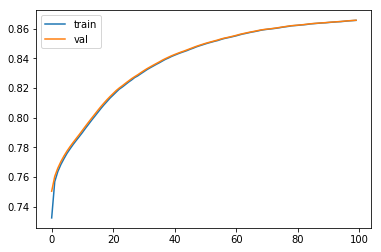

In [24]:
plt.plot(history.history['auc'], label='train')
plt.plot(history.history['val_auc'], label='val')
plt.legend()
plt.show()    
    
# load best model saved at checkpoint¶

model.load_weights("../output/model_best_auc.hd5")
X_test_array = np.array(X_test_scld)
y_test = model.predict(X_test_array)

list_preds.append(y_test)        

In [25]:
history.history

{'val_loss': [0.2446755235029153,
  0.244602648816656,
  0.24905103209756924,
  0.25210262271239686,
  0.25752895724555946,
  0.26300470064787695,
  0.2644677974476808,
  0.28111560812826814,
  0.27759306251049065,
  0.2849140630536798,
  0.29062821710886727,
  0.305965273304392,
  0.30254688891067655,
  0.3137685948758849,
  0.31608742268398,
  0.3292301305435433,
  0.33927370247555666,
  0.36569664130363505,
  0.3606365643758727,
  0.3904429731084404,
  0.4095103845292061,
  0.4061938402063461,
  0.47741395734300274,
  0.4488717531971683,
  0.45107690037327897,
  0.500678070349383,
  0.4589699977864674,
  0.5231214343154685,
  0.5096959467978849,
  0.5185371640166414,
  0.49412963849450375,
  0.5095584918850085,
  0.5421945429730813,
  0.522336405355704,
  0.532338332283312,
  0.5294613008290417,
  0.5401926324380073,
  0.5609247642164052,
  0.5878664321197011,
  0.5814048514460392,
  0.6021604956486277,
  0.647390253602113,
  0.6410357291765676,
  0.6426794312981217,
  0.62032191119


### <a id="5.1">5.1 Predict</a>

In [26]:
preds = np.mean(list_preds, axis=0)

#preds = None

    
sub_lgb = pd.DataFrame()
sub_lgb['SK_ID_CURR'] = test_id
sub_lgb['TARGET'] = preds
sub_lgb.to_csv("../output/12_nn_auc.csv", index=False)
sub_lgb.head()

,SK_ID_CURR,TARGET
0,100001,0.044074
1,100005,0.256505
2,100013,0.017539
3,100028,0.048552
4,100038,0.211853


In [27]:
print('result: ???')

result: ???


https://www.dlology.com/blog/simple-guide-on-how-to-generate-roc-plot-for-keras-classifier/

In [28]:
y_pred_keras = model.predict(val_x).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(val_y, y_pred_keras)

auc_keras = auc(fpr_keras, tpr_keras)


from sklearn.ensemble import RandomForestClassifier
# Supervised transformation based on random forests
rf = RandomForestClassifier(max_depth=3, n_estimators=10)
rf.fit(trn_x, trn_y)

y_pred_rf = rf.predict_proba(val_x)[:, 1]
fpr_rf, tpr_rf, thresholds_rf = roc_curve(val_y, y_pred_rf)
auc_rf = auc(fpr_rf, tpr_rf)

TypeError: unsupported format string passed to Tensor.__format__

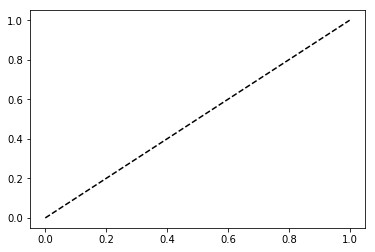

In [29]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
plt.plot(fpr_rf, tpr_rf, label='RF (area = {:.3f})'.format(auc_rf))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()